<img width="800px" src="../fidle/img/00-Fidle-header-01.svg"></img>

# <!-- TITLE --> [VAE8] - Training session for our VAE
<!-- DESC --> Episode 4 : Training with our clustered datasets in notebook or batch mode
<!-- AUTHOR : Jean-Luc Parouty (CNRS/SIMaP) -->

## Objectives :
 - Build and train a VAE model with a large dataset in **small or medium resolution (70 to 140 GB)**
 - Understanding a more advanced programming model with **data generator**

The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) contains about 200,000 images (202599,218,178,3).  

## What we're going to do :

 - Defining a VAE model
 - Build the model
 - Train it
 - Follow the learning process with Tensorboard

## Acknowledgements :
As before, thanks to **François Chollet** who is at the base of this example.  
See : https://keras.io/examples/generative/vae


## Step 1 - Init python stuff

In [1]:
import numpy as np
from skimage import io

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard

import os,sys,json,time,datetime
from IPython.display import display,Image,Markdown,HTML

from modules.data_generator import DataGenerator
from modules.VAE            import VAE, Sampling
from modules.callbacks      import ImagesCallback, BestModelCallback

sys.path.append('..')
import fidle.pwk as pwk

run_dir = './run/CelebA.001'                  # Output directory
datasets_dir = pwk.init('VAE8', run_dir)

VAE.about()
DataGenerator.about()

**\*\* Overrided parameters : \*\***

run_dir              : ./run/VAE8_done


<br>**FIDLE 2020 - Practical Work Module**

Version              : 2.0.7
Notebook id          : VAE8
Run time             : Wednesday 27 January 2021, 19:30:29
TensorFlow version   : 2.2.0
Keras version        : 2.3.0-tf
Datasets dir         : /gpfswork/rech/mlh/uja62cb/datasets
Run dir              : ./run/VAE8_done
Update keras cache   : False
Save figs            : True
Path figs            : ./run/VAE8_done/figs


<br>**FIDLE 2021 - VAE**

Version              : 1.2
TensorFlow version   : 2.2.0
Keras version        : 2.3.0-tf


<br>**FIDLE 2020 - DataGenerator**

Version              : 0.4.1
TensorFlow version   : 2.2.0
Keras version        : 2.3.0-tf


In [2]:
# To clean run_dir, uncomment and run this next line
# ! rm -r "$run_dir"/images-* "$run_dir"/logs "$run_dir"/figs "$run_dir"/models ; rmdir "$run_dir"

## Step 2 - Parameters
Uncomment the right lines according to what you want.

In [3]:
# ---- For tests
scale         = 0.3
image_size    = (128,128)
enhanced_dir  = './data'
latent_dim    = 300
r_loss_factor = 0.6
batch_size    = 64
epochs        = 15

# ---- Training with a full dataset
# scale         = 1.
# image_size    = (128,128)
# enhanced_dir  = f'{datasets_dir}/celeba/enhanced'
# latent_dim    = 300
# r_loss_factor = 0.6
# batch_size    = 64
# epochs        = 15

# ---- Training with a full dataset of large images
# scale         = 1.
# image_size    = (192,160)
# enhanced_dir  = f'{datasets_dir}/celeba/enhanced'
# latent_dim    = 300
# r_loss_factor = 0.6
# batch_size    = 64
# epochs        = 15

Override parameters (batch mode) - Just forget this cell

In [4]:
pwk.override('scale', 'image_size', 'enhanced_dir', 'latent_dim', 'r_loss_factor', 'batch_size', 'epochs')

**\*\* Overrided parameters : \*\***

scale                : 1
image_size           : (192, 160)
enhanced_dir         : /gpfswork/rech/mlh/uja62cb/datasets/celeba/enhanced
latent_dim           : 300
r_loss_factor        : 0.6
batch_size           : 64
epochs               : 15


## Step 3 - Get some data
Let's instantiate our generator for the entire dataset.

### 3.1 - Finding the right place

In [5]:
lx,ly      = image_size
train_dir  = f'{enhanced_dir}/clusters-{lx}x{ly}'

print('Train directory is :',train_dir)

Train directory is : /gpfswork/rech/mlh/uja62cb/datasets/celeba/enhanced/clusters-192x160


### 3.2 - Get a DataGenerator

In [6]:
data_gen = DataGenerator(train_dir, 32, k_size=scale)

print(f'Data generator is ready with : {len(data_gen)} batchs of {data_gen.batch_size} images, or {data_gen.dataset_size} images')

Data generator is ready with : 6331 batchs of 32 images, or 202599 images


## Step 4 - Build model

#### Encoder

In [7]:
inputs    = keras.Input(shape=(lx, ly, 3))
x         = layers.Conv2D(32, 3, strides=2, padding="same", activation="relu")(inputs)
x         = layers.Conv2D(64, 3, strides=2, padding="same", activation="relu")(x)
x         = layers.Conv2D(64, 3, strides=2, padding="same", activation="relu")(x)
x         = layers.Conv2D(64, 3, strides=2, padding="same", activation="relu")(x)

shape_before_flattening = keras.backend.int_shape(x)[1:]

x         = layers.Flatten()(x)
x         = layers.Dense(512, activation="relu")(x)

z_mean    = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z         = Sampling()([z_mean, z_log_var])

encoder = keras.Model(inputs, [z_mean, z_log_var, z], name="encoder")
encoder.compile()
# encoder.summary()

#### Decoder

In [8]:
inputs  = keras.Input(shape=(latent_dim,))

x = layers.Dense(np.prod(shape_before_flattening))(inputs)
x = layers.Reshape(shape_before_flattening)(x)

x       = layers.Conv2DTranspose(64, 3, strides=2, padding="same", activation="relu")(x)
x       = layers.Conv2DTranspose(64, 3, strides=2, padding="same", activation="relu")(x)
x       = layers.Conv2DTranspose(64, 3, strides=2, padding="same", activation="relu")(x)
x       = layers.Conv2DTranspose(32, 3, strides=2, padding="same", activation="relu")(x)
outputs = layers.Conv2DTranspose(3,  3, padding="same", activation="sigmoid")(x)

decoder = keras.Model(inputs, outputs, name="decoder")
decoder.compile()
# decoder.summary()

#### VAE
Our loss function is the weighted sum of two values.  
`reconstruction_loss` which measures the loss during reconstruction.  
`kl_loss` which measures the dispersion.  

The weights are defined by: `r_loss_factor` :  
`total_loss = r_loss_factor*reconstruction_loss + (1-r_loss_factor)*kl_loss`

if `r_loss_factor = 1`, the loss function includes only `reconstruction_loss`  
if `r_loss_factor = 0`, the loss function includes only `kl_loss`  
In practice, a value arround 0.5 gives good results here.


In [9]:
vae = VAE(encoder, decoder, r_loss_factor)

vae.compile(optimizer=keras.optimizers.Adam())

Init VAE, with r_loss_factor=0.6


## Step 5 - Train
With `scale=1`, need 20' for 10 epochs on a V100 (IDRIS)  
...on a basic CPU, may be >40 hours !

### 5.1 - Callbacks

In [10]:
x_draw,_   = data_gen[0]
data_gen.rewind()

# ---- Callback : Images encoded
pwk.mkdir(run_dir + '/images-encoded')
filename = run_dir + '/images-encoded/image-{epoch:03d}-{i:02d}.jpg'
callback_images1 = ImagesCallback(filename, x=x_draw[:5], encoder=encoder,decoder=decoder)

# ---- Callback : Images generated
pwk.mkdir(run_dir + '/images-generated')
filename = run_dir + '/images-generated/image-{epoch:03d}-{i:02d}.jpg'
callback_images2 = ImagesCallback(filename, x=None, nb_images=5, z_dim=latent_dim, encoder=encoder,decoder=decoder)          

# ---- Callback : Best model
pwk.mkdir(run_dir + '/models')
filename = run_dir + '/models/best_model'
callback_bestmodel = BestModelCallback(filename)

# ---- Callback tensorboard
dirname = run_dir + '/logs'
callback_tensorboard = TensorBoard(log_dir=dirname, histogram_freq=1)

callbacks_list = [callback_images1, callback_images2, callback_bestmodel, callback_tensorboard]
callbacks_list = [callback_images1, callback_images2, callback_bestmodel]

### 5.2 - Train it

In [11]:
pwk.chrono_start()

history = vae.fit(data_gen, epochs=epochs, batch_size=batch_size, callbacks=callbacks_list)

pwk.chrono_show()

Epoch 1/15


   1/6331 [..............................] - ETA: 0s - loss: 0.4162 - r_loss: 0.6932 - kl_loss: 8.1010e-04

   3/6331 [..............................] - ETA: 2:08 - loss: 0.4158 - r_loss: 0.6928 - kl_loss: 3.0731e-04

   5/6331 [..............................] - ETA: 2:44 - loss: 0.4154 - r_loss: 0.6921 - kl_loss: 1.8984e-04

   7/6331 [..............................] - ETA: 3:03 - loss: 0.4148 - r_loss: 0.6912 - kl_loss: 1.3812e-04

   9/6331 [..............................] - ETA: 3:08 - loss: 0.4143 - r_loss: 0.6904 - kl_loss: 1.0906e-04

  11/6331 [..............................] - ETA: 3:12 - loss: 0.4137 - r_loss: 0.6894 - kl_loss: 9.0468e-05

  13/6331 [..............................] - ETA: 3:15 - loss: 0.4126 - r_loss: 0.6876 - kl_loss: 7.7561e-05

  15/6331 [..............................] - ETA: 3:16 - loss: 0.4122 - r_loss: 0.6869 - kl_loss: 6.8087e-05

  17/6331 [..............................] - ETA: 3:18 - loss: 0.4119 - r_loss: 0.6864 - kl_loss: 6.0771e-05

  19/6331 [..............................] - ETA: 3:19 - loss: 0.4111 - r_loss: 0.6851 - kl_loss: 5.4894e-05

  21/6331 [..............................] - ETA: 3:21 - loss: 0.4109 - r_loss: 0.6849 - kl_loss: 5.0103e-05

  23/6331 [..............................] - ETA: 3:22 - loss: 0.4105 - r_loss: 0.6841 - kl_loss: 4.6163e-05

  25/6331 [..............................] - ETA: 3:22 - loss: 0.4102 - r_loss: 0.6836 - kl_loss: 4.2898e-05

  27/6331 [..............................] - ETA: 3:22 - loss: 0.4101 - r_loss: 0.6835 - kl_loss: 4.0178e-05

  29/6331 [..............................] - ETA: 3:22 - loss: 0.4100 - r_loss: 0.6833 - kl_loss: 3.7909e-05

  31/6331 [..............................] - ETA: 3:22 - loss: 0.4099 - r_loss: 0.6831 - kl_loss: 3.6018e-05

  33/6331 [..............................] - ETA: 3:22 - loss: 0.4097 - r_loss: 0.6827 - kl_loss: 3.4462e-05

  35/6331 [..............................] - ETA: 3:22 - loss: 0.4097 - r_loss: 0.6828 - kl_loss: 3.3314e-05

  37/6331 [..............................] - ETA: 3:22 - loss: 0.4098 - r_loss: 0.6829 - kl_loss: 3.2671e-05

  39/6331 [..............................] - ETA: 3:22 - loss: 0.4096 - r_loss: 0.6827 - kl_loss: 3.2584e-05

  41/6331 [..............................] - ETA: 3:23 - loss: 0.4093 - r_loss: 0.6821 - kl_loss: 3.2488e-05

  43/6331 [..............................] - ETA: 3:23 - loss: 0.4091 - r_loss: 0.6818 - kl_loss: 3.2216e-05

  45/6331 [..............................] - ETA: 3:24 - loss: 0.4091 - r_loss: 0.6818 - kl_loss: 3.5251e-05

  47/6331 [..............................] - ETA: 3:25 - loss: 0.4090 - r_loss: 0.6817 - kl_loss: 4.4478e-05

  49/6331 [..............................] - ETA: 3:25 - loss: 0.4087 - r_loss: 0.6812 - kl_loss: 5.4773e-05

  51/6331 [..............................] - ETA: 3:26 - loss: 0.4086 - r_loss: 0.6810 - kl_loss: 8.0223e-05

  53/6331 [..............................] - ETA: 3:27 - loss: 0.4086 - r_loss: 0.6809 - kl_loss: 1.3989e-04

  55/6331 [..............................] - ETA: 3:27 - loss: 0.4085 - r_loss: 0.6808 - kl_loss: 1.5958e-04

  57/6331 [..............................] - ETA: 3:27 - loss: 0.4085 - r_loss: 0.6806 - kl_loss: 2.5801e-04

  59/6331 [..............................] - ETA: 3:26 - loss: 0.4083 - r_loss: 0.6803 - kl_loss: 3.1856e-04

  61/6331 [..............................] - ETA: 3:27 - loss: 0.4081 - r_loss: 0.6798 - kl_loss: 4.9122e-04

  63/6331 [..............................] - ETA: 3:27 - loss: 0.4079 - r_loss: 0.6792 - kl_loss: 8.2482e-04

  65/6331 [..............................] - ETA: 3:27 - loss: 0.4076 - r_loss: 0.6784 - kl_loss: 0.0012    

  67/6331 [..............................] - ETA: 3:28 - loss: 0.4073 - r_loss: 0.6780 - kl_loss: 0.0014

  69/6331 [..............................] - ETA: 3:29 - loss: 0.4071 - r_loss: 0.6774 - kl_loss: 0.0016

  71/6331 [..............................] - ETA: 3:29 - loss: 0.4065 - r_loss: 0.6762 - kl_loss: 0.0020

  73/6331 [..............................] - ETA: 3:29 - loss: 0.4063 - r_loss: 0.6756 - kl_loss: 0.0023

  75/6331 [..............................] - ETA: 3:29 - loss: 0.4058 - r_loss: 0.6746 - kl_loss: 0.0025

  77/6331 [..............................] - ETA: 3:30 - loss: 0.4055 - r_loss: 0.6739 - kl_loss: 0.0027

  79/6331 [..............................] - ETA: 3:29 - loss: 0.4050 - r_loss: 0.6731 - kl_loss: 0.0030

  81/6331 [..............................] - ETA: 3:29 - loss: 0.4048 - r_loss: 0.6724 - kl_loss: 0.0033

  83/6331 [..............................] - ETA: 3:30 - loss: 0.4044 - r_loss: 0.6717 - kl_loss: 0.0034

  85/6331 [..............................] - ETA: 3:30 - loss: 0.4040 - r_loss: 0.6708 - kl_loss: 0.0037

  87/6331 [..............................] - ETA: 3:30 - loss: 0.4036 - r_loss: 0.6699 - kl_loss: 0.0040

  89/6331 [..............................] - ETA: 3:30 - loss: 0.4033 - r_loss: 0.6694 - kl_loss: 0.0042

  91/6331 [..............................] - ETA: 3:30 - loss: 0.4029 - r_loss: 0.6687 - kl_loss: 0.0043

  93/6331 [..............................] - ETA: 3:30 - loss: 0.4025 - r_loss: 0.6679 - kl_loss: 0.0045

  95/6331 [..............................] - ETA: 3:30 - loss: 0.4021 - r_loss: 0.6671 - kl_loss: 0.0047

  97/6331 [..............................] - ETA: 3:30 - loss: 0.4017 - r_loss: 0.6662 - kl_loss: 0.0050

  99/6331 [..............................] - ETA: 3:30 - loss: 0.4014 - r_loss: 0.6656 - kl_loss: 0.0053

 101/6331 [..............................] - ETA: 3:30 - loss: 0.4011 - r_loss: 0.6649 - kl_loss: 0.0054

 103/6331 [..............................] - ETA: 3:30 - loss: 0.4007 - r_loss: 0.6642 - kl_loss: 0.0056

 105/6331 [..............................] - ETA: 3:30 - loss: 0.4005 - r_loss: 0.6636 - kl_loss: 0.0058

 107/6331 [..............................] - ETA: 3:30 - loss: 0.4002 - r_loss: 0.6630 - kl_loss: 0.0060

 109/6331 [..............................] - ETA: 3:30 - loss: 0.3999 - r_loss: 0.6624 - kl_loss: 0.0062

 111/6331 [..............................] - ETA: 3:30 - loss: 0.3998 - r_loss: 0.6621 - kl_loss: 0.0064

 113/6331 [..............................] - ETA: 3:30 - loss: 0.3995 - r_loss: 0.6615 - kl_loss: 0.0065

 115/6331 [..............................] - ETA: 3:29 - loss: 0.3993 - r_loss: 0.6610 - kl_loss: 0.0067

 117/6331 [..............................] - ETA: 3:30 - loss: 0.3989 - r_loss: 0.6602 - kl_loss: 0.0069

 119/6331 [..............................] - ETA: 3:30 - loss: 0.3986 - r_loss: 0.6596 - kl_loss: 0.0070

 121/6331 [..............................] - ETA: 3:29 - loss: 0.3981 - r_loss: 0.6588 - kl_loss: 0.0072

 123/6331 [..............................] - ETA: 3:29 - loss: 0.3979 - r_loss: 0.6584 - kl_loss: 0.0073

 125/6331 [..............................] - ETA: 3:30 - loss: 0.3977 - r_loss: 0.6580 - kl_loss: 0.0074

 127/6331 [..............................] - ETA: 3:30 - loss: 0.3975 - r_loss: 0.6574 - kl_loss: 0.0076

 129/6331 [..............................] - ETA: 3:30 - loss: 0.3972 - r_loss: 0.6569 - kl_loss: 0.0077

 131/6331 [..............................] - ETA: 3:30 - loss: 0.3970 - r_loss: 0.6565 - kl_loss: 0.0079

 133/6331 [..............................] - ETA: 3:30 - loss: 0.3967 - r_loss: 0.6558 - kl_loss: 0.0081

 135/6331 [..............................] - ETA: 3:30 - loss: 0.3964 - r_loss: 0.6552 - kl_loss: 0.0083

 137/6331 [..............................] - ETA: 3:30 - loss: 0.3962 - r_loss: 0.6548 - kl_loss: 0.0084

 139/6331 [..............................] - ETA: 3:30 - loss: 0.3960 - r_loss: 0.6542 - kl_loss: 0.0085

 141/6331 [..............................] - ETA: 3:30 - loss: 0.3956 - r_loss: 0.6536 - kl_loss: 0.0086

 143/6331 [..............................] - ETA: 3:30 - loss: 0.3953 - r_loss: 0.6531 - kl_loss: 0.0087

 145/6331 [..............................] - ETA: 3:30 - loss: 0.3951 - r_loss: 0.6527 - kl_loss: 0.0088

 147/6331 [..............................] - ETA: 3:30 - loss: 0.3951 - r_loss: 0.6526 - kl_loss: 0.0089

 149/6331 [..............................] - ETA: 3:30 - loss: 0.3949 - r_loss: 0.6521 - kl_loss: 0.0093

 151/6331 [..............................] - ETA: 3:30 - loss: 0.3948 - r_loss: 0.6517 - kl_loss: 0.0094

 153/6331 [..............................] - ETA: 3:30 - loss: 0.3947 - r_loss: 0.6514 - kl_loss: 0.0095

 155/6331 [..............................] - ETA: 3:30 - loss: 0.3944 - r_loss: 0.6508 - kl_loss: 0.0097

 157/6331 [..............................] - ETA: 3:30 - loss: 0.3942 - r_loss: 0.6504 - kl_loss: 0.0098

 159/6331 [..............................] - ETA: 3:30 - loss: 0.3939 - r_loss: 0.6499 - kl_loss: 0.0099

 161/6331 [..............................] - ETA: 3:30 - loss: 0.3938 - r_loss: 0.6496 - kl_loss: 0.0101

 163/6331 [..............................] - ETA: 3:30 - loss: 0.3936 - r_loss: 0.6492 - kl_loss: 0.0102

 165/6331 [..............................] - ETA: 3:30 - loss: 0.3935 - r_loss: 0.6489 - kl_loss: 0.0103

 167/6331 [..............................] - ETA: 3:30 - loss: 0.3933 - r_loss: 0.6487 - kl_loss: 0.0103

 169/6331 [..............................] - ETA: 3:30 - loss: 0.3932 - r_loss: 0.6484 - kl_loss: 0.0104

 171/6331 [..............................] - ETA: 3:30 - loss: 0.3930 - r_loss: 0.6480 - kl_loss: 0.0105

 173/6331 [..............................] - ETA: 3:30 - loss: 0.3928 - r_loss: 0.6476 - kl_loss: 0.0106

 175/6331 [..............................] - ETA: 3:30 - loss: 0.3927 - r_loss: 0.6473 - kl_loss: 0.0108

 177/6331 [..............................] - ETA: 3:30 - loss: 0.3924 - r_loss: 0.6468 - kl_loss: 0.0109

 179/6331 [..............................] - ETA: 3:30 - loss: 0.3921 - r_loss: 0.6460 - kl_loss: 0.0111

 181/6331 [..............................] - ETA: 3:30 - loss: 0.3919 - r_loss: 0.6457 - kl_loss: 0.0112

 183/6331 [..............................] - ETA: 3:30 - loss: 0.3917 - r_loss: 0.6453 - kl_loss: 0.0113

 185/6331 [..............................] - ETA: 3:30 - loss: 0.3914 - r_loss: 0.6447 - kl_loss: 0.0114

 187/6331 [..............................] - ETA: 3:30 - loss: 0.3911 - r_loss: 0.6441 - kl_loss: 0.0115

 189/6331 [..............................] - ETA: 3:30 - loss: 0.3909 - r_loss: 0.6437 - kl_loss: 0.0117

 191/6331 [..............................] - ETA: 3:30 - loss: 0.3906 - r_loss: 0.6432 - kl_loss: 0.0118

 193/6331 [..............................] - ETA: 3:30 - loss: 0.3903 - r_loss: 0.6426 - kl_loss: 0.0119

 195/6331 [..............................] - ETA: 3:30 - loss: 0.3901 - r_loss: 0.6421 - kl_loss: 0.0120

 197/6331 [..............................] - ETA: 3:30 - loss: 0.3899 - r_loss: 0.6416 - kl_loss: 0.0122

 199/6331 [..............................] - ETA: 3:30 - loss: 0.3897 - r_loss: 0.6413 - kl_loss: 0.0123

 201/6331 [..............................] - ETA: 3:30 - loss: 0.3894 - r_loss: 0.6407 - kl_loss: 0.0124

 203/6331 [..............................] - ETA: 3:30 - loss: 0.3892 - r_loss: 0.6404 - kl_loss: 0.0125

 205/6331 [..............................] - ETA: 3:30 - loss: 0.3891 - r_loss: 0.6400 - kl_loss: 0.0127

 207/6331 [..............................] - ETA: 3:30 - loss: 0.3889 - r_loss: 0.6397 - kl_loss: 0.0128

 209/6331 [..............................] - ETA: 3:30 - loss: 0.3887 - r_loss: 0.6393 - kl_loss: 0.0129

 211/6331 [..............................] - ETA: 3:30 - loss: 0.3886 - r_loss: 0.6389 - kl_loss: 0.0130

 213/6331 [>.............................] - ETA: 3:30 - loss: 0.3883 - r_loss: 0.6385 - kl_loss: 0.0132

 215/6331 [>.............................] - ETA: 3:30 - loss: 0.3881 - r_loss: 0.6379 - kl_loss: 0.0133

 217/6331 [>.............................] - ETA: 3:30 - loss: 0.3877 - r_loss: 0.6373 - kl_loss: 0.0134

 219/6331 [>.............................] - ETA: 3:30 - loss: 0.3876 - r_loss: 0.6370 - kl_loss: 0.0135

 221/6331 [>.............................] - ETA: 3:30 - loss: 0.3874 - r_loss: 0.6366 - kl_loss: 0.0136

 223/6331 [>.............................] - ETA: 3:30 - loss: 0.3872 - r_loss: 0.6362 - kl_loss: 0.0136

 225/6331 [>.............................] - ETA: 3:30 - loss: 0.3870 - r_loss: 0.6357 - kl_loss: 0.0138

 227/6331 [>.............................] - ETA: 3:30 - loss: 0.3868 - r_loss: 0.6353 - kl_loss: 0.0140

 229/6331 [>.............................] - ETA: 3:30 - loss: 0.3866 - r_loss: 0.6350 - kl_loss: 0.0141

 231/6331 [>.............................] - ETA: 3:30 - loss: 0.3865 - r_loss: 0.6347 - kl_loss: 0.0142

 233/6331 [>.............................] - ETA: 3:30 - loss: 0.3864 - r_loss: 0.6344 - kl_loss: 0.0143

 235/6331 [>.............................] - ETA: 3:30 - loss: 0.3862 - r_loss: 0.6342 - kl_loss: 0.0144

 237/6331 [>.............................] - ETA: 3:30 - loss: 0.3860 - r_loss: 0.6337 - kl_loss: 0.0145

 239/6331 [>.............................] - ETA: 3:30 - loss: 0.3858 - r_loss: 0.6334 - kl_loss: 0.0145

 241/6331 [>.............................] - ETA: 3:30 - loss: 0.3857 - r_loss: 0.6331 - kl_loss: 0.0146

 243/6331 [>.............................] - ETA: 3:30 - loss: 0.3856 - r_loss: 0.6328 - kl_loss: 0.0147

 245/6331 [>.............................] - ETA: 3:30 - loss: 0.3853 - r_loss: 0.6322 - kl_loss: 0.0149

 247/6331 [>.............................] - ETA: 3:30 - loss: 0.3851 - r_loss: 0.6318 - kl_loss: 0.0150

 249/6331 [>.............................] - ETA: 3:30 - loss: 0.3848 - r_loss: 0.6313 - kl_loss: 0.0151

 251/6331 [>.............................] - ETA: 3:30 - loss: 0.3847 - r_loss: 0.6310 - kl_loss: 0.0152

 253/6331 [>.............................] - ETA: 3:30 - loss: 0.3846 - r_loss: 0.6308 - kl_loss: 0.0153

 255/6331 [>.............................] - ETA: 3:30 - loss: 0.3845 - r_loss: 0.6305 - kl_loss: 0.0154

 257/6331 [>.............................] - ETA: 3:30 - loss: 0.3843 - r_loss: 0.6302 - kl_loss: 0.0155

 259/6331 [>.............................] - ETA: 3:29 - loss: 0.3842 - r_loss: 0.6300 - kl_loss: 0.0155

 261/6331 [>.............................] - ETA: 3:29 - loss: 0.3840 - r_loss: 0.6296 - kl_loss: 0.0156

 263/6331 [>.............................] - ETA: 3:29 - loss: 0.3839 - r_loss: 0.6293 - kl_loss: 0.0157

 265/6331 [>.............................] - ETA: 3:29 - loss: 0.3838 - r_loss: 0.6291 - kl_loss: 0.0158

 267/6331 [>.............................] - ETA: 3:29 - loss: 0.3836 - r_loss: 0.6288 - kl_loss: 0.0159

 269/6331 [>.............................] - ETA: 3:29 - loss: 0.3835 - r_loss: 0.6285 - kl_loss: 0.0160

 271/6331 [>.............................] - ETA: 3:29 - loss: 0.3834 - r_loss: 0.6283 - kl_loss: 0.0160

 273/6331 [>.............................] - ETA: 3:28 - loss: 0.3832 - r_loss: 0.6279 - kl_loss: 0.0162

 275/6331 [>.............................] - ETA: 3:28 - loss: 0.3831 - r_loss: 0.6276 - kl_loss: 0.0163

 277/6331 [>.............................] - ETA: 3:28 - loss: 0.3831 - r_loss: 0.6275 - kl_loss: 0.0163

 279/6331 [>.............................] - ETA: 3:28 - loss: 0.3829 - r_loss: 0.6273 - kl_loss: 0.0164

 281/6331 [>.............................] - ETA: 3:28 - loss: 0.3828 - r_loss: 0.6270 - kl_loss: 0.0165

 283/6331 [>.............................] - ETA: 3:28 - loss: 0.3827 - r_loss: 0.6267 - kl_loss: 0.0166

 285/6331 [>.............................] - ETA: 3:28 - loss: 0.3825 - r_loss: 0.6264 - kl_loss: 0.0167

 287/6331 [>.............................] - ETA: 3:28 - loss: 0.3825 - r_loss: 0.6263 - kl_loss: 0.0167

 289/6331 [>.............................] - ETA: 3:27 - loss: 0.3823 - r_loss: 0.6260 - kl_loss: 0.0168

 291/6331 [>.............................] - ETA: 3:27 - loss: 0.3822 - r_loss: 0.6258 - kl_loss: 0.0169

 293/6331 [>.............................] - ETA: 3:27 - loss: 0.3821 - r_loss: 0.6256 - kl_loss: 0.0169

 295/6331 [>.............................] - ETA: 3:27 - loss: 0.3820 - r_loss: 0.6253 - kl_loss: 0.0170

 297/6331 [>.............................] - ETA: 3:27 - loss: 0.3819 - r_loss: 0.6250 - kl_loss: 0.0171

 299/6331 [>.............................] - ETA: 3:27 - loss: 0.3817 - r_loss: 0.6247 - kl_loss: 0.0172

 301/6331 [>.............................] - ETA: 3:27 - loss: 0.3816 - r_loss: 0.6245 - kl_loss: 0.0173

 303/6331 [>.............................] - ETA: 3:27 - loss: 0.3814 - r_loss: 0.6242 - kl_loss: 0.0173

 305/6331 [>.............................] - ETA: 3:27 - loss: 0.3813 - r_loss: 0.6240 - kl_loss: 0.0174

 307/6331 [>.............................] - ETA: 3:26 - loss: 0.3813 - r_loss: 0.6238 - kl_loss: 0.0175

 309/6331 [>.............................] - ETA: 3:26 - loss: 0.3812 - r_loss: 0.6236 - kl_loss: 0.0175

 311/6331 [>.............................] - ETA: 3:26 - loss: 0.3811 - r_loss: 0.6235 - kl_loss: 0.0176

 312/6331 [>.............................] - ETA: 3:29 - loss: 0.3811 - r_loss: 0.6233 - kl_loss: 0.0176

 314/6331 [>.............................] - ETA: 3:30 - loss: 0.3810 - r_loss: 0.6232 - kl_loss: 0.0177

 316/6331 [>.............................] - ETA: 3:30 - loss: 0.3809 - r_loss: 0.6229 - kl_loss: 0.0178

 318/6331 [>.............................] - ETA: 3:30 - loss: 0.3808 - r_loss: 0.6227 - kl_loss: 0.0179

 320/6331 [>.............................] - ETA: 3:30 - loss: 0.3807 - r_loss: 0.6225 - kl_loss: 0.0180

 322/6331 [>.............................] - ETA: 3:30 - loss: 0.3806 - r_loss: 0.6223 - kl_loss: 0.0181

 324/6331 [>.............................] - ETA: 3:30 - loss: 0.3805 - r_loss: 0.6220 - kl_loss: 0.0181

 326/6331 [>.............................] - ETA: 3:29 - loss: 0.3804 - r_loss: 0.6219 - kl_loss: 0.0181

 328/6331 [>.............................] - ETA: 3:29 - loss: 0.3803 - r_loss: 0.6217 - kl_loss: 0.0182

 330/6331 [>.............................] - ETA: 3:29 - loss: 0.3802 - r_loss: 0.6216 - kl_loss: 0.0182

 332/6331 [>.............................] - ETA: 3:29 - loss: 0.3801 - r_loss: 0.6214 - kl_loss: 0.0183

 334/6331 [>.............................] - ETA: 3:29 - loss: 0.3800 - r_loss: 0.6211 - kl_loss: 0.0183

 336/6331 [>.............................] - ETA: 3:29 - loss: 0.3799 - r_loss: 0.6208 - kl_loss: 0.0185

 338/6331 [>.............................] - ETA: 3:28 - loss: 0.3798 - r_loss: 0.6206 - kl_loss: 0.0185

 340/6331 [>.............................] - ETA: 3:28 - loss: 0.3797 - r_loss: 0.6205 - kl_loss: 0.0186

 342/6331 [>.............................] - ETA: 3:28 - loss: 0.3797 - r_loss: 0.6204 - kl_loss: 0.0186

 344/6331 [>.............................] - ETA: 3:28 - loss: 0.3796 - r_loss: 0.6203 - kl_loss: 0.0186

 346/6331 [>.............................] - ETA: 3:28 - loss: 0.3795 - r_loss: 0.6201 - kl_loss: 0.0187

 348/6331 [>.............................] - ETA: 3:28 - loss: 0.3794 - r_loss: 0.6199 - kl_loss: 0.0188

 350/6331 [>.............................] - ETA: 3:28 - loss: 0.3793 - r_loss: 0.6196 - kl_loss: 0.0189

 352/6331 [>.............................] - ETA: 3:28 - loss: 0.3793 - r_loss: 0.6195 - kl_loss: 0.0189

 354/6331 [>.............................] - ETA: 3:27 - loss: 0.3792 - r_loss: 0.6193 - kl_loss: 0.0190

 356/6331 [>.............................] - ETA: 3:27 - loss: 0.3791 - r_loss: 0.6191 - kl_loss: 0.0190

 358/6331 [>.............................] - ETA: 3:27 - loss: 0.3789 - r_loss: 0.6189 - kl_loss: 0.0191

 360/6331 [>.............................] - ETA: 3:27 - loss: 0.3789 - r_loss: 0.6187 - kl_loss: 0.0191

 362/6331 [>.............................] - ETA: 3:27 - loss: 0.3788 - r_loss: 0.6186 - kl_loss: 0.0191

 364/6331 [>.............................] - ETA: 3:27 - loss: 0.3787 - r_loss: 0.6184 - kl_loss: 0.0192

 366/6331 [>.............................] - ETA: 3:27 - loss: 0.3787 - r_loss: 0.6183 - kl_loss: 0.0192

 368/6331 [>.............................] - ETA: 3:26 - loss: 0.3786 - r_loss: 0.6181 - kl_loss: 0.0193

 370/6331 [>.............................] - ETA: 3:26 - loss: 0.3785 - r_loss: 0.6179 - kl_loss: 0.0194

 372/6331 [>.............................] - ETA: 3:26 - loss: 0.3785 - r_loss: 0.6178 - kl_loss: 0.0194

 374/6331 [>.............................] - ETA: 3:26 - loss: 0.3784 - r_loss: 0.6177 - kl_loss: 0.0195

 376/6331 [>.............................] - ETA: 3:26 - loss: 0.3784 - r_loss: 0.6177 - kl_loss: 0.0195

 378/6331 [>.............................] - ETA: 3:26 - loss: 0.3783 - r_loss: 0.6175 - kl_loss: 0.0195

 380/6331 [>.............................] - ETA: 3:26 - loss: 0.3783 - r_loss: 0.6174 - kl_loss: 0.0196

 382/6331 [>.............................] - ETA: 3:25 - loss: 0.3782 - r_loss: 0.6172 - kl_loss: 0.0196

 384/6331 [>.............................] - ETA: 3:25 - loss: 0.3781 - r_loss: 0.6171 - kl_loss: 0.0197

 386/6331 [>.............................] - ETA: 3:25 - loss: 0.3780 - r_loss: 0.6169 - kl_loss: 0.0197

 388/6331 [>.............................] - ETA: 3:25 - loss: 0.3779 - r_loss: 0.6167 - kl_loss: 0.0197

 390/6331 [>.............................] - ETA: 3:25 - loss: 0.3779 - r_loss: 0.6166 - kl_loss: 0.0197

 392/6331 [>.............................] - ETA: 3:25 - loss: 0.3778 - r_loss: 0.6164 - kl_loss: 0.0198

 394/6331 [>.............................] - ETA: 3:25 - loss: 0.3777 - r_loss: 0.6163 - kl_loss: 0.0198

 396/6331 [>.............................] - ETA: 3:25 - loss: 0.3776 - r_loss: 0.6161 - kl_loss: 0.0199

 398/6331 [>.............................] - ETA: 3:24 - loss: 0.3775 - r_loss: 0.6159 - kl_loss: 0.0199

 400/6331 [>.............................] - ETA: 3:24 - loss: 0.3775 - r_loss: 0.6158 - kl_loss: 0.0200

 402/6331 [>.............................] - ETA: 3:24 - loss: 0.3774 - r_loss: 0.6156 - kl_loss: 0.0200

 404/6331 [>.............................] - ETA: 3:24 - loss: 0.3773 - r_loss: 0.6154 - kl_loss: 0.0201

 406/6331 [>.............................] - ETA: 3:24 - loss: 0.3772 - r_loss: 0.6153 - kl_loss: 0.0201

 408/6331 [>.............................] - ETA: 3:24 - loss: 0.3771 - r_loss: 0.6151 - kl_loss: 0.0202

 410/6331 [>.............................] - ETA: 3:24 - loss: 0.3770 - r_loss: 0.6149 - kl_loss: 0.0202

 412/6331 [>.............................] - ETA: 3:24 - loss: 0.3770 - r_loss: 0.6148 - kl_loss: 0.0202

 414/6331 [>.............................] - ETA: 3:23 - loss: 0.3769 - r_loss: 0.6147 - kl_loss: 0.0203

 416/6331 [>.............................] - ETA: 3:23 - loss: 0.3769 - r_loss: 0.6146 - kl_loss: 0.0203

 418/6331 [>.............................] - ETA: 3:23 - loss: 0.3768 - r_loss: 0.6144 - kl_loss: 0.0204

 420/6331 [>.............................] - ETA: 3:23 - loss: 0.3767 - r_loss: 0.6142 - kl_loss: 0.0204

 422/6331 [>.............................] - ETA: 3:23 - loss: 0.3767 - r_loss: 0.6141 - kl_loss: 0.0205

 424/6331 [=>............................] - ETA: 3:23 - loss: 0.3766 - r_loss: 0.6140 - kl_loss: 0.0205

 426/6331 [=>............................] - ETA: 3:23 - loss: 0.3765 - r_loss: 0.6139 - kl_loss: 0.0205

 428/6331 [=>............................] - ETA: 3:23 - loss: 0.3765 - r_loss: 0.6138 - kl_loss: 0.0205

 430/6331 [=>............................] - ETA: 3:23 - loss: 0.3765 - r_loss: 0.6137 - kl_loss: 0.0206

 432/6331 [=>............................] - ETA: 3:22 - loss: 0.3764 - r_loss: 0.6136 - kl_loss: 0.0206

 434/6331 [=>............................] - ETA: 3:22 - loss: 0.3764 - r_loss: 0.6136 - kl_loss: 0.0206

 436/6331 [=>............................] - ETA: 3:22 - loss: 0.3764 - r_loss: 0.6135 - kl_loss: 0.0207

 438/6331 [=>............................] - ETA: 3:22 - loss: 0.3763 - r_loss: 0.6133 - kl_loss: 0.0207

 440/6331 [=>............................] - ETA: 3:22 - loss: 0.3762 - r_loss: 0.6132 - kl_loss: 0.0208

 442/6331 [=>............................] - ETA: 3:22 - loss: 0.3762 - r_loss: 0.6131 - kl_loss: 0.0208

 444/6331 [=>............................] - ETA: 3:22 - loss: 0.3761 - r_loss: 0.6130 - kl_loss: 0.0208

 446/6331 [=>............................] - ETA: 3:22 - loss: 0.3760 - r_loss: 0.6128 - kl_loss: 0.0209

 448/6331 [=>............................] - ETA: 3:22 - loss: 0.3760 - r_loss: 0.6127 - kl_loss: 0.0209

 450/6331 [=>............................] - ETA: 3:21 - loss: 0.3759 - r_loss: 0.6126 - kl_loss: 0.0209

 452/6331 [=>............................] - ETA: 3:21 - loss: 0.3759 - r_loss: 0.6125 - kl_loss: 0.0210

 454/6331 [=>............................] - ETA: 3:21 - loss: 0.3758 - r_loss: 0.6124 - kl_loss: 0.0210

 456/6331 [=>............................] - ETA: 3:21 - loss: 0.3758 - r_loss: 0.6123 - kl_loss: 0.0211

 458/6331 [=>............................] - ETA: 3:21 - loss: 0.3758 - r_loss: 0.6122 - kl_loss: 0.0211

 460/6331 [=>............................] - ETA: 3:21 - loss: 0.3757 - r_loss: 0.6121 - kl_loss: 0.0211

 462/6331 [=>............................] - ETA: 3:21 - loss: 0.3757 - r_loss: 0.6121 - kl_loss: 0.0211

 464/6331 [=>............................] - ETA: 3:21 - loss: 0.3756 - r_loss: 0.6120 - kl_loss: 0.0212

 466/6331 [=>............................] - ETA: 3:21 - loss: 0.3756 - r_loss: 0.6118 - kl_loss: 0.0212

 468/6331 [=>............................] - ETA: 3:21 - loss: 0.3756 - r_loss: 0.6118 - kl_loss: 0.0212

 470/6331 [=>............................] - ETA: 3:20 - loss: 0.3755 - r_loss: 0.6117 - kl_loss: 0.0213

 472/6331 [=>............................] - ETA: 3:20 - loss: 0.3755 - r_loss: 0.6116 - kl_loss: 0.0213

 474/6331 [=>............................] - ETA: 3:20 - loss: 0.3754 - r_loss: 0.6115 - kl_loss: 0.0213

 476/6331 [=>............................] - ETA: 3:20 - loss: 0.3754 - r_loss: 0.6113 - kl_loss: 0.0214

 478/6331 [=>............................] - ETA: 3:20 - loss: 0.3753 - r_loss: 0.6112 - kl_loss: 0.0214

 480/6331 [=>............................] - ETA: 3:20 - loss: 0.3752 - r_loss: 0.6111 - kl_loss: 0.0214

 482/6331 [=>............................] - ETA: 3:20 - loss: 0.3752 - r_loss: 0.6111 - kl_loss: 0.0214

 484/6331 [=>............................] - ETA: 3:20 - loss: 0.3752 - r_loss: 0.6110 - kl_loss: 0.0214

 486/6331 [=>............................] - ETA: 3:20 - loss: 0.3751 - r_loss: 0.6109 - kl_loss: 0.0215

 488/6331 [=>............................] - ETA: 3:20 - loss: 0.3751 - r_loss: 0.6108 - kl_loss: 0.0215

 490/6331 [=>............................] - ETA: 3:19 - loss: 0.3750 - r_loss: 0.6106 - kl_loss: 0.0215

 492/6331 [=>............................] - ETA: 3:19 - loss: 0.3749 - r_loss: 0.6105 - kl_loss: 0.0216

 494/6331 [=>............................] - ETA: 3:19 - loss: 0.3749 - r_loss: 0.6104 - kl_loss: 0.0216

 496/6331 [=>............................] - ETA: 3:19 - loss: 0.3748 - r_loss: 0.6103 - kl_loss: 0.0217

 498/6331 [=>............................] - ETA: 3:19 - loss: 0.3748 - r_loss: 0.6101 - kl_loss: 0.0217

 500/6331 [=>............................] - ETA: 3:19 - loss: 0.3747 - r_loss: 0.6100 - kl_loss: 0.0217

 502/6331 [=>............................] - ETA: 3:19 - loss: 0.3746 - r_loss: 0.6099 - kl_loss: 0.0218

 504/6331 [=>............................] - ETA: 3:19 - loss: 0.3746 - r_loss: 0.6098 - kl_loss: 0.0218

 506/6331 [=>............................] - ETA: 3:19 - loss: 0.3746 - r_loss: 0.6097 - kl_loss: 0.0218

 508/6331 [=>............................] - ETA: 3:19 - loss: 0.3745 - r_loss: 0.6096 - kl_loss: 0.0218

 510/6331 [=>............................] - ETA: 3:18 - loss: 0.3745 - r_loss: 0.6095 - kl_loss: 0.0219

 512/6331 [=>............................] - ETA: 3:18 - loss: 0.3744 - r_loss: 0.6095 - kl_loss: 0.0219

 514/6331 [=>............................] - ETA: 3:18 - loss: 0.3744 - r_loss: 0.6093 - kl_loss: 0.0219

 516/6331 [=>............................] - ETA: 3:18 - loss: 0.3743 - r_loss: 0.6092 - kl_loss: 0.0220

 518/6331 [=>............................] - ETA: 3:18 - loss: 0.3743 - r_loss: 0.6091 - kl_loss: 0.0220

 520/6331 [=>............................] - ETA: 3:18 - loss: 0.3742 - r_loss: 0.6090 - kl_loss: 0.0220

 522/6331 [=>............................] - ETA: 3:18 - loss: 0.3742 - r_loss: 0.6090 - kl_loss: 0.0220

 524/6331 [=>............................] - ETA: 3:18 - loss: 0.3741 - r_loss: 0.6088 - kl_loss: 0.0221

 526/6331 [=>............................] - ETA: 3:18 - loss: 0.3741 - r_loss: 0.6087 - kl_loss: 0.0221

 528/6331 [=>............................] - ETA: 3:18 - loss: 0.3740 - r_loss: 0.6086 - kl_loss: 0.0221

 530/6331 [=>............................] - ETA: 3:17 - loss: 0.3739 - r_loss: 0.6084 - kl_loss: 0.0222

 532/6331 [=>............................] - ETA: 3:17 - loss: 0.3739 - r_loss: 0.6083 - kl_loss: 0.0222

 534/6331 [=>............................] - ETA: 3:17 - loss: 0.3739 - r_loss: 0.6083 - kl_loss: 0.0222

 536/6331 [=>............................] - ETA: 3:17 - loss: 0.3738 - r_loss: 0.6082 - kl_loss: 0.0223

 538/6331 [=>............................] - ETA: 3:17 - loss: 0.3739 - r_loss: 0.6082 - kl_loss: 0.0223

 540/6331 [=>............................] - ETA: 3:17 - loss: 0.3738 - r_loss: 0.6081 - kl_loss: 0.0223

 542/6331 [=>............................] - ETA: 3:17 - loss: 0.3738 - r_loss: 0.6080 - kl_loss: 0.0223

 544/6331 [=>............................] - ETA: 3:17 - loss: 0.3737 - r_loss: 0.6079 - kl_loss: 0.0224

 546/6331 [=>............................] - ETA: 3:17 - loss: 0.3737 - r_loss: 0.6078 - kl_loss: 0.0224

 548/6331 [=>............................] - ETA: 3:17 - loss: 0.3737 - r_loss: 0.6078 - kl_loss: 0.0224

 550/6331 [=>............................] - ETA: 3:16 - loss: 0.3736 - r_loss: 0.6077 - kl_loss: 0.0224

 552/6331 [=>............................] - ETA: 3:16 - loss: 0.3736 - r_loss: 0.6076 - kl_loss: 0.0224

 554/6331 [=>............................] - ETA: 3:16 - loss: 0.3735 - r_loss: 0.6076 - kl_loss: 0.0225

 556/6331 [=>............................] - ETA: 3:16 - loss: 0.3735 - r_loss: 0.6075 - kl_loss: 0.0225

 558/6331 [=>............................] - ETA: 3:16 - loss: 0.3735 - r_loss: 0.6075 - kl_loss: 0.0225

 560/6331 [=>............................] - ETA: 3:16 - loss: 0.3734 - r_loss: 0.6074 - kl_loss: 0.0225

 562/6331 [=>............................] - ETA: 3:16 - loss: 0.3734 - r_loss: 0.6073 - kl_loss: 0.0226

 564/6331 [=>............................] - ETA: 3:16 - loss: 0.3734 - r_loss: 0.6073 - kl_loss: 0.0226

 566/6331 [=>............................] - ETA: 3:16 - loss: 0.3734 - r_loss: 0.6072 - kl_loss: 0.0226

 568/6331 [=>............................] - ETA: 3:15 - loss: 0.3733 - r_loss: 0.6072 - kl_loss: 0.0226

 570/6331 [=>............................] - ETA: 3:15 - loss: 0.3733 - r_loss: 0.6072 - kl_loss: 0.0226

 572/6331 [=>............................] - ETA: 3:15 - loss: 0.3733 - r_loss: 0.6071 - kl_loss: 0.0227

 574/6331 [=>............................] - ETA: 3:15 - loss: 0.3733 - r_loss: 0.6070 - kl_loss: 0.0227

 576/6331 [=>............................] - ETA: 3:15 - loss: 0.3733 - r_loss: 0.6070 - kl_loss: 0.0227

 578/6331 [=>............................] - ETA: 3:15 - loss: 0.3733 - r_loss: 0.6069 - kl_loss: 0.0227

 580/6331 [=>............................] - ETA: 3:15 - loss: 0.3732 - r_loss: 0.6069 - kl_loss: 0.0228

 582/6331 [=>............................] - ETA: 3:15 - loss: 0.3732 - r_loss: 0.6068 - kl_loss: 0.0228

 584/6331 [=>............................] - ETA: 3:15 - loss: 0.3731 - r_loss: 0.6067 - kl_loss: 0.0228

 586/6331 [=>............................] - ETA: 3:15 - loss: 0.3731 - r_loss: 0.6067 - kl_loss: 0.0228

 588/6331 [=>............................] - ETA: 3:15 - loss: 0.3731 - r_loss: 0.6066 - kl_loss: 0.0228

 590/6331 [=>............................] - ETA: 3:15 - loss: 0.3730 - r_loss: 0.6065 - kl_loss: 0.0228

 592/6331 [=>............................] - ETA: 3:15 - loss: 0.3730 - r_loss: 0.6064 - kl_loss: 0.0229

 594/6331 [=>............................] - ETA: 3:14 - loss: 0.3730 - r_loss: 0.6063 - kl_loss: 0.0229

 596/6331 [=>............................] - ETA: 3:14 - loss: 0.3729 - r_loss: 0.6062 - kl_loss: 0.0229

 598/6331 [=>............................] - ETA: 3:14 - loss: 0.3729 - r_loss: 0.6062 - kl_loss: 0.0230

 600/6331 [=>............................] - ETA: 3:14 - loss: 0.3728 - r_loss: 0.6061 - kl_loss: 0.0230

 602/6331 [=>............................] - ETA: 3:14 - loss: 0.3728 - r_loss: 0.6060 - kl_loss: 0.0230

 604/6331 [=>............................] - ETA: 3:14 - loss: 0.3728 - r_loss: 0.6060 - kl_loss: 0.0230

 606/6331 [=>............................] - ETA: 3:14 - loss: 0.3728 - r_loss: 0.6059 - kl_loss: 0.0230

 608/6331 [=>............................] - ETA: 3:14 - loss: 0.3727 - r_loss: 0.6059 - kl_loss: 0.0230

 610/6331 [=>............................] - ETA: 3:14 - loss: 0.3727 - r_loss: 0.6058 - kl_loss: 0.0231

 612/6331 [=>............................] - ETA: 3:14 - loss: 0.3726 - r_loss: 0.6056 - kl_loss: 0.0231

 614/6331 [=>............................] - ETA: 3:14 - loss: 0.3726 - r_loss: 0.6055 - kl_loss: 0.0231

 616/6331 [=>............................] - ETA: 3:14 - loss: 0.3726 - r_loss: 0.6055 - kl_loss: 0.0231

 618/6331 [=>............................] - ETA: 3:13 - loss: 0.3725 - r_loss: 0.6054 - kl_loss: 0.0232

 620/6331 [=>............................] - ETA: 3:13 - loss: 0.3725 - r_loss: 0.6054 - kl_loss: 0.0232

 622/6331 [=>............................] - ETA: 3:13 - loss: 0.3724 - r_loss: 0.6053 - kl_loss: 0.0232

 624/6331 [=>............................] - ETA: 3:13 - loss: 0.3724 - r_loss: 0.6052 - kl_loss: 0.0232

 625/6331 [=>............................] - ETA: 3:15 - loss: 0.3724 - r_loss: 0.6052 - kl_loss: 0.0232

 627/6331 [=>............................] - ETA: 3:15 - loss: 0.3724 - r_loss: 0.6051 - kl_loss: 0.0232

 628/6331 [=>............................] - ETA: 3:15 - loss: 0.3723 - r_loss: 0.6051 - kl_loss: 0.0232

 630/6331 [=>............................] - ETA: 3:15 - loss: 0.3723 - r_loss: 0.6050 - kl_loss: 0.0232

 632/6331 [=>............................] - ETA: 3:15 - loss: 0.3723 - r_loss: 0.6049 - kl_loss: 0.0233

 634/6331 [==>...........................] - ETA: 3:15 - loss: 0.3722 - r_loss: 0.6049 - kl_loss: 0.0233

 636/6331 [==>...........................] - ETA: 3:15 - loss: 0.3722 - r_loss: 0.6048 - kl_loss: 0.0233

 638/6331 [==>...........................] - ETA: 3:15 - loss: 0.3722 - r_loss: 0.6047 - kl_loss: 0.0234

 640/6331 [==>...........................] - ETA: 3:15 - loss: 0.3721 - r_loss: 0.6046 - kl_loss: 0.0234

 642/6331 [==>...........................] - ETA: 3:15 - loss: 0.3721 - r_loss: 0.6046 - kl_loss: 0.0234

 644/6331 [==>...........................] - ETA: 3:15 - loss: 0.3721 - r_loss: 0.6046 - kl_loss: 0.0234

 646/6331 [==>...........................] - ETA: 3:14 - loss: 0.3721 - r_loss: 0.6045 - kl_loss: 0.0234

 648/6331 [==>...........................] - ETA: 3:14 - loss: 0.3721 - r_loss: 0.6045 - kl_loss: 0.0234

 650/6331 [==>...........................] - ETA: 3:14 - loss: 0.3720 - r_loss: 0.6044 - kl_loss: 0.0235

 652/6331 [==>...........................] - ETA: 3:14 - loss: 0.3720 - r_loss: 0.6043 - kl_loss: 0.0235

 654/6331 [==>...........................] - ETA: 3:14 - loss: 0.3719 - r_loss: 0.6043 - kl_loss: 0.0235

 656/6331 [==>...........................] - ETA: 3:14 - loss: 0.3719 - r_loss: 0.6041 - kl_loss: 0.0235

 658/6331 [==>...........................] - ETA: 3:14 - loss: 0.3718 - r_loss: 0.6040 - kl_loss: 0.0235

 660/6331 [==>...........................] - ETA: 3:14 - loss: 0.3718 - r_loss: 0.6040 - kl_loss: 0.0236

 662/6331 [==>...........................] - ETA: 3:14 - loss: 0.3718 - r_loss: 0.6039 - kl_loss: 0.0236

 664/6331 [==>...........................] - ETA: 3:14 - loss: 0.3717 - r_loss: 0.6038 - kl_loss: 0.0236

 666/6331 [==>...........................] - ETA: 3:14 - loss: 0.3717 - r_loss: 0.6037 - kl_loss: 0.0236

 668/6331 [==>...........................] - ETA: 3:13 - loss: 0.3717 - r_loss: 0.6037 - kl_loss: 0.0236

 670/6331 [==>...........................] - ETA: 3:13 - loss: 0.3716 - r_loss: 0.6036 - kl_loss: 0.0237

 672/6331 [==>...........................] - ETA: 3:13 - loss: 0.3716 - r_loss: 0.6036 - kl_loss: 0.0237

 674/6331 [==>...........................] - ETA: 3:13 - loss: 0.3716 - r_loss: 0.6035 - kl_loss: 0.0237

 676/6331 [==>...........................] - ETA: 3:13 - loss: 0.3716 - r_loss: 0.6035 - kl_loss: 0.0237

 678/6331 [==>...........................] - ETA: 3:13 - loss: 0.3716 - r_loss: 0.6035 - kl_loss: 0.0237

 680/6331 [==>...........................] - ETA: 3:13 - loss: 0.3715 - r_loss: 0.6034 - kl_loss: 0.0237

 682/6331 [==>...........................] - ETA: 3:13 - loss: 0.3715 - r_loss: 0.6034 - kl_loss: 0.0237

 684/6331 [==>...........................] - ETA: 3:13 - loss: 0.3715 - r_loss: 0.6034 - kl_loss: 0.0238

 686/6331 [==>...........................] - ETA: 3:13 - loss: 0.3715 - r_loss: 0.6033 - kl_loss: 0.0238

 688/6331 [==>...........................] - ETA: 3:13 - loss: 0.3715 - r_loss: 0.6033 - kl_loss: 0.0238

 690/6331 [==>...........................] - ETA: 3:12 - loss: 0.3715 - r_loss: 0.6032 - kl_loss: 0.0238

 692/6331 [==>...........................] - ETA: 3:12 - loss: 0.3714 - r_loss: 0.6031 - kl_loss: 0.0239

 694/6331 [==>...........................] - ETA: 3:12 - loss: 0.3714 - r_loss: 0.6031 - kl_loss: 0.0239

 696/6331 [==>...........................] - ETA: 3:12 - loss: 0.3714 - r_loss: 0.6030 - kl_loss: 0.0239

 698/6331 [==>...........................] - ETA: 3:12 - loss: 0.3713 - r_loss: 0.6030 - kl_loss: 0.0239

 700/6331 [==>...........................] - ETA: 3:12 - loss: 0.3713 - r_loss: 0.6029 - kl_loss: 0.0239

 702/6331 [==>...........................] - ETA: 3:12 - loss: 0.3713 - r_loss: 0.6029 - kl_loss: 0.0239

 704/6331 [==>...........................] - ETA: 3:12 - loss: 0.3713 - r_loss: 0.6028 - kl_loss: 0.0240

 706/6331 [==>...........................] - ETA: 3:12 - loss: 0.3712 - r_loss: 0.6028 - kl_loss: 0.0240

 708/6331 [==>...........................] - ETA: 3:12 - loss: 0.3712 - r_loss: 0.6027 - kl_loss: 0.0240

 710/6331 [==>...........................] - ETA: 3:12 - loss: 0.3712 - r_loss: 0.6026 - kl_loss: 0.0240

 712/6331 [==>...........................] - ETA: 3:11 - loss: 0.3712 - r_loss: 0.6026 - kl_loss: 0.0240

 714/6331 [==>...........................] - ETA: 3:11 - loss: 0.3711 - r_loss: 0.6025 - kl_loss: 0.0240

 716/6331 [==>...........................] - ETA: 3:11 - loss: 0.3711 - r_loss: 0.6025 - kl_loss: 0.0241

 718/6331 [==>...........................] - ETA: 3:11 - loss: 0.3711 - r_loss: 0.6024 - kl_loss: 0.0241

 720/6331 [==>...........................] - ETA: 3:11 - loss: 0.3711 - r_loss: 0.6024 - kl_loss: 0.0241

 722/6331 [==>...........................] - ETA: 3:11 - loss: 0.3710 - r_loss: 0.6023 - kl_loss: 0.0241

 724/6331 [==>...........................] - ETA: 3:11 - loss: 0.3710 - r_loss: 0.6023 - kl_loss: 0.0241

 726/6331 [==>...........................] - ETA: 3:11 - loss: 0.3710 - r_loss: 0.6022 - kl_loss: 0.0241

 728/6331 [==>...........................] - ETA: 3:11 - loss: 0.3710 - r_loss: 0.6022 - kl_loss: 0.0241

 730/6331 [==>...........................] - ETA: 3:11 - loss: 0.3710 - r_loss: 0.6022 - kl_loss: 0.0241

 732/6331 [==>...........................] - ETA: 3:10 - loss: 0.3709 - r_loss: 0.6021 - kl_loss: 0.0242

 734/6331 [==>...........................] - ETA: 3:10 - loss: 0.3709 - r_loss: 0.6020 - kl_loss: 0.0242

 736/6331 [==>...........................] - ETA: 3:10 - loss: 0.3709 - r_loss: 0.6020 - kl_loss: 0.0242

 738/6331 [==>...........................] - ETA: 3:10 - loss: 0.3708 - r_loss: 0.6019 - kl_loss: 0.0242

 740/6331 [==>...........................] - ETA: 3:10 - loss: 0.3708 - r_loss: 0.6018 - kl_loss: 0.0242

 742/6331 [==>...........................] - ETA: 3:10 - loss: 0.3708 - r_loss: 0.6018 - kl_loss: 0.0243

 744/6331 [==>...........................] - ETA: 3:10 - loss: 0.3708 - r_loss: 0.6018 - kl_loss: 0.0243

 746/6331 [==>...........................] - ETA: 3:10 - loss: 0.3708 - r_loss: 0.6017 - kl_loss: 0.0243

 748/6331 [==>...........................] - ETA: 3:10 - loss: 0.3707 - r_loss: 0.6017 - kl_loss: 0.0243

 750/6331 [==>...........................] - ETA: 3:10 - loss: 0.3707 - r_loss: 0.6017 - kl_loss: 0.0243

 752/6331 [==>...........................] - ETA: 3:09 - loss: 0.3707 - r_loss: 0.6016 - kl_loss: 0.0243

 754/6331 [==>...........................] - ETA: 3:09 - loss: 0.3707 - r_loss: 0.6016 - kl_loss: 0.0244

 756/6331 [==>...........................] - ETA: 3:09 - loss: 0.3707 - r_loss: 0.6015 - kl_loss: 0.0244

 758/6331 [==>...........................] - ETA: 3:09 - loss: 0.3707 - r_loss: 0.6015 - kl_loss: 0.0244

 760/6331 [==>...........................] - ETA: 3:09 - loss: 0.3707 - r_loss: 0.6015 - kl_loss: 0.0244

 762/6331 [==>...........................] - ETA: 3:09 - loss: 0.3707 - r_loss: 0.6015 - kl_loss: 0.0244

 764/6331 [==>...........................] - ETA: 3:09 - loss: 0.3706 - r_loss: 0.6014 - kl_loss: 0.0245

 766/6331 [==>...........................] - ETA: 3:09 - loss: 0.3706 - r_loss: 0.6013 - kl_loss: 0.0245

 768/6331 [==>...........................] - ETA: 3:09 - loss: 0.3706 - r_loss: 0.6013 - kl_loss: 0.0245

 770/6331 [==>...........................] - ETA: 3:09 - loss: 0.3706 - r_loss: 0.6013 - kl_loss: 0.0245

 772/6331 [==>...........................] - ETA: 3:09 - loss: 0.3705 - r_loss: 0.6012 - kl_loss: 0.0245

 774/6331 [==>...........................] - ETA: 3:08 - loss: 0.3705 - r_loss: 0.6012 - kl_loss: 0.0245

 776/6331 [==>...........................] - ETA: 3:08 - loss: 0.3705 - r_loss: 0.6011 - kl_loss: 0.0246

 778/6331 [==>...........................] - ETA: 3:08 - loss: 0.3705 - r_loss: 0.6011 - kl_loss: 0.0246

 780/6331 [==>...........................] - ETA: 3:08 - loss: 0.3705 - r_loss: 0.6011 - kl_loss: 0.0246

 782/6331 [==>...........................] - ETA: 3:08 - loss: 0.3704 - r_loss: 0.6010 - kl_loss: 0.0246

 784/6331 [==>...........................] - ETA: 3:08 - loss: 0.3704 - r_loss: 0.6009 - kl_loss: 0.0246

 786/6331 [==>...........................] - ETA: 3:08 - loss: 0.3704 - r_loss: 0.6009 - kl_loss: 0.0246

 788/6331 [==>...........................] - ETA: 3:08 - loss: 0.3704 - r_loss: 0.6009 - kl_loss: 0.0246

 790/6331 [==>...........................] - ETA: 3:08 - loss: 0.3704 - r_loss: 0.6009 - kl_loss: 0.0246

 792/6331 [==>...........................] - ETA: 3:08 - loss: 0.3704 - r_loss: 0.6008 - kl_loss: 0.0247

 794/6331 [==>...........................] - ETA: 3:08 - loss: 0.3703 - r_loss: 0.6008 - kl_loss: 0.0247

 796/6331 [==>...........................] - ETA: 3:08 - loss: 0.3703 - r_loss: 0.6007 - kl_loss: 0.0247

 798/6331 [==>...........................] - ETA: 3:07 - loss: 0.3703 - r_loss: 0.6006 - kl_loss: 0.0247

 800/6331 [==>...........................] - ETA: 3:07 - loss: 0.3702 - r_loss: 0.6006 - kl_loss: 0.0247

 802/6331 [==>...........................] - ETA: 3:07 - loss: 0.3702 - r_loss: 0.6006 - kl_loss: 0.0247

 804/6331 [==>...........................] - ETA: 3:07 - loss: 0.3702 - r_loss: 0.6005 - kl_loss: 0.0248

 806/6331 [==>...........................] - ETA: 3:07 - loss: 0.3702 - r_loss: 0.6005 - kl_loss: 0.0248



 808/6331 [==>...........................] - ETA: 3:07 - loss: 0.3702 - r_loss: 0.6004 - kl_loss: 0.0248

 810/6331 [==>...........................] - ETA: 3:07 - loss: 0.3701 - r_loss: 0.6004 - kl_loss: 0.0248

 812/6331 [==>...........................] - ETA: 3:07 - loss: 0.3701 - r_loss: 0.6003 - kl_loss: 0.0248

 814/6331 [==>...........................] - ETA: 3:07 - loss: 0.3701 - r_loss: 0.6003 - kl_loss: 0.0248

 816/6331 [==>...........................] - ETA: 3:07 - loss: 0.3701 - r_loss: 0.6002 - kl_loss: 0.0249

 818/6331 [==>...........................] - ETA: 3:07 - loss: 0.3700 - r_loss: 0.6001 - kl_loss: 0.0249

 820/6331 [==>...........................] - ETA: 3:06 - loss: 0.3700 - r_loss: 0.6001 - kl_loss: 0.0249

 822/6331 [==>...........................] - ETA: 3:06 - loss: 0.3700 - r_loss: 0.6001 - kl_loss: 0.0249

 824/6331 [==>...........................] - ETA: 3:06 - loss: 0.3700 - r_loss: 0.6000 - kl_loss: 0.0249

 826/6331 [==>...........................] - ETA: 3:06 - loss: 0.3699 - r_loss: 0.5999 - kl_loss: 0.0249

 828/6331 [==>...........................] - ETA: 3:06 - loss: 0.3699 - r_loss: 0.5999 - kl_loss: 0.0249

 830/6331 [==>...........................] - ETA: 3:06 - loss: 0.3699 - r_loss: 0.5998 - kl_loss: 0.0250

 832/6331 [==>...........................] - ETA: 3:06 - loss: 0.3699 - r_loss: 0.5998 - kl_loss: 0.0250

 834/6331 [==>...........................] - ETA: 3:06 - loss: 0.3698 - r_loss: 0.5997 - kl_loss: 0.0250

 836/6331 [==>...........................] - ETA: 3:06 - loss: 0.3698 - r_loss: 0.5997 - kl_loss: 0.0250

 838/6331 [==>...........................] - ETA: 3:06 - loss: 0.3698 - r_loss: 0.5997 - kl_loss: 0.0250

 840/6331 [==>...........................] - ETA: 3:06 - loss: 0.3698 - r_loss: 0.5997 - kl_loss: 0.0250

 842/6331 [==>...........................] - ETA: 3:05 - loss: 0.3698 - r_loss: 0.5996 - kl_loss: 0.0250

 844/6331 [==>...........................] - ETA: 3:05 - loss: 0.3698 - r_loss: 0.5996 - kl_loss: 0.0250

 846/6331 [===>..........................] - ETA: 3:05 - loss: 0.3698 - r_loss: 0.5996 - kl_loss: 0.0251

 848/6331 [===>..........................] - ETA: 3:05 - loss: 0.3697 - r_loss: 0.5995 - kl_loss: 0.0251

 850/6331 [===>..........................] - ETA: 3:05 - loss: 0.3697 - r_loss: 0.5995 - kl_loss: 0.0251

 852/6331 [===>..........................] - ETA: 3:05 - loss: 0.3697 - r_loss: 0.5995 - kl_loss: 0.0251

 854/6331 [===>..........................] - ETA: 3:05 - loss: 0.3697 - r_loss: 0.5994 - kl_loss: 0.0251

 856/6331 [===>..........................] - ETA: 3:05 - loss: 0.3697 - r_loss: 0.5994 - kl_loss: 0.0251

 858/6331 [===>..........................] - ETA: 3:05 - loss: 0.3697 - r_loss: 0.5994 - kl_loss: 0.0251

 860/6331 [===>..........................] - ETA: 3:05 - loss: 0.3697 - r_loss: 0.5994 - kl_loss: 0.0251

 862/6331 [===>..........................] - ETA: 3:05 - loss: 0.3696 - r_loss: 0.5993 - kl_loss: 0.0252

 864/6331 [===>..........................] - ETA: 3:05 - loss: 0.3696 - r_loss: 0.5992 - kl_loss: 0.0252

 866/6331 [===>..........................] - ETA: 3:05 - loss: 0.3696 - r_loss: 0.5992 - kl_loss: 0.0252

 868/6331 [===>..........................] - ETA: 3:04 - loss: 0.3696 - r_loss: 0.5992 - kl_loss: 0.0252

 870/6331 [===>..........................] - ETA: 3:04 - loss: 0.3696 - r_loss: 0.5992 - kl_loss: 0.0252

 872/6331 [===>..........................] - ETA: 3:04 - loss: 0.3696 - r_loss: 0.5991 - kl_loss: 0.0252

 874/6331 [===>..........................] - ETA: 3:04 - loss: 0.3695 - r_loss: 0.5991 - kl_loss: 0.0252

 876/6331 [===>..........................] - ETA: 3:04 - loss: 0.3695 - r_loss: 0.5991 - kl_loss: 0.0252

 878/6331 [===>..........................] - ETA: 3:04 - loss: 0.3695 - r_loss: 0.5990 - kl_loss: 0.0252

 880/6331 [===>..........................] - ETA: 3:04 - loss: 0.3695 - r_loss: 0.5990 - kl_loss: 0.0252

 882/6331 [===>..........................] - ETA: 3:04 - loss: 0.3694 - r_loss: 0.5989 - kl_loss: 0.0253

 884/6331 [===>..........................] - ETA: 3:04 - loss: 0.3694 - r_loss: 0.5988 - kl_loss: 0.0253

 886/6331 [===>..........................] - ETA: 3:04 - loss: 0.3694 - r_loss: 0.5988 - kl_loss: 0.0253

 888/6331 [===>..........................] - ETA: 3:04 - loss: 0.3694 - r_loss: 0.5988 - kl_loss: 0.0253

 890/6331 [===>..........................] - ETA: 3:04 - loss: 0.3694 - r_loss: 0.5987 - kl_loss: 0.0253

 892/6331 [===>..........................] - ETA: 3:03 - loss: 0.3693 - r_loss: 0.5987 - kl_loss: 0.0253

 894/6331 [===>..........................] - ETA: 3:03 - loss: 0.3693 - r_loss: 0.5987 - kl_loss: 0.0253

 896/6331 [===>..........................] - ETA: 3:03 - loss: 0.3693 - r_loss: 0.5987 - kl_loss: 0.0253

 898/6331 [===>..........................] - ETA: 3:03 - loss: 0.3693 - r_loss: 0.5986 - kl_loss: 0.0253

 900/6331 [===>..........................] - ETA: 3:03 - loss: 0.3693 - r_loss: 0.5986 - kl_loss: 0.0254

 902/6331 [===>..........................] - ETA: 3:03 - loss: 0.3693 - r_loss: 0.5985 - kl_loss: 0.0254

 904/6331 [===>..........................] - ETA: 3:03 - loss: 0.3693 - r_loss: 0.5985 - kl_loss: 0.0254

 906/6331 [===>..........................] - ETA: 3:03 - loss: 0.3692 - r_loss: 0.5984 - kl_loss: 0.0254

 908/6331 [===>..........................] - ETA: 3:03 - loss: 0.3692 - r_loss: 0.5984 - kl_loss: 0.0254

 910/6331 [===>..........................] - ETA: 3:03 - loss: 0.3692 - r_loss: 0.5984 - kl_loss: 0.0254

 912/6331 [===>..........................] - ETA: 3:03 - loss: 0.3692 - r_loss: 0.5983 - kl_loss: 0.0254

 914/6331 [===>..........................] - ETA: 3:03 - loss: 0.3691 - r_loss: 0.5983 - kl_loss: 0.0254

 916/6331 [===>..........................] - ETA: 3:03 - loss: 0.3691 - r_loss: 0.5982 - kl_loss: 0.0254

 918/6331 [===>..........................] - ETA: 3:02 - loss: 0.3691 - r_loss: 0.5982 - kl_loss: 0.0255

 920/6331 [===>..........................] - ETA: 3:02 - loss: 0.3691 - r_loss: 0.5981 - kl_loss: 0.0255

 922/6331 [===>..........................] - ETA: 3:02 - loss: 0.3691 - r_loss: 0.5981 - kl_loss: 0.0255

 924/6331 [===>..........................] - ETA: 3:02 - loss: 0.3691 - r_loss: 0.5981 - kl_loss: 0.0255

 926/6331 [===>..........................] - ETA: 3:02 - loss: 0.3690 - r_loss: 0.5981 - kl_loss: 0.0255

 928/6331 [===>..........................] - ETA: 3:02 - loss: 0.3690 - r_loss: 0.5980 - kl_loss: 0.0255

 930/6331 [===>..........................] - ETA: 3:02 - loss: 0.3690 - r_loss: 0.5980 - kl_loss: 0.0255

 932/6331 [===>..........................] - ETA: 3:02 - loss: 0.3690 - r_loss: 0.5979 - kl_loss: 0.0255

 934/6331 [===>..........................] - ETA: 3:02 - loss: 0.3690 - r_loss: 0.5979 - kl_loss: 0.0255

 936/6331 [===>..........................] - ETA: 3:02 - loss: 0.3690 - r_loss: 0.5979 - kl_loss: 0.0255

 937/6331 [===>..........................] - ETA: 3:03 - loss: 0.3689 - r_loss: 0.5978 - kl_loss: 0.0256

 939/6331 [===>..........................] - ETA: 3:03 - loss: 0.3689 - r_loss: 0.5978 - kl_loss: 0.0256

 941/6331 [===>..........................] - ETA: 3:04 - loss: 0.3689 - r_loss: 0.5978 - kl_loss: 0.0256

 943/6331 [===>..........................] - ETA: 3:04 - loss: 0.3689 - r_loss: 0.5978 - kl_loss: 0.0256

 945/6331 [===>..........................] - ETA: 3:04 - loss: 0.3689 - r_loss: 0.5977 - kl_loss: 0.0256

 947/6331 [===>..........................] - ETA: 3:04 - loss: 0.3688 - r_loss: 0.5977 - kl_loss: 0.0256

 949/6331 [===>..........................] - ETA: 3:03 - loss: 0.3688 - r_loss: 0.5977 - kl_loss: 0.0256

 951/6331 [===>..........................] - ETA: 3:03 - loss: 0.3688 - r_loss: 0.5976 - kl_loss: 0.0256

 953/6331 [===>..........................] - ETA: 3:03 - loss: 0.3688 - r_loss: 0.5976 - kl_loss: 0.0256

 955/6331 [===>..........................] - ETA: 3:03 - loss: 0.3688 - r_loss: 0.5975 - kl_loss: 0.0257

 957/6331 [===>..........................] - ETA: 3:03 - loss: 0.3687 - r_loss: 0.5974 - kl_loss: 0.0257

 959/6331 [===>..........................] - ETA: 3:03 - loss: 0.3687 - r_loss: 0.5974 - kl_loss: 0.0257

 961/6331 [===>..........................] - ETA: 3:03 - loss: 0.3687 - r_loss: 0.5974 - kl_loss: 0.0257

 963/6331 [===>..........................] - ETA: 3:03 - loss: 0.3687 - r_loss: 0.5974 - kl_loss: 0.0257

 965/6331 [===>..........................] - ETA: 3:03 - loss: 0.3687 - r_loss: 0.5973 - kl_loss: 0.0257

 967/6331 [===>..........................] - ETA: 3:03 - loss: 0.3687 - r_loss: 0.5973 - kl_loss: 0.0257

 969/6331 [===>..........................] - ETA: 3:03 - loss: 0.3686 - r_loss: 0.5972 - kl_loss: 0.0257

 971/6331 [===>..........................] - ETA: 3:03 - loss: 0.3686 - r_loss: 0.5972 - kl_loss: 0.0257

 973/6331 [===>..........................] - ETA: 3:02 - loss: 0.3686 - r_loss: 0.5971 - kl_loss: 0.0258

 975/6331 [===>..........................] - ETA: 3:02 - loss: 0.3686 - r_loss: 0.5971 - kl_loss: 0.0258

 977/6331 [===>..........................] - ETA: 3:02 - loss: 0.3685 - r_loss: 0.5970 - kl_loss: 0.0258

 979/6331 [===>..........................] - ETA: 3:02 - loss: 0.3685 - r_loss: 0.5970 - kl_loss: 0.0258

 981/6331 [===>..........................] - ETA: 3:02 - loss: 0.3685 - r_loss: 0.5970 - kl_loss: 0.0258

 983/6331 [===>..........................] - ETA: 3:02 - loss: 0.3685 - r_loss: 0.5969 - kl_loss: 0.0258

 985/6331 [===>..........................] - ETA: 3:02 - loss: 0.3685 - r_loss: 0.5969 - kl_loss: 0.0258

 987/6331 [===>..........................] - ETA: 3:02 - loss: 0.3684 - r_loss: 0.5968 - kl_loss: 0.0258

 989/6331 [===>..........................] - ETA: 3:02 - loss: 0.3684 - r_loss: 0.5968 - kl_loss: 0.0258

 991/6331 [===>..........................] - ETA: 3:02 - loss: 0.3684 - r_loss: 0.5967 - kl_loss: 0.0259

 993/6331 [===>..........................] - ETA: 3:02 - loss: 0.3684 - r_loss: 0.5967 - kl_loss: 0.0259

 995/6331 [===>..........................] - ETA: 3:02 - loss: 0.3684 - r_loss: 0.5967 - kl_loss: 0.0259

 997/6331 [===>..........................] - ETA: 3:02 - loss: 0.3684 - r_loss: 0.5967 - kl_loss: 0.0259

 999/6331 [===>..........................] - ETA: 3:01 - loss: 0.3683 - r_loss: 0.5966 - kl_loss: 0.0259

1001/6331 [===>..........................] - ETA: 3:01 - loss: 0.3683 - r_loss: 0.5966 - kl_loss: 0.0259

1003/6331 [===>..........................] - ETA: 3:01 - loss: 0.3683 - r_loss: 0.5966 - kl_loss: 0.0259

1005/6331 [===>..........................] - ETA: 3:01 - loss: 0.3683 - r_loss: 0.5965 - kl_loss: 0.0259

1007/6331 [===>..........................] - ETA: 3:01 - loss: 0.3683 - r_loss: 0.5965 - kl_loss: 0.0259

1009/6331 [===>..........................] - ETA: 3:01 - loss: 0.3682 - r_loss: 0.5964 - kl_loss: 0.0260

1011/6331 [===>..........................] - ETA: 3:01 - loss: 0.3682 - r_loss: 0.5964 - kl_loss: 0.0260

1013/6331 [===>..........................] - ETA: 3:01 - loss: 0.3682 - r_loss: 0.5964 - kl_loss: 0.0260

1015/6331 [===>..........................] - ETA: 3:01 - loss: 0.3682 - r_loss: 0.5964 - kl_loss: 0.0260

1017/6331 [===>..........................] - ETA: 3:01 - loss: 0.3682 - r_loss: 0.5963 - kl_loss: 0.0260

1019/6331 [===>..........................] - ETA: 3:01 - loss: 0.3682 - r_loss: 0.5963 - kl_loss: 0.0260

1021/6331 [===>..........................] - ETA: 3:01 - loss: 0.3682 - r_loss: 0.5963 - kl_loss: 0.0260

1023/6331 [===>..........................] - ETA: 3:01 - loss: 0.3682 - r_loss: 0.5962 - kl_loss: 0.0261

1025/6331 [===>..........................] - ETA: 3:00 - loss: 0.3681 - r_loss: 0.5962 - kl_loss: 0.0261

1027/6331 [===>..........................] - ETA: 3:00 - loss: 0.3681 - r_loss: 0.5962 - kl_loss: 0.0261

1029/6331 [===>..........................] - ETA: 3:00 - loss: 0.3681 - r_loss: 0.5962 - kl_loss: 0.0261

1031/6331 [===>..........................] - ETA: 3:00 - loss: 0.3681 - r_loss: 0.5962 - kl_loss: 0.0261

1033/6331 [===>..........................] - ETA: 3:00 - loss: 0.3681 - r_loss: 0.5962 - kl_loss: 0.0261

1035/6331 [===>..........................] - ETA: 3:00 - loss: 0.3681 - r_loss: 0.5961 - kl_loss: 0.0261

1037/6331 [===>..........................] - ETA: 3:00 - loss: 0.3681 - r_loss: 0.5961 - kl_loss: 0.0261

1039/6331 [===>..........................] - ETA: 3:00 - loss: 0.3681 - r_loss: 0.5960 - kl_loss: 0.0261

1041/6331 [===>..........................] - ETA: 3:00 - loss: 0.3681 - r_loss: 0.5960 - kl_loss: 0.0261

1043/6331 [===>..........................] - ETA: 3:00 - loss: 0.3680 - r_loss: 0.5960 - kl_loss: 0.0261

1045/6331 [===>..........................] - ETA: 3:00 - loss: 0.3680 - r_loss: 0.5959 - kl_loss: 0.0261

1047/6331 [===>..........................] - ETA: 3:00 - loss: 0.3680 - r_loss: 0.5959 - kl_loss: 0.0262

1049/6331 [===>..........................] - ETA: 2:59 - loss: 0.3680 - r_loss: 0.5959 - kl_loss: 0.0262

1051/6331 [===>..........................] - ETA: 2:59 - loss: 0.3680 - r_loss: 0.5958 - kl_loss: 0.0262

1053/6331 [===>..........................] - ETA: 2:59 - loss: 0.3679 - r_loss: 0.5958 - kl_loss: 0.0262

1055/6331 [===>..........................] - ETA: 2:59 - loss: 0.3679 - r_loss: 0.5958 - kl_loss: 0.0262

1057/6331 [====>.........................] - ETA: 2:59 - loss: 0.3679 - r_loss: 0.5957 - kl_loss: 0.0262

1059/6331 [====>.........................] - ETA: 2:59 - loss: 0.3679 - r_loss: 0.5957 - kl_loss: 0.0262

1061/6331 [====>.........................] - ETA: 2:59 - loss: 0.3679 - r_loss: 0.5957 - kl_loss: 0.0262

1063/6331 [====>.........................] - ETA: 2:59 - loss: 0.3679 - r_loss: 0.5956 - kl_loss: 0.0262

1065/6331 [====>.........................] - ETA: 2:59 - loss: 0.3678 - r_loss: 0.5955 - kl_loss: 0.0263

1067/6331 [====>.........................] - ETA: 2:59 - loss: 0.3678 - r_loss: 0.5955 - kl_loss: 0.0263

1069/6331 [====>.........................] - ETA: 2:59 - loss: 0.3678 - r_loss: 0.5955 - kl_loss: 0.0263

1071/6331 [====>.........................] - ETA: 2:59 - loss: 0.3678 - r_loss: 0.5955 - kl_loss: 0.0263

1073/6331 [====>.........................] - ETA: 2:58 - loss: 0.3678 - r_loss: 0.5955 - kl_loss: 0.0263

1075/6331 [====>.........................] - ETA: 2:58 - loss: 0.3678 - r_loss: 0.5955 - kl_loss: 0.0263

1077/6331 [====>.........................] - ETA: 2:58 - loss: 0.3678 - r_loss: 0.5954 - kl_loss: 0.0263

1079/6331 [====>.........................] - ETA: 2:58 - loss: 0.3678 - r_loss: 0.5954 - kl_loss: 0.0263

1081/6331 [====>.........................] - ETA: 2:58 - loss: 0.3678 - r_loss: 0.5954 - kl_loss: 0.0263

1083/6331 [====>.........................] - ETA: 2:58 - loss: 0.3678 - r_loss: 0.5954 - kl_loss: 0.0263

1085/6331 [====>.........................] - ETA: 2:58 - loss: 0.3677 - r_loss: 0.5953 - kl_loss: 0.0263

1087/6331 [====>.........................] - ETA: 2:58 - loss: 0.3677 - r_loss: 0.5953 - kl_loss: 0.0264

1089/6331 [====>.........................] - ETA: 2:58 - loss: 0.3677 - r_loss: 0.5953 - kl_loss: 0.0264

1091/6331 [====>.........................] - ETA: 2:58 - loss: 0.3677 - r_loss: 0.5953 - kl_loss: 0.0264

1093/6331 [====>.........................] - ETA: 2:58 - loss: 0.3677 - r_loss: 0.5953 - kl_loss: 0.0264

1095/6331 [====>.........................] - ETA: 2:58 - loss: 0.3677 - r_loss: 0.5953 - kl_loss: 0.0264

1097/6331 [====>.........................] - ETA: 2:58 - loss: 0.3677 - r_loss: 0.5953 - kl_loss: 0.0264

1099/6331 [====>.........................] - ETA: 2:57 - loss: 0.3677 - r_loss: 0.5952 - kl_loss: 0.0264

1101/6331 [====>.........................] - ETA: 2:57 - loss: 0.3677 - r_loss: 0.5952 - kl_loss: 0.0264

1103/6331 [====>.........................] - ETA: 2:57 - loss: 0.3677 - r_loss: 0.5952 - kl_loss: 0.0264

1105/6331 [====>.........................] - ETA: 2:57 - loss: 0.3677 - r_loss: 0.5952 - kl_loss: 0.0264

1107/6331 [====>.........................] - ETA: 2:57 - loss: 0.3677 - r_loss: 0.5952 - kl_loss: 0.0264

1109/6331 [====>.........................] - ETA: 2:57 - loss: 0.3676 - r_loss: 0.5951 - kl_loss: 0.0264

1111/6331 [====>.........................] - ETA: 2:57 - loss: 0.3676 - r_loss: 0.5951 - kl_loss: 0.0264

1113/6331 [====>.........................] - ETA: 2:57 - loss: 0.3676 - r_loss: 0.5951 - kl_loss: 0.0264

1115/6331 [====>.........................] - ETA: 2:57 - loss: 0.3676 - r_loss: 0.5950 - kl_loss: 0.0265

1117/6331 [====>.........................] - ETA: 2:57 - loss: 0.3676 - r_loss: 0.5950 - kl_loss: 0.0265

1119/6331 [====>.........................] - ETA: 2:57 - loss: 0.3675 - r_loss: 0.5949 - kl_loss: 0.0265

1121/6331 [====>.........................] - ETA: 2:57 - loss: 0.3675 - r_loss: 0.5949 - kl_loss: 0.0265

1123/6331 [====>.........................] - ETA: 2:56 - loss: 0.3675 - r_loss: 0.5949 - kl_loss: 0.0265

1125/6331 [====>.........................] - ETA: 2:56 - loss: 0.3675 - r_loss: 0.5949 - kl_loss: 0.0265

1127/6331 [====>.........................] - ETA: 2:56 - loss: 0.3675 - r_loss: 0.5949 - kl_loss: 0.0265

1129/6331 [====>.........................] - ETA: 2:56 - loss: 0.3675 - r_loss: 0.5949 - kl_loss: 0.0265

1131/6331 [====>.........................] - ETA: 2:56 - loss: 0.3675 - r_loss: 0.5948 - kl_loss: 0.0265

1133/6331 [====>.........................] - ETA: 2:56 - loss: 0.3675 - r_loss: 0.5948 - kl_loss: 0.0265

1135/6331 [====>.........................] - ETA: 2:56 - loss: 0.3675 - r_loss: 0.5948 - kl_loss: 0.0265

1137/6331 [====>.........................] - ETA: 2:56 - loss: 0.3675 - r_loss: 0.5948 - kl_loss: 0.0266

1139/6331 [====>.........................] - ETA: 2:56 - loss: 0.3675 - r_loss: 0.5947 - kl_loss: 0.0266

1141/6331 [====>.........................] - ETA: 2:56 - loss: 0.3675 - r_loss: 0.5947 - kl_loss: 0.0266

1143/6331 [====>.........................] - ETA: 2:56 - loss: 0.3674 - r_loss: 0.5947 - kl_loss: 0.0266

1145/6331 [====>.........................] - ETA: 2:56 - loss: 0.3674 - r_loss: 0.5947 - kl_loss: 0.0266

1147/6331 [====>.........................] - ETA: 2:56 - loss: 0.3674 - r_loss: 0.5946 - kl_loss: 0.0266

1149/6331 [====>.........................] - ETA: 2:56 - loss: 0.3674 - r_loss: 0.5946 - kl_loss: 0.0266

1151/6331 [====>.........................] - ETA: 2:55 - loss: 0.3674 - r_loss: 0.5946 - kl_loss: 0.0266

1153/6331 [====>.........................] - ETA: 2:55 - loss: 0.3674 - r_loss: 0.5946 - kl_loss: 0.0266

1155/6331 [====>.........................] - ETA: 2:55 - loss: 0.3674 - r_loss: 0.5946 - kl_loss: 0.0266

1157/6331 [====>.........................] - ETA: 2:55 - loss: 0.3674 - r_loss: 0.5946 - kl_loss: 0.0266

1159/6331 [====>.........................] - ETA: 2:55 - loss: 0.3674 - r_loss: 0.5945 - kl_loss: 0.0266

1161/6331 [====>.........................] - ETA: 2:55 - loss: 0.3674 - r_loss: 0.5945 - kl_loss: 0.0266

1163/6331 [====>.........................] - ETA: 2:55 - loss: 0.3674 - r_loss: 0.5945 - kl_loss: 0.0266

1165/6331 [====>.........................] - ETA: 2:55 - loss: 0.3674 - r_loss: 0.5945 - kl_loss: 0.0266

1167/6331 [====>.........................] - ETA: 2:55 - loss: 0.3674 - r_loss: 0.5945 - kl_loss: 0.0266

1169/6331 [====>.........................] - ETA: 2:55 - loss: 0.3673 - r_loss: 0.5944 - kl_loss: 0.0267

1171/6331 [====>.........................] - ETA: 2:55 - loss: 0.3673 - r_loss: 0.5944 - kl_loss: 0.0267

1173/6331 [====>.........................] - ETA: 2:55 - loss: 0.3673 - r_loss: 0.5944 - kl_loss: 0.0267

1175/6331 [====>.........................] - ETA: 2:55 - loss: 0.3673 - r_loss: 0.5944 - kl_loss: 0.0267

1177/6331 [====>.........................] - ETA: 2:54 - loss: 0.3673 - r_loss: 0.5944 - kl_loss: 0.0267

1179/6331 [====>.........................] - ETA: 2:54 - loss: 0.3673 - r_loss: 0.5944 - kl_loss: 0.0267

1181/6331 [====>.........................] - ETA: 2:54 - loss: 0.3673 - r_loss: 0.5943 - kl_loss: 0.0267

1183/6331 [====>.........................] - ETA: 2:54 - loss: 0.3673 - r_loss: 0.5943 - kl_loss: 0.0267

1185/6331 [====>.........................] - ETA: 2:54 - loss: 0.3673 - r_loss: 0.5943 - kl_loss: 0.0267

1187/6331 [====>.........................] - ETA: 2:54 - loss: 0.3672 - r_loss: 0.5943 - kl_loss: 0.0267

1189/6331 [====>.........................] - ETA: 2:54 - loss: 0.3672 - r_loss: 0.5942 - kl_loss: 0.0267

1191/6331 [====>.........................] - ETA: 2:54 - loss: 0.3672 - r_loss: 0.5942 - kl_loss: 0.0267

1193/6331 [====>.........................] - ETA: 2:54 - loss: 0.3672 - r_loss: 0.5941 - kl_loss: 0.0267

1195/6331 [====>.........................] - ETA: 2:54 - loss: 0.3672 - r_loss: 0.5941 - kl_loss: 0.0268

1197/6331 [====>.........................] - ETA: 2:54 - loss: 0.3672 - r_loss: 0.5941 - kl_loss: 0.0268

1199/6331 [====>.........................] - ETA: 2:54 - loss: 0.3671 - r_loss: 0.5941 - kl_loss: 0.0268

1201/6331 [====>.........................] - ETA: 2:54 - loss: 0.3671 - r_loss: 0.5940 - kl_loss: 0.0268

1203/6331 [====>.........................] - ETA: 2:53 - loss: 0.3671 - r_loss: 0.5940 - kl_loss: 0.0268

1205/6331 [====>.........................] - ETA: 2:53 - loss: 0.3671 - r_loss: 0.5940 - kl_loss: 0.0268

1207/6331 [====>.........................] - ETA: 2:53 - loss: 0.3671 - r_loss: 0.5940 - kl_loss: 0.0268

1209/6331 [====>.........................] - ETA: 2:53 - loss: 0.3671 - r_loss: 0.5940 - kl_loss: 0.0268

1211/6331 [====>.........................] - ETA: 2:53 - loss: 0.3671 - r_loss: 0.5939 - kl_loss: 0.0268

1213/6331 [====>.........................] - ETA: 2:53 - loss: 0.3670 - r_loss: 0.5939 - kl_loss: 0.0268

1215/6331 [====>.........................] - ETA: 2:53 - loss: 0.3670 - r_loss: 0.5938 - kl_loss: 0.0268

1217/6331 [====>.........................] - ETA: 2:53 - loss: 0.3670 - r_loss: 0.5938 - kl_loss: 0.0268

1219/6331 [====>.........................] - ETA: 2:53 - loss: 0.3670 - r_loss: 0.5938 - kl_loss: 0.0268

1221/6331 [====>.........................] - ETA: 2:53 - loss: 0.3670 - r_loss: 0.5938 - kl_loss: 0.0268

1223/6331 [====>.........................] - ETA: 2:53 - loss: 0.3670 - r_loss: 0.5937 - kl_loss: 0.0268

1225/6331 [====>.........................] - ETA: 2:53 - loss: 0.3670 - r_loss: 0.5937 - kl_loss: 0.0269

1227/6331 [====>.........................] - ETA: 2:53 - loss: 0.3669 - r_loss: 0.5936 - kl_loss: 0.0269

1229/6331 [====>.........................] - ETA: 2:52 - loss: 0.3669 - r_loss: 0.5936 - kl_loss: 0.0269

1231/6331 [====>.........................] - ETA: 2:52 - loss: 0.3669 - r_loss: 0.5936 - kl_loss: 0.0269

1233/6331 [====>.........................] - ETA: 2:52 - loss: 0.3669 - r_loss: 0.5936 - kl_loss: 0.0269

1235/6331 [====>.........................] - ETA: 2:52 - loss: 0.3669 - r_loss: 0.5935 - kl_loss: 0.0269

1237/6331 [====>.........................] - ETA: 2:52 - loss: 0.3669 - r_loss: 0.5935 - kl_loss: 0.0269

1239/6331 [====>.........................] - ETA: 2:52 - loss: 0.3669 - r_loss: 0.5935 - kl_loss: 0.0269

1241/6331 [====>.........................] - ETA: 2:52 - loss: 0.3669 - r_loss: 0.5935 - kl_loss: 0.0269

1243/6331 [====>.........................] - ETA: 2:52 - loss: 0.3668 - r_loss: 0.5935 - kl_loss: 0.0269

1245/6331 [====>.........................] - ETA: 2:52 - loss: 0.3668 - r_loss: 0.5934 - kl_loss: 0.0269

1247/6331 [====>.........................] - ETA: 2:52 - loss: 0.3668 - r_loss: 0.5934 - kl_loss: 0.0269

1249/6331 [====>.........................] - ETA: 2:52 - loss: 0.3668 - r_loss: 0.5934 - kl_loss: 0.0269

1250/6331 [====>.........................] - ETA: 2:52 - loss: 0.3668 - r_loss: 0.5934 - kl_loss: 0.0269

1252/6331 [====>.........................] - ETA: 2:52 - loss: 0.3668 - r_loss: 0.5934 - kl_loss: 0.0269

1254/6331 [====>.........................] - ETA: 2:52 - loss: 0.3668 - r_loss: 0.5934 - kl_loss: 0.0270

1256/6331 [====>.........................] - ETA: 2:52 - loss: 0.3668 - r_loss: 0.5933 - kl_loss: 0.0270

1258/6331 [====>.........................] - ETA: 2:52 - loss: 0.3667 - r_loss: 0.5933 - kl_loss: 0.0270

1260/6331 [====>.........................] - ETA: 2:52 - loss: 0.3667 - r_loss: 0.5932 - kl_loss: 0.0270

1262/6331 [====>.........................] - ETA: 2:52 - loss: 0.3667 - r_loss: 0.5932 - kl_loss: 0.0270

1264/6331 [====>.........................] - ETA: 2:52 - loss: 0.3667 - r_loss: 0.5932 - kl_loss: 0.0270

1266/6331 [====>.........................] - ETA: 2:52 - loss: 0.3667 - r_loss: 0.5932 - kl_loss: 0.0270

1268/6331 [=====>........................] - ETA: 2:52 - loss: 0.3667 - r_loss: 0.5932 - kl_loss: 0.0270

1270/6331 [=====>........................] - ETA: 2:52 - loss: 0.3667 - r_loss: 0.5931 - kl_loss: 0.0270

1272/6331 [=====>........................] - ETA: 2:52 - loss: 0.3667 - r_loss: 0.5931 - kl_loss: 0.0270

1274/6331 [=====>........................] - ETA: 2:52 - loss: 0.3667 - r_loss: 0.5931 - kl_loss: 0.0270

1276/6331 [=====>........................] - ETA: 2:52 - loss: 0.3666 - r_loss: 0.5931 - kl_loss: 0.0270

1278/6331 [=====>........................] - ETA: 2:52 - loss: 0.3666 - r_loss: 0.5930 - kl_loss: 0.0271

1280/6331 [=====>........................] - ETA: 2:52 - loss: 0.3666 - r_loss: 0.5930 - kl_loss: 0.0271

1282/6331 [=====>........................] - ETA: 2:51 - loss: 0.3666 - r_loss: 0.5930 - kl_loss: 0.0271

1284/6331 [=====>........................] - ETA: 2:51 - loss: 0.3666 - r_loss: 0.5930 - kl_loss: 0.0271

1286/6331 [=====>........................] - ETA: 2:51 - loss: 0.3666 - r_loss: 0.5929 - kl_loss: 0.0271

1288/6331 [=====>........................] - ETA: 2:51 - loss: 0.3666 - r_loss: 0.5929 - kl_loss: 0.0271

1290/6331 [=====>........................] - ETA: 2:51 - loss: 0.3666 - r_loss: 0.5929 - kl_loss: 0.0271

1292/6331 [=====>........................] - ETA: 2:51 - loss: 0.3666 - r_loss: 0.5929 - kl_loss: 0.0271

1294/6331 [=====>........................] - ETA: 2:51 - loss: 0.3666 - r_loss: 0.5929 - kl_loss: 0.0271

1296/6331 [=====>........................] - ETA: 2:51 - loss: 0.3665 - r_loss: 0.5928 - kl_loss: 0.0271

1298/6331 [=====>........................] - ETA: 2:51 - loss: 0.3665 - r_loss: 0.5928 - kl_loss: 0.0271

1300/6331 [=====>........................] - ETA: 2:51 - loss: 0.3665 - r_loss: 0.5928 - kl_loss: 0.0271

1302/6331 [=====>........................] - ETA: 2:51 - loss: 0.3665 - r_loss: 0.5928 - kl_loss: 0.0271

1304/6331 [=====>........................] - ETA: 2:51 - loss: 0.3665 - r_loss: 0.5928 - kl_loss: 0.0271

1306/6331 [=====>........................] - ETA: 2:51 - loss: 0.3665 - r_loss: 0.5927 - kl_loss: 0.0271

1308/6331 [=====>........................] - ETA: 2:50 - loss: 0.3665 - r_loss: 0.5927 - kl_loss: 0.0271

1310/6331 [=====>........................] - ETA: 2:50 - loss: 0.3665 - r_loss: 0.5927 - kl_loss: 0.0271

1312/6331 [=====>........................] - ETA: 2:50 - loss: 0.3665 - r_loss: 0.5927 - kl_loss: 0.0272

1314/6331 [=====>........................] - ETA: 2:50 - loss: 0.3665 - r_loss: 0.5927 - kl_loss: 0.0272

1316/6331 [=====>........................] - ETA: 2:50 - loss: 0.3664 - r_loss: 0.5926 - kl_loss: 0.0272

1318/6331 [=====>........................] - ETA: 2:50 - loss: 0.3664 - r_loss: 0.5926 - kl_loss: 0.0272

1320/6331 [=====>........................] - ETA: 2:50 - loss: 0.3664 - r_loss: 0.5926 - kl_loss: 0.0272

1322/6331 [=====>........................] - ETA: 2:50 - loss: 0.3664 - r_loss: 0.5925 - kl_loss: 0.0272

1324/6331 [=====>........................] - ETA: 2:50 - loss: 0.3664 - r_loss: 0.5925 - kl_loss: 0.0272

1326/6331 [=====>........................] - ETA: 2:50 - loss: 0.3664 - r_loss: 0.5925 - kl_loss: 0.0272

1328/6331 [=====>........................] - ETA: 2:50 - loss: 0.3664 - r_loss: 0.5925 - kl_loss: 0.0272

1330/6331 [=====>........................] - ETA: 2:50 - loss: 0.3664 - r_loss: 0.5924 - kl_loss: 0.0272

1332/6331 [=====>........................] - ETA: 2:50 - loss: 0.3663 - r_loss: 0.5924 - kl_loss: 0.0272

1334/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5924 - kl_loss: 0.0272

1336/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5924 - kl_loss: 0.0273

1338/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5924 - kl_loss: 0.0273

1340/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5924 - kl_loss: 0.0273

1342/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5924 - kl_loss: 0.0273

1344/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5924 - kl_loss: 0.0273

1346/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5923 - kl_loss: 0.0273

1348/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5923 - kl_loss: 0.0273

1350/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5923 - kl_loss: 0.0273

1352/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5923 - kl_loss: 0.0273

1354/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5923 - kl_loss: 0.0273

1356/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5923 - kl_loss: 0.0273

1358/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5923 - kl_loss: 0.0273

1360/6331 [=====>........................] - ETA: 2:49 - loss: 0.3663 - r_loss: 0.5922 - kl_loss: 0.0273

1362/6331 [=====>........................] - ETA: 2:48 - loss: 0.3663 - r_loss: 0.5922 - kl_loss: 0.0273

1364/6331 [=====>........................] - ETA: 2:48 - loss: 0.3663 - r_loss: 0.5922 - kl_loss: 0.0273

1366/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5922 - kl_loss: 0.0273

1368/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5922 - kl_loss: 0.0273

1370/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5921 - kl_loss: 0.0273

1372/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5921 - kl_loss: 0.0273

1374/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5922 - kl_loss: 0.0273

1376/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5922 - kl_loss: 0.0273

1378/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5921 - kl_loss: 0.0273

1380/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5921 - kl_loss: 0.0273

1382/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5921 - kl_loss: 0.0274

1384/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5921 - kl_loss: 0.0274

1386/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5920 - kl_loss: 0.0274

1388/6331 [=====>........................] - ETA: 2:48 - loss: 0.3662 - r_loss: 0.5920 - kl_loss: 0.0274

1390/6331 [=====>........................] - ETA: 2:47 - loss: 0.3661 - r_loss: 0.5920 - kl_loss: 0.0274

1392/6331 [=====>........................] - ETA: 2:47 - loss: 0.3661 - r_loss: 0.5919 - kl_loss: 0.0274

1394/6331 [=====>........................] - ETA: 2:47 - loss: 0.3661 - r_loss: 0.5919 - kl_loss: 0.0274

1396/6331 [=====>........................] - ETA: 2:47 - loss: 0.3661 - r_loss: 0.5919 - kl_loss: 0.0274

1398/6331 [=====>........................] - ETA: 2:47 - loss: 0.3661 - r_loss: 0.5919 - kl_loss: 0.0274

1400/6331 [=====>........................] - ETA: 2:47 - loss: 0.3661 - r_loss: 0.5919 - kl_loss: 0.0274

1402/6331 [=====>........................] - ETA: 2:47 - loss: 0.3661 - r_loss: 0.5919 - kl_loss: 0.0274

1404/6331 [=====>........................] - ETA: 2:47 - loss: 0.3661 - r_loss: 0.5918 - kl_loss: 0.0274

1406/6331 [=====>........................] - ETA: 2:47 - loss: 0.3661 - r_loss: 0.5918 - kl_loss: 0.0274

1408/6331 [=====>........................] - ETA: 2:47 - loss: 0.3661 - r_loss: 0.5918 - kl_loss: 0.0274

1410/6331 [=====>........................] - ETA: 2:47 - loss: 0.3661 - r_loss: 0.5918 - kl_loss: 0.0274

1412/6331 [=====>........................] - ETA: 2:47 - loss: 0.3660 - r_loss: 0.5918 - kl_loss: 0.0274

1414/6331 [=====>........................] - ETA: 2:47 - loss: 0.3660 - r_loss: 0.5918 - kl_loss: 0.0274

1416/6331 [=====>........................] - ETA: 2:46 - loss: 0.3660 - r_loss: 0.5918 - kl_loss: 0.0275

1418/6331 [=====>........................] - ETA: 2:46 - loss: 0.3660 - r_loss: 0.5917 - kl_loss: 0.0275

1420/6331 [=====>........................] - ETA: 2:46 - loss: 0.3660 - r_loss: 0.5917 - kl_loss: 0.0275

1422/6331 [=====>........................] - ETA: 2:46 - loss: 0.3660 - r_loss: 0.5917 - kl_loss: 0.0275

1424/6331 [=====>........................] - ETA: 2:46 - loss: 0.3660 - r_loss: 0.5916 - kl_loss: 0.0275

1426/6331 [=====>........................] - ETA: 2:46 - loss: 0.3660 - r_loss: 0.5916 - kl_loss: 0.0275

1428/6331 [=====>........................] - ETA: 2:46 - loss: 0.3660 - r_loss: 0.5916 - kl_loss: 0.0275

1430/6331 [=====>........................] - ETA: 2:46 - loss: 0.3660 - r_loss: 0.5916 - kl_loss: 0.0275

1432/6331 [=====>........................] - ETA: 2:46 - loss: 0.3660 - r_loss: 0.5916 - kl_loss: 0.0275

1434/6331 [=====>........................] - ETA: 2:46 - loss: 0.3659 - r_loss: 0.5915 - kl_loss: 0.0275

1436/6331 [=====>........................] - ETA: 2:46 - loss: 0.3659 - r_loss: 0.5915 - kl_loss: 0.0275

1438/6331 [=====>........................] - ETA: 2:46 - loss: 0.3659 - r_loss: 0.5915 - kl_loss: 0.0275

1440/6331 [=====>........................] - ETA: 2:46 - loss: 0.3659 - r_loss: 0.5915 - kl_loss: 0.0275

1442/6331 [=====>........................] - ETA: 2:46 - loss: 0.3659 - r_loss: 0.5915 - kl_loss: 0.0275

1444/6331 [=====>........................] - ETA: 2:45 - loss: 0.3659 - r_loss: 0.5914 - kl_loss: 0.0276

1446/6331 [=====>........................] - ETA: 2:45 - loss: 0.3659 - r_loss: 0.5914 - kl_loss: 0.0276

1448/6331 [=====>........................] - ETA: 2:45 - loss: 0.3659 - r_loss: 0.5914 - kl_loss: 0.0276

1450/6331 [=====>........................] - ETA: 2:45 - loss: 0.3658 - r_loss: 0.5914 - kl_loss: 0.0276

1452/6331 [=====>........................] - ETA: 2:45 - loss: 0.3658 - r_loss: 0.5913 - kl_loss: 0.0276

1454/6331 [=====>........................] - ETA: 2:45 - loss: 0.3658 - r_loss: 0.5913 - kl_loss: 0.0276

1456/6331 [=====>........................] - ETA: 2:45 - loss: 0.3658 - r_loss: 0.5913 - kl_loss: 0.0276

1458/6331 [=====>........................] - ETA: 2:45 - loss: 0.3658 - r_loss: 0.5913 - kl_loss: 0.0276

1460/6331 [=====>........................] - ETA: 2:45 - loss: 0.3658 - r_loss: 0.5913 - kl_loss: 0.0276

1462/6331 [=====>........................] - ETA: 2:45 - loss: 0.3658 - r_loss: 0.5912 - kl_loss: 0.0276

1464/6331 [=====>........................] - ETA: 2:45 - loss: 0.3658 - r_loss: 0.5912 - kl_loss: 0.0276

1466/6331 [=====>........................] - ETA: 2:45 - loss: 0.3658 - r_loss: 0.5912 - kl_loss: 0.0276

1468/6331 [=====>........................] - ETA: 2:45 - loss: 0.3658 - r_loss: 0.5912 - kl_loss: 0.0276

1470/6331 [=====>........................] - ETA: 2:44 - loss: 0.3658 - r_loss: 0.5912 - kl_loss: 0.0276

1472/6331 [=====>........................] - ETA: 2:44 - loss: 0.3657 - r_loss: 0.5912 - kl_loss: 0.0276

1474/6331 [=====>........................] - ETA: 2:44 - loss: 0.3657 - r_loss: 0.5912 - kl_loss: 0.0276

1476/6331 [=====>........................] - ETA: 2:44 - loss: 0.3657 - r_loss: 0.5911 - kl_loss: 0.0276

1478/6331 [======>.......................] - ETA: 2:44 - loss: 0.3657 - r_loss: 0.5911 - kl_loss: 0.0277

1480/6331 [======>.......................] - ETA: 2:44 - loss: 0.3657 - r_loss: 0.5911 - kl_loss: 0.0277

1482/6331 [======>.......................] - ETA: 2:44 - loss: 0.3657 - r_loss: 0.5910 - kl_loss: 0.0277

1484/6331 [======>.......................] - ETA: 2:44 - loss: 0.3657 - r_loss: 0.5910 - kl_loss: 0.0277

1486/6331 [======>.......................] - ETA: 2:44 - loss: 0.3657 - r_loss: 0.5910 - kl_loss: 0.0277

1488/6331 [======>.......................] - ETA: 2:44 - loss: 0.3657 - r_loss: 0.5910 - kl_loss: 0.0277

1490/6331 [======>.......................] - ETA: 2:44 - loss: 0.3657 - r_loss: 0.5910 - kl_loss: 0.0277

1492/6331 [======>.......................] - ETA: 2:44 - loss: 0.3657 - r_loss: 0.5910 - kl_loss: 0.0277

1494/6331 [======>.......................] - ETA: 2:44 - loss: 0.3656 - r_loss: 0.5909 - kl_loss: 0.0277

1496/6331 [======>.......................] - ETA: 2:44 - loss: 0.3656 - r_loss: 0.5909 - kl_loss: 0.0277

1498/6331 [======>.......................] - ETA: 2:43 - loss: 0.3656 - r_loss: 0.5909 - kl_loss: 0.0277

1500/6331 [======>.......................] - ETA: 2:43 - loss: 0.3656 - r_loss: 0.5908 - kl_loss: 0.0277

1502/6331 [======>.......................] - ETA: 2:43 - loss: 0.3656 - r_loss: 0.5908 - kl_loss: 0.0277

1504/6331 [======>.......................] - ETA: 2:43 - loss: 0.3656 - r_loss: 0.5908 - kl_loss: 0.0277

1506/6331 [======>.......................] - ETA: 2:43 - loss: 0.3656 - r_loss: 0.5908 - kl_loss: 0.0277

1508/6331 [======>.......................] - ETA: 2:43 - loss: 0.3656 - r_loss: 0.5908 - kl_loss: 0.0277

1510/6331 [======>.......................] - ETA: 2:43 - loss: 0.3656 - r_loss: 0.5908 - kl_loss: 0.0278

1512/6331 [======>.......................] - ETA: 2:43 - loss: 0.3656 - r_loss: 0.5908 - kl_loss: 0.0278

1514/6331 [======>.......................] - ETA: 2:43 - loss: 0.3655 - r_loss: 0.5907 - kl_loss: 0.0278

1516/6331 [======>.......................] - ETA: 2:43 - loss: 0.3655 - r_loss: 0.5907 - kl_loss: 0.0278

1518/6331 [======>.......................] - ETA: 2:43 - loss: 0.3655 - r_loss: 0.5907 - kl_loss: 0.0278

1520/6331 [======>.......................] - ETA: 2:43 - loss: 0.3655 - r_loss: 0.5907 - kl_loss: 0.0278

1522/6331 [======>.......................] - ETA: 2:43 - loss: 0.3655 - r_loss: 0.5907 - kl_loss: 0.0278

1524/6331 [======>.......................] - ETA: 2:42 - loss: 0.3655 - r_loss: 0.5907 - kl_loss: 0.0278

1526/6331 [======>.......................] - ETA: 2:42 - loss: 0.3655 - r_loss: 0.5907 - kl_loss: 0.0278

1528/6331 [======>.......................] - ETA: 2:42 - loss: 0.3655 - r_loss: 0.5906 - kl_loss: 0.0278

1530/6331 [======>.......................] - ETA: 2:42 - loss: 0.3655 - r_loss: 0.5906 - kl_loss: 0.0278

1532/6331 [======>.......................] - ETA: 2:42 - loss: 0.3655 - r_loss: 0.5906 - kl_loss: 0.0278

1534/6331 [======>.......................] - ETA: 2:42 - loss: 0.3655 - r_loss: 0.5906 - kl_loss: 0.0278

1536/6331 [======>.......................] - ETA: 2:42 - loss: 0.3655 - r_loss: 0.5906 - kl_loss: 0.0278



1538/6331 [======>.......................] - ETA: 2:42 - loss: 0.3655 - r_loss: 0.5906 - kl_loss: 0.0278

1540/6331 [======>.......................] - ETA: 2:42 - loss: 0.3655 - r_loss: 0.5905 - kl_loss: 0.0278

1542/6331 [======>.......................] - ETA: 2:42 - loss: 0.3654 - r_loss: 0.5905 - kl_loss: 0.0278

1544/6331 [======>.......................] - ETA: 2:42 - loss: 0.3654 - r_loss: 0.5905 - kl_loss: 0.0278

1546/6331 [======>.......................] - ETA: 2:42 - loss: 0.3654 - r_loss: 0.5904 - kl_loss: 0.0278

1548/6331 [======>.......................] - ETA: 2:42 - loss: 0.3654 - r_loss: 0.5904 - kl_loss: 0.0279

1550/6331 [======>.......................] - ETA: 2:41 - loss: 0.3654 - r_loss: 0.5904 - kl_loss: 0.0279

1552/6331 [======>.......................] - ETA: 2:41 - loss: 0.3654 - r_loss: 0.5904 - kl_loss: 0.0279

1554/6331 [======>.......................] - ETA: 2:41 - loss: 0.3654 - r_loss: 0.5904 - kl_loss: 0.0279

1556/6331 [======>.......................] - ETA: 2:41 - loss: 0.3654 - r_loss: 0.5904 - kl_loss: 0.0279

1558/6331 [======>.......................] - ETA: 2:41 - loss: 0.3654 - r_loss: 0.5904 - kl_loss: 0.0279

1560/6331 [======>.......................] - ETA: 2:41 - loss: 0.3654 - r_loss: 0.5903 - kl_loss: 0.0279

1562/6331 [======>.......................] - ETA: 2:42 - loss: 0.3654 - r_loss: 0.5903 - kl_loss: 0.0279

1564/6331 [======>.......................] - ETA: 2:42 - loss: 0.3653 - r_loss: 0.5903 - kl_loss: 0.0279

1566/6331 [======>.......................] - ETA: 2:42 - loss: 0.3653 - r_loss: 0.5903 - kl_loss: 0.0279

1568/6331 [======>.......................] - ETA: 2:42 - loss: 0.3653 - r_loss: 0.5903 - kl_loss: 0.0279

1570/6331 [======>.......................] - ETA: 2:41 - loss: 0.3653 - r_loss: 0.5902 - kl_loss: 0.0279

1572/6331 [======>.......................] - ETA: 2:41 - loss: 0.3653 - r_loss: 0.5902 - kl_loss: 0.0279

1574/6331 [======>.......................] - ETA: 2:41 - loss: 0.3653 - r_loss: 0.5902 - kl_loss: 0.0279

1576/6331 [======>.......................] - ETA: 2:41 - loss: 0.3653 - r_loss: 0.5902 - kl_loss: 0.0279

1578/6331 [======>.......................] - ETA: 2:41 - loss: 0.3653 - r_loss: 0.5901 - kl_loss: 0.0279

1580/6331 [======>.......................] - ETA: 2:41 - loss: 0.3652 - r_loss: 0.5901 - kl_loss: 0.0279

1582/6331 [======>.......................] - ETA: 2:41 - loss: 0.3652 - r_loss: 0.5901 - kl_loss: 0.0279

1584/6331 [======>.......................] - ETA: 2:41 - loss: 0.3652 - r_loss: 0.5901 - kl_loss: 0.0280

1586/6331 [======>.......................] - ETA: 2:41 - loss: 0.3652 - r_loss: 0.5901 - kl_loss: 0.0280

1588/6331 [======>.......................] - ETA: 2:41 - loss: 0.3652 - r_loss: 0.5900 - kl_loss: 0.0280

1590/6331 [======>.......................] - ETA: 2:41 - loss: 0.3652 - r_loss: 0.5900 - kl_loss: 0.0280

1592/6331 [======>.......................] - ETA: 2:41 - loss: 0.3652 - r_loss: 0.5900 - kl_loss: 0.0280

1594/6331 [======>.......................] - ETA: 2:41 - loss: 0.3652 - r_loss: 0.5900 - kl_loss: 0.0280

1596/6331 [======>.......................] - ETA: 2:41 - loss: 0.3652 - r_loss: 0.5900 - kl_loss: 0.0280

1598/6331 [======>.......................] - ETA: 2:40 - loss: 0.3652 - r_loss: 0.5899 - kl_loss: 0.0280

1600/6331 [======>.......................] - ETA: 2:40 - loss: 0.3652 - r_loss: 0.5899 - kl_loss: 0.0280

1602/6331 [======>.......................] - ETA: 2:40 - loss: 0.3651 - r_loss: 0.5899 - kl_loss: 0.0280

1604/6331 [======>.......................] - ETA: 2:40 - loss: 0.3651 - r_loss: 0.5899 - kl_loss: 0.0280

1606/6331 [======>.......................] - ETA: 2:40 - loss: 0.3651 - r_loss: 0.5899 - kl_loss: 0.0280

1608/6331 [======>.......................] - ETA: 2:40 - loss: 0.3651 - r_loss: 0.5899 - kl_loss: 0.0280

1610/6331 [======>.......................] - ETA: 2:40 - loss: 0.3651 - r_loss: 0.5899 - kl_loss: 0.0280

1612/6331 [======>.......................] - ETA: 2:40 - loss: 0.3651 - r_loss: 0.5898 - kl_loss: 0.0280

1614/6331 [======>.......................] - ETA: 2:40 - loss: 0.3651 - r_loss: 0.5898 - kl_loss: 0.0280

1616/6331 [======>.......................] - ETA: 2:40 - loss: 0.3651 - r_loss: 0.5898 - kl_loss: 0.0280

1618/6331 [======>.......................] - ETA: 2:40 - loss: 0.3651 - r_loss: 0.5898 - kl_loss: 0.0280

1620/6331 [======>.......................] - ETA: 2:40 - loss: 0.3651 - r_loss: 0.5898 - kl_loss: 0.0280

1622/6331 [======>.......................] - ETA: 2:40 - loss: 0.3651 - r_loss: 0.5898 - kl_loss: 0.0280

1624/6331 [======>.......................] - ETA: 2:39 - loss: 0.3651 - r_loss: 0.5898 - kl_loss: 0.0280

1626/6331 [======>.......................] - ETA: 2:39 - loss: 0.3651 - r_loss: 0.5897 - kl_loss: 0.0281

1628/6331 [======>.......................] - ETA: 2:39 - loss: 0.3650 - r_loss: 0.5897 - kl_loss: 0.0281

1630/6331 [======>.......................] - ETA: 2:39 - loss: 0.3650 - r_loss: 0.5897 - kl_loss: 0.0281

1632/6331 [======>.......................] - ETA: 2:39 - loss: 0.3650 - r_loss: 0.5897 - kl_loss: 0.0281

1634/6331 [======>.......................] - ETA: 2:39 - loss: 0.3650 - r_loss: 0.5896 - kl_loss: 0.0281

1636/6331 [======>.......................] - ETA: 2:39 - loss: 0.3650 - r_loss: 0.5896 - kl_loss: 0.0281

1638/6331 [======>.......................] - ETA: 2:39 - loss: 0.3650 - r_loss: 0.5896 - kl_loss: 0.0281

1640/6331 [======>.......................] - ETA: 2:39 - loss: 0.3650 - r_loss: 0.5896 - kl_loss: 0.0281

1642/6331 [======>.......................] - ETA: 2:39 - loss: 0.3650 - r_loss: 0.5896 - kl_loss: 0.0281

1644/6331 [======>.......................] - ETA: 2:39 - loss: 0.3650 - r_loss: 0.5896 - kl_loss: 0.0281

1646/6331 [======>.......................] - ETA: 2:39 - loss: 0.3649 - r_loss: 0.5895 - kl_loss: 0.0281

1648/6331 [======>.......................] - ETA: 2:39 - loss: 0.3649 - r_loss: 0.5895 - kl_loss: 0.0281

1650/6331 [======>.......................] - ETA: 2:39 - loss: 0.3649 - r_loss: 0.5895 - kl_loss: 0.0281

1652/6331 [======>.......................] - ETA: 2:39 - loss: 0.3649 - r_loss: 0.5894 - kl_loss: 0.0281

1654/6331 [======>.......................] - ETA: 2:39 - loss: 0.3649 - r_loss: 0.5895 - kl_loss: 0.0281

1656/6331 [======>.......................] - ETA: 2:39 - loss: 0.3649 - r_loss: 0.5894 - kl_loss: 0.0281

1658/6331 [======>.......................] - ETA: 2:39 - loss: 0.3649 - r_loss: 0.5894 - kl_loss: 0.0281

1660/6331 [======>.......................] - ETA: 2:39 - loss: 0.3649 - r_loss: 0.5894 - kl_loss: 0.0281

1662/6331 [======>.......................] - ETA: 2:39 - loss: 0.3649 - r_loss: 0.5894 - kl_loss: 0.0281

1664/6331 [======>.......................] - ETA: 2:38 - loss: 0.3649 - r_loss: 0.5894 - kl_loss: 0.0281

1666/6331 [======>.......................] - ETA: 2:38 - loss: 0.3649 - r_loss: 0.5894 - kl_loss: 0.0281

1668/6331 [======>.......................] - ETA: 2:38 - loss: 0.3649 - r_loss: 0.5893 - kl_loss: 0.0281

1670/6331 [======>.......................] - ETA: 2:38 - loss: 0.3648 - r_loss: 0.5893 - kl_loss: 0.0281

1672/6331 [======>.......................] - ETA: 2:38 - loss: 0.3648 - r_loss: 0.5893 - kl_loss: 0.0281

1674/6331 [======>.......................] - ETA: 2:38 - loss: 0.3648 - r_loss: 0.5893 - kl_loss: 0.0281

1676/6331 [======>.......................] - ETA: 2:38 - loss: 0.3648 - r_loss: 0.5893 - kl_loss: 0.0282

1678/6331 [======>.......................] - ETA: 2:38 - loss: 0.3648 - r_loss: 0.5893 - kl_loss: 0.0282

1680/6331 [======>.......................] - ETA: 2:38 - loss: 0.3648 - r_loss: 0.5892 - kl_loss: 0.0282

1682/6331 [======>.......................] - ETA: 2:38 - loss: 0.3648 - r_loss: 0.5892 - kl_loss: 0.0282

1684/6331 [======>.......................] - ETA: 2:38 - loss: 0.3648 - r_loss: 0.5892 - kl_loss: 0.0282

1686/6331 [======>.......................] - ETA: 2:38 - loss: 0.3648 - r_loss: 0.5891 - kl_loss: 0.0282

1688/6331 [======>.......................] - ETA: 2:38 - loss: 0.3648 - r_loss: 0.5891 - kl_loss: 0.0282

1690/6331 [=======>......................] - ETA: 2:38 - loss: 0.3647 - r_loss: 0.5891 - kl_loss: 0.0282

1692/6331 [=======>......................] - ETA: 2:38 - loss: 0.3647 - r_loss: 0.5891 - kl_loss: 0.0282

1694/6331 [=======>......................] - ETA: 2:38 - loss: 0.3647 - r_loss: 0.5891 - kl_loss: 0.0282

1696/6331 [=======>......................] - ETA: 2:38 - loss: 0.3647 - r_loss: 0.5891 - kl_loss: 0.0282

1698/6331 [=======>......................] - ETA: 2:38 - loss: 0.3647 - r_loss: 0.5891 - kl_loss: 0.0282

1700/6331 [=======>......................] - ETA: 2:38 - loss: 0.3647 - r_loss: 0.5891 - kl_loss: 0.0282

1702/6331 [=======>......................] - ETA: 2:38 - loss: 0.3647 - r_loss: 0.5890 - kl_loss: 0.0282

1704/6331 [=======>......................] - ETA: 2:38 - loss: 0.3647 - r_loss: 0.5890 - kl_loss: 0.0282

1706/6331 [=======>......................] - ETA: 2:38 - loss: 0.3647 - r_loss: 0.5890 - kl_loss: 0.0282

1708/6331 [=======>......................] - ETA: 2:38 - loss: 0.3647 - r_loss: 0.5890 - kl_loss: 0.0282

1710/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5889 - kl_loss: 0.0282

1712/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5889 - kl_loss: 0.0282

1714/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5889 - kl_loss: 0.0282

1716/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5888 - kl_loss: 0.0282

1718/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5888 - kl_loss: 0.0282

1720/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5888 - kl_loss: 0.0282

1722/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5888 - kl_loss: 0.0283

1724/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5888 - kl_loss: 0.0283

1726/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5888 - kl_loss: 0.0283

1728/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5888 - kl_loss: 0.0283

1730/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5888 - kl_loss: 0.0283

1732/6331 [=======>......................] - ETA: 2:37 - loss: 0.3646 - r_loss: 0.5887 - kl_loss: 0.0283

1734/6331 [=======>......................] - ETA: 2:37 - loss: 0.3645 - r_loss: 0.5887 - kl_loss: 0.0283

1736/6331 [=======>......................] - ETA: 2:37 - loss: 0.3645 - r_loss: 0.5887 - kl_loss: 0.0283

1738/6331 [=======>......................] - ETA: 2:37 - loss: 0.3645 - r_loss: 0.5887 - kl_loss: 0.0283

1740/6331 [=======>......................] - ETA: 2:37 - loss: 0.3645 - r_loss: 0.5886 - kl_loss: 0.0283

1742/6331 [=======>......................] - ETA: 2:37 - loss: 0.3645 - r_loss: 0.5886 - kl_loss: 0.0283

1744/6331 [=======>......................] - ETA: 2:37 - loss: 0.3645 - r_loss: 0.5886 - kl_loss: 0.0283

1746/6331 [=======>......................] - ETA: 2:36 - loss: 0.3645 - r_loss: 0.5886 - kl_loss: 0.0283

1748/6331 [=======>......................] - ETA: 2:36 - loss: 0.3645 - r_loss: 0.5886 - kl_loss: 0.0283

1750/6331 [=======>......................] - ETA: 2:36 - loss: 0.3645 - r_loss: 0.5885 - kl_loss: 0.0283

1752/6331 [=======>......................] - ETA: 2:36 - loss: 0.3644 - r_loss: 0.5885 - kl_loss: 0.0283

1754/6331 [=======>......................] - ETA: 2:36 - loss: 0.3644 - r_loss: 0.5885 - kl_loss: 0.0283

1756/6331 [=======>......................] - ETA: 2:36 - loss: 0.3644 - r_loss: 0.5885 - kl_loss: 0.0283

1758/6331 [=======>......................] - ETA: 2:36 - loss: 0.3644 - r_loss: 0.5885 - kl_loss: 0.0283

1760/6331 [=======>......................] - ETA: 2:36 - loss: 0.3644 - r_loss: 0.5885 - kl_loss: 0.0283

1762/6331 [=======>......................] - ETA: 2:36 - loss: 0.3644 - r_loss: 0.5884 - kl_loss: 0.0283

1764/6331 [=======>......................] - ETA: 2:36 - loss: 0.3644 - r_loss: 0.5884 - kl_loss: 0.0283

1766/6331 [=======>......................] - ETA: 2:36 - loss: 0.3644 - r_loss: 0.5884 - kl_loss: 0.0283

1768/6331 [=======>......................] - ETA: 2:36 - loss: 0.3644 - r_loss: 0.5884 - kl_loss: 0.0283

1770/6331 [=======>......................] - ETA: 2:36 - loss: 0.3644 - r_loss: 0.5884 - kl_loss: 0.0283

1772/6331 [=======>......................] - ETA: 2:36 - loss: 0.3643 - r_loss: 0.5883 - kl_loss: 0.0284

1774/6331 [=======>......................] - ETA: 2:36 - loss: 0.3643 - r_loss: 0.5883 - kl_loss: 0.0284

1776/6331 [=======>......................] - ETA: 2:36 - loss: 0.3643 - r_loss: 0.5883 - kl_loss: 0.0284

1778/6331 [=======>......................] - ETA: 2:36 - loss: 0.3643 - r_loss: 0.5883 - kl_loss: 0.0284

1780/6331 [=======>......................] - ETA: 2:36 - loss: 0.3643 - r_loss: 0.5883 - kl_loss: 0.0284

1782/6331 [=======>......................] - ETA: 2:36 - loss: 0.3643 - r_loss: 0.5883 - kl_loss: 0.0284

1784/6331 [=======>......................] - ETA: 2:36 - loss: 0.3643 - r_loss: 0.5882 - kl_loss: 0.0284

1786/6331 [=======>......................] - ETA: 2:35 - loss: 0.3643 - r_loss: 0.5882 - kl_loss: 0.0284

1788/6331 [=======>......................] - ETA: 2:35 - loss: 0.3643 - r_loss: 0.5882 - kl_loss: 0.0284

1790/6331 [=======>......................] - ETA: 2:35 - loss: 0.3643 - r_loss: 0.5882 - kl_loss: 0.0284

1792/6331 [=======>......................] - ETA: 2:35 - loss: 0.3642 - r_loss: 0.5881 - kl_loss: 0.0284

1794/6331 [=======>......................] - ETA: 2:35 - loss: 0.3642 - r_loss: 0.5881 - kl_loss: 0.0284

1796/6331 [=======>......................] - ETA: 2:35 - loss: 0.3642 - r_loss: 0.5881 - kl_loss: 0.0284

1798/6331 [=======>......................] - ETA: 2:35 - loss: 0.3642 - r_loss: 0.5881 - kl_loss: 0.0284

1800/6331 [=======>......................] - ETA: 2:35 - loss: 0.3642 - r_loss: 0.5881 - kl_loss: 0.0284

1802/6331 [=======>......................] - ETA: 2:35 - loss: 0.3642 - r_loss: 0.5881 - kl_loss: 0.0284

1804/6331 [=======>......................] - ETA: 2:35 - loss: 0.3642 - r_loss: 0.5880 - kl_loss: 0.0284

1806/6331 [=======>......................] - ETA: 2:35 - loss: 0.3642 - r_loss: 0.5880 - kl_loss: 0.0284

1808/6331 [=======>......................] - ETA: 2:35 - loss: 0.3642 - r_loss: 0.5880 - kl_loss: 0.0284

1810/6331 [=======>......................] - ETA: 2:35 - loss: 0.3642 - r_loss: 0.5880 - kl_loss: 0.0284

1812/6331 [=======>......................] - ETA: 2:35 - loss: 0.3641 - r_loss: 0.5880 - kl_loss: 0.0284

1814/6331 [=======>......................] - ETA: 2:35 - loss: 0.3641 - r_loss: 0.5880 - kl_loss: 0.0284

1816/6331 [=======>......................] - ETA: 2:35 - loss: 0.3642 - r_loss: 0.5880 - kl_loss: 0.0284

1818/6331 [=======>......................] - ETA: 2:35 - loss: 0.3641 - r_loss: 0.5880 - kl_loss: 0.0284

1820/6331 [=======>......................] - ETA: 2:35 - loss: 0.3641 - r_loss: 0.5880 - kl_loss: 0.0284

1822/6331 [=======>......................] - ETA: 2:34 - loss: 0.3641 - r_loss: 0.5879 - kl_loss: 0.0284

1824/6331 [=======>......................] - ETA: 2:34 - loss: 0.3641 - r_loss: 0.5879 - kl_loss: 0.0284

1826/6331 [=======>......................] - ETA: 2:34 - loss: 0.3641 - r_loss: 0.5879 - kl_loss: 0.0284

1828/6331 [=======>......................] - ETA: 2:34 - loss: 0.3641 - r_loss: 0.5879 - kl_loss: 0.0284

1830/6331 [=======>......................] - ETA: 2:34 - loss: 0.3641 - r_loss: 0.5879 - kl_loss: 0.0284

1832/6331 [=======>......................] - ETA: 2:34 - loss: 0.3641 - r_loss: 0.5878 - kl_loss: 0.0284

1834/6331 [=======>......................] - ETA: 2:34 - loss: 0.3641 - r_loss: 0.5878 - kl_loss: 0.0284

1836/6331 [=======>......................] - ETA: 2:34 - loss: 0.3641 - r_loss: 0.5878 - kl_loss: 0.0284

1838/6331 [=======>......................] - ETA: 2:34 - loss: 0.3641 - r_loss: 0.5878 - kl_loss: 0.0284

1840/6331 [=======>......................] - ETA: 2:34 - loss: 0.3641 - r_loss: 0.5878 - kl_loss: 0.0284

1842/6331 [=======>......................] - ETA: 2:34 - loss: 0.3641 - r_loss: 0.5878 - kl_loss: 0.0284

1844/6331 [=======>......................] - ETA: 2:34 - loss: 0.3640 - r_loss: 0.5878 - kl_loss: 0.0285

1846/6331 [=======>......................] - ETA: 2:34 - loss: 0.3640 - r_loss: 0.5877 - kl_loss: 0.0285

1848/6331 [=======>......................] - ETA: 2:34 - loss: 0.3640 - r_loss: 0.5877 - kl_loss: 0.0285

1850/6331 [=======>......................] - ETA: 2:34 - loss: 0.3640 - r_loss: 0.5877 - kl_loss: 0.0285

1852/6331 [=======>......................] - ETA: 2:34 - loss: 0.3640 - r_loss: 0.5877 - kl_loss: 0.0285

1854/6331 [=======>......................] - ETA: 2:34 - loss: 0.3640 - r_loss: 0.5877 - kl_loss: 0.0285

1856/6331 [=======>......................] - ETA: 2:34 - loss: 0.3640 - r_loss: 0.5877 - kl_loss: 0.0285

1858/6331 [=======>......................] - ETA: 2:34 - loss: 0.3640 - r_loss: 0.5876 - kl_loss: 0.0285

1860/6331 [=======>......................] - ETA: 2:33 - loss: 0.3640 - r_loss: 0.5876 - kl_loss: 0.0285

1862/6331 [=======>......................] - ETA: 2:33 - loss: 0.3639 - r_loss: 0.5876 - kl_loss: 0.0285

1864/6331 [=======>......................] - ETA: 2:33 - loss: 0.3639 - r_loss: 0.5876 - kl_loss: 0.0285

1866/6331 [=======>......................] - ETA: 2:33 - loss: 0.3639 - r_loss: 0.5875 - kl_loss: 0.0285

1868/6331 [=======>......................] - ETA: 2:33 - loss: 0.3639 - r_loss: 0.5875 - kl_loss: 0.0285

1870/6331 [=======>......................] - ETA: 2:33 - loss: 0.3639 - r_loss: 0.5875 - kl_loss: 0.0285

1872/6331 [=======>......................] - ETA: 2:33 - loss: 0.3639 - r_loss: 0.5875 - kl_loss: 0.0285

1874/6331 [=======>......................] - ETA: 2:33 - loss: 0.3639 - r_loss: 0.5875 - kl_loss: 0.0285

1875/6331 [=======>......................] - ETA: 2:34 - loss: 0.3639 - r_loss: 0.5875 - kl_loss: 0.0285

1877/6331 [=======>......................] - ETA: 2:34 - loss: 0.3639 - r_loss: 0.5875 - kl_loss: 0.0285

1879/6331 [=======>......................] - ETA: 2:34 - loss: 0.3639 - r_loss: 0.5875 - kl_loss: 0.0285

1881/6331 [=======>......................] - ETA: 2:34 - loss: 0.3639 - r_loss: 0.5875 - kl_loss: 0.0285

1883/6331 [=======>......................] - ETA: 2:34 - loss: 0.3639 - r_loss: 0.5874 - kl_loss: 0.0285

1885/6331 [=======>......................] - ETA: 2:34 - loss: 0.3639 - r_loss: 0.5874 - kl_loss: 0.0285

1887/6331 [=======>......................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5874 - kl_loss: 0.0285

1889/6331 [=======>......................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5874 - kl_loss: 0.0285

1891/6331 [=======>......................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5874 - kl_loss: 0.0285

1893/6331 [=======>......................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5874 - kl_loss: 0.0285

1895/6331 [=======>......................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5874 - kl_loss: 0.0285

1897/6331 [=======>......................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5874 - kl_loss: 0.0285

1899/6331 [=======>......................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5873 - kl_loss: 0.0285

1901/6331 [========>.....................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5873 - kl_loss: 0.0285

1903/6331 [========>.....................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5873 - kl_loss: 0.0285

1905/6331 [========>.....................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5873 - kl_loss: 0.0285

1907/6331 [========>.....................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5873 - kl_loss: 0.0285

1909/6331 [========>.....................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5873 - kl_loss: 0.0285

1911/6331 [========>.....................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5873 - kl_loss: 0.0285

1913/6331 [========>.....................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5873 - kl_loss: 0.0285

1915/6331 [========>.....................] - ETA: 2:33 - loss: 0.3638 - r_loss: 0.5872 - kl_loss: 0.0285

1917/6331 [========>.....................] - ETA: 2:33 - loss: 0.3637 - r_loss: 0.5872 - kl_loss: 0.0285

1919/6331 [========>.....................] - ETA: 2:33 - loss: 0.3637 - r_loss: 0.5872 - kl_loss: 0.0285

1921/6331 [========>.....................] - ETA: 2:33 - loss: 0.3637 - r_loss: 0.5872 - kl_loss: 0.0285

1923/6331 [========>.....................] - ETA: 2:33 - loss: 0.3637 - r_loss: 0.5872 - kl_loss: 0.0285

1925/6331 [========>.....................] - ETA: 2:33 - loss: 0.3637 - r_loss: 0.5872 - kl_loss: 0.0285

1927/6331 [========>.....................] - ETA: 2:32 - loss: 0.3637 - r_loss: 0.5871 - kl_loss: 0.0285

1929/6331 [========>.....................] - ETA: 2:32 - loss: 0.3637 - r_loss: 0.5871 - kl_loss: 0.0286

1931/6331 [========>.....................] - ETA: 2:32 - loss: 0.3637 - r_loss: 0.5871 - kl_loss: 0.0286

1933/6331 [========>.....................] - ETA: 2:32 - loss: 0.3637 - r_loss: 0.5871 - kl_loss: 0.0286

1935/6331 [========>.....................] - ETA: 2:32 - loss: 0.3637 - r_loss: 0.5871 - kl_loss: 0.0286

1937/6331 [========>.....................] - ETA: 2:32 - loss: 0.3637 - r_loss: 0.5871 - kl_loss: 0.0286

1939/6331 [========>.....................] - ETA: 2:32 - loss: 0.3637 - r_loss: 0.5871 - kl_loss: 0.0286

1941/6331 [========>.....................] - ETA: 2:32 - loss: 0.3637 - r_loss: 0.5871 - kl_loss: 0.0286

1943/6331 [========>.....................] - ETA: 2:32 - loss: 0.3637 - r_loss: 0.5871 - kl_loss: 0.0286

1945/6331 [========>.....................] - ETA: 2:32 - loss: 0.3637 - r_loss: 0.5870 - kl_loss: 0.0286

1947/6331 [========>.....................] - ETA: 2:32 - loss: 0.3636 - r_loss: 0.5870 - kl_loss: 0.0286

1949/6331 [========>.....................] - ETA: 2:32 - loss: 0.3636 - r_loss: 0.5870 - kl_loss: 0.0286

1951/6331 [========>.....................] - ETA: 2:32 - loss: 0.3636 - r_loss: 0.5870 - kl_loss: 0.0286

1953/6331 [========>.....................] - ETA: 2:32 - loss: 0.3636 - r_loss: 0.5870 - kl_loss: 0.0286

1955/6331 [========>.....................] - ETA: 2:32 - loss: 0.3636 - r_loss: 0.5870 - kl_loss: 0.0286

1957/6331 [========>.....................] - ETA: 2:32 - loss: 0.3636 - r_loss: 0.5869 - kl_loss: 0.0286

1959/6331 [========>.....................] - ETA: 2:32 - loss: 0.3636 - r_loss: 0.5869 - kl_loss: 0.0286

1961/6331 [========>.....................] - ETA: 2:31 - loss: 0.3636 - r_loss: 0.5869 - kl_loss: 0.0286

1963/6331 [========>.....................] - ETA: 2:31 - loss: 0.3636 - r_loss: 0.5869 - kl_loss: 0.0286

1965/6331 [========>.....................] - ETA: 2:31 - loss: 0.3636 - r_loss: 0.5869 - kl_loss: 0.0286

1967/6331 [========>.....................] - ETA: 2:31 - loss: 0.3636 - r_loss: 0.5869 - kl_loss: 0.0286

1969/6331 [========>.....................] - ETA: 2:31 - loss: 0.3636 - r_loss: 0.5869 - kl_loss: 0.0286

1971/6331 [========>.....................] - ETA: 2:31 - loss: 0.3635 - r_loss: 0.5868 - kl_loss: 0.0286

1973/6331 [========>.....................] - ETA: 2:31 - loss: 0.3635 - r_loss: 0.5868 - kl_loss: 0.0286

1975/6331 [========>.....................] - ETA: 2:31 - loss: 0.3635 - r_loss: 0.5868 - kl_loss: 0.0286

1977/6331 [========>.....................] - ETA: 2:31 - loss: 0.3635 - r_loss: 0.5868 - kl_loss: 0.0286

1979/6331 [========>.....................] - ETA: 2:31 - loss: 0.3635 - r_loss: 0.5868 - kl_loss: 0.0286

1981/6331 [========>.....................] - ETA: 2:31 - loss: 0.3635 - r_loss: 0.5868 - kl_loss: 0.0286

1983/6331 [========>.....................] - ETA: 2:31 - loss: 0.3635 - r_loss: 0.5868 - kl_loss: 0.0286

1985/6331 [========>.....................] - ETA: 2:31 - loss: 0.3635 - r_loss: 0.5868 - kl_loss: 0.0286

1987/6331 [========>.....................] - ETA: 2:31 - loss: 0.3635 - r_loss: 0.5868 - kl_loss: 0.0286

1989/6331 [========>.....................] - ETA: 2:31 - loss: 0.3635 - r_loss: 0.5868 - kl_loss: 0.0286

1991/6331 [========>.....................] - ETA: 2:30 - loss: 0.3635 - r_loss: 0.5867 - kl_loss: 0.0286

1993/6331 [========>.....................] - ETA: 2:30 - loss: 0.3635 - r_loss: 0.5867 - kl_loss: 0.0286

1995/6331 [========>.....................] - ETA: 2:30 - loss: 0.3635 - r_loss: 0.5867 - kl_loss: 0.0286

1997/6331 [========>.....................] - ETA: 2:30 - loss: 0.3635 - r_loss: 0.5867 - kl_loss: 0.0286

1999/6331 [========>.....................] - ETA: 2:30 - loss: 0.3635 - r_loss: 0.5867 - kl_loss: 0.0286

2001/6331 [========>.....................] - ETA: 2:30 - loss: 0.3635 - r_loss: 0.5867 - kl_loss: 0.0286

2003/6331 [========>.....................] - ETA: 2:30 - loss: 0.3635 - r_loss: 0.5867 - kl_loss: 0.0286

2005/6331 [========>.....................] - ETA: 2:30 - loss: 0.3635 - r_loss: 0.5867 - kl_loss: 0.0286

2007/6331 [========>.....................] - ETA: 2:30 - loss: 0.3635 - r_loss: 0.5867 - kl_loss: 0.0286

2009/6331 [========>.....................] - ETA: 2:30 - loss: 0.3635 - r_loss: 0.5867 - kl_loss: 0.0286

2011/6331 [========>.....................] - ETA: 2:30 - loss: 0.3635 - r_loss: 0.5867 - kl_loss: 0.0286

2013/6331 [========>.....................] - ETA: 2:30 - loss: 0.3634 - r_loss: 0.5866 - kl_loss: 0.0286

2015/6331 [========>.....................] - ETA: 2:30 - loss: 0.3634 - r_loss: 0.5866 - kl_loss: 0.0286

2017/6331 [========>.....................] - ETA: 2:30 - loss: 0.3634 - r_loss: 0.5866 - kl_loss: 0.0286

2019/6331 [========>.....................] - ETA: 2:30 - loss: 0.3634 - r_loss: 0.5866 - kl_loss: 0.0287

2021/6331 [========>.....................] - ETA: 2:30 - loss: 0.3634 - r_loss: 0.5865 - kl_loss: 0.0287

2023/6331 [========>.....................] - ETA: 2:29 - loss: 0.3634 - r_loss: 0.5865 - kl_loss: 0.0287

2025/6331 [========>.....................] - ETA: 2:29 - loss: 0.3634 - r_loss: 0.5865 - kl_loss: 0.0287

2027/6331 [========>.....................] - ETA: 2:29 - loss: 0.3634 - r_loss: 0.5865 - kl_loss: 0.0287

2029/6331 [========>.....................] - ETA: 2:29 - loss: 0.3634 - r_loss: 0.5865 - kl_loss: 0.0287

2031/6331 [========>.....................] - ETA: 2:29 - loss: 0.3633 - r_loss: 0.5865 - kl_loss: 0.0287

2033/6331 [========>.....................] - ETA: 2:29 - loss: 0.3633 - r_loss: 0.5865 - kl_loss: 0.0287

2035/6331 [========>.....................] - ETA: 2:29 - loss: 0.3633 - r_loss: 0.5864 - kl_loss: 0.0287

2037/6331 [========>.....................] - ETA: 2:29 - loss: 0.3633 - r_loss: 0.5864 - kl_loss: 0.0287

2039/6331 [========>.....................] - ETA: 2:29 - loss: 0.3633 - r_loss: 0.5864 - kl_loss: 0.0287

2041/6331 [========>.....................] - ETA: 2:29 - loss: 0.3633 - r_loss: 0.5863 - kl_loss: 0.0287

2043/6331 [========>.....................] - ETA: 2:29 - loss: 0.3633 - r_loss: 0.5863 - kl_loss: 0.0287

2045/6331 [========>.....................] - ETA: 2:29 - loss: 0.3633 - r_loss: 0.5863 - kl_loss: 0.0287

2047/6331 [========>.....................] - ETA: 2:29 - loss: 0.3632 - r_loss: 0.5863 - kl_loss: 0.0287

2049/6331 [========>.....................] - ETA: 2:29 - loss: 0.3632 - r_loss: 0.5863 - kl_loss: 0.0287

2051/6331 [========>.....................] - ETA: 2:29 - loss: 0.3632 - r_loss: 0.5863 - kl_loss: 0.0287

2053/6331 [========>.....................] - ETA: 2:29 - loss: 0.3632 - r_loss: 0.5862 - kl_loss: 0.0287

2055/6331 [========>.....................] - ETA: 2:28 - loss: 0.3632 - r_loss: 0.5862 - kl_loss: 0.0287

2057/6331 [========>.....................] - ETA: 2:28 - loss: 0.3632 - r_loss: 0.5862 - kl_loss: 0.0287

2059/6331 [========>.....................] - ETA: 2:28 - loss: 0.3632 - r_loss: 0.5862 - kl_loss: 0.0287

2061/6331 [========>.....................] - ETA: 2:28 - loss: 0.3632 - r_loss: 0.5862 - kl_loss: 0.0287

2063/6331 [========>.....................] - ETA: 2:28 - loss: 0.3632 - r_loss: 0.5862 - kl_loss: 0.0287

2065/6331 [========>.....................] - ETA: 2:28 - loss: 0.3632 - r_loss: 0.5862 - kl_loss: 0.0287

2067/6331 [========>.....................] - ETA: 2:28 - loss: 0.3632 - r_loss: 0.5862 - kl_loss: 0.0287

2069/6331 [========>.....................] - ETA: 2:28 - loss: 0.3632 - r_loss: 0.5862 - kl_loss: 0.0287

2071/6331 [========>.....................] - ETA: 2:28 - loss: 0.3632 - r_loss: 0.5861 - kl_loss: 0.0287

2073/6331 [========>.....................] - ETA: 2:28 - loss: 0.3631 - r_loss: 0.5861 - kl_loss: 0.0287

2075/6331 [========>.....................] - ETA: 2:28 - loss: 0.3631 - r_loss: 0.5861 - kl_loss: 0.0287

2077/6331 [========>.....................] - ETA: 2:28 - loss: 0.3631 - r_loss: 0.5861 - kl_loss: 0.0287

2079/6331 [========>.....................] - ETA: 2:28 - loss: 0.3631 - r_loss: 0.5861 - kl_loss: 0.0287

2081/6331 [========>.....................] - ETA: 2:28 - loss: 0.3631 - r_loss: 0.5861 - kl_loss: 0.0287

2083/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5861 - kl_loss: 0.0287

2085/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5861 - kl_loss: 0.0287

2087/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5860 - kl_loss: 0.0287

2089/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5860 - kl_loss: 0.0287

2091/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5860 - kl_loss: 0.0287

2093/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5860 - kl_loss: 0.0287

2095/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5860 - kl_loss: 0.0287

2097/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5860 - kl_loss: 0.0287

2099/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5860 - kl_loss: 0.0287

2101/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5860 - kl_loss: 0.0287

2103/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5860 - kl_loss: 0.0287

2105/6331 [========>.....................] - ETA: 2:27 - loss: 0.3631 - r_loss: 0.5860 - kl_loss: 0.0287

2107/6331 [========>.....................] - ETA: 2:27 - loss: 0.3630 - r_loss: 0.5859 - kl_loss: 0.0287

2109/6331 [========>.....................] - ETA: 2:27 - loss: 0.3630 - r_loss: 0.5859 - kl_loss: 0.0287

2111/6331 [=========>....................] - ETA: 2:27 - loss: 0.3630 - r_loss: 0.5859 - kl_loss: 0.0287

2113/6331 [=========>....................] - ETA: 2:27 - loss: 0.3630 - r_loss: 0.5859 - kl_loss: 0.0287

2115/6331 [=========>....................] - ETA: 2:26 - loss: 0.3630 - r_loss: 0.5859 - kl_loss: 0.0287

2117/6331 [=========>....................] - ETA: 2:26 - loss: 0.3630 - r_loss: 0.5859 - kl_loss: 0.0287

2119/6331 [=========>....................] - ETA: 2:26 - loss: 0.3630 - r_loss: 0.5859 - kl_loss: 0.0287

2121/6331 [=========>....................] - ETA: 2:26 - loss: 0.3630 - r_loss: 0.5858 - kl_loss: 0.0287

2123/6331 [=========>....................] - ETA: 2:26 - loss: 0.3630 - r_loss: 0.5858 - kl_loss: 0.0287

2125/6331 [=========>....................] - ETA: 2:26 - loss: 0.3630 - r_loss: 0.5858 - kl_loss: 0.0287

2127/6331 [=========>....................] - ETA: 2:26 - loss: 0.3630 - r_loss: 0.5858 - kl_loss: 0.0287

2129/6331 [=========>....................] - ETA: 2:26 - loss: 0.3630 - r_loss: 0.5858 - kl_loss: 0.0287

2131/6331 [=========>....................] - ETA: 2:26 - loss: 0.3630 - r_loss: 0.5858 - kl_loss: 0.0287

2133/6331 [=========>....................] - ETA: 2:26 - loss: 0.3629 - r_loss: 0.5857 - kl_loss: 0.0287

2135/6331 [=========>....................] - ETA: 2:26 - loss: 0.3629 - r_loss: 0.5857 - kl_loss: 0.0287

2137/6331 [=========>....................] - ETA: 2:26 - loss: 0.3629 - r_loss: 0.5857 - kl_loss: 0.0288

2139/6331 [=========>....................] - ETA: 2:26 - loss: 0.3629 - r_loss: 0.5857 - kl_loss: 0.0288

2141/6331 [=========>....................] - ETA: 2:26 - loss: 0.3629 - r_loss: 0.5857 - kl_loss: 0.0288

2143/6331 [=========>....................] - ETA: 2:26 - loss: 0.3629 - r_loss: 0.5857 - kl_loss: 0.0288

2145/6331 [=========>....................] - ETA: 2:26 - loss: 0.3629 - r_loss: 0.5857 - kl_loss: 0.0288

2147/6331 [=========>....................] - ETA: 2:26 - loss: 0.3629 - r_loss: 0.5856 - kl_loss: 0.0288

2149/6331 [=========>....................] - ETA: 2:25 - loss: 0.3629 - r_loss: 0.5856 - kl_loss: 0.0288

2151/6331 [=========>....................] - ETA: 2:25 - loss: 0.3629 - r_loss: 0.5856 - kl_loss: 0.0288

2153/6331 [=========>....................] - ETA: 2:25 - loss: 0.3629 - r_loss: 0.5856 - kl_loss: 0.0288

2155/6331 [=========>....................] - ETA: 2:25 - loss: 0.3629 - r_loss: 0.5856 - kl_loss: 0.0288

2157/6331 [=========>....................] - ETA: 2:25 - loss: 0.3629 - r_loss: 0.5856 - kl_loss: 0.0288

2159/6331 [=========>....................] - ETA: 2:25 - loss: 0.3628 - r_loss: 0.5856 - kl_loss: 0.0288

2161/6331 [=========>....................] - ETA: 2:25 - loss: 0.3628 - r_loss: 0.5856 - kl_loss: 0.0288

2163/6331 [=========>....................] - ETA: 2:25 - loss: 0.3628 - r_loss: 0.5855 - kl_loss: 0.0288

2165/6331 [=========>....................] - ETA: 2:25 - loss: 0.3628 - r_loss: 0.5855 - kl_loss: 0.0288

2167/6331 [=========>....................] - ETA: 2:25 - loss: 0.3628 - r_loss: 0.5855 - kl_loss: 0.0288

2169/6331 [=========>....................] - ETA: 2:25 - loss: 0.3628 - r_loss: 0.5855 - kl_loss: 0.0288

2171/6331 [=========>....................] - ETA: 2:25 - loss: 0.3628 - r_loss: 0.5855 - kl_loss: 0.0288

2173/6331 [=========>....................] - ETA: 2:25 - loss: 0.3628 - r_loss: 0.5855 - kl_loss: 0.0288

2175/6331 [=========>....................] - ETA: 2:25 - loss: 0.3628 - r_loss: 0.5855 - kl_loss: 0.0288

2177/6331 [=========>....................] - ETA: 2:25 - loss: 0.3628 - r_loss: 0.5854 - kl_loss: 0.0288

2179/6331 [=========>....................] - ETA: 2:25 - loss: 0.3628 - r_loss: 0.5854 - kl_loss: 0.0288

2181/6331 [=========>....................] - ETA: 2:24 - loss: 0.3627 - r_loss: 0.5854 - kl_loss: 0.0288

2183/6331 [=========>....................] - ETA: 2:24 - loss: 0.3627 - r_loss: 0.5854 - kl_loss: 0.0288

2185/6331 [=========>....................] - ETA: 2:24 - loss: 0.3627 - r_loss: 0.5854 - kl_loss: 0.0288

2187/6331 [=========>....................] - ETA: 2:25 - loss: 0.3627 - r_loss: 0.5853 - kl_loss: 0.0288

2189/6331 [=========>....................] - ETA: 2:25 - loss: 0.3627 - r_loss: 0.5853 - kl_loss: 0.0288

2191/6331 [=========>....................] - ETA: 2:25 - loss: 0.3627 - r_loss: 0.5853 - kl_loss: 0.0288

2193/6331 [=========>....................] - ETA: 2:25 - loss: 0.3627 - r_loss: 0.5853 - kl_loss: 0.0288

2195/6331 [=========>....................] - ETA: 2:25 - loss: 0.3627 - r_loss: 0.5853 - kl_loss: 0.0288

2197/6331 [=========>....................] - ETA: 2:24 - loss: 0.3627 - r_loss: 0.5853 - kl_loss: 0.0288

2199/6331 [=========>....................] - ETA: 2:24 - loss: 0.3627 - r_loss: 0.5853 - kl_loss: 0.0288

2201/6331 [=========>....................] - ETA: 2:24 - loss: 0.3627 - r_loss: 0.5853 - kl_loss: 0.0288

2203/6331 [=========>....................] - ETA: 2:24 - loss: 0.3627 - r_loss: 0.5853 - kl_loss: 0.0288

2205/6331 [=========>....................] - ETA: 2:24 - loss: 0.3627 - r_loss: 0.5852 - kl_loss: 0.0288

2207/6331 [=========>....................] - ETA: 2:24 - loss: 0.3626 - r_loss: 0.5852 - kl_loss: 0.0288

2209/6331 [=========>....................] - ETA: 2:24 - loss: 0.3626 - r_loss: 0.5852 - kl_loss: 0.0288

2211/6331 [=========>....................] - ETA: 2:24 - loss: 0.3626 - r_loss: 0.5852 - kl_loss: 0.0288

2213/6331 [=========>....................] - ETA: 2:24 - loss: 0.3626 - r_loss: 0.5852 - kl_loss: 0.0288

2215/6331 [=========>....................] - ETA: 2:24 - loss: 0.3626 - r_loss: 0.5852 - kl_loss: 0.0288

2217/6331 [=========>....................] - ETA: 2:24 - loss: 0.3626 - r_loss: 0.5852 - kl_loss: 0.0288

2219/6331 [=========>....................] - ETA: 2:24 - loss: 0.3626 - r_loss: 0.5852 - kl_loss: 0.0288

2221/6331 [=========>....................] - ETA: 2:24 - loss: 0.3626 - r_loss: 0.5852 - kl_loss: 0.0288

2223/6331 [=========>....................] - ETA: 2:24 - loss: 0.3626 - r_loss: 0.5851 - kl_loss: 0.0288

2225/6331 [=========>....................] - ETA: 2:24 - loss: 0.3626 - r_loss: 0.5851 - kl_loss: 0.0288

2227/6331 [=========>....................] - ETA: 2:24 - loss: 0.3626 - r_loss: 0.5851 - kl_loss: 0.0288

2229/6331 [=========>....................] - ETA: 2:23 - loss: 0.3626 - r_loss: 0.5851 - kl_loss: 0.0288

2231/6331 [=========>....................] - ETA: 2:23 - loss: 0.3626 - r_loss: 0.5851 - kl_loss: 0.0288

2233/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5851 - kl_loss: 0.0288

2235/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5850 - kl_loss: 0.0288

2237/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5850 - kl_loss: 0.0288

2239/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5850 - kl_loss: 0.0288

2241/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5850 - kl_loss: 0.0288

2243/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5850 - kl_loss: 0.0288

2245/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5850 - kl_loss: 0.0288

2247/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5850 - kl_loss: 0.0288

2249/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5850 - kl_loss: 0.0288

2251/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5849 - kl_loss: 0.0288

2253/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5849 - kl_loss: 0.0288

2255/6331 [=========>....................] - ETA: 2:23 - loss: 0.3625 - r_loss: 0.5849 - kl_loss: 0.0288

2257/6331 [=========>....................] - ETA: 2:23 - loss: 0.3624 - r_loss: 0.5849 - kl_loss: 0.0288

2259/6331 [=========>....................] - ETA: 2:23 - loss: 0.3624 - r_loss: 0.5849 - kl_loss: 0.0288

2261/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5849 - kl_loss: 0.0288

2263/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5849 - kl_loss: 0.0288

2265/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5849 - kl_loss: 0.0288

2267/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5849 - kl_loss: 0.0288

2269/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5848 - kl_loss: 0.0288

2271/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5848 - kl_loss: 0.0288

2273/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5848 - kl_loss: 0.0288

2275/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5848 - kl_loss: 0.0288

2277/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5848 - kl_loss: 0.0288

2279/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5848 - kl_loss: 0.0288

2281/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5848 - kl_loss: 0.0288

2283/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5848 - kl_loss: 0.0288

2285/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5848 - kl_loss: 0.0288

2287/6331 [=========>....................] - ETA: 2:22 - loss: 0.3624 - r_loss: 0.5847 - kl_loss: 0.0288

2289/6331 [=========>....................] - ETA: 2:22 - loss: 0.3623 - r_loss: 0.5847 - kl_loss: 0.0288

2291/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5847 - kl_loss: 0.0288

2293/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5847 - kl_loss: 0.0288

2295/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5847 - kl_loss: 0.0288

2297/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5847 - kl_loss: 0.0288

2299/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5847 - kl_loss: 0.0288

2301/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5846 - kl_loss: 0.0288

2303/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5846 - kl_loss: 0.0288

2305/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5846 - kl_loss: 0.0288

2307/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5846 - kl_loss: 0.0288

2309/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5846 - kl_loss: 0.0288

2311/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5846 - kl_loss: 0.0288

2313/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5846 - kl_loss: 0.0288

2315/6331 [=========>....................] - ETA: 2:21 - loss: 0.3623 - r_loss: 0.5845 - kl_loss: 0.0288

2317/6331 [=========>....................] - ETA: 2:21 - loss: 0.3622 - r_loss: 0.5845 - kl_loss: 0.0288

2319/6331 [=========>....................] - ETA: 2:21 - loss: 0.3622 - r_loss: 0.5845 - kl_loss: 0.0288

2321/6331 [=========>....................] - ETA: 2:21 - loss: 0.3622 - r_loss: 0.5845 - kl_loss: 0.0288

2323/6331 [==========>...................] - ETA: 2:20 - loss: 0.3622 - r_loss: 0.5845 - kl_loss: 0.0288

2325/6331 [==========>...................] - ETA: 2:20 - loss: 0.3622 - r_loss: 0.5845 - kl_loss: 0.0288

2327/6331 [==========>...................] - ETA: 2:20 - loss: 0.3622 - r_loss: 0.5845 - kl_loss: 0.0288

2329/6331 [==========>...................] - ETA: 2:20 - loss: 0.3622 - r_loss: 0.5844 - kl_loss: 0.0288

2331/6331 [==========>...................] - ETA: 2:20 - loss: 0.3622 - r_loss: 0.5844 - kl_loss: 0.0288

2333/6331 [==========>...................] - ETA: 2:20 - loss: 0.3622 - r_loss: 0.5844 - kl_loss: 0.0288

2335/6331 [==========>...................] - ETA: 2:20 - loss: 0.3622 - r_loss: 0.5844 - kl_loss: 0.0288

2337/6331 [==========>...................] - ETA: 2:20 - loss: 0.3622 - r_loss: 0.5844 - kl_loss: 0.0288

2339/6331 [==========>...................] - ETA: 2:20 - loss: 0.3621 - r_loss: 0.5844 - kl_loss: 0.0288

2341/6331 [==========>...................] - ETA: 2:20 - loss: 0.3621 - r_loss: 0.5843 - kl_loss: 0.0288

2343/6331 [==========>...................] - ETA: 2:20 - loss: 0.3621 - r_loss: 0.5844 - kl_loss: 0.0288

2345/6331 [==========>...................] - ETA: 2:20 - loss: 0.3621 - r_loss: 0.5843 - kl_loss: 0.0288

2347/6331 [==========>...................] - ETA: 2:20 - loss: 0.3621 - r_loss: 0.5843 - kl_loss: 0.0288

2349/6331 [==========>...................] - ETA: 2:20 - loss: 0.3621 - r_loss: 0.5843 - kl_loss: 0.0288

2351/6331 [==========>...................] - ETA: 2:20 - loss: 0.3621 - r_loss: 0.5843 - kl_loss: 0.0288

2353/6331 [==========>...................] - ETA: 2:19 - loss: 0.3621 - r_loss: 0.5843 - kl_loss: 0.0288

2355/6331 [==========>...................] - ETA: 2:19 - loss: 0.3621 - r_loss: 0.5843 - kl_loss: 0.0288

2357/6331 [==========>...................] - ETA: 2:19 - loss: 0.3621 - r_loss: 0.5842 - kl_loss: 0.0288

2359/6331 [==========>...................] - ETA: 2:19 - loss: 0.3621 - r_loss: 0.5842 - kl_loss: 0.0288

2361/6331 [==========>...................] - ETA: 2:19 - loss: 0.3621 - r_loss: 0.5842 - kl_loss: 0.0288

2363/6331 [==========>...................] - ETA: 2:19 - loss: 0.3620 - r_loss: 0.5842 - kl_loss: 0.0288

2365/6331 [==========>...................] - ETA: 2:19 - loss: 0.3620 - r_loss: 0.5842 - kl_loss: 0.0288

2367/6331 [==========>...................] - ETA: 2:19 - loss: 0.3620 - r_loss: 0.5842 - kl_loss: 0.0288

2369/6331 [==========>...................] - ETA: 2:19 - loss: 0.3620 - r_loss: 0.5841 - kl_loss: 0.0288

2371/6331 [==========>...................] - ETA: 2:19 - loss: 0.3620 - r_loss: 0.5841 - kl_loss: 0.0288

2373/6331 [==========>...................] - ETA: 2:19 - loss: 0.3620 - r_loss: 0.5841 - kl_loss: 0.0288

2375/6331 [==========>...................] - ETA: 2:19 - loss: 0.3620 - r_loss: 0.5841 - kl_loss: 0.0288

2377/6331 [==========>...................] - ETA: 2:19 - loss: 0.3620 - r_loss: 0.5841 - kl_loss: 0.0288

2379/6331 [==========>...................] - ETA: 2:19 - loss: 0.3620 - r_loss: 0.5841 - kl_loss: 0.0289

2381/6331 [==========>...................] - ETA: 2:19 - loss: 0.3620 - r_loss: 0.5841 - kl_loss: 0.0288

2383/6331 [==========>...................] - ETA: 2:19 - loss: 0.3620 - r_loss: 0.5840 - kl_loss: 0.0288

2385/6331 [==========>...................] - ETA: 2:18 - loss: 0.3620 - r_loss: 0.5840 - kl_loss: 0.0288

2387/6331 [==========>...................] - ETA: 2:18 - loss: 0.3620 - r_loss: 0.5840 - kl_loss: 0.0288

2389/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5840 - kl_loss: 0.0288

2391/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5840 - kl_loss: 0.0288

2393/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5840 - kl_loss: 0.0289

2395/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5840 - kl_loss: 0.0289

2397/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5839 - kl_loss: 0.0289

2399/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5839 - kl_loss: 0.0289

2401/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5839 - kl_loss: 0.0289

2403/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5839 - kl_loss: 0.0288

2405/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5839 - kl_loss: 0.0289

2407/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5839 - kl_loss: 0.0289

2409/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5839 - kl_loss: 0.0289

2411/6331 [==========>...................] - ETA: 2:18 - loss: 0.3619 - r_loss: 0.5838 - kl_loss: 0.0289

2413/6331 [==========>...................] - ETA: 2:18 - loss: 0.3618 - r_loss: 0.5838 - kl_loss: 0.0289

2415/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5838 - kl_loss: 0.0289

2417/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5838 - kl_loss: 0.0289

2419/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5838 - kl_loss: 0.0289

2421/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5838 - kl_loss: 0.0289

2423/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5838 - kl_loss: 0.0289

2425/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5838 - kl_loss: 0.0289

2427/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5838 - kl_loss: 0.0289

2429/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5838 - kl_loss: 0.0289

2431/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5837 - kl_loss: 0.0289

2433/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5837 - kl_loss: 0.0289

2435/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5837 - kl_loss: 0.0289

2437/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5837 - kl_loss: 0.0289

2439/6331 [==========>...................] - ETA: 2:17 - loss: 0.3618 - r_loss: 0.5837 - kl_loss: 0.0289

2441/6331 [==========>...................] - ETA: 2:17 - loss: 0.3617 - r_loss: 0.5837 - kl_loss: 0.0289

2443/6331 [==========>...................] - ETA: 2:17 - loss: 0.3617 - r_loss: 0.5836 - kl_loss: 0.0289

2445/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5836 - kl_loss: 0.0289

2447/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5836 - kl_loss: 0.0289

2449/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5836 - kl_loss: 0.0289

2451/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5836 - kl_loss: 0.0289

2453/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5836 - kl_loss: 0.0289

2455/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5836 - kl_loss: 0.0289

2457/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5836 - kl_loss: 0.0289

2459/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5835 - kl_loss: 0.0289

2461/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5835 - kl_loss: 0.0289

2463/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5835 - kl_loss: 0.0289

2465/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5835 - kl_loss: 0.0289

2467/6331 [==========>...................] - ETA: 2:16 - loss: 0.3617 - r_loss: 0.5835 - kl_loss: 0.0289

2469/6331 [==========>...................] - ETA: 2:16 - loss: 0.3616 - r_loss: 0.5835 - kl_loss: 0.0289

2471/6331 [==========>...................] - ETA: 2:16 - loss: 0.3616 - r_loss: 0.5835 - kl_loss: 0.0289

2473/6331 [==========>...................] - ETA: 2:16 - loss: 0.3616 - r_loss: 0.5835 - kl_loss: 0.0289

2475/6331 [==========>...................] - ETA: 2:15 - loss: 0.3616 - r_loss: 0.5834 - kl_loss: 0.0289

2477/6331 [==========>...................] - ETA: 2:15 - loss: 0.3616 - r_loss: 0.5834 - kl_loss: 0.0289

2479/6331 [==========>...................] - ETA: 2:15 - loss: 0.3616 - r_loss: 0.5834 - kl_loss: 0.0289

2481/6331 [==========>...................] - ETA: 2:15 - loss: 0.3616 - r_loss: 0.5834 - kl_loss: 0.0289

2483/6331 [==========>...................] - ETA: 2:15 - loss: 0.3616 - r_loss: 0.5834 - kl_loss: 0.0289

2485/6331 [==========>...................] - ETA: 2:15 - loss: 0.3616 - r_loss: 0.5833 - kl_loss: 0.0289

2487/6331 [==========>...................] - ETA: 2:15 - loss: 0.3616 - r_loss: 0.5833 - kl_loss: 0.0289

2489/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5833 - kl_loss: 0.0289

2491/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5833 - kl_loss: 0.0289

2493/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5833 - kl_loss: 0.0289

2495/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5833 - kl_loss: 0.0289

2497/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5832 - kl_loss: 0.0289

2499/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5832 - kl_loss: 0.0289

2500/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5832 - kl_loss: 0.0289

2502/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5832 - kl_loss: 0.0289

2503/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5832 - kl_loss: 0.0289

2505/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5832 - kl_loss: 0.0289

2507/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5832 - kl_loss: 0.0289

2509/6331 [==========>...................] - ETA: 2:15 - loss: 0.3615 - r_loss: 0.5832 - kl_loss: 0.0289

2511/6331 [==========>...................] - ETA: 2:14 - loss: 0.3615 - r_loss: 0.5832 - kl_loss: 0.0289

2513/6331 [==========>...................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5832 - kl_loss: 0.0289

2515/6331 [==========>...................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5831 - kl_loss: 0.0289

2517/6331 [==========>...................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5831 - kl_loss: 0.0289

2519/6331 [==========>...................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5831 - kl_loss: 0.0289

2521/6331 [==========>...................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5831 - kl_loss: 0.0289

2523/6331 [==========>...................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5831 - kl_loss: 0.0289

2525/6331 [==========>...................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5831 - kl_loss: 0.0289

2527/6331 [==========>...................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5831 - kl_loss: 0.0289

2529/6331 [==========>...................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5830 - kl_loss: 0.0289

2531/6331 [==========>...................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5830 - kl_loss: 0.0289

2533/6331 [===========>..................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5830 - kl_loss: 0.0289

2535/6331 [===========>..................] - ETA: 2:14 - loss: 0.3614 - r_loss: 0.5830 - kl_loss: 0.0289

2537/6331 [===========>..................] - ETA: 2:14 - loss: 0.3613 - r_loss: 0.5830 - kl_loss: 0.0289

2539/6331 [===========>..................] - ETA: 2:14 - loss: 0.3613 - r_loss: 0.5830 - kl_loss: 0.0289

2541/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5830 - kl_loss: 0.0289

2543/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5829 - kl_loss: 0.0289

2545/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5829 - kl_loss: 0.0289

2547/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5829 - kl_loss: 0.0289

2549/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5829 - kl_loss: 0.0289

2551/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5829 - kl_loss: 0.0289

2553/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5829 - kl_loss: 0.0289

2555/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5829 - kl_loss: 0.0289

2557/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5829 - kl_loss: 0.0289

2559/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5829 - kl_loss: 0.0289

2561/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5829 - kl_loss: 0.0289

2563/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5829 - kl_loss: 0.0289

2565/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5828 - kl_loss: 0.0289

2567/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5828 - kl_loss: 0.0289

2569/6331 [===========>..................] - ETA: 2:13 - loss: 0.3613 - r_loss: 0.5828 - kl_loss: 0.0289

2571/6331 [===========>..................] - ETA: 2:12 - loss: 0.3613 - r_loss: 0.5828 - kl_loss: 0.0289

2573/6331 [===========>..................] - ETA: 2:12 - loss: 0.3613 - r_loss: 0.5828 - kl_loss: 0.0289

2575/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5828 - kl_loss: 0.0289

2577/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5828 - kl_loss: 0.0289

2579/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5828 - kl_loss: 0.0289

2581/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5828 - kl_loss: 0.0289

2583/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5828 - kl_loss: 0.0289

2585/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5828 - kl_loss: 0.0289

2587/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5827 - kl_loss: 0.0289

2589/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5827 - kl_loss: 0.0289

2591/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5827 - kl_loss: 0.0289

2593/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5827 - kl_loss: 0.0289

2595/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5827 - kl_loss: 0.0289

2597/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5827 - kl_loss: 0.0289

2599/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5827 - kl_loss: 0.0289

2601/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5827 - kl_loss: 0.0289

2603/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5827 - kl_loss: 0.0289

2605/6331 [===========>..................] - ETA: 2:12 - loss: 0.3612 - r_loss: 0.5826 - kl_loss: 0.0289

2607/6331 [===========>..................] - ETA: 2:12 - loss: 0.3611 - r_loss: 0.5826 - kl_loss: 0.0289

2609/6331 [===========>..................] - ETA: 2:12 - loss: 0.3611 - r_loss: 0.5826 - kl_loss: 0.0289

2611/6331 [===========>..................] - ETA: 2:12 - loss: 0.3611 - r_loss: 0.5826 - kl_loss: 0.0289

2613/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5826 - kl_loss: 0.0289

2615/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5826 - kl_loss: 0.0289

2617/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5826 - kl_loss: 0.0289

2619/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5826 - kl_loss: 0.0289

2621/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5826 - kl_loss: 0.0289

2623/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5825 - kl_loss: 0.0289

2625/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5825 - kl_loss: 0.0289

2627/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5825 - kl_loss: 0.0289

2629/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5825 - kl_loss: 0.0289

2631/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5825 - kl_loss: 0.0289

2633/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5825 - kl_loss: 0.0289

2635/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5825 - kl_loss: 0.0289

2637/6331 [===========>..................] - ETA: 2:11 - loss: 0.3611 - r_loss: 0.5825 - kl_loss: 0.0289

2639/6331 [===========>..................] - ETA: 2:11 - loss: 0.3610 - r_loss: 0.5825 - kl_loss: 0.0289

2641/6331 [===========>..................] - ETA: 2:11 - loss: 0.3610 - r_loss: 0.5824 - kl_loss: 0.0289

2643/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5824 - kl_loss: 0.0289

2645/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5824 - kl_loss: 0.0289

2647/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5824 - kl_loss: 0.0289

2649/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5824 - kl_loss: 0.0289

2651/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5824 - kl_loss: 0.0289

2653/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5824 - kl_loss: 0.0289

2655/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5824 - kl_loss: 0.0289

2657/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5824 - kl_loss: 0.0289

2659/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5823 - kl_loss: 0.0289

2661/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5823 - kl_loss: 0.0289

2663/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5823 - kl_loss: 0.0289

2665/6331 [===========>..................] - ETA: 2:10 - loss: 0.3610 - r_loss: 0.5823 - kl_loss: 0.0289

2667/6331 [===========>..................] - ETA: 2:10 - loss: 0.3609 - r_loss: 0.5823 - kl_loss: 0.0289

2669/6331 [===========>..................] - ETA: 2:10 - loss: 0.3609 - r_loss: 0.5823 - kl_loss: 0.0289

2671/6331 [===========>..................] - ETA: 2:10 - loss: 0.3609 - r_loss: 0.5823 - kl_loss: 0.0289

2673/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5823 - kl_loss: 0.0289

2675/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5822 - kl_loss: 0.0289

2677/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5822 - kl_loss: 0.0289

2679/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5822 - kl_loss: 0.0289

2681/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5822 - kl_loss: 0.0289

2683/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5822 - kl_loss: 0.0289

2685/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5822 - kl_loss: 0.0289

2687/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5822 - kl_loss: 0.0289

2689/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5822 - kl_loss: 0.0289

2691/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5822 - kl_loss: 0.0289

2693/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5822 - kl_loss: 0.0289

2695/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5821 - kl_loss: 0.0289

2697/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5821 - kl_loss: 0.0289

2699/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5821 - kl_loss: 0.0289

2701/6331 [===========>..................] - ETA: 2:09 - loss: 0.3609 - r_loss: 0.5821 - kl_loss: 0.0289

2703/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5821 - kl_loss: 0.0289

2705/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5821 - kl_loss: 0.0289

2707/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5821 - kl_loss: 0.0289

2709/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5821 - kl_loss: 0.0289

2711/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5821 - kl_loss: 0.0289

2713/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5821 - kl_loss: 0.0289

2715/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5821 - kl_loss: 0.0289

2717/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5820 - kl_loss: 0.0289

2719/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5820 - kl_loss: 0.0289

2721/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5820 - kl_loss: 0.0289

2723/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5820 - kl_loss: 0.0289

2725/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5820 - kl_loss: 0.0289

2727/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5820 - kl_loss: 0.0289

2729/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5820 - kl_loss: 0.0289

2731/6331 [===========>..................] - ETA: 2:08 - loss: 0.3608 - r_loss: 0.5820 - kl_loss: 0.0289

2733/6331 [===========>..................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5819 - kl_loss: 0.0289

2735/6331 [===========>..................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5819 - kl_loss: 0.0289

2737/6331 [===========>..................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5819 - kl_loss: 0.0289

2739/6331 [===========>..................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5819 - kl_loss: 0.0289

2741/6331 [===========>..................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5819 - kl_loss: 0.0289

2743/6331 [===========>..................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5819 - kl_loss: 0.0289

2745/6331 [============>.................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5819 - kl_loss: 0.0289

2747/6331 [============>.................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5819 - kl_loss: 0.0289

2749/6331 [============>.................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5819 - kl_loss: 0.0289

2751/6331 [============>.................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5818 - kl_loss: 0.0289

2753/6331 [============>.................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5818 - kl_loss: 0.0289

2755/6331 [============>.................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5818 - kl_loss: 0.0289

2757/6331 [============>.................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5818 - kl_loss: 0.0289

2759/6331 [============>.................] - ETA: 2:07 - loss: 0.3607 - r_loss: 0.5818 - kl_loss: 0.0289

2761/6331 [============>.................] - ETA: 2:07 - loss: 0.3606 - r_loss: 0.5818 - kl_loss: 0.0289

2763/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5818 - kl_loss: 0.0289

2765/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5817 - kl_loss: 0.0289

2767/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5817 - kl_loss: 0.0289

2769/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5817 - kl_loss: 0.0289

2771/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5817 - kl_loss: 0.0289

2773/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5817 - kl_loss: 0.0289

2775/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5817 - kl_loss: 0.0289

2777/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5817 - kl_loss: 0.0289

2779/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5817 - kl_loss: 0.0289

2781/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5817 - kl_loss: 0.0289

2783/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5816 - kl_loss: 0.0289

2785/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5816 - kl_loss: 0.0289

2787/6331 [============>.................] - ETA: 2:06 - loss: 0.3606 - r_loss: 0.5816 - kl_loss: 0.0289

2789/6331 [============>.................] - ETA: 2:06 - loss: 0.3605 - r_loss: 0.5816 - kl_loss: 0.0290

2791/6331 [============>.................] - ETA: 2:06 - loss: 0.3605 - r_loss: 0.5816 - kl_loss: 0.0290

2793/6331 [============>.................] - ETA: 2:06 - loss: 0.3605 - r_loss: 0.5816 - kl_loss: 0.0290

2795/6331 [============>.................] - ETA: 2:05 - loss: 0.3605 - r_loss: 0.5816 - kl_loss: 0.0290

2797/6331 [============>.................] - ETA: 2:05 - loss: 0.3605 - r_loss: 0.5816 - kl_loss: 0.0290

2799/6331 [============>.................] - ETA: 2:05 - loss: 0.3605 - r_loss: 0.5815 - kl_loss: 0.0290

2801/6331 [============>.................] - ETA: 2:05 - loss: 0.3605 - r_loss: 0.5815 - kl_loss: 0.0290

2803/6331 [============>.................] - ETA: 2:05 - loss: 0.3605 - r_loss: 0.5815 - kl_loss: 0.0290

2805/6331 [============>.................] - ETA: 2:05 - loss: 0.3605 - r_loss: 0.5815 - kl_loss: 0.0290

2807/6331 [============>.................] - ETA: 2:05 - loss: 0.3605 - r_loss: 0.5815 - kl_loss: 0.0290

2809/6331 [============>.................] - ETA: 2:05 - loss: 0.3605 - r_loss: 0.5815 - kl_loss: 0.0290

2811/6331 [============>.................] - ETA: 2:05 - loss: 0.3605 - r_loss: 0.5814 - kl_loss: 0.0290

2813/6331 [============>.................] - ETA: 2:05 - loss: 0.3604 - r_loss: 0.5814 - kl_loss: 0.0290

2815/6331 [============>.................] - ETA: 2:05 - loss: 0.3604 - r_loss: 0.5814 - kl_loss: 0.0290

2817/6331 [============>.................] - ETA: 2:05 - loss: 0.3604 - r_loss: 0.5814 - kl_loss: 0.0290

2819/6331 [============>.................] - ETA: 2:05 - loss: 0.3604 - r_loss: 0.5814 - kl_loss: 0.0290

2821/6331 [============>.................] - ETA: 2:05 - loss: 0.3604 - r_loss: 0.5814 - kl_loss: 0.0290

2823/6331 [============>.................] - ETA: 2:05 - loss: 0.3604 - r_loss: 0.5814 - kl_loss: 0.0290

2825/6331 [============>.................] - ETA: 2:04 - loss: 0.3604 - r_loss: 0.5814 - kl_loss: 0.0290

2827/6331 [============>.................] - ETA: 2:04 - loss: 0.3604 - r_loss: 0.5814 - kl_loss: 0.0290

2829/6331 [============>.................] - ETA: 2:04 - loss: 0.3604 - r_loss: 0.5813 - kl_loss: 0.0290

2831/6331 [============>.................] - ETA: 2:04 - loss: 0.3604 - r_loss: 0.5813 - kl_loss: 0.0290

2833/6331 [============>.................] - ETA: 2:04 - loss: 0.3604 - r_loss: 0.5813 - kl_loss: 0.0290

2835/6331 [============>.................] - ETA: 2:04 - loss: 0.3604 - r_loss: 0.5813 - kl_loss: 0.0290

2837/6331 [============>.................] - ETA: 2:04 - loss: 0.3604 - r_loss: 0.5813 - kl_loss: 0.0290

2839/6331 [============>.................] - ETA: 2:04 - loss: 0.3603 - r_loss: 0.5813 - kl_loss: 0.0290

2841/6331 [============>.................] - ETA: 2:04 - loss: 0.3603 - r_loss: 0.5813 - kl_loss: 0.0290

2843/6331 [============>.................] - ETA: 2:04 - loss: 0.3603 - r_loss: 0.5813 - kl_loss: 0.0290

2845/6331 [============>.................] - ETA: 2:04 - loss: 0.3603 - r_loss: 0.5812 - kl_loss: 0.0290

2847/6331 [============>.................] - ETA: 2:04 - loss: 0.3603 - r_loss: 0.5812 - kl_loss: 0.0290

2849/6331 [============>.................] - ETA: 2:04 - loss: 0.3603 - r_loss: 0.5812 - kl_loss: 0.0290

2851/6331 [============>.................] - ETA: 2:04 - loss: 0.3603 - r_loss: 0.5812 - kl_loss: 0.0290

2853/6331 [============>.................] - ETA: 2:04 - loss: 0.3603 - r_loss: 0.5812 - kl_loss: 0.0290

2855/6331 [============>.................] - ETA: 2:03 - loss: 0.3603 - r_loss: 0.5812 - kl_loss: 0.0290

2857/6331 [============>.................] - ETA: 2:03 - loss: 0.3603 - r_loss: 0.5812 - kl_loss: 0.0290

2859/6331 [============>.................] - ETA: 2:03 - loss: 0.3603 - r_loss: 0.5812 - kl_loss: 0.0290

2861/6331 [============>.................] - ETA: 2:03 - loss: 0.3603 - r_loss: 0.5811 - kl_loss: 0.0290

2863/6331 [============>.................] - ETA: 2:03 - loss: 0.3603 - r_loss: 0.5811 - kl_loss: 0.0290

2865/6331 [============>.................] - ETA: 2:03 - loss: 0.3603 - r_loss: 0.5811 - kl_loss: 0.0290

2867/6331 [============>.................] - ETA: 2:03 - loss: 0.3602 - r_loss: 0.5811 - kl_loss: 0.0290

2869/6331 [============>.................] - ETA: 2:03 - loss: 0.3602 - r_loss: 0.5811 - kl_loss: 0.0290

2871/6331 [============>.................] - ETA: 2:03 - loss: 0.3602 - r_loss: 0.5811 - kl_loss: 0.0290

2873/6331 [============>.................] - ETA: 2:03 - loss: 0.3602 - r_loss: 0.5811 - kl_loss: 0.0290

2875/6331 [============>.................] - ETA: 2:03 - loss: 0.3602 - r_loss: 0.5811 - kl_loss: 0.0290

2877/6331 [============>.................] - ETA: 2:03 - loss: 0.3602 - r_loss: 0.5810 - kl_loss: 0.0290

2879/6331 [============>.................] - ETA: 2:03 - loss: 0.3602 - r_loss: 0.5810 - kl_loss: 0.0290

2881/6331 [============>.................] - ETA: 2:03 - loss: 0.3602 - r_loss: 0.5810 - kl_loss: 0.0290

2883/6331 [============>.................] - ETA: 2:03 - loss: 0.3602 - r_loss: 0.5810 - kl_loss: 0.0290

2885/6331 [============>.................] - ETA: 2:02 - loss: 0.3602 - r_loss: 0.5810 - kl_loss: 0.0290

2887/6331 [============>.................] - ETA: 2:02 - loss: 0.3602 - r_loss: 0.5810 - kl_loss: 0.0290

2889/6331 [============>.................] - ETA: 2:02 - loss: 0.3602 - r_loss: 0.5810 - kl_loss: 0.0290

2891/6331 [============>.................] - ETA: 2:02 - loss: 0.3602 - r_loss: 0.5810 - kl_loss: 0.0290

2893/6331 [============>.................] - ETA: 2:02 - loss: 0.3602 - r_loss: 0.5810 - kl_loss: 0.0290

2895/6331 [============>.................] - ETA: 2:02 - loss: 0.3602 - r_loss: 0.5809 - kl_loss: 0.0290

2897/6331 [============>.................] - ETA: 2:02 - loss: 0.3602 - r_loss: 0.5809 - kl_loss: 0.0290

2899/6331 [============>.................] - ETA: 2:02 - loss: 0.3602 - r_loss: 0.5809 - kl_loss: 0.0290

2901/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5809 - kl_loss: 0.0290

2903/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5809 - kl_loss: 0.0290

2905/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5809 - kl_loss: 0.0290

2907/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5809 - kl_loss: 0.0290

2909/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5809 - kl_loss: 0.0290

2911/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5809 - kl_loss: 0.0290

2913/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5809 - kl_loss: 0.0290

2915/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5809 - kl_loss: 0.0290

2917/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5809 - kl_loss: 0.0290

2919/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5809 - kl_loss: 0.0290

2921/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5808 - kl_loss: 0.0290

2923/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5808 - kl_loss: 0.0290

2925/6331 [============>.................] - ETA: 2:02 - loss: 0.3601 - r_loss: 0.5808 - kl_loss: 0.0290

2927/6331 [============>.................] - ETA: 2:01 - loss: 0.3601 - r_loss: 0.5808 - kl_loss: 0.0290

2929/6331 [============>.................] - ETA: 2:01 - loss: 0.3601 - r_loss: 0.5808 - kl_loss: 0.0290

2931/6331 [============>.................] - ETA: 2:01 - loss: 0.3601 - r_loss: 0.5808 - kl_loss: 0.0290

2933/6331 [============>.................] - ETA: 2:01 - loss: 0.3601 - r_loss: 0.5808 - kl_loss: 0.0290

2935/6331 [============>.................] - ETA: 2:01 - loss: 0.3601 - r_loss: 0.5808 - kl_loss: 0.0290

2937/6331 [============>.................] - ETA: 2:01 - loss: 0.3601 - r_loss: 0.5808 - kl_loss: 0.0290

2939/6331 [============>.................] - ETA: 2:01 - loss: 0.3601 - r_loss: 0.5808 - kl_loss: 0.0290

2941/6331 [============>.................] - ETA: 2:01 - loss: 0.3600 - r_loss: 0.5808 - kl_loss: 0.0290

2943/6331 [============>.................] - ETA: 2:01 - loss: 0.3600 - r_loss: 0.5807 - kl_loss: 0.0290

2945/6331 [============>.................] - ETA: 2:01 - loss: 0.3600 - r_loss: 0.5807 - kl_loss: 0.0290

2947/6331 [============>.................] - ETA: 2:01 - loss: 0.3600 - r_loss: 0.5807 - kl_loss: 0.0290

2949/6331 [============>.................] - ETA: 2:01 - loss: 0.3600 - r_loss: 0.5807 - kl_loss: 0.0290

2951/6331 [============>.................] - ETA: 2:01 - loss: 0.3600 - r_loss: 0.5807 - kl_loss: 0.0290

2953/6331 [============>.................] - ETA: 2:01 - loss: 0.3600 - r_loss: 0.5806 - kl_loss: 0.0290

2955/6331 [=============>................] - ETA: 2:00 - loss: 0.3600 - r_loss: 0.5806 - kl_loss: 0.0290

2957/6331 [=============>................] - ETA: 2:00 - loss: 0.3600 - r_loss: 0.5806 - kl_loss: 0.0290

2959/6331 [=============>................] - ETA: 2:00 - loss: 0.3600 - r_loss: 0.5806 - kl_loss: 0.0290

2961/6331 [=============>................] - ETA: 2:00 - loss: 0.3600 - r_loss: 0.5806 - kl_loss: 0.0290

2963/6331 [=============>................] - ETA: 2:00 - loss: 0.3599 - r_loss: 0.5806 - kl_loss: 0.0290

2965/6331 [=============>................] - ETA: 2:00 - loss: 0.3599 - r_loss: 0.5806 - kl_loss: 0.0290

2967/6331 [=============>................] - ETA: 2:00 - loss: 0.3599 - r_loss: 0.5806 - kl_loss: 0.0290

2969/6331 [=============>................] - ETA: 2:00 - loss: 0.3599 - r_loss: 0.5806 - kl_loss: 0.0290

2971/6331 [=============>................] - ETA: 2:00 - loss: 0.3599 - r_loss: 0.5805 - kl_loss: 0.0290

2973/6331 [=============>................] - ETA: 2:00 - loss: 0.3599 - r_loss: 0.5805 - kl_loss: 0.0290

2975/6331 [=============>................] - ETA: 2:00 - loss: 0.3599 - r_loss: 0.5805 - kl_loss: 0.0290

2977/6331 [=============>................] - ETA: 2:00 - loss: 0.3599 - r_loss: 0.5805 - kl_loss: 0.0290

2979/6331 [=============>................] - ETA: 2:00 - loss: 0.3599 - r_loss: 0.5805 - kl_loss: 0.0290

2981/6331 [=============>................] - ETA: 2:00 - loss: 0.3599 - r_loss: 0.5805 - kl_loss: 0.0290

2983/6331 [=============>................] - ETA: 2:00 - loss: 0.3599 - r_loss: 0.5805 - kl_loss: 0.0290

2985/6331 [=============>................] - ETA: 1:59 - loss: 0.3599 - r_loss: 0.5805 - kl_loss: 0.0290

2987/6331 [=============>................] - ETA: 1:59 - loss: 0.3599 - r_loss: 0.5804 - kl_loss: 0.0290

2989/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5804 - kl_loss: 0.0290

2991/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5804 - kl_loss: 0.0290

2993/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5804 - kl_loss: 0.0290

2995/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5804 - kl_loss: 0.0290

2997/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5804 - kl_loss: 0.0290

2999/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5803 - kl_loss: 0.0290

3001/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5803 - kl_loss: 0.0290

3003/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5803 - kl_loss: 0.0290

3005/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5803 - kl_loss: 0.0290

3007/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5803 - kl_loss: 0.0290

3009/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5803 - kl_loss: 0.0290

3011/6331 [=============>................] - ETA: 1:59 - loss: 0.3598 - r_loss: 0.5803 - kl_loss: 0.0290

3013/6331 [=============>................] - ETA: 1:58 - loss: 0.3598 - r_loss: 0.5803 - kl_loss: 0.0290

3015/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5803 - kl_loss: 0.0290

3017/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5802 - kl_loss: 0.0290

3019/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5802 - kl_loss: 0.0290

3021/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5802 - kl_loss: 0.0290

3023/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5802 - kl_loss: 0.0290

3025/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5802 - kl_loss: 0.0290

3027/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5802 - kl_loss: 0.0290

3029/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5802 - kl_loss: 0.0290

3031/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5801 - kl_loss: 0.0290

3033/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5801 - kl_loss: 0.0290

3035/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5801 - kl_loss: 0.0290

3037/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5801 - kl_loss: 0.0290

3039/6331 [=============>................] - ETA: 1:58 - loss: 0.3597 - r_loss: 0.5801 - kl_loss: 0.0290

3041/6331 [=============>................] - ETA: 1:58 - loss: 0.3596 - r_loss: 0.5801 - kl_loss: 0.0290

3043/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5801 - kl_loss: 0.0290

3045/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5800 - kl_loss: 0.0290

3047/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5800 - kl_loss: 0.0290

3049/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5800 - kl_loss: 0.0290

3051/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5800 - kl_loss: 0.0290

3053/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5800 - kl_loss: 0.0290

3055/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5800 - kl_loss: 0.0290

3057/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5800 - kl_loss: 0.0290

3059/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5800 - kl_loss: 0.0290

3061/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5800 - kl_loss: 0.0290

3063/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5800 - kl_loss: 0.0290

3065/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5799 - kl_loss: 0.0290

3067/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5799 - kl_loss: 0.0290

3069/6331 [=============>................] - ETA: 1:57 - loss: 0.3596 - r_loss: 0.5799 - kl_loss: 0.0290

3071/6331 [=============>................] - ETA: 1:56 - loss: 0.3596 - r_loss: 0.5799 - kl_loss: 0.0290

3073/6331 [=============>................] - ETA: 1:56 - loss: 0.3596 - r_loss: 0.5799 - kl_loss: 0.0290

3075/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5799 - kl_loss: 0.0290

3077/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5799 - kl_loss: 0.0290

3079/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5799 - kl_loss: 0.0290

3081/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5799 - kl_loss: 0.0290

3083/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5799 - kl_loss: 0.0290

3085/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3087/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3089/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3091/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3093/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3095/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3097/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3099/6331 [=============>................] - ETA: 1:56 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3101/6331 [=============>................] - ETA: 1:55 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3103/6331 [=============>................] - ETA: 1:55 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3105/6331 [=============>................] - ETA: 1:55 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3107/6331 [=============>................] - ETA: 1:55 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3109/6331 [=============>................] - ETA: 1:55 - loss: 0.3595 - r_loss: 0.5798 - kl_loss: 0.0290

3111/6331 [=============>................] - ETA: 1:55 - loss: 0.3595 - r_loss: 0.5797 - kl_loss: 0.0290

3113/6331 [=============>................] - ETA: 1:55 - loss: 0.3595 - r_loss: 0.5797 - kl_loss: 0.0290

3115/6331 [=============>................] - ETA: 1:55 - loss: 0.3594 - r_loss: 0.5797 - kl_loss: 0.0290

3117/6331 [=============>................] - ETA: 1:55 - loss: 0.3594 - r_loss: 0.5797 - kl_loss: 0.0290

3119/6331 [=============>................] - ETA: 1:55 - loss: 0.3594 - r_loss: 0.5797 - kl_loss: 0.0290

3121/6331 [=============>................] - ETA: 1:55 - loss: 0.3594 - r_loss: 0.5797 - kl_loss: 0.0290

3123/6331 [=============>................] - ETA: 1:55 - loss: 0.3594 - r_loss: 0.5797 - kl_loss: 0.0290

3125/6331 [=============>................] - ETA: 1:55 - loss: 0.3594 - r_loss: 0.5797 - kl_loss: 0.0290

3127/6331 [=============>................] - ETA: 1:55 - loss: 0.3594 - r_loss: 0.5797 - kl_loss: 0.0290

3129/6331 [=============>................] - ETA: 1:54 - loss: 0.3594 - r_loss: 0.5797 - kl_loss: 0.0290

3131/6331 [=============>................] - ETA: 1:54 - loss: 0.3594 - r_loss: 0.5796 - kl_loss: 0.0290

3133/6331 [=============>................] - ETA: 1:54 - loss: 0.3594 - r_loss: 0.5796 - kl_loss: 0.0290

3135/6331 [=============>................] - ETA: 1:54 - loss: 0.3594 - r_loss: 0.5796 - kl_loss: 0.0290

3137/6331 [=============>................] - ETA: 1:54 - loss: 0.3594 - r_loss: 0.5796 - kl_loss: 0.0290

3139/6331 [=============>................] - ETA: 1:54 - loss: 0.3594 - r_loss: 0.5796 - kl_loss: 0.0290

3141/6331 [=============>................] - ETA: 1:54 - loss: 0.3594 - r_loss: 0.5796 - kl_loss: 0.0290

3143/6331 [=============>................] - ETA: 1:54 - loss: 0.3594 - r_loss: 0.5796 - kl_loss: 0.0290

3145/6331 [=============>................] - ETA: 1:54 - loss: 0.3594 - r_loss: 0.5796 - kl_loss: 0.0290

3147/6331 [=============>................] - ETA: 1:54 - loss: 0.3593 - r_loss: 0.5796 - kl_loss: 0.0290

3149/6331 [=============>................] - ETA: 1:54 - loss: 0.3593 - r_loss: 0.5795 - kl_loss: 0.0290

3151/6331 [=============>................] - ETA: 1:54 - loss: 0.3593 - r_loss: 0.5795 - kl_loss: 0.0290

3153/6331 [=============>................] - ETA: 1:54 - loss: 0.3593 - r_loss: 0.5795 - kl_loss: 0.0290

3155/6331 [=============>................] - ETA: 1:54 - loss: 0.3593 - r_loss: 0.5795 - kl_loss: 0.0290

3157/6331 [=============>................] - ETA: 1:54 - loss: 0.3593 - r_loss: 0.5795 - kl_loss: 0.0290

3159/6331 [=============>................] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5795 - kl_loss: 0.0290

3161/6331 [=============>................] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5795 - kl_loss: 0.0290

3163/6331 [=============>................] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5795 - kl_loss: 0.0290

3165/6331 [=============>................] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5795 - kl_loss: 0.0290

3167/6331 [==============>...............] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5795 - kl_loss: 0.0290

3169/6331 [==============>...............] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5794 - kl_loss: 0.0290

3171/6331 [==============>...............] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5794 - kl_loss: 0.0290

3173/6331 [==============>...............] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5794 - kl_loss: 0.0290

3175/6331 [==============>...............] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5794 - kl_loss: 0.0290

3177/6331 [==============>...............] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5794 - kl_loss: 0.0290

3179/6331 [==============>...............] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5794 - kl_loss: 0.0290

3181/6331 [==============>...............] - ETA: 1:53 - loss: 0.3593 - r_loss: 0.5794 - kl_loss: 0.0290

3183/6331 [==============>...............] - ETA: 1:53 - loss: 0.3592 - r_loss: 0.5794 - kl_loss: 0.0290

3185/6331 [==============>...............] - ETA: 1:53 - loss: 0.3592 - r_loss: 0.5794 - kl_loss: 0.0290

3187/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5794 - kl_loss: 0.0290

3189/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5794 - kl_loss: 0.0290

3191/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5794 - kl_loss: 0.0290

3193/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5794 - kl_loss: 0.0290

3195/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5793 - kl_loss: 0.0290

3197/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5793 - kl_loss: 0.0290

3199/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5793 - kl_loss: 0.0290

3201/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5793 - kl_loss: 0.0290

3203/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5793 - kl_loss: 0.0290

3205/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5793 - kl_loss: 0.0290

3206/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5793 - kl_loss: 0.0290

3208/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5793 - kl_loss: 0.0290

3210/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5793 - kl_loss: 0.0290

3212/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5793 - kl_loss: 0.0290

3214/6331 [==============>...............] - ETA: 1:52 - loss: 0.3592 - r_loss: 0.5792 - kl_loss: 0.0290

3216/6331 [==============>...............] - ETA: 1:52 - loss: 0.3591 - r_loss: 0.5792 - kl_loss: 0.0290

3218/6331 [==============>...............] - ETA: 1:52 - loss: 0.3591 - r_loss: 0.5792 - kl_loss: 0.0290

3220/6331 [==============>...............] - ETA: 1:52 - loss: 0.3591 - r_loss: 0.5792 - kl_loss: 0.0290

3222/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5792 - kl_loss: 0.0290

3224/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5792 - kl_loss: 0.0290

3226/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5792 - kl_loss: 0.0290

3228/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5792 - kl_loss: 0.0290

3230/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5792 - kl_loss: 0.0290

3232/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0290

3234/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0290

3236/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0290

3238/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0290

3240/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0290

3242/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0291

3244/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0291

3246/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0291

3248/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0291

3250/6331 [==============>...............] - ETA: 1:51 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0291

3252/6331 [==============>...............] - ETA: 1:50 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0291

3254/6331 [==============>...............] - ETA: 1:50 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0291

3256/6331 [==============>...............] - ETA: 1:50 - loss: 0.3591 - r_loss: 0.5791 - kl_loss: 0.0291

3258/6331 [==============>...............] - ETA: 1:50 - loss: 0.3590 - r_loss: 0.5790 - kl_loss: 0.0291

3260/6331 [==============>...............] - ETA: 1:50 - loss: 0.3590 - r_loss: 0.5790 - kl_loss: 0.0291

3262/6331 [==============>...............] - ETA: 1:50 - loss: 0.3590 - r_loss: 0.5790 - kl_loss: 0.0291

3264/6331 [==============>...............] - ETA: 1:50 - loss: 0.3590 - r_loss: 0.5790 - kl_loss: 0.0291

3266/6331 [==============>...............] - ETA: 1:50 - loss: 0.3590 - r_loss: 0.5790 - kl_loss: 0.0291

3268/6331 [==============>...............] - ETA: 1:50 - loss: 0.3590 - r_loss: 0.5790 - kl_loss: 0.0291

3270/6331 [==============>...............] - ETA: 1:50 - loss: 0.3590 - r_loss: 0.5790 - kl_loss: 0.0291

3272/6331 [==============>...............] - ETA: 1:50 - loss: 0.3590 - r_loss: 0.5790 - kl_loss: 0.0291

3274/6331 [==============>...............] - ETA: 1:50 - loss: 0.3590 - r_loss: 0.5790 - kl_loss: 0.0291

3276/6331 [==============>...............] - ETA: 1:50 - loss: 0.3590 - r_loss: 0.5790 - kl_loss: 0.0291

3278/6331 [==============>...............] - ETA: 1:50 - loss: 0.3590 - r_loss: 0.5789 - kl_loss: 0.0291

3280/6331 [==============>...............] - ETA: 1:49 - loss: 0.3590 - r_loss: 0.5789 - kl_loss: 0.0291

3282/6331 [==============>...............] - ETA: 1:49 - loss: 0.3590 - r_loss: 0.5789 - kl_loss: 0.0291

3284/6331 [==============>...............] - ETA: 1:49 - loss: 0.3590 - r_loss: 0.5789 - kl_loss: 0.0291

3286/6331 [==============>...............] - ETA: 1:49 - loss: 0.3590 - r_loss: 0.5789 - kl_loss: 0.0291

3288/6331 [==============>...............] - ETA: 1:49 - loss: 0.3590 - r_loss: 0.5789 - kl_loss: 0.0291

3290/6331 [==============>...............] - ETA: 1:49 - loss: 0.3589 - r_loss: 0.5789 - kl_loss: 0.0291

3292/6331 [==============>...............] - ETA: 1:49 - loss: 0.3589 - r_loss: 0.5789 - kl_loss: 0.0291

3294/6331 [==============>...............] - ETA: 1:49 - loss: 0.3589 - r_loss: 0.5789 - kl_loss: 0.0291

3296/6331 [==============>...............] - ETA: 1:49 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3298/6331 [==============>...............] - ETA: 1:49 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3300/6331 [==============>...............] - ETA: 1:49 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3302/6331 [==============>...............] - ETA: 1:49 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3304/6331 [==============>...............] - ETA: 1:49 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3306/6331 [==============>...............] - ETA: 1:49 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3308/6331 [==============>...............] - ETA: 1:49 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3310/6331 [==============>...............] - ETA: 1:48 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3312/6331 [==============>...............] - ETA: 1:48 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3314/6331 [==============>...............] - ETA: 1:48 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3316/6331 [==============>...............] - ETA: 1:48 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3318/6331 [==============>...............] - ETA: 1:48 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3320/6331 [==============>...............] - ETA: 1:48 - loss: 0.3589 - r_loss: 0.5788 - kl_loss: 0.0291

3322/6331 [==============>...............] - ETA: 1:48 - loss: 0.3589 - r_loss: 0.5787 - kl_loss: 0.0291

3324/6331 [==============>...............] - ETA: 1:48 - loss: 0.3589 - r_loss: 0.5787 - kl_loss: 0.0291

3326/6331 [==============>...............] - ETA: 1:48 - loss: 0.3589 - r_loss: 0.5787 - kl_loss: 0.0291

3328/6331 [==============>...............] - ETA: 1:48 - loss: 0.3588 - r_loss: 0.5787 - kl_loss: 0.0291

3330/6331 [==============>...............] - ETA: 1:48 - loss: 0.3588 - r_loss: 0.5787 - kl_loss: 0.0291

3332/6331 [==============>...............] - ETA: 1:48 - loss: 0.3588 - r_loss: 0.5787 - kl_loss: 0.0291

3334/6331 [==============>...............] - ETA: 1:48 - loss: 0.3588 - r_loss: 0.5787 - kl_loss: 0.0291

3336/6331 [==============>...............] - ETA: 1:48 - loss: 0.3588 - r_loss: 0.5787 - kl_loss: 0.0291

3338/6331 [==============>...............] - ETA: 1:48 - loss: 0.3588 - r_loss: 0.5787 - kl_loss: 0.0291

3340/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5787 - kl_loss: 0.0291

3342/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5787 - kl_loss: 0.0291

3344/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5787 - kl_loss: 0.0291

3346/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3348/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3350/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3352/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3354/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3356/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3358/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3360/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3362/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3364/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3366/6331 [==============>...............] - ETA: 1:47 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3368/6331 [==============>...............] - ETA: 1:46 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3370/6331 [==============>...............] - ETA: 1:46 - loss: 0.3588 - r_loss: 0.5786 - kl_loss: 0.0291

3372/6331 [==============>...............] - ETA: 1:46 - loss: 0.3588 - r_loss: 0.5785 - kl_loss: 0.0291

3374/6331 [==============>...............] - ETA: 1:46 - loss: 0.3588 - r_loss: 0.5785 - kl_loss: 0.0291

3376/6331 [==============>...............] - ETA: 1:46 - loss: 0.3587 - r_loss: 0.5785 - kl_loss: 0.0291

3378/6331 [===============>..............] - ETA: 1:46 - loss: 0.3587 - r_loss: 0.5785 - kl_loss: 0.0291

3380/6331 [===============>..............] - ETA: 1:46 - loss: 0.3587 - r_loss: 0.5785 - kl_loss: 0.0291

3382/6331 [===============>..............] - ETA: 1:46 - loss: 0.3587 - r_loss: 0.5785 - kl_loss: 0.0291

3384/6331 [===============>..............] - ETA: 1:46 - loss: 0.3587 - r_loss: 0.5785 - kl_loss: 0.0291

3386/6331 [===============>..............] - ETA: 1:46 - loss: 0.3587 - r_loss: 0.5785 - kl_loss: 0.0291

3388/6331 [===============>..............] - ETA: 1:46 - loss: 0.3587 - r_loss: 0.5785 - kl_loss: 0.0291

3390/6331 [===============>..............] - ETA: 1:46 - loss: 0.3587 - r_loss: 0.5785 - kl_loss: 0.0291

3392/6331 [===============>..............] - ETA: 1:46 - loss: 0.3587 - r_loss: 0.5785 - kl_loss: 0.0291

3394/6331 [===============>..............] - ETA: 1:46 - loss: 0.3587 - r_loss: 0.5785 - kl_loss: 0.0291

3396/6331 [===============>..............] - ETA: 1:46 - loss: 0.3587 - r_loss: 0.5784 - kl_loss: 0.0291

3398/6331 [===============>..............] - ETA: 1:45 - loss: 0.3587 - r_loss: 0.5784 - kl_loss: 0.0291

3400/6331 [===============>..............] - ETA: 1:45 - loss: 0.3587 - r_loss: 0.5784 - kl_loss: 0.0291

3402/6331 [===============>..............] - ETA: 1:45 - loss: 0.3587 - r_loss: 0.5784 - kl_loss: 0.0291

3404/6331 [===============>..............] - ETA: 1:45 - loss: 0.3587 - r_loss: 0.5784 - kl_loss: 0.0291

3406/6331 [===============>..............] - ETA: 1:45 - loss: 0.3587 - r_loss: 0.5784 - kl_loss: 0.0291

3408/6331 [===============>..............] - ETA: 1:45 - loss: 0.3587 - r_loss: 0.5784 - kl_loss: 0.0291

3410/6331 [===============>..............] - ETA: 1:45 - loss: 0.3587 - r_loss: 0.5784 - kl_loss: 0.0291

3412/6331 [===============>..............] - ETA: 1:45 - loss: 0.3587 - r_loss: 0.5784 - kl_loss: 0.0291

3414/6331 [===============>..............] - ETA: 1:45 - loss: 0.3587 - r_loss: 0.5784 - kl_loss: 0.0291

3416/6331 [===============>..............] - ETA: 1:45 - loss: 0.3586 - r_loss: 0.5784 - kl_loss: 0.0291

3418/6331 [===============>..............] - ETA: 1:45 - loss: 0.3586 - r_loss: 0.5784 - kl_loss: 0.0291

3420/6331 [===============>..............] - ETA: 1:45 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3422/6331 [===============>..............] - ETA: 1:45 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3424/6331 [===============>..............] - ETA: 1:45 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3426/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3428/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3430/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3432/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3434/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3436/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3438/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3440/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3442/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3444/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3446/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5783 - kl_loss: 0.0291

3448/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5782 - kl_loss: 0.0291

3450/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5782 - kl_loss: 0.0291

3452/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5782 - kl_loss: 0.0291

3454/6331 [===============>..............] - ETA: 1:44 - loss: 0.3586 - r_loss: 0.5782 - kl_loss: 0.0291

3456/6331 [===============>..............] - ETA: 1:43 - loss: 0.3586 - r_loss: 0.5782 - kl_loss: 0.0291

3458/6331 [===============>..............] - ETA: 1:43 - loss: 0.3586 - r_loss: 0.5782 - kl_loss: 0.0291

3460/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5782 - kl_loss: 0.0291

3462/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5782 - kl_loss: 0.0291

3464/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5781 - kl_loss: 0.0291

3466/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5781 - kl_loss: 0.0291

3468/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5781 - kl_loss: 0.0291

3470/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5781 - kl_loss: 0.0291

3472/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5781 - kl_loss: 0.0291

3474/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5781 - kl_loss: 0.0291

3476/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5781 - kl_loss: 0.0291

3478/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5781 - kl_loss: 0.0291

3480/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5781 - kl_loss: 0.0291

3482/6331 [===============>..............] - ETA: 1:43 - loss: 0.3585 - r_loss: 0.5781 - kl_loss: 0.0291

3484/6331 [===============>..............] - ETA: 1:42 - loss: 0.3585 - r_loss: 0.5780 - kl_loss: 0.0291

3486/6331 [===============>..............] - ETA: 1:42 - loss: 0.3585 - r_loss: 0.5781 - kl_loss: 0.0291

3488/6331 [===============>..............] - ETA: 1:42 - loss: 0.3585 - r_loss: 0.5780 - kl_loss: 0.0291

3490/6331 [===============>..............] - ETA: 1:42 - loss: 0.3585 - r_loss: 0.5780 - kl_loss: 0.0291

3492/6331 [===============>..............] - ETA: 1:42 - loss: 0.3584 - r_loss: 0.5780 - kl_loss: 0.0291

3494/6331 [===============>..............] - ETA: 1:42 - loss: 0.3584 - r_loss: 0.5780 - kl_loss: 0.0291

3496/6331 [===============>..............] - ETA: 1:42 - loss: 0.3584 - r_loss: 0.5780 - kl_loss: 0.0291

3498/6331 [===============>..............] - ETA: 1:42 - loss: 0.3584 - r_loss: 0.5780 - kl_loss: 0.0291

3500/6331 [===============>..............] - ETA: 1:42 - loss: 0.3584 - r_loss: 0.5780 - kl_loss: 0.0291

3502/6331 [===============>..............] - ETA: 1:42 - loss: 0.3584 - r_loss: 0.5780 - kl_loss: 0.0291

3504/6331 [===============>..............] - ETA: 1:42 - loss: 0.3584 - r_loss: 0.5779 - kl_loss: 0.0291

3506/6331 [===============>..............] - ETA: 1:42 - loss: 0.3584 - r_loss: 0.5779 - kl_loss: 0.0291

3508/6331 [===============>..............] - ETA: 1:42 - loss: 0.3584 - r_loss: 0.5779 - kl_loss: 0.0291

3510/6331 [===============>..............] - ETA: 1:42 - loss: 0.3584 - r_loss: 0.5779 - kl_loss: 0.0291

3512/6331 [===============>..............] - ETA: 1:42 - loss: 0.3584 - r_loss: 0.5779 - kl_loss: 0.0291

3514/6331 [===============>..............] - ETA: 1:41 - loss: 0.3584 - r_loss: 0.5779 - kl_loss: 0.0291

3516/6331 [===============>..............] - ETA: 1:41 - loss: 0.3584 - r_loss: 0.5779 - kl_loss: 0.0291

3518/6331 [===============>..............] - ETA: 1:41 - loss: 0.3584 - r_loss: 0.5779 - kl_loss: 0.0291

3520/6331 [===============>..............] - ETA: 1:41 - loss: 0.3584 - r_loss: 0.5779 - kl_loss: 0.0291

3522/6331 [===============>..............] - ETA: 1:41 - loss: 0.3584 - r_loss: 0.5779 - kl_loss: 0.0291

3524/6331 [===============>..............] - ETA: 1:41 - loss: 0.3584 - r_loss: 0.5779 - kl_loss: 0.0291

3526/6331 [===============>..............] - ETA: 1:41 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3528/6331 [===============>..............] - ETA: 1:41 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3530/6331 [===============>..............] - ETA: 1:41 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3532/6331 [===============>..............] - ETA: 1:41 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3534/6331 [===============>..............] - ETA: 1:41 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3536/6331 [===============>..............] - ETA: 1:41 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3538/6331 [===============>..............] - ETA: 1:41 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3540/6331 [===============>..............] - ETA: 1:41 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3542/6331 [===============>..............] - ETA: 1:41 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3544/6331 [===============>..............] - ETA: 1:41 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3546/6331 [===============>..............] - ETA: 1:40 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3548/6331 [===============>..............] - ETA: 1:40 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3550/6331 [===============>..............] - ETA: 1:40 - loss: 0.3583 - r_loss: 0.5778 - kl_loss: 0.0291

3552/6331 [===============>..............] - ETA: 1:40 - loss: 0.3583 - r_loss: 0.5777 - kl_loss: 0.0291

3554/6331 [===============>..............] - ETA: 1:40 - loss: 0.3583 - r_loss: 0.5777 - kl_loss: 0.0291

3556/6331 [===============>..............] - ETA: 1:40 - loss: 0.3583 - r_loss: 0.5777 - kl_loss: 0.0291

3558/6331 [===============>..............] - ETA: 1:40 - loss: 0.3583 - r_loss: 0.5777 - kl_loss: 0.0291

3560/6331 [===============>..............] - ETA: 1:40 - loss: 0.3583 - r_loss: 0.5777 - kl_loss: 0.0291

3562/6331 [===============>..............] - ETA: 1:40 - loss: 0.3582 - r_loss: 0.5777 - kl_loss: 0.0291

3564/6331 [===============>..............] - ETA: 1:40 - loss: 0.3582 - r_loss: 0.5777 - kl_loss: 0.0291

3566/6331 [===============>..............] - ETA: 1:40 - loss: 0.3582 - r_loss: 0.5777 - kl_loss: 0.0291

3568/6331 [===============>..............] - ETA: 1:40 - loss: 0.3582 - r_loss: 0.5777 - kl_loss: 0.0291

3570/6331 [===============>..............] - ETA: 1:40 - loss: 0.3582 - r_loss: 0.5776 - kl_loss: 0.0291

3572/6331 [===============>..............] - ETA: 1:40 - loss: 0.3582 - r_loss: 0.5776 - kl_loss: 0.0291

3574/6331 [===============>..............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5776 - kl_loss: 0.0291

3576/6331 [===============>..............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5776 - kl_loss: 0.0291

3578/6331 [===============>..............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5776 - kl_loss: 0.0291

3580/6331 [===============>..............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5776 - kl_loss: 0.0291

3582/6331 [===============>..............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5776 - kl_loss: 0.0291

3584/6331 [===============>..............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5776 - kl_loss: 0.0291

3586/6331 [===============>..............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5776 - kl_loss: 0.0291

3588/6331 [================>.............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5775 - kl_loss: 0.0291

3590/6331 [================>.............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5775 - kl_loss: 0.0291

3592/6331 [================>.............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5775 - kl_loss: 0.0291

3594/6331 [================>.............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5775 - kl_loss: 0.0291

3596/6331 [================>.............] - ETA: 1:39 - loss: 0.3582 - r_loss: 0.5775 - kl_loss: 0.0291

3598/6331 [================>.............] - ETA: 1:39 - loss: 0.3581 - r_loss: 0.5775 - kl_loss: 0.0291

3600/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5775 - kl_loss: 0.0291

3602/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5775 - kl_loss: 0.0291

3604/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5775 - kl_loss: 0.0291

3606/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5775 - kl_loss: 0.0291

3608/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5775 - kl_loss: 0.0291

3610/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5775 - kl_loss: 0.0291

3612/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3614/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3616/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3618/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3620/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3622/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3624/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3626/6331 [================>.............] - ETA: 1:38 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3628/6331 [================>.............] - ETA: 1:37 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3630/6331 [================>.............] - ETA: 1:37 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3632/6331 [================>.............] - ETA: 1:37 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3634/6331 [================>.............] - ETA: 1:37 - loss: 0.3581 - r_loss: 0.5774 - kl_loss: 0.0291

3636/6331 [================>.............] - ETA: 1:37 - loss: 0.3581 - r_loss: 0.5773 - kl_loss: 0.0291

3638/6331 [================>.............] - ETA: 1:37 - loss: 0.3581 - r_loss: 0.5773 - kl_loss: 0.0291

3640/6331 [================>.............] - ETA: 1:37 - loss: 0.3580 - r_loss: 0.5773 - kl_loss: 0.0291

3642/6331 [================>.............] - ETA: 1:37 - loss: 0.3580 - r_loss: 0.5773 - kl_loss: 0.0291

3644/6331 [================>.............] - ETA: 1:37 - loss: 0.3580 - r_loss: 0.5773 - kl_loss: 0.0291

3646/6331 [================>.............] - ETA: 1:37 - loss: 0.3580 - r_loss: 0.5773 - kl_loss: 0.0291

3648/6331 [================>.............] - ETA: 1:37 - loss: 0.3580 - r_loss: 0.5773 - kl_loss: 0.0291

3650/6331 [================>.............] - ETA: 1:37 - loss: 0.3580 - r_loss: 0.5773 - kl_loss: 0.0291

3652/6331 [================>.............] - ETA: 1:37 - loss: 0.3580 - r_loss: 0.5773 - kl_loss: 0.0291

3654/6331 [================>.............] - ETA: 1:37 - loss: 0.3580 - r_loss: 0.5773 - kl_loss: 0.0291

3656/6331 [================>.............] - ETA: 1:36 - loss: 0.3580 - r_loss: 0.5772 - kl_loss: 0.0291

3658/6331 [================>.............] - ETA: 1:36 - loss: 0.3580 - r_loss: 0.5772 - kl_loss: 0.0291

3660/6331 [================>.............] - ETA: 1:36 - loss: 0.3580 - r_loss: 0.5772 - kl_loss: 0.0291

3662/6331 [================>.............] - ETA: 1:36 - loss: 0.3580 - r_loss: 0.5772 - kl_loss: 0.0291

3664/6331 [================>.............] - ETA: 1:36 - loss: 0.3580 - r_loss: 0.5772 - kl_loss: 0.0291

3666/6331 [================>.............] - ETA: 1:36 - loss: 0.3580 - r_loss: 0.5772 - kl_loss: 0.0291

3668/6331 [================>.............] - ETA: 1:36 - loss: 0.3580 - r_loss: 0.5772 - kl_loss: 0.0291

3670/6331 [================>.............] - ETA: 1:36 - loss: 0.3580 - r_loss: 0.5772 - kl_loss: 0.0291

3672/6331 [================>.............] - ETA: 1:36 - loss: 0.3580 - r_loss: 0.5772 - kl_loss: 0.0291

3674/6331 [================>.............] - ETA: 1:36 - loss: 0.3579 - r_loss: 0.5772 - kl_loss: 0.0291

3676/6331 [================>.............] - ETA: 1:36 - loss: 0.3579 - r_loss: 0.5771 - kl_loss: 0.0291

3678/6331 [================>.............] - ETA: 1:36 - loss: 0.3579 - r_loss: 0.5771 - kl_loss: 0.0291

3680/6331 [================>.............] - ETA: 1:36 - loss: 0.3579 - r_loss: 0.5771 - kl_loss: 0.0291

3682/6331 [================>.............] - ETA: 1:36 - loss: 0.3579 - r_loss: 0.5771 - kl_loss: 0.0291

3684/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5771 - kl_loss: 0.0291

3686/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5771 - kl_loss: 0.0291

3688/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5771 - kl_loss: 0.0291

3690/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5771 - kl_loss: 0.0291

3692/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5771 - kl_loss: 0.0291

3694/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5771 - kl_loss: 0.0291

3696/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5771 - kl_loss: 0.0291

3698/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5770 - kl_loss: 0.0291

3700/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5770 - kl_loss: 0.0291

3702/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5770 - kl_loss: 0.0291

3704/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5770 - kl_loss: 0.0291

3706/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5770 - kl_loss: 0.0291

3708/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5770 - kl_loss: 0.0291

3710/6331 [================>.............] - ETA: 1:35 - loss: 0.3579 - r_loss: 0.5770 - kl_loss: 0.0291

3712/6331 [================>.............] - ETA: 1:34 - loss: 0.3579 - r_loss: 0.5770 - kl_loss: 0.0291

3714/6331 [================>.............] - ETA: 1:34 - loss: 0.3579 - r_loss: 0.5770 - kl_loss: 0.0291

3716/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5770 - kl_loss: 0.0291

3718/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5770 - kl_loss: 0.0291

3720/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5770 - kl_loss: 0.0291

3722/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5770 - kl_loss: 0.0291

3724/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5770 - kl_loss: 0.0291

3726/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3728/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3730/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3732/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3734/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3736/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3738/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3740/6331 [================>.............] - ETA: 1:34 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3742/6331 [================>.............] - ETA: 1:33 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3744/6331 [================>.............] - ETA: 1:33 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3746/6331 [================>.............] - ETA: 1:33 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3748/6331 [================>.............] - ETA: 1:33 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3750/6331 [================>.............] - ETA: 1:33 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3752/6331 [================>.............] - ETA: 1:33 - loss: 0.3578 - r_loss: 0.5769 - kl_loss: 0.0291

3754/6331 [================>.............] - ETA: 1:33 - loss: 0.3578 - r_loss: 0.5768 - kl_loss: 0.0292

3756/6331 [================>.............] - ETA: 1:33 - loss: 0.3578 - r_loss: 0.5768 - kl_loss: 0.0292

3758/6331 [================>.............] - ETA: 1:33 - loss: 0.3578 - r_loss: 0.5768 - kl_loss: 0.0292

3760/6331 [================>.............] - ETA: 1:33 - loss: 0.3577 - r_loss: 0.5768 - kl_loss: 0.0292

3762/6331 [================>.............] - ETA: 1:33 - loss: 0.3577 - r_loss: 0.5768 - kl_loss: 0.0292

3764/6331 [================>.............] - ETA: 1:33 - loss: 0.3577 - r_loss: 0.5768 - kl_loss: 0.0292

3766/6331 [================>.............] - ETA: 1:33 - loss: 0.3577 - r_loss: 0.5768 - kl_loss: 0.0292

3768/6331 [================>.............] - ETA: 1:33 - loss: 0.3577 - r_loss: 0.5768 - kl_loss: 0.0292

3770/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5768 - kl_loss: 0.0292

3772/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5768 - kl_loss: 0.0292

3774/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5768 - kl_loss: 0.0292

3776/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5768 - kl_loss: 0.0292

3778/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5767 - kl_loss: 0.0292

3780/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5767 - kl_loss: 0.0292

3782/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5767 - kl_loss: 0.0292

3784/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5767 - kl_loss: 0.0292

3786/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5767 - kl_loss: 0.0292

3788/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5767 - kl_loss: 0.0292

3790/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5767 - kl_loss: 0.0292

3792/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5767 - kl_loss: 0.0292

3794/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5767 - kl_loss: 0.0292

3796/6331 [================>.............] - ETA: 1:32 - loss: 0.3577 - r_loss: 0.5767 - kl_loss: 0.0292

3798/6331 [================>.............] - ETA: 1:31 - loss: 0.3577 - r_loss: 0.5766 - kl_loss: 0.0292

3800/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3802/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3804/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3806/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3808/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3810/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3812/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3814/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3816/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3818/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3820/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3822/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5766 - kl_loss: 0.0292

3824/6331 [=================>............] - ETA: 1:31 - loss: 0.3576 - r_loss: 0.5765 - kl_loss: 0.0292

3826/6331 [=================>............] - ETA: 1:30 - loss: 0.3576 - r_loss: 0.5765 - kl_loss: 0.0292

3828/6331 [=================>............] - ETA: 1:30 - loss: 0.3576 - r_loss: 0.5765 - kl_loss: 0.0292

3830/6331 [=================>............] - ETA: 1:30 - loss: 0.3576 - r_loss: 0.5765 - kl_loss: 0.0292

3831/6331 [=================>............] - ETA: 1:30 - loss: 0.3576 - r_loss: 0.5765 - kl_loss: 0.0292

3833/6331 [=================>............] - ETA: 1:30 - loss: 0.3576 - r_loss: 0.5765 - kl_loss: 0.0292

3834/6331 [=================>............] - ETA: 1:30 - loss: 0.3576 - r_loss: 0.5765 - kl_loss: 0.0292

3836/6331 [=================>............] - ETA: 1:30 - loss: 0.3576 - r_loss: 0.5765 - kl_loss: 0.0292

3838/6331 [=================>............] - ETA: 1:30 - loss: 0.3576 - r_loss: 0.5765 - kl_loss: 0.0292

3840/6331 [=================>............] - ETA: 1:30 - loss: 0.3576 - r_loss: 0.5765 - kl_loss: 0.0292

3842/6331 [=================>............] - ETA: 1:30 - loss: 0.3575 - r_loss: 0.5765 - kl_loss: 0.0292

3844/6331 [=================>............] - ETA: 1:30 - loss: 0.3575 - r_loss: 0.5765 - kl_loss: 0.0292

3846/6331 [=================>............] - ETA: 1:30 - loss: 0.3575 - r_loss: 0.5765 - kl_loss: 0.0292

3848/6331 [=================>............] - ETA: 1:30 - loss: 0.3575 - r_loss: 0.5765 - kl_loss: 0.0292

3850/6331 [=================>............] - ETA: 1:30 - loss: 0.3575 - r_loss: 0.5764 - kl_loss: 0.0292

3852/6331 [=================>............] - ETA: 1:30 - loss: 0.3575 - r_loss: 0.5764 - kl_loss: 0.0292

3854/6331 [=================>............] - ETA: 1:30 - loss: 0.3575 - r_loss: 0.5764 - kl_loss: 0.0292

3856/6331 [=================>............] - ETA: 1:30 - loss: 0.3575 - r_loss: 0.5764 - kl_loss: 0.0292

3858/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5764 - kl_loss: 0.0292

3860/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5764 - kl_loss: 0.0292

3862/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5764 - kl_loss: 0.0292

3864/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5764 - kl_loss: 0.0292

3866/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5764 - kl_loss: 0.0292

3868/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5764 - kl_loss: 0.0292

3870/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5763 - kl_loss: 0.0292

3872/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5763 - kl_loss: 0.0292

3874/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5763 - kl_loss: 0.0292

3876/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5763 - kl_loss: 0.0292

3878/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5763 - kl_loss: 0.0292

3880/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5763 - kl_loss: 0.0292

3882/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5763 - kl_loss: 0.0292

3884/6331 [=================>............] - ETA: 1:29 - loss: 0.3575 - r_loss: 0.5763 - kl_loss: 0.0292

3886/6331 [=================>............] - ETA: 1:28 - loss: 0.3575 - r_loss: 0.5763 - kl_loss: 0.0292

3888/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5763 - kl_loss: 0.0292

3890/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5763 - kl_loss: 0.0292

3892/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5763 - kl_loss: 0.0292

3894/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5763 - kl_loss: 0.0292

3896/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5763 - kl_loss: 0.0292

3898/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3900/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3902/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3904/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3906/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3908/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3910/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3912/6331 [=================>............] - ETA: 1:28 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3914/6331 [=================>............] - ETA: 1:27 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3916/6331 [=================>............] - ETA: 1:27 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3918/6331 [=================>............] - ETA: 1:27 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3920/6331 [=================>............] - ETA: 1:27 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3922/6331 [=================>............] - ETA: 1:27 - loss: 0.3574 - r_loss: 0.5762 - kl_loss: 0.0292

3924/6331 [=================>............] - ETA: 1:27 - loss: 0.3574 - r_loss: 0.5761 - kl_loss: 0.0292

3926/6331 [=================>............] - ETA: 1:27 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3928/6331 [=================>............] - ETA: 1:27 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3930/6331 [=================>............] - ETA: 1:27 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3932/6331 [=================>............] - ETA: 1:27 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3934/6331 [=================>............] - ETA: 1:27 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3936/6331 [=================>............] - ETA: 1:27 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3938/6331 [=================>............] - ETA: 1:27 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3940/6331 [=================>............] - ETA: 1:27 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3942/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3944/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3946/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3948/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3950/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3952/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5761 - kl_loss: 0.0292

3954/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5760 - kl_loss: 0.0292

3956/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5760 - kl_loss: 0.0292

3958/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5760 - kl_loss: 0.0292

3960/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5760 - kl_loss: 0.0292

3962/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5760 - kl_loss: 0.0292

3964/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5760 - kl_loss: 0.0292

3966/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5760 - kl_loss: 0.0292

3968/6331 [=================>............] - ETA: 1:26 - loss: 0.3573 - r_loss: 0.5760 - kl_loss: 0.0292

3970/6331 [=================>............] - ETA: 1:25 - loss: 0.3573 - r_loss: 0.5760 - kl_loss: 0.0292

3972/6331 [=================>............] - ETA: 1:25 - loss: 0.3573 - r_loss: 0.5760 - kl_loss: 0.0292

3974/6331 [=================>............] - ETA: 1:25 - loss: 0.3573 - r_loss: 0.5760 - kl_loss: 0.0292

3976/6331 [=================>............] - ETA: 1:25 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

3978/6331 [=================>............] - ETA: 1:25 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

3980/6331 [=================>............] - ETA: 1:25 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

3982/6331 [=================>............] - ETA: 1:25 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

3984/6331 [=================>............] - ETA: 1:25 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

3986/6331 [=================>............] - ETA: 1:25 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

3988/6331 [=================>............] - ETA: 1:25 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

3990/6331 [=================>............] - ETA: 1:25 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

3992/6331 [=================>............] - ETA: 1:25 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

3994/6331 [=================>............] - ETA: 1:25 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

3996/6331 [=================>............] - ETA: 1:25 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

3998/6331 [=================>............] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

4000/6331 [=================>............] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5759 - kl_loss: 0.0292

4002/6331 [=================>............] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5758 - kl_loss: 0.0292

4004/6331 [=================>............] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5758 - kl_loss: 0.0292

4006/6331 [=================>............] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5758 - kl_loss: 0.0292

4008/6331 [=================>............] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5758 - kl_loss: 0.0292

4010/6331 [==================>...........] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5758 - kl_loss: 0.0292

4012/6331 [==================>...........] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5758 - kl_loss: 0.0292

4014/6331 [==================>...........] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5758 - kl_loss: 0.0292

4016/6331 [==================>...........] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5758 - kl_loss: 0.0292

4018/6331 [==================>...........] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5758 - kl_loss: 0.0292

4020/6331 [==================>...........] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5758 - kl_loss: 0.0292

4022/6331 [==================>...........] - ETA: 1:24 - loss: 0.3572 - r_loss: 0.5758 - kl_loss: 0.0292

4024/6331 [==================>...........] - ETA: 1:24 - loss: 0.3571 - r_loss: 0.5758 - kl_loss: 0.0292

4026/6331 [==================>...........] - ETA: 1:24 - loss: 0.3571 - r_loss: 0.5758 - kl_loss: 0.0292

4028/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5758 - kl_loss: 0.0292

4030/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5758 - kl_loss: 0.0292

4032/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5758 - kl_loss: 0.0292

4034/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4036/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4038/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4040/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4042/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4044/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4046/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4048/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4050/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4052/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4054/6331 [==================>...........] - ETA: 1:23 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4056/6331 [==================>...........] - ETA: 1:22 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4058/6331 [==================>...........] - ETA: 1:22 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4060/6331 [==================>...........] - ETA: 1:22 - loss: 0.3571 - r_loss: 0.5757 - kl_loss: 0.0292

4062/6331 [==================>...........] - ETA: 1:22 - loss: 0.3571 - r_loss: 0.5756 - kl_loss: 0.0292

4064/6331 [==================>...........] - ETA: 1:22 - loss: 0.3571 - r_loss: 0.5756 - kl_loss: 0.0292

4066/6331 [==================>...........] - ETA: 1:22 - loss: 0.3571 - r_loss: 0.5756 - kl_loss: 0.0292

4068/6331 [==================>...........] - ETA: 1:22 - loss: 0.3571 - r_loss: 0.5756 - kl_loss: 0.0292

4070/6331 [==================>...........] - ETA: 1:22 - loss: 0.3570 - r_loss: 0.5756 - kl_loss: 0.0292

4072/6331 [==================>...........] - ETA: 1:22 - loss: 0.3570 - r_loss: 0.5756 - kl_loss: 0.0292

4074/6331 [==================>...........] - ETA: 1:22 - loss: 0.3570 - r_loss: 0.5756 - kl_loss: 0.0292

4076/6331 [==================>...........] - ETA: 1:22 - loss: 0.3570 - r_loss: 0.5756 - kl_loss: 0.0292

4078/6331 [==================>...........] - ETA: 1:22 - loss: 0.3570 - r_loss: 0.5756 - kl_loss: 0.0292

4080/6331 [==================>...........] - ETA: 1:22 - loss: 0.3570 - r_loss: 0.5756 - kl_loss: 0.0292

4082/6331 [==================>...........] - ETA: 1:22 - loss: 0.3570 - r_loss: 0.5756 - kl_loss: 0.0292

4084/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5756 - kl_loss: 0.0292

4086/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5756 - kl_loss: 0.0292

4088/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4090/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4092/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4094/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4096/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4098/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4100/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4102/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4104/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4106/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4108/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4110/6331 [==================>...........] - ETA: 1:21 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4112/6331 [==================>...........] - ETA: 1:20 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4114/6331 [==================>...........] - ETA: 1:20 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4116/6331 [==================>...........] - ETA: 1:20 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4118/6331 [==================>...........] - ETA: 1:20 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4120/6331 [==================>...........] - ETA: 1:20 - loss: 0.3570 - r_loss: 0.5755 - kl_loss: 0.0292

4122/6331 [==================>...........] - ETA: 1:20 - loss: 0.3570 - r_loss: 0.5754 - kl_loss: 0.0292

4124/6331 [==================>...........] - ETA: 1:20 - loss: 0.3570 - r_loss: 0.5754 - kl_loss: 0.0292

4126/6331 [==================>...........] - ETA: 1:20 - loss: 0.3569 - r_loss: 0.5754 - kl_loss: 0.0292

4128/6331 [==================>...........] - ETA: 1:20 - loss: 0.3569 - r_loss: 0.5754 - kl_loss: 0.0292

4130/6331 [==================>...........] - ETA: 1:20 - loss: 0.3569 - r_loss: 0.5754 - kl_loss: 0.0292

4132/6331 [==================>...........] - ETA: 1:20 - loss: 0.3569 - r_loss: 0.5754 - kl_loss: 0.0292

4134/6331 [==================>...........] - ETA: 1:20 - loss: 0.3569 - r_loss: 0.5754 - kl_loss: 0.0292

4136/6331 [==================>...........] - ETA: 1:20 - loss: 0.3569 - r_loss: 0.5754 - kl_loss: 0.0292

4138/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5754 - kl_loss: 0.0292

4140/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5754 - kl_loss: 0.0292

4142/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5754 - kl_loss: 0.0292

4143/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5754 - kl_loss: 0.0292

4145/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5754 - kl_loss: 0.0292

4147/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5753 - kl_loss: 0.0292

4149/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5753 - kl_loss: 0.0292

4151/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5753 - kl_loss: 0.0292

4153/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5753 - kl_loss: 0.0292

4155/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5753 - kl_loss: 0.0292

4157/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5753 - kl_loss: 0.0292

4159/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5753 - kl_loss: 0.0292

4161/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5753 - kl_loss: 0.0292

4163/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5753 - kl_loss: 0.0292

4165/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5753 - kl_loss: 0.0292

4167/6331 [==================>...........] - ETA: 1:19 - loss: 0.3569 - r_loss: 0.5753 - kl_loss: 0.0292

4169/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5753 - kl_loss: 0.0292

4171/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5753 - kl_loss: 0.0292

4173/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4175/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4177/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4179/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4181/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4183/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4185/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4187/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4189/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4191/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4193/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4195/6331 [==================>...........] - ETA: 1:18 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4197/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4199/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4201/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4203/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5752 - kl_loss: 0.0292

4205/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4207/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4209/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4211/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4213/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4215/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4217/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4219/6331 [==================>...........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4221/6331 [===================>..........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4223/6331 [===================>..........] - ETA: 1:17 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4225/6331 [===================>..........] - ETA: 1:16 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4227/6331 [===================>..........] - ETA: 1:16 - loss: 0.3568 - r_loss: 0.5751 - kl_loss: 0.0292

4229/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5751 - kl_loss: 0.0292

4231/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5751 - kl_loss: 0.0292

4233/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5751 - kl_loss: 0.0292

4235/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5751 - kl_loss: 0.0292

4237/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5751 - kl_loss: 0.0292

4239/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5751 - kl_loss: 0.0292

4241/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4243/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4245/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4247/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4249/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4251/6331 [===================>..........] - ETA: 1:16 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4253/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4255/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4257/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4259/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4261/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4263/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4265/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4267/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4269/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4271/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4273/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4275/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5750 - kl_loss: 0.0292

4277/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5749 - kl_loss: 0.0292

4279/6331 [===================>..........] - ETA: 1:15 - loss: 0.3567 - r_loss: 0.5749 - kl_loss: 0.0292

4281/6331 [===================>..........] - ETA: 1:14 - loss: 0.3567 - r_loss: 0.5749 - kl_loss: 0.0292

4283/6331 [===================>..........] - ETA: 1:14 - loss: 0.3567 - r_loss: 0.5749 - kl_loss: 0.0292

4285/6331 [===================>..........] - ETA: 1:14 - loss: 0.3567 - r_loss: 0.5749 - kl_loss: 0.0292

4287/6331 [===================>..........] - ETA: 1:14 - loss: 0.3567 - r_loss: 0.5749 - kl_loss: 0.0292

4289/6331 [===================>..........] - ETA: 1:14 - loss: 0.3567 - r_loss: 0.5749 - kl_loss: 0.0292

4291/6331 [===================>..........] - ETA: 1:14 - loss: 0.3567 - r_loss: 0.5749 - kl_loss: 0.0292

4293/6331 [===================>..........] - ETA: 1:14 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4295/6331 [===================>..........] - ETA: 1:14 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4297/6331 [===================>..........] - ETA: 1:14 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4299/6331 [===================>..........] - ETA: 1:14 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4301/6331 [===================>..........] - ETA: 1:14 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4303/6331 [===================>..........] - ETA: 1:14 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4305/6331 [===================>..........] - ETA: 1:14 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4307/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4309/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4311/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4313/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4315/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4317/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0292

4319/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0293

4321/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0293

4323/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5749 - kl_loss: 0.0293

4325/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4327/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4329/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4331/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4333/6331 [===================>..........] - ETA: 1:13 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4335/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4337/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4339/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4341/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4343/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4345/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4347/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4349/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4351/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4353/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4355/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5748 - kl_loss: 0.0293

4357/6331 [===================>..........] - ETA: 1:12 - loss: 0.3566 - r_loss: 0.5747 - kl_loss: 0.0293

4359/6331 [===================>..........] - ETA: 1:12 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4361/6331 [===================>..........] - ETA: 1:12 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4363/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4365/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4367/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4369/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4371/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4373/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4375/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4377/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4379/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4381/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5747 - kl_loss: 0.0293

4383/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4385/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4387/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4389/6331 [===================>..........] - ETA: 1:11 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4391/6331 [===================>..........] - ETA: 1:10 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4393/6331 [===================>..........] - ETA: 1:10 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4395/6331 [===================>..........] - ETA: 1:10 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4397/6331 [===================>..........] - ETA: 1:10 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4399/6331 [===================>..........] - ETA: 1:10 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4401/6331 [===================>..........] - ETA: 1:10 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4403/6331 [===================>..........] - ETA: 1:10 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4405/6331 [===================>..........] - ETA: 1:10 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4407/6331 [===================>..........] - ETA: 1:10 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4409/6331 [===================>..........] - ETA: 1:10 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4411/6331 [===================>..........] - ETA: 1:10 - loss: 0.3565 - r_loss: 0.5746 - kl_loss: 0.0293

4413/6331 [===================>..........] - ETA: 1:10 - loss: 0.3564 - r_loss: 0.5746 - kl_loss: 0.0293

4415/6331 [===================>..........] - ETA: 1:10 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4417/6331 [===================>..........] - ETA: 1:10 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4419/6331 [===================>..........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4421/6331 [===================>..........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4423/6331 [===================>..........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4425/6331 [===================>..........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4427/6331 [===================>..........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4429/6331 [===================>..........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4431/6331 [===================>..........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4433/6331 [====================>.........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4435/6331 [====================>.........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4437/6331 [====================>.........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4439/6331 [====================>.........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4441/6331 [====================>.........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4443/6331 [====================>.........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4445/6331 [====================>.........] - ETA: 1:09 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4447/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4449/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5745 - kl_loss: 0.0293

4451/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4453/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4455/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4456/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4458/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4460/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4462/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4464/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4466/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4468/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4470/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4472/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4474/6331 [====================>.........] - ETA: 1:08 - loss: 0.3564 - r_loss: 0.5744 - kl_loss: 0.0293

4476/6331 [====================>.........] - ETA: 1:08 - loss: 0.3563 - r_loss: 0.5744 - kl_loss: 0.0293

4478/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5744 - kl_loss: 0.0293

4480/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5744 - kl_loss: 0.0293

4482/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5744 - kl_loss: 0.0293

4484/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5744 - kl_loss: 0.0293

4486/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5744 - kl_loss: 0.0293

4488/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5744 - kl_loss: 0.0293

4490/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5744 - kl_loss: 0.0293

4492/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5744 - kl_loss: 0.0293

4494/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4496/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4498/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4500/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4502/6331 [====================>.........] - ETA: 1:07 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4504/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4506/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4508/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4510/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4512/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4514/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4516/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4518/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4520/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4522/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4524/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4526/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5743 - kl_loss: 0.0293

4528/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5742 - kl_loss: 0.0293

4530/6331 [====================>.........] - ETA: 1:06 - loss: 0.3563 - r_loss: 0.5742 - kl_loss: 0.0293

4532/6331 [====================>.........] - ETA: 1:05 - loss: 0.3563 - r_loss: 0.5742 - kl_loss: 0.0293

4534/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4536/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4538/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4540/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4542/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4544/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4546/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4548/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4550/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4552/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4554/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4556/6331 [====================>.........] - ETA: 1:05 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4558/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4560/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4562/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4564/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4566/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5742 - kl_loss: 0.0293

4568/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4570/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4572/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4574/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4576/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4578/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4580/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4582/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4584/6331 [====================>.........] - ETA: 1:04 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4586/6331 [====================>.........] - ETA: 1:03 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4588/6331 [====================>.........] - ETA: 1:03 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4590/6331 [====================>.........] - ETA: 1:03 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4592/6331 [====================>.........] - ETA: 1:03 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4594/6331 [====================>.........] - ETA: 1:03 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4596/6331 [====================>.........] - ETA: 1:03 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4598/6331 [====================>.........] - ETA: 1:03 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4600/6331 [====================>.........] - ETA: 1:03 - loss: 0.3562 - r_loss: 0.5741 - kl_loss: 0.0293

4602/6331 [====================>.........] - ETA: 1:03 - loss: 0.3561 - r_loss: 0.5741 - kl_loss: 0.0293

4604/6331 [====================>.........] - ETA: 1:03 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4606/6331 [====================>.........] - ETA: 1:03 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4608/6331 [====================>.........] - ETA: 1:03 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4610/6331 [====================>.........] - ETA: 1:03 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4612/6331 [====================>.........] - ETA: 1:03 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4614/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4616/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4618/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4620/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4622/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4624/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4626/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4628/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4630/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4632/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5740 - kl_loss: 0.0293

4634/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4636/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4638/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4640/6331 [====================>.........] - ETA: 1:02 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4642/6331 [====================>.........] - ETA: 1:01 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4644/6331 [=====================>........] - ETA: 1:01 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4646/6331 [=====================>........] - ETA: 1:01 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4648/6331 [=====================>........] - ETA: 1:01 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4650/6331 [=====================>........] - ETA: 1:01 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4652/6331 [=====================>........] - ETA: 1:01 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4654/6331 [=====================>........] - ETA: 1:01 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4656/6331 [=====================>........] - ETA: 1:01 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4658/6331 [=====================>........] - ETA: 1:01 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4660/6331 [=====================>........] - ETA: 1:01 - loss: 0.3561 - r_loss: 0.5739 - kl_loss: 0.0293

4662/6331 [=====================>........] - ETA: 1:01 - loss: 0.3560 - r_loss: 0.5739 - kl_loss: 0.0293

4664/6331 [=====================>........] - ETA: 1:01 - loss: 0.3560 - r_loss: 0.5739 - kl_loss: 0.0293

4666/6331 [=====================>........] - ETA: 1:01 - loss: 0.3560 - r_loss: 0.5739 - kl_loss: 0.0293

4668/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4670/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4672/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4674/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4676/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4678/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4680/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4682/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4684/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4686/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4688/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4690/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4692/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4694/6331 [=====================>........] - ETA: 1:00 - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4696/6331 [=====================>........] - ETA: 59s - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293 

4698/6331 [=====================>........] - ETA: 59s - loss: 0.3560 - r_loss: 0.5738 - kl_loss: 0.0293

4700/6331 [=====================>........] - ETA: 59s - loss: 0.3560 - r_loss: 0.5737 - kl_loss: 0.0293

4702/6331 [=====================>........] - ETA: 59s - loss: 0.3560 - r_loss: 0.5737 - kl_loss: 0.0293

4704/6331 [=====================>........] - ETA: 59s - loss: 0.3560 - r_loss: 0.5737 - kl_loss: 0.0293

4706/6331 [=====================>........] - ETA: 59s - loss: 0.3560 - r_loss: 0.5737 - kl_loss: 0.0293

4708/6331 [=====================>........] - ETA: 59s - loss: 0.3560 - r_loss: 0.5737 - kl_loss: 0.0293

4710/6331 [=====================>........] - ETA: 59s - loss: 0.3560 - r_loss: 0.5737 - kl_loss: 0.0293

4712/6331 [=====================>........] - ETA: 59s - loss: 0.3560 - r_loss: 0.5737 - kl_loss: 0.0293

4714/6331 [=====================>........] - ETA: 59s - loss: 0.3560 - r_loss: 0.5737 - kl_loss: 0.0293

4716/6331 [=====================>........] - ETA: 59s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4718/6331 [=====================>........] - ETA: 59s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4720/6331 [=====================>........] - ETA: 59s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4722/6331 [=====================>........] - ETA: 59s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4724/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4726/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4728/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4730/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4732/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4734/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4736/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4738/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4740/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4742/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4744/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4746/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4748/6331 [=====================>........] - ETA: 58s - loss: 0.3559 - r_loss: 0.5737 - kl_loss: 0.0293

4750/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4752/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4754/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4756/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4758/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4760/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4762/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4764/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4766/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4768/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4770/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4772/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4774/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4776/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4778/6331 [=====================>........] - ETA: 57s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4780/6331 [=====================>........] - ETA: 56s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4782/6331 [=====================>........] - ETA: 56s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4784/6331 [=====================>........] - ETA: 56s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4786/6331 [=====================>........] - ETA: 56s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4788/6331 [=====================>........] - ETA: 56s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4790/6331 [=====================>........] - ETA: 56s - loss: 0.3559 - r_loss: 0.5736 - kl_loss: 0.0293

4792/6331 [=====================>........] - ETA: 56s - loss: 0.3559 - r_loss: 0.5735 - kl_loss: 0.0293

4794/6331 [=====================>........] - ETA: 56s - loss: 0.3559 - r_loss: 0.5735 - kl_loss: 0.0293

4796/6331 [=====================>........] - ETA: 56s - loss: 0.3559 - r_loss: 0.5735 - kl_loss: 0.0293

4798/6331 [=====================>........] - ETA: 56s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4800/6331 [=====================>........] - ETA: 56s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4802/6331 [=====================>........] - ETA: 56s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4804/6331 [=====================>........] - ETA: 56s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4806/6331 [=====================>........] - ETA: 56s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4808/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4810/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4812/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4814/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4816/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4818/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4820/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4822/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5735 - kl_loss: 0.0293

4824/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4826/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4828/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4830/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4832/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4834/6331 [=====================>........] - ETA: 55s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4836/6331 [=====================>........] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4838/6331 [=====================>........] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4840/6331 [=====================>........] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4842/6331 [=====================>........] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4844/6331 [=====================>........] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4846/6331 [=====================>........] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4848/6331 [=====================>........] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4850/6331 [=====================>........] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4852/6331 [=====================>........] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4854/6331 [======================>.......] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4856/6331 [======================>.......] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4858/6331 [======================>.......] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4860/6331 [======================>.......] - ETA: 54s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4862/6331 [======================>.......] - ETA: 53s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4864/6331 [======================>.......] - ETA: 53s - loss: 0.3558 - r_loss: 0.5734 - kl_loss: 0.0293

4866/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5734 - kl_loss: 0.0293

4868/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5734 - kl_loss: 0.0293

4870/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4872/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4874/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4876/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4878/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4880/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4882/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4884/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4886/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4888/6331 [======================>.......] - ETA: 53s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4890/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4892/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4894/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4896/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4898/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4900/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4902/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4904/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4906/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4908/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4910/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5733 - kl_loss: 0.0293

4912/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4914/6331 [======================>.......] - ETA: 52s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4916/6331 [======================>.......] - ETA: 51s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4918/6331 [======================>.......] - ETA: 51s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4920/6331 [======================>.......] - ETA: 51s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4922/6331 [======================>.......] - ETA: 51s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4924/6331 [======================>.......] - ETA: 51s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4926/6331 [======================>.......] - ETA: 51s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4928/6331 [======================>.......] - ETA: 51s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4930/6331 [======================>.......] - ETA: 51s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4932/6331 [======================>.......] - ETA: 51s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4934/6331 [======================>.......] - ETA: 51s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4936/6331 [======================>.......] - ETA: 51s - loss: 0.3557 - r_loss: 0.5732 - kl_loss: 0.0293

4938/6331 [======================>.......] - ETA: 51s - loss: 0.3556 - r_loss: 0.5732 - kl_loss: 0.0293

4940/6331 [======================>.......] - ETA: 51s - loss: 0.3556 - r_loss: 0.5732 - kl_loss: 0.0293

4942/6331 [======================>.......] - ETA: 51s - loss: 0.3556 - r_loss: 0.5732 - kl_loss: 0.0294

4944/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5732 - kl_loss: 0.0294

4946/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4948/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4950/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4952/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5732 - kl_loss: 0.0294

4954/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4956/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4958/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4960/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4962/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4964/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4966/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4968/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4970/6331 [======================>.......] - ETA: 50s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4972/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4974/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4976/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4978/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4980/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4982/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4984/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4986/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4988/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4990/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5731 - kl_loss: 0.0294

4992/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5730 - kl_loss: 0.0294

4994/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5730 - kl_loss: 0.0294

4996/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5730 - kl_loss: 0.0294

4998/6331 [======================>.......] - ETA: 49s - loss: 0.3556 - r_loss: 0.5730 - kl_loss: 0.0294

5000/6331 [======================>.......] - ETA: 48s - loss: 0.3556 - r_loss: 0.5730 - kl_loss: 0.0294

5002/6331 [======================>.......] - ETA: 48s - loss: 0.3556 - r_loss: 0.5730 - kl_loss: 0.0294

5004/6331 [======================>.......] - ETA: 48s - loss: 0.3556 - r_loss: 0.5730 - kl_loss: 0.0294

5006/6331 [======================>.......] - ETA: 48s - loss: 0.3556 - r_loss: 0.5730 - kl_loss: 0.0294

5008/6331 [======================>.......] - ETA: 48s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5010/6331 [======================>.......] - ETA: 48s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5012/6331 [======================>.......] - ETA: 48s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5014/6331 [======================>.......] - ETA: 48s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5016/6331 [======================>.......] - ETA: 48s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5018/6331 [======================>.......] - ETA: 48s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5020/6331 [======================>.......] - ETA: 48s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5022/6331 [======================>.......] - ETA: 48s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5024/6331 [======================>.......] - ETA: 48s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5026/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5028/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5030/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5730 - kl_loss: 0.0294

5032/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5034/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5036/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5038/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5040/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5042/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5044/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5046/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5048/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5050/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5052/6331 [======================>.......] - ETA: 47s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5054/6331 [======================>.......] - ETA: 46s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5056/6331 [======================>.......] - ETA: 46s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5058/6331 [======================>.......] - ETA: 46s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5060/6331 [======================>.......] - ETA: 46s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5062/6331 [======================>.......] - ETA: 46s - loss: 0.3555 - r_loss: 0.5729 - kl_loss: 0.0294

5064/6331 [======================>.......] - ETA: 46s - loss: 0.3555 - r_loss: 0.5728 - kl_loss: 0.0294

5066/6331 [=======================>......] - ETA: 46s - loss: 0.3555 - r_loss: 0.5728 - kl_loss: 0.0294

5068/6331 [=======================>......] - ETA: 46s - loss: 0.3555 - r_loss: 0.5728 - kl_loss: 0.0294

5070/6331 [=======================>......] - ETA: 46s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5072/6331 [=======================>......] - ETA: 46s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5074/6331 [=======================>......] - ETA: 46s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5076/6331 [=======================>......] - ETA: 46s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5078/6331 [=======================>......] - ETA: 46s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5080/6331 [=======================>......] - ETA: 46s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5081/6331 [=======================>......] - ETA: 46s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5083/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5084/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5086/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5088/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5090/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5092/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5094/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5096/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5098/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5728 - kl_loss: 0.0294

5100/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5102/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5104/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5106/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5108/6331 [=======================>......] - ETA: 45s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5110/6331 [=======================>......] - ETA: 44s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5112/6331 [=======================>......] - ETA: 44s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5114/6331 [=======================>......] - ETA: 44s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5116/6331 [=======================>......] - ETA: 44s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5118/6331 [=======================>......] - ETA: 44s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5120/6331 [=======================>......] - ETA: 44s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5122/6331 [=======================>......] - ETA: 44s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5124/6331 [=======================>......] - ETA: 44s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5126/6331 [=======================>......] - ETA: 44s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5128/6331 [=======================>......] - ETA: 44s - loss: 0.3554 - r_loss: 0.5727 - kl_loss: 0.0294

5130/6331 [=======================>......] - ETA: 44s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5132/6331 [=======================>......] - ETA: 44s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5134/6331 [=======================>......] - ETA: 44s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5136/6331 [=======================>......] - ETA: 44s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5138/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5140/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5142/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5144/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5146/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5148/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5150/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5152/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5154/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5156/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5158/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5160/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5162/6331 [=======================>......] - ETA: 43s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5164/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5166/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5168/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5726 - kl_loss: 0.0294

5170/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5172/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5174/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5176/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5178/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5180/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5182/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5184/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5186/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5188/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5190/6331 [=======================>......] - ETA: 42s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5192/6331 [=======================>......] - ETA: 41s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5194/6331 [=======================>......] - ETA: 41s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5196/6331 [=======================>......] - ETA: 41s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5198/6331 [=======================>......] - ETA: 41s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5200/6331 [=======================>......] - ETA: 41s - loss: 0.3553 - r_loss: 0.5725 - kl_loss: 0.0294

5202/6331 [=======================>......] - ETA: 41s - loss: 0.3552 - r_loss: 0.5725 - kl_loss: 0.0294

5204/6331 [=======================>......] - ETA: 41s - loss: 0.3552 - r_loss: 0.5725 - kl_loss: 0.0294

5206/6331 [=======================>......] - ETA: 41s - loss: 0.3552 - r_loss: 0.5725 - kl_loss: 0.0294

5208/6331 [=======================>......] - ETA: 41s - loss: 0.3552 - r_loss: 0.5725 - kl_loss: 0.0294

5210/6331 [=======================>......] - ETA: 41s - loss: 0.3552 - r_loss: 0.5725 - kl_loss: 0.0294

5212/6331 [=======================>......] - ETA: 41s - loss: 0.3552 - r_loss: 0.5725 - kl_loss: 0.0294

5214/6331 [=======================>......] - ETA: 41s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5216/6331 [=======================>......] - ETA: 41s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5218/6331 [=======================>......] - ETA: 41s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5220/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5222/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5224/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5226/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5228/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5230/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5232/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5234/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5236/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5238/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5240/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5242/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5244/6331 [=======================>......] - ETA: 40s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5246/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5248/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5250/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5252/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5254/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5256/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5724 - kl_loss: 0.0294

5258/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5260/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5262/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5264/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5266/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5268/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5270/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5272/6331 [=======================>......] - ETA: 39s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5274/6331 [=======================>......] - ETA: 38s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5276/6331 [========================>.....] - ETA: 38s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5278/6331 [========================>.....] - ETA: 38s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5280/6331 [========================>.....] - ETA: 38s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5282/6331 [========================>.....] - ETA: 38s - loss: 0.3552 - r_loss: 0.5723 - kl_loss: 0.0294

5284/6331 [========================>.....] - ETA: 38s - loss: 0.3551 - r_loss: 0.5723 - kl_loss: 0.0294

5286/6331 [========================>.....] - ETA: 38s - loss: 0.3551 - r_loss: 0.5723 - kl_loss: 0.0294

5288/6331 [========================>.....] - ETA: 38s - loss: 0.3551 - r_loss: 0.5723 - kl_loss: 0.0294

5290/6331 [========================>.....] - ETA: 38s - loss: 0.3551 - r_loss: 0.5723 - kl_loss: 0.0294

5292/6331 [========================>.....] - ETA: 38s - loss: 0.3551 - r_loss: 0.5723 - kl_loss: 0.0294

5294/6331 [========================>.....] - ETA: 38s - loss: 0.3551 - r_loss: 0.5723 - kl_loss: 0.0294

5296/6331 [========================>.....] - ETA: 38s - loss: 0.3551 - r_loss: 0.5723 - kl_loss: 0.0294

5298/6331 [========================>.....] - ETA: 38s - loss: 0.3551 - r_loss: 0.5723 - kl_loss: 0.0294

5300/6331 [========================>.....] - ETA: 38s - loss: 0.3551 - r_loss: 0.5723 - kl_loss: 0.0294

5302/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5723 - kl_loss: 0.0294

5304/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5306/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5308/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5310/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5312/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5314/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5316/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5318/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5320/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5322/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5324/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5326/6331 [========================>.....] - ETA: 37s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5328/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5330/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5332/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5334/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5336/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5338/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5340/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0294

5342/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5722 - kl_loss: 0.0295

5344/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5721 - kl_loss: 0.0295

5346/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5721 - kl_loss: 0.0295

5348/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5721 - kl_loss: 0.0295

5350/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5721 - kl_loss: 0.0295

5352/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5721 - kl_loss: 0.0295

5354/6331 [========================>.....] - ETA: 36s - loss: 0.3551 - r_loss: 0.5721 - kl_loss: 0.0295

5356/6331 [========================>.....] - ETA: 35s - loss: 0.3551 - r_loss: 0.5721 - kl_loss: 0.0295

5358/6331 [========================>.....] - ETA: 35s - loss: 0.3551 - r_loss: 0.5721 - kl_loss: 0.0295

5360/6331 [========================>.....] - ETA: 35s - loss: 0.3551 - r_loss: 0.5721 - kl_loss: 0.0295

5362/6331 [========================>.....] - ETA: 35s - loss: 0.3550 - r_loss: 0.5721 - kl_loss: 0.0295

5364/6331 [========================>.....] - ETA: 35s - loss: 0.3550 - r_loss: 0.5721 - kl_loss: 0.0295

5366/6331 [========================>.....] - ETA: 35s - loss: 0.3550 - r_loss: 0.5721 - kl_loss: 0.0295

5368/6331 [========================>.....] - ETA: 35s - loss: 0.3550 - r_loss: 0.5721 - kl_loss: 0.0295

5370/6331 [========================>.....] - ETA: 35s - loss: 0.3550 - r_loss: 0.5721 - kl_loss: 0.0295

5372/6331 [========================>.....] - ETA: 35s - loss: 0.3550 - r_loss: 0.5721 - kl_loss: 0.0295

5374/6331 [========================>.....] - ETA: 35s - loss: 0.3550 - r_loss: 0.5721 - kl_loss: 0.0295

5376/6331 [========================>.....] - ETA: 35s - loss: 0.3550 - r_loss: 0.5721 - kl_loss: 0.0295

5378/6331 [========================>.....] - ETA: 35s - loss: 0.3550 - r_loss: 0.5721 - kl_loss: 0.0295

5380/6331 [========================>.....] - ETA: 35s - loss: 0.3550 - r_loss: 0.5721 - kl_loss: 0.0295

5382/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5384/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5386/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5388/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5390/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5392/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5393/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5395/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5397/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5399/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5401/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5403/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5405/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5407/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5409/6331 [========================>.....] - ETA: 34s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5411/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5413/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5415/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5417/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5419/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5421/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5423/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5425/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5427/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5429/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5431/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5433/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5435/6331 [========================>.....] - ETA: 33s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5437/6331 [========================>.....] - ETA: 32s - loss: 0.3550 - r_loss: 0.5720 - kl_loss: 0.0295

5439/6331 [========================>.....] - ETA: 32s - loss: 0.3550 - r_loss: 0.5719 - kl_loss: 0.0295

5441/6331 [========================>.....] - ETA: 32s - loss: 0.3550 - r_loss: 0.5719 - kl_loss: 0.0295

5443/6331 [========================>.....] - ETA: 32s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5445/6331 [========================>.....] - ETA: 32s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5447/6331 [========================>.....] - ETA: 32s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5449/6331 [========================>.....] - ETA: 32s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5451/6331 [========================>.....] - ETA: 32s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5453/6331 [========================>.....] - ETA: 32s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5455/6331 [========================>.....] - ETA: 32s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5457/6331 [========================>.....] - ETA: 32s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5459/6331 [========================>.....] - ETA: 32s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5461/6331 [========================>.....] - ETA: 32s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5463/6331 [========================>.....] - ETA: 32s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5465/6331 [========================>.....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5467/6331 [========================>.....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5469/6331 [========================>.....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5471/6331 [========================>.....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5473/6331 [========================>.....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5719 - kl_loss: 0.0295

5475/6331 [========================>.....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5477/6331 [========================>.....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5479/6331 [========================>.....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5481/6331 [========================>.....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5483/6331 [========================>.....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5485/6331 [========================>.....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5487/6331 [=========================>....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5489/6331 [=========================>....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5491/6331 [=========================>....] - ETA: 31s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5493/6331 [=========================>....] - ETA: 30s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5495/6331 [=========================>....] - ETA: 30s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5497/6331 [=========================>....] - ETA: 30s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5499/6331 [=========================>....] - ETA: 30s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5501/6331 [=========================>....] - ETA: 30s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5503/6331 [=========================>....] - ETA: 30s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5505/6331 [=========================>....] - ETA: 30s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5507/6331 [=========================>....] - ETA: 30s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5509/6331 [=========================>....] - ETA: 30s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5511/6331 [=========================>....] - ETA: 30s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5513/6331 [=========================>....] - ETA: 30s - loss: 0.3549 - r_loss: 0.5718 - kl_loss: 0.0295

5515/6331 [=========================>....] - ETA: 30s - loss: 0.3548 - r_loss: 0.5718 - kl_loss: 0.0295

5517/6331 [=========================>....] - ETA: 30s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5519/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5521/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5523/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5525/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5527/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5529/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5531/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5533/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5535/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5537/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5539/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5541/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5543/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5545/6331 [=========================>....] - ETA: 29s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5547/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5549/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5551/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5553/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5555/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5557/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5559/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5561/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5717 - kl_loss: 0.0295

5563/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5565/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5567/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5569/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5571/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5573/6331 [=========================>....] - ETA: 28s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5575/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5577/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5579/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5581/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5583/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5585/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5587/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5589/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5591/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5593/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5595/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5597/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5599/6331 [=========================>....] - ETA: 27s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5601/6331 [=========================>....] - ETA: 26s - loss: 0.3548 - r_loss: 0.5716 - kl_loss: 0.0295

5603/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5716 - kl_loss: 0.0295

5605/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5716 - kl_loss: 0.0295

5607/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5716 - kl_loss: 0.0295

5609/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5716 - kl_loss: 0.0295

5611/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5716 - kl_loss: 0.0295

5613/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5716 - kl_loss: 0.0295

5615/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5617/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5716 - kl_loss: 0.0295

5619/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5716 - kl_loss: 0.0295

5621/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5623/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5625/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5627/6331 [=========================>....] - ETA: 26s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5629/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5631/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5633/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5635/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5637/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5639/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5641/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5643/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5645/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5647/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5649/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5651/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5653/6331 [=========================>....] - ETA: 25s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5655/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5657/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5659/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5661/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5715 - kl_loss: 0.0295

5663/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5665/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5667/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5669/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5671/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5673/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5675/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5677/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5679/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5681/6331 [=========================>....] - ETA: 24s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5683/6331 [=========================>....] - ETA: 23s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5685/6331 [=========================>....] - ETA: 23s - loss: 0.3547 - r_loss: 0.5714 - kl_loss: 0.0295

5687/6331 [=========================>....] - ETA: 23s - loss: 0.3546 - r_loss: 0.5714 - kl_loss: 0.0295

5689/6331 [=========================>....] - ETA: 23s - loss: 0.3546 - r_loss: 0.5714 - kl_loss: 0.0295

5691/6331 [=========================>....] - ETA: 23s - loss: 0.3546 - r_loss: 0.5714 - kl_loss: 0.0295

5693/6331 [=========================>....] - ETA: 23s - loss: 0.3546 - r_loss: 0.5714 - kl_loss: 0.0295

5695/6331 [=========================>....] - ETA: 23s - loss: 0.3546 - r_loss: 0.5714 - kl_loss: 0.0295

5697/6331 [=========================>....] - ETA: 23s - loss: 0.3546 - r_loss: 0.5714 - kl_loss: 0.0295

5699/6331 [==========================>...] - ETA: 23s - loss: 0.3546 - r_loss: 0.5714 - kl_loss: 0.0295

5701/6331 [==========================>...] - ETA: 23s - loss: 0.3546 - r_loss: 0.5714 - kl_loss: 0.0295

5703/6331 [==========================>...] - ETA: 23s - loss: 0.3546 - r_loss: 0.5714 - kl_loss: 0.0295

5705/6331 [==========================>...] - ETA: 23s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5706/6331 [==========================>...] - ETA: 23s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5708/6331 [==========================>...] - ETA: 23s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5709/6331 [==========================>...] - ETA: 23s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5711/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5713/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5715/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5717/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5719/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5721/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5723/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5725/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5727/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5729/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5731/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5733/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5735/6331 [==========================>...] - ETA: 22s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5737/6331 [==========================>...] - ETA: 21s - loss: 0.3546 - r_loss: 0.5713 - kl_loss: 0.0295

5739/6331 [==========================>...] - ETA: 21s - loss: 0.3546 - r_loss: 0.5712 - kl_loss: 0.0295

5741/6331 [==========================>...] - ETA: 21s - loss: 0.3546 - r_loss: 0.5712 - kl_loss: 0.0295

5743/6331 [==========================>...] - ETA: 21s - loss: 0.3546 - r_loss: 0.5712 - kl_loss: 0.0295

5745/6331 [==========================>...] - ETA: 21s - loss: 0.3546 - r_loss: 0.5712 - kl_loss: 0.0295

5747/6331 [==========================>...] - ETA: 21s - loss: 0.3546 - r_loss: 0.5712 - kl_loss: 0.0295

5749/6331 [==========================>...] - ETA: 21s - loss: 0.3546 - r_loss: 0.5712 - kl_loss: 0.0295

5751/6331 [==========================>...] - ETA: 21s - loss: 0.3546 - r_loss: 0.5712 - kl_loss: 0.0295

5753/6331 [==========================>...] - ETA: 21s - loss: 0.3545 - r_loss: 0.5712 - kl_loss: 0.0295

5755/6331 [==========================>...] - ETA: 21s - loss: 0.3545 - r_loss: 0.5712 - kl_loss: 0.0295

5757/6331 [==========================>...] - ETA: 21s - loss: 0.3545 - r_loss: 0.5712 - kl_loss: 0.0295

5759/6331 [==========================>...] - ETA: 21s - loss: 0.3545 - r_loss: 0.5712 - kl_loss: 0.0295

5761/6331 [==========================>...] - ETA: 21s - loss: 0.3545 - r_loss: 0.5712 - kl_loss: 0.0295

5763/6331 [==========================>...] - ETA: 21s - loss: 0.3545 - r_loss: 0.5712 - kl_loss: 0.0295

5765/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5712 - kl_loss: 0.0295

5767/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5712 - kl_loss: 0.0295

5769/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5712 - kl_loss: 0.0295

5771/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5712 - kl_loss: 0.0295

5773/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5712 - kl_loss: 0.0296

5775/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5777/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5779/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5781/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5783/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5785/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5787/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5789/6331 [==========================>...] - ETA: 20s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5791/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5793/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5795/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5797/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5799/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5801/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5803/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5805/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5807/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5809/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5811/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5813/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5815/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5817/6331 [==========================>...] - ETA: 19s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5819/6331 [==========================>...] - ETA: 18s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5821/6331 [==========================>...] - ETA: 18s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5823/6331 [==========================>...] - ETA: 18s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5825/6331 [==========================>...] - ETA: 18s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5827/6331 [==========================>...] - ETA: 18s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5829/6331 [==========================>...] - ETA: 18s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5831/6331 [==========================>...] - ETA: 18s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5833/6331 [==========================>...] - ETA: 18s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5835/6331 [==========================>...] - ETA: 18s - loss: 0.3545 - r_loss: 0.5711 - kl_loss: 0.0296

5837/6331 [==========================>...] - ETA: 18s - loss: 0.3545 - r_loss: 0.5710 - kl_loss: 0.0296

5839/6331 [==========================>...] - ETA: 18s - loss: 0.3545 - r_loss: 0.5710 - kl_loss: 0.0296

5841/6331 [==========================>...] - ETA: 18s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5843/6331 [==========================>...] - ETA: 18s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5845/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5847/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5849/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5851/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5853/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5855/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5857/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5859/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5861/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5863/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5865/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5867/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5869/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5871/6331 [==========================>...] - ETA: 17s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5873/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5875/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5877/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5710 - kl_loss: 0.0296

5879/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5881/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5883/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5885/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5887/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5889/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5891/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5893/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5895/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5897/6331 [==========================>...] - ETA: 16s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5899/6331 [==========================>...] - ETA: 15s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5901/6331 [==========================>...] - ETA: 15s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5903/6331 [==========================>...] - ETA: 15s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5905/6331 [==========================>...] - ETA: 15s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5907/6331 [==========================>...] - ETA: 15s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5909/6331 [===========================>..] - ETA: 15s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5911/6331 [===========================>..] - ETA: 15s - loss: 0.3544 - r_loss: 0.5709 - kl_loss: 0.0296

5913/6331 [===========================>..] - ETA: 15s - loss: 0.3543 - r_loss: 0.5709 - kl_loss: 0.0296

5915/6331 [===========================>..] - ETA: 15s - loss: 0.3543 - r_loss: 0.5709 - kl_loss: 0.0296

5917/6331 [===========================>..] - ETA: 15s - loss: 0.3543 - r_loss: 0.5709 - kl_loss: 0.0296

5919/6331 [===========================>..] - ETA: 15s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5921/6331 [===========================>..] - ETA: 15s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5923/6331 [===========================>..] - ETA: 15s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5925/6331 [===========================>..] - ETA: 15s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5927/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5929/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5931/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5933/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5935/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5937/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5939/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5941/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5943/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5945/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5947/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5949/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5951/6331 [===========================>..] - ETA: 14s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5953/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5955/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5957/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5959/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5961/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5963/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5965/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5967/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5969/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5971/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5708 - kl_loss: 0.0296

5973/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5975/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5977/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5979/6331 [===========================>..] - ETA: 13s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5981/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5983/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5985/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5987/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5989/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5991/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5993/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5995/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5997/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

5999/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

6001/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

6003/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

6005/6331 [===========================>..] - ETA: 12s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

6007/6331 [===========================>..] - ETA: 11s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

6009/6331 [===========================>..] - ETA: 11s - loss: 0.3543 - r_loss: 0.5707 - kl_loss: 0.0296

6011/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5707 - kl_loss: 0.0296

6013/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5707 - kl_loss: 0.0296

6015/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5707 - kl_loss: 0.0296

6017/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5707 - kl_loss: 0.0296

6018/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5707 - kl_loss: 0.0296

6020/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5707 - kl_loss: 0.0296

6022/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5707 - kl_loss: 0.0296

6024/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6026/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6028/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6030/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6032/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6034/6331 [===========================>..] - ETA: 11s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6036/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6038/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6040/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6042/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6044/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6046/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6048/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6050/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6052/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6054/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6056/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5706 - kl_loss: 0.0296

6058/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6060/6331 [===========================>..] - ETA: 10s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6062/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296 

6064/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6066/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6068/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6070/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6072/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6074/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6076/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6078/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6080/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6082/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6084/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6086/6331 [===========================>..] - ETA: 9s - loss: 0.3542 - r_loss: 0.5705 - kl_loss: 0.0296

6088/6331 [===========================>..] - ETA: 9s - loss: 0.3541 - r_loss: 0.5705 - kl_loss: 0.0296

6090/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5705 - kl_loss: 0.0296

6092/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5705 - kl_loss: 0.0296

6094/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5705 - kl_loss: 0.0296

6096/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5705 - kl_loss: 0.0296

6098/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5705 - kl_loss: 0.0296

6100/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5705 - kl_loss: 0.0296

6102/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5705 - kl_loss: 0.0296

6104/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5705 - kl_loss: 0.0296

6106/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6108/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6110/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6112/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6114/6331 [===========================>..] - ETA: 8s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6116/6331 [===========================>..] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6118/6331 [===========================>..] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6120/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6122/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6124/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6126/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6128/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6130/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6132/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6134/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6136/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6138/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6140/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6142/6331 [============================>.] - ETA: 7s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6144/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6146/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6148/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6150/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6152/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6154/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5704 - kl_loss: 0.0296

6156/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5703 - kl_loss: 0.0296

6158/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5703 - kl_loss: 0.0296

6160/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5703 - kl_loss: 0.0296

6162/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5703 - kl_loss: 0.0296

6164/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5703 - kl_loss: 0.0296

6166/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5703 - kl_loss: 0.0296

6168/6331 [============================>.] - ETA: 6s - loss: 0.3541 - r_loss: 0.5703 - kl_loss: 0.0296

6170/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6172/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6174/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6176/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6178/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6180/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6182/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6184/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6186/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6188/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6190/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6192/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6194/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6196/6331 [============================>.] - ETA: 5s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6198/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6200/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0296

6202/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0297

6204/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0297

6206/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5703 - kl_loss: 0.0297

6208/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6210/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6212/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6214/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6216/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6218/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6220/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6222/6331 [============================>.] - ETA: 4s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6224/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6226/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6228/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6230/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6232/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6234/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6236/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6238/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6240/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6242/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6244/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6246/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6248/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6250/6331 [============================>.] - ETA: 3s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6252/6331 [============================>.] - ETA: 2s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6254/6331 [============================>.] - ETA: 2s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6256/6331 [============================>.] - ETA: 2s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6258/6331 [============================>.] - ETA: 2s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6260/6331 [============================>.] - ETA: 2s - loss: 0.3540 - r_loss: 0.5702 - kl_loss: 0.0297

6262/6331 [============================>.] - ETA: 2s - loss: 0.3540 - r_loss: 0.5701 - kl_loss: 0.0297

6264/6331 [============================>.] - ETA: 2s - loss: 0.3540 - r_loss: 0.5701 - kl_loss: 0.0297

6266/6331 [============================>.] - ETA: 2s - loss: 0.3540 - r_loss: 0.5701 - kl_loss: 0.0297

6268/6331 [============================>.] - ETA: 2s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6270/6331 [============================>.] - ETA: 2s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6272/6331 [============================>.] - ETA: 2s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6274/6331 [============================>.] - ETA: 2s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6276/6331 [============================>.] - ETA: 2s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6278/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6280/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6282/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6284/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6286/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6288/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6290/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6292/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6294/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6296/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6298/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6300/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6302/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6304/6331 [============================>.] - ETA: 1s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6306/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6308/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6310/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6312/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6314/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5701 - kl_loss: 0.0297

6316/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5700 - kl_loss: 0.0297

6318/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5700 - kl_loss: 0.0297

6320/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5700 - kl_loss: 0.0297

6322/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5700 - kl_loss: 0.0297

6324/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5700 - kl_loss: 0.0297

6326/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5700 - kl_loss: 0.0297

6328/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5700 - kl_loss: 0.0297

6330/6331 [============================>.] - ETA: 0s - loss: 0.3539 - r_loss: 0.5700 - kl_loss: 0.0297

6331/6331 [==============================] - ETA: 0s - loss: 0.3539 - r_loss: 0.5700 - kl_loss: 0.0297

Saved - loss=0.332720
6331/6331 [==============================] - 237s 37ms/step - loss: 0.3539 - r_loss: 0.5700 - kl_loss: 0.0297


Epoch 2/15
   1/6331 [..............................] - ETA: 0s - loss: 0.3526 - r_loss: 0.5659 - kl_loss: 0.0325

   3/6331 [..............................] - ETA: 3:36 - loss: 0.3481 - r_loss: 0.5601 - kl_loss: 0.0300

   5/6331 [..............................] - ETA: 3:53 - loss: 0.3443 - r_loss: 0.5541 - kl_loss: 0.0298

   7/6331 [..............................] - ETA: 3:56 - loss: 0.3412 - r_loss: 0.5485 - kl_loss: 0.0302

   9/6331 [..............................] - ETA: 3:58 - loss: 0.3406 - r_loss: 0.5474 - kl_loss: 0.0305

  11/6331 [..............................] - ETA: 4:01 - loss: 0.3420 - r_loss: 0.5500 - kl_loss: 0.0298

  13/6331 [..............................] - ETA: 3:59 - loss: 0.3428 - r_loss: 0.5515 - kl_loss: 0.0299

  15/6331 [..............................] - ETA: 4:00 - loss: 0.3440 - r_loss: 0.5531 - kl_loss: 0.0303

  17/6331 [..............................] - ETA: 3:59 - loss: 0.3440 - r_loss: 0.5529 - kl_loss: 0.0306

  19/6331 [..............................] - ETA: 3:59 - loss: 0.3446 - r_loss: 0.5538 - kl_loss: 0.0309

  21/6331 [..............................] - ETA: 3:58 - loss: 0.3446 - r_loss: 0.5537 - kl_loss: 0.0309

  23/6331 [..............................] - ETA: 3:59 - loss: 0.3446 - r_loss: 0.5538 - kl_loss: 0.0309

  25/6331 [..............................] - ETA: 3:58 - loss: 0.3448 - r_loss: 0.5539 - kl_loss: 0.0310

  27/6331 [..............................] - ETA: 3:58 - loss: 0.3446 - r_loss: 0.5537 - kl_loss: 0.0309

  29/6331 [..............................] - ETA: 3:58 - loss: 0.3447 - r_loss: 0.5538 - kl_loss: 0.0309

  31/6331 [..............................] - ETA: 3:59 - loss: 0.3448 - r_loss: 0.5541 - kl_loss: 0.0309

  33/6331 [..............................] - ETA: 3:59 - loss: 0.3454 - r_loss: 0.5551 - kl_loss: 0.0309

  35/6331 [..............................] - ETA: 3:58 - loss: 0.3452 - r_loss: 0.5547 - kl_loss: 0.0310

  37/6331 [..............................] - ETA: 3:58 - loss: 0.3447 - r_loss: 0.5538 - kl_loss: 0.0312

  39/6331 [..............................] - ETA: 3:58 - loss: 0.3447 - r_loss: 0.5538 - kl_loss: 0.0311

  41/6331 [..............................] - ETA: 3:57 - loss: 0.3452 - r_loss: 0.5546 - kl_loss: 0.0311

  43/6331 [..............................] - ETA: 3:57 - loss: 0.3456 - r_loss: 0.5552 - kl_loss: 0.0311

  45/6331 [..............................] - ETA: 3:56 - loss: 0.3457 - r_loss: 0.5555 - kl_loss: 0.0310

  47/6331 [..............................] - ETA: 3:57 - loss: 0.3456 - r_loss: 0.5553 - kl_loss: 0.0309

  49/6331 [..............................] - ETA: 3:57 - loss: 0.3454 - r_loss: 0.5551 - kl_loss: 0.0309

  51/6331 [..............................] - ETA: 3:57 - loss: 0.3459 - r_loss: 0.5559 - kl_loss: 0.0308

  53/6331 [..............................] - ETA: 3:57 - loss: 0.3458 - r_loss: 0.5558 - kl_loss: 0.0309

  55/6331 [..............................] - ETA: 3:57 - loss: 0.3460 - r_loss: 0.5560 - kl_loss: 0.0309

  57/6331 [..............................] - ETA: 3:57 - loss: 0.3461 - r_loss: 0.5563 - kl_loss: 0.0308

  59/6331 [..............................] - ETA: 3:57 - loss: 0.3459 - r_loss: 0.5560 - kl_loss: 0.0308

  61/6331 [..............................] - ETA: 3:57 - loss: 0.3460 - r_loss: 0.5560 - kl_loss: 0.0309

  63/6331 [..............................] - ETA: 3:57 - loss: 0.3462 - r_loss: 0.5564 - kl_loss: 0.0309

  65/6331 [..............................] - ETA: 3:57 - loss: 0.3462 - r_loss: 0.5564 - kl_loss: 0.0308

  67/6331 [..............................] - ETA: 3:56 - loss: 0.3460 - r_loss: 0.5561 - kl_loss: 0.0309

  69/6331 [..............................] - ETA: 3:56 - loss: 0.3459 - r_loss: 0.5559 - kl_loss: 0.0309

  71/6331 [..............................] - ETA: 3:56 - loss: 0.3459 - r_loss: 0.5559 - kl_loss: 0.0310

  73/6331 [..............................] - ETA: 3:56 - loss: 0.3458 - r_loss: 0.5557 - kl_loss: 0.0310

  75/6331 [..............................] - ETA: 3:56 - loss: 0.3458 - r_loss: 0.5557 - kl_loss: 0.0310

  77/6331 [..............................] - ETA: 3:56 - loss: 0.3459 - r_loss: 0.5559 - kl_loss: 0.0310

  79/6331 [..............................] - ETA: 3:56 - loss: 0.3459 - r_loss: 0.5558 - kl_loss: 0.0310

  81/6331 [..............................] - ETA: 3:56 - loss: 0.3459 - r_loss: 0.5558 - kl_loss: 0.0310

  83/6331 [..............................] - ETA: 3:55 - loss: 0.3459 - r_loss: 0.5557 - kl_loss: 0.0310

  85/6331 [..............................] - ETA: 3:55 - loss: 0.3461 - r_loss: 0.5561 - kl_loss: 0.0311

  87/6331 [..............................] - ETA: 3:55 - loss: 0.3461 - r_loss: 0.5561 - kl_loss: 0.0311

  89/6331 [..............................] - ETA: 3:54 - loss: 0.3464 - r_loss: 0.5565 - kl_loss: 0.0311

  91/6331 [..............................] - ETA: 3:54 - loss: 0.3465 - r_loss: 0.5567 - kl_loss: 0.0311

  93/6331 [..............................] - ETA: 3:54 - loss: 0.3463 - r_loss: 0.5565 - kl_loss: 0.0310

  95/6331 [..............................] - ETA: 3:54 - loss: 0.3466 - r_loss: 0.5570 - kl_loss: 0.0310

  97/6331 [..............................] - ETA: 3:54 - loss: 0.3466 - r_loss: 0.5571 - kl_loss: 0.0310

  99/6331 [..............................] - ETA: 3:54 - loss: 0.3467 - r_loss: 0.5572 - kl_loss: 0.0310

 101/6331 [..............................] - ETA: 3:54 - loss: 0.3468 - r_loss: 0.5573 - kl_loss: 0.0311

 103/6331 [..............................] - ETA: 3:53 - loss: 0.3468 - r_loss: 0.5572 - kl_loss: 0.0311

 105/6331 [..............................] - ETA: 3:53 - loss: 0.3468 - r_loss: 0.5572 - kl_loss: 0.0311

 107/6331 [..............................] - ETA: 3:53 - loss: 0.3469 - r_loss: 0.5574 - kl_loss: 0.0312

 109/6331 [..............................] - ETA: 3:53 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0311

 111/6331 [..............................] - ETA: 3:53 - loss: 0.3471 - r_loss: 0.5578 - kl_loss: 0.0311

 113/6331 [..............................] - ETA: 3:53 - loss: 0.3472 - r_loss: 0.5579 - kl_loss: 0.0311

 115/6331 [..............................] - ETA: 3:53 - loss: 0.3472 - r_loss: 0.5579 - kl_loss: 0.0311

 117/6331 [..............................] - ETA: 3:53 - loss: 0.3472 - r_loss: 0.5578 - kl_loss: 0.0311

 119/6331 [..............................] - ETA: 3:53 - loss: 0.3471 - r_loss: 0.5578 - kl_loss: 0.0311

 121/6331 [..............................] - ETA: 3:53 - loss: 0.3471 - r_loss: 0.5577 - kl_loss: 0.0312

 123/6331 [..............................] - ETA: 3:53 - loss: 0.3473 - r_loss: 0.5580 - kl_loss: 0.0311

 125/6331 [..............................] - ETA: 3:53 - loss: 0.3474 - r_loss: 0.5583 - kl_loss: 0.0311

 127/6331 [..............................] - ETA: 3:53 - loss: 0.3475 - r_loss: 0.5585 - kl_loss: 0.0311

 129/6331 [..............................] - ETA: 3:53 - loss: 0.3475 - r_loss: 0.5585 - kl_loss: 0.0311

 131/6331 [..............................] - ETA: 3:53 - loss: 0.3476 - r_loss: 0.5586 - kl_loss: 0.0311

 133/6331 [..............................] - ETA: 3:53 - loss: 0.3475 - r_loss: 0.5584 - kl_loss: 0.0311

 135/6331 [..............................] - ETA: 3:52 - loss: 0.3475 - r_loss: 0.5584 - kl_loss: 0.0311

 137/6331 [..............................] - ETA: 3:52 - loss: 0.3474 - r_loss: 0.5583 - kl_loss: 0.0311

 139/6331 [..............................] - ETA: 3:52 - loss: 0.3474 - r_loss: 0.5582 - kl_loss: 0.0311

 141/6331 [..............................] - ETA: 3:52 - loss: 0.3473 - r_loss: 0.5580 - kl_loss: 0.0311

 143/6331 [..............................] - ETA: 3:52 - loss: 0.3472 - r_loss: 0.5578 - kl_loss: 0.0311

 145/6331 [..............................] - ETA: 3:52 - loss: 0.3470 - r_loss: 0.5577 - kl_loss: 0.0311

 147/6331 [..............................] - ETA: 3:52 - loss: 0.3470 - r_loss: 0.5576 - kl_loss: 0.0311

 149/6331 [..............................] - ETA: 3:52 - loss: 0.3471 - r_loss: 0.5578 - kl_loss: 0.0311

 151/6331 [..............................] - ETA: 3:51 - loss: 0.3472 - r_loss: 0.5579 - kl_loss: 0.0310

 153/6331 [..............................] - ETA: 3:51 - loss: 0.3473 - r_loss: 0.5582 - kl_loss: 0.0310

 155/6331 [..............................] - ETA: 3:51 - loss: 0.3472 - r_loss: 0.5580 - kl_loss: 0.0311

 157/6331 [..............................] - ETA: 3:51 - loss: 0.3473 - r_loss: 0.5581 - kl_loss: 0.0311

 159/6331 [..............................] - ETA: 3:51 - loss: 0.3474 - r_loss: 0.5583 - kl_loss: 0.0311

 161/6331 [..............................] - ETA: 3:51 - loss: 0.3475 - r_loss: 0.5583 - kl_loss: 0.0311

 163/6331 [..............................] - ETA: 3:51 - loss: 0.3475 - r_loss: 0.5584 - kl_loss: 0.0311

 165/6331 [..............................] - ETA: 3:51 - loss: 0.3475 - r_loss: 0.5584 - kl_loss: 0.0311

 167/6331 [..............................] - ETA: 3:51 - loss: 0.3476 - r_loss: 0.5586 - kl_loss: 0.0311

 169/6331 [..............................] - ETA: 3:51 - loss: 0.3476 - r_loss: 0.5585 - kl_loss: 0.0311

 171/6331 [..............................] - ETA: 3:51 - loss: 0.3474 - r_loss: 0.5583 - kl_loss: 0.0312

 173/6331 [..............................] - ETA: 3:51 - loss: 0.3474 - r_loss: 0.5582 - kl_loss: 0.0311

 175/6331 [..............................] - ETA: 3:51 - loss: 0.3473 - r_loss: 0.5580 - kl_loss: 0.0311

 177/6331 [..............................] - ETA: 3:51 - loss: 0.3474 - r_loss: 0.5583 - kl_loss: 0.0311

 179/6331 [..............................] - ETA: 3:51 - loss: 0.3474 - r_loss: 0.5583 - kl_loss: 0.0311

 181/6331 [..............................] - ETA: 3:51 - loss: 0.3474 - r_loss: 0.5582 - kl_loss: 0.0311

 183/6331 [..............................] - ETA: 3:51 - loss: 0.3473 - r_loss: 0.5581 - kl_loss: 0.0311

 185/6331 [..............................] - ETA: 3:50 - loss: 0.3472 - r_loss: 0.5579 - kl_loss: 0.0312

 187/6331 [..............................] - ETA: 3:51 - loss: 0.3472 - r_loss: 0.5578 - kl_loss: 0.0311

 189/6331 [..............................] - ETA: 3:51 - loss: 0.3473 - r_loss: 0.5580 - kl_loss: 0.0311

 191/6331 [..............................] - ETA: 3:51 - loss: 0.3473 - r_loss: 0.5580 - kl_loss: 0.0311

 193/6331 [..............................] - ETA: 3:51 - loss: 0.3472 - r_loss: 0.5580 - kl_loss: 0.0311

 195/6331 [..............................] - ETA: 3:51 - loss: 0.3471 - r_loss: 0.5579 - kl_loss: 0.0311

 197/6331 [..............................] - ETA: 3:50 - loss: 0.3472 - r_loss: 0.5580 - kl_loss: 0.0311

 199/6331 [..............................] - ETA: 3:50 - loss: 0.3472 - r_loss: 0.5579 - kl_loss: 0.0311

 201/6331 [..............................] - ETA: 3:50 - loss: 0.3472 - r_loss: 0.5578 - kl_loss: 0.0311

 203/6331 [..............................] - ETA: 3:50 - loss: 0.3470 - r_loss: 0.5576 - kl_loss: 0.0312

 205/6331 [..............................] - ETA: 3:50 - loss: 0.3471 - r_loss: 0.5577 - kl_loss: 0.0311

 207/6331 [..............................] - ETA: 3:50 - loss: 0.3471 - r_loss: 0.5577 - kl_loss: 0.0311

 209/6331 [..............................] - ETA: 3:50 - loss: 0.3471 - r_loss: 0.5578 - kl_loss: 0.0311

 211/6331 [..............................] - ETA: 3:50 - loss: 0.3471 - r_loss: 0.5578 - kl_loss: 0.0311

 213/6331 [>.............................] - ETA: 3:50 - loss: 0.3471 - r_loss: 0.5578 - kl_loss: 0.0311

 215/6331 [>.............................] - ETA: 3:50 - loss: 0.3471 - r_loss: 0.5578 - kl_loss: 0.0311

 217/6331 [>.............................] - ETA: 3:50 - loss: 0.3471 - r_loss: 0.5577 - kl_loss: 0.0311

 219/6331 [>.............................] - ETA: 3:50 - loss: 0.3471 - r_loss: 0.5577 - kl_loss: 0.0311

 221/6331 [>.............................] - ETA: 3:50 - loss: 0.3471 - r_loss: 0.5578 - kl_loss: 0.0312

 223/6331 [>.............................] - ETA: 3:50 - loss: 0.3472 - r_loss: 0.5578 - kl_loss: 0.0312

 225/6331 [>.............................] - ETA: 3:49 - loss: 0.3472 - r_loss: 0.5579 - kl_loss: 0.0312

 227/6331 [>.............................] - ETA: 3:49 - loss: 0.3471 - r_loss: 0.5578 - kl_loss: 0.0312

 229/6331 [>.............................] - ETA: 3:49 - loss: 0.3471 - r_loss: 0.5576 - kl_loss: 0.0312

 231/6331 [>.............................] - ETA: 3:49 - loss: 0.3470 - r_loss: 0.5576 - kl_loss: 0.0312

 233/6331 [>.............................] - ETA: 3:49 - loss: 0.3470 - r_loss: 0.5576 - kl_loss: 0.0312

 235/6331 [>.............................] - ETA: 3:49 - loss: 0.3470 - r_loss: 0.5576 - kl_loss: 0.0312

 237/6331 [>.............................] - ETA: 3:49 - loss: 0.3472 - r_loss: 0.5578 - kl_loss: 0.0312

 239/6331 [>.............................] - ETA: 3:49 - loss: 0.3472 - r_loss: 0.5578 - kl_loss: 0.0312

 241/6331 [>.............................] - ETA: 3:49 - loss: 0.3472 - r_loss: 0.5578 - kl_loss: 0.0312

 243/6331 [>.............................] - ETA: 3:49 - loss: 0.3472 - r_loss: 0.5579 - kl_loss: 0.0312

 245/6331 [>.............................] - ETA: 3:49 - loss: 0.3471 - r_loss: 0.5576 - kl_loss: 0.0312

 247/6331 [>.............................] - ETA: 3:49 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 249/6331 [>.............................] - ETA: 3:49 - loss: 0.3470 - r_loss: 0.5574 - kl_loss: 0.0312

 251/6331 [>.............................] - ETA: 3:48 - loss: 0.3470 - r_loss: 0.5574 - kl_loss: 0.0312

 253/6331 [>.............................] - ETA: 3:48 - loss: 0.3469 - r_loss: 0.5574 - kl_loss: 0.0312

 255/6331 [>.............................] - ETA: 3:48 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0312

 257/6331 [>.............................] - ETA: 3:48 - loss: 0.3469 - r_loss: 0.5574 - kl_loss: 0.0312

 259/6331 [>.............................] - ETA: 3:48 - loss: 0.3469 - r_loss: 0.5574 - kl_loss: 0.0312

 261/6331 [>.............................] - ETA: 3:48 - loss: 0.3470 - r_loss: 0.5576 - kl_loss: 0.0312

 263/6331 [>.............................] - ETA: 3:48 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 265/6331 [>.............................] - ETA: 3:48 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 267/6331 [>.............................] - ETA: 3:48 - loss: 0.3470 - r_loss: 0.5574 - kl_loss: 0.0312

 269/6331 [>.............................] - ETA: 3:48 - loss: 0.3470 - r_loss: 0.5574 - kl_loss: 0.0312

 271/6331 [>.............................] - ETA: 3:48 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 273/6331 [>.............................] - ETA: 3:48 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 275/6331 [>.............................] - ETA: 3:47 - loss: 0.3471 - r_loss: 0.5576 - kl_loss: 0.0312

 277/6331 [>.............................] - ETA: 3:47 - loss: 0.3471 - r_loss: 0.5576 - kl_loss: 0.0312

 279/6331 [>.............................] - ETA: 3:47 - loss: 0.3470 - r_loss: 0.5576 - kl_loss: 0.0312

 281/6331 [>.............................] - ETA: 3:47 - loss: 0.3470 - r_loss: 0.5576 - kl_loss: 0.0312

 283/6331 [>.............................] - ETA: 3:47 - loss: 0.3470 - r_loss: 0.5576 - kl_loss: 0.0312

 285/6331 [>.............................] - ETA: 3:47 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 287/6331 [>.............................] - ETA: 3:47 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 289/6331 [>.............................] - ETA: 3:47 - loss: 0.3471 - r_loss: 0.5577 - kl_loss: 0.0312

 291/6331 [>.............................] - ETA: 3:47 - loss: 0.3471 - r_loss: 0.5577 - kl_loss: 0.0312

 293/6331 [>.............................] - ETA: 3:47 - loss: 0.3471 - r_loss: 0.5576 - kl_loss: 0.0312

 295/6331 [>.............................] - ETA: 3:47 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 297/6331 [>.............................] - ETA: 3:47 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 299/6331 [>.............................] - ETA: 3:47 - loss: 0.3469 - r_loss: 0.5574 - kl_loss: 0.0312

 301/6331 [>.............................] - ETA: 3:47 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 303/6331 [>.............................] - ETA: 3:46 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 305/6331 [>.............................] - ETA: 3:46 - loss: 0.3470 - r_loss: 0.5576 - kl_loss: 0.0312

 307/6331 [>.............................] - ETA: 3:46 - loss: 0.3470 - r_loss: 0.5576 - kl_loss: 0.0312

 309/6331 [>.............................] - ETA: 3:46 - loss: 0.3471 - r_loss: 0.5576 - kl_loss: 0.0312

 311/6331 [>.............................] - ETA: 3:46 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 313/6331 [>.............................] - ETA: 3:49 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 315/6331 [>.............................] - ETA: 3:50 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 317/6331 [>.............................] - ETA: 3:50 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 319/6331 [>.............................] - ETA: 3:50 - loss: 0.3469 - r_loss: 0.5574 - kl_loss: 0.0312

 321/6331 [>.............................] - ETA: 3:50 - loss: 0.3470 - r_loss: 0.5574 - kl_loss: 0.0312

 323/6331 [>.............................] - ETA: 3:50 - loss: 0.3469 - r_loss: 0.5574 - kl_loss: 0.0312

 325/6331 [>.............................] - ETA: 3:50 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 327/6331 [>.............................] - ETA: 3:50 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 329/6331 [>.............................] - ETA: 3:50 - loss: 0.3470 - r_loss: 0.5575 - kl_loss: 0.0312

 331/6331 [>.............................] - ETA: 3:50 - loss: 0.3469 - r_loss: 0.5574 - kl_loss: 0.0312

 333/6331 [>.............................] - ETA: 3:50 - loss: 0.3469 - r_loss: 0.5574 - kl_loss: 0.0312

 335/6331 [>.............................] - ETA: 3:49 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0312

 337/6331 [>.............................] - ETA: 3:49 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0312

 339/6331 [>.............................] - ETA: 3:49 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0312

 341/6331 [>.............................] - ETA: 3:49 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0312

 343/6331 [>.............................] - ETA: 3:49 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0312

 345/6331 [>.............................] - ETA: 3:49 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0313

 347/6331 [>.............................] - ETA: 3:49 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0313

 349/6331 [>.............................] - ETA: 3:49 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0313

 351/6331 [>.............................] - ETA: 3:49 - loss: 0.3468 - r_loss: 0.5572 - kl_loss: 0.0313

 353/6331 [>.............................] - ETA: 3:49 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0313

 355/6331 [>.............................] - ETA: 3:49 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0313

 357/6331 [>.............................] - ETA: 3:49 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0313

 359/6331 [>.............................] - ETA: 3:49 - loss: 0.3468 - r_loss: 0.5572 - kl_loss: 0.0313

 361/6331 [>.............................] - ETA: 3:49 - loss: 0.3468 - r_loss: 0.5572 - kl_loss: 0.0313

 363/6331 [>.............................] - ETA: 3:49 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0313

 365/6331 [>.............................] - ETA: 3:49 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0313

 367/6331 [>.............................] - ETA: 3:48 - loss: 0.3469 - r_loss: 0.5572 - kl_loss: 0.0313

 369/6331 [>.............................] - ETA: 3:48 - loss: 0.3469 - r_loss: 0.5572 - kl_loss: 0.0313

 371/6331 [>.............................] - ETA: 3:48 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0313

 373/6331 [>.............................] - ETA: 3:48 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0313

 375/6331 [>.............................] - ETA: 3:48 - loss: 0.3469 - r_loss: 0.5573 - kl_loss: 0.0313

 377/6331 [>.............................] - ETA: 3:48 - loss: 0.3469 - r_loss: 0.5572 - kl_loss: 0.0313

 379/6331 [>.............................] - ETA: 3:48 - loss: 0.3468 - r_loss: 0.5572 - kl_loss: 0.0313

 381/6331 [>.............................] - ETA: 3:48 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0313

 383/6331 [>.............................] - ETA: 3:48 - loss: 0.3468 - r_loss: 0.5572 - kl_loss: 0.0313

 385/6331 [>.............................] - ETA: 3:48 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0313

 387/6331 [>.............................] - ETA: 3:47 - loss: 0.3468 - r_loss: 0.5572 - kl_loss: 0.0313

 389/6331 [>.............................] - ETA: 3:47 - loss: 0.3469 - r_loss: 0.5572 - kl_loss: 0.0313

 391/6331 [>.............................] - ETA: 3:47 - loss: 0.3468 - r_loss: 0.5572 - kl_loss: 0.0313

 393/6331 [>.............................] - ETA: 3:47 - loss: 0.3469 - r_loss: 0.5572 - kl_loss: 0.0313

 395/6331 [>.............................] - ETA: 3:47 - loss: 0.3469 - r_loss: 0.5572 - kl_loss: 0.0313

 397/6331 [>.............................] - ETA: 3:47 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0313

 399/6331 [>.............................] - ETA: 3:47 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0313

 401/6331 [>.............................] - ETA: 3:47 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0313

 403/6331 [>.............................] - ETA: 3:47 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0313

 405/6331 [>.............................] - ETA: 3:47 - loss: 0.3467 - r_loss: 0.5570 - kl_loss: 0.0313

 407/6331 [>.............................] - ETA: 3:47 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0313

 409/6331 [>.............................] - ETA: 3:47 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0313

 411/6331 [>.............................] - ETA: 3:47 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 413/6331 [>.............................] - ETA: 3:46 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 415/6331 [>.............................] - ETA: 3:46 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0314

 417/6331 [>.............................] - ETA: 3:46 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0314

 419/6331 [>.............................] - ETA: 3:46 - loss: 0.3467 - r_loss: 0.5570 - kl_loss: 0.0314

 421/6331 [>.............................] - ETA: 3:46 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0314

 423/6331 [=>............................] - ETA: 3:46 - loss: 0.3467 - r_loss: 0.5570 - kl_loss: 0.0314

 425/6331 [=>............................] - ETA: 3:46 - loss: 0.3468 - r_loss: 0.5570 - kl_loss: 0.0314

 427/6331 [=>............................] - ETA: 3:46 - loss: 0.3468 - r_loss: 0.5570 - kl_loss: 0.0314

 429/6331 [=>............................] - ETA: 3:46 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0314

 431/6331 [=>............................] - ETA: 3:46 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0313

 433/6331 [=>............................] - ETA: 3:46 - loss: 0.3468 - r_loss: 0.5571 - kl_loss: 0.0313

 435/6331 [=>............................] - ETA: 3:45 - loss: 0.3468 - r_loss: 0.5570 - kl_loss: 0.0313

 437/6331 [=>............................] - ETA: 3:45 - loss: 0.3468 - r_loss: 0.5570 - kl_loss: 0.0314

 439/6331 [=>............................] - ETA: 3:45 - loss: 0.3467 - r_loss: 0.5570 - kl_loss: 0.0314

 441/6331 [=>............................] - ETA: 3:45 - loss: 0.3468 - r_loss: 0.5570 - kl_loss: 0.0314

 443/6331 [=>............................] - ETA: 3:45 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0314

 445/6331 [=>............................] - ETA: 3:45 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0314

 447/6331 [=>............................] - ETA: 3:45 - loss: 0.3468 - r_loss: 0.5570 - kl_loss: 0.0314

 449/6331 [=>............................] - ETA: 3:45 - loss: 0.3467 - r_loss: 0.5570 - kl_loss: 0.0314

 451/6331 [=>............................] - ETA: 3:45 - loss: 0.3467 - r_loss: 0.5570 - kl_loss: 0.0314

 453/6331 [=>............................] - ETA: 3:45 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0314

 455/6331 [=>............................] - ETA: 3:44 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0314

 457/6331 [=>............................] - ETA: 3:44 - loss: 0.3467 - r_loss: 0.5570 - kl_loss: 0.0314

 459/6331 [=>............................] - ETA: 3:44 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 461/6331 [=>............................] - ETA: 3:44 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 463/6331 [=>............................] - ETA: 3:44 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 465/6331 [=>............................] - ETA: 3:44 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 467/6331 [=>............................] - ETA: 3:44 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 469/6331 [=>............................] - ETA: 3:44 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 471/6331 [=>............................] - ETA: 3:44 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 473/6331 [=>............................] - ETA: 3:44 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 475/6331 [=>............................] - ETA: 3:44 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 477/6331 [=>............................] - ETA: 3:44 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 479/6331 [=>............................] - ETA: 3:43 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 481/6331 [=>............................] - ETA: 3:43 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 483/6331 [=>............................] - ETA: 3:43 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 485/6331 [=>............................] - ETA: 3:43 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 487/6331 [=>............................] - ETA: 3:43 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 489/6331 [=>............................] - ETA: 3:43 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 491/6331 [=>............................] - ETA: 3:43 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 493/6331 [=>............................] - ETA: 3:43 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 495/6331 [=>............................] - ETA: 3:43 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 497/6331 [=>............................] - ETA: 3:43 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 499/6331 [=>............................] - ETA: 3:43 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 501/6331 [=>............................] - ETA: 3:42 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0314

 503/6331 [=>............................] - ETA: 3:42 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0314

 505/6331 [=>............................] - ETA: 3:42 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 507/6331 [=>............................] - ETA: 3:42 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 509/6331 [=>............................] - ETA: 3:42 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 511/6331 [=>............................] - ETA: 3:42 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 513/6331 [=>............................] - ETA: 3:42 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 515/6331 [=>............................] - ETA: 3:42 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 517/6331 [=>............................] - ETA: 3:42 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 519/6331 [=>............................] - ETA: 3:42 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0314

 521/6331 [=>............................] - ETA: 3:42 - loss: 0.3467 - r_loss: 0.5569 - kl_loss: 0.0314

 523/6331 [=>............................] - ETA: 3:42 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 525/6331 [=>............................] - ETA: 3:42 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 527/6331 [=>............................] - ETA: 3:41 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0314

 529/6331 [=>............................] - ETA: 3:41 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 531/6331 [=>............................] - ETA: 3:41 - loss: 0.3466 - r_loss: 0.5568 - kl_loss: 0.0314

 533/6331 [=>............................] - ETA: 3:41 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0314

 535/6331 [=>............................] - ETA: 3:41 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0314

 537/6331 [=>............................] - ETA: 3:41 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0314

 539/6331 [=>............................] - ETA: 3:41 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0314

 541/6331 [=>............................] - ETA: 3:41 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0314

 543/6331 [=>............................] - ETA: 3:41 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0314

 545/6331 [=>............................] - ETA: 3:41 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0314

 547/6331 [=>............................] - ETA: 3:41 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0314

 549/6331 [=>............................] - ETA: 3:40 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 551/6331 [=>............................] - ETA: 3:40 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 553/6331 [=>............................] - ETA: 3:40 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 555/6331 [=>............................] - ETA: 3:40 - loss: 0.3465 - r_loss: 0.5566 - kl_loss: 0.0315

 557/6331 [=>............................] - ETA: 3:40 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 559/6331 [=>............................] - ETA: 3:40 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 561/6331 [=>............................] - ETA: 3:40 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 563/6331 [=>............................] - ETA: 3:40 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 565/6331 [=>............................] - ETA: 3:40 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 567/6331 [=>............................] - ETA: 3:40 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 569/6331 [=>............................] - ETA: 3:40 - loss: 0.3465 - r_loss: 0.5566 - kl_loss: 0.0315

 571/6331 [=>............................] - ETA: 3:39 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 573/6331 [=>............................] - ETA: 3:39 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 575/6331 [=>............................] - ETA: 3:39 - loss: 0.3465 - r_loss: 0.5566 - kl_loss: 0.0315

 577/6331 [=>............................] - ETA: 3:39 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 579/6331 [=>............................] - ETA: 3:39 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 581/6331 [=>............................] - ETA: 3:39 - loss: 0.3465 - r_loss: 0.5566 - kl_loss: 0.0315

 583/6331 [=>............................] - ETA: 3:39 - loss: 0.3465 - r_loss: 0.5566 - kl_loss: 0.0315

 585/6331 [=>............................] - ETA: 3:39 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 587/6331 [=>............................] - ETA: 3:39 - loss: 0.3465 - r_loss: 0.5566 - kl_loss: 0.0315

 589/6331 [=>............................] - ETA: 3:39 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 591/6331 [=>............................] - ETA: 3:39 - loss: 0.3465 - r_loss: 0.5566 - kl_loss: 0.0315

 593/6331 [=>............................] - ETA: 3:39 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 595/6331 [=>............................] - ETA: 3:39 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 597/6331 [=>............................] - ETA: 3:38 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 599/6331 [=>............................] - ETA: 3:38 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 601/6331 [=>............................] - ETA: 3:38 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 603/6331 [=>............................] - ETA: 3:38 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 605/6331 [=>............................] - ETA: 3:38 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 607/6331 [=>............................] - ETA: 3:38 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 609/6331 [=>............................] - ETA: 3:38 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 611/6331 [=>............................] - ETA: 3:38 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0315

 613/6331 [=>............................] - ETA: 3:38 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0315

 615/6331 [=>............................] - ETA: 3:38 - loss: 0.3467 - r_loss: 0.5568 - kl_loss: 0.0315

 617/6331 [=>............................] - ETA: 3:38 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 619/6331 [=>............................] - ETA: 3:38 - loss: 0.3467 - r_loss: 0.5567 - kl_loss: 0.0315

 621/6331 [=>............................] - ETA: 3:37 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 623/6331 [=>............................] - ETA: 3:37 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 625/6331 [=>............................] - ETA: 3:37 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 626/6331 [=>............................] - ETA: 3:39 - loss: 0.3466 - r_loss: 0.5567 - kl_loss: 0.0315

 629/6331 [=>............................] - ETA: 3:38 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 632/6331 [=>............................] - ETA: 3:37 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 635/6331 [==>...........................] - ETA: 3:37 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 638/6331 [==>...........................] - ETA: 3:36 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 641/6331 [==>...........................] - ETA: 3:36 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0315

 644/6331 [==>...........................] - ETA: 3:35 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 647/6331 [==>...........................] - ETA: 3:35 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 650/6331 [==>...........................] - ETA: 3:34 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 653/6331 [==>...........................] - ETA: 3:34 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 656/6331 [==>...........................] - ETA: 3:33 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 659/6331 [==>...........................] - ETA: 3:33 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 662/6331 [==>...........................] - ETA: 3:32 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 665/6331 [==>...........................] - ETA: 3:32 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 668/6331 [==>...........................] - ETA: 3:31 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 670/6331 [==>...........................] - ETA: 3:31 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 672/6331 [==>...........................] - ETA: 3:31 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 674/6331 [==>...........................] - ETA: 3:31 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 676/6331 [==>...........................] - ETA: 3:31 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 677/6331 [==>...........................] - ETA: 3:31 - loss: 0.3464 - r_loss: 0.5564 - kl_loss: 0.0315

 679/6331 [==>...........................] - ETA: 3:32 - loss: 0.3464 - r_loss: 0.5564 - kl_loss: 0.0315

 681/6331 [==>...........................] - ETA: 3:32 - loss: 0.3464 - r_loss: 0.5564 - kl_loss: 0.0315

 682/6331 [==>...........................] - ETA: 3:32 - loss: 0.3464 - r_loss: 0.5564 - kl_loss: 0.0315

 684/6331 [==>...........................] - ETA: 3:32 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0315

 686/6331 [==>...........................] - ETA: 3:32 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0315

 688/6331 [==>...........................] - ETA: 3:32 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0315

 690/6331 [==>...........................] - ETA: 3:31 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0315

 692/6331 [==>...........................] - ETA: 3:31 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0316

 694/6331 [==>...........................] - ETA: 3:31 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0315

 697/6331 [==>...........................] - ETA: 3:30 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0316

 700/6331 [==>...........................] - ETA: 3:30 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0315

 703/6331 [==>...........................] - ETA: 3:29 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0315

 706/6331 [==>...........................] - ETA: 3:29 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0315

 709/6331 [==>...........................] - ETA: 3:29 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0315

 712/6331 [==>...........................] - ETA: 3:28 - loss: 0.3464 - r_loss: 0.5564 - kl_loss: 0.0316

 715/6331 [==>...........................] - ETA: 3:28 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 718/6331 [==>...........................] - ETA: 3:27 - loss: 0.3464 - r_loss: 0.5564 - kl_loss: 0.0316

 721/6331 [==>...........................] - ETA: 3:27 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 724/6331 [==>...........................] - ETA: 3:26 - loss: 0.3464 - r_loss: 0.5564 - kl_loss: 0.0315

 727/6331 [==>...........................] - ETA: 3:26 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 730/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 733/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 736/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 738/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 740/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 741/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 743/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0315

 745/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 748/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 750/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 751/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 753/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 754/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0315

 756/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 759/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 761/6331 [==>...........................] - ETA: 3:25 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 763/6331 [==>...........................] - ETA: 3:24 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 766/6331 [==>...........................] - ETA: 3:24 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 769/6331 [==>...........................] - ETA: 3:23 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 772/6331 [==>...........................] - ETA: 3:23 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 775/6331 [==>...........................] - ETA: 3:23 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 778/6331 [==>...........................] - ETA: 3:22 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 781/6331 [==>...........................] - ETA: 3:22 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 784/6331 [==>...........................] - ETA: 3:21 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 787/6331 [==>...........................] - ETA: 3:21 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 790/6331 [==>...........................] - ETA: 3:21 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 793/6331 [==>...........................] - ETA: 3:20 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 796/6331 [==>...........................] - ETA: 3:20 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 799/6331 [==>...........................] - ETA: 3:19 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 802/6331 [==>...........................] - ETA: 3:19 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 805/6331 [==>...........................] - ETA: 3:19 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 808/6331 [==>...........................] - ETA: 3:18 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 811/6331 [==>...........................] - ETA: 3:18 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 814/6331 [==>...........................] - ETA: 3:18 - loss: 0.3464 - r_loss: 0.5564 - kl_loss: 0.0316

 817/6331 [==>...........................] - ETA: 3:17 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 820/6331 [==>...........................] - ETA: 3:17 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 823/6331 [==>...........................] - ETA: 3:16 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 826/6331 [==>...........................] - ETA: 3:16 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 829/6331 [==>...........................] - ETA: 3:16 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 832/6331 [==>...........................] - ETA: 3:15 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 835/6331 [==>...........................] - ETA: 3:15 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 838/6331 [==>...........................] - ETA: 3:15 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 841/6331 [==>...........................] - ETA: 3:14 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 844/6331 [==>...........................] - ETA: 3:14 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 847/6331 [===>..........................] - ETA: 3:13 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 850/6331 [===>..........................] - ETA: 3:13 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 853/6331 [===>..........................] - ETA: 3:13 - loss: 0.3464 - r_loss: 0.5564 - kl_loss: 0.0316

 856/6331 [===>..........................] - ETA: 3:12 - loss: 0.3464 - r_loss: 0.5564 - kl_loss: 0.0316

 859/6331 [===>..........................] - ETA: 3:12 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 862/6331 [===>..........................] - ETA: 3:12 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0316

 865/6331 [===>..........................] - ETA: 3:11 - loss: 0.3464 - r_loss: 0.5564 - kl_loss: 0.0316

 868/6331 [===>..........................] - ETA: 3:11 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 871/6331 [===>..........................] - ETA: 3:11 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 874/6331 [===>..........................] - ETA: 3:10 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 877/6331 [===>..........................] - ETA: 3:10 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 880/6331 [===>..........................] - ETA: 3:10 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 883/6331 [===>..........................] - ETA: 3:09 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 886/6331 [===>..........................] - ETA: 3:09 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 889/6331 [===>..........................] - ETA: 3:09 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 892/6331 [===>..........................] - ETA: 3:08 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 895/6331 [===>..........................] - ETA: 3:08 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 898/6331 [===>..........................] - ETA: 3:08 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 901/6331 [===>..........................] - ETA: 3:07 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 904/6331 [===>..........................] - ETA: 3:07 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 907/6331 [===>..........................] - ETA: 3:07 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 910/6331 [===>..........................] - ETA: 3:06 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 913/6331 [===>..........................] - ETA: 3:06 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 916/6331 [===>..........................] - ETA: 3:06 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 919/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 922/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 925/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 928/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 931/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 934/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 937/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 938/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 940/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 942/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 944/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 946/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 948/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

 950/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 952/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 954/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 956/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 958/6331 [===>..........................] - ETA: 3:05 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 960/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 962/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 964/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 966/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 968/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 970/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 972/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 974/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 976/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 978/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 980/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 982/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 984/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 986/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 988/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 990/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 992/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

 994/6331 [===>..........................] - ETA: 3:04 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

 996/6331 [===>..........................] - ETA: 3:04 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

 998/6331 [===>..........................] - ETA: 3:04 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1000/6331 [===>..........................] - ETA: 3:04 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1002/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1004/6331 [===>..........................] - ETA: 3:04 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1006/6331 [===>..........................] - ETA: 3:04 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1008/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1010/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1012/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1014/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1016/6331 [===>..........................] - ETA: 3:04 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1018/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1020/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1022/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1024/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1026/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1028/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1030/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1032/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1034/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1036/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1038/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1040/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1042/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1044/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1046/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1048/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1050/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1052/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1054/6331 [===>..........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1056/6331 [====>.........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1058/6331 [====>.........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1060/6331 [====>.........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1062/6331 [====>.........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1064/6331 [====>.........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1066/6331 [====>.........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1068/6331 [====>.........................] - ETA: 3:03 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1070/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1072/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1074/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1076/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1078/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1080/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1082/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1084/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1086/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1088/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1090/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1092/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1094/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1096/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1098/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1100/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1102/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1104/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1106/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1108/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1110/6331 [====>.........................] - ETA: 3:02 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1112/6331 [====>.........................] - ETA: 3:02 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1114/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1116/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1118/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1120/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1122/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1124/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1126/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1128/6331 [====>.........................] - ETA: 3:01 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1130/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1132/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1134/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1136/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1138/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1140/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1142/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1144/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1146/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1148/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1150/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1152/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1154/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1156/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1158/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1160/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1162/6331 [====>.........................] - ETA: 3:01 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1164/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1166/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1168/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1170/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1172/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1174/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1176/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1178/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1180/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1182/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1184/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1186/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1188/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1190/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0316

1192/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1194/6331 [====>.........................] - ETA: 3:00 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1196/6331 [====>.........................] - ETA: 3:00 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1198/6331 [====>.........................] - ETA: 3:00 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1200/6331 [====>.........................] - ETA: 3:00 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1202/6331 [====>.........................] - ETA: 3:00 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1204/6331 [====>.........................] - ETA: 3:00 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1206/6331 [====>.........................] - ETA: 3:00 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1208/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1210/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1212/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1214/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1216/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1218/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1220/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1222/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1224/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1226/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1228/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1230/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1232/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1234/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1236/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1238/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1240/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1242/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1244/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1246/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1248/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1250/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1251/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1253/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1254/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1256/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1258/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1260/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1262/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1264/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1266/6331 [====>.........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1268/6331 [=====>........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1270/6331 [=====>........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1272/6331 [=====>........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1274/6331 [=====>........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1276/6331 [=====>........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1278/6331 [=====>........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1280/6331 [=====>........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1282/6331 [=====>........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1284/6331 [=====>........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1286/6331 [=====>........................] - ETA: 2:59 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1288/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1290/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0316

1292/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0316

1294/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0316

1296/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0316

1298/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1300/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0316

1302/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1304/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1306/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1308/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1310/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1312/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1314/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1316/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1318/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1320/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1322/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1324/6331 [=====>........................] - ETA: 2:58 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1326/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1328/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1330/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1332/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1334/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1336/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1338/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1340/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1342/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1344/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1346/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1348/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1350/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1352/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1354/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1356/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1358/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1360/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1362/6331 [=====>........................] - ETA: 2:57 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1364/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1366/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1368/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1370/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1372/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1374/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0316

1376/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1378/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1380/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0316

1382/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1384/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1386/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1388/6331 [=====>........................] - ETA: 2:56 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1390/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1392/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1394/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1396/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1398/6331 [=====>........................] - ETA: 2:56 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1400/6331 [=====>........................] - ETA: 2:55 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1402/6331 [=====>........................] - ETA: 2:55 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1404/6331 [=====>........................] - ETA: 2:55 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1406/6331 [=====>........................] - ETA: 2:55 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1408/6331 [=====>........................] - ETA: 2:55 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1410/6331 [=====>........................] - ETA: 2:55 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1412/6331 [=====>........................] - ETA: 2:55 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1414/6331 [=====>........................] - ETA: 2:55 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1416/6331 [=====>........................] - ETA: 2:55 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1418/6331 [=====>........................] - ETA: 2:55 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1420/6331 [=====>........................] - ETA: 2:55 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1422/6331 [=====>........................] - ETA: 2:55 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0316

1424/6331 [=====>........................] - ETA: 2:55 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1426/6331 [=====>........................] - ETA: 2:55 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1428/6331 [=====>........................] - ETA: 2:55 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1430/6331 [=====>........................] - ETA: 2:55 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1432/6331 [=====>........................] - ETA: 2:55 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1434/6331 [=====>........................] - ETA: 2:55 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1436/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1438/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1440/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1442/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1444/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1446/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1448/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1450/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1452/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1454/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1456/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1458/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1460/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1462/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1464/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1466/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1468/6331 [=====>........................] - ETA: 2:54 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1470/6331 [=====>........................] - ETA: 2:53 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1472/6331 [=====>........................] - ETA: 2:53 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1474/6331 [=====>........................] - ETA: 2:53 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1476/6331 [=====>........................] - ETA: 2:53 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1478/6331 [======>.......................] - ETA: 2:53 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1480/6331 [======>.......................] - ETA: 2:53 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1482/6331 [======>.......................] - ETA: 2:53 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1484/6331 [======>.......................] - ETA: 2:53 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1486/6331 [======>.......................] - ETA: 2:53 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1488/6331 [======>.......................] - ETA: 2:53 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1490/6331 [======>.......................] - ETA: 2:53 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1492/6331 [======>.......................] - ETA: 2:53 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1494/6331 [======>.......................] - ETA: 2:53 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1496/6331 [======>.......................] - ETA: 2:53 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1498/6331 [======>.......................] - ETA: 2:53 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1500/6331 [======>.......................] - ETA: 2:53 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1502/6331 [======>.......................] - ETA: 2:53 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1504/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1506/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1508/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1510/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1512/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1514/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1516/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1518/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1520/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1522/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1524/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1526/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1528/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1530/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1532/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1534/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1536/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1538/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1540/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1542/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1544/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1546/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1548/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1550/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1552/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1554/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1556/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1558/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1560/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1562/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1563/6331 [======>.......................] - ETA: 2:52 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1565/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1567/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1569/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1571/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1573/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1575/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1577/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1579/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1581/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1583/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1585/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1587/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1589/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1591/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1593/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1595/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1597/6331 [======>.......................] - ETA: 2:51 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1599/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1601/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1603/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1605/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1607/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1609/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1611/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1613/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1615/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5566 - kl_loss: 0.0317

1617/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1619/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1621/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1623/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1625/6331 [======>.......................] - ETA: 2:50 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1627/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1629/6331 [======>.......................] - ETA: 2:50 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1631/6331 [======>.......................] - ETA: 2:49 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1633/6331 [======>.......................] - ETA: 2:49 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1635/6331 [======>.......................] - ETA: 2:49 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1637/6331 [======>.......................] - ETA: 2:49 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1639/6331 [======>.......................] - ETA: 2:49 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1641/6331 [======>.......................] - ETA: 2:49 - loss: 0.3466 - r_loss: 0.5565 - kl_loss: 0.0317

1643/6331 [======>.......................] - ETA: 2:49 - loss: 0.3465 - r_loss: 0.5565 - kl_loss: 0.0317

1645/6331 [======>.......................] - ETA: 2:49 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1647/6331 [======>.......................] - ETA: 2:49 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1649/6331 [======>.......................] - ETA: 2:49 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1651/6331 [======>.......................] - ETA: 2:49 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1653/6331 [======>.......................] - ETA: 2:49 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1655/6331 [======>.......................] - ETA: 2:49 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1657/6331 [======>.......................] - ETA: 2:49 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1659/6331 [======>.......................] - ETA: 2:49 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1661/6331 [======>.......................] - ETA: 2:49 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1663/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1665/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1667/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1669/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1671/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5564 - kl_loss: 0.0317

1673/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0317

1675/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0317

1677/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0317

1679/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0317

1681/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0317

1683/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0317

1685/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0317

1687/6331 [======>.......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0317

1689/6331 [=======>......................] - ETA: 2:48 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0317

1691/6331 [=======>......................] - ETA: 2:48 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1693/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1695/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1697/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1699/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1701/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1703/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1705/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1707/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1709/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1711/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1713/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1715/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1717/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1719/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1721/6331 [=======>......................] - ETA: 2:47 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1723/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1725/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1727/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1729/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1731/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1733/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1735/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1737/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1739/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1741/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1743/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1745/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1747/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1749/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1751/6331 [=======>......................] - ETA: 2:46 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1753/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1755/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1757/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1759/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1761/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1763/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1765/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1767/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1769/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1771/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1773/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1775/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1777/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1779/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1781/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1783/6331 [=======>......................] - ETA: 2:45 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1785/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1787/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1789/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1791/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1793/6331 [=======>......................] - ETA: 2:44 - loss: 0.3465 - r_loss: 0.5563 - kl_loss: 0.0317

1795/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1797/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

1799/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1801/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1803/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1805/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1807/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1809/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1811/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1813/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1815/6331 [=======>......................] - ETA: 2:44 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1817/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1819/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1821/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1823/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1825/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1827/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1829/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1831/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1833/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1835/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1837/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1839/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1841/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1843/6331 [=======>......................] - ETA: 2:43 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1845/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1847/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1849/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1851/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1853/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1855/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1857/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1859/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1861/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1863/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1865/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1867/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1869/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1871/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1873/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1875/6331 [=======>......................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1876/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1878/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1880/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1882/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1884/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1886/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1888/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1890/6331 [=======>......................] - ETA: 2:42 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1892/6331 [=======>......................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1894/6331 [=======>......................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1896/6331 [=======>......................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1898/6331 [=======>......................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1900/6331 [========>.....................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1902/6331 [========>.....................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1904/6331 [========>.....................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1906/6331 [========>.....................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1908/6331 [========>.....................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1910/6331 [========>.....................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1912/6331 [========>.....................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1914/6331 [========>.....................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1916/6331 [========>.....................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1918/6331 [========>.....................] - ETA: 2:41 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1920/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1922/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1924/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1926/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1928/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1930/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1932/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1934/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1936/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1938/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1940/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1942/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1944/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1946/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1948/6331 [========>.....................] - ETA: 2:40 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1950/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1952/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1954/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1956/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1958/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1960/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1962/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1964/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1966/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1968/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1970/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1972/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1974/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1976/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1978/6331 [========>.....................] - ETA: 2:39 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1980/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1982/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1984/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1986/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1988/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1990/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1992/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1994/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1996/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

1998/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2000/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2002/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2004/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2006/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2008/6331 [========>.....................] - ETA: 2:38 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2010/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2012/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2014/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2016/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0317

2018/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0317

2020/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0317

2022/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2024/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2026/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2028/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2030/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2032/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2034/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2036/6331 [========>.....................] - ETA: 2:37 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2038/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2040/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2042/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2044/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2046/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2048/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2050/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5563 - kl_loss: 0.0317

2052/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2054/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2056/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2058/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2060/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2062/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2064/6331 [========>.....................] - ETA: 2:36 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2066/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2068/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2070/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2072/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2074/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2076/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2078/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2080/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2082/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2084/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2086/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0317

2088/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0318

2090/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5562 - kl_loss: 0.0318

2092/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2094/6331 [========>.....................] - ETA: 2:35 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2096/6331 [========>.....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2098/6331 [========>.....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2100/6331 [========>.....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2102/6331 [========>.....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2104/6331 [========>.....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2106/6331 [========>.....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2108/6331 [========>.....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2110/6331 [========>.....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2112/6331 [=========>....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2114/6331 [=========>....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2116/6331 [=========>....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2118/6331 [=========>....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2120/6331 [=========>....................] - ETA: 2:34 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2122/6331 [=========>....................] - ETA: 2:33 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2124/6331 [=========>....................] - ETA: 2:33 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2126/6331 [=========>....................] - ETA: 2:33 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2128/6331 [=========>....................] - ETA: 2:33 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2130/6331 [=========>....................] - ETA: 2:33 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2132/6331 [=========>....................] - ETA: 2:33 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2134/6331 [=========>....................] - ETA: 2:33 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2136/6331 [=========>....................] - ETA: 2:33 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2138/6331 [=========>....................] - ETA: 2:33 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2140/6331 [=========>....................] - ETA: 2:33 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2142/6331 [=========>....................] - ETA: 2:33 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2144/6331 [=========>....................] - ETA: 2:33 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2146/6331 [=========>....................] - ETA: 2:33 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2148/6331 [=========>....................] - ETA: 2:33 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2150/6331 [=========>....................] - ETA: 2:33 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2152/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2154/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2156/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2158/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2160/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2162/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2164/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2166/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2168/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2170/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2172/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2174/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2176/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2178/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2180/6331 [=========>....................] - ETA: 2:31 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2182/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2184/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2186/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2188/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2190/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2192/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2194/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2196/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2198/6331 [=========>....................] - ETA: 2:32 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2200/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2202/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2204/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2206/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2208/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2210/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2212/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2214/6331 [=========>....................] - ETA: 2:31 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2216/6331 [=========>....................] - ETA: 2:31 - loss: 0.3463 - r_loss: 0.5561 - kl_loss: 0.0318

2218/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2220/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2222/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2224/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2226/6331 [=========>....................] - ETA: 2:31 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2228/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2230/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2232/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2234/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2236/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2238/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2240/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2242/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2244/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2246/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2248/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2250/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2252/6331 [=========>....................] - ETA: 2:30 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2254/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2256/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2258/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2260/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2262/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2264/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2266/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2268/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2270/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2272/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2274/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2276/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2278/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2280/6331 [=========>....................] - ETA: 2:29 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2282/6331 [=========>....................] - ETA: 2:28 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2284/6331 [=========>....................] - ETA: 2:28 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2286/6331 [=========>....................] - ETA: 2:28 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2288/6331 [=========>....................] - ETA: 2:28 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2290/6331 [=========>....................] - ETA: 2:28 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2292/6331 [=========>....................] - ETA: 2:28 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2294/6331 [=========>....................] - ETA: 2:28 - loss: 0.3464 - r_loss: 0.5560 - kl_loss: 0.0318

2296/6331 [=========>....................] - ETA: 2:28 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2298/6331 [=========>....................] - ETA: 2:28 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2300/6331 [=========>....................] - ETA: 2:28 - loss: 0.3464 - r_loss: 0.5560 - kl_loss: 0.0318

2302/6331 [=========>....................] - ETA: 2:28 - loss: 0.3464 - r_loss: 0.5560 - kl_loss: 0.0318

2304/6331 [=========>....................] - ETA: 2:28 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2306/6331 [=========>....................] - ETA: 2:28 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2308/6331 [=========>....................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2310/6331 [=========>....................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2312/6331 [=========>....................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2314/6331 [=========>....................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2316/6331 [=========>....................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2318/6331 [=========>....................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2320/6331 [=========>....................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2322/6331 [==========>...................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2324/6331 [==========>...................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2326/6331 [==========>...................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2328/6331 [==========>...................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2330/6331 [==========>...................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2332/6331 [==========>...................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2334/6331 [==========>...................] - ETA: 2:27 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2336/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2338/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2340/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2342/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2344/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2346/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2348/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2350/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2352/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2354/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2356/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2358/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2360/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2362/6331 [==========>...................] - ETA: 2:26 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2364/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2366/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2368/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2370/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2372/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2374/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2376/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2378/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2380/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2382/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2384/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2386/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2388/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5561 - kl_loss: 0.0318

2390/6331 [==========>...................] - ETA: 2:25 - loss: 0.3464 - r_loss: 0.5560 - kl_loss: 0.0318

2392/6331 [==========>...................] - ETA: 2:24 - loss: 0.3464 - r_loss: 0.5560 - kl_loss: 0.0318

2394/6331 [==========>...................] - ETA: 2:24 - loss: 0.3464 - r_loss: 0.5560 - kl_loss: 0.0318

2396/6331 [==========>...................] - ETA: 2:24 - loss: 0.3464 - r_loss: 0.5560 - kl_loss: 0.0318

2398/6331 [==========>...................] - ETA: 2:24 - loss: 0.3464 - r_loss: 0.5560 - kl_loss: 0.0318

2400/6331 [==========>...................] - ETA: 2:24 - loss: 0.3464 - r_loss: 0.5560 - kl_loss: 0.0318

2402/6331 [==========>...................] - ETA: 2:24 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2404/6331 [==========>...................] - ETA: 2:24 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2406/6331 [==========>...................] - ETA: 2:24 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2408/6331 [==========>...................] - ETA: 2:24 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2410/6331 [==========>...................] - ETA: 2:24 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2412/6331 [==========>...................] - ETA: 2:24 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2414/6331 [==========>...................] - ETA: 2:24 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2416/6331 [==========>...................] - ETA: 2:24 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2418/6331 [==========>...................] - ETA: 2:24 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2420/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2422/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2424/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2426/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0318

2428/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2430/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2432/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2434/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2436/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2438/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2440/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2442/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2444/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2446/6331 [==========>...................] - ETA: 2:23 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2448/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2450/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2452/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2454/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2456/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2458/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2460/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2462/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2464/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2466/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2468/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2470/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2472/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2474/6331 [==========>...................] - ETA: 2:22 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2476/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2478/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2480/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2482/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2484/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2486/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2488/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2490/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2492/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2494/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2496/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2498/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2500/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2501/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2503/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2505/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2507/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2509/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2511/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2513/6331 [==========>...................] - ETA: 2:21 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2515/6331 [==========>...................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2517/6331 [==========>...................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2519/6331 [==========>...................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2521/6331 [==========>...................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2523/6331 [==========>...................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2525/6331 [==========>...................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2527/6331 [==========>...................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2529/6331 [==========>...................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2531/6331 [==========>...................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2533/6331 [===========>..................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2535/6331 [===========>..................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2537/6331 [===========>..................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2539/6331 [===========>..................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2541/6331 [===========>..................] - ETA: 2:20 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2543/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2545/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2547/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2549/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2551/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2553/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2555/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2557/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2559/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2561/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2563/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2565/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2567/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2569/6331 [===========>..................] - ETA: 2:19 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2571/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2573/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2575/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2577/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2579/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2581/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2583/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2585/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2587/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2589/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2591/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2593/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2595/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2597/6331 [===========>..................] - ETA: 2:18 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2599/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2601/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2603/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2605/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2607/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2609/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2611/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2613/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2615/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2617/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2619/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2621/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2623/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5560 - kl_loss: 0.0319

2625/6331 [===========>..................] - ETA: 2:17 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2627/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2629/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2631/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2633/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2635/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2637/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2639/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2641/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2643/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2645/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2647/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2649/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2651/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2653/6331 [===========>..................] - ETA: 2:16 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2655/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2657/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2659/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2661/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2663/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2665/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2667/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2669/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2671/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2673/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2675/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2677/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2679/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2681/6331 [===========>..................] - ETA: 2:15 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2683/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2685/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2687/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2689/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2691/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2693/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2695/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5559 - kl_loss: 0.0319

2697/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2699/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2701/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2703/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2705/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2707/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2709/6331 [===========>..................] - ETA: 2:14 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2711/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2713/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2715/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2717/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2719/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2721/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2723/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2725/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2727/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2729/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2731/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2733/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2735/6331 [===========>..................] - ETA: 2:13 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2737/6331 [===========>..................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2739/6331 [===========>..................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2741/6331 [===========>..................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2743/6331 [===========>..................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2745/6331 [============>.................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2747/6331 [============>.................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2749/6331 [============>.................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2751/6331 [============>.................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2753/6331 [============>.................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2755/6331 [============>.................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2757/6331 [============>.................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2759/6331 [============>.................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2761/6331 [============>.................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2763/6331 [============>.................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2765/6331 [============>.................] - ETA: 2:12 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2767/6331 [============>.................] - ETA: 2:11 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2769/6331 [============>.................] - ETA: 2:11 - loss: 0.3462 - r_loss: 0.5558 - kl_loss: 0.0319

2771/6331 [============>.................] - ETA: 2:11 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2773/6331 [============>.................] - ETA: 2:11 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2775/6331 [============>.................] - ETA: 2:11 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2777/6331 [============>.................] - ETA: 2:11 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2779/6331 [============>.................] - ETA: 2:11 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2781/6331 [============>.................] - ETA: 2:11 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2783/6331 [============>.................] - ETA: 2:11 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2785/6331 [============>.................] - ETA: 2:11 - loss: 0.3463 - r_loss: 0.5558 - kl_loss: 0.0319

2787/6331 [============>.................] - ETA: 2:11 - loss: 0.3462 - r_loss: 0.5558 - kl_loss: 0.0320

2789/6331 [============>.................] - ETA: 2:11 - loss: 0.3462 - r_loss: 0.5558 - kl_loss: 0.0320

2791/6331 [============>.................] - ETA: 2:11 - loss: 0.3462 - r_loss: 0.5558 - kl_loss: 0.0320

2793/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5558 - kl_loss: 0.0320

2795/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2797/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2799/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2801/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2803/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2805/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2807/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2809/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2811/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2813/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2815/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2817/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2819/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2821/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2823/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2825/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2827/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2829/6331 [============>.................] - ETA: 2:10 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2831/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2833/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2835/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2837/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2839/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2841/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2843/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5557 - kl_loss: 0.0320

2845/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2847/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2849/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2851/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2853/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2855/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2857/6331 [============>.................] - ETA: 2:09 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2859/6331 [============>.................] - ETA: 2:08 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2861/6331 [============>.................] - ETA: 2:08 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2863/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2865/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2867/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2869/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2871/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2873/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2875/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2877/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2879/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2881/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2883/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2885/6331 [============>.................] - ETA: 2:08 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2887/6331 [============>.................] - ETA: 2:07 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2889/6331 [============>.................] - ETA: 2:07 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2891/6331 [============>.................] - ETA: 2:07 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2893/6331 [============>.................] - ETA: 2:07 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2895/6331 [============>.................] - ETA: 2:07 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2897/6331 [============>.................] - ETA: 2:07 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2899/6331 [============>.................] - ETA: 2:07 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2901/6331 [============>.................] - ETA: 2:07 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2903/6331 [============>.................] - ETA: 2:07 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2905/6331 [============>.................] - ETA: 2:07 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2907/6331 [============>.................] - ETA: 2:07 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2909/6331 [============>.................] - ETA: 2:07 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2911/6331 [============>.................] - ETA: 2:07 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2913/6331 [============>.................] - ETA: 2:07 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2915/6331 [============>.................] - ETA: 2:06 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2917/6331 [============>.................] - ETA: 2:06 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2919/6331 [============>.................] - ETA: 2:06 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2921/6331 [============>.................] - ETA: 2:06 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2923/6331 [============>.................] - ETA: 2:06 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

2925/6331 [============>.................] - ETA: 2:06 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2927/6331 [============>.................] - ETA: 2:06 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2929/6331 [============>.................] - ETA: 2:06 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2931/6331 [============>.................] - ETA: 2:06 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2933/6331 [============>.................] - ETA: 2:06 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2935/6331 [============>.................] - ETA: 2:06 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2937/6331 [============>.................] - ETA: 2:06 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2939/6331 [============>.................] - ETA: 2:06 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2941/6331 [============>.................] - ETA: 2:06 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2943/6331 [============>.................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2945/6331 [============>.................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2947/6331 [============>.................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2949/6331 [============>.................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2951/6331 [============>.................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2953/6331 [============>.................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2955/6331 [=============>................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2957/6331 [=============>................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2959/6331 [=============>................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2961/6331 [=============>................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2963/6331 [=============>................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2965/6331 [=============>................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2967/6331 [=============>................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2969/6331 [=============>................] - ETA: 2:05 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2971/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2973/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2975/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2977/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2979/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2981/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2983/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2985/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2987/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2989/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2991/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2993/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2995/6331 [=============>................] - ETA: 2:04 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2997/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

2999/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3001/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3003/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3005/6331 [=============>................] - ETA: 2:03 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

3007/6331 [=============>................] - ETA: 2:03 - loss: 0.3462 - r_loss: 0.5556 - kl_loss: 0.0320

3009/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3011/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3013/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3015/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3017/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3019/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3021/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3023/6331 [=============>................] - ETA: 2:03 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3025/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3027/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3029/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3031/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3033/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3035/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3037/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5556 - kl_loss: 0.0320

3039/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3041/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3043/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3045/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3047/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3049/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3051/6331 [=============>................] - ETA: 2:02 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3053/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3055/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3057/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3059/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3061/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3063/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3065/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3067/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3069/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3071/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3073/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3075/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3077/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3079/6331 [=============>................] - ETA: 2:01 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3081/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3083/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3085/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3087/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3089/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3091/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3093/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3095/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3097/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3099/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3101/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3103/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3105/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3107/6331 [=============>................] - ETA: 2:00 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3109/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3111/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3113/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3115/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3117/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3119/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3121/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3123/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3125/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3126/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3128/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3129/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3131/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3133/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3135/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3137/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3139/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3141/6331 [=============>................] - ETA: 1:59 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3143/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3145/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3147/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3149/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3151/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3153/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3155/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3157/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3159/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3161/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3163/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3165/6331 [=============>................] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3167/6331 [==============>...............] - ETA: 1:58 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3169/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3171/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3173/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3175/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3177/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3179/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3181/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3183/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3185/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3187/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3189/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3191/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3193/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0320

3195/6331 [==============>...............] - ETA: 1:57 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3197/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3199/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3201/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3203/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3205/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3207/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3209/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3211/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3213/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3215/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3217/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3219/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3221/6331 [==============>...............] - ETA: 1:56 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3223/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3225/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3227/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3229/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3231/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3233/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3235/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3237/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3239/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3241/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3243/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3245/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5555 - kl_loss: 0.0321

3247/6331 [==============>...............] - ETA: 1:55 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3249/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3251/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3253/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3255/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3257/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3259/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3261/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3263/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3265/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3267/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3269/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3271/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3273/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3275/6331 [==============>...............] - ETA: 1:54 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3277/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3279/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3281/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3283/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3285/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3287/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3289/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3291/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3293/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3295/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3297/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3299/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3301/6331 [==============>...............] - ETA: 1:53 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3303/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3305/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3307/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3309/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3311/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3313/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3315/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3317/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3319/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3321/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3323/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3325/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3327/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3329/6331 [==============>...............] - ETA: 1:52 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3331/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3333/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3335/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3337/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3339/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3341/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3343/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3345/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3347/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3349/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3351/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3353/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3355/6331 [==============>...............] - ETA: 1:51 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3357/6331 [==============>...............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3359/6331 [==============>...............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3361/6331 [==============>...............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3363/6331 [==============>...............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3365/6331 [==============>...............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3367/6331 [==============>...............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3369/6331 [==============>...............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3371/6331 [==============>...............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3373/6331 [==============>...............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3375/6331 [==============>...............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3377/6331 [===============>..............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3379/6331 [===============>..............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3381/6331 [===============>..............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3383/6331 [===============>..............] - ETA: 1:50 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3385/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3387/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3389/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3391/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3393/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3395/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3397/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3399/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3401/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3403/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3405/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3407/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3409/6331 [===============>..............] - ETA: 1:49 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3411/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3413/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3415/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3417/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3419/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3421/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3423/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3425/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3427/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3429/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3431/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3433/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3435/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3437/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3438/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3440/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3442/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3443/6331 [===============>..............] - ETA: 1:48 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3445/6331 [===============>..............] - ETA: 1:47 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3447/6331 [===============>..............] - ETA: 1:47 - loss: 0.3461 - r_loss: 0.5554 - kl_loss: 0.0321

3449/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5554 - kl_loss: 0.0321

3451/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5554 - kl_loss: 0.0321

3453/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3455/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3457/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3459/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3461/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3463/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3465/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3467/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3469/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3471/6331 [===============>..............] - ETA: 1:47 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3473/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3475/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3477/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3479/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3481/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3483/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3485/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3487/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3489/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3491/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3493/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3495/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3497/6331 [===============>..............] - ETA: 1:46 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3499/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3501/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3503/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3505/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3507/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3509/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3511/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3513/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3515/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3517/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3519/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3521/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3523/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3525/6331 [===============>..............] - ETA: 1:45 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3527/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3529/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3531/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3533/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3535/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3537/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3539/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3541/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3543/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3545/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3547/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3549/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3551/6331 [===============>..............] - ETA: 1:44 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3553/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3555/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3557/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3559/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3561/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3563/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3565/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3567/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3569/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3571/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3573/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3575/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3577/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3579/6331 [===============>..............] - ETA: 1:43 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3581/6331 [===============>..............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5553 - kl_loss: 0.0321

3583/6331 [===============>..............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3585/6331 [===============>..............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3587/6331 [===============>..............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3589/6331 [================>.............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3591/6331 [================>.............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3593/6331 [================>.............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3595/6331 [================>.............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3597/6331 [================>.............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3599/6331 [================>.............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3601/6331 [================>.............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3603/6331 [================>.............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3605/6331 [================>.............] - ETA: 1:42 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3607/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3609/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3611/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3613/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3615/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3617/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3619/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3621/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3623/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3625/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3627/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3629/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3631/6331 [================>.............] - ETA: 1:41 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3633/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3635/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3637/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3639/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3641/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3643/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3645/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3647/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3649/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3651/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3653/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3655/6331 [================>.............] - ETA: 1:40 - loss: 0.3460 - r_loss: 0.5552 - kl_loss: 0.0321

3657/6331 [================>.............] - ETA: 1:40 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3659/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3661/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3663/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3665/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3667/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3669/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3671/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3673/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3675/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3677/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3679/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3681/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3683/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3685/6331 [================>.............] - ETA: 1:39 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3687/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3689/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3691/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3693/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3695/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3697/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3699/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0321

3701/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3703/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3705/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3707/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3709/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3711/6331 [================>.............] - ETA: 1:38 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3713/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3715/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3717/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3719/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3721/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3723/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3725/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3727/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3729/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3731/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3733/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3735/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3737/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3739/6331 [================>.............] - ETA: 1:37 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3741/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3743/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3745/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3747/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3749/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3751/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3753/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3755/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3757/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3759/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3761/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3763/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3765/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3767/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3769/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3771/6331 [================>.............] - ETA: 1:36 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3773/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3775/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3777/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3779/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3781/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3783/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3785/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3787/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3789/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3791/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3793/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3795/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3797/6331 [================>.............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3799/6331 [=================>............] - ETA: 1:35 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3801/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3803/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3805/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3807/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3809/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3811/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3813/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3815/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3817/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3819/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3821/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3823/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3825/6331 [=================>............] - ETA: 1:34 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3827/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3829/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3831/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3833/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3835/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3837/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3839/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3841/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3843/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3845/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3847/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3849/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3851/6331 [=================>............] - ETA: 1:33 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3853/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3855/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3857/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3859/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3861/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3863/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3865/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3867/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3869/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3871/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3873/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3875/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3877/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3879/6331 [=================>............] - ETA: 1:32 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3881/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3883/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3885/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3887/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3889/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3891/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3893/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3895/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3897/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3899/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3901/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3903/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3905/6331 [=================>............] - ETA: 1:31 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3907/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5551 - kl_loss: 0.0322

3909/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3911/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3913/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3915/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3917/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3919/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3921/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3923/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3925/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3927/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3929/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3931/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3933/6331 [=================>............] - ETA: 1:30 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3935/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3937/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3939/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3941/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3943/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3945/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3947/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3949/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3951/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3953/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3955/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3957/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3959/6331 [=================>............] - ETA: 1:29 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3961/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3963/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3965/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3967/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3969/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3971/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3973/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3975/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3977/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3979/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3981/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3983/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3985/6331 [=================>............] - ETA: 1:28 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3987/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3989/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3991/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3993/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3995/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3997/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

3999/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4001/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4003/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4005/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4007/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4009/6331 [=================>............] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4011/6331 [==================>...........] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4013/6331 [==================>...........] - ETA: 1:27 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4015/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4017/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4019/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4021/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4023/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4025/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4027/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4029/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4031/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4033/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4035/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4037/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4039/6331 [==================>...........] - ETA: 1:26 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4041/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4043/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4045/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4047/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4049/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4051/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4053/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4055/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4057/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4059/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4061/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4063/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4065/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4067/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4069/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4071/6331 [==================>...........] - ETA: 1:25 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4073/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4075/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4077/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4079/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4081/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4083/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4085/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4087/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4089/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4091/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4093/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4095/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4097/6331 [==================>...........] - ETA: 1:24 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4099/6331 [==================>...........] - ETA: 1:23 - loss: 0.3459 - r_loss: 0.5550 - kl_loss: 0.0322

4101/6331 [==================>...........] - ETA: 1:23 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0322

4103/6331 [==================>...........] - ETA: 1:23 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0322

4105/6331 [==================>...........] - ETA: 1:23 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4107/6331 [==================>...........] - ETA: 1:23 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0322

4109/6331 [==================>...........] - ETA: 1:23 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0322

4111/6331 [==================>...........] - ETA: 1:23 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4113/6331 [==================>...........] - ETA: 1:23 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4115/6331 [==================>...........] - ETA: 1:23 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4117/6331 [==================>...........] - ETA: 1:23 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4119/6331 [==================>...........] - ETA: 1:23 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4121/6331 [==================>...........] - ETA: 1:23 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4123/6331 [==================>...........] - ETA: 1:23 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4125/6331 [==================>...........] - ETA: 1:23 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4127/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4129/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4131/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4133/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4135/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4137/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4139/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4141/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4143/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4145/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4147/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4149/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4151/6331 [==================>...........] - ETA: 1:22 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4153/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4155/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4157/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4159/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4161/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4163/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4165/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4167/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4169/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4171/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4173/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4175/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4177/6331 [==================>...........] - ETA: 1:21 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4179/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4181/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4183/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4185/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4187/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4189/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4191/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4193/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4195/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4197/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4199/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4201/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4203/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4205/6331 [==================>...........] - ETA: 1:20 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4207/6331 [==================>...........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4209/6331 [==================>...........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4211/6331 [==================>...........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4213/6331 [==================>...........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4215/6331 [==================>...........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4217/6331 [==================>...........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4219/6331 [==================>...........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4221/6331 [===================>..........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4223/6331 [===================>..........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4225/6331 [===================>..........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4227/6331 [===================>..........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4229/6331 [===================>..........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4231/6331 [===================>..........] - ETA: 1:19 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4233/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4235/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4237/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4239/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4241/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4243/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4245/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4247/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4249/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4251/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4253/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4255/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4257/6331 [===================>..........] - ETA: 1:18 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4259/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4261/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4263/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4265/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4267/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4269/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4271/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4273/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4275/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4277/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4279/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4281/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4283/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4285/6331 [===================>..........] - ETA: 1:17 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4287/6331 [===================>..........] - ETA: 1:16 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0322

4289/6331 [===================>..........] - ETA: 1:16 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4291/6331 [===================>..........] - ETA: 1:16 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0322

4293/6331 [===================>..........] - ETA: 1:16 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0322

4295/6331 [===================>..........] - ETA: 1:16 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0322

4297/6331 [===================>..........] - ETA: 1:16 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0322

4299/6331 [===================>..........] - ETA: 1:16 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0322

4301/6331 [===================>..........] - ETA: 1:16 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0322

4303/6331 [===================>..........] - ETA: 1:16 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0323

4305/6331 [===================>..........] - ETA: 1:16 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0323

4307/6331 [===================>..........] - ETA: 1:16 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0323

4309/6331 [===================>..........] - ETA: 1:16 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0323

4311/6331 [===================>..........] - ETA: 1:16 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0323

4313/6331 [===================>..........] - ETA: 1:15 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0323

4315/6331 [===================>..........] - ETA: 1:15 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0323

4317/6331 [===================>..........] - ETA: 1:15 - loss: 0.3459 - r_loss: 0.5549 - kl_loss: 0.0323

4319/6331 [===================>..........] - ETA: 1:15 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4321/6331 [===================>..........] - ETA: 1:15 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4323/6331 [===================>..........] - ETA: 1:15 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4325/6331 [===================>..........] - ETA: 1:15 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4327/6331 [===================>..........] - ETA: 1:15 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4329/6331 [===================>..........] - ETA: 1:15 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4331/6331 [===================>..........] - ETA: 1:15 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4333/6331 [===================>..........] - ETA: 1:15 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4335/6331 [===================>..........] - ETA: 1:15 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4337/6331 [===================>..........] - ETA: 1:15 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4339/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4341/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4343/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4345/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4347/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4349/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4351/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4353/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4355/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4357/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4359/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4361/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4363/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4365/6331 [===================>..........] - ETA: 1:14 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4367/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4369/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4371/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4373/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4375/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4376/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4378/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4379/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4381/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4383/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4385/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4387/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4389/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4391/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4393/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4395/6331 [===================>..........] - ETA: 1:13 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4397/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4399/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4401/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4403/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4405/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4407/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4409/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4411/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4413/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4415/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4417/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4419/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4421/6331 [===================>..........] - ETA: 1:12 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4423/6331 [===================>..........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4425/6331 [===================>..........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4427/6331 [===================>..........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4429/6331 [===================>..........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4431/6331 [===================>..........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4433/6331 [====================>.........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4435/6331 [====================>.........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4437/6331 [====================>.........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4439/6331 [====================>.........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4441/6331 [====================>.........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4443/6331 [====================>.........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4445/6331 [====================>.........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4447/6331 [====================>.........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4449/6331 [====================>.........] - ETA: 1:11 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4451/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4453/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4455/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4457/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4459/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4460/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4461/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4463/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4465/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4467/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4469/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4471/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4473/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4475/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4477/6331 [====================>.........] - ETA: 1:10 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4479/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4481/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4483/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4485/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4487/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4489/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4491/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4493/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4495/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4497/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4499/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4501/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4503/6331 [====================>.........] - ETA: 1:09 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4505/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4507/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4509/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4511/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4513/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4515/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4517/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4519/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4521/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4523/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4525/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4527/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4529/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4531/6331 [====================>.........] - ETA: 1:08 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4533/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4535/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4537/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4539/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4541/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4543/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4545/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4547/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4549/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4551/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4553/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4555/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4557/6331 [====================>.........] - ETA: 1:07 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4559/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4561/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4563/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4565/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4567/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4569/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4571/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4573/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4575/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4577/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4579/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4581/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4583/6331 [====================>.........] - ETA: 1:06 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4585/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4587/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4589/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4591/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4593/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4595/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4597/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4599/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4601/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4603/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4605/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4607/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4609/6331 [====================>.........] - ETA: 1:05 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4611/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4613/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4615/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4617/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4619/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4621/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4623/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4625/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4627/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4629/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4631/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4633/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4635/6331 [====================>.........] - ETA: 1:04 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4637/6331 [====================>.........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4639/6331 [====================>.........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4641/6331 [====================>.........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4643/6331 [=====================>........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4645/6331 [=====================>........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4647/6331 [=====================>........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4649/6331 [=====================>........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4651/6331 [=====================>........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4653/6331 [=====================>........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4655/6331 [=====================>........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5549 - kl_loss: 0.0323

4657/6331 [=====================>........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4659/6331 [=====================>........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4661/6331 [=====================>........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4663/6331 [=====================>........] - ETA: 1:03 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4665/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4667/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4669/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4671/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4673/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4675/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4677/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4679/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4681/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4683/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4685/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4687/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4689/6331 [=====================>........] - ETA: 1:02 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4691/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4693/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4695/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4697/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4699/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4701/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4703/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4705/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4707/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4709/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4711/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4713/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4715/6331 [=====================>........] - ETA: 1:01 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4717/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4719/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4721/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4723/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4725/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4727/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4729/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4731/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4733/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4735/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4737/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4739/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4741/6331 [=====================>........] - ETA: 1:00 - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4743/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323 

4745/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4747/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4749/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4751/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4753/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4755/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4757/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4759/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4761/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4763/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4765/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4767/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4769/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4771/6331 [=====================>........] - ETA: 59s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4773/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4775/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4777/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4779/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4781/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4783/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4785/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4787/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4789/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4791/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4793/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4795/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4797/6331 [=====================>........] - ETA: 58s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4799/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4801/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4803/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4805/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4807/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4809/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4811/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4813/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4815/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4817/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4819/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4821/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4823/6331 [=====================>........] - ETA: 57s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4825/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0323

4827/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4829/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4831/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4833/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4835/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4837/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4839/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4841/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4843/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4845/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4847/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4849/6331 [=====================>........] - ETA: 56s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4851/6331 [=====================>........] - ETA: 55s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4853/6331 [=====================>........] - ETA: 55s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4855/6331 [======================>.......] - ETA: 55s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4857/6331 [======================>.......] - ETA: 55s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4859/6331 [======================>.......] - ETA: 55s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4861/6331 [======================>.......] - ETA: 55s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4863/6331 [======================>.......] - ETA: 55s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4865/6331 [======================>.......] - ETA: 55s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4867/6331 [======================>.......] - ETA: 55s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4869/6331 [======================>.......] - ETA: 55s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4871/6331 [======================>.......] - ETA: 55s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4873/6331 [======================>.......] - ETA: 55s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4875/6331 [======================>.......] - ETA: 55s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4877/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4879/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4881/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4883/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4885/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4887/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4889/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4891/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4893/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4895/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4897/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4899/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4901/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4903/6331 [======================>.......] - ETA: 54s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4905/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4907/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4909/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4911/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4913/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4915/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4917/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4919/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4921/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4923/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5548 - kl_loss: 0.0324

4925/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4927/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4929/6331 [======================>.......] - ETA: 53s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4931/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4933/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4935/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4937/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4939/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4941/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4943/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4945/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4947/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4949/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4951/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4953/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4955/6331 [======================>.......] - ETA: 52s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4957/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4959/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4961/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4963/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4965/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4967/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4969/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4971/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4973/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4975/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4977/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4979/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4981/6331 [======================>.......] - ETA: 51s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4983/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4985/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4987/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4989/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4991/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4993/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4995/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4997/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

4999/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5001/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5003/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5005/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5007/6331 [======================>.......] - ETA: 50s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5009/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5011/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5013/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5015/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5017/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5019/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5021/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5023/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5025/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5027/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5029/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5031/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5033/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5035/6331 [======================>.......] - ETA: 49s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5037/6331 [======================>.......] - ETA: 48s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5039/6331 [======================>.......] - ETA: 48s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5041/6331 [======================>.......] - ETA: 48s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5043/6331 [======================>.......] - ETA: 48s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5045/6331 [======================>.......] - ETA: 48s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5047/6331 [======================>.......] - ETA: 48s - loss: 0.3458 - r_loss: 0.5547 - kl_loss: 0.0324

5049/6331 [======================>.......] - ETA: 48s - loss: 0.3457 - r_loss: 0.5547 - kl_loss: 0.0324

5051/6331 [======================>.......] - ETA: 48s - loss: 0.3457 - r_loss: 0.5547 - kl_loss: 0.0324

5053/6331 [======================>.......] - ETA: 48s - loss: 0.3457 - r_loss: 0.5547 - kl_loss: 0.0324

5055/6331 [======================>.......] - ETA: 48s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5057/6331 [======================>.......] - ETA: 48s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5059/6331 [======================>.......] - ETA: 48s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5061/6331 [======================>.......] - ETA: 48s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5063/6331 [======================>.......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5547 - kl_loss: 0.0324

5065/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5067/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5069/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5071/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5073/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5075/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5077/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5079/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5081/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5082/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5084/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5085/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5087/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5089/6331 [=======================>......] - ETA: 47s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5091/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5093/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5095/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5097/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5099/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5101/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5103/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5105/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5107/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5109/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5111/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5113/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5115/6331 [=======================>......] - ETA: 46s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5117/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5119/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5121/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5123/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5125/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5127/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5129/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5131/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5133/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5135/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5137/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5139/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5141/6331 [=======================>......] - ETA: 45s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5143/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5145/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5147/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5149/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5151/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5153/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5155/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5157/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5159/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5161/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5163/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5165/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5167/6331 [=======================>......] - ETA: 44s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5169/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5171/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5173/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5175/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5177/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5179/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5181/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5183/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5185/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5187/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5189/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5191/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5193/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5195/6331 [=======================>......] - ETA: 43s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5197/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5199/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5201/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5203/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5546 - kl_loss: 0.0324

5205/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5207/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5209/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5211/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5213/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5215/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5217/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5219/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5221/6331 [=======================>......] - ETA: 42s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5223/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5225/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5227/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5229/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5231/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5233/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5235/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5237/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5239/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5241/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5243/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5245/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5247/6331 [=======================>......] - ETA: 41s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5249/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5251/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5253/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5255/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5257/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5259/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5261/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5263/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5265/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5267/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5269/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5271/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5273/6331 [=======================>......] - ETA: 40s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5275/6331 [=======================>......] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5277/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5279/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5281/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5283/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5285/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5287/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5289/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5291/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5293/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5295/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5297/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5299/6331 [========================>.....] - ETA: 39s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5301/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5303/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5305/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5307/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5309/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5311/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5313/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5315/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5317/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5319/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5321/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5323/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5325/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5327/6331 [========================>.....] - ETA: 38s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5329/6331 [========================>.....] - ETA: 37s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5331/6331 [========================>.....] - ETA: 37s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5333/6331 [========================>.....] - ETA: 37s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5335/6331 [========================>.....] - ETA: 37s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5337/6331 [========================>.....] - ETA: 37s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5339/6331 [========================>.....] - ETA: 37s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5341/6331 [========================>.....] - ETA: 37s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5343/6331 [========================>.....] - ETA: 37s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5345/6331 [========================>.....] - ETA: 37s - loss: 0.3456 - r_loss: 0.5545 - kl_loss: 0.0324

5347/6331 [========================>.....] - ETA: 37s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0324

5349/6331 [========================>.....] - ETA: 37s - loss: 0.3456 - r_loss: 0.5545 - kl_loss: 0.0324

5351/6331 [========================>.....] - ETA: 37s - loss: 0.3456 - r_loss: 0.5545 - kl_loss: 0.0324

5353/6331 [========================>.....] - ETA: 37s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5355/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5357/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5359/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5361/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5363/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5365/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5367/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5369/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5371/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5373/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5375/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5377/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5379/6331 [========================>.....] - ETA: 36s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5381/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5383/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5385/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5387/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5389/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5391/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5393/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5394/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5396/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5398/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5400/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5402/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5404/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5406/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5408/6331 [========================>.....] - ETA: 35s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5410/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5412/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5414/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5416/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5418/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5420/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5422/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5424/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5426/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5428/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5430/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5432/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5434/6331 [========================>.....] - ETA: 34s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5436/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5438/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5440/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5442/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5444/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5446/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5448/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5450/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5452/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5454/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5456/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5458/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5460/6331 [========================>.....] - ETA: 33s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5462/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5464/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5466/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5468/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5470/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5472/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5474/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5476/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5478/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5480/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5482/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5484/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5486/6331 [========================>.....] - ETA: 32s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5488/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5490/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5492/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5494/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5496/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5498/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5500/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0324

5502/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5504/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5506/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5508/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5510/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5512/6331 [=========================>....] - ETA: 31s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5514/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5516/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5518/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5520/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5522/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5524/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5526/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5528/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5530/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5532/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5534/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5536/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5545 - kl_loss: 0.0325

5538/6331 [=========================>....] - ETA: 30s - loss: 0.3457 - r_loss: 0.5544 - kl_loss: 0.0325

5540/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5542/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5544/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5546/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5548/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5550/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5552/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5554/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5556/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5558/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5560/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5562/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5564/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5566/6331 [=========================>....] - ETA: 29s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5568/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5570/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5572/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5574/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5576/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5578/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5580/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5582/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5584/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5586/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5588/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5590/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5592/6331 [=========================>....] - ETA: 28s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5594/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5596/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5598/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5600/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5602/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5604/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5606/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5608/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5610/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5612/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5614/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5616/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5618/6331 [=========================>....] - ETA: 27s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5620/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5622/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5624/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5626/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5628/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5630/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5632/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5634/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5636/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5638/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5640/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5642/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5644/6331 [=========================>....] - ETA: 26s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5646/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5648/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5650/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5652/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5654/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5656/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5658/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5660/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5662/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5664/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5666/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5668/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5670/6331 [=========================>....] - ETA: 25s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5672/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5674/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5676/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5678/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5680/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5682/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5684/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5686/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5688/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5690/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5692/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5694/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5696/6331 [=========================>....] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5698/6331 [==========================>...] - ETA: 24s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5700/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5702/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5704/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5706/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5707/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5709/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5711/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5712/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5714/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5716/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5718/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5720/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5722/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5724/6331 [==========================>...] - ETA: 23s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5726/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5728/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5730/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5732/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5734/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5736/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5738/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5740/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5742/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5744/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5746/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5748/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5750/6331 [==========================>...] - ETA: 22s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5752/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5754/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5756/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5758/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5760/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5762/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5764/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5766/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5768/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5770/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5772/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5774/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5776/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5544 - kl_loss: 0.0325

5778/6331 [==========================>...] - ETA: 21s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5780/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5782/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5784/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5786/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5788/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5790/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5792/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5794/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5796/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5798/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5800/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5802/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5804/6331 [==========================>...] - ETA: 20s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5806/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5808/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5810/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5812/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5814/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5816/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5818/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5820/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5822/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5824/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5826/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5828/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5830/6331 [==========================>...] - ETA: 19s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5832/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5834/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5836/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5838/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5840/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5842/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5844/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5846/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5848/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5850/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5852/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5854/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5856/6331 [==========================>...] - ETA: 18s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5858/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5860/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5862/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5864/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5866/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5868/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5870/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5872/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5874/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5876/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5878/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5880/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5882/6331 [==========================>...] - ETA: 17s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5884/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5886/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5888/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5890/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5892/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5894/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5896/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5898/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5900/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5902/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5904/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5906/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5908/6331 [==========================>...] - ETA: 16s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5910/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5912/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5914/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5916/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5918/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5920/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5922/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5924/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5926/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5928/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5930/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5932/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5934/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5936/6331 [===========================>..] - ETA: 15s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5938/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5940/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5942/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5944/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5946/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5948/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5950/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5952/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5954/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5956/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5958/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5960/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5962/6331 [===========================>..] - ETA: 14s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5964/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5966/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5968/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5970/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5972/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5974/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5976/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5978/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5980/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5982/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5984/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5986/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5988/6331 [===========================>..] - ETA: 13s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5990/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5992/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5994/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5996/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

5998/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6000/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6002/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6004/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6006/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6008/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6010/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6012/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6014/6331 [===========================>..] - ETA: 12s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6016/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6018/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6019/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6021/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6023/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6025/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6027/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6029/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6031/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6033/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6035/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6037/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6039/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6041/6331 [===========================>..] - ETA: 11s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6043/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6045/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6047/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6049/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6051/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6053/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6055/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6057/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6059/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6061/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6063/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6065/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6067/6331 [===========================>..] - ETA: 10s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6069/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325 

6071/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6073/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6075/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6077/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6079/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6081/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6083/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6085/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6087/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6089/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6091/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6093/6331 [===========================>..] - ETA: 9s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6095/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6097/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6099/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6101/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6103/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6105/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6107/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6109/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6111/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6113/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6115/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6117/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6119/6331 [===========================>..] - ETA: 8s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6121/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6123/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6125/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6127/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6129/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6131/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6133/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6135/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6137/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6139/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6141/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6143/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6145/6331 [============================>.] - ETA: 7s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6147/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6149/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6151/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6153/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6155/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6157/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6159/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6161/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6163/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6165/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6167/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6169/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6171/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6173/6331 [============================>.] - ETA: 6s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6175/6331 [============================>.] - ETA: 5s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6177/6331 [============================>.] - ETA: 5s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6179/6331 [============================>.] - ETA: 5s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6181/6331 [============================>.] - ETA: 5s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6183/6331 [============================>.] - ETA: 5s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6185/6331 [============================>.] - ETA: 5s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6187/6331 [============================>.] - ETA: 5s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6189/6331 [============================>.] - ETA: 5s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6191/6331 [============================>.] - ETA: 5s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6193/6331 [============================>.] - ETA: 5s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6195/6331 [============================>.] - ETA: 5s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6197/6331 [============================>.] - ETA: 5s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6199/6331 [============================>.] - ETA: 5s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6201/6331 [============================>.] - ETA: 4s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6203/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6205/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6207/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6209/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6211/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6213/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6215/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6217/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5543 - kl_loss: 0.0325

6219/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6221/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6223/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6225/6331 [============================>.] - ETA: 4s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6227/6331 [============================>.] - ETA: 3s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6229/6331 [============================>.] - ETA: 3s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6231/6331 [============================>.] - ETA: 3s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6233/6331 [============================>.] - ETA: 3s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6235/6331 [============================>.] - ETA: 3s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6237/6331 [============================>.] - ETA: 3s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6239/6331 [============================>.] - ETA: 3s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6241/6331 [============================>.] - ETA: 3s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6243/6331 [============================>.] - ETA: 3s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6245/6331 [============================>.] - ETA: 3s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6247/6331 [============================>.] - ETA: 3s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6249/6331 [============================>.] - ETA: 3s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6251/6331 [============================>.] - ETA: 3s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6253/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6255/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6257/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6259/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6261/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6263/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6265/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6267/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6269/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6271/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6273/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6275/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6277/6331 [============================>.] - ETA: 2s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6279/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6281/6331 [============================>.] - ETA: 1s - loss: 0.3456 - r_loss: 0.5542 - kl_loss: 0.0325

6283/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6285/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6287/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6289/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6291/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6293/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6295/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6297/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6299/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6301/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6303/6331 [============================>.] - ETA: 1s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6305/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6307/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6309/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6311/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6313/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6315/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6317/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6319/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6321/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6323/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6325/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6327/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6329/6331 [============================>.] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6331/6331 [==============================] - ETA: 0s - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325

6331/6331 [==============================] - 241s 38ms/step - loss: 0.3455 - r_loss: 0.5542 - kl_loss: 0.0325


Epoch 3/15
   1/6331 [..............................] - ETA: 0s - loss: 0.3615 - r_loss: 0.5799 - kl_loss: 0.0338

   3/6331 [..............................] - ETA: 5:13 - loss: 0.3465 - r_loss: 0.5536 - kl_loss: 0.0358

   4/6331 [..............................] - ETA: 6:36 - loss: 0.3457 - r_loss: 0.5525 - kl_loss: 0.0356

   6/6331 [..............................] - ETA: 5:43 - loss: 0.3448 - r_loss: 0.5507 - kl_loss: 0.0360

   8/6331 [..............................] - ETA: 5:21 - loss: 0.3442 - r_loss: 0.5503 - kl_loss: 0.0351

  10/6331 [..............................] - ETA: 5:08 - loss: 0.3433 - r_loss: 0.5493 - kl_loss: 0.0343

  12/6331 [..............................] - ETA: 4:59 - loss: 0.3434 - r_loss: 0.5496 - kl_loss: 0.0342

  14/6331 [..............................] - ETA: 4:52 - loss: 0.3437 - r_loss: 0.5500 - kl_loss: 0.0343

  16/6331 [..............................] - ETA: 4:47 - loss: 0.3437 - r_loss: 0.5503 - kl_loss: 0.0339

  18/6331 [..............................] - ETA: 4:43 - loss: 0.3426 - r_loss: 0.5487 - kl_loss: 0.0335

  20/6331 [..............................] - ETA: 4:40 - loss: 0.3423 - r_loss: 0.5482 - kl_loss: 0.0335

  22/6331 [..............................] - ETA: 4:37 - loss: 0.3417 - r_loss: 0.5472 - kl_loss: 0.0335

  24/6331 [..............................] - ETA: 4:36 - loss: 0.3417 - r_loss: 0.5472 - kl_loss: 0.0335

  26/6331 [..............................] - ETA: 4:34 - loss: 0.3423 - r_loss: 0.5481 - kl_loss: 0.0336

  28/6331 [..............................] - ETA: 4:31 - loss: 0.3424 - r_loss: 0.5483 - kl_loss: 0.0335

  30/6331 [..............................] - ETA: 4:29 - loss: 0.3432 - r_loss: 0.5496 - kl_loss: 0.0335

  32/6331 [..............................] - ETA: 4:27 - loss: 0.3435 - r_loss: 0.5502 - kl_loss: 0.0335

  34/6331 [..............................] - ETA: 4:25 - loss: 0.3433 - r_loss: 0.5498 - kl_loss: 0.0336

  36/6331 [..............................] - ETA: 4:24 - loss: 0.3435 - r_loss: 0.5501 - kl_loss: 0.0336

  38/6331 [..............................] - ETA: 4:22 - loss: 0.3434 - r_loss: 0.5499 - kl_loss: 0.0336

  40/6331 [..............................] - ETA: 4:20 - loss: 0.3430 - r_loss: 0.5493 - kl_loss: 0.0336

  42/6331 [..............................] - ETA: 4:19 - loss: 0.3431 - r_loss: 0.5494 - kl_loss: 0.0336

  44/6331 [..............................] - ETA: 4:18 - loss: 0.3431 - r_loss: 0.5496 - kl_loss: 0.0335

  46/6331 [..............................] - ETA: 4:17 - loss: 0.3435 - r_loss: 0.5503 - kl_loss: 0.0334

  48/6331 [..............................] - ETA: 4:16 - loss: 0.3429 - r_loss: 0.5493 - kl_loss: 0.0334

  50/6331 [..............................] - ETA: 4:15 - loss: 0.3431 - r_loss: 0.5497 - kl_loss: 0.0333

  52/6331 [..............................] - ETA: 4:14 - loss: 0.3430 - r_loss: 0.5495 - kl_loss: 0.0333

  54/6331 [..............................] - ETA: 4:13 - loss: 0.3430 - r_loss: 0.5496 - kl_loss: 0.0333

  56/6331 [..............................] - ETA: 4:13 - loss: 0.3429 - r_loss: 0.5493 - kl_loss: 0.0332

  58/6331 [..............................] - ETA: 4:12 - loss: 0.3431 - r_loss: 0.5497 - kl_loss: 0.0333

  60/6331 [..............................] - ETA: 4:11 - loss: 0.3428 - r_loss: 0.5490 - kl_loss: 0.0334

  62/6331 [..............................] - ETA: 4:11 - loss: 0.3429 - r_loss: 0.5492 - kl_loss: 0.0334

  64/6331 [..............................] - ETA: 4:10 - loss: 0.3427 - r_loss: 0.5489 - kl_loss: 0.0334

  66/6331 [..............................] - ETA: 4:10 - loss: 0.3427 - r_loss: 0.5488 - kl_loss: 0.0334

  68/6331 [..............................] - ETA: 4:09 - loss: 0.3426 - r_loss: 0.5487 - kl_loss: 0.0335

  70/6331 [..............................] - ETA: 4:08 - loss: 0.3425 - r_loss: 0.5485 - kl_loss: 0.0335

  72/6331 [..............................] - ETA: 4:08 - loss: 0.3427 - r_loss: 0.5488 - kl_loss: 0.0335

  74/6331 [..............................] - ETA: 4:08 - loss: 0.3427 - r_loss: 0.5488 - kl_loss: 0.0335

  76/6331 [..............................] - ETA: 4:08 - loss: 0.3427 - r_loss: 0.5489 - kl_loss: 0.0335

  78/6331 [..............................] - ETA: 4:07 - loss: 0.3430 - r_loss: 0.5494 - kl_loss: 0.0334

  80/6331 [..............................] - ETA: 4:07 - loss: 0.3430 - r_loss: 0.5494 - kl_loss: 0.0334

  82/6331 [..............................] - ETA: 4:07 - loss: 0.3434 - r_loss: 0.5500 - kl_loss: 0.0334

  84/6331 [..............................] - ETA: 4:07 - loss: 0.3434 - r_loss: 0.5501 - kl_loss: 0.0334

  86/6331 [..............................] - ETA: 4:06 - loss: 0.3437 - r_loss: 0.5505 - kl_loss: 0.0335

  88/6331 [..............................] - ETA: 4:06 - loss: 0.3437 - r_loss: 0.5506 - kl_loss: 0.0334

  90/6331 [..............................] - ETA: 4:05 - loss: 0.3438 - r_loss: 0.5507 - kl_loss: 0.0335

  92/6331 [..............................] - ETA: 4:05 - loss: 0.3437 - r_loss: 0.5505 - kl_loss: 0.0335

  94/6331 [..............................] - ETA: 4:05 - loss: 0.3438 - r_loss: 0.5507 - kl_loss: 0.0335

  96/6331 [..............................] - ETA: 4:05 - loss: 0.3440 - r_loss: 0.5510 - kl_loss: 0.0335

  98/6331 [..............................] - ETA: 4:04 - loss: 0.3437 - r_loss: 0.5506 - kl_loss: 0.0335

 100/6331 [..............................] - ETA: 4:04 - loss: 0.3439 - r_loss: 0.5509 - kl_loss: 0.0335

 102/6331 [..............................] - ETA: 4:03 - loss: 0.3441 - r_loss: 0.5511 - kl_loss: 0.0335

 104/6331 [..............................] - ETA: 4:03 - loss: 0.3441 - r_loss: 0.5512 - kl_loss: 0.0335

 106/6331 [..............................] - ETA: 4:03 - loss: 0.3441 - r_loss: 0.5512 - kl_loss: 0.0335

 108/6331 [..............................] - ETA: 4:03 - loss: 0.3442 - r_loss: 0.5513 - kl_loss: 0.0334

 110/6331 [..............................] - ETA: 4:03 - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0334

 112/6331 [..............................] - ETA: 4:03 - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0335

 114/6331 [..............................] - ETA: 4:02 - loss: 0.3441 - r_loss: 0.5512 - kl_loss: 0.0335

 116/6331 [..............................] - ETA: 4:02 - loss: 0.3442 - r_loss: 0.5513 - kl_loss: 0.0335

 118/6331 [..............................] - ETA: 4:02 - loss: 0.3442 - r_loss: 0.5513 - kl_loss: 0.0335

 120/6331 [..............................] - ETA: 4:02 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0335

 122/6331 [..............................] - ETA: 4:02 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0336

 124/6331 [..............................] - ETA: 4:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

 126/6331 [..............................] - ETA: 4:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

 128/6331 [..............................] - ETA: 4:02 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

 130/6331 [..............................] - ETA: 4:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

 132/6331 [..............................] - ETA: 4:01 - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0335

 134/6331 [..............................] - ETA: 4:01 - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0335

 136/6331 [..............................] - ETA: 4:01 - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0335

 138/6331 [..............................] - ETA: 4:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0335

 140/6331 [..............................] - ETA: 4:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

 142/6331 [..............................] - ETA: 4:00 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

 144/6331 [..............................] - ETA: 4:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

 146/6331 [..............................] - ETA: 4:00 - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0336

 148/6331 [..............................] - ETA: 4:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0335

 150/6331 [..............................] - ETA: 4:00 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

 152/6331 [..............................] - ETA: 3:59 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

 154/6331 [..............................] - ETA: 3:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

 156/6331 [..............................] - ETA: 3:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

 158/6331 [..............................] - ETA: 3:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

 160/6331 [..............................] - ETA: 3:58 - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0336

 162/6331 [..............................] - ETA: 3:59 - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0335

 164/6331 [..............................] - ETA: 3:58 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0335

 166/6331 [..............................] - ETA: 3:58 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0335

 168/6331 [..............................] - ETA: 3:58 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

 170/6331 [..............................] - ETA: 3:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

 172/6331 [..............................] - ETA: 3:57 - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0335

 174/6331 [..............................] - ETA: 3:57 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0335

 176/6331 [..............................] - ETA: 3:57 - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0335

 178/6331 [..............................] - ETA: 3:57 - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0335

 180/6331 [..............................] - ETA: 3:56 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0335

 182/6331 [..............................] - ETA: 3:56 - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0335

 184/6331 [..............................] - ETA: 3:56 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0334

 186/6331 [..............................] - ETA: 3:56 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0334

 188/6331 [..............................] - ETA: 3:56 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0334

 190/6331 [..............................] - ETA: 3:55 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0334

 192/6331 [..............................] - ETA: 3:55 - loss: 0.3441 - r_loss: 0.5513 - kl_loss: 0.0334

 194/6331 [..............................] - ETA: 3:55 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0334

 196/6331 [..............................] - ETA: 3:55 - loss: 0.3442 - r_loss: 0.5513 - kl_loss: 0.0335

 198/6331 [..............................] - ETA: 3:55 - loss: 0.3441 - r_loss: 0.5512 - kl_loss: 0.0335

 200/6331 [..............................] - ETA: 3:55 - loss: 0.3441 - r_loss: 0.5512 - kl_loss: 0.0334

 202/6331 [..............................] - ETA: 3:55 - loss: 0.3440 - r_loss: 0.5511 - kl_loss: 0.0334

 204/6331 [..............................] - ETA: 3:55 - loss: 0.3440 - r_loss: 0.5510 - kl_loss: 0.0334

 206/6331 [..............................] - ETA: 3:55 - loss: 0.3440 - r_loss: 0.5511 - kl_loss: 0.0334

 208/6331 [..............................] - ETA: 3:55 - loss: 0.3440 - r_loss: 0.5510 - kl_loss: 0.0334

 210/6331 [..............................] - ETA: 3:54 - loss: 0.3441 - r_loss: 0.5512 - kl_loss: 0.0334

 212/6331 [>.............................] - ETA: 3:54 - loss: 0.3441 - r_loss: 0.5512 - kl_loss: 0.0334

 214/6331 [>.............................] - ETA: 3:54 - loss: 0.3441 - r_loss: 0.5512 - kl_loss: 0.0335

 216/6331 [>.............................] - ETA: 3:54 - loss: 0.3441 - r_loss: 0.5511 - kl_loss: 0.0335

 218/6331 [>.............................] - ETA: 3:54 - loss: 0.3441 - r_loss: 0.5512 - kl_loss: 0.0334

 220/6331 [>.............................] - ETA: 3:54 - loss: 0.3441 - r_loss: 0.5512 - kl_loss: 0.0334

 222/6331 [>.............................] - ETA: 3:54 - loss: 0.3441 - r_loss: 0.5513 - kl_loss: 0.0334

 224/6331 [>.............................] - ETA: 3:53 - loss: 0.3441 - r_loss: 0.5513 - kl_loss: 0.0334

 226/6331 [>.............................] - ETA: 3:53 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0334

 228/6331 [>.............................] - ETA: 3:53 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0334

 230/6331 [>.............................] - ETA: 3:53 - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0334

 232/6331 [>.............................] - ETA: 3:53 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0334

 234/6331 [>.............................] - ETA: 3:53 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0334

 236/6331 [>.............................] - ETA: 3:53 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0334

 238/6331 [>.............................] - ETA: 3:53 - loss: 0.3442 - r_loss: 0.5514 - kl_loss: 0.0334

 240/6331 [>.............................] - ETA: 3:52 - loss: 0.3442 - r_loss: 0.5515 - kl_loss: 0.0334

 242/6331 [>.............................] - ETA: 3:52 - loss: 0.3443 - r_loss: 0.5516 - kl_loss: 0.0333

 244/6331 [>.............................] - ETA: 3:52 - loss: 0.3443 - r_loss: 0.5516 - kl_loss: 0.0334

 246/6331 [>.............................] - ETA: 3:52 - loss: 0.3443 - r_loss: 0.5516 - kl_loss: 0.0334

 248/6331 [>.............................] - ETA: 3:52 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

 250/6331 [>.............................] - ETA: 3:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 252/6331 [>.............................] - ETA: 3:52 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

 254/6331 [>.............................] - ETA: 3:52 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

 256/6331 [>.............................] - ETA: 3:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 258/6331 [>.............................] - ETA: 3:52 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

 260/6331 [>.............................] - ETA: 3:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 262/6331 [>.............................] - ETA: 3:51 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

 264/6331 [>.............................] - ETA: 3:51 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

 266/6331 [>.............................] - ETA: 3:51 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

 268/6331 [>.............................] - ETA: 3:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 270/6331 [>.............................] - ETA: 3:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 272/6331 [>.............................] - ETA: 3:51 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

 274/6331 [>.............................] - ETA: 3:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 276/6331 [>.............................] - ETA: 3:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 278/6331 [>.............................] - ETA: 3:50 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0332

 280/6331 [>.............................] - ETA: 3:50 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

 282/6331 [>.............................] - ETA: 3:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 284/6331 [>.............................] - ETA: 3:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 286/6331 [>.............................] - ETA: 3:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 288/6331 [>.............................] - ETA: 3:50 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

 290/6331 [>.............................] - ETA: 3:50 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

 292/6331 [>.............................] - ETA: 3:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 294/6331 [>.............................] - ETA: 3:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 296/6331 [>.............................] - ETA: 3:50 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

 298/6331 [>.............................] - ETA: 3:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

 300/6331 [>.............................] - ETA: 3:49 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0333

 302/6331 [>.............................] - ETA: 3:49 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

 304/6331 [>.............................] - ETA: 3:49 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0333

 306/6331 [>.............................] - ETA: 3:49 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

 308/6331 [>.............................] - ETA: 3:49 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

 310/6331 [>.............................] - ETA: 3:49 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

 312/6331 [>.............................] - ETA: 3:49 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

 313/6331 [>.............................] - ETA: 3:52 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

 315/6331 [>.............................] - ETA: 3:52 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0332

 317/6331 [>.............................] - ETA: 3:52 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0332

 319/6331 [>.............................] - ETA: 3:52 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0332

 321/6331 [>.............................] - ETA: 3:52 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0332

 323/6331 [>.............................] - ETA: 3:52 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

 325/6331 [>.............................] - ETA: 3:51 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

 327/6331 [>.............................] - ETA: 3:51 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

 329/6331 [>.............................] - ETA: 3:51 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

 331/6331 [>.............................] - ETA: 3:51 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

 333/6331 [>.............................] - ETA: 3:51 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0333

 335/6331 [>.............................] - ETA: 3:51 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0333

 337/6331 [>.............................] - ETA: 3:51 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

 339/6331 [>.............................] - ETA: 3:51 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

 341/6331 [>.............................] - ETA: 3:51 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

 343/6331 [>.............................] - ETA: 3:51 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

 345/6331 [>.............................] - ETA: 3:50 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 347/6331 [>.............................] - ETA: 3:50 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 349/6331 [>.............................] - ETA: 3:50 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

 351/6331 [>.............................] - ETA: 3:50 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 353/6331 [>.............................] - ETA: 3:50 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 355/6331 [>.............................] - ETA: 3:50 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 357/6331 [>.............................] - ETA: 3:50 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 359/6331 [>.............................] - ETA: 3:50 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 361/6331 [>.............................] - ETA: 3:49 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 363/6331 [>.............................] - ETA: 3:49 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

 365/6331 [>.............................] - ETA: 3:49 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 367/6331 [>.............................] - ETA: 3:49 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 369/6331 [>.............................] - ETA: 3:49 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 371/6331 [>.............................] - ETA: 3:49 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 373/6331 [>.............................] - ETA: 3:49 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 375/6331 [>.............................] - ETA: 3:49 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 377/6331 [>.............................] - ETA: 3:49 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 379/6331 [>.............................] - ETA: 3:49 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0333

 381/6331 [>.............................] - ETA: 3:48 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 383/6331 [>.............................] - ETA: 3:48 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 385/6331 [>.............................] - ETA: 3:48 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 387/6331 [>.............................] - ETA: 3:48 - loss: 0.3447 - r_loss: 0.5522 - kl_loss: 0.0333

 389/6331 [>.............................] - ETA: 3:48 - loss: 0.3447 - r_loss: 0.5522 - kl_loss: 0.0333

 391/6331 [>.............................] - ETA: 3:48 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 393/6331 [>.............................] - ETA: 3:48 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 395/6331 [>.............................] - ETA: 3:48 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 397/6331 [>.............................] - ETA: 3:48 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0333

 399/6331 [>.............................] - ETA: 3:48 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 401/6331 [>.............................] - ETA: 3:48 - loss: 0.3447 - r_loss: 0.5522 - kl_loss: 0.0333

 403/6331 [>.............................] - ETA: 3:47 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 405/6331 [>.............................] - ETA: 3:47 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 407/6331 [>.............................] - ETA: 3:47 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 409/6331 [>.............................] - ETA: 3:47 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 411/6331 [>.............................] - ETA: 3:47 - loss: 0.3447 - r_loss: 0.5522 - kl_loss: 0.0333

 413/6331 [>.............................] - ETA: 3:47 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 415/6331 [>.............................] - ETA: 3:47 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0333

 417/6331 [>.............................] - ETA: 3:47 - loss: 0.3447 - r_loss: 0.5522 - kl_loss: 0.0333

 419/6331 [>.............................] - ETA: 3:47 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0333

 421/6331 [>.............................] - ETA: 3:47 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 423/6331 [=>............................] - ETA: 3:47 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 425/6331 [=>............................] - ETA: 3:46 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 427/6331 [=>............................] - ETA: 3:46 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 429/6331 [=>............................] - ETA: 3:46 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 431/6331 [=>............................] - ETA: 3:46 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 433/6331 [=>............................] - ETA: 3:46 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 435/6331 [=>............................] - ETA: 3:46 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 437/6331 [=>............................] - ETA: 3:46 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 439/6331 [=>............................] - ETA: 3:46 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 441/6331 [=>............................] - ETA: 3:46 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 443/6331 [=>............................] - ETA: 3:46 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 445/6331 [=>............................] - ETA: 3:45 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 447/6331 [=>............................] - ETA: 3:45 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 449/6331 [=>............................] - ETA: 3:45 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 451/6331 [=>............................] - ETA: 3:45 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 453/6331 [=>............................] - ETA: 3:45 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 455/6331 [=>............................] - ETA: 3:45 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 457/6331 [=>............................] - ETA: 3:45 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 459/6331 [=>............................] - ETA: 3:45 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 461/6331 [=>............................] - ETA: 3:45 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 463/6331 [=>............................] - ETA: 3:45 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 465/6331 [=>............................] - ETA: 3:45 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 467/6331 [=>............................] - ETA: 3:44 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 469/6331 [=>............................] - ETA: 3:44 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 471/6331 [=>............................] - ETA: 3:44 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 473/6331 [=>............................] - ETA: 3:44 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 475/6331 [=>............................] - ETA: 3:44 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 477/6331 [=>............................] - ETA: 3:44 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 479/6331 [=>............................] - ETA: 3:44 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 481/6331 [=>............................] - ETA: 3:44 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 483/6331 [=>............................] - ETA: 3:44 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 485/6331 [=>............................] - ETA: 3:44 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0332

 487/6331 [=>............................] - ETA: 3:44 - loss: 0.3450 - r_loss: 0.5529 - kl_loss: 0.0331

 489/6331 [=>............................] - ETA: 3:43 - loss: 0.3450 - r_loss: 0.5529 - kl_loss: 0.0331

 491/6331 [=>............................] - ETA: 3:43 - loss: 0.3450 - r_loss: 0.5529 - kl_loss: 0.0331

 493/6331 [=>............................] - ETA: 3:43 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 495/6331 [=>............................] - ETA: 3:43 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0331

 497/6331 [=>............................] - ETA: 3:43 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0331

 499/6331 [=>............................] - ETA: 3:43 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0331

 501/6331 [=>............................] - ETA: 3:43 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0331

 503/6331 [=>............................] - ETA: 3:43 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0331

 505/6331 [=>............................] - ETA: 3:43 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0331

 507/6331 [=>............................] - ETA: 3:43 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0331

 509/6331 [=>............................] - ETA: 3:43 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0331

 511/6331 [=>............................] - ETA: 3:42 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0331

 513/6331 [=>............................] - ETA: 3:42 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0331

 515/6331 [=>............................] - ETA: 3:42 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0331

 517/6331 [=>............................] - ETA: 3:42 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0331

 519/6331 [=>............................] - ETA: 3:42 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0331

 521/6331 [=>............................] - ETA: 3:42 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0331

 523/6331 [=>............................] - ETA: 3:42 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0331

 525/6331 [=>............................] - ETA: 3:42 - loss: 0.3448 - r_loss: 0.5527 - kl_loss: 0.0331

 527/6331 [=>............................] - ETA: 3:42 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0331

 529/6331 [=>............................] - ETA: 3:41 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 531/6331 [=>............................] - ETA: 3:41 - loss: 0.3447 - r_loss: 0.5525 - kl_loss: 0.0332

 533/6331 [=>............................] - ETA: 3:41 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 535/6331 [=>............................] - ETA: 3:41 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 537/6331 [=>............................] - ETA: 3:41 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 539/6331 [=>............................] - ETA: 3:41 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 541/6331 [=>............................] - ETA: 3:41 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 543/6331 [=>............................] - ETA: 3:41 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 545/6331 [=>............................] - ETA: 3:41 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 547/6331 [=>............................] - ETA: 3:41 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 549/6331 [=>............................] - ETA: 3:41 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 551/6331 [=>............................] - ETA: 3:40 - loss: 0.3447 - r_loss: 0.5525 - kl_loss: 0.0332

 553/6331 [=>............................] - ETA: 3:40 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 555/6331 [=>............................] - ETA: 3:40 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 557/6331 [=>............................] - ETA: 3:40 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 559/6331 [=>............................] - ETA: 3:40 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 561/6331 [=>............................] - ETA: 3:40 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 563/6331 [=>............................] - ETA: 3:40 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 565/6331 [=>............................] - ETA: 3:40 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 567/6331 [=>............................] - ETA: 3:40 - loss: 0.3446 - r_loss: 0.5523 - kl_loss: 0.0332

 569/6331 [=>............................] - ETA: 3:40 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 571/6331 [=>............................] - ETA: 3:40 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 573/6331 [=>............................] - ETA: 3:40 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 575/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 577/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 579/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 581/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 583/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 585/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 587/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 589/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 591/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 593/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 595/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 597/6331 [=>............................] - ETA: 3:39 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 599/6331 [=>............................] - ETA: 3:38 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 601/6331 [=>............................] - ETA: 3:38 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 603/6331 [=>............................] - ETA: 3:38 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 605/6331 [=>............................] - ETA: 3:38 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 607/6331 [=>............................] - ETA: 3:38 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 609/6331 [=>............................] - ETA: 3:38 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 611/6331 [=>............................] - ETA: 3:38 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 613/6331 [=>............................] - ETA: 3:38 - loss: 0.3448 - r_loss: 0.5524 - kl_loss: 0.0332

 615/6331 [=>............................] - ETA: 3:38 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 617/6331 [=>............................] - ETA: 3:38 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 619/6331 [=>............................] - ETA: 3:38 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 621/6331 [=>............................] - ETA: 3:38 - loss: 0.3448 - r_loss: 0.5524 - kl_loss: 0.0332

 623/6331 [=>............................] - ETA: 3:37 - loss: 0.3448 - r_loss: 0.5524 - kl_loss: 0.0332

 625/6331 [=>............................] - ETA: 3:37 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 626/6331 [=>............................] - ETA: 3:39 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 628/6331 [=>............................] - ETA: 3:39 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 630/6331 [=>............................] - ETA: 3:39 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 632/6331 [=>............................] - ETA: 3:39 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 634/6331 [==>...........................] - ETA: 3:39 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 636/6331 [==>...........................] - ETA: 3:39 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 638/6331 [==>...........................] - ETA: 3:39 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 640/6331 [==>...........................] - ETA: 3:39 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 642/6331 [==>...........................] - ETA: 3:38 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 644/6331 [==>...........................] - ETA: 3:38 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 646/6331 [==>...........................] - ETA: 3:38 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 648/6331 [==>...........................] - ETA: 3:38 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 650/6331 [==>...........................] - ETA: 3:38 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 652/6331 [==>...........................] - ETA: 3:38 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 654/6331 [==>...........................] - ETA: 3:38 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 656/6331 [==>...........................] - ETA: 3:38 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 658/6331 [==>...........................] - ETA: 3:38 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 660/6331 [==>...........................] - ETA: 3:38 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 662/6331 [==>...........................] - ETA: 3:38 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 664/6331 [==>...........................] - ETA: 3:38 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 666/6331 [==>...........................] - ETA: 3:37 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 668/6331 [==>...........................] - ETA: 3:37 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 670/6331 [==>...........................] - ETA: 3:37 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 672/6331 [==>...........................] - ETA: 3:37 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 674/6331 [==>...........................] - ETA: 3:37 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 676/6331 [==>...........................] - ETA: 3:37 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 678/6331 [==>...........................] - ETA: 3:37 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 680/6331 [==>...........................] - ETA: 3:37 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 682/6331 [==>...........................] - ETA: 3:37 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 684/6331 [==>...........................] - ETA: 3:37 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 686/6331 [==>...........................] - ETA: 3:37 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 688/6331 [==>...........................] - ETA: 3:36 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 690/6331 [==>...........................] - ETA: 3:36 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 692/6331 [==>...........................] - ETA: 3:36 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 694/6331 [==>...........................] - ETA: 3:36 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 696/6331 [==>...........................] - ETA: 3:36 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 698/6331 [==>...........................] - ETA: 3:36 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 700/6331 [==>...........................] - ETA: 3:36 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 702/6331 [==>...........................] - ETA: 3:36 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 704/6331 [==>...........................] - ETA: 3:36 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 706/6331 [==>...........................] - ETA: 3:36 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 708/6331 [==>...........................] - ETA: 3:36 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0332

 710/6331 [==>...........................] - ETA: 3:35 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0332

 712/6331 [==>...........................] - ETA: 3:35 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 714/6331 [==>...........................] - ETA: 3:35 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 716/6331 [==>...........................] - ETA: 3:35 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 718/6331 [==>...........................] - ETA: 3:35 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 720/6331 [==>...........................] - ETA: 3:35 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0332

 722/6331 [==>...........................] - ETA: 3:35 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0332

 724/6331 [==>...........................] - ETA: 3:35 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0332

 726/6331 [==>...........................] - ETA: 3:35 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 728/6331 [==>...........................] - ETA: 3:35 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 730/6331 [==>...........................] - ETA: 3:35 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 732/6331 [==>...........................] - ETA: 3:34 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 734/6331 [==>...........................] - ETA: 3:34 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 736/6331 [==>...........................] - ETA: 3:34 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 738/6331 [==>...........................] - ETA: 3:34 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 740/6331 [==>...........................] - ETA: 3:34 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 742/6331 [==>...........................] - ETA: 3:34 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0332

 744/6331 [==>...........................] - ETA: 3:34 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0332

 746/6331 [==>...........................] - ETA: 3:34 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0332

 748/6331 [==>...........................] - ETA: 3:34 - loss: 0.3450 - r_loss: 0.5528 - kl_loss: 0.0332

 750/6331 [==>...........................] - ETA: 3:34 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 752/6331 [==>...........................] - ETA: 3:34 - loss: 0.3449 - r_loss: 0.5528 - kl_loss: 0.0332

 754/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 756/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 758/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 760/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 762/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 764/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 766/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 768/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 770/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 772/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 774/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 776/6331 [==>...........................] - ETA: 3:33 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 778/6331 [==>...........................] - ETA: 3:32 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 780/6331 [==>...........................] - ETA: 3:32 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 782/6331 [==>...........................] - ETA: 3:32 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 784/6331 [==>...........................] - ETA: 3:32 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 786/6331 [==>...........................] - ETA: 3:32 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 788/6331 [==>...........................] - ETA: 3:32 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 790/6331 [==>...........................] - ETA: 3:32 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 792/6331 [==>...........................] - ETA: 3:32 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 794/6331 [==>...........................] - ETA: 3:32 - loss: 0.3449 - r_loss: 0.5527 - kl_loss: 0.0332

 796/6331 [==>...........................] - ETA: 3:32 - loss: 0.3449 - r_loss: 0.5526 - kl_loss: 0.0332

 798/6331 [==>...........................] - ETA: 3:32 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 800/6331 [==>...........................] - ETA: 3:32 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 802/6331 [==>...........................] - ETA: 3:32 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 804/6331 [==>...........................] - ETA: 3:31 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 806/6331 [==>...........................] - ETA: 3:31 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 808/6331 [==>...........................] - ETA: 3:31 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 810/6331 [==>...........................] - ETA: 3:31 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 812/6331 [==>...........................] - ETA: 3:31 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 814/6331 [==>...........................] - ETA: 3:31 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 816/6331 [==>...........................] - ETA: 3:31 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 818/6331 [==>...........................] - ETA: 3:31 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 820/6331 [==>...........................] - ETA: 3:31 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 822/6331 [==>...........................] - ETA: 3:31 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 824/6331 [==>...........................] - ETA: 3:31 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 826/6331 [==>...........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 828/6331 [==>...........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 830/6331 [==>...........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 832/6331 [==>...........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 834/6331 [==>...........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 836/6331 [==>...........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 838/6331 [==>...........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 840/6331 [==>...........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 842/6331 [==>...........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 844/6331 [==>...........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 846/6331 [===>..........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 848/6331 [===>..........................] - ETA: 3:30 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 850/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 852/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 854/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 856/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 858/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 860/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 862/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 864/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 866/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 868/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 870/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 872/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 874/6331 [===>..........................] - ETA: 3:29 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 876/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 878/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 880/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 882/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 884/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 886/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 888/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 890/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 892/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 894/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 896/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 898/6331 [===>..........................] - ETA: 3:28 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 900/6331 [===>..........................] - ETA: 3:27 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 902/6331 [===>..........................] - ETA: 3:27 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 904/6331 [===>..........................] - ETA: 3:27 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 906/6331 [===>..........................] - ETA: 3:27 - loss: 0.3448 - r_loss: 0.5526 - kl_loss: 0.0332

 908/6331 [===>..........................] - ETA: 3:27 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 910/6331 [===>..........................] - ETA: 3:27 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 912/6331 [===>..........................] - ETA: 3:27 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 914/6331 [===>..........................] - ETA: 3:27 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 916/6331 [===>..........................] - ETA: 3:27 - loss: 0.3448 - r_loss: 0.5525 - kl_loss: 0.0332

 918/6331 [===>..........................] - ETA: 3:27 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 920/6331 [===>..........................] - ETA: 3:27 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 922/6331 [===>..........................] - ETA: 3:27 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 924/6331 [===>..........................] - ETA: 3:26 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 926/6331 [===>..........................] - ETA: 3:26 - loss: 0.3447 - r_loss: 0.5524 - kl_loss: 0.0332

 928/6331 [===>..........................] - ETA: 3:26 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 930/6331 [===>..........................] - ETA: 3:26 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 932/6331 [===>..........................] - ETA: 3:26 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 934/6331 [===>..........................] - ETA: 3:26 - loss: 0.3447 - r_loss: 0.5523 - kl_loss: 0.0332

 936/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5523 - kl_loss: 0.0332

 938/6331 [===>..........................] - ETA: 3:27 - loss: 0.3446 - r_loss: 0.5523 - kl_loss: 0.0332

 940/6331 [===>..........................] - ETA: 3:27 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 942/6331 [===>..........................] - ETA: 3:27 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 944/6331 [===>..........................] - ETA: 3:27 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 946/6331 [===>..........................] - ETA: 3:27 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 948/6331 [===>..........................] - ETA: 3:27 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 950/6331 [===>..........................] - ETA: 3:27 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 952/6331 [===>..........................] - ETA: 3:27 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 954/6331 [===>..........................] - ETA: 3:27 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 956/6331 [===>..........................] - ETA: 3:27 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 958/6331 [===>..........................] - ETA: 3:27 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 960/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 962/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 964/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 966/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 968/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 970/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 972/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 974/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 976/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 978/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

 980/6331 [===>..........................] - ETA: 3:26 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

 982/6331 [===>..........................] - ETA: 3:26 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

 984/6331 [===>..........................] - ETA: 3:26 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

 986/6331 [===>..........................] - ETA: 3:25 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

 988/6331 [===>..........................] - ETA: 3:25 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

 990/6331 [===>..........................] - ETA: 3:25 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

 992/6331 [===>..........................] - ETA: 3:25 - loss: 0.3446 - r_loss: 0.5522 - kl_loss: 0.0332

 994/6331 [===>..........................] - ETA: 3:25 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

 996/6331 [===>..........................] - ETA: 3:25 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

 998/6331 [===>..........................] - ETA: 3:25 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

1000/6331 [===>..........................] - ETA: 3:25 - loss: 0.3446 - r_loss: 0.5521 - kl_loss: 0.0332

1002/6331 [===>..........................] - ETA: 3:25 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

1004/6331 [===>..........................] - ETA: 3:25 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

1006/6331 [===>..........................] - ETA: 3:25 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

1008/6331 [===>..........................] - ETA: 3:24 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1010/6331 [===>..........................] - ETA: 3:24 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1012/6331 [===>..........................] - ETA: 3:24 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1014/6331 [===>..........................] - ETA: 3:24 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1016/6331 [===>..........................] - ETA: 3:24 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1018/6331 [===>..........................] - ETA: 3:24 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1020/6331 [===>..........................] - ETA: 3:24 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1022/6331 [===>..........................] - ETA: 3:24 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1024/6331 [===>..........................] - ETA: 3:24 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1026/6331 [===>..........................] - ETA: 3:24 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1028/6331 [===>..........................] - ETA: 3:24 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1030/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1032/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1034/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1036/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

1038/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1040/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

1042/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1044/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

1046/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5521 - kl_loss: 0.0332

1048/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1050/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1052/6331 [===>..........................] - ETA: 3:23 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0333

1054/6331 [===>..........................] - ETA: 3:22 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1056/6331 [====>.........................] - ETA: 3:22 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1058/6331 [====>.........................] - ETA: 3:22 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1060/6331 [====>.........................] - ETA: 3:22 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0332

1062/6331 [====>.........................] - ETA: 3:22 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0333

1064/6331 [====>.........................] - ETA: 3:22 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1066/6331 [====>.........................] - ETA: 3:22 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1068/6331 [====>.........................] - ETA: 3:22 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1070/6331 [====>.........................] - ETA: 3:22 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1072/6331 [====>.........................] - ETA: 3:22 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1074/6331 [====>.........................] - ETA: 3:22 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1076/6331 [====>.........................] - ETA: 3:21 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1078/6331 [====>.........................] - ETA: 3:21 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1080/6331 [====>.........................] - ETA: 3:21 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1082/6331 [====>.........................] - ETA: 3:21 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1084/6331 [====>.........................] - ETA: 3:21 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1086/6331 [====>.........................] - ETA: 3:21 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1088/6331 [====>.........................] - ETA: 3:21 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1090/6331 [====>.........................] - ETA: 3:21 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0332

1092/6331 [====>.........................] - ETA: 3:21 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0332

1094/6331 [====>.........................] - ETA: 3:21 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0332

1096/6331 [====>.........................] - ETA: 3:21 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0332

1098/6331 [====>.........................] - ETA: 3:21 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0332

1100/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0332

1102/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0332

1104/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0332

1106/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0332

1108/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0332

1110/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0332

1112/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0332

1114/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0332

1116/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0332

1118/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0332

1120/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1122/6331 [====>.........................] - ETA: 3:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1124/6331 [====>.........................] - ETA: 3:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1126/6331 [====>.........................] - ETA: 3:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1128/6331 [====>.........................] - ETA: 3:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1130/6331 [====>.........................] - ETA: 3:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1132/6331 [====>.........................] - ETA: 3:19 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1134/6331 [====>.........................] - ETA: 3:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1136/6331 [====>.........................] - ETA: 3:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1138/6331 [====>.........................] - ETA: 3:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1140/6331 [====>.........................] - ETA: 3:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1142/6331 [====>.........................] - ETA: 3:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1144/6331 [====>.........................] - ETA: 3:19 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1146/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1148/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1150/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1152/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0332

1154/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0332

1156/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1158/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1160/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1162/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1164/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1166/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1168/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1170/6331 [====>.........................] - ETA: 3:18 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1172/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1174/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1176/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1178/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1180/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1182/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1184/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1186/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1188/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1190/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1192/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1194/6331 [====>.........................] - ETA: 3:17 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1196/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1198/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1200/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1202/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1204/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1206/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1208/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1210/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1212/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1214/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1216/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1218/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1220/6331 [====>.........................] - ETA: 3:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1222/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1224/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1226/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1228/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1230/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1232/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1234/6331 [====>.........................] - ETA: 3:15 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1236/6331 [====>.........................] - ETA: 3:15 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1238/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1240/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1242/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1244/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1246/6331 [====>.........................] - ETA: 3:14 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1248/6331 [====>.........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1250/6331 [====>.........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1251/6331 [====>.........................] - ETA: 3:15 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1253/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1255/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1257/6331 [====>.........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1259/6331 [====>.........................] - ETA: 3:15 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1261/6331 [====>.........................] - ETA: 3:15 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1263/6331 [====>.........................] - ETA: 3:15 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1265/6331 [====>.........................] - ETA: 3:15 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1267/6331 [=====>........................] - ETA: 3:15 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1269/6331 [=====>........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1271/6331 [=====>........................] - ETA: 3:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1273/6331 [=====>........................] - ETA: 3:14 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1275/6331 [=====>........................] - ETA: 3:14 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1277/6331 [=====>........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1279/6331 [=====>........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1281/6331 [=====>........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1283/6331 [=====>........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1285/6331 [=====>........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1287/6331 [=====>........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1289/6331 [=====>........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1291/6331 [=====>........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1293/6331 [=====>........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1295/6331 [=====>........................] - ETA: 3:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1297/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1299/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1301/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1303/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1305/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1307/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1309/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1311/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1313/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1315/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1317/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1319/6331 [=====>........................] - ETA: 3:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1321/6331 [=====>........................] - ETA: 3:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1323/6331 [=====>........................] - ETA: 3:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1325/6331 [=====>........................] - ETA: 3:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1327/6331 [=====>........................] - ETA: 3:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1329/6331 [=====>........................] - ETA: 3:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1331/6331 [=====>........................] - ETA: 3:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1333/6331 [=====>........................] - ETA: 3:12 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1335/6331 [=====>........................] - ETA: 3:12 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1337/6331 [=====>........................] - ETA: 3:12 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1339/6331 [=====>........................] - ETA: 3:12 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1341/6331 [=====>........................] - ETA: 3:12 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1343/6331 [=====>........................] - ETA: 3:12 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1345/6331 [=====>........................] - ETA: 3:12 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1347/6331 [=====>........................] - ETA: 3:11 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1349/6331 [=====>........................] - ETA: 3:11 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1351/6331 [=====>........................] - ETA: 3:11 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1353/6331 [=====>........................] - ETA: 3:11 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1355/6331 [=====>........................] - ETA: 3:11 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1357/6331 [=====>........................] - ETA: 3:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1359/6331 [=====>........................] - ETA: 3:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1361/6331 [=====>........................] - ETA: 3:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1363/6331 [=====>........................] - ETA: 3:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1365/6331 [=====>........................] - ETA: 3:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1367/6331 [=====>........................] - ETA: 3:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1369/6331 [=====>........................] - ETA: 3:11 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1371/6331 [=====>........................] - ETA: 3:10 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1373/6331 [=====>........................] - ETA: 3:10 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1375/6331 [=====>........................] - ETA: 3:10 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1377/6331 [=====>........................] - ETA: 3:10 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1379/6331 [=====>........................] - ETA: 3:10 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1381/6331 [=====>........................] - ETA: 3:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1383/6331 [=====>........................] - ETA: 3:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1385/6331 [=====>........................] - ETA: 3:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1387/6331 [=====>........................] - ETA: 3:10 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1389/6331 [=====>........................] - ETA: 3:10 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1391/6331 [=====>........................] - ETA: 3:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1393/6331 [=====>........................] - ETA: 3:10 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1395/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1397/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1399/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1401/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1403/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1405/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1407/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1409/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1411/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1413/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1415/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1417/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1419/6331 [=====>........................] - ETA: 3:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1421/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1423/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1425/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1427/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1429/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1431/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1433/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1435/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1437/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1439/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1441/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1443/6331 [=====>........................] - ETA: 3:08 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1445/6331 [=====>........................] - ETA: 3:07 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1447/6331 [=====>........................] - ETA: 3:07 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1449/6331 [=====>........................] - ETA: 3:07 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1451/6331 [=====>........................] - ETA: 3:07 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1453/6331 [=====>........................] - ETA: 3:07 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1455/6331 [=====>........................] - ETA: 3:07 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1457/6331 [=====>........................] - ETA: 3:07 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1459/6331 [=====>........................] - ETA: 3:07 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1461/6331 [=====>........................] - ETA: 3:07 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1463/6331 [=====>........................] - ETA: 3:07 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1465/6331 [=====>........................] - ETA: 3:07 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1467/6331 [=====>........................] - ETA: 3:07 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1469/6331 [=====>........................] - ETA: 3:07 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1471/6331 [=====>........................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1473/6331 [=====>........................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1475/6331 [=====>........................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1477/6331 [=====>........................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1479/6331 [======>.......................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1481/6331 [======>.......................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1483/6331 [======>.......................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1485/6331 [======>.......................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1487/6331 [======>.......................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1489/6331 [======>.......................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1491/6331 [======>.......................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1493/6331 [======>.......................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1495/6331 [======>.......................] - ETA: 3:06 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1497/6331 [======>.......................] - ETA: 3:05 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1499/6331 [======>.......................] - ETA: 3:05 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1501/6331 [======>.......................] - ETA: 3:05 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1503/6331 [======>.......................] - ETA: 3:05 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1505/6331 [======>.......................] - ETA: 3:05 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0333

1507/6331 [======>.......................] - ETA: 3:05 - loss: 0.3444 - r_loss: 0.5519 - kl_loss: 0.0333

1509/6331 [======>.......................] - ETA: 3:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1511/6331 [======>.......................] - ETA: 3:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1513/6331 [======>.......................] - ETA: 3:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1515/6331 [======>.......................] - ETA: 3:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1517/6331 [======>.......................] - ETA: 3:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1519/6331 [======>.......................] - ETA: 3:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1521/6331 [======>.......................] - ETA: 3:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1523/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1525/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1527/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1529/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1531/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1533/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1535/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1537/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1539/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1541/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1543/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1545/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1547/6331 [======>.......................] - ETA: 3:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1549/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1551/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1553/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1555/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1557/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1559/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1561/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1563/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1565/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1567/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1569/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1571/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1573/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1575/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1577/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1579/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1581/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1583/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1585/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1587/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1589/6331 [======>.......................] - ETA: 3:03 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1591/6331 [======>.......................] - ETA: 3:03 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1593/6331 [======>.......................] - ETA: 3:03 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1595/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1597/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1599/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1601/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1603/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1605/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1607/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1609/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1611/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1613/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1615/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1617/6331 [======>.......................] - ETA: 3:02 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1619/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1621/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1623/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1625/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1627/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1629/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1631/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1633/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1635/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1637/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1639/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1641/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1643/6331 [======>.......................] - ETA: 3:01 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1645/6331 [======>.......................] - ETA: 3:00 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1647/6331 [======>.......................] - ETA: 3:00 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1649/6331 [======>.......................] - ETA: 3:00 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1651/6331 [======>.......................] - ETA: 3:00 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1653/6331 [======>.......................] - ETA: 3:00 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1655/6331 [======>.......................] - ETA: 3:00 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1657/6331 [======>.......................] - ETA: 3:00 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1659/6331 [======>.......................] - ETA: 3:00 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1661/6331 [======>.......................] - ETA: 3:00 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1663/6331 [======>.......................] - ETA: 3:00 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1665/6331 [======>.......................] - ETA: 3:00 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1667/6331 [======>.......................] - ETA: 3:00 - loss: 0.3443 - r_loss: 0.5517 - kl_loss: 0.0333

1669/6331 [======>.......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1671/6331 [======>.......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1673/6331 [======>.......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1675/6331 [======>.......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1677/6331 [======>.......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1679/6331 [======>.......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1681/6331 [======>.......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1683/6331 [======>.......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1685/6331 [======>.......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1687/6331 [======>.......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1689/6331 [=======>......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1691/6331 [=======>......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1693/6331 [=======>......................] - ETA: 2:59 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1695/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1697/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1699/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1701/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1703/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1705/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1707/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1709/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1711/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1713/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1715/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1717/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1719/6331 [=======>......................] - ETA: 2:58 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1721/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1723/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1725/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1727/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1729/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1731/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1733/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1735/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1737/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1739/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1741/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1743/6331 [=======>......................] - ETA: 2:57 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1745/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1747/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1749/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1751/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0333

1753/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1755/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1757/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1759/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1761/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1763/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1765/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1767/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1769/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1771/6331 [=======>......................] - ETA: 2:56 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1773/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1775/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1777/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1779/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1781/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1783/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1785/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1787/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1789/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1791/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1793/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1795/6331 [=======>......................] - ETA: 2:55 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1797/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1799/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1801/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1803/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1805/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1807/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1809/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1811/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1813/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1815/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1817/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1819/6331 [=======>......................] - ETA: 2:54 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1821/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1823/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1825/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1827/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1829/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1831/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1833/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1835/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1837/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1839/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1841/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1843/6331 [=======>......................] - ETA: 2:53 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1845/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1847/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1849/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1851/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1853/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1855/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1857/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1859/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1861/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1863/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1865/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1867/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1869/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0333

1871/6331 [=======>......................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1873/6331 [=======>......................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1875/6331 [=======>......................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1876/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1878/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1880/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1882/6331 [=======>......................] - ETA: 2:52 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1884/6331 [=======>......................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1886/6331 [=======>......................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1888/6331 [=======>......................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1890/6331 [=======>......................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1892/6331 [=======>......................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1894/6331 [=======>......................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1896/6331 [=======>......................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1898/6331 [=======>......................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1900/6331 [========>.....................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1902/6331 [========>.....................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1904/6331 [========>.....................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1906/6331 [========>.....................] - ETA: 2:51 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1908/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1910/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1912/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1914/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1916/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1918/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1920/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

1922/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1924/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1926/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1928/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1930/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1932/6331 [========>.....................] - ETA: 2:50 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1934/6331 [========>.....................] - ETA: 2:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1936/6331 [========>.....................] - ETA: 2:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1938/6331 [========>.....................] - ETA: 2:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1940/6331 [========>.....................] - ETA: 2:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1942/6331 [========>.....................] - ETA: 2:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1944/6331 [========>.....................] - ETA: 2:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1946/6331 [========>.....................] - ETA: 2:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1948/6331 [========>.....................] - ETA: 2:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

1950/6331 [========>.....................] - ETA: 2:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

1952/6331 [========>.....................] - ETA: 2:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

1954/6331 [========>.....................] - ETA: 2:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

1956/6331 [========>.....................] - ETA: 2:49 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1957/6331 [========>.....................] - ETA: 2:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

1959/6331 [========>.....................] - ETA: 2:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

1960/6331 [========>.....................] - ETA: 2:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1962/6331 [========>.....................] - ETA: 2:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1964/6331 [========>.....................] - ETA: 2:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1966/6331 [========>.....................] - ETA: 2:49 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

1968/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

1970/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1972/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1974/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1976/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1978/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1980/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1982/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1984/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1986/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1988/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1990/6331 [========>.....................] - ETA: 2:48 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1992/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1994/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1996/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

1998/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2000/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2002/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2004/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2006/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2008/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2010/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2012/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2014/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2016/6331 [========>.....................] - ETA: 2:47 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2018/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2020/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2022/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2024/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2026/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2028/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2030/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2032/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2034/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2036/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2038/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2040/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2042/6331 [========>.....................] - ETA: 2:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2044/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2046/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2048/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2050/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2052/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2054/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2056/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2058/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2060/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2062/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2064/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2066/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2068/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2070/6331 [========>.....................] - ETA: 2:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2072/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2074/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2076/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2078/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2080/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2082/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2084/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2086/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2088/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2090/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2092/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2094/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2096/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2098/6331 [========>.....................] - ETA: 2:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2100/6331 [========>.....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2102/6331 [========>.....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2104/6331 [========>.....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2106/6331 [========>.....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2108/6331 [========>.....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2110/6331 [========>.....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2112/6331 [=========>....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2114/6331 [=========>....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2116/6331 [=========>....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2118/6331 [=========>....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2120/6331 [=========>....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2122/6331 [=========>....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2124/6331 [=========>....................] - ETA: 2:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2126/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2128/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2130/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2132/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2134/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2136/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2138/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2140/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2142/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2144/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2146/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2148/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2150/6331 [=========>....................] - ETA: 2:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2152/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2154/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2156/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2158/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2160/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2162/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2164/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2166/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2168/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2170/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2172/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2174/6331 [=========>....................] - ETA: 2:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2176/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2178/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2180/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2182/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2184/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2186/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2188/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2190/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2192/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2194/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2196/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2198/6331 [=========>....................] - ETA: 2:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2200/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2202/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2204/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2206/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2208/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2210/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2212/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2214/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2216/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2218/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2220/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2222/6331 [=========>....................] - ETA: 2:39 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2224/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2226/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2228/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2230/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2232/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2234/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2236/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2238/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2240/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2242/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2244/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2246/6331 [=========>....................] - ETA: 2:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2248/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2250/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2252/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2254/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2256/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2258/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2260/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2262/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2264/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2266/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2268/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2269/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2271/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2273/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2275/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2277/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2279/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2281/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2283/6331 [=========>....................] - ETA: 2:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2285/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2287/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2289/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2291/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2293/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2295/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2297/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2299/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2301/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2303/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2305/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2307/6331 [=========>....................] - ETA: 2:36 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2309/6331 [=========>....................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2311/6331 [=========>....................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2313/6331 [=========>....................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2315/6331 [=========>....................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2317/6331 [=========>....................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2319/6331 [=========>....................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2321/6331 [=========>....................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5520 - kl_loss: 0.0334

2323/6331 [==========>...................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2325/6331 [==========>...................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2327/6331 [==========>...................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2329/6331 [==========>...................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2331/6331 [==========>...................] - ETA: 2:35 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2333/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2335/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2337/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2339/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2341/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2343/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2345/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2347/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2349/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2351/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2353/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2355/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2357/6331 [==========>...................] - ETA: 2:34 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2359/6331 [==========>...................] - ETA: 2:33 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2361/6331 [==========>...................] - ETA: 2:33 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2363/6331 [==========>...................] - ETA: 2:33 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2365/6331 [==========>...................] - ETA: 2:33 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0334

2367/6331 [==========>...................] - ETA: 2:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2369/6331 [==========>...................] - ETA: 2:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2371/6331 [==========>...................] - ETA: 2:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2373/6331 [==========>...................] - ETA: 2:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2375/6331 [==========>...................] - ETA: 2:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2377/6331 [==========>...................] - ETA: 2:33 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2379/6331 [==========>...................] - ETA: 2:33 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2381/6331 [==========>...................] - ETA: 2:33 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2383/6331 [==========>...................] - ETA: 2:33 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2385/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2387/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2389/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2391/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2393/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2395/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2397/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2399/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2401/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2403/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2405/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2407/6331 [==========>...................] - ETA: 2:32 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2409/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2411/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2413/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2415/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2417/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2419/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2421/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2423/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2425/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2427/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2429/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2431/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2433/6331 [==========>...................] - ETA: 2:31 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2435/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2437/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2439/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2441/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2443/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2445/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2447/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2449/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2451/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2453/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2455/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2457/6331 [==========>...................] - ETA: 2:30 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2459/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2461/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2463/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2465/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2467/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2469/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2471/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2473/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2475/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2477/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2479/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2481/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2483/6331 [==========>...................] - ETA: 2:29 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2485/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2487/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2489/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2491/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2493/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2495/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2497/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2499/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2501/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2503/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2505/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2507/6331 [==========>...................] - ETA: 2:28 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2509/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2511/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2513/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2515/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2517/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2519/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2521/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2523/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2525/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2527/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2529/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2531/6331 [==========>...................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2533/6331 [===========>..................] - ETA: 2:27 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2535/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2537/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2539/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2541/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2543/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2545/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2547/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2549/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2551/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2553/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2555/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2557/6331 [===========>..................] - ETA: 2:26 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2559/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2561/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2563/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2565/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2567/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2569/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2571/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2573/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2575/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2577/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2579/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2581/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2582/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2584/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2586/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2588/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2590/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2592/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2594/6331 [===========>..................] - ETA: 2:25 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2596/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2598/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2600/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2602/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2604/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2606/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2608/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2610/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2612/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2614/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2616/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2618/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2620/6331 [===========>..................] - ETA: 2:24 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2622/6331 [===========>..................] - ETA: 2:23 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2624/6331 [===========>..................] - ETA: 2:23 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2626/6331 [===========>..................] - ETA: 2:23 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2628/6331 [===========>..................] - ETA: 2:23 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2630/6331 [===========>..................] - ETA: 2:23 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2632/6331 [===========>..................] - ETA: 2:23 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2634/6331 [===========>..................] - ETA: 2:23 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2636/6331 [===========>..................] - ETA: 2:23 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2638/6331 [===========>..................] - ETA: 2:23 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2640/6331 [===========>..................] - ETA: 2:23 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2642/6331 [===========>..................] - ETA: 2:23 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2644/6331 [===========>..................] - ETA: 2:23 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2646/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2648/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2650/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2652/6331 [===========>..................] - ETA: 2:22 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2654/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2656/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2658/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2660/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2662/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2664/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2666/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2668/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2670/6331 [===========>..................] - ETA: 2:22 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2672/6331 [===========>..................] - ETA: 2:21 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2674/6331 [===========>..................] - ETA: 2:21 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2676/6331 [===========>..................] - ETA: 2:21 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2678/6331 [===========>..................] - ETA: 2:21 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2680/6331 [===========>..................] - ETA: 2:21 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2682/6331 [===========>..................] - ETA: 2:21 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2684/6331 [===========>..................] - ETA: 2:21 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2686/6331 [===========>..................] - ETA: 2:21 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2688/6331 [===========>..................] - ETA: 2:21 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2690/6331 [===========>..................] - ETA: 2:21 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2692/6331 [===========>..................] - ETA: 2:21 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2694/6331 [===========>..................] - ETA: 2:21 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2696/6331 [===========>..................] - ETA: 2:20 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2698/6331 [===========>..................] - ETA: 2:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2700/6331 [===========>..................] - ETA: 2:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2702/6331 [===========>..................] - ETA: 2:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2704/6331 [===========>..................] - ETA: 2:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2706/6331 [===========>..................] - ETA: 2:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2708/6331 [===========>..................] - ETA: 2:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2710/6331 [===========>..................] - ETA: 2:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2712/6331 [===========>..................] - ETA: 2:20 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2714/6331 [===========>..................] - ETA: 2:20 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2716/6331 [===========>..................] - ETA: 2:20 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2718/6331 [===========>..................] - ETA: 2:20 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2720/6331 [===========>..................] - ETA: 2:19 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2722/6331 [===========>..................] - ETA: 2:19 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2724/6331 [===========>..................] - ETA: 2:19 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2726/6331 [===========>..................] - ETA: 2:19 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2728/6331 [===========>..................] - ETA: 2:19 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2730/6331 [===========>..................] - ETA: 2:19 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2732/6331 [===========>..................] - ETA: 2:19 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2734/6331 [===========>..................] - ETA: 2:19 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2736/6331 [===========>..................] - ETA: 2:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2738/6331 [===========>..................] - ETA: 2:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2740/6331 [===========>..................] - ETA: 2:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2742/6331 [===========>..................] - ETA: 2:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2744/6331 [============>.................] - ETA: 2:19 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2746/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2748/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2750/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2752/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2754/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2756/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2758/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2760/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2762/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2764/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2766/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2768/6331 [============>.................] - ETA: 2:18 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2770/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2772/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2774/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2776/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2778/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2780/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2782/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2784/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2786/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2788/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2790/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2792/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2794/6331 [============>.................] - ETA: 2:17 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2796/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2798/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2800/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2802/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2804/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2806/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2808/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2810/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2812/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2814/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2816/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2818/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2820/6331 [============>.................] - ETA: 2:16 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2822/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2824/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2826/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2828/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2830/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2832/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2834/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2836/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2838/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2840/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2842/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2844/6331 [============>.................] - ETA: 2:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2846/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2848/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2850/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2852/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2854/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2856/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2858/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2860/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2862/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2864/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2866/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2868/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2870/6331 [============>.................] - ETA: 2:14 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2872/6331 [============>.................] - ETA: 2:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2874/6331 [============>.................] - ETA: 2:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2876/6331 [============>.................] - ETA: 2:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2878/6331 [============>.................] - ETA: 2:13 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2880/6331 [============>.................] - ETA: 2:13 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2882/6331 [============>.................] - ETA: 2:13 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2884/6331 [============>.................] - ETA: 2:13 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2886/6331 [============>.................] - ETA: 2:13 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2888/6331 [============>.................] - ETA: 2:13 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0334

2890/6331 [============>.................] - ETA: 2:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2892/6331 [============>.................] - ETA: 2:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2894/6331 [============>.................] - ETA: 2:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2896/6331 [============>.................] - ETA: 2:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2898/6331 [============>.................] - ETA: 2:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2900/6331 [============>.................] - ETA: 2:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2902/6331 [============>.................] - ETA: 2:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2904/6331 [============>.................] - ETA: 2:13 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2906/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2908/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2910/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2912/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2914/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2916/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2918/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2920/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2922/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2924/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2926/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2928/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2930/6331 [============>.................] - ETA: 2:12 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2932/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2934/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2936/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2938/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2940/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2942/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2944/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2946/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2948/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2950/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2952/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2954/6331 [============>.................] - ETA: 2:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2956/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2958/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2960/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2962/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2964/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2966/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2968/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2970/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2972/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2974/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2976/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2978/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2980/6331 [=============>................] - ETA: 2:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2982/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2984/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2986/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2988/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2990/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2992/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0334

2994/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2996/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

2998/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3000/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3002/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3004/6331 [=============>................] - ETA: 2:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3006/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3008/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3010/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3012/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3014/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3016/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3018/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3020/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0334

3022/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3024/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3026/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3028/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3030/6331 [=============>................] - ETA: 2:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3032/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3034/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3036/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3038/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3040/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3042/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3044/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3046/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3048/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3050/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3052/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3054/6331 [=============>................] - ETA: 2:07 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3056/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3058/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3060/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3062/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3064/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3066/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3068/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3070/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3072/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3074/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3076/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3078/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3080/6331 [=============>................] - ETA: 2:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0335

3082/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3084/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3086/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3088/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3090/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3092/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3094/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3096/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3098/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3100/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3102/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3104/6331 [=============>................] - ETA: 2:05 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3106/6331 [=============>................] - ETA: 2:04 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3108/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3110/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3112/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3114/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3116/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3118/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3120/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3122/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3124/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3126/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3128/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3130/6331 [=============>................] - ETA: 2:04 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3132/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3134/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3136/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3138/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3140/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3142/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3144/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3146/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3148/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3150/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3152/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3154/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3156/6331 [=============>................] - ETA: 2:03 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3158/6331 [=============>................] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3160/6331 [=============>................] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3162/6331 [=============>................] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3164/6331 [=============>................] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3166/6331 [==============>...............] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3168/6331 [==============>...............] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3170/6331 [==============>...............] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3172/6331 [==============>...............] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3174/6331 [==============>...............] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3176/6331 [==============>...............] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3178/6331 [==============>...............] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3180/6331 [==============>...............] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3182/6331 [==============>...............] - ETA: 2:02 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3184/6331 [==============>...............] - ETA: 2:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3186/6331 [==============>...............] - ETA: 2:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3188/6331 [==============>...............] - ETA: 2:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3190/6331 [==============>...............] - ETA: 2:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3192/6331 [==============>...............] - ETA: 2:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3194/6331 [==============>...............] - ETA: 2:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3196/6331 [==============>...............] - ETA: 2:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3198/6331 [==============>...............] - ETA: 2:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3200/6331 [==============>...............] - ETA: 2:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3202/6331 [==============>...............] - ETA: 2:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3204/6331 [==============>...............] - ETA: 2:01 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3206/6331 [==============>...............] - ETA: 2:01 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3207/6331 [==============>...............] - ETA: 2:01 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3209/6331 [==============>...............] - ETA: 2:01 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3210/6331 [==============>...............] - ETA: 2:01 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3212/6331 [==============>...............] - ETA: 2:01 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3214/6331 [==============>...............] - ETA: 2:01 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3216/6331 [==============>...............] - ETA: 2:01 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3218/6331 [==============>...............] - ETA: 2:00 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3220/6331 [==============>...............] - ETA: 2:00 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3222/6331 [==============>...............] - ETA: 2:00 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3224/6331 [==============>...............] - ETA: 2:00 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3226/6331 [==============>...............] - ETA: 2:00 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3228/6331 [==============>...............] - ETA: 2:00 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3230/6331 [==============>...............] - ETA: 2:00 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3232/6331 [==============>...............] - ETA: 2:00 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3234/6331 [==============>...............] - ETA: 2:00 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3236/6331 [==============>...............] - ETA: 2:00 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3238/6331 [==============>...............] - ETA: 2:00 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3240/6331 [==============>...............] - ETA: 2:00 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3242/6331 [==============>...............] - ETA: 1:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3244/6331 [==============>...............] - ETA: 1:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3246/6331 [==============>...............] - ETA: 1:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3248/6331 [==============>...............] - ETA: 1:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3250/6331 [==============>...............] - ETA: 1:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3252/6331 [==============>...............] - ETA: 1:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3254/6331 [==============>...............] - ETA: 1:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3256/6331 [==============>...............] - ETA: 1:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3258/6331 [==============>...............] - ETA: 1:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3260/6331 [==============>...............] - ETA: 1:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3262/6331 [==============>...............] - ETA: 1:59 - loss: 0.3444 - r_loss: 0.5518 - kl_loss: 0.0335

3264/6331 [==============>...............] - ETA: 1:59 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3266/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3268/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3270/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3272/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3274/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3276/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3278/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3280/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3282/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3284/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3286/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3288/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3290/6331 [==============>...............] - ETA: 1:58 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3292/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3294/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3296/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3298/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3300/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3302/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3304/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3306/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3308/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3310/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3312/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3314/6331 [==============>...............] - ETA: 1:57 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3316/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3318/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3320/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3322/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3324/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3326/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3328/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3330/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3332/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3334/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3336/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3338/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3340/6331 [==============>...............] - ETA: 1:56 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3342/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3344/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3346/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3348/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3350/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3352/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3354/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3356/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3358/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3360/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3362/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3364/6331 [==============>...............] - ETA: 1:55 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3366/6331 [==============>...............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3368/6331 [==============>...............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3370/6331 [==============>...............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3372/6331 [==============>...............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3374/6331 [==============>...............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3376/6331 [==============>...............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3378/6331 [===============>..............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3380/6331 [===============>..............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3382/6331 [===============>..............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3384/6331 [===============>..............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3386/6331 [===============>..............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3388/6331 [===============>..............] - ETA: 1:54 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3390/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3392/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3394/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3396/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3398/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3400/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3402/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3404/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3406/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3408/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3410/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3412/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3414/6331 [===============>..............] - ETA: 1:53 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3416/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3418/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3420/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3422/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3424/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3426/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3428/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3430/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3432/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3434/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3436/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3438/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3440/6331 [===============>..............] - ETA: 1:52 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3442/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3444/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3446/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3448/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3450/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3452/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3454/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3456/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3458/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3460/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3462/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3464/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3466/6331 [===============>..............] - ETA: 1:51 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3468/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3470/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3472/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3474/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3476/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3478/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3480/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3482/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3484/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3486/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3488/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3490/6331 [===============>..............] - ETA: 1:50 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3492/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3494/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3496/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3498/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3500/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3502/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3504/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3506/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3508/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3510/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3512/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3514/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3516/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3518/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3519/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3521/6331 [===============>..............] - ETA: 1:49 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3523/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3525/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3527/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3529/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3531/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3533/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3535/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3537/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3539/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3541/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3543/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3545/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3547/6331 [===============>..............] - ETA: 1:48 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3549/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3551/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3553/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3555/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3557/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3559/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3561/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3563/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3565/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3567/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3569/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3571/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3573/6331 [===============>..............] - ETA: 1:47 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3575/6331 [===============>..............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3577/6331 [===============>..............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3579/6331 [===============>..............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3581/6331 [===============>..............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3583/6331 [===============>..............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3585/6331 [===============>..............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3587/6331 [===============>..............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3589/6331 [================>.............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3591/6331 [================>.............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3593/6331 [================>.............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3595/6331 [================>.............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3597/6331 [================>.............] - ETA: 1:46 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3599/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3601/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3603/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3605/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3607/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3609/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3611/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3613/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3615/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3617/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3619/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3621/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3623/6331 [================>.............] - ETA: 1:45 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3625/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3627/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3629/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3631/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3633/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3635/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3637/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3639/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3641/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3643/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3645/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3647/6331 [================>.............] - ETA: 1:44 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3649/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3651/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3653/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3655/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3657/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3659/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3661/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3663/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3665/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3667/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3669/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3671/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3673/6331 [================>.............] - ETA: 1:43 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3675/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3677/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3679/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3681/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3683/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3685/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3687/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3689/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3691/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3693/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3695/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3697/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3699/6331 [================>.............] - ETA: 1:42 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3701/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3703/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3705/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3707/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3709/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3711/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3713/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3715/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3717/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3719/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3721/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3723/6331 [================>.............] - ETA: 1:41 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3725/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3727/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3729/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3731/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3733/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3735/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3737/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3739/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3741/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3743/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3745/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3747/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3749/6331 [================>.............] - ETA: 1:40 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3751/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3753/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3755/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3757/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3759/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3761/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3763/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3765/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3767/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3769/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3771/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3773/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3775/6331 [================>.............] - ETA: 1:39 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3777/6331 [================>.............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3779/6331 [================>.............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3781/6331 [================>.............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3783/6331 [================>.............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3785/6331 [================>.............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3787/6331 [================>.............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3789/6331 [================>.............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3791/6331 [================>.............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3793/6331 [================>.............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3795/6331 [================>.............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3797/6331 [================>.............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3799/6331 [=================>............] - ETA: 1:38 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3801/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3803/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3805/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3807/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3809/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3811/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3813/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3815/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5519 - kl_loss: 0.0335

3817/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3819/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3821/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3823/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3825/6331 [=================>............] - ETA: 1:37 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3827/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3829/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3831/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3832/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3834/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3835/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3837/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3839/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3841/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3843/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3845/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3847/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3849/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3851/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3853/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3855/6331 [=================>............] - ETA: 1:36 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3857/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3859/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3861/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3863/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3865/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3867/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3869/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3871/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3873/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3875/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3877/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3879/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3881/6331 [=================>............] - ETA: 1:35 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3883/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3885/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3887/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3889/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3891/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3893/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3895/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3897/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3899/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3901/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3903/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3905/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3907/6331 [=================>............] - ETA: 1:34 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3909/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3911/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3913/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3915/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3917/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3919/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3921/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3923/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3925/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3927/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3929/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3931/6331 [=================>............] - ETA: 1:33 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3933/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3935/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3937/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3939/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3941/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3943/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3945/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3947/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3949/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3951/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3953/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3955/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3957/6331 [=================>............] - ETA: 1:32 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3959/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3961/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3963/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3965/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3967/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3969/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3971/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3973/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3975/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3977/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3979/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3981/6331 [=================>............] - ETA: 1:31 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3983/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3985/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3987/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3989/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3991/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3993/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3995/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3997/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

3999/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4001/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4003/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4005/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4007/6331 [=================>............] - ETA: 1:30 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4009/6331 [=================>............] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4011/6331 [==================>...........] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4013/6331 [==================>...........] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4015/6331 [==================>...........] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4017/6331 [==================>...........] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4019/6331 [==================>...........] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4021/6331 [==================>...........] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4023/6331 [==================>...........] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4025/6331 [==================>...........] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4027/6331 [==================>...........] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4029/6331 [==================>...........] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4031/6331 [==================>...........] - ETA: 1:29 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4033/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4035/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4037/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4039/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4041/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4043/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4045/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4047/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4049/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4051/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4053/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4055/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4057/6331 [==================>...........] - ETA: 1:28 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4059/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4061/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4063/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4065/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4067/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4069/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4071/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4073/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4075/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4077/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4079/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4081/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4083/6331 [==================>...........] - ETA: 1:27 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4085/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4087/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4089/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4091/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4093/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4095/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4097/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4099/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4101/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4103/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4105/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4107/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4109/6331 [==================>...........] - ETA: 1:26 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4111/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4113/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4115/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4117/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0335

4119/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4121/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4123/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4125/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4127/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4129/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4131/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4133/6331 [==================>...........] - ETA: 1:25 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4135/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4137/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4139/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4141/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4143/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4144/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4146/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4148/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4150/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4152/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4154/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4156/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4158/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4160/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4162/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4164/6331 [==================>...........] - ETA: 1:24 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4166/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4168/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4170/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4172/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4174/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4176/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4178/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4180/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4182/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4184/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4186/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4188/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4190/6331 [==================>...........] - ETA: 1:23 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4192/6331 [==================>...........] - ETA: 1:22 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4194/6331 [==================>...........] - ETA: 1:22 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4196/6331 [==================>...........] - ETA: 1:22 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4198/6331 [==================>...........] - ETA: 1:22 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4200/6331 [==================>...........] - ETA: 1:22 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4202/6331 [==================>...........] - ETA: 1:22 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4204/6331 [==================>...........] - ETA: 1:22 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4206/6331 [==================>...........] - ETA: 1:22 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4208/6331 [==================>...........] - ETA: 1:22 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4210/6331 [==================>...........] - ETA: 1:22 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4212/6331 [==================>...........] - ETA: 1:22 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4214/6331 [==================>...........] - ETA: 1:22 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4216/6331 [==================>...........] - ETA: 1:21 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4218/6331 [==================>...........] - ETA: 1:21 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4220/6331 [==================>...........] - ETA: 1:21 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4222/6331 [===================>..........] - ETA: 1:21 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4224/6331 [===================>..........] - ETA: 1:21 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4226/6331 [===================>..........] - ETA: 1:21 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4228/6331 [===================>..........] - ETA: 1:21 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4230/6331 [===================>..........] - ETA: 1:21 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4232/6331 [===================>..........] - ETA: 1:21 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4234/6331 [===================>..........] - ETA: 1:21 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4236/6331 [===================>..........] - ETA: 1:21 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4238/6331 [===================>..........] - ETA: 1:21 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4240/6331 [===================>..........] - ETA: 1:21 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4242/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4244/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4246/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4248/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4250/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4252/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4254/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4256/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4258/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4260/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4262/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4264/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4266/6331 [===================>..........] - ETA: 1:20 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4268/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4270/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4272/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4274/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4276/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4278/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4280/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4282/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4284/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4286/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4288/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4290/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4292/6331 [===================>..........] - ETA: 1:19 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4294/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4296/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4298/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4300/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4302/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4304/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4306/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4308/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4310/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4312/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5518 - kl_loss: 0.0336

4314/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4316/6331 [===================>..........] - ETA: 1:18 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4318/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4320/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4322/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4324/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4326/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4328/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4330/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4332/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4334/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4336/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4338/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4340/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4342/6331 [===================>..........] - ETA: 1:17 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4344/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4346/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4348/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4350/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4352/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4354/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4356/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4358/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4360/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4362/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4364/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4366/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4368/6331 [===================>..........] - ETA: 1:16 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4370/6331 [===================>..........] - ETA: 1:15 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4372/6331 [===================>..........] - ETA: 1:15 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4374/6331 [===================>..........] - ETA: 1:15 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4376/6331 [===================>..........] - ETA: 1:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4378/6331 [===================>..........] - ETA: 1:15 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4380/6331 [===================>..........] - ETA: 1:15 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4382/6331 [===================>..........] - ETA: 1:15 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4384/6331 [===================>..........] - ETA: 1:15 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4386/6331 [===================>..........] - ETA: 1:15 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4388/6331 [===================>..........] - ETA: 1:15 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4390/6331 [===================>..........] - ETA: 1:15 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4392/6331 [===================>..........] - ETA: 1:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4394/6331 [===================>..........] - ETA: 1:15 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4396/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4398/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4400/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4402/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4404/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4406/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4408/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4410/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4412/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4414/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4416/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4418/6331 [===================>..........] - ETA: 1:14 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4420/6331 [===================>..........] - ETA: 1:14 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4422/6331 [===================>..........] - ETA: 1:13 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4424/6331 [===================>..........] - ETA: 1:13 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4426/6331 [===================>..........] - ETA: 1:13 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4428/6331 [===================>..........] - ETA: 1:13 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4430/6331 [===================>..........] - ETA: 1:13 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4432/6331 [====================>.........] - ETA: 1:13 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4434/6331 [====================>.........] - ETA: 1:13 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4436/6331 [====================>.........] - ETA: 1:13 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4438/6331 [====================>.........] - ETA: 1:13 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4440/6331 [====================>.........] - ETA: 1:13 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4442/6331 [====================>.........] - ETA: 1:13 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4444/6331 [====================>.........] - ETA: 1:13 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4446/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4448/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4450/6331 [====================>.........] - ETA: 1:12 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4452/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4454/6331 [====================>.........] - ETA: 1:12 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4456/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4457/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4459/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4461/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4463/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4465/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4467/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4469/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4471/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4473/6331 [====================>.........] - ETA: 1:12 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4475/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4477/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4479/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4481/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4483/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4485/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4487/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4489/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4491/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4493/6331 [====================>.........] - ETA: 1:11 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4495/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4497/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4499/6331 [====================>.........] - ETA: 1:11 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4501/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4503/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4505/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4507/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4509/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4511/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4513/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4515/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4517/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4519/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4521/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4523/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4525/6331 [====================>.........] - ETA: 1:10 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4527/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4529/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4531/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4533/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4535/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4537/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4539/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4541/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4543/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4545/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4547/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4549/6331 [====================>.........] - ETA: 1:09 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4551/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4553/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4555/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4557/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4559/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4561/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4563/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4565/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4567/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4569/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4571/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4573/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4575/6331 [====================>.........] - ETA: 1:08 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4577/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4579/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4581/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4583/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4585/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4587/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4589/6331 [====================>.........] - ETA: 1:07 - loss: 0.3445 - r_loss: 0.5517 - kl_loss: 0.0336

4591/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4593/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4595/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4597/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4599/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4601/6331 [====================>.........] - ETA: 1:07 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4603/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4605/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4607/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4609/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4611/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4613/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4615/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4617/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4619/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4621/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4623/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4625/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4627/6331 [====================>.........] - ETA: 1:06 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4629/6331 [====================>.........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4631/6331 [====================>.........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4633/6331 [====================>.........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4635/6331 [====================>.........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4637/6331 [====================>.........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4639/6331 [====================>.........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4641/6331 [====================>.........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4643/6331 [=====================>........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4645/6331 [=====================>........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4647/6331 [=====================>........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4649/6331 [=====================>........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4651/6331 [=====================>........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4653/6331 [=====================>........] - ETA: 1:05 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4655/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4657/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4659/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4661/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4663/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4665/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4667/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4669/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5517 - kl_loss: 0.0336

4671/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4673/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4675/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4677/6331 [=====================>........] - ETA: 1:04 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4679/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4681/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4683/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4685/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4687/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4689/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4691/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4693/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4695/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4697/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4699/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4701/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4703/6331 [=====================>........] - ETA: 1:03 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4705/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4707/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4709/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4711/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4713/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4715/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4717/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4719/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4721/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4723/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4725/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4727/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4729/6331 [=====================>........] - ETA: 1:02 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4731/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4733/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4735/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4737/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4739/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4741/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4743/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4745/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4747/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4749/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4751/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4753/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4755/6331 [=====================>........] - ETA: 1:01 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4757/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4759/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4761/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4763/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4765/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4767/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4769/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4771/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4773/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4775/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4777/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4779/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4781/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4783/6331 [=====================>........] - ETA: 1:00 - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4785/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336 

4787/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4789/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4791/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4793/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4795/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4797/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4799/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4801/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4803/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4805/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4807/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4809/6331 [=====================>........] - ETA: 59s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4811/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4813/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4815/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4817/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4819/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4821/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4823/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4825/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4827/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4829/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4831/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4833/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4835/6331 [=====================>........] - ETA: 58s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4837/6331 [=====================>........] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4839/6331 [=====================>........] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4841/6331 [=====================>........] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4843/6331 [=====================>........] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4845/6331 [=====================>........] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4847/6331 [=====================>........] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4849/6331 [=====================>........] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4851/6331 [=====================>........] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4853/6331 [=====================>........] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4855/6331 [======================>.......] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4857/6331 [======================>.......] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4859/6331 [======================>.......] - ETA: 57s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4861/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4863/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4865/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4867/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4869/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4871/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4873/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4875/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4877/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4879/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4881/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4883/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4885/6331 [======================>.......] - ETA: 56s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4887/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4889/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4891/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4893/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4895/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4897/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4899/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4901/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4903/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4905/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4907/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4909/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4911/6331 [======================>.......] - ETA: 55s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4913/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4915/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4917/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4919/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4921/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4923/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4925/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4927/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4929/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4931/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4933/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4935/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4937/6331 [======================>.......] - ETA: 54s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4939/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4941/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4943/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4945/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4947/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4949/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4951/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4953/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4955/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4957/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4959/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4961/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4963/6331 [======================>.......] - ETA: 53s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4965/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4967/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4969/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4971/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4973/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4975/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4977/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4979/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4981/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4983/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4985/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4987/6331 [======================>.......] - ETA: 52s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4989/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4991/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4993/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4995/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4997/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

4999/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

5001/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

5003/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

5005/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0336

5007/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5009/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5011/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5013/6331 [======================>.......] - ETA: 51s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5015/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5017/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5019/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5021/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5023/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5025/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5027/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5029/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5031/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5033/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5035/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5037/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5039/6331 [======================>.......] - ETA: 50s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5041/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5043/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5045/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5047/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5049/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5051/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5053/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5055/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5057/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5059/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5061/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5063/6331 [======================>.......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5065/6331 [=======================>......] - ETA: 49s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5067/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5069/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5071/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5073/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5075/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5077/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5079/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5081/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5082/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5084/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5085/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5087/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5089/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5090/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5092/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5094/6331 [=======================>......] - ETA: 48s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5096/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5098/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5100/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5102/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5104/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5106/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5108/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5110/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5112/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5114/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5116/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5118/6331 [=======================>......] - ETA: 47s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5120/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5122/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5124/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5126/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5128/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5130/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5132/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5134/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5136/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5138/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5140/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5142/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5144/6331 [=======================>......] - ETA: 46s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5146/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5148/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5150/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5152/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5154/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5156/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5158/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5160/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5162/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5516 - kl_loss: 0.0337

5164/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5166/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5168/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5170/6331 [=======================>......] - ETA: 45s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5172/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5174/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5176/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5178/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5180/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5182/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5184/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5186/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5188/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5190/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5192/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5194/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5196/6331 [=======================>......] - ETA: 44s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5198/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5200/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5202/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5204/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5206/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5208/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5210/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5212/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5214/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5216/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5218/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5220/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5222/6331 [=======================>......] - ETA: 43s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5224/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5226/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5228/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5230/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5232/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5234/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5236/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5238/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5240/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5242/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5244/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5246/6331 [=======================>......] - ETA: 42s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5248/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5250/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5252/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5254/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5256/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5258/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5260/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5262/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5264/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5266/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5268/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5270/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5272/6331 [=======================>......] - ETA: 41s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5274/6331 [=======================>......] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5276/6331 [========================>.....] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5278/6331 [========================>.....] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5280/6331 [========================>.....] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5282/6331 [========================>.....] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5284/6331 [========================>.....] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5286/6331 [========================>.....] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5288/6331 [========================>.....] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5290/6331 [========================>.....] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5292/6331 [========================>.....] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5294/6331 [========================>.....] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5296/6331 [========================>.....] - ETA: 40s - loss: 0.3444 - r_loss: 0.5515 - kl_loss: 0.0337

5298/6331 [========================>.....] - ETA: 40s - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0337

5300/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5302/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5515 - kl_loss: 0.0337

5304/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5306/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5308/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5310/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5312/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5314/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5316/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5318/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5320/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5322/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5324/6331 [========================>.....] - ETA: 39s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5326/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5328/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5330/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5332/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5334/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5336/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5338/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5340/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5342/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5344/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5346/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5348/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5350/6331 [========================>.....] - ETA: 38s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5352/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5354/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5356/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5358/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5360/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5362/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5364/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5366/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5368/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5370/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5372/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5374/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5376/6331 [========================>.....] - ETA: 37s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5378/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5380/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5382/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5384/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5386/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5388/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5390/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5392/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5394/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5396/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5398/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5400/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5402/6331 [========================>.....] - ETA: 36s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5404/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5406/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5408/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5410/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5412/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5414/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5416/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5418/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5420/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5422/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5424/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5426/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5428/6331 [========================>.....] - ETA: 35s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5430/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5432/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5434/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5436/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5438/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5440/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5442/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5444/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5446/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5448/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5450/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5452/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5454/6331 [========================>.....] - ETA: 34s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5456/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5458/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5460/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5462/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5464/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5466/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5468/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5470/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5472/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5474/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5476/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5478/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5480/6331 [========================>.....] - ETA: 33s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5482/6331 [========================>.....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5484/6331 [========================>.....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5486/6331 [========================>.....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5488/6331 [=========================>....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5490/6331 [=========================>....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5492/6331 [=========================>....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5494/6331 [=========================>....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5496/6331 [=========================>....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5498/6331 [=========================>....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5500/6331 [=========================>....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5502/6331 [=========================>....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5504/6331 [=========================>....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5506/6331 [=========================>....] - ETA: 32s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5508/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5510/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5512/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5514/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5516/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5518/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5520/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5522/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5524/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5526/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5528/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5530/6331 [=========================>....] - ETA: 31s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5532/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5534/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5536/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5538/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5540/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5542/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5544/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5546/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5548/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5550/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5552/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5554/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5556/6331 [=========================>....] - ETA: 30s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5558/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5560/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5562/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5564/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5566/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5568/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5570/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5572/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5574/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5576/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5578/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5580/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5582/6331 [=========================>....] - ETA: 29s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5584/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5586/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5588/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5590/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5592/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5594/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5596/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5598/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5600/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5602/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5604/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5606/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5608/6331 [=========================>....] - ETA: 28s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5610/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5612/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5614/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5616/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5618/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5620/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5622/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5624/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5626/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5628/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5630/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5632/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5634/6331 [=========================>....] - ETA: 27s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5636/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5638/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5640/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5642/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5644/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5646/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5648/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5650/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5652/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5654/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5656/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5658/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5660/6331 [=========================>....] - ETA: 26s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5662/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5664/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5666/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5668/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5670/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5672/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5674/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5676/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5678/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5680/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5682/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5684/6331 [=========================>....] - ETA: 25s - loss: 0.3443 - r_loss: 0.5514 - kl_loss: 0.0337

5686/6331 [=========================>....] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5688/6331 [=========================>....] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5690/6331 [=========================>....] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5692/6331 [=========================>....] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5694/6331 [=========================>....] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5696/6331 [=========================>....] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5698/6331 [==========================>...] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5700/6331 [==========================>...] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5702/6331 [==========================>...] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5704/6331 [==========================>...] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5706/6331 [==========================>...] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5707/6331 [==========================>...] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5709/6331 [==========================>...] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5710/6331 [==========================>...] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5712/6331 [==========================>...] - ETA: 24s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5714/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5716/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5718/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5720/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5722/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5724/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5726/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5728/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5730/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5732/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5734/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5736/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5738/6331 [==========================>...] - ETA: 23s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5740/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5742/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5744/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5746/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5748/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0337

5750/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5752/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5754/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5756/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5758/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5760/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5762/6331 [==========================>...] - ETA: 22s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5764/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5766/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5768/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5770/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5772/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5774/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5776/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5778/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5780/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5782/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5784/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5786/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5788/6331 [==========================>...] - ETA: 21s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5790/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5792/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5794/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5796/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5798/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5800/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5802/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5804/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5806/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5808/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5810/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5812/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5814/6331 [==========================>...] - ETA: 20s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5816/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5818/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5820/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5822/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5824/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5826/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5828/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5830/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5832/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5834/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5836/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5838/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5840/6331 [==========================>...] - ETA: 19s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5842/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5844/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5846/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5848/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5850/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5852/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5854/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5856/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5858/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5860/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5862/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5864/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5866/6331 [==========================>...] - ETA: 18s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5868/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5870/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5872/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5874/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5876/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5878/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5880/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5882/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5884/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5886/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5888/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5890/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5892/6331 [==========================>...] - ETA: 17s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5894/6331 [==========================>...] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5896/6331 [==========================>...] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5898/6331 [==========================>...] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5900/6331 [==========================>...] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5902/6331 [==========================>...] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5904/6331 [==========================>...] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5906/6331 [==========================>...] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5908/6331 [==========================>...] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5910/6331 [===========================>..] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5912/6331 [===========================>..] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5914/6331 [===========================>..] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5916/6331 [===========================>..] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5918/6331 [===========================>..] - ETA: 16s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5920/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5922/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5924/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5926/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5928/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5930/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5932/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5934/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5936/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5938/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5940/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5942/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5944/6331 [===========================>..] - ETA: 15s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5946/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5948/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5950/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5952/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5954/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5956/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5958/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5960/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5962/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5964/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5966/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5968/6331 [===========================>..] - ETA: 14s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5970/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5972/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5974/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5976/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5978/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5980/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5982/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5984/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5986/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5988/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5990/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5992/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5994/6331 [===========================>..] - ETA: 13s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5996/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

5998/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6000/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6002/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6004/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6006/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6008/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6010/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6012/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6014/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6016/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6018/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6019/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6021/6331 [===========================>..] - ETA: 12s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6023/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6025/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6027/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6029/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6031/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6033/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6035/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6037/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6039/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6041/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6043/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6045/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6047/6331 [===========================>..] - ETA: 11s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6049/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6051/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6053/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6055/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6057/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6059/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6061/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6063/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6065/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6067/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6069/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6071/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6073/6331 [===========================>..] - ETA: 10s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6075/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338 

6077/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6079/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6081/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6083/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6085/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6087/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6089/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6091/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6093/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6095/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6097/6331 [===========================>..] - ETA: 9s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6099/6331 [===========================>..] - ETA: 8s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6101/6331 [===========================>..] - ETA: 8s - loss: 0.3443 - r_loss: 0.5513 - kl_loss: 0.0338

6103/6331 [===========================>..] - ETA: 8s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6105/6331 [===========================>..] - ETA: 8s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6107/6331 [===========================>..] - ETA: 8s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6109/6331 [===========================>..] - ETA: 8s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6111/6331 [===========================>..] - ETA: 8s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6113/6331 [===========================>..] - ETA: 8s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6115/6331 [===========================>..] - ETA: 8s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6117/6331 [===========================>..] - ETA: 8s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6119/6331 [===========================>..] - ETA: 8s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6121/6331 [============================>.] - ETA: 8s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6123/6331 [============================>.] - ETA: 8s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6125/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6127/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6129/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6131/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6133/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6135/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6137/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6139/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6141/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6143/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6145/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6147/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6149/6331 [============================>.] - ETA: 7s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6151/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6153/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6155/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6157/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6159/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6161/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6163/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6165/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6167/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6169/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6171/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6173/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6175/6331 [============================>.] - ETA: 6s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6177/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6179/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6181/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6183/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6185/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6187/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6189/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6191/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6193/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6195/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6197/6331 [============================>.] - ETA: 5s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6199/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6201/6331 [============================>.] - ETA: 5s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6203/6331 [============================>.] - ETA: 4s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6205/6331 [============================>.] - ETA: 4s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6207/6331 [============================>.] - ETA: 4s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6209/6331 [============================>.] - ETA: 4s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6211/6331 [============================>.] - ETA: 4s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6213/6331 [============================>.] - ETA: 4s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6215/6331 [============================>.] - ETA: 4s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6217/6331 [============================>.] - ETA: 4s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6219/6331 [============================>.] - ETA: 4s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6221/6331 [============================>.] - ETA: 4s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6223/6331 [============================>.] - ETA: 4s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6225/6331 [============================>.] - ETA: 4s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6227/6331 [============================>.] - ETA: 4s - loss: 0.3443 - r_loss: 0.5512 - kl_loss: 0.0338

6229/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6231/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6233/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6235/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6237/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6239/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6241/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6243/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6245/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6247/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6249/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6251/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6253/6331 [============================>.] - ETA: 3s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6255/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6257/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6259/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6261/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6263/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6265/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6267/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6269/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6271/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6273/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6275/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6277/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6279/6331 [============================>.] - ETA: 2s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6281/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6283/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6285/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6287/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6289/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6291/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6293/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6295/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6297/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6299/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6301/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6303/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6305/6331 [============================>.] - ETA: 1s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6307/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6309/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6311/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6313/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6315/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6317/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6319/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6321/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6323/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6325/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6327/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6329/6331 [============================>.] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

6331/6331 [==============================] - ETA: 0s - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338

Saved - loss=0.323112
6331/6331 [==============================] - 246s 39ms/step - loss: 0.3442 - r_loss: 0.5512 - kl_loss: 0.0338


Epoch 4/15
   1/6331 [..............................] - ETA: 0s - loss: 0.3386 - r_loss: 0.5402 - kl_loss: 0.0362

   3/6331 [..............................] - ETA: 4:10 - loss: 0.3472 - r_loss: 0.5555 - kl_loss: 0.0348

   5/6331 [..............................] - ETA: 4:35 - loss: 0.3459 - r_loss: 0.5542 - kl_loss: 0.0335

   7/6331 [..............................] - ETA: 4:24 - loss: 0.3467 - r_loss: 0.5556 - kl_loss: 0.0335

   9/6331 [..............................] - ETA: 4:17 - loss: 0.3425 - r_loss: 0.5485 - kl_loss: 0.0337

  11/6331 [..............................] - ETA: 4:13 - loss: 0.3431 - r_loss: 0.5492 - kl_loss: 0.0341

  13/6331 [..............................] - ETA: 4:11 - loss: 0.3437 - r_loss: 0.5500 - kl_loss: 0.0343

  15/6331 [..............................] - ETA: 4:08 - loss: 0.3432 - r_loss: 0.5491 - kl_loss: 0.0344

  17/6331 [..............................] - ETA: 4:06 - loss: 0.3437 - r_loss: 0.5503 - kl_loss: 0.0340

  19/6331 [..............................] - ETA: 4:04 - loss: 0.3443 - r_loss: 0.5511 - kl_loss: 0.0341

  21/6331 [..............................] - ETA: 4:03 - loss: 0.3440 - r_loss: 0.5505 - kl_loss: 0.0342

  23/6331 [..............................] - ETA: 4:01 - loss: 0.3434 - r_loss: 0.5494 - kl_loss: 0.0344

  25/6331 [..............................] - ETA: 4:00 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0344

  27/6331 [..............................] - ETA: 4:00 - loss: 0.3438 - r_loss: 0.5501 - kl_loss: 0.0344

  29/6331 [..............................] - ETA: 4:00 - loss: 0.3442 - r_loss: 0.5508 - kl_loss: 0.0343

  31/6331 [..............................] - ETA: 3:59 - loss: 0.3441 - r_loss: 0.5506 - kl_loss: 0.0344

  33/6331 [..............................] - ETA: 3:59 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0344

  35/6331 [..............................] - ETA: 3:58 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0345

  37/6331 [..............................] - ETA: 3:58 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0345

  39/6331 [..............................] - ETA: 3:58 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0344

  41/6331 [..............................] - ETA: 3:57 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0344

  43/6331 [..............................] - ETA: 3:57 - loss: 0.3443 - r_loss: 0.5510 - kl_loss: 0.0344

  45/6331 [..............................] - ETA: 3:57 - loss: 0.3444 - r_loss: 0.5512 - kl_loss: 0.0343

  47/6331 [..............................] - ETA: 3:56 - loss: 0.3443 - r_loss: 0.5510 - kl_loss: 0.0343

  49/6331 [..............................] - ETA: 3:56 - loss: 0.3440 - r_loss: 0.5505 - kl_loss: 0.0343

  51/6331 [..............................] - ETA: 3:55 - loss: 0.3445 - r_loss: 0.5513 - kl_loss: 0.0343

  53/6331 [..............................] - ETA: 3:55 - loss: 0.3442 - r_loss: 0.5509 - kl_loss: 0.0343

  55/6331 [..............................] - ETA: 3:55 - loss: 0.3443 - r_loss: 0.5509 - kl_loss: 0.0344

  57/6331 [..............................] - ETA: 3:55 - loss: 0.3447 - r_loss: 0.5517 - kl_loss: 0.0343

  59/6331 [..............................] - ETA: 3:55 - loss: 0.3448 - r_loss: 0.5519 - kl_loss: 0.0343

  61/6331 [..............................] - ETA: 3:54 - loss: 0.3446 - r_loss: 0.5514 - kl_loss: 0.0343

  63/6331 [..............................] - ETA: 3:54 - loss: 0.3444 - r_loss: 0.5511 - kl_loss: 0.0344

  65/6331 [..............................] - ETA: 3:54 - loss: 0.3445 - r_loss: 0.5512 - kl_loss: 0.0343

  67/6331 [..............................] - ETA: 3:54 - loss: 0.3446 - r_loss: 0.5515 - kl_loss: 0.0343

  69/6331 [..............................] - ETA: 3:53 - loss: 0.3446 - r_loss: 0.5516 - kl_loss: 0.0342

  71/6331 [..............................] - ETA: 3:53 - loss: 0.3443 - r_loss: 0.5509 - kl_loss: 0.0343

  73/6331 [..............................] - ETA: 3:53 - loss: 0.3441 - r_loss: 0.5507 - kl_loss: 0.0343

  75/6331 [..............................] - ETA: 3:53 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0343

  77/6331 [..............................] - ETA: 3:53 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0343

  79/6331 [..............................] - ETA: 3:53 - loss: 0.3439 - r_loss: 0.5504 - kl_loss: 0.0342

  81/6331 [..............................] - ETA: 3:53 - loss: 0.3441 - r_loss: 0.5507 - kl_loss: 0.0342

  83/6331 [..............................] - ETA: 3:53 - loss: 0.3438 - r_loss: 0.5501 - kl_loss: 0.0343

  85/6331 [..............................] - ETA: 3:52 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0343

  87/6331 [..............................] - ETA: 3:52 - loss: 0.3437 - r_loss: 0.5499 - kl_loss: 0.0343

  89/6331 [..............................] - ETA: 3:53 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0343

  91/6331 [..............................] - ETA: 3:52 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0344

  93/6331 [..............................] - ETA: 3:52 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0344

  95/6331 [..............................] - ETA: 3:52 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0344

  97/6331 [..............................] - ETA: 3:52 - loss: 0.3435 - r_loss: 0.5495 - kl_loss: 0.0344

  99/6331 [..............................] - ETA: 3:52 - loss: 0.3435 - r_loss: 0.5496 - kl_loss: 0.0344

 101/6331 [..............................] - ETA: 3:52 - loss: 0.3435 - r_loss: 0.5496 - kl_loss: 0.0344

 103/6331 [..............................] - ETA: 3:52 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0344

 105/6331 [..............................] - ETA: 3:52 - loss: 0.3437 - r_loss: 0.5499 - kl_loss: 0.0344

 107/6331 [..............................] - ETA: 3:51 - loss: 0.3438 - r_loss: 0.5501 - kl_loss: 0.0344

 109/6331 [..............................] - ETA: 3:51 - loss: 0.3441 - r_loss: 0.5506 - kl_loss: 0.0344

 111/6331 [..............................] - ETA: 3:51 - loss: 0.3440 - r_loss: 0.5505 - kl_loss: 0.0343

 113/6331 [..............................] - ETA: 3:51 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0343

 115/6331 [..............................] - ETA: 3:51 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0343

 117/6331 [..............................] - ETA: 3:51 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0343

 119/6331 [..............................] - ETA: 3:51 - loss: 0.3438 - r_loss: 0.5502 - kl_loss: 0.0344

 121/6331 [..............................] - ETA: 3:51 - loss: 0.3438 - r_loss: 0.5501 - kl_loss: 0.0344

 123/6331 [..............................] - ETA: 3:51 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0344

 125/6331 [..............................] - ETA: 3:51 - loss: 0.3437 - r_loss: 0.5499 - kl_loss: 0.0344

 127/6331 [..............................] - ETA: 3:50 - loss: 0.3436 - r_loss: 0.5498 - kl_loss: 0.0344

 129/6331 [..............................] - ETA: 3:50 - loss: 0.3437 - r_loss: 0.5500 - kl_loss: 0.0344

 131/6331 [..............................] - ETA: 3:50 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0343

 133/6331 [..............................] - ETA: 3:50 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0343

 135/6331 [..............................] - ETA: 3:50 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0343

 137/6331 [..............................] - ETA: 3:50 - loss: 0.3440 - r_loss: 0.5505 - kl_loss: 0.0343

 139/6331 [..............................] - ETA: 3:50 - loss: 0.3441 - r_loss: 0.5506 - kl_loss: 0.0343

 141/6331 [..............................] - ETA: 3:50 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 143/6331 [..............................] - ETA: 3:49 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 145/6331 [..............................] - ETA: 3:49 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 147/6331 [..............................] - ETA: 3:49 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 149/6331 [..............................] - ETA: 3:49 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 151/6331 [..............................] - ETA: 3:49 - loss: 0.3440 - r_loss: 0.5505 - kl_loss: 0.0344

 153/6331 [..............................] - ETA: 3:49 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0344

 155/6331 [..............................] - ETA: 3:49 - loss: 0.3441 - r_loss: 0.5506 - kl_loss: 0.0344

 157/6331 [..............................] - ETA: 3:49 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0344

 159/6331 [..............................] - ETA: 3:49 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0344

 161/6331 [..............................] - ETA: 3:49 - loss: 0.3441 - r_loss: 0.5506 - kl_loss: 0.0344

 163/6331 [..............................] - ETA: 3:48 - loss: 0.3442 - r_loss: 0.5507 - kl_loss: 0.0345

 165/6331 [..............................] - ETA: 3:48 - loss: 0.3442 - r_loss: 0.5508 - kl_loss: 0.0345

 167/6331 [..............................] - ETA: 3:48 - loss: 0.3442 - r_loss: 0.5507 - kl_loss: 0.0345

 169/6331 [..............................] - ETA: 3:48 - loss: 0.3442 - r_loss: 0.5507 - kl_loss: 0.0345

 171/6331 [..............................] - ETA: 3:48 - loss: 0.3443 - r_loss: 0.5508 - kl_loss: 0.0345

 173/6331 [..............................] - ETA: 3:48 - loss: 0.3442 - r_loss: 0.5507 - kl_loss: 0.0345

 175/6331 [..............................] - ETA: 3:48 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0344

 177/6331 [..............................] - ETA: 3:48 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0344

 179/6331 [..............................] - ETA: 3:48 - loss: 0.3444 - r_loss: 0.5509 - kl_loss: 0.0345

 181/6331 [..............................] - ETA: 3:47 - loss: 0.3444 - r_loss: 0.5511 - kl_loss: 0.0345

 183/6331 [..............................] - ETA: 3:47 - loss: 0.3445 - r_loss: 0.5512 - kl_loss: 0.0345

 185/6331 [..............................] - ETA: 3:47 - loss: 0.3444 - r_loss: 0.5511 - kl_loss: 0.0345

 187/6331 [..............................] - ETA: 3:47 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0345

 189/6331 [..............................] - ETA: 3:47 - loss: 0.3443 - r_loss: 0.5508 - kl_loss: 0.0345

 191/6331 [..............................] - ETA: 3:47 - loss: 0.3442 - r_loss: 0.5506 - kl_loss: 0.0345

 193/6331 [..............................] - ETA: 3:47 - loss: 0.3442 - r_loss: 0.5507 - kl_loss: 0.0345

 195/6331 [..............................] - ETA: 3:47 - loss: 0.3443 - r_loss: 0.5508 - kl_loss: 0.0345

 197/6331 [..............................] - ETA: 3:47 - loss: 0.3443 - r_loss: 0.5509 - kl_loss: 0.0345

 199/6331 [..............................] - ETA: 3:47 - loss: 0.3444 - r_loss: 0.5511 - kl_loss: 0.0345

 201/6331 [..............................] - ETA: 3:47 - loss: 0.3443 - r_loss: 0.5509 - kl_loss: 0.0345

 203/6331 [..............................] - ETA: 3:46 - loss: 0.3444 - r_loss: 0.5511 - kl_loss: 0.0345

 205/6331 [..............................] - ETA: 3:46 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0344

 207/6331 [..............................] - ETA: 3:46 - loss: 0.3443 - r_loss: 0.5508 - kl_loss: 0.0345

 209/6331 [..............................] - ETA: 3:46 - loss: 0.3442 - r_loss: 0.5507 - kl_loss: 0.0345

 211/6331 [..............................] - ETA: 3:46 - loss: 0.3442 - r_loss: 0.5507 - kl_loss: 0.0345

 213/6331 [>.............................] - ETA: 3:46 - loss: 0.3442 - r_loss: 0.5507 - kl_loss: 0.0345

 215/6331 [>.............................] - ETA: 3:46 - loss: 0.3442 - r_loss: 0.5508 - kl_loss: 0.0345

 217/6331 [>.............................] - ETA: 3:46 - loss: 0.3442 - r_loss: 0.5508 - kl_loss: 0.0345

 219/6331 [>.............................] - ETA: 3:46 - loss: 0.3442 - r_loss: 0.5507 - kl_loss: 0.0345

 221/6331 [>.............................] - ETA: 3:46 - loss: 0.3443 - r_loss: 0.5509 - kl_loss: 0.0345

 223/6331 [>.............................] - ETA: 3:46 - loss: 0.3444 - r_loss: 0.5511 - kl_loss: 0.0345

 225/6331 [>.............................] - ETA: 3:46 - loss: 0.3444 - r_loss: 0.5511 - kl_loss: 0.0345

 227/6331 [>.............................] - ETA: 3:45 - loss: 0.3445 - r_loss: 0.5512 - kl_loss: 0.0345

 229/6331 [>.............................] - ETA: 3:45 - loss: 0.3445 - r_loss: 0.5512 - kl_loss: 0.0345

 231/6331 [>.............................] - ETA: 3:45 - loss: 0.3445 - r_loss: 0.5511 - kl_loss: 0.0345

 233/6331 [>.............................] - ETA: 3:45 - loss: 0.3445 - r_loss: 0.5512 - kl_loss: 0.0345

 235/6331 [>.............................] - ETA: 3:45 - loss: 0.3445 - r_loss: 0.5511 - kl_loss: 0.0345

 237/6331 [>.............................] - ETA: 3:45 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0345

 239/6331 [>.............................] - ETA: 3:45 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0345

 241/6331 [>.............................] - ETA: 3:45 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0345

 243/6331 [>.............................] - ETA: 3:45 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0345

 245/6331 [>.............................] - ETA: 3:45 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0345

 247/6331 [>.............................] - ETA: 3:45 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0344

 249/6331 [>.............................] - ETA: 3:45 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0345

 251/6331 [>.............................] - ETA: 3:45 - loss: 0.3444 - r_loss: 0.5510 - kl_loss: 0.0344

 253/6331 [>.............................] - ETA: 3:45 - loss: 0.3443 - r_loss: 0.5509 - kl_loss: 0.0344

 255/6331 [>.............................] - ETA: 3:45 - loss: 0.3443 - r_loss: 0.5508 - kl_loss: 0.0345

 257/6331 [>.............................] - ETA: 3:45 - loss: 0.3442 - r_loss: 0.5506 - kl_loss: 0.0345

 259/6331 [>.............................] - ETA: 3:44 - loss: 0.3441 - r_loss: 0.5506 - kl_loss: 0.0345

 261/6331 [>.............................] - ETA: 3:44 - loss: 0.3441 - r_loss: 0.5506 - kl_loss: 0.0344

 263/6331 [>.............................] - ETA: 3:44 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 265/6331 [>.............................] - ETA: 3:44 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0344

 267/6331 [>.............................] - ETA: 3:44 - loss: 0.3441 - r_loss: 0.5506 - kl_loss: 0.0344

 269/6331 [>.............................] - ETA: 3:44 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0344

 271/6331 [>.............................] - ETA: 3:44 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0345

 273/6331 [>.............................] - ETA: 3:44 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0344

 275/6331 [>.............................] - ETA: 3:44 - loss: 0.3440 - r_loss: 0.5505 - kl_loss: 0.0344

 277/6331 [>.............................] - ETA: 3:44 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 279/6331 [>.............................] - ETA: 3:44 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 281/6331 [>.............................] - ETA: 3:43 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0344

 283/6331 [>.............................] - ETA: 3:43 - loss: 0.3440 - r_loss: 0.5505 - kl_loss: 0.0344

 285/6331 [>.............................] - ETA: 3:43 - loss: 0.3440 - r_loss: 0.5505 - kl_loss: 0.0344

 287/6331 [>.............................] - ETA: 3:43 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 289/6331 [>.............................] - ETA: 3:43 - loss: 0.3438 - r_loss: 0.5501 - kl_loss: 0.0344

 291/6331 [>.............................] - ETA: 3:43 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0344

 293/6331 [>.............................] - ETA: 3:43 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0344

 295/6331 [>.............................] - ETA: 3:43 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0344

 297/6331 [>.............................] - ETA: 3:43 - loss: 0.3438 - r_loss: 0.5502 - kl_loss: 0.0344

 299/6331 [>.............................] - ETA: 3:43 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 301/6331 [>.............................] - ETA: 3:42 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 303/6331 [>.............................] - ETA: 3:42 - loss: 0.3438 - r_loss: 0.5501 - kl_loss: 0.0344

 305/6331 [>.............................] - ETA: 3:42 - loss: 0.3438 - r_loss: 0.5501 - kl_loss: 0.0344

 307/6331 [>.............................] - ETA: 3:42 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 309/6331 [>.............................] - ETA: 3:42 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 311/6331 [>.............................] - ETA: 3:42 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 313/6331 [>.............................] - ETA: 3:45 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 315/6331 [>.............................] - ETA: 3:46 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 317/6331 [>.............................] - ETA: 3:46 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 318/6331 [>.............................] - ETA: 3:46 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 320/6331 [>.............................] - ETA: 3:46 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 321/6331 [>.............................] - ETA: 3:47 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0344

 323/6331 [>.............................] - ETA: 3:47 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0344

 325/6331 [>.............................] - ETA: 3:47 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 327/6331 [>.............................] - ETA: 3:47 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 329/6331 [>.............................] - ETA: 3:47 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 331/6331 [>.............................] - ETA: 3:47 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 333/6331 [>.............................] - ETA: 3:46 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0344

 335/6331 [>.............................] - ETA: 3:46 - loss: 0.3440 - r_loss: 0.5505 - kl_loss: 0.0344

 337/6331 [>.............................] - ETA: 3:46 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 339/6331 [>.............................] - ETA: 3:46 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 341/6331 [>.............................] - ETA: 3:46 - loss: 0.3440 - r_loss: 0.5505 - kl_loss: 0.0344

 343/6331 [>.............................] - ETA: 3:46 - loss: 0.3440 - r_loss: 0.5505 - kl_loss: 0.0344

 345/6331 [>.............................] - ETA: 3:46 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 347/6331 [>.............................] - ETA: 3:46 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0344

 349/6331 [>.............................] - ETA: 3:46 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0344

 351/6331 [>.............................] - ETA: 3:46 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 353/6331 [>.............................] - ETA: 3:45 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 355/6331 [>.............................] - ETA: 3:45 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0344

 357/6331 [>.............................] - ETA: 3:45 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 359/6331 [>.............................] - ETA: 3:45 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 361/6331 [>.............................] - ETA: 3:45 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 363/6331 [>.............................] - ETA: 3:45 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 365/6331 [>.............................] - ETA: 3:45 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 367/6331 [>.............................] - ETA: 3:45 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 369/6331 [>.............................] - ETA: 3:45 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 371/6331 [>.............................] - ETA: 3:45 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 373/6331 [>.............................] - ETA: 3:45 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 375/6331 [>.............................] - ETA: 3:44 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 377/6331 [>.............................] - ETA: 3:44 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0344

 379/6331 [>.............................] - ETA: 3:44 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 381/6331 [>.............................] - ETA: 3:44 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 383/6331 [>.............................] - ETA: 3:44 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 385/6331 [>.............................] - ETA: 3:44 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 387/6331 [>.............................] - ETA: 3:44 - loss: 0.3438 - r_loss: 0.5501 - kl_loss: 0.0344

 389/6331 [>.............................] - ETA: 3:44 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 391/6331 [>.............................] - ETA: 3:44 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 393/6331 [>.............................] - ETA: 3:43 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 395/6331 [>.............................] - ETA: 3:43 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 397/6331 [>.............................] - ETA: 3:43 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0344

 399/6331 [>.............................] - ETA: 3:43 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 401/6331 [>.............................] - ETA: 3:43 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 403/6331 [>.............................] - ETA: 3:43 - loss: 0.3439 - r_loss: 0.5503 - kl_loss: 0.0344

 405/6331 [>.............................] - ETA: 3:43 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 407/6331 [>.............................] - ETA: 3:43 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 409/6331 [>.............................] - ETA: 3:43 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 411/6331 [>.............................] - ETA: 3:42 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 413/6331 [>.............................] - ETA: 3:42 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 415/6331 [>.............................] - ETA: 3:42 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 417/6331 [>.............................] - ETA: 3:42 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0344

 419/6331 [>.............................] - ETA: 3:42 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0344

 421/6331 [>.............................] - ETA: 3:42 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0344

 423/6331 [=>............................] - ETA: 3:42 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 425/6331 [=>............................] - ETA: 3:42 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 427/6331 [=>............................] - ETA: 3:42 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 429/6331 [=>............................] - ETA: 3:41 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0344

 431/6331 [=>............................] - ETA: 3:41 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 433/6331 [=>............................] - ETA: 3:41 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 435/6331 [=>............................] - ETA: 3:41 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 437/6331 [=>............................] - ETA: 3:41 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 439/6331 [=>............................] - ETA: 3:41 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 441/6331 [=>............................] - ETA: 3:41 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 443/6331 [=>............................] - ETA: 3:41 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 445/6331 [=>............................] - ETA: 3:41 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 447/6331 [=>............................] - ETA: 3:40 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 449/6331 [=>............................] - ETA: 3:40 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0344

 451/6331 [=>............................] - ETA: 3:40 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 453/6331 [=>............................] - ETA: 3:40 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 455/6331 [=>............................] - ETA: 3:40 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 457/6331 [=>............................] - ETA: 3:40 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 459/6331 [=>............................] - ETA: 3:40 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 461/6331 [=>............................] - ETA: 3:40 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 463/6331 [=>............................] - ETA: 3:40 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 465/6331 [=>............................] - ETA: 3:40 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 467/6331 [=>............................] - ETA: 3:39 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 469/6331 [=>............................] - ETA: 3:39 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 471/6331 [=>............................] - ETA: 3:39 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 473/6331 [=>............................] - ETA: 3:39 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 475/6331 [=>............................] - ETA: 3:39 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 477/6331 [=>............................] - ETA: 3:39 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 479/6331 [=>............................] - ETA: 3:39 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 481/6331 [=>............................] - ETA: 3:39 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 483/6331 [=>............................] - ETA: 3:39 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 485/6331 [=>............................] - ETA: 3:39 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 487/6331 [=>............................] - ETA: 3:38 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0345

 489/6331 [=>............................] - ETA: 3:38 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0345

 491/6331 [=>............................] - ETA: 3:38 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0345

 493/6331 [=>............................] - ETA: 3:38 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0345

 495/6331 [=>............................] - ETA: 3:38 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 497/6331 [=>............................] - ETA: 3:38 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 499/6331 [=>............................] - ETA: 3:38 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 501/6331 [=>............................] - ETA: 3:38 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 503/6331 [=>............................] - ETA: 3:38 - loss: 0.3441 - r_loss: 0.5504 - kl_loss: 0.0345

 505/6331 [=>............................] - ETA: 3:38 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0345

 507/6331 [=>............................] - ETA: 3:38 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0345

 509/6331 [=>............................] - ETA: 3:37 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0345

 511/6331 [=>............................] - ETA: 3:37 - loss: 0.3441 - r_loss: 0.5505 - kl_loss: 0.0345

 513/6331 [=>............................] - ETA: 3:37 - loss: 0.3441 - r_loss: 0.5504 - kl_loss: 0.0345

 515/6331 [=>............................] - ETA: 3:37 - loss: 0.3441 - r_loss: 0.5504 - kl_loss: 0.0345

 517/6331 [=>............................] - ETA: 3:37 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 519/6331 [=>............................] - ETA: 3:37 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 521/6331 [=>............................] - ETA: 3:37 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 523/6331 [=>............................] - ETA: 3:37 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 525/6331 [=>............................] - ETA: 3:37 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 527/6331 [=>............................] - ETA: 3:37 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 529/6331 [=>............................] - ETA: 3:37 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 531/6331 [=>............................] - ETA: 3:36 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 533/6331 [=>............................] - ETA: 3:36 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 535/6331 [=>............................] - ETA: 3:36 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 537/6331 [=>............................] - ETA: 3:36 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 539/6331 [=>............................] - ETA: 3:36 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 541/6331 [=>............................] - ETA: 3:36 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 543/6331 [=>............................] - ETA: 3:36 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 545/6331 [=>............................] - ETA: 3:36 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 547/6331 [=>............................] - ETA: 3:36 - loss: 0.3440 - r_loss: 0.5502 - kl_loss: 0.0345

 549/6331 [=>............................] - ETA: 3:36 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0345

 551/6331 [=>............................] - ETA: 3:36 - loss: 0.3440 - r_loss: 0.5502 - kl_loss: 0.0345

 553/6331 [=>............................] - ETA: 3:35 - loss: 0.3440 - r_loss: 0.5502 - kl_loss: 0.0345

 555/6331 [=>............................] - ETA: 3:35 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 557/6331 [=>............................] - ETA: 3:35 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 559/6331 [=>............................] - ETA: 3:35 - loss: 0.3440 - r_loss: 0.5502 - kl_loss: 0.0345

 561/6331 [=>............................] - ETA: 3:35 - loss: 0.3440 - r_loss: 0.5502 - kl_loss: 0.0346

 563/6331 [=>............................] - ETA: 3:35 - loss: 0.3440 - r_loss: 0.5502 - kl_loss: 0.0345

 565/6331 [=>............................] - ETA: 3:35 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0346

 567/6331 [=>............................] - ETA: 3:35 - loss: 0.3440 - r_loss: 0.5502 - kl_loss: 0.0346

 569/6331 [=>............................] - ETA: 3:35 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 571/6331 [=>............................] - ETA: 3:35 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 573/6331 [=>............................] - ETA: 3:35 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 575/6331 [=>............................] - ETA: 3:34 - loss: 0.3440 - r_loss: 0.5504 - kl_loss: 0.0345

 577/6331 [=>............................] - ETA: 3:34 - loss: 0.3440 - r_loss: 0.5502 - kl_loss: 0.0345

 579/6331 [=>............................] - ETA: 3:34 - loss: 0.3440 - r_loss: 0.5503 - kl_loss: 0.0345

 581/6331 [=>............................] - ETA: 3:34 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0345

 583/6331 [=>............................] - ETA: 3:34 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0345

 585/6331 [=>............................] - ETA: 3:34 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0345

 587/6331 [=>............................] - ETA: 3:34 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0345

 589/6331 [=>............................] - ETA: 3:34 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0345

 591/6331 [=>............................] - ETA: 3:34 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0345

 593/6331 [=>............................] - ETA: 3:34 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0345

 595/6331 [=>............................] - ETA: 3:34 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0345

 597/6331 [=>............................] - ETA: 3:34 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0345

 599/6331 [=>............................] - ETA: 3:34 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0345

 601/6331 [=>............................] - ETA: 3:33 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0345

 603/6331 [=>............................] - ETA: 3:33 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0345

 605/6331 [=>............................] - ETA: 3:33 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0345

 607/6331 [=>............................] - ETA: 3:33 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 609/6331 [=>............................] - ETA: 3:33 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0345

 611/6331 [=>............................] - ETA: 3:33 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0345

 613/6331 [=>............................] - ETA: 3:33 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 615/6331 [=>............................] - ETA: 3:33 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 617/6331 [=>............................] - ETA: 3:33 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 619/6331 [=>............................] - ETA: 3:33 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 621/6331 [=>............................] - ETA: 3:33 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 623/6331 [=>............................] - ETA: 3:33 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 625/6331 [=>............................] - ETA: 3:32 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 626/6331 [=>............................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 628/6331 [=>............................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 629/6331 [=>............................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 631/6331 [=>............................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 633/6331 [=>............................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 635/6331 [==>...........................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 637/6331 [==>...........................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 639/6331 [==>...........................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 641/6331 [==>...........................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 643/6331 [==>...........................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 645/6331 [==>...........................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 647/6331 [==>...........................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 649/6331 [==>...........................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 651/6331 [==>...........................] - ETA: 3:35 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 653/6331 [==>...........................] - ETA: 3:34 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 655/6331 [==>...........................] - ETA: 3:34 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 657/6331 [==>...........................] - ETA: 3:34 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 659/6331 [==>...........................] - ETA: 3:34 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 661/6331 [==>...........................] - ETA: 3:34 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 663/6331 [==>...........................] - ETA: 3:34 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 665/6331 [==>...........................] - ETA: 3:34 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 667/6331 [==>...........................] - ETA: 3:34 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 669/6331 [==>...........................] - ETA: 3:34 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 671/6331 [==>...........................] - ETA: 3:34 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 673/6331 [==>...........................] - ETA: 3:34 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 675/6331 [==>...........................] - ETA: 3:33 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 677/6331 [==>...........................] - ETA: 3:33 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

 679/6331 [==>...........................] - ETA: 3:33 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 681/6331 [==>...........................] - ETA: 3:33 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 683/6331 [==>...........................] - ETA: 3:33 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 685/6331 [==>...........................] - ETA: 3:33 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 687/6331 [==>...........................] - ETA: 3:33 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 689/6331 [==>...........................] - ETA: 3:33 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 691/6331 [==>...........................] - ETA: 3:33 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 693/6331 [==>...........................] - ETA: 3:33 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 695/6331 [==>...........................] - ETA: 3:33 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 697/6331 [==>...........................] - ETA: 3:32 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

 699/6331 [==>...........................] - ETA: 3:32 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

 701/6331 [==>...........................] - ETA: 3:32 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 703/6331 [==>...........................] - ETA: 3:32 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 705/6331 [==>...........................] - ETA: 3:32 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 707/6331 [==>...........................] - ETA: 3:32 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 709/6331 [==>...........................] - ETA: 3:32 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 711/6331 [==>...........................] - ETA: 3:32 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 713/6331 [==>...........................] - ETA: 3:32 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

 715/6331 [==>...........................] - ETA: 3:32 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

 717/6331 [==>...........................] - ETA: 3:32 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 719/6331 [==>...........................] - ETA: 3:32 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 721/6331 [==>...........................] - ETA: 3:31 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 723/6331 [==>...........................] - ETA: 3:31 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 725/6331 [==>...........................] - ETA: 3:31 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 727/6331 [==>...........................] - ETA: 3:31 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 729/6331 [==>...........................] - ETA: 3:31 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 731/6331 [==>...........................] - ETA: 3:31 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 733/6331 [==>...........................] - ETA: 3:31 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 735/6331 [==>...........................] - ETA: 3:31 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 737/6331 [==>...........................] - ETA: 3:31 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 739/6331 [==>...........................] - ETA: 3:31 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 741/6331 [==>...........................] - ETA: 3:31 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 743/6331 [==>...........................] - ETA: 3:30 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 745/6331 [==>...........................] - ETA: 3:30 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 747/6331 [==>...........................] - ETA: 3:30 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 749/6331 [==>...........................] - ETA: 3:30 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 751/6331 [==>...........................] - ETA: 3:30 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

 753/6331 [==>...........................] - ETA: 3:30 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

 755/6331 [==>...........................] - ETA: 3:30 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

 757/6331 [==>...........................] - ETA: 3:30 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

 759/6331 [==>...........................] - ETA: 3:30 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

 761/6331 [==>...........................] - ETA: 3:30 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

 763/6331 [==>...........................] - ETA: 3:30 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 765/6331 [==>...........................] - ETA: 3:29 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

 767/6331 [==>...........................] - ETA: 3:29 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 769/6331 [==>...........................] - ETA: 3:29 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 771/6331 [==>...........................] - ETA: 3:29 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 773/6331 [==>...........................] - ETA: 3:29 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 775/6331 [==>...........................] - ETA: 3:29 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 777/6331 [==>...........................] - ETA: 3:29 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 779/6331 [==>...........................] - ETA: 3:29 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

 781/6331 [==>...........................] - ETA: 3:29 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 783/6331 [==>...........................] - ETA: 3:29 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 785/6331 [==>...........................] - ETA: 3:29 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 787/6331 [==>...........................] - ETA: 3:29 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 789/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 791/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 793/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 795/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 797/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 799/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 801/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 803/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 805/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 807/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 809/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 811/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 813/6331 [==>...........................] - ETA: 3:28 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 815/6331 [==>...........................] - ETA: 3:27 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 817/6331 [==>...........................] - ETA: 3:27 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 819/6331 [==>...........................] - ETA: 3:27 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 821/6331 [==>...........................] - ETA: 3:27 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 823/6331 [==>...........................] - ETA: 3:27 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 825/6331 [==>...........................] - ETA: 3:27 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 827/6331 [==>...........................] - ETA: 3:27 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 829/6331 [==>...........................] - ETA: 3:27 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 831/6331 [==>...........................] - ETA: 3:27 - loss: 0.3439 - r_loss: 0.5500 - kl_loss: 0.0346

 833/6331 [==>...........................] - ETA: 3:27 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 835/6331 [==>...........................] - ETA: 3:27 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 837/6331 [==>...........................] - ETA: 3:27 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 839/6331 [==>...........................] - ETA: 3:26 - loss: 0.3439 - r_loss: 0.5500 - kl_loss: 0.0346

 841/6331 [==>...........................] - ETA: 3:26 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 843/6331 [==>...........................] - ETA: 3:26 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 845/6331 [===>..........................] - ETA: 3:26 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 847/6331 [===>..........................] - ETA: 3:26 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 849/6331 [===>..........................] - ETA: 3:26 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 851/6331 [===>..........................] - ETA: 3:26 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 853/6331 [===>..........................] - ETA: 3:26 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 855/6331 [===>..........................] - ETA: 3:26 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 857/6331 [===>..........................] - ETA: 3:26 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 859/6331 [===>..........................] - ETA: 3:26 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 861/6331 [===>..........................] - ETA: 3:25 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0346

 863/6331 [===>..........................] - ETA: 3:25 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0346

 865/6331 [===>..........................] - ETA: 3:25 - loss: 0.3440 - r_loss: 0.5502 - kl_loss: 0.0346

 867/6331 [===>..........................] - ETA: 3:25 - loss: 0.3440 - r_loss: 0.5502 - kl_loss: 0.0346

 869/6331 [===>..........................] - ETA: 3:25 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0346

 871/6331 [===>..........................] - ETA: 3:25 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0346

 873/6331 [===>..........................] - ETA: 3:25 - loss: 0.3440 - r_loss: 0.5502 - kl_loss: 0.0346

 875/6331 [===>..........................] - ETA: 3:25 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0346

 877/6331 [===>..........................] - ETA: 3:25 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0346

 879/6331 [===>..........................] - ETA: 3:25 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0346

 881/6331 [===>..........................] - ETA: 3:25 - loss: 0.3439 - r_loss: 0.5502 - kl_loss: 0.0346

 883/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 885/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 887/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 889/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 891/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 893/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 895/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 897/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 899/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 901/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 903/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 905/6331 [===>..........................] - ETA: 3:24 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 907/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 909/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 911/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 913/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 915/6331 [===>..........................] - ETA: 3:23 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 917/6331 [===>..........................] - ETA: 3:23 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 919/6331 [===>..........................] - ETA: 3:23 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 921/6331 [===>..........................] - ETA: 3:23 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 923/6331 [===>..........................] - ETA: 3:23 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 925/6331 [===>..........................] - ETA: 3:23 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 927/6331 [===>..........................] - ETA: 3:23 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 929/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 931/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 933/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 935/6331 [===>..........................] - ETA: 3:22 - loss: 0.3439 - r_loss: 0.5500 - kl_loss: 0.0346

 937/6331 [===>..........................] - ETA: 3:22 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 938/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 940/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 942/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 944/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 946/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 948/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

 950/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5500 - kl_loss: 0.0346

 952/6331 [===>..........................] - ETA: 3:23 - loss: 0.3439 - r_loss: 0.5500 - kl_loss: 0.0346

 954/6331 [===>..........................] - ETA: 3:23 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 956/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 958/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 960/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 962/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 964/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 966/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 968/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 970/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 972/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 974/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

 976/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 978/6331 [===>..........................] - ETA: 3:22 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 980/6331 [===>..........................] - ETA: 3:21 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 982/6331 [===>..........................] - ETA: 3:21 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 984/6331 [===>..........................] - ETA: 3:21 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 986/6331 [===>..........................] - ETA: 3:21 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 988/6331 [===>..........................] - ETA: 3:21 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 990/6331 [===>..........................] - ETA: 3:21 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 992/6331 [===>..........................] - ETA: 3:21 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 994/6331 [===>..........................] - ETA: 3:21 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 996/6331 [===>..........................] - ETA: 3:21 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

 998/6331 [===>..........................] - ETA: 3:21 - loss: 0.3439 - r_loss: 0.5500 - kl_loss: 0.0346

1000/6331 [===>..........................] - ETA: 3:21 - loss: 0.3439 - r_loss: 0.5501 - kl_loss: 0.0346

1002/6331 [===>..........................] - ETA: 3:21 - loss: 0.3439 - r_loss: 0.5500 - kl_loss: 0.0346

1004/6331 [===>..........................] - ETA: 3:20 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1006/6331 [===>..........................] - ETA: 3:20 - loss: 0.3439 - r_loss: 0.5500 - kl_loss: 0.0346

1008/6331 [===>..........................] - ETA: 3:20 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1010/6331 [===>..........................] - ETA: 3:20 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1012/6331 [===>..........................] - ETA: 3:20 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1014/6331 [===>..........................] - ETA: 3:20 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1016/6331 [===>..........................] - ETA: 3:20 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1018/6331 [===>..........................] - ETA: 3:20 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1020/6331 [===>..........................] - ETA: 3:20 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1022/6331 [===>..........................] - ETA: 3:20 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1024/6331 [===>..........................] - ETA: 3:20 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1026/6331 [===>..........................] - ETA: 3:20 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1028/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1030/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1032/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1034/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1036/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1038/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1040/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1042/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1044/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1046/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1048/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1050/6331 [===>..........................] - ETA: 3:19 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1052/6331 [===>..........................] - ETA: 3:18 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1054/6331 [===>..........................] - ETA: 3:18 - loss: 0.3438 - r_loss: 0.5500 - kl_loss: 0.0346

1056/6331 [====>.........................] - ETA: 3:18 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1058/6331 [====>.........................] - ETA: 3:18 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1060/6331 [====>.........................] - ETA: 3:18 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1062/6331 [====>.........................] - ETA: 3:18 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1064/6331 [====>.........................] - ETA: 3:18 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1066/6331 [====>.........................] - ETA: 3:18 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1068/6331 [====>.........................] - ETA: 3:18 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1070/6331 [====>.........................] - ETA: 3:18 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1072/6331 [====>.........................] - ETA: 3:18 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1074/6331 [====>.........................] - ETA: 3:17 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1076/6331 [====>.........................] - ETA: 3:17 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1078/6331 [====>.........................] - ETA: 3:17 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1080/6331 [====>.........................] - ETA: 3:17 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1082/6331 [====>.........................] - ETA: 3:17 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1084/6331 [====>.........................] - ETA: 3:17 - loss: 0.3438 - r_loss: 0.5499 - kl_loss: 0.0346

1086/6331 [====>.........................] - ETA: 3:17 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1088/6331 [====>.........................] - ETA: 3:17 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1090/6331 [====>.........................] - ETA: 3:17 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1092/6331 [====>.........................] - ETA: 3:17 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1094/6331 [====>.........................] - ETA: 3:17 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1096/6331 [====>.........................] - ETA: 3:17 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1098/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1100/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1102/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1104/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1106/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1108/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1110/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1112/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1114/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1116/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1118/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1120/6331 [====>.........................] - ETA: 3:16 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1122/6331 [====>.........................] - ETA: 3:15 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1124/6331 [====>.........................] - ETA: 3:15 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1126/6331 [====>.........................] - ETA: 3:15 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1128/6331 [====>.........................] - ETA: 3:15 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1130/6331 [====>.........................] - ETA: 3:15 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1132/6331 [====>.........................] - ETA: 3:15 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1134/6331 [====>.........................] - ETA: 3:15 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1136/6331 [====>.........................] - ETA: 3:15 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1138/6331 [====>.........................] - ETA: 3:15 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1140/6331 [====>.........................] - ETA: 3:15 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1142/6331 [====>.........................] - ETA: 3:15 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1144/6331 [====>.........................] - ETA: 3:15 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1146/6331 [====>.........................] - ETA: 3:15 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1148/6331 [====>.........................] - ETA: 3:14 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1150/6331 [====>.........................] - ETA: 3:14 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1152/6331 [====>.........................] - ETA: 3:14 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1154/6331 [====>.........................] - ETA: 3:14 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1156/6331 [====>.........................] - ETA: 3:14 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1158/6331 [====>.........................] - ETA: 3:14 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1160/6331 [====>.........................] - ETA: 3:14 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1162/6331 [====>.........................] - ETA: 3:14 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1164/6331 [====>.........................] - ETA: 3:14 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1166/6331 [====>.........................] - ETA: 3:14 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1168/6331 [====>.........................] - ETA: 3:14 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1170/6331 [====>.........................] - ETA: 3:14 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1172/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1174/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1176/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1178/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1180/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1182/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1184/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1186/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1188/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1190/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1192/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1194/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1196/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1198/6331 [====>.........................] - ETA: 3:13 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1200/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1202/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1204/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1206/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1208/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1210/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1212/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1214/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1216/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1218/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1220/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1222/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1224/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1226/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1228/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1230/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1232/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1234/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1236/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1238/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1240/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1242/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1244/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1246/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1248/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1250/6331 [====>.........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1251/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1253/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1255/6331 [====>.........................] - ETA: 3:12 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1257/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1259/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1261/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1263/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1265/6331 [====>.........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1267/6331 [=====>........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1269/6331 [=====>........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1271/6331 [=====>........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1273/6331 [=====>........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1275/6331 [=====>........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1277/6331 [=====>........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1279/6331 [=====>........................] - ETA: 3:11 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1281/6331 [=====>........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1283/6331 [=====>........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1285/6331 [=====>........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1287/6331 [=====>........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1289/6331 [=====>........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1291/6331 [=====>........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1293/6331 [=====>........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1295/6331 [=====>........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1297/6331 [=====>........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1299/6331 [=====>........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1301/6331 [=====>........................] - ETA: 3:10 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1303/6331 [=====>........................] - ETA: 3:10 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1305/6331 [=====>........................] - ETA: 3:10 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1307/6331 [=====>........................] - ETA: 3:09 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1309/6331 [=====>........................] - ETA: 3:09 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1311/6331 [=====>........................] - ETA: 3:09 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1313/6331 [=====>........................] - ETA: 3:09 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1315/6331 [=====>........................] - ETA: 3:09 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1317/6331 [=====>........................] - ETA: 3:09 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1319/6331 [=====>........................] - ETA: 3:09 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1321/6331 [=====>........................] - ETA: 3:09 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1323/6331 [=====>........................] - ETA: 3:09 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1325/6331 [=====>........................] - ETA: 3:09 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1327/6331 [=====>........................] - ETA: 3:09 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1329/6331 [=====>........................] - ETA: 3:09 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1331/6331 [=====>........................] - ETA: 3:08 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1333/6331 [=====>........................] - ETA: 3:08 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1335/6331 [=====>........................] - ETA: 3:08 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1337/6331 [=====>........................] - ETA: 3:08 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1339/6331 [=====>........................] - ETA: 3:08 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1341/6331 [=====>........................] - ETA: 3:08 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1343/6331 [=====>........................] - ETA: 3:08 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1345/6331 [=====>........................] - ETA: 3:08 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1347/6331 [=====>........................] - ETA: 3:08 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1349/6331 [=====>........................] - ETA: 3:08 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1351/6331 [=====>........................] - ETA: 3:08 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1353/6331 [=====>........................] - ETA: 3:08 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1355/6331 [=====>........................] - ETA: 3:07 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1357/6331 [=====>........................] - ETA: 3:07 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1359/6331 [=====>........................] - ETA: 3:07 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1361/6331 [=====>........................] - ETA: 3:07 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1363/6331 [=====>........................] - ETA: 3:07 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1365/6331 [=====>........................] - ETA: 3:07 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1367/6331 [=====>........................] - ETA: 3:07 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1369/6331 [=====>........................] - ETA: 3:07 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1371/6331 [=====>........................] - ETA: 3:07 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1373/6331 [=====>........................] - ETA: 3:07 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1375/6331 [=====>........................] - ETA: 3:07 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1377/6331 [=====>........................] - ETA: 3:07 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1379/6331 [=====>........................] - ETA: 3:06 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1381/6331 [=====>........................] - ETA: 3:06 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1383/6331 [=====>........................] - ETA: 3:06 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1385/6331 [=====>........................] - ETA: 3:06 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1387/6331 [=====>........................] - ETA: 3:06 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1389/6331 [=====>........................] - ETA: 3:06 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1391/6331 [=====>........................] - ETA: 3:06 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1393/6331 [=====>........................] - ETA: 3:06 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1395/6331 [=====>........................] - ETA: 3:06 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1397/6331 [=====>........................] - ETA: 3:06 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1399/6331 [=====>........................] - ETA: 3:06 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1401/6331 [=====>........................] - ETA: 3:06 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1403/6331 [=====>........................] - ETA: 3:05 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1405/6331 [=====>........................] - ETA: 3:05 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1407/6331 [=====>........................] - ETA: 3:05 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1409/6331 [=====>........................] - ETA: 3:05 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1411/6331 [=====>........................] - ETA: 3:05 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1413/6331 [=====>........................] - ETA: 3:05 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1415/6331 [=====>........................] - ETA: 3:05 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1417/6331 [=====>........................] - ETA: 3:05 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1419/6331 [=====>........................] - ETA: 3:05 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1421/6331 [=====>........................] - ETA: 3:05 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1423/6331 [=====>........................] - ETA: 3:05 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1425/6331 [=====>........................] - ETA: 3:05 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1427/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1429/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1431/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1433/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1435/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1437/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1439/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1441/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1443/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1445/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1447/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1449/6331 [=====>........................] - ETA: 3:04 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1451/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1453/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1455/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1457/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1459/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1461/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1463/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1465/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1467/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1469/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1471/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1473/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1475/6331 [=====>........................] - ETA: 3:03 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1477/6331 [=====>........................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1479/6331 [======>.......................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1481/6331 [======>.......................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1483/6331 [======>.......................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1485/6331 [======>.......................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1487/6331 [======>.......................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1489/6331 [======>.......................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1491/6331 [======>.......................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1493/6331 [======>.......................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1495/6331 [======>.......................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1497/6331 [======>.......................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1499/6331 [======>.......................] - ETA: 3:02 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1501/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1503/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1505/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1507/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1509/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1511/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1513/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1515/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1517/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1519/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1521/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1523/6331 [======>.......................] - ETA: 3:01 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1525/6331 [======>.......................] - ETA: 3:00 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1527/6331 [======>.......................] - ETA: 3:00 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1529/6331 [======>.......................] - ETA: 3:00 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1531/6331 [======>.......................] - ETA: 3:00 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1533/6331 [======>.......................] - ETA: 3:00 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1535/6331 [======>.......................] - ETA: 3:00 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1537/6331 [======>.......................] - ETA: 3:00 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1539/6331 [======>.......................] - ETA: 3:00 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1541/6331 [======>.......................] - ETA: 3:00 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1543/6331 [======>.......................] - ETA: 3:00 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1545/6331 [======>.......................] - ETA: 3:00 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1547/6331 [======>.......................] - ETA: 3:00 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1549/6331 [======>.......................] - ETA: 3:00 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1551/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1553/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1555/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1557/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1559/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1561/6331 [======>.......................] - ETA: 2:59 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1563/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1565/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1567/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1569/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1571/6331 [======>.......................] - ETA: 2:59 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1573/6331 [======>.......................] - ETA: 2:59 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1575/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1577/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1579/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1581/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1583/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1585/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1587/6331 [======>.......................] - ETA: 2:59 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1589/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1591/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1593/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1595/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1597/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1599/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1601/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1603/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1605/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1607/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1609/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1611/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1613/6331 [======>.......................] - ETA: 2:58 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1615/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1617/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1619/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1621/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1623/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1625/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1627/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1629/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1631/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1633/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1635/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1637/6331 [======>.......................] - ETA: 2:57 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1639/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1641/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1643/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1645/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1647/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1649/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1651/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1653/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1655/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1657/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1659/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1661/6331 [======>.......................] - ETA: 2:56 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1663/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1665/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1667/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1669/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1671/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1673/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1675/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1677/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1679/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1681/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1683/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1685/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1687/6331 [======>.......................] - ETA: 2:55 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1689/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1691/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1693/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1695/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1697/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1699/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1701/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1703/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1705/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1707/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1709/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1711/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1713/6331 [=======>......................] - ETA: 2:54 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1715/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1717/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1719/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1721/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1723/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1725/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1727/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1729/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1731/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1733/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1735/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1737/6331 [=======>......................] - ETA: 2:53 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1739/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1741/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1743/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1745/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1747/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1749/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1751/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1753/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1755/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1757/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5498 - kl_loss: 0.0346

1759/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1761/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1763/6331 [=======>......................] - ETA: 2:52 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1765/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1767/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1769/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1771/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1773/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1775/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1777/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1779/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1781/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1783/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1785/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1787/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1789/6331 [=======>......................] - ETA: 2:51 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1791/6331 [=======>......................] - ETA: 2:50 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1793/6331 [=======>......................] - ETA: 2:50 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1795/6331 [=======>......................] - ETA: 2:50 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1797/6331 [=======>......................] - ETA: 2:50 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1799/6331 [=======>......................] - ETA: 2:50 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1801/6331 [=======>......................] - ETA: 2:50 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1803/6331 [=======>......................] - ETA: 2:50 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1805/6331 [=======>......................] - ETA: 2:50 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1807/6331 [=======>......................] - ETA: 2:50 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1809/6331 [=======>......................] - ETA: 2:50 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1811/6331 [=======>......................] - ETA: 2:50 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1813/6331 [=======>......................] - ETA: 2:50 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1815/6331 [=======>......................] - ETA: 2:50 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1817/6331 [=======>......................] - ETA: 2:49 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1819/6331 [=======>......................] - ETA: 2:49 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1821/6331 [=======>......................] - ETA: 2:49 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1823/6331 [=======>......................] - ETA: 2:49 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1825/6331 [=======>......................] - ETA: 2:49 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1827/6331 [=======>......................] - ETA: 2:49 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1829/6331 [=======>......................] - ETA: 2:49 - loss: 0.3436 - r_loss: 0.5497 - kl_loss: 0.0346

1831/6331 [=======>......................] - ETA: 2:49 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1833/6331 [=======>......................] - ETA: 2:49 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1835/6331 [=======>......................] - ETA: 2:49 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1837/6331 [=======>......................] - ETA: 2:49 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0346

1839/6331 [=======>......................] - ETA: 2:49 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1841/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1843/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1845/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1847/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1849/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1851/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1853/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1855/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1857/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1859/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1861/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1863/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1865/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1867/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1869/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1871/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1873/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1875/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1876/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1878/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1879/6331 [=======>......................] - ETA: 2:48 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1881/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1883/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1885/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1887/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1889/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1891/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1893/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1895/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1897/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1899/6331 [=======>......................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1901/6331 [========>.....................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1903/6331 [========>.....................] - ETA: 2:47 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1905/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1907/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1909/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1911/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1913/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1915/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1917/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1919/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0346

1921/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1923/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1925/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1927/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1929/6331 [========>.....................] - ETA: 2:46 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1931/6331 [========>.....................] - ETA: 2:45 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1933/6331 [========>.....................] - ETA: 2:45 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1935/6331 [========>.....................] - ETA: 2:45 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1937/6331 [========>.....................] - ETA: 2:45 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1939/6331 [========>.....................] - ETA: 2:45 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1941/6331 [========>.....................] - ETA: 2:45 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1943/6331 [========>.....................] - ETA: 2:45 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1945/6331 [========>.....................] - ETA: 2:45 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1947/6331 [========>.....................] - ETA: 2:45 - loss: 0.3437 - r_loss: 0.5496 - kl_loss: 0.0347

1949/6331 [========>.....................] - ETA: 2:45 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1951/6331 [========>.....................] - ETA: 2:45 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1953/6331 [========>.....................] - ETA: 2:45 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1955/6331 [========>.....................] - ETA: 2:44 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1957/6331 [========>.....................] - ETA: 2:45 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1959/6331 [========>.....................] - ETA: 2:45 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1960/6331 [========>.....................] - ETA: 2:45 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1962/6331 [========>.....................] - ETA: 2:44 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1964/6331 [========>.....................] - ETA: 2:44 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1966/6331 [========>.....................] - ETA: 2:44 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1968/6331 [========>.....................] - ETA: 2:44 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1970/6331 [========>.....................] - ETA: 2:44 - loss: 0.3437 - r_loss: 0.5496 - kl_loss: 0.0347

1972/6331 [========>.....................] - ETA: 2:44 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1974/6331 [========>.....................] - ETA: 2:44 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1976/6331 [========>.....................] - ETA: 2:44 - loss: 0.3437 - r_loss: 0.5496 - kl_loss: 0.0347

1978/6331 [========>.....................] - ETA: 2:44 - loss: 0.3437 - r_loss: 0.5496 - kl_loss: 0.0347

1980/6331 [========>.....................] - ETA: 2:44 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1982/6331 [========>.....................] - ETA: 2:44 - loss: 0.3437 - r_loss: 0.5496 - kl_loss: 0.0347

1984/6331 [========>.....................] - ETA: 2:44 - loss: 0.3437 - r_loss: 0.5496 - kl_loss: 0.0347

1986/6331 [========>.....................] - ETA: 2:44 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1988/6331 [========>.....................] - ETA: 2:43 - loss: 0.3437 - r_loss: 0.5497 - kl_loss: 0.0347

1990/6331 [========>.....................] - ETA: 2:43 - loss: 0.3437 - r_loss: 0.5496 - kl_loss: 0.0347

1992/6331 [========>.....................] - ETA: 2:43 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1994/6331 [========>.....................] - ETA: 2:43 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1996/6331 [========>.....................] - ETA: 2:43 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

1998/6331 [========>.....................] - ETA: 2:43 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2000/6331 [========>.....................] - ETA: 2:43 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2002/6331 [========>.....................] - ETA: 2:43 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2004/6331 [========>.....................] - ETA: 2:43 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2006/6331 [========>.....................] - ETA: 2:43 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2008/6331 [========>.....................] - ETA: 2:43 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2010/6331 [========>.....................] - ETA: 2:43 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2012/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2014/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2016/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2018/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2020/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2022/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2024/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2026/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2028/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2030/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2032/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2034/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2036/6331 [========>.....................] - ETA: 2:42 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2038/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2040/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2042/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2044/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2046/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2048/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2050/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2052/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2054/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2056/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2058/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2060/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2062/6331 [========>.....................] - ETA: 2:41 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2064/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2066/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5496 - kl_loss: 0.0347

2068/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2070/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2072/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2074/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2076/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2078/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2080/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2082/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2084/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2086/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2088/6331 [========>.....................] - ETA: 2:40 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2090/6331 [========>.....................] - ETA: 2:39 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2092/6331 [========>.....................] - ETA: 2:39 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2094/6331 [========>.....................] - ETA: 2:39 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2096/6331 [========>.....................] - ETA: 2:39 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2098/6331 [========>.....................] - ETA: 2:39 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2100/6331 [========>.....................] - ETA: 2:39 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2102/6331 [========>.....................] - ETA: 2:39 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2104/6331 [========>.....................] - ETA: 2:39 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2106/6331 [========>.....................] - ETA: 2:39 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2108/6331 [========>.....................] - ETA: 2:39 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2110/6331 [========>.....................] - ETA: 2:39 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2112/6331 [=========>....................] - ETA: 2:39 - loss: 0.3435 - r_loss: 0.5495 - kl_loss: 0.0347

2114/6331 [=========>....................] - ETA: 2:38 - loss: 0.3435 - r_loss: 0.5495 - kl_loss: 0.0347

2116/6331 [=========>....................] - ETA: 2:38 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2118/6331 [=========>....................] - ETA: 2:38 - loss: 0.3435 - r_loss: 0.5495 - kl_loss: 0.0347

2120/6331 [=========>....................] - ETA: 2:38 - loss: 0.3435 - r_loss: 0.5495 - kl_loss: 0.0347

2122/6331 [=========>....................] - ETA: 2:38 - loss: 0.3435 - r_loss: 0.5495 - kl_loss: 0.0347

2124/6331 [=========>....................] - ETA: 2:38 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2126/6331 [=========>....................] - ETA: 2:38 - loss: 0.3435 - r_loss: 0.5495 - kl_loss: 0.0347

2128/6331 [=========>....................] - ETA: 2:38 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2130/6331 [=========>....................] - ETA: 2:38 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2132/6331 [=========>....................] - ETA: 2:38 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2134/6331 [=========>....................] - ETA: 2:38 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2136/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2138/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2140/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2142/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2144/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2146/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2148/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2150/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2152/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2154/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2156/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2158/6331 [=========>....................] - ETA: 2:37 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2160/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2162/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2164/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2166/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2168/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2170/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2172/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5495 - kl_loss: 0.0347

2174/6331 [=========>....................] - ETA: 2:36 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2176/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2178/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2180/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2182/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2184/6331 [=========>....................] - ETA: 2:36 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2186/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2188/6331 [=========>....................] - ETA: 2:35 - loss: 0.3436 - r_loss: 0.5495 - kl_loss: 0.0347

2190/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5495 - kl_loss: 0.0347

2192/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2194/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2196/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2198/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2200/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2202/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2204/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2206/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2208/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2210/6331 [=========>....................] - ETA: 2:35 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2212/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2214/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2216/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2218/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2220/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2222/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2224/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2226/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2228/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2230/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2232/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2234/6331 [=========>....................] - ETA: 2:34 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2236/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2238/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2240/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2242/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2244/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2246/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2248/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2250/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2252/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2254/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2256/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2258/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2260/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2262/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2264/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2266/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2268/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2269/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2271/6331 [=========>....................] - ETA: 2:33 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2273/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2275/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2277/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2279/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2281/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2283/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2285/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2287/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2289/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2291/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2293/6331 [=========>....................] - ETA: 2:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2295/6331 [=========>....................] - ETA: 2:32 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2297/6331 [=========>....................] - ETA: 2:32 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2299/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2301/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2303/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2305/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2307/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2309/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2311/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2313/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2315/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2317/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2319/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2321/6331 [=========>....................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2323/6331 [==========>...................] - ETA: 2:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2325/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2327/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2329/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2331/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2333/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2335/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2337/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2339/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2341/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2343/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2345/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2347/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2349/6331 [==========>...................] - ETA: 2:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2351/6331 [==========>...................] - ETA: 2:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2353/6331 [==========>...................] - ETA: 2:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2355/6331 [==========>...................] - ETA: 2:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2357/6331 [==========>...................] - ETA: 2:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2359/6331 [==========>...................] - ETA: 2:29 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2361/6331 [==========>...................] - ETA: 2:29 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0347

2363/6331 [==========>...................] - ETA: 2:29 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2365/6331 [==========>...................] - ETA: 2:29 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2367/6331 [==========>...................] - ETA: 2:29 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2369/6331 [==========>...................] - ETA: 2:29 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2371/6331 [==========>...................] - ETA: 2:29 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2373/6331 [==========>...................] - ETA: 2:29 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2375/6331 [==========>...................] - ETA: 2:28 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2377/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2379/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2381/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2383/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2385/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2387/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2389/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2391/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2393/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2395/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2397/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2399/6331 [==========>...................] - ETA: 2:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2401/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2403/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2405/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2407/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2409/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2411/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2413/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2415/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2417/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2419/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2421/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2423/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2425/6331 [==========>...................] - ETA: 2:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2427/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2429/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2431/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2433/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2435/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2437/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2439/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2441/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2443/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2445/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2447/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2449/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2451/6331 [==========>...................] - ETA: 2:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2453/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2455/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2457/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2459/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2461/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2463/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2465/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2467/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2469/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2471/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2473/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2475/6331 [==========>...................] - ETA: 2:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2477/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2479/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2481/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2483/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2485/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2487/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2489/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2491/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2493/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2495/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2497/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2499/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2501/6331 [==========>...................] - ETA: 2:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2503/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2505/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2507/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2509/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2511/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2513/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2515/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2517/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2519/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2521/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2523/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2525/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2527/6331 [==========>...................] - ETA: 2:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2529/6331 [==========>...................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2531/6331 [==========>...................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2533/6331 [===========>..................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2535/6331 [===========>..................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2537/6331 [===========>..................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2539/6331 [===========>..................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2541/6331 [===========>..................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2543/6331 [===========>..................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2545/6331 [===========>..................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2547/6331 [===========>..................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2549/6331 [===========>..................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2551/6331 [===========>..................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2553/6331 [===========>..................] - ETA: 2:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2555/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2557/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2559/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2561/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2563/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2565/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2567/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2569/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2571/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2573/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2575/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2577/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2579/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2581/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2582/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2584/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2585/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2587/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2589/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2591/6331 [===========>..................] - ETA: 2:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2593/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2595/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2597/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2599/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2601/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2603/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2605/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2607/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2609/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2611/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2613/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2615/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2617/6331 [===========>..................] - ETA: 2:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2619/6331 [===========>..................] - ETA: 2:19 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2621/6331 [===========>..................] - ETA: 2:19 - loss: 0.3434 - r_loss: 0.5493 - kl_loss: 0.0347

2623/6331 [===========>..................] - ETA: 2:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2625/6331 [===========>..................] - ETA: 2:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2627/6331 [===========>..................] - ETA: 2:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2629/6331 [===========>..................] - ETA: 2:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2631/6331 [===========>..................] - ETA: 2:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2633/6331 [===========>..................] - ETA: 2:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2635/6331 [===========>..................] - ETA: 2:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2637/6331 [===========>..................] - ETA: 2:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2639/6331 [===========>..................] - ETA: 2:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2641/6331 [===========>..................] - ETA: 2:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2643/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2645/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2647/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2649/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2651/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2653/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2655/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2657/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2659/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2661/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2663/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2665/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2667/6331 [===========>..................] - ETA: 2:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2669/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2671/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2673/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2675/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2677/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2679/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2681/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2683/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2685/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2687/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2689/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2691/6331 [===========>..................] - ETA: 2:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2693/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2695/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2697/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2699/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2701/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2703/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2705/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2707/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2709/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2711/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2713/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2715/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2717/6331 [===========>..................] - ETA: 2:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2719/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2721/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2723/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2725/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2727/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2729/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2731/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2733/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2735/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2737/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2739/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2741/6331 [===========>..................] - ETA: 2:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2743/6331 [===========>..................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2745/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2747/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2749/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2751/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0347

2753/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2755/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2757/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2759/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2761/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2763/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2765/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2767/6331 [============>.................] - ETA: 2:14 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2769/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2771/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2773/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2775/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2777/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2779/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2781/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2783/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2785/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2787/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2789/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2791/6331 [============>.................] - ETA: 2:13 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2793/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0347

2795/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

2797/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

2799/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2801/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2803/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2805/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2807/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2809/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2811/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2813/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2815/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2817/6331 [============>.................] - ETA: 2:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2819/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2821/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2823/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2825/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2827/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2829/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2831/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2833/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2835/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2837/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2839/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2841/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2843/6331 [============>.................] - ETA: 2:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2845/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2847/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2849/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2851/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2853/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2855/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2857/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2859/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2861/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2863/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2865/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2867/6331 [============>.................] - ETA: 2:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2869/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2871/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2873/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2875/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2877/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2879/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2881/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2883/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2885/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2887/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2889/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2891/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2893/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2894/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2896/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2898/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2900/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2901/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2903/6331 [============>.................] - ETA: 2:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2905/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2907/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2909/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2911/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2913/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2915/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2917/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2919/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2921/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2923/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2925/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2927/6331 [============>.................] - ETA: 2:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2929/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2931/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2933/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2935/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2937/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2939/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2941/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2943/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2945/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2947/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2949/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2951/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2953/6331 [============>.................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2955/6331 [=============>................] - ETA: 2:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2957/6331 [=============>................] - ETA: 2:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2959/6331 [=============>................] - ETA: 2:06 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

2961/6331 [=============>................] - ETA: 2:06 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

2963/6331 [=============>................] - ETA: 2:06 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

2965/6331 [=============>................] - ETA: 2:06 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

2967/6331 [=============>................] - ETA: 2:06 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

2969/6331 [=============>................] - ETA: 2:06 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

2971/6331 [=============>................] - ETA: 2:06 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

2973/6331 [=============>................] - ETA: 2:06 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

2975/6331 [=============>................] - ETA: 2:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2977/6331 [=============>................] - ETA: 2:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2979/6331 [=============>................] - ETA: 2:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2981/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2983/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2985/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2987/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2989/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2991/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2993/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2995/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2997/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

2999/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3001/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3003/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3005/6331 [=============>................] - ETA: 2:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3007/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3009/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3011/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3013/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3015/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3017/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3019/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3021/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3023/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3025/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3027/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3029/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3031/6331 [=============>................] - ETA: 2:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3033/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3035/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3037/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3039/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3041/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3043/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3045/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3047/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3049/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3051/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3053/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3055/6331 [=============>................] - ETA: 2:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3057/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3059/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3061/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3063/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3065/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3067/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3069/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3071/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3073/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3075/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3077/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3079/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3081/6331 [=============>................] - ETA: 2:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3083/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3085/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3087/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3089/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3091/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3093/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3095/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3097/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3099/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3101/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3103/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3105/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3107/6331 [=============>................] - ETA: 2:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3109/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3111/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3113/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3115/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3117/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3119/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3121/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3123/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3125/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3127/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3129/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3131/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3133/6331 [=============>................] - ETA: 2:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3135/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3137/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3139/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3141/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3143/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3145/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3147/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3149/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3151/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3153/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3155/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3157/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3159/6331 [=============>................] - ETA: 1:59 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3161/6331 [=============>................] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3163/6331 [=============>................] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3165/6331 [=============>................] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3167/6331 [==============>...............] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3169/6331 [==============>...............] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3171/6331 [==============>...............] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3173/6331 [==============>...............] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3175/6331 [==============>...............] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3177/6331 [==============>...............] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3179/6331 [==============>...............] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3181/6331 [==============>...............] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3183/6331 [==============>...............] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3185/6331 [==============>...............] - ETA: 1:58 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3187/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3189/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3191/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3193/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3195/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3197/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3199/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3201/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3203/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3205/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3207/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3209/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3210/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3212/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3214/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3216/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3218/6331 [==============>...............] - ETA: 1:57 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3220/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3222/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3224/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3226/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3228/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3230/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3232/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3234/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3236/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3238/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3240/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3242/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

3244/6331 [==============>...............] - ETA: 1:56 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

3246/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

3248/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

3250/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

3252/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

3254/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

3256/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

3258/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

3260/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3262/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3264/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3266/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3268/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3270/6331 [==============>...............] - ETA: 1:55 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3272/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3274/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3276/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3278/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3280/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3282/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3284/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3286/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3288/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3290/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3292/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3294/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3296/6331 [==============>...............] - ETA: 1:54 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3298/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3300/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3302/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3304/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3306/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3308/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3310/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3312/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3314/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3316/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3318/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3320/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3322/6331 [==============>...............] - ETA: 1:53 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3324/6331 [==============>...............] - ETA: 1:52 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3326/6331 [==============>...............] - ETA: 1:52 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3328/6331 [==============>...............] - ETA: 1:52 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3330/6331 [==============>...............] - ETA: 1:52 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3332/6331 [==============>...............] - ETA: 1:52 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3334/6331 [==============>...............] - ETA: 1:52 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3336/6331 [==============>...............] - ETA: 1:52 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3338/6331 [==============>...............] - ETA: 1:52 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3340/6331 [==============>...............] - ETA: 1:52 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3342/6331 [==============>...............] - ETA: 1:52 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3344/6331 [==============>...............] - ETA: 1:52 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3346/6331 [==============>...............] - ETA: 1:52 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3348/6331 [==============>...............] - ETA: 1:52 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3350/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3352/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3354/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3356/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3358/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3360/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3362/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3364/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3366/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3368/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3370/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3372/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3374/6331 [==============>...............] - ETA: 1:51 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3376/6331 [==============>...............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3378/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3380/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3382/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3384/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3386/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3388/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3390/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3392/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3394/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3396/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3398/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3400/6331 [===============>..............] - ETA: 1:50 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3402/6331 [===============>..............] - ETA: 1:49 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3404/6331 [===============>..............] - ETA: 1:49 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3406/6331 [===============>..............] - ETA: 1:49 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3408/6331 [===============>..............] - ETA: 1:49 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3410/6331 [===============>..............] - ETA: 1:49 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3412/6331 [===============>..............] - ETA: 1:49 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3414/6331 [===============>..............] - ETA: 1:49 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3416/6331 [===============>..............] - ETA: 1:49 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3418/6331 [===============>..............] - ETA: 1:49 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3420/6331 [===============>..............] - ETA: 1:49 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3422/6331 [===============>..............] - ETA: 1:49 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3424/6331 [===============>..............] - ETA: 1:49 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3426/6331 [===============>..............] - ETA: 1:49 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3428/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3430/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3432/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3434/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3436/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3438/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3440/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3442/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3444/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3446/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3448/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3450/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3452/6331 [===============>..............] - ETA: 1:48 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3454/6331 [===============>..............] - ETA: 1:47 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3456/6331 [===============>..............] - ETA: 1:47 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3458/6331 [===============>..............] - ETA: 1:47 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3460/6331 [===============>..............] - ETA: 1:47 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3462/6331 [===============>..............] - ETA: 1:47 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3464/6331 [===============>..............] - ETA: 1:47 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3466/6331 [===============>..............] - ETA: 1:47 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3468/6331 [===============>..............] - ETA: 1:47 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3470/6331 [===============>..............] - ETA: 1:47 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3472/6331 [===============>..............] - ETA: 1:47 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3474/6331 [===============>..............] - ETA: 1:47 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3476/6331 [===============>..............] - ETA: 1:47 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3478/6331 [===============>..............] - ETA: 1:47 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3480/6331 [===============>..............] - ETA: 1:46 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3482/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3484/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3486/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3488/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3490/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3492/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3494/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3496/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3498/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3500/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3502/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3504/6331 [===============>..............] - ETA: 1:46 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3506/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3508/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3510/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3512/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3514/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3516/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3518/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3519/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3521/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3523/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3524/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3526/6331 [===============>..............] - ETA: 1:45 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3528/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3530/6331 [===============>..............] - ETA: 1:45 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3532/6331 [===============>..............] - ETA: 1:45 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3534/6331 [===============>..............] - ETA: 1:45 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3536/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3538/6331 [===============>..............] - ETA: 1:45 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3540/6331 [===============>..............] - ETA: 1:44 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3542/6331 [===============>..............] - ETA: 1:44 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3544/6331 [===============>..............] - ETA: 1:44 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3546/6331 [===============>..............] - ETA: 1:44 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3548/6331 [===============>..............] - ETA: 1:44 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3550/6331 [===============>..............] - ETA: 1:44 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3552/6331 [===============>..............] - ETA: 1:44 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3554/6331 [===============>..............] - ETA: 1:44 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3556/6331 [===============>..............] - ETA: 1:44 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3558/6331 [===============>..............] - ETA: 1:44 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3560/6331 [===============>..............] - ETA: 1:44 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3562/6331 [===============>..............] - ETA: 1:44 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3564/6331 [===============>..............] - ETA: 1:44 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3566/6331 [===============>..............] - ETA: 1:43 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3568/6331 [===============>..............] - ETA: 1:43 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3570/6331 [===============>..............] - ETA: 1:43 - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0348

3572/6331 [===============>..............] - ETA: 1:43 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3574/6331 [===============>..............] - ETA: 1:43 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3576/6331 [===============>..............] - ETA: 1:43 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3578/6331 [===============>..............] - ETA: 1:43 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3580/6331 [===============>..............] - ETA: 1:43 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3582/6331 [===============>..............] - ETA: 1:43 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3584/6331 [===============>..............] - ETA: 1:43 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3586/6331 [===============>..............] - ETA: 1:43 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3588/6331 [================>.............] - ETA: 1:43 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3590/6331 [================>.............] - ETA: 1:43 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3592/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3594/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3596/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3598/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3600/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3602/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3604/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3606/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3608/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3610/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3612/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3614/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3616/6331 [================>.............] - ETA: 1:42 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3618/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3620/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3622/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3624/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3626/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3628/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3630/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3632/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3634/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3636/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3638/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3640/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3642/6331 [================>.............] - ETA: 1:41 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3644/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3646/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3648/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3650/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3652/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3654/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3656/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3658/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3660/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3662/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3664/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3666/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3668/6331 [================>.............] - ETA: 1:40 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3670/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3672/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3674/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3676/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3678/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3680/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3682/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3684/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3686/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3688/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3690/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3692/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3694/6331 [================>.............] - ETA: 1:39 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3696/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3698/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3700/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3702/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3704/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3706/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3708/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3710/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3712/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3714/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3716/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3718/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3720/6331 [================>.............] - ETA: 1:38 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3722/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3724/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3726/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3728/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3730/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0348

3732/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3734/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3736/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3738/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3740/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3742/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3744/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3746/6331 [================>.............] - ETA: 1:37 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3748/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3750/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3752/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3754/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3756/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3758/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3760/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3762/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3764/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3766/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3768/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3770/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3772/6331 [================>.............] - ETA: 1:36 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3774/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3776/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3778/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3780/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3782/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3784/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3786/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3788/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3790/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3792/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3794/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3796/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3798/6331 [================>.............] - ETA: 1:35 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3800/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3802/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3804/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3806/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3808/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3810/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3812/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3814/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3816/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3818/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3820/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3822/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3824/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3826/6331 [=================>............] - ETA: 1:34 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3828/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3830/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3832/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3834/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3835/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3837/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3839/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3841/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3843/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3845/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3847/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3849/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3851/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3853/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3855/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3857/6331 [=================>............] - ETA: 1:33 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3859/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3861/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3863/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3865/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3867/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3869/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3871/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3873/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3875/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3877/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3879/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3881/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3883/6331 [=================>............] - ETA: 1:32 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3885/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3887/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3889/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3891/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3893/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3895/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3897/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3899/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3901/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3903/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3905/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3907/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3909/6331 [=================>............] - ETA: 1:31 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3911/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3913/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3915/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3917/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3919/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3921/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3923/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3925/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3927/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3929/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3931/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3933/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3935/6331 [=================>............] - ETA: 1:30 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3937/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3939/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3941/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3943/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3945/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3947/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3949/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3951/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3953/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3955/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3957/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3959/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3961/6331 [=================>............] - ETA: 1:29 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3963/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3965/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3967/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3969/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3971/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3973/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3975/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3977/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3979/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3981/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3983/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3985/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3987/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3989/6331 [=================>............] - ETA: 1:28 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3991/6331 [=================>............] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3993/6331 [=================>............] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3995/6331 [=================>............] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3997/6331 [=================>............] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

3999/6331 [=================>............] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4001/6331 [=================>............] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4003/6331 [=================>............] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4005/6331 [=================>............] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4007/6331 [=================>............] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4009/6331 [=================>............] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4011/6331 [==================>...........] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4013/6331 [==================>...........] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4015/6331 [==================>...........] - ETA: 1:27 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4017/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4019/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4021/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4023/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4025/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4027/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4029/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4031/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4033/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4035/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4037/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4039/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4041/6331 [==================>...........] - ETA: 1:26 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4043/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4045/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4047/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4049/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4051/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4053/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4055/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4057/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4059/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4061/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4063/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4065/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4067/6331 [==================>...........] - ETA: 1:25 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4069/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4071/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4073/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4075/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4077/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4079/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4081/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4083/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4085/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4087/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4089/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4091/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4093/6331 [==================>...........] - ETA: 1:24 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4095/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4097/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4099/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4101/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4103/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4105/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4107/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4109/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4111/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4113/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4115/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4117/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4119/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4121/6331 [==================>...........] - ETA: 1:23 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4123/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4125/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4127/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4129/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4131/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4133/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4135/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4137/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4139/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4141/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4143/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4144/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4146/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4148/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4150/6331 [==================>...........] - ETA: 1:22 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4152/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4154/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4156/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4158/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4160/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4162/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4164/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4166/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4168/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4170/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4172/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4174/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4176/6331 [==================>...........] - ETA: 1:21 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4178/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4180/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4182/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4184/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4186/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4188/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4190/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4192/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4194/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4196/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4198/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4200/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4202/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4204/6331 [==================>...........] - ETA: 1:20 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4206/6331 [==================>...........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4208/6331 [==================>...........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4210/6331 [==================>...........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4212/6331 [==================>...........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4214/6331 [==================>...........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4216/6331 [==================>...........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4218/6331 [==================>...........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4220/6331 [==================>...........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4222/6331 [===================>..........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4224/6331 [===================>..........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4226/6331 [===================>..........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4228/6331 [===================>..........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4230/6331 [===================>..........] - ETA: 1:19 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4232/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4234/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4236/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4238/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4240/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4242/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4244/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4246/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4248/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4250/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4252/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4254/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4256/6331 [===================>..........] - ETA: 1:18 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4258/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4260/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4262/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4264/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4266/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4268/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4270/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4272/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4274/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4276/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4278/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4280/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4282/6331 [===================>..........] - ETA: 1:17 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4284/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4286/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4288/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4290/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4292/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4294/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4296/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4298/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4300/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4302/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4304/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4306/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4308/6331 [===================>..........] - ETA: 1:16 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4310/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4312/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4314/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4316/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4318/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4320/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4322/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4324/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4326/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4328/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4330/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4332/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4334/6331 [===================>..........] - ETA: 1:15 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4336/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4338/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4340/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4342/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4344/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4346/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4348/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4350/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4352/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4354/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4356/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4358/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4360/6331 [===================>..........] - ETA: 1:14 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4362/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4364/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4366/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4368/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4370/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4372/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4374/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4376/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4378/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4380/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4382/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4384/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4386/6331 [===================>..........] - ETA: 1:13 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4388/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4390/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4392/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4394/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4396/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4398/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4400/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4402/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4404/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4406/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4408/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4410/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4412/6331 [===================>..........] - ETA: 1:12 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4414/6331 [===================>..........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4416/6331 [===================>..........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4418/6331 [===================>..........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4420/6331 [===================>..........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4422/6331 [===================>..........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4424/6331 [===================>..........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4426/6331 [===================>..........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4428/6331 [===================>..........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4430/6331 [===================>..........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4432/6331 [====================>.........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4434/6331 [====================>.........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4436/6331 [====================>.........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4438/6331 [====================>.........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4440/6331 [====================>.........] - ETA: 1:11 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4442/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4444/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4446/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4448/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4450/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4452/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4454/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4456/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4457/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4459/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4460/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4462/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4464/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4466/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4468/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4470/6331 [====================>.........] - ETA: 1:10 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4472/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4474/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4476/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4478/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4480/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4482/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4484/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4486/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4488/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4490/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4492/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4494/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4496/6331 [====================>.........] - ETA: 1:09 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4498/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4500/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4502/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4504/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4506/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4508/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4510/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4512/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4514/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4516/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4518/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4520/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4522/6331 [====================>.........] - ETA: 1:08 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4524/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4526/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4528/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4530/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4532/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4534/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4536/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4538/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4540/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4542/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4544/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4546/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4548/6331 [====================>.........] - ETA: 1:07 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4550/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4552/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4554/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4556/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4558/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4560/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4562/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4564/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4566/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4568/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4570/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4572/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4574/6331 [====================>.........] - ETA: 1:06 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4576/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4578/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4580/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4582/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4584/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4586/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4588/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4590/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4592/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4594/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4596/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4598/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4600/6331 [====================>.........] - ETA: 1:05 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4602/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4604/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4606/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4608/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4610/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4612/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4614/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4616/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4618/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4620/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4622/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4624/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4626/6331 [====================>.........] - ETA: 1:04 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4628/6331 [====================>.........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4630/6331 [====================>.........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4632/6331 [====================>.........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4634/6331 [====================>.........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4636/6331 [====================>.........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4638/6331 [====================>.........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4640/6331 [====================>.........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4642/6331 [====================>.........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4644/6331 [=====================>........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4646/6331 [=====================>........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4648/6331 [=====================>........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4650/6331 [=====================>........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4652/6331 [=====================>........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4654/6331 [=====================>........] - ETA: 1:03 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4656/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4658/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4660/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4662/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4664/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4666/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4668/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4670/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4672/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4674/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4676/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4678/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4680/6331 [=====================>........] - ETA: 1:02 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4682/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4684/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4686/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4688/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4690/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4692/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4694/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4696/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4698/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4700/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4702/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4704/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4706/6331 [=====================>........] - ETA: 1:01 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4708/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4710/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4712/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4714/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4716/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4718/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4720/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4722/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4724/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4726/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4728/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4730/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4732/6331 [=====================>........] - ETA: 1:00 - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4734/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348 

4736/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4738/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4740/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4742/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4744/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4746/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4748/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4750/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4752/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4754/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4756/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4758/6331 [=====================>........] - ETA: 59s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4760/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4762/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4764/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4766/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4768/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4769/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4771/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4773/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4774/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4776/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4778/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4780/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4782/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4784/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4786/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4788/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4790/6331 [=====================>........] - ETA: 58s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4792/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4794/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4796/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4798/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4800/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4802/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4804/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4806/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4808/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4810/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4812/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4814/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4816/6331 [=====================>........] - ETA: 57s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4818/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4820/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4822/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4824/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4826/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4828/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4830/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4832/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4834/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4836/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4838/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4840/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4842/6331 [=====================>........] - ETA: 56s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4844/6331 [=====================>........] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4846/6331 [=====================>........] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4848/6331 [=====================>........] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4850/6331 [=====================>........] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4852/6331 [=====================>........] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4854/6331 [======================>.......] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4856/6331 [======================>.......] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4858/6331 [======================>.......] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4860/6331 [======================>.......] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4862/6331 [======================>.......] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4864/6331 [======================>.......] - ETA: 55s - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4866/6331 [======================>.......] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4868/6331 [======================>.......] - ETA: 55s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4870/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4872/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4874/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4876/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4878/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4880/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4882/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4884/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4886/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4888/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4890/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5494 - kl_loss: 0.0348

4892/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4894/6331 [======================>.......] - ETA: 54s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4896/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4898/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0348

4900/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4902/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4904/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4906/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4908/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4910/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4912/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4914/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4916/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4918/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4920/6331 [======================>.......] - ETA: 53s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4922/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4924/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4926/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4928/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4930/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4932/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4934/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4936/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4938/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4940/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4942/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4944/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4946/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4948/6331 [======================>.......] - ETA: 52s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4950/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4952/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4954/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4956/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4958/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4960/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4962/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4964/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4966/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4968/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4970/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4972/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4974/6331 [======================>.......] - ETA: 51s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4976/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4978/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4980/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4982/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4984/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4986/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4988/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4990/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4992/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4994/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4996/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

4998/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5000/6331 [======================>.......] - ETA: 50s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5002/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5004/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5006/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5008/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5010/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5012/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5014/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5016/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5018/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5020/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5022/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5024/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5026/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5028/6331 [======================>.......] - ETA: 49s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5030/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5032/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5034/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5036/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5038/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5040/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5042/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5044/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5046/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5048/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5050/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5052/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5054/6331 [======================>.......] - ETA: 48s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5056/6331 [======================>.......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5058/6331 [======================>.......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5060/6331 [======================>.......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5062/6331 [======================>.......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5064/6331 [======================>.......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5066/6331 [=======================>......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5068/6331 [=======================>......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5070/6331 [=======================>......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5072/6331 [=======================>......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5074/6331 [=======================>......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5076/6331 [=======================>......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5078/6331 [=======================>......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5080/6331 [=======================>......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5082/6331 [=======================>......] - ETA: 47s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5084/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5085/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5086/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5088/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5090/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5092/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5094/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5095/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5097/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5099/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5101/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5103/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5105/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5107/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5109/6331 [=======================>......] - ETA: 46s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5111/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5113/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5115/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5117/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5119/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5121/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5123/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5125/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5127/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5129/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5131/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5133/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5135/6331 [=======================>......] - ETA: 45s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5137/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5139/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5141/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5143/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5145/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5147/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5149/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5151/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5153/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5155/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5157/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5159/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5161/6331 [=======================>......] - ETA: 44s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5163/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5165/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5167/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5169/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5171/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5173/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5175/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5177/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5179/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5181/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5183/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5185/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5187/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5189/6331 [=======================>......] - ETA: 43s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5191/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5193/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5195/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5197/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5199/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5201/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5203/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5205/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5207/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5209/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5211/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5213/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5215/6331 [=======================>......] - ETA: 42s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5217/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5219/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5221/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5223/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5225/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5227/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5229/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5231/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5233/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5235/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5237/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5239/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5241/6331 [=======================>......] - ETA: 41s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5243/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5245/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5247/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5249/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5251/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5253/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5255/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5257/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5259/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5261/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5263/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5265/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5267/6331 [=======================>......] - ETA: 40s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5269/6331 [=======================>......] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5271/6331 [=======================>......] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5273/6331 [=======================>......] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5275/6331 [=======================>......] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5277/6331 [========================>.....] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5279/6331 [========================>.....] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5281/6331 [========================>.....] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5283/6331 [========================>.....] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5285/6331 [========================>.....] - ETA: 39s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5287/6331 [========================>.....] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5289/6331 [========================>.....] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5291/6331 [========================>.....] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5293/6331 [========================>.....] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5295/6331 [========================>.....] - ETA: 39s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5297/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5299/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5301/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5303/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5305/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5307/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5309/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5311/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5313/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5315/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5317/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5319/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5321/6331 [========================>.....] - ETA: 38s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5323/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5325/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5327/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5329/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5331/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5333/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5335/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5337/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5339/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5341/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5343/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5345/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5347/6331 [========================>.....] - ETA: 37s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5349/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5351/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5353/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5355/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5357/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5359/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5361/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5363/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5365/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5367/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5369/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5371/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5373/6331 [========================>.....] - ETA: 36s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5375/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5377/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5379/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5381/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5383/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5385/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5387/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5389/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5391/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5493 - kl_loss: 0.0349

5393/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5394/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5396/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5398/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5400/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5402/6331 [========================>.....] - ETA: 35s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5404/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5406/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5408/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5410/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5412/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5414/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5416/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5418/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5420/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5422/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5424/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5426/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5428/6331 [========================>.....] - ETA: 34s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5430/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5432/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5434/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5436/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5438/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5440/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5442/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5444/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5446/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5448/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5450/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5452/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5454/6331 [========================>.....] - ETA: 33s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5456/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5458/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5460/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5462/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5464/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5466/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5468/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5470/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5472/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5474/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5476/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5478/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5480/6331 [========================>.....] - ETA: 32s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5482/6331 [========================>.....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5484/6331 [========================>.....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5486/6331 [========================>.....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5488/6331 [=========================>....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5490/6331 [=========================>....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5492/6331 [=========================>....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5494/6331 [=========================>....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5496/6331 [=========================>....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5498/6331 [=========================>....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5500/6331 [=========================>....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5502/6331 [=========================>....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5504/6331 [=========================>....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5506/6331 [=========================>....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5508/6331 [=========================>....] - ETA: 31s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5510/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5512/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5514/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5516/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5518/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5520/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5522/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5524/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5526/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5528/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5530/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5532/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5534/6331 [=========================>....] - ETA: 30s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5536/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5538/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5540/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5542/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5544/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5546/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5548/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5550/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5552/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5554/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5556/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5558/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5560/6331 [=========================>....] - ETA: 29s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5562/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5564/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5566/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5568/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5570/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5572/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5574/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5576/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5578/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5580/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5582/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5584/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5586/6331 [=========================>....] - ETA: 28s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5588/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5590/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5592/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5594/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5596/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5598/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5600/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5602/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5604/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5606/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5608/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5610/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5612/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5614/6331 [=========================>....] - ETA: 27s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5616/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5618/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5620/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5622/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5624/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5626/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5628/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5630/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5632/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5634/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5636/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5638/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5640/6331 [=========================>....] - ETA: 26s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5642/6331 [=========================>....] - ETA: 25s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5644/6331 [=========================>....] - ETA: 25s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5646/6331 [=========================>....] - ETA: 25s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5648/6331 [=========================>....] - ETA: 25s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5650/6331 [=========================>....] - ETA: 25s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5652/6331 [=========================>....] - ETA: 25s - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0349

5654/6331 [=========================>....] - ETA: 25s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5656/6331 [=========================>....] - ETA: 25s - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0349

5658/6331 [=========================>....] - ETA: 25s - loss: 0.3434 - r_loss: 0.5491 - kl_loss: 0.0349

5660/6331 [=========================>....] - ETA: 25s - loss: 0.3434 - r_loss: 0.5491 - kl_loss: 0.0349

5662/6331 [=========================>....] - ETA: 25s - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0349

5664/6331 [=========================>....] - ETA: 25s - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0349

5666/6331 [=========================>....] - ETA: 25s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5668/6331 [=========================>....] - ETA: 24s - loss: 0.3434 - r_loss: 0.5491 - kl_loss: 0.0349

5670/6331 [=========================>....] - ETA: 24s - loss: 0.3434 - r_loss: 0.5491 - kl_loss: 0.0349

5672/6331 [=========================>....] - ETA: 24s - loss: 0.3434 - r_loss: 0.5491 - kl_loss: 0.0349

5674/6331 [=========================>....] - ETA: 24s - loss: 0.3434 - r_loss: 0.5492 - kl_loss: 0.0349

5676/6331 [=========================>....] - ETA: 24s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5678/6331 [=========================>....] - ETA: 24s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5680/6331 [=========================>....] - ETA: 24s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5682/6331 [=========================>....] - ETA: 24s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5684/6331 [=========================>....] - ETA: 24s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5686/6331 [=========================>....] - ETA: 24s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5688/6331 [=========================>....] - ETA: 24s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5690/6331 [=========================>....] - ETA: 24s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5692/6331 [=========================>....] - ETA: 24s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5694/6331 [=========================>....] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5696/6331 [=========================>....] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5698/6331 [==========================>...] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5700/6331 [==========================>...] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5702/6331 [==========================>...] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5704/6331 [==========================>...] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5706/6331 [==========================>...] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5707/6331 [==========================>...] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5709/6331 [==========================>...] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5710/6331 [==========================>...] - ETA: 23s - loss: 0.3435 - r_loss: 0.5491 - kl_loss: 0.0349

5712/6331 [==========================>...] - ETA: 23s - loss: 0.3434 - r_loss: 0.5491 - kl_loss: 0.0349

5714/6331 [==========================>...] - ETA: 23s - loss: 0.3434 - r_loss: 0.5491 - kl_loss: 0.0349

5716/6331 [==========================>...] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5718/6331 [==========================>...] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5720/6331 [==========================>...] - ETA: 23s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5722/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5724/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5726/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5728/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5730/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5732/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5734/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5736/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5738/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5740/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5742/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5744/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5746/6331 [==========================>...] - ETA: 22s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5748/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5750/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5752/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5754/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5756/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5758/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5760/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5762/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5764/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5766/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5768/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5770/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5772/6331 [==========================>...] - ETA: 21s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5774/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5776/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5778/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5780/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5782/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5784/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5786/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5788/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5790/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5792/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5794/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5796/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5798/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5800/6331 [==========================>...] - ETA: 20s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5802/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5804/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5806/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5808/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5810/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5812/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5814/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5816/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5818/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5820/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5822/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5824/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5826/6331 [==========================>...] - ETA: 19s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5828/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5830/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5832/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5834/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5836/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5838/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5840/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5842/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5844/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5846/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5848/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5850/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5852/6331 [==========================>...] - ETA: 18s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5854/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5856/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5858/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5860/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5862/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5864/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5866/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5868/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5870/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5872/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5874/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5876/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5878/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5880/6331 [==========================>...] - ETA: 17s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5882/6331 [==========================>...] - ETA: 16s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5884/6331 [==========================>...] - ETA: 16s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5986/6331 [===========================>..] - ETA: 13s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5988/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5990/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5992/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5994/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5996/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

5998/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6000/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6002/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6004/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6006/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6008/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6010/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6012/6331 [===========================>..] - ETA: 12s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6014/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6016/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6018/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6019/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6021/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6022/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6023/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6025/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6027/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6029/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6031/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6033/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6035/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6037/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6039/6331 [===========================>..] - ETA: 11s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6041/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6043/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6045/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6047/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6049/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6051/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6053/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6055/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6057/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6059/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6061/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6063/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6065/6331 [===========================>..] - ETA: 10s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6067/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349 

6069/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6071/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6073/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6075/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6077/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6079/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6081/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6083/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6085/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6087/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6089/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6091/6331 [===========================>..] - ETA: 9s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6093/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6095/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6097/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6099/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6101/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6103/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6105/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6107/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6109/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6111/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6113/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6115/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6117/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6119/6331 [===========================>..] - ETA: 8s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6121/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6123/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6125/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6127/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6129/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6131/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6133/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6135/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6137/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6139/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6141/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6143/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6145/6331 [============================>.] - ETA: 7s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6147/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6149/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6151/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6153/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6155/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6157/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6159/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6161/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6163/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6165/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6167/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6169/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6171/6331 [============================>.] - ETA: 6s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6173/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6175/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6177/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6179/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6181/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6183/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6185/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6187/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6189/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6191/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6193/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6195/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6197/6331 [============================>.] - ETA: 5s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6199/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6201/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6203/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6205/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6207/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6209/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6211/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6213/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6215/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6217/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6219/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6221/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6223/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6225/6331 [============================>.] - ETA: 4s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6227/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6229/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6231/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6233/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6235/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6237/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6239/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6241/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6243/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6245/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6247/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6249/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6251/6331 [============================>.] - ETA: 3s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6253/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6255/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6257/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6259/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6261/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6263/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6265/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6267/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6269/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6271/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6273/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6275/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6277/6331 [============================>.] - ETA: 2s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6279/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6281/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6283/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6285/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6287/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6289/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6291/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6293/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6295/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6297/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6299/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6301/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6303/6331 [============================>.] - ETA: 1s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6305/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6307/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6309/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6311/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6313/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6315/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6317/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6319/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6321/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6323/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6325/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6327/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6329/6331 [============================>.] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6331/6331 [==============================] - ETA: 0s - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349

6331/6331 [==============================] - 239s 38ms/step - loss: 0.3435 - r_loss: 0.5492 - kl_loss: 0.0349


Epoch 5/15
   1/6331 [..............................] - ETA: 0s - loss: 0.3492 - r_loss: 0.5598 - kl_loss: 0.0333

   3/6331 [..............................] - ETA: 4:06 - loss: 0.3408 - r_loss: 0.5438 - kl_loss: 0.0363

   4/6331 [..............................] - ETA: 4:46 - loss: 0.3393 - r_loss: 0.5416 - kl_loss: 0.0359

   6/6331 [..............................] - ETA: 4:28 - loss: 0.3409 - r_loss: 0.5449 - kl_loss: 0.0350

   8/6331 [..............................] - ETA: 4:20 - loss: 0.3414 - r_loss: 0.5459 - kl_loss: 0.0348

  10/6331 [..............................] - ETA: 4:15 - loss: 0.3426 - r_loss: 0.5478 - kl_loss: 0.0347

  12/6331 [..............................] - ETA: 4:13 - loss: 0.3421 - r_loss: 0.5468 - kl_loss: 0.0350

  14/6331 [..............................] - ETA: 4:11 - loss: 0.3416 - r_loss: 0.5458 - kl_loss: 0.0353

  16/6331 [..............................] - ETA: 4:10 - loss: 0.3415 - r_loss: 0.5456 - kl_loss: 0.0353

  18/6331 [..............................] - ETA: 4:09 - loss: 0.3412 - r_loss: 0.5450 - kl_loss: 0.0354

  20/6331 [..............................] - ETA: 4:07 - loss: 0.3408 - r_loss: 0.5446 - kl_loss: 0.0352

  22/6331 [..............................] - ETA: 4:05 - loss: 0.3409 - r_loss: 0.5447 - kl_loss: 0.0352

  24/6331 [..............................] - ETA: 4:04 - loss: 0.3418 - r_loss: 0.5460 - kl_loss: 0.0353

  26/6331 [..............................] - ETA: 4:04 - loss: 0.3417 - r_loss: 0.5460 - kl_loss: 0.0353

  28/6331 [..............................] - ETA: 4:04 - loss: 0.3415 - r_loss: 0.5458 - kl_loss: 0.0351

  30/6331 [..............................] - ETA: 4:03 - loss: 0.3419 - r_loss: 0.5464 - kl_loss: 0.0351

  32/6331 [..............................] - ETA: 4:02 - loss: 0.3422 - r_loss: 0.5469 - kl_loss: 0.0351

  34/6331 [..............................] - ETA: 4:01 - loss: 0.3419 - r_loss: 0.5464 - kl_loss: 0.0351

  36/6331 [..............................] - ETA: 4:01 - loss: 0.3416 - r_loss: 0.5460 - kl_loss: 0.0351

  38/6331 [..............................] - ETA: 4:01 - loss: 0.3412 - r_loss: 0.5453 - kl_loss: 0.0352

  40/6331 [..............................] - ETA: 4:01 - loss: 0.3417 - r_loss: 0.5461 - kl_loss: 0.0351

  42/6331 [..............................] - ETA: 4:01 - loss: 0.3420 - r_loss: 0.5466 - kl_loss: 0.0351

  44/6331 [..............................] - ETA: 4:01 - loss: 0.3421 - r_loss: 0.5467 - kl_loss: 0.0352

  46/6331 [..............................] - ETA: 4:00 - loss: 0.3423 - r_loss: 0.5470 - kl_loss: 0.0352

  48/6331 [..............................] - ETA: 4:00 - loss: 0.3427 - r_loss: 0.5478 - kl_loss: 0.0351

  50/6331 [..............................] - ETA: 3:59 - loss: 0.3427 - r_loss: 0.5478 - kl_loss: 0.0352

  52/6331 [..............................] - ETA: 3:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

  54/6331 [..............................] - ETA: 3:58 - loss: 0.3428 - r_loss: 0.5479 - kl_loss: 0.0352

  56/6331 [..............................] - ETA: 3:58 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0353

  58/6331 [..............................] - ETA: 3:58 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0352

  60/6331 [..............................] - ETA: 3:58 - loss: 0.3428 - r_loss: 0.5479 - kl_loss: 0.0352

  62/6331 [..............................] - ETA: 3:58 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0352

  64/6331 [..............................] - ETA: 3:57 - loss: 0.3426 - r_loss: 0.5475 - kl_loss: 0.0353

  66/6331 [..............................] - ETA: 3:58 - loss: 0.3428 - r_loss: 0.5479 - kl_loss: 0.0352

  68/6331 [..............................] - ETA: 3:58 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0352

  70/6331 [..............................] - ETA: 3:57 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

  72/6331 [..............................] - ETA: 3:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

  74/6331 [..............................] - ETA: 3:57 - loss: 0.3434 - r_loss: 0.5489 - kl_loss: 0.0352

  76/6331 [..............................] - ETA: 3:57 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0352

  78/6331 [..............................] - ETA: 3:57 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

  80/6331 [..............................] - ETA: 3:57 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0352

  82/6331 [..............................] - ETA: 3:57 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

  84/6331 [..............................] - ETA: 3:57 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

  86/6331 [..............................] - ETA: 3:56 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

  88/6331 [..............................] - ETA: 3:56 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

  90/6331 [..............................] - ETA: 3:56 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

  92/6331 [..............................] - ETA: 3:56 - loss: 0.3433 - r_loss: 0.5488 - kl_loss: 0.0352

  94/6331 [..............................] - ETA: 3:56 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

  96/6331 [..............................] - ETA: 3:56 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

  98/6331 [..............................] - ETA: 3:56 - loss: 0.3430 - r_loss: 0.5481 - kl_loss: 0.0352

 100/6331 [..............................] - ETA: 3:56 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0352

 102/6331 [..............................] - ETA: 3:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0353

 104/6331 [..............................] - ETA: 3:55 - loss: 0.3428 - r_loss: 0.5479 - kl_loss: 0.0352

 106/6331 [..............................] - ETA: 3:55 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0352

 108/6331 [..............................] - ETA: 3:55 - loss: 0.3430 - r_loss: 0.5483 - kl_loss: 0.0352

 110/6331 [..............................] - ETA: 3:55 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

 112/6331 [..............................] - ETA: 3:55 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

 114/6331 [..............................] - ETA: 3:55 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

 116/6331 [..............................] - ETA: 3:55 - loss: 0.3433 - r_loss: 0.5488 - kl_loss: 0.0352

 118/6331 [..............................] - ETA: 3:55 - loss: 0.3434 - r_loss: 0.5489 - kl_loss: 0.0352

 120/6331 [..............................] - ETA: 3:55 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

 122/6331 [..............................] - ETA: 3:54 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

 124/6331 [..............................] - ETA: 3:54 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

 126/6331 [..............................] - ETA: 3:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

 128/6331 [..............................] - ETA: 3:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

 130/6331 [..............................] - ETA: 3:54 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

 132/6331 [..............................] - ETA: 3:54 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

 134/6331 [..............................] - ETA: 3:54 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

 136/6331 [..............................] - ETA: 3:54 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

 138/6331 [..............................] - ETA: 3:54 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

 140/6331 [..............................] - ETA: 3:54 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

 142/6331 [..............................] - ETA: 3:54 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

 144/6331 [..............................] - ETA: 3:54 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

 146/6331 [..............................] - ETA: 3:54 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0352

 148/6331 [..............................] - ETA: 3:54 - loss: 0.3435 - r_loss: 0.5490 - kl_loss: 0.0352

 150/6331 [..............................] - ETA: 3:54 - loss: 0.3435 - r_loss: 0.5491 - kl_loss: 0.0352

 152/6331 [..............................] - ETA: 3:53 - loss: 0.3435 - r_loss: 0.5491 - kl_loss: 0.0352

 154/6331 [..............................] - ETA: 3:53 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0352

 156/6331 [..............................] - ETA: 3:53 - loss: 0.3436 - r_loss: 0.5492 - kl_loss: 0.0352

 158/6331 [..............................] - ETA: 3:53 - loss: 0.3435 - r_loss: 0.5490 - kl_loss: 0.0352

 160/6331 [..............................] - ETA: 3:53 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0352

 162/6331 [..............................] - ETA: 3:53 - loss: 0.3434 - r_loss: 0.5489 - kl_loss: 0.0353

 164/6331 [..............................] - ETA: 3:53 - loss: 0.3434 - r_loss: 0.5489 - kl_loss: 0.0353

 166/6331 [..............................] - ETA: 3:53 - loss: 0.3435 - r_loss: 0.5490 - kl_loss: 0.0353

 168/6331 [..............................] - ETA: 3:53 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0353

 170/6331 [..............................] - ETA: 3:53 - loss: 0.3436 - r_loss: 0.5492 - kl_loss: 0.0353

 172/6331 [..............................] - ETA: 3:52 - loss: 0.3438 - r_loss: 0.5494 - kl_loss: 0.0353

 174/6331 [..............................] - ETA: 3:52 - loss: 0.3438 - r_loss: 0.5494 - kl_loss: 0.0353

 176/6331 [..............................] - ETA: 3:52 - loss: 0.3439 - r_loss: 0.5496 - kl_loss: 0.0354

 178/6331 [..............................] - ETA: 3:52 - loss: 0.3439 - r_loss: 0.5497 - kl_loss: 0.0354

 180/6331 [..............................] - ETA: 3:52 - loss: 0.3439 - r_loss: 0.5497 - kl_loss: 0.0354

 182/6331 [..............................] - ETA: 3:52 - loss: 0.3439 - r_loss: 0.5496 - kl_loss: 0.0353

 184/6331 [..............................] - ETA: 3:52 - loss: 0.3439 - r_loss: 0.5497 - kl_loss: 0.0353

 186/6331 [..............................] - ETA: 3:52 - loss: 0.3439 - r_loss: 0.5497 - kl_loss: 0.0353

 188/6331 [..............................] - ETA: 3:52 - loss: 0.3440 - r_loss: 0.5498 - kl_loss: 0.0353

 190/6331 [..............................] - ETA: 3:52 - loss: 0.3439 - r_loss: 0.5496 - kl_loss: 0.0354

 192/6331 [..............................] - ETA: 3:51 - loss: 0.3439 - r_loss: 0.5497 - kl_loss: 0.0354

 194/6331 [..............................] - ETA: 3:51 - loss: 0.3440 - r_loss: 0.5497 - kl_loss: 0.0353

 196/6331 [..............................] - ETA: 3:51 - loss: 0.3440 - r_loss: 0.5497 - kl_loss: 0.0354

 198/6331 [..............................] - ETA: 3:51 - loss: 0.3440 - r_loss: 0.5497 - kl_loss: 0.0354

 200/6331 [..............................] - ETA: 3:51 - loss: 0.3439 - r_loss: 0.5495 - kl_loss: 0.0354

 202/6331 [..............................] - ETA: 3:51 - loss: 0.3438 - r_loss: 0.5494 - kl_loss: 0.0354

 204/6331 [..............................] - ETA: 3:51 - loss: 0.3438 - r_loss: 0.5494 - kl_loss: 0.0354

 206/6331 [..............................] - ETA: 3:51 - loss: 0.3439 - r_loss: 0.5495 - kl_loss: 0.0354

 208/6331 [..............................] - ETA: 3:51 - loss: 0.3438 - r_loss: 0.5495 - kl_loss: 0.0354

 210/6331 [..............................] - ETA: 3:51 - loss: 0.3439 - r_loss: 0.5495 - kl_loss: 0.0354

 212/6331 [>.............................] - ETA: 3:51 - loss: 0.3438 - r_loss: 0.5494 - kl_loss: 0.0354

 214/6331 [>.............................] - ETA: 3:51 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 216/6331 [>.............................] - ETA: 3:50 - loss: 0.3437 - r_loss: 0.5491 - kl_loss: 0.0355

 218/6331 [>.............................] - ETA: 3:50 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0355

 220/6331 [>.............................] - ETA: 3:50 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0355

 222/6331 [>.............................] - ETA: 3:50 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0355

 224/6331 [>.............................] - ETA: 3:50 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0355

 226/6331 [>.............................] - ETA: 3:50 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0355

 228/6331 [>.............................] - ETA: 3:50 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0355

 230/6331 [>.............................] - ETA: 3:50 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0355

 232/6331 [>.............................] - ETA: 3:49 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0355

 234/6331 [>.............................] - ETA: 3:49 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0355

 236/6331 [>.............................] - ETA: 3:49 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0355

 238/6331 [>.............................] - ETA: 3:49 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0355

 240/6331 [>.............................] - ETA: 3:49 - loss: 0.3434 - r_loss: 0.5486 - kl_loss: 0.0355

 242/6331 [>.............................] - ETA: 3:49 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0355

 244/6331 [>.............................] - ETA: 3:49 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0355

 246/6331 [>.............................] - ETA: 3:48 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0355

 248/6331 [>.............................] - ETA: 3:48 - loss: 0.3434 - r_loss: 0.5486 - kl_loss: 0.0354

 250/6331 [>.............................] - ETA: 3:48 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0354

 252/6331 [>.............................] - ETA: 3:48 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0355

 254/6331 [>.............................] - ETA: 3:48 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0354

 256/6331 [>.............................] - ETA: 3:48 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0354

 258/6331 [>.............................] - ETA: 3:48 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0354

 260/6331 [>.............................] - ETA: 3:48 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0354

 262/6331 [>.............................] - ETA: 3:48 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0355

 264/6331 [>.............................] - ETA: 3:48 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0355

 266/6331 [>.............................] - ETA: 3:47 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 268/6331 [>.............................] - ETA: 3:47 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0354

 270/6331 [>.............................] - ETA: 3:47 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0355

 272/6331 [>.............................] - ETA: 3:47 - loss: 0.3434 - r_loss: 0.5486 - kl_loss: 0.0355

 274/6331 [>.............................] - ETA: 3:47 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0355

 276/6331 [>.............................] - ETA: 3:47 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0355

 278/6331 [>.............................] - ETA: 3:47 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0355

 280/6331 [>.............................] - ETA: 3:47 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0355

 282/6331 [>.............................] - ETA: 3:46 - loss: 0.3432 - r_loss: 0.5483 - kl_loss: 0.0355

 284/6331 [>.............................] - ETA: 3:46 - loss: 0.3432 - r_loss: 0.5483 - kl_loss: 0.0355

 286/6331 [>.............................] - ETA: 3:46 - loss: 0.3432 - r_loss: 0.5483 - kl_loss: 0.0355

 288/6331 [>.............................] - ETA: 3:46 - loss: 0.3432 - r_loss: 0.5483 - kl_loss: 0.0355

 290/6331 [>.............................] - ETA: 3:46 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0355

 292/6331 [>.............................] - ETA: 3:46 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0355

 294/6331 [>.............................] - ETA: 3:46 - loss: 0.3434 - r_loss: 0.5486 - kl_loss: 0.0355

 296/6331 [>.............................] - ETA: 3:45 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0354

 298/6331 [>.............................] - ETA: 3:45 - loss: 0.3434 - r_loss: 0.5486 - kl_loss: 0.0355

 300/6331 [>.............................] - ETA: 3:45 - loss: 0.3434 - r_loss: 0.5486 - kl_loss: 0.0355

 302/6331 [>.............................] - ETA: 3:45 - loss: 0.3434 - r_loss: 0.5486 - kl_loss: 0.0354

 304/6331 [>.............................] - ETA: 3:45 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0354

 306/6331 [>.............................] - ETA: 3:45 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0354

 308/6331 [>.............................] - ETA: 3:45 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0354

 310/6331 [>.............................] - ETA: 3:45 - loss: 0.3434 - r_loss: 0.5486 - kl_loss: 0.0354

 312/6331 [>.............................] - ETA: 3:45 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0354

 313/6331 [>.............................] - ETA: 3:48 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0354

 315/6331 [>.............................] - ETA: 3:49 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 317/6331 [>.............................] - ETA: 3:50 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0354

 318/6331 [>.............................] - ETA: 3:51 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 319/6331 [>.............................] - ETA: 3:52 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0354

 321/6331 [>.............................] - ETA: 3:52 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 322/6331 [>.............................] - ETA: 3:52 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 324/6331 [>.............................] - ETA: 3:53 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 325/6331 [>.............................] - ETA: 3:54 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 326/6331 [>.............................] - ETA: 3:55 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 327/6331 [>.............................] - ETA: 3:56 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 328/6331 [>.............................] - ETA: 3:59 - loss: 0.3435 - r_loss: 0.5490 - kl_loss: 0.0354

 329/6331 [>.............................] - ETA: 3:59 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 330/6331 [>.............................] - ETA: 4:00 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 331/6331 [>.............................] - ETA: 4:01 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 332/6331 [>.............................] - ETA: 4:01 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 334/6331 [>.............................] - ETA: 4:02 - loss: 0.3435 - r_loss: 0.5490 - kl_loss: 0.0354

 335/6331 [>.............................] - ETA: 4:04 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 336/6331 [>.............................] - ETA: 4:05 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 337/6331 [>.............................] - ETA: 4:06 - loss: 0.3435 - r_loss: 0.5490 - kl_loss: 0.0354

 338/6331 [>.............................] - ETA: 4:09 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 339/6331 [>.............................] - ETA: 4:10 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 340/6331 [>.............................] - ETA: 4:11 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 341/6331 [>.............................] - ETA: 4:11 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 342/6331 [>.............................] - ETA: 4:11 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 344/6331 [>.............................] - ETA: 4:13 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 345/6331 [>.............................] - ETA: 4:14 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 346/6331 [>.............................] - ETA: 4:14 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 347/6331 [>.............................] - ETA: 4:15 - loss: 0.3437 - r_loss: 0.5491 - kl_loss: 0.0354

 348/6331 [>.............................] - ETA: 4:15 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 349/6331 [>.............................] - ETA: 4:18 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 350/6331 [>.............................] - ETA: 4:18 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 351/6331 [>.............................] - ETA: 4:19 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 352/6331 [>.............................] - ETA: 4:20 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 354/6331 [>.............................] - ETA: 4:20 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 355/6331 [>.............................] - ETA: 4:20 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 356/6331 [>.............................] - ETA: 4:21 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 358/6331 [>.............................] - ETA: 4:21 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 359/6331 [>.............................] - ETA: 4:22 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 360/6331 [>.............................] - ETA: 4:23 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 361/6331 [>.............................] - ETA: 4:23 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 362/6331 [>.............................] - ETA: 4:24 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 363/6331 [>.............................] - ETA: 4:24 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 365/6331 [>.............................] - ETA: 4:25 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 366/6331 [>.............................] - ETA: 4:26 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 368/6331 [>.............................] - ETA: 4:27 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 369/6331 [>.............................] - ETA: 4:27 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 371/6331 [>.............................] - ETA: 4:28 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 372/6331 [>.............................] - ETA: 4:29 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 373/6331 [>.............................] - ETA: 4:29 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 375/6331 [>.............................] - ETA: 4:29 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 376/6331 [>.............................] - ETA: 4:30 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 378/6331 [>.............................] - ETA: 4:31 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 379/6331 [>.............................] - ETA: 4:31 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 381/6331 [>.............................] - ETA: 4:32 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 382/6331 [>.............................] - ETA: 4:33 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 383/6331 [>.............................] - ETA: 4:33 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 385/6331 [>.............................] - ETA: 4:33 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 386/6331 [>.............................] - ETA: 4:33 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 387/6331 [>.............................] - ETA: 4:34 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 388/6331 [>.............................] - ETA: 4:34 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 390/6331 [>.............................] - ETA: 4:34 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 391/6331 [>.............................] - ETA: 4:34 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 392/6331 [>.............................] - ETA: 4:35 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 393/6331 [>.............................] - ETA: 4:35 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 395/6331 [>.............................] - ETA: 4:36 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 397/6331 [>.............................] - ETA: 4:36 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 398/6331 [>.............................] - ETA: 4:37 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 399/6331 [>.............................] - ETA: 4:37 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 400/6331 [>.............................] - ETA: 4:38 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 401/6331 [>.............................] - ETA: 4:38 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 402/6331 [>.............................] - ETA: 4:38 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 403/6331 [>.............................] - ETA: 4:39 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 405/6331 [>.............................] - ETA: 4:40 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 406/6331 [>.............................] - ETA: 4:40 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 408/6331 [>.............................] - ETA: 4:41 - loss: 0.3438 - r_loss: 0.5494 - kl_loss: 0.0354

 409/6331 [>.............................] - ETA: 4:42 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 410/6331 [>.............................] - ETA: 4:43 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 412/6331 [>.............................] - ETA: 4:43 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 413/6331 [>.............................] - ETA: 4:44 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 414/6331 [>.............................] - ETA: 4:44 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 415/6331 [>.............................] - ETA: 4:44 - loss: 0.3436 - r_loss: 0.5492 - kl_loss: 0.0354

 416/6331 [>.............................] - ETA: 4:44 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 418/6331 [>.............................] - ETA: 4:45 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 419/6331 [>.............................] - ETA: 4:45 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 420/6331 [>.............................] - ETA: 4:46 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 422/6331 [>.............................] - ETA: 4:46 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 423/6331 [=>............................] - ETA: 4:47 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 425/6331 [=>............................] - ETA: 4:47 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 426/6331 [=>............................] - ETA: 4:47 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 427/6331 [=>............................] - ETA: 4:48 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 428/6331 [=>............................] - ETA: 4:48 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 429/6331 [=>............................] - ETA: 4:48 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 430/6331 [=>............................] - ETA: 4:49 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 432/6331 [=>............................] - ETA: 4:49 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 434/6331 [=>............................] - ETA: 4:49 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 435/6331 [=>............................] - ETA: 4:49 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 436/6331 [=>............................] - ETA: 4:49 - loss: 0.3437 - r_loss: 0.5493 - kl_loss: 0.0354

 437/6331 [=>............................] - ETA: 4:49 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 438/6331 [=>............................] - ETA: 4:49 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 439/6331 [=>............................] - ETA: 4:50 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 440/6331 [=>............................] - ETA: 4:50 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 442/6331 [=>............................] - ETA: 4:51 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 444/6331 [=>............................] - ETA: 4:51 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 445/6331 [=>............................] - ETA: 4:51 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 447/6331 [=>............................] - ETA: 4:52 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 448/6331 [=>............................] - ETA: 4:53 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 449/6331 [=>............................] - ETA: 4:53 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 450/6331 [=>............................] - ETA: 4:53 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 451/6331 [=>............................] - ETA: 4:53 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 452/6331 [=>............................] - ETA: 4:54 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 453/6331 [=>............................] - ETA: 4:54 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 455/6331 [=>............................] - ETA: 4:54 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 456/6331 [=>............................] - ETA: 4:55 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 457/6331 [=>............................] - ETA: 4:55 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 459/6331 [=>............................] - ETA: 4:55 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 461/6331 [=>............................] - ETA: 4:55 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 462/6331 [=>............................] - ETA: 4:55 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 463/6331 [=>............................] - ETA: 4:55 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 464/6331 [=>............................] - ETA: 4:55 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 465/6331 [=>............................] - ETA: 4:55 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 466/6331 [=>............................] - ETA: 4:55 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 467/6331 [=>............................] - ETA: 4:56 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 468/6331 [=>............................] - ETA: 4:56 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 469/6331 [=>............................] - ETA: 4:56 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 470/6331 [=>............................] - ETA: 4:57 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 471/6331 [=>............................] - ETA: 4:57 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 472/6331 [=>............................] - ETA: 4:57 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 473/6331 [=>............................] - ETA: 4:57 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 474/6331 [=>............................] - ETA: 4:57 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 476/6331 [=>............................] - ETA: 4:57 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 477/6331 [=>............................] - ETA: 4:58 - loss: 0.3437 - r_loss: 0.5492 - kl_loss: 0.0354

 479/6331 [=>............................] - ETA: 4:58 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 480/6331 [=>............................] - ETA: 4:59 - loss: 0.3436 - r_loss: 0.5491 - kl_loss: 0.0354

 482/6331 [=>............................] - ETA: 5:00 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 483/6331 [=>............................] - ETA: 5:00 - loss: 0.3436 - r_loss: 0.5490 - kl_loss: 0.0354

 484/6331 [=>............................] - ETA: 5:01 - loss: 0.3435 - r_loss: 0.5490 - kl_loss: 0.0354

 485/6331 [=>............................] - ETA: 5:01 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 487/6331 [=>............................] - ETA: 5:01 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 488/6331 [=>............................] - ETA: 5:01 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 489/6331 [=>............................] - ETA: 5:02 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 490/6331 [=>............................] - ETA: 5:02 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 491/6331 [=>............................] - ETA: 5:03 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 493/6331 [=>............................] - ETA: 5:03 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 494/6331 [=>............................] - ETA: 5:03 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 496/6331 [=>............................] - ETA: 5:03 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 497/6331 [=>............................] - ETA: 5:03 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 498/6331 [=>............................] - ETA: 5:04 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 499/6331 [=>............................] - ETA: 5:04 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 500/6331 [=>............................] - ETA: 5:04 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 501/6331 [=>............................] - ETA: 5:05 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 503/6331 [=>............................] - ETA: 5:05 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 504/6331 [=>............................] - ETA: 5:05 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 506/6331 [=>............................] - ETA: 5:05 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 507/6331 [=>............................] - ETA: 5:06 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 509/6331 [=>............................] - ETA: 5:08 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 511/6331 [=>............................] - ETA: 5:07 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 513/6331 [=>............................] - ETA: 5:07 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 514/6331 [=>............................] - ETA: 5:07 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 516/6331 [=>............................] - ETA: 5:09 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 518/6331 [=>............................] - ETA: 5:09 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 519/6331 [=>............................] - ETA: 5:09 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 521/6331 [=>............................] - ETA: 5:09 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 522/6331 [=>............................] - ETA: 5:09 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 523/6331 [=>............................] - ETA: 5:09 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 524/6331 [=>............................] - ETA: 5:10 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 525/6331 [=>............................] - ETA: 5:10 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 526/6331 [=>............................] - ETA: 5:10 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 528/6331 [=>............................] - ETA: 5:10 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 529/6331 [=>............................] - ETA: 5:10 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 530/6331 [=>............................] - ETA: 5:10 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 531/6331 [=>............................] - ETA: 5:11 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 532/6331 [=>............................] - ETA: 5:11 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 533/6331 [=>............................] - ETA: 5:11 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 534/6331 [=>............................] - ETA: 5:11 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 535/6331 [=>............................] - ETA: 5:12 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 536/6331 [=>............................] - ETA: 5:12 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 537/6331 [=>............................] - ETA: 5:12 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 538/6331 [=>............................] - ETA: 5:12 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 539/6331 [=>............................] - ETA: 5:12 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 540/6331 [=>............................] - ETA: 5:13 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 541/6331 [=>............................] - ETA: 5:13 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 542/6331 [=>............................] - ETA: 5:13 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 543/6331 [=>............................] - ETA: 5:13 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 545/6331 [=>............................] - ETA: 5:13 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 546/6331 [=>............................] - ETA: 5:13 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 547/6331 [=>............................] - ETA: 5:13 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 548/6331 [=>............................] - ETA: 5:14 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 549/6331 [=>............................] - ETA: 5:14 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 550/6331 [=>............................] - ETA: 5:15 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 551/6331 [=>............................] - ETA: 5:17 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 552/6331 [=>............................] - ETA: 5:17 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 553/6331 [=>............................] - ETA: 5:17 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 554/6331 [=>............................] - ETA: 5:17 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 555/6331 [=>............................] - ETA: 5:18 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 557/6331 [=>............................] - ETA: 5:18 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 558/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 559/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 560/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 561/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 562/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 563/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 564/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 565/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 567/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 568/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5488 - kl_loss: 0.0354

 569/6331 [=>............................] - ETA: 5:19 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 570/6331 [=>............................] - ETA: 5:19 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 572/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 573/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 574/6331 [=>............................] - ETA: 5:19 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 575/6331 [=>............................] - ETA: 5:20 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 576/6331 [=>............................] - ETA: 5:20 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 577/6331 [=>............................] - ETA: 5:21 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 578/6331 [=>............................] - ETA: 5:21 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 580/6331 [=>............................] - ETA: 5:21 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 581/6331 [=>............................] - ETA: 5:21 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 583/6331 [=>............................] - ETA: 5:22 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 584/6331 [=>............................] - ETA: 5:22 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 585/6331 [=>............................] - ETA: 5:22 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 587/6331 [=>............................] - ETA: 5:23 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 588/6331 [=>............................] - ETA: 5:23 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0353

 590/6331 [=>............................] - ETA: 5:23 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 591/6331 [=>............................] - ETA: 5:23 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0353

 592/6331 [=>............................] - ETA: 5:23 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0353

 593/6331 [=>............................] - ETA: 5:23 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 594/6331 [=>............................] - ETA: 5:23 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 595/6331 [=>............................] - ETA: 5:23 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 597/6331 [=>............................] - ETA: 5:23 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 599/6331 [=>............................] - ETA: 5:23 - loss: 0.3435 - r_loss: 0.5489 - kl_loss: 0.0354

 600/6331 [=>............................] - ETA: 5:24 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 601/6331 [=>............................] - ETA: 5:24 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 602/6331 [=>............................] - ETA: 5:24 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 604/6331 [=>............................] - ETA: 5:23 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 605/6331 [=>............................] - ETA: 5:24 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0354

 607/6331 [=>............................] - ETA: 5:24 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 609/6331 [=>............................] - ETA: 5:24 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0354

 610/6331 [=>............................] - ETA: 5:25 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0354

 612/6331 [=>............................] - ETA: 5:25 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 613/6331 [=>............................] - ETA: 5:25 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 614/6331 [=>............................] - ETA: 5:25 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 615/6331 [=>............................] - ETA: 5:25 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 616/6331 [=>............................] - ETA: 5:25 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 617/6331 [=>............................] - ETA: 5:26 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 618/6331 [=>............................] - ETA: 5:26 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 619/6331 [=>............................] - ETA: 5:26 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 620/6331 [=>............................] - ETA: 5:26 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 622/6331 [=>............................] - ETA: 5:26 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0353

 624/6331 [=>............................] - ETA: 5:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 626/6331 [=>............................] - ETA: 5:27 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0353

 628/6331 [=>............................] - ETA: 5:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 630/6331 [=>............................] - ETA: 5:27 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0353

 632/6331 [=>............................] - ETA: 5:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 634/6331 [==>...........................] - ETA: 5:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 636/6331 [==>...........................] - ETA: 5:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 638/6331 [==>...........................] - ETA: 5:25 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0353

 640/6331 [==>...........................] - ETA: 5:24 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 642/6331 [==>...........................] - ETA: 5:24 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0353

 644/6331 [==>...........................] - ETA: 5:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 646/6331 [==>...........................] - ETA: 5:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 648/6331 [==>...........................] - ETA: 5:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 650/6331 [==>...........................] - ETA: 5:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 652/6331 [==>...........................] - ETA: 5:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 654/6331 [==>...........................] - ETA: 5:21 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 656/6331 [==>...........................] - ETA: 5:21 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 658/6331 [==>...........................] - ETA: 5:20 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 660/6331 [==>...........................] - ETA: 5:20 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 662/6331 [==>...........................] - ETA: 5:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 664/6331 [==>...........................] - ETA: 5:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 666/6331 [==>...........................] - ETA: 5:18 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0353

 668/6331 [==>...........................] - ETA: 5:18 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 670/6331 [==>...........................] - ETA: 5:17 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 672/6331 [==>...........................] - ETA: 5:17 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 674/6331 [==>...........................] - ETA: 5:17 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 676/6331 [==>...........................] - ETA: 5:16 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 678/6331 [==>...........................] - ETA: 5:16 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 680/6331 [==>...........................] - ETA: 5:15 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 682/6331 [==>...........................] - ETA: 5:15 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 684/6331 [==>...........................] - ETA: 5:15 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 686/6331 [==>...........................] - ETA: 5:14 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 688/6331 [==>...........................] - ETA: 5:14 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 690/6331 [==>...........................] - ETA: 5:13 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 692/6331 [==>...........................] - ETA: 5:13 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 694/6331 [==>...........................] - ETA: 5:13 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 696/6331 [==>...........................] - ETA: 5:12 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 698/6331 [==>...........................] - ETA: 5:12 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 700/6331 [==>...........................] - ETA: 5:11 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 702/6331 [==>...........................] - ETA: 5:11 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 704/6331 [==>...........................] - ETA: 5:11 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 706/6331 [==>...........................] - ETA: 5:10 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 708/6331 [==>...........................] - ETA: 5:10 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 710/6331 [==>...........................] - ETA: 5:09 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 712/6331 [==>...........................] - ETA: 5:09 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0353

 714/6331 [==>...........................] - ETA: 5:09 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0353

 716/6331 [==>...........................] - ETA: 5:08 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 718/6331 [==>...........................] - ETA: 5:08 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 720/6331 [==>...........................] - ETA: 5:08 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 722/6331 [==>...........................] - ETA: 5:07 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 724/6331 [==>...........................] - ETA: 5:07 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 726/6331 [==>...........................] - ETA: 5:06 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 728/6331 [==>...........................] - ETA: 5:06 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 730/6331 [==>...........................] - ETA: 5:06 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 732/6331 [==>...........................] - ETA: 5:05 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 734/6331 [==>...........................] - ETA: 5:05 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 736/6331 [==>...........................] - ETA: 5:05 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 738/6331 [==>...........................] - ETA: 5:04 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 740/6331 [==>...........................] - ETA: 5:04 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 742/6331 [==>...........................] - ETA: 5:03 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 744/6331 [==>...........................] - ETA: 5:03 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 746/6331 [==>...........................] - ETA: 5:03 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 748/6331 [==>...........................] - ETA: 5:02 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 750/6331 [==>...........................] - ETA: 5:02 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 752/6331 [==>...........................] - ETA: 5:02 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 754/6331 [==>...........................] - ETA: 5:01 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 756/6331 [==>...........................] - ETA: 5:01 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 758/6331 [==>...........................] - ETA: 5:01 - loss: 0.3434 - r_loss: 0.5488 - kl_loss: 0.0353

 760/6331 [==>...........................] - ETA: 5:00 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 762/6331 [==>...........................] - ETA: 5:00 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 764/6331 [==>...........................] - ETA: 5:00 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 766/6331 [==>...........................] - ETA: 4:59 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 768/6331 [==>...........................] - ETA: 4:59 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 770/6331 [==>...........................] - ETA: 4:59 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 772/6331 [==>...........................] - ETA: 4:58 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 774/6331 [==>...........................] - ETA: 4:58 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 776/6331 [==>...........................] - ETA: 4:58 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 778/6331 [==>...........................] - ETA: 4:57 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 780/6331 [==>...........................] - ETA: 4:57 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 782/6331 [==>...........................] - ETA: 4:57 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 784/6331 [==>...........................] - ETA: 4:56 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 786/6331 [==>...........................] - ETA: 4:56 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 788/6331 [==>...........................] - ETA: 4:56 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 790/6331 [==>...........................] - ETA: 4:55 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 792/6331 [==>...........................] - ETA: 4:55 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 794/6331 [==>...........................] - ETA: 4:55 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 796/6331 [==>...........................] - ETA: 4:54 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 798/6331 [==>...........................] - ETA: 4:54 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 800/6331 [==>...........................] - ETA: 4:54 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 802/6331 [==>...........................] - ETA: 4:53 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 804/6331 [==>...........................] - ETA: 4:53 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 806/6331 [==>...........................] - ETA: 4:53 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 808/6331 [==>...........................] - ETA: 4:52 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 810/6331 [==>...........................] - ETA: 4:52 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 812/6331 [==>...........................] - ETA: 4:52 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 814/6331 [==>...........................] - ETA: 4:51 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 816/6331 [==>...........................] - ETA: 4:51 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 818/6331 [==>...........................] - ETA: 4:51 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 820/6331 [==>...........................] - ETA: 4:51 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 822/6331 [==>...........................] - ETA: 4:50 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 824/6331 [==>...........................] - ETA: 4:50 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 826/6331 [==>...........................] - ETA: 4:50 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 828/6331 [==>...........................] - ETA: 4:49 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 830/6331 [==>...........................] - ETA: 4:49 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 832/6331 [==>...........................] - ETA: 4:49 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 834/6331 [==>...........................] - ETA: 4:48 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 836/6331 [==>...........................] - ETA: 4:48 - loss: 0.3434 - r_loss: 0.5487 - kl_loss: 0.0353

 838/6331 [==>...........................] - ETA: 4:48 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 840/6331 [==>...........................] - ETA: 4:47 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

 842/6331 [==>...........................] - ETA: 4:47 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 844/6331 [==>...........................] - ETA: 4:47 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 846/6331 [===>..........................] - ETA: 4:47 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 848/6331 [===>..........................] - ETA: 4:46 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 850/6331 [===>..........................] - ETA: 4:46 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 852/6331 [===>..........................] - ETA: 4:46 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 854/6331 [===>..........................] - ETA: 4:45 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 856/6331 [===>..........................] - ETA: 4:45 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 858/6331 [===>..........................] - ETA: 4:45 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 860/6331 [===>..........................] - ETA: 4:44 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0353

 862/6331 [===>..........................] - ETA: 4:44 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 864/6331 [===>..........................] - ETA: 4:44 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 866/6331 [===>..........................] - ETA: 4:44 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 868/6331 [===>..........................] - ETA: 4:43 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 870/6331 [===>..........................] - ETA: 4:43 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0353

 872/6331 [===>..........................] - ETA: 4:43 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0353

 874/6331 [===>..........................] - ETA: 4:42 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 876/6331 [===>..........................] - ETA: 4:42 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 878/6331 [===>..........................] - ETA: 4:42 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 880/6331 [===>..........................] - ETA: 4:42 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 882/6331 [===>..........................] - ETA: 4:41 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 884/6331 [===>..........................] - ETA: 4:41 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 886/6331 [===>..........................] - ETA: 4:41 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 888/6331 [===>..........................] - ETA: 4:40 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 890/6331 [===>..........................] - ETA: 4:40 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 892/6331 [===>..........................] - ETA: 4:40 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 894/6331 [===>..........................] - ETA: 4:40 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 896/6331 [===>..........................] - ETA: 4:39 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

 898/6331 [===>..........................] - ETA: 4:39 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 900/6331 [===>..........................] - ETA: 4:39 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

 902/6331 [===>..........................] - ETA: 4:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 904/6331 [===>..........................] - ETA: 4:38 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 906/6331 [===>..........................] - ETA: 4:38 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 908/6331 [===>..........................] - ETA: 4:38 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 910/6331 [===>..........................] - ETA: 4:38 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 912/6331 [===>..........................] - ETA: 4:37 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 914/6331 [===>..........................] - ETA: 4:37 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

 916/6331 [===>..........................] - ETA: 4:37 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 918/6331 [===>..........................] - ETA: 4:37 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 920/6331 [===>..........................] - ETA: 4:36 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 922/6331 [===>..........................] - ETA: 4:36 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 924/6331 [===>..........................] - ETA: 4:36 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 926/6331 [===>..........................] - ETA: 4:35 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 928/6331 [===>..........................] - ETA: 4:35 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 930/6331 [===>..........................] - ETA: 4:35 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 932/6331 [===>..........................] - ETA: 4:35 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

 934/6331 [===>..........................] - ETA: 4:34 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

 936/6331 [===>..........................] - ETA: 4:34 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

 938/6331 [===>..........................] - ETA: 4:35 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 940/6331 [===>..........................] - ETA: 4:35 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 942/6331 [===>..........................] - ETA: 4:35 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 944/6331 [===>..........................] - ETA: 4:35 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 946/6331 [===>..........................] - ETA: 4:35 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 948/6331 [===>..........................] - ETA: 4:34 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

 950/6331 [===>..........................] - ETA: 4:34 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 952/6331 [===>..........................] - ETA: 4:34 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

 954/6331 [===>..........................] - ETA: 4:34 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 956/6331 [===>..........................] - ETA: 4:33 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 958/6331 [===>..........................] - ETA: 4:33 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 960/6331 [===>..........................] - ETA: 4:33 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

 962/6331 [===>..........................] - ETA: 4:33 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 964/6331 [===>..........................] - ETA: 4:32 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 966/6331 [===>..........................] - ETA: 4:32 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 968/6331 [===>..........................] - ETA: 4:32 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 970/6331 [===>..........................] - ETA: 4:32 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 972/6331 [===>..........................] - ETA: 4:31 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 974/6331 [===>..........................] - ETA: 4:31 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 976/6331 [===>..........................] - ETA: 4:31 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 978/6331 [===>..........................] - ETA: 4:31 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 980/6331 [===>..........................] - ETA: 4:31 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 982/6331 [===>..........................] - ETA: 4:30 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 984/6331 [===>..........................] - ETA: 4:30 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 986/6331 [===>..........................] - ETA: 4:30 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 988/6331 [===>..........................] - ETA: 4:30 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 990/6331 [===>..........................] - ETA: 4:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 992/6331 [===>..........................] - ETA: 4:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 994/6331 [===>..........................] - ETA: 4:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

 996/6331 [===>..........................] - ETA: 4:29 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

 998/6331 [===>..........................] - ETA: 4:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1000/6331 [===>..........................] - ETA: 4:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1002/6331 [===>..........................] - ETA: 4:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1004/6331 [===>..........................] - ETA: 4:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1006/6331 [===>..........................] - ETA: 4:27 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1008/6331 [===>..........................] - ETA: 4:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1010/6331 [===>..........................] - ETA: 4:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1012/6331 [===>..........................] - ETA: 4:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1014/6331 [===>..........................] - ETA: 4:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1016/6331 [===>..........................] - ETA: 4:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1018/6331 [===>..........................] - ETA: 4:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1020/6331 [===>..........................] - ETA: 4:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1022/6331 [===>..........................] - ETA: 4:25 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1024/6331 [===>..........................] - ETA: 4:25 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1026/6331 [===>..........................] - ETA: 4:25 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1028/6331 [===>..........................] - ETA: 4:25 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1030/6331 [===>..........................] - ETA: 4:25 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1032/6331 [===>..........................] - ETA: 4:24 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1034/6331 [===>..........................] - ETA: 4:24 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1036/6331 [===>..........................] - ETA: 4:24 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1038/6331 [===>..........................] - ETA: 4:24 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1040/6331 [===>..........................] - ETA: 4:23 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1042/6331 [===>..........................] - ETA: 4:23 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1044/6331 [===>..........................] - ETA: 4:23 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1046/6331 [===>..........................] - ETA: 4:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1048/6331 [===>..........................] - ETA: 4:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1050/6331 [===>..........................] - ETA: 4:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1052/6331 [===>..........................] - ETA: 4:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1054/6331 [===>..........................] - ETA: 4:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1056/6331 [====>.........................] - ETA: 4:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1058/6331 [====>.........................] - ETA: 4:21 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1060/6331 [====>.........................] - ETA: 4:21 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1062/6331 [====>.........................] - ETA: 4:21 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1064/6331 [====>.........................] - ETA: 4:21 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1066/6331 [====>.........................] - ETA: 4:21 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1068/6331 [====>.........................] - ETA: 4:20 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1070/6331 [====>.........................] - ETA: 4:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1072/6331 [====>.........................] - ETA: 4:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1074/6331 [====>.........................] - ETA: 4:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1076/6331 [====>.........................] - ETA: 4:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1078/6331 [====>.........................] - ETA: 4:19 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1080/6331 [====>.........................] - ETA: 4:19 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1082/6331 [====>.........................] - ETA: 4:19 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1084/6331 [====>.........................] - ETA: 4:19 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1086/6331 [====>.........................] - ETA: 4:19 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1088/6331 [====>.........................] - ETA: 4:18 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1090/6331 [====>.........................] - ETA: 4:18 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1092/6331 [====>.........................] - ETA: 4:18 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1094/6331 [====>.........................] - ETA: 4:18 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1096/6331 [====>.........................] - ETA: 4:17 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1098/6331 [====>.........................] - ETA: 4:17 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1100/6331 [====>.........................] - ETA: 4:17 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1102/6331 [====>.........................] - ETA: 4:17 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1104/6331 [====>.........................] - ETA: 4:17 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1106/6331 [====>.........................] - ETA: 4:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1108/6331 [====>.........................] - ETA: 4:16 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1110/6331 [====>.........................] - ETA: 4:16 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1112/6331 [====>.........................] - ETA: 4:16 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1114/6331 [====>.........................] - ETA: 4:16 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1116/6331 [====>.........................] - ETA: 4:15 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1118/6331 [====>.........................] - ETA: 4:15 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1120/6331 [====>.........................] - ETA: 4:15 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1122/6331 [====>.........................] - ETA: 4:15 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1124/6331 [====>.........................] - ETA: 4:15 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1126/6331 [====>.........................] - ETA: 4:14 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1128/6331 [====>.........................] - ETA: 4:14 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1130/6331 [====>.........................] - ETA: 4:14 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1132/6331 [====>.........................] - ETA: 4:14 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1134/6331 [====>.........................] - ETA: 4:13 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1136/6331 [====>.........................] - ETA: 4:13 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1138/6331 [====>.........................] - ETA: 4:13 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1140/6331 [====>.........................] - ETA: 4:13 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1142/6331 [====>.........................] - ETA: 4:13 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1144/6331 [====>.........................] - ETA: 4:13 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1146/6331 [====>.........................] - ETA: 4:12 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1148/6331 [====>.........................] - ETA: 4:12 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1150/6331 [====>.........................] - ETA: 4:12 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1152/6331 [====>.........................] - ETA: 4:12 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1154/6331 [====>.........................] - ETA: 4:12 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1156/6331 [====>.........................] - ETA: 4:11 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1158/6331 [====>.........................] - ETA: 4:11 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1160/6331 [====>.........................] - ETA: 4:11 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1162/6331 [====>.........................] - ETA: 4:11 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1164/6331 [====>.........................] - ETA: 4:11 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1166/6331 [====>.........................] - ETA: 4:10 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1168/6331 [====>.........................] - ETA: 4:10 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1170/6331 [====>.........................] - ETA: 4:10 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1172/6331 [====>.........................] - ETA: 4:10 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1174/6331 [====>.........................] - ETA: 4:10 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1176/6331 [====>.........................] - ETA: 4:09 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1178/6331 [====>.........................] - ETA: 4:09 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1180/6331 [====>.........................] - ETA: 4:09 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1182/6331 [====>.........................] - ETA: 4:09 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1184/6331 [====>.........................] - ETA: 4:09 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1186/6331 [====>.........................] - ETA: 4:08 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1188/6331 [====>.........................] - ETA: 4:08 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1190/6331 [====>.........................] - ETA: 4:08 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0353

1192/6331 [====>.........................] - ETA: 4:08 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1194/6331 [====>.........................] - ETA: 4:08 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1196/6331 [====>.........................] - ETA: 4:07 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1198/6331 [====>.........................] - ETA: 4:07 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1200/6331 [====>.........................] - ETA: 4:07 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1202/6331 [====>.........................] - ETA: 4:07 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1204/6331 [====>.........................] - ETA: 4:07 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1206/6331 [====>.........................] - ETA: 4:06 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1208/6331 [====>.........................] - ETA: 4:06 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1210/6331 [====>.........................] - ETA: 4:06 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1212/6331 [====>.........................] - ETA: 4:06 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1214/6331 [====>.........................] - ETA: 4:06 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1216/6331 [====>.........................] - ETA: 4:06 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1218/6331 [====>.........................] - ETA: 4:05 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1220/6331 [====>.........................] - ETA: 4:05 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1222/6331 [====>.........................] - ETA: 4:05 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1224/6331 [====>.........................] - ETA: 4:05 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1226/6331 [====>.........................] - ETA: 4:05 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1228/6331 [====>.........................] - ETA: 4:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1230/6331 [====>.........................] - ETA: 4:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1232/6331 [====>.........................] - ETA: 4:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1234/6331 [====>.........................] - ETA: 4:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1236/6331 [====>.........................] - ETA: 4:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1238/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1240/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1242/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1244/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1246/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1248/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1250/6331 [====>.........................] - ETA: 4:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1251/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1253/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1254/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1256/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1258/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1260/6331 [====>.........................] - ETA: 4:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1262/6331 [====>.........................] - ETA: 4:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1264/6331 [====>.........................] - ETA: 4:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1266/6331 [====>.........................] - ETA: 4:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1268/6331 [=====>........................] - ETA: 4:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1270/6331 [=====>........................] - ETA: 4:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1272/6331 [=====>........................] - ETA: 4:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1274/6331 [=====>........................] - ETA: 4:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1276/6331 [=====>........................] - ETA: 4:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1278/6331 [=====>........................] - ETA: 4:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1280/6331 [=====>........................] - ETA: 4:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1282/6331 [=====>........................] - ETA: 4:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1284/6331 [=====>........................] - ETA: 4:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1286/6331 [=====>........................] - ETA: 4:00 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1288/6331 [=====>........................] - ETA: 4:00 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1290/6331 [=====>........................] - ETA: 4:00 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1292/6331 [=====>........................] - ETA: 4:00 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1294/6331 [=====>........................] - ETA: 4:00 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1296/6331 [=====>........................] - ETA: 3:59 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1298/6331 [=====>........................] - ETA: 3:59 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1300/6331 [=====>........................] - ETA: 3:59 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1302/6331 [=====>........................] - ETA: 3:59 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1304/6331 [=====>........................] - ETA: 3:59 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1306/6331 [=====>........................] - ETA: 3:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

1308/6331 [=====>........................] - ETA: 3:58 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

1310/6331 [=====>........................] - ETA: 3:58 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

1312/6331 [=====>........................] - ETA: 3:58 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

1314/6331 [=====>........................] - ETA: 3:58 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

1316/6331 [=====>........................] - ETA: 3:58 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

1318/6331 [=====>........................] - ETA: 3:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1320/6331 [=====>........................] - ETA: 3:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1322/6331 [=====>........................] - ETA: 3:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1324/6331 [=====>........................] - ETA: 3:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1326/6331 [=====>........................] - ETA: 3:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1328/6331 [=====>........................] - ETA: 3:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1330/6331 [=====>........................] - ETA: 3:56 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1332/6331 [=====>........................] - ETA: 3:56 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1334/6331 [=====>........................] - ETA: 3:56 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1336/6331 [=====>........................] - ETA: 3:56 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1338/6331 [=====>........................] - ETA: 3:56 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1340/6331 [=====>........................] - ETA: 3:56 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1342/6331 [=====>........................] - ETA: 3:55 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1344/6331 [=====>........................] - ETA: 3:55 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1346/6331 [=====>........................] - ETA: 3:55 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1348/6331 [=====>........................] - ETA: 3:55 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1350/6331 [=====>........................] - ETA: 3:55 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1352/6331 [=====>........................] - ETA: 3:55 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1354/6331 [=====>........................] - ETA: 3:54 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1356/6331 [=====>........................] - ETA: 3:54 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1358/6331 [=====>........................] - ETA: 3:54 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1360/6331 [=====>........................] - ETA: 3:54 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1362/6331 [=====>........................] - ETA: 3:54 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1364/6331 [=====>........................] - ETA: 3:54 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1366/6331 [=====>........................] - ETA: 3:53 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1368/6331 [=====>........................] - ETA: 3:53 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1370/6331 [=====>........................] - ETA: 3:53 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1372/6331 [=====>........................] - ETA: 3:53 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1374/6331 [=====>........................] - ETA: 3:53 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1376/6331 [=====>........................] - ETA: 3:53 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1378/6331 [=====>........................] - ETA: 3:52 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1380/6331 [=====>........................] - ETA: 3:52 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1382/6331 [=====>........................] - ETA: 3:52 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1384/6331 [=====>........................] - ETA: 3:52 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1386/6331 [=====>........................] - ETA: 3:52 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1388/6331 [=====>........................] - ETA: 3:52 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1390/6331 [=====>........................] - ETA: 3:52 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1392/6331 [=====>........................] - ETA: 3:51 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1394/6331 [=====>........................] - ETA: 3:51 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1396/6331 [=====>........................] - ETA: 3:51 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1398/6331 [=====>........................] - ETA: 3:51 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1400/6331 [=====>........................] - ETA: 3:51 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1402/6331 [=====>........................] - ETA: 3:51 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1404/6331 [=====>........................] - ETA: 3:50 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1406/6331 [=====>........................] - ETA: 3:50 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1408/6331 [=====>........................] - ETA: 3:50 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1410/6331 [=====>........................] - ETA: 3:50 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1412/6331 [=====>........................] - ETA: 3:50 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1414/6331 [=====>........................] - ETA: 3:50 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1416/6331 [=====>........................] - ETA: 3:49 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1418/6331 [=====>........................] - ETA: 3:49 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1420/6331 [=====>........................] - ETA: 3:49 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1422/6331 [=====>........................] - ETA: 3:49 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1424/6331 [=====>........................] - ETA: 3:49 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1426/6331 [=====>........................] - ETA: 3:49 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1428/6331 [=====>........................] - ETA: 3:49 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1430/6331 [=====>........................] - ETA: 3:48 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1432/6331 [=====>........................] - ETA: 3:48 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1434/6331 [=====>........................] - ETA: 3:48 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1436/6331 [=====>........................] - ETA: 3:48 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1438/6331 [=====>........................] - ETA: 3:48 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1440/6331 [=====>........................] - ETA: 3:48 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1442/6331 [=====>........................] - ETA: 3:47 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1444/6331 [=====>........................] - ETA: 3:47 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1446/6331 [=====>........................] - ETA: 3:47 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1448/6331 [=====>........................] - ETA: 3:47 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1450/6331 [=====>........................] - ETA: 3:47 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1452/6331 [=====>........................] - ETA: 3:47 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1454/6331 [=====>........................] - ETA: 3:47 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1456/6331 [=====>........................] - ETA: 3:46 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1458/6331 [=====>........................] - ETA: 3:46 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1460/6331 [=====>........................] - ETA: 3:46 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1462/6331 [=====>........................] - ETA: 3:46 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1464/6331 [=====>........................] - ETA: 3:46 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1466/6331 [=====>........................] - ETA: 3:46 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1468/6331 [=====>........................] - ETA: 3:45 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1470/6331 [=====>........................] - ETA: 3:45 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1472/6331 [=====>........................] - ETA: 3:45 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1474/6331 [=====>........................] - ETA: 3:45 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1476/6331 [=====>........................] - ETA: 3:45 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1478/6331 [======>.......................] - ETA: 3:45 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1480/6331 [======>.......................] - ETA: 3:45 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1482/6331 [======>.......................] - ETA: 3:44 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1484/6331 [======>.......................] - ETA: 3:44 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1486/6331 [======>.......................] - ETA: 3:44 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1488/6331 [======>.......................] - ETA: 3:44 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1490/6331 [======>.......................] - ETA: 3:44 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1492/6331 [======>.......................] - ETA: 3:44 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1494/6331 [======>.......................] - ETA: 3:43 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1496/6331 [======>.......................] - ETA: 3:43 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1498/6331 [======>.......................] - ETA: 3:43 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1500/6331 [======>.......................] - ETA: 3:43 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1502/6331 [======>.......................] - ETA: 3:43 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1504/6331 [======>.......................] - ETA: 3:43 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1506/6331 [======>.......................] - ETA: 3:43 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1508/6331 [======>.......................] - ETA: 3:42 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1510/6331 [======>.......................] - ETA: 3:42 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1512/6331 [======>.......................] - ETA: 3:42 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1514/6331 [======>.......................] - ETA: 3:42 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1516/6331 [======>.......................] - ETA: 3:42 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1518/6331 [======>.......................] - ETA: 3:42 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1520/6331 [======>.......................] - ETA: 3:42 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1522/6331 [======>.......................] - ETA: 3:41 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1524/6331 [======>.......................] - ETA: 3:41 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1526/6331 [======>.......................] - ETA: 3:41 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1528/6331 [======>.......................] - ETA: 3:41 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1530/6331 [======>.......................] - ETA: 3:41 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1532/6331 [======>.......................] - ETA: 3:41 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1534/6331 [======>.......................] - ETA: 3:41 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1536/6331 [======>.......................] - ETA: 3:40 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1538/6331 [======>.......................] - ETA: 3:40 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1540/6331 [======>.......................] - ETA: 3:40 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1542/6331 [======>.......................] - ETA: 3:40 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1544/6331 [======>.......................] - ETA: 3:40 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1546/6331 [======>.......................] - ETA: 3:40 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1548/6331 [======>.......................] - ETA: 3:40 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1550/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1552/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1554/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1556/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1558/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1560/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1562/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1563/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1565/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1567/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1569/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1571/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1573/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1575/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1577/6331 [======>.......................] - ETA: 3:39 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1579/6331 [======>.......................] - ETA: 3:38 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1581/6331 [======>.......................] - ETA: 3:38 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1583/6331 [======>.......................] - ETA: 3:38 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1585/6331 [======>.......................] - ETA: 3:38 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1587/6331 [======>.......................] - ETA: 3:38 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1589/6331 [======>.......................] - ETA: 3:38 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1591/6331 [======>.......................] - ETA: 3:38 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1593/6331 [======>.......................] - ETA: 3:37 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1595/6331 [======>.......................] - ETA: 3:37 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1597/6331 [======>.......................] - ETA: 3:37 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1599/6331 [======>.......................] - ETA: 3:37 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1601/6331 [======>.......................] - ETA: 3:37 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1603/6331 [======>.......................] - ETA: 3:37 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1605/6331 [======>.......................] - ETA: 3:37 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1607/6331 [======>.......................] - ETA: 3:36 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1609/6331 [======>.......................] - ETA: 3:36 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1611/6331 [======>.......................] - ETA: 3:36 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1613/6331 [======>.......................] - ETA: 3:36 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1615/6331 [======>.......................] - ETA: 3:36 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1617/6331 [======>.......................] - ETA: 3:36 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1619/6331 [======>.......................] - ETA: 3:36 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1621/6331 [======>.......................] - ETA: 3:35 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1623/6331 [======>.......................] - ETA: 3:35 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1625/6331 [======>.......................] - ETA: 3:35 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1627/6331 [======>.......................] - ETA: 3:35 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1629/6331 [======>.......................] - ETA: 3:35 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1631/6331 [======>.......................] - ETA: 3:35 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1633/6331 [======>.......................] - ETA: 3:35 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1635/6331 [======>.......................] - ETA: 3:35 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1637/6331 [======>.......................] - ETA: 3:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1639/6331 [======>.......................] - ETA: 3:34 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1641/6331 [======>.......................] - ETA: 3:34 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1643/6331 [======>.......................] - ETA: 3:34 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1645/6331 [======>.......................] - ETA: 3:34 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1647/6331 [======>.......................] - ETA: 3:34 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1649/6331 [======>.......................] - ETA: 3:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1651/6331 [======>.......................] - ETA: 3:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1653/6331 [======>.......................] - ETA: 3:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1655/6331 [======>.......................] - ETA: 3:33 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1657/6331 [======>.......................] - ETA: 3:33 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1659/6331 [======>.......................] - ETA: 3:33 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1661/6331 [======>.......................] - ETA: 3:33 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1663/6331 [======>.......................] - ETA: 3:33 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1665/6331 [======>.......................] - ETA: 3:32 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1667/6331 [======>.......................] - ETA: 3:32 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1669/6331 [======>.......................] - ETA: 3:32 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1671/6331 [======>.......................] - ETA: 3:32 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1673/6331 [======>.......................] - ETA: 3:32 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1675/6331 [======>.......................] - ETA: 3:32 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1677/6331 [======>.......................] - ETA: 3:32 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1679/6331 [======>.......................] - ETA: 3:31 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1681/6331 [======>.......................] - ETA: 3:31 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1683/6331 [======>.......................] - ETA: 3:31 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1685/6331 [======>.......................] - ETA: 3:31 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1687/6331 [======>.......................] - ETA: 3:31 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1689/6331 [=======>......................] - ETA: 3:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1691/6331 [=======>......................] - ETA: 3:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1693/6331 [=======>......................] - ETA: 3:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1695/6331 [=======>......................] - ETA: 3:30 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1697/6331 [=======>......................] - ETA: 3:30 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1699/6331 [=======>......................] - ETA: 3:30 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1701/6331 [=======>......................] - ETA: 3:30 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1703/6331 [=======>......................] - ETA: 3:30 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0353

1705/6331 [=======>......................] - ETA: 3:30 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1707/6331 [=======>......................] - ETA: 3:30 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1709/6331 [=======>......................] - ETA: 3:30 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1711/6331 [=======>......................] - ETA: 3:29 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1713/6331 [=======>......................] - ETA: 3:29 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1715/6331 [=======>......................] - ETA: 3:29 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0353

1717/6331 [=======>......................] - ETA: 3:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1719/6331 [=======>......................] - ETA: 3:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1721/6331 [=======>......................] - ETA: 3:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1723/6331 [=======>......................] - ETA: 3:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1725/6331 [=======>......................] - ETA: 3:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1727/6331 [=======>......................] - ETA: 3:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1729/6331 [=======>......................] - ETA: 3:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1731/6331 [=======>......................] - ETA: 3:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1733/6331 [=======>......................] - ETA: 3:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1735/6331 [=======>......................] - ETA: 3:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1737/6331 [=======>......................] - ETA: 3:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1739/6331 [=======>......................] - ETA: 3:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1741/6331 [=======>......................] - ETA: 3:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1743/6331 [=======>......................] - ETA: 3:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1745/6331 [=======>......................] - ETA: 3:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1747/6331 [=======>......................] - ETA: 3:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1749/6331 [=======>......................] - ETA: 3:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1751/6331 [=======>......................] - ETA: 3:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1753/6331 [=======>......................] - ETA: 3:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1755/6331 [=======>......................] - ETA: 3:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1757/6331 [=======>......................] - ETA: 3:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1759/6331 [=======>......................] - ETA: 3:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1761/6331 [=======>......................] - ETA: 3:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1763/6331 [=======>......................] - ETA: 3:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1765/6331 [=======>......................] - ETA: 3:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1767/6331 [=======>......................] - ETA: 3:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1769/6331 [=======>......................] - ETA: 3:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1771/6331 [=======>......................] - ETA: 3:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1773/6331 [=======>......................] - ETA: 3:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1775/6331 [=======>......................] - ETA: 3:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1777/6331 [=======>......................] - ETA: 3:25 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1779/6331 [=======>......................] - ETA: 3:25 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1781/6331 [=======>......................] - ETA: 3:25 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1783/6331 [=======>......................] - ETA: 3:25 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1785/6331 [=======>......................] - ETA: 3:25 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1787/6331 [=======>......................] - ETA: 3:25 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1789/6331 [=======>......................] - ETA: 3:24 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1791/6331 [=======>......................] - ETA: 3:24 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1793/6331 [=======>......................] - ETA: 3:24 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1795/6331 [=======>......................] - ETA: 3:24 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1797/6331 [=======>......................] - ETA: 3:24 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1799/6331 [=======>......................] - ETA: 3:24 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1801/6331 [=======>......................] - ETA: 3:24 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1803/6331 [=======>......................] - ETA: 3:23 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

1805/6331 [=======>......................] - ETA: 3:23 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1807/6331 [=======>......................] - ETA: 3:23 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1809/6331 [=======>......................] - ETA: 3:23 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1811/6331 [=======>......................] - ETA: 3:23 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1813/6331 [=======>......................] - ETA: 3:23 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1815/6331 [=======>......................] - ETA: 3:23 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1817/6331 [=======>......................] - ETA: 3:23 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1819/6331 [=======>......................] - ETA: 3:23 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1821/6331 [=======>......................] - ETA: 3:22 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1823/6331 [=======>......................] - ETA: 3:22 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1825/6331 [=======>......................] - ETA: 3:22 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1827/6331 [=======>......................] - ETA: 3:22 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1829/6331 [=======>......................] - ETA: 3:22 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1831/6331 [=======>......................] - ETA: 3:22 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1833/6331 [=======>......................] - ETA: 3:22 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1835/6331 [=======>......................] - ETA: 3:22 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1837/6331 [=======>......................] - ETA: 3:21 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1839/6331 [=======>......................] - ETA: 3:21 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1841/6331 [=======>......................] - ETA: 3:21 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1843/6331 [=======>......................] - ETA: 3:21 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1845/6331 [=======>......................] - ETA: 3:21 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1847/6331 [=======>......................] - ETA: 3:21 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1849/6331 [=======>......................] - ETA: 3:21 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1851/6331 [=======>......................] - ETA: 3:21 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1853/6331 [=======>......................] - ETA: 3:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1855/6331 [=======>......................] - ETA: 3:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1857/6331 [=======>......................] - ETA: 3:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1859/6331 [=======>......................] - ETA: 3:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1861/6331 [=======>......................] - ETA: 3:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1863/6331 [=======>......................] - ETA: 3:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1865/6331 [=======>......................] - ETA: 3:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1867/6331 [=======>......................] - ETA: 3:20 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1869/6331 [=======>......................] - ETA: 3:19 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0353

1871/6331 [=======>......................] - ETA: 3:19 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1873/6331 [=======>......................] - ETA: 3:19 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1875/6331 [=======>......................] - ETA: 3:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1876/6331 [=======>......................] - ETA: 3:20 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0353

1878/6331 [=======>......................] - ETA: 3:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1880/6331 [=======>......................] - ETA: 3:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1882/6331 [=======>......................] - ETA: 3:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1884/6331 [=======>......................] - ETA: 3:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1886/6331 [=======>......................] - ETA: 3:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1888/6331 [=======>......................] - ETA: 3:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1890/6331 [=======>......................] - ETA: 3:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1892/6331 [=======>......................] - ETA: 3:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0353

1894/6331 [=======>......................] - ETA: 3:19 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1896/6331 [=======>......................] - ETA: 3:18 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1898/6331 [=======>......................] - ETA: 3:18 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1900/6331 [========>.....................] - ETA: 3:18 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1902/6331 [========>.....................] - ETA: 3:18 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1904/6331 [========>.....................] - ETA: 3:18 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1906/6331 [========>.....................] - ETA: 3:18 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1908/6331 [========>.....................] - ETA: 3:18 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1910/6331 [========>.....................] - ETA: 3:18 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

1912/6331 [========>.....................] - ETA: 3:17 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

1914/6331 [========>.....................] - ETA: 3:17 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

1916/6331 [========>.....................] - ETA: 3:17 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

1918/6331 [========>.....................] - ETA: 3:17 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

1920/6331 [========>.....................] - ETA: 3:17 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

1922/6331 [========>.....................] - ETA: 3:17 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

1924/6331 [========>.....................] - ETA: 3:17 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

1926/6331 [========>.....................] - ETA: 3:17 - loss: 0.3433 - r_loss: 0.5487 - kl_loss: 0.0352

1928/6331 [========>.....................] - ETA: 3:16 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1930/6331 [========>.....................] - ETA: 3:16 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1932/6331 [========>.....................] - ETA: 3:16 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1934/6331 [========>.....................] - ETA: 3:16 - loss: 0.3433 - r_loss: 0.5486 - kl_loss: 0.0352

1936/6331 [========>.....................] - ETA: 3:16 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1938/6331 [========>.....................] - ETA: 3:16 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1940/6331 [========>.....................] - ETA: 3:16 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1942/6331 [========>.....................] - ETA: 3:16 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1944/6331 [========>.....................] - ETA: 3:15 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1946/6331 [========>.....................] - ETA: 3:15 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1948/6331 [========>.....................] - ETA: 3:15 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1950/6331 [========>.....................] - ETA: 3:15 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1952/6331 [========>.....................] - ETA: 3:15 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1954/6331 [========>.....................] - ETA: 3:15 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1956/6331 [========>.....................] - ETA: 3:15 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1958/6331 [========>.....................] - ETA: 3:15 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1960/6331 [========>.....................] - ETA: 3:14 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1962/6331 [========>.....................] - ETA: 3:14 - loss: 0.3432 - r_loss: 0.5486 - kl_loss: 0.0352

1964/6331 [========>.....................] - ETA: 3:14 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1966/6331 [========>.....................] - ETA: 3:14 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1968/6331 [========>.....................] - ETA: 3:14 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1970/6331 [========>.....................] - ETA: 3:14 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1972/6331 [========>.....................] - ETA: 3:14 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1974/6331 [========>.....................] - ETA: 3:14 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1976/6331 [========>.....................] - ETA: 3:13 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1978/6331 [========>.....................] - ETA: 3:13 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1980/6331 [========>.....................] - ETA: 3:13 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1982/6331 [========>.....................] - ETA: 3:13 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1984/6331 [========>.....................] - ETA: 3:13 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1986/6331 [========>.....................] - ETA: 3:13 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1988/6331 [========>.....................] - ETA: 3:13 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1990/6331 [========>.....................] - ETA: 3:13 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1992/6331 [========>.....................] - ETA: 3:13 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1994/6331 [========>.....................] - ETA: 3:12 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1996/6331 [========>.....................] - ETA: 3:12 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

1998/6331 [========>.....................] - ETA: 3:12 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2000/6331 [========>.....................] - ETA: 3:12 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2002/6331 [========>.....................] - ETA: 3:12 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2004/6331 [========>.....................] - ETA: 3:12 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2006/6331 [========>.....................] - ETA: 3:12 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2008/6331 [========>.....................] - ETA: 3:12 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2010/6331 [========>.....................] - ETA: 3:11 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2012/6331 [========>.....................] - ETA: 3:11 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2014/6331 [========>.....................] - ETA: 3:11 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2016/6331 [========>.....................] - ETA: 3:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2018/6331 [========>.....................] - ETA: 3:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2020/6331 [========>.....................] - ETA: 3:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2022/6331 [========>.....................] - ETA: 3:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2024/6331 [========>.....................] - ETA: 3:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2026/6331 [========>.....................] - ETA: 3:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2028/6331 [========>.....................] - ETA: 3:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2030/6331 [========>.....................] - ETA: 3:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2032/6331 [========>.....................] - ETA: 3:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2034/6331 [========>.....................] - ETA: 3:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2036/6331 [========>.....................] - ETA: 3:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2038/6331 [========>.....................] - ETA: 3:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2040/6331 [========>.....................] - ETA: 3:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2042/6331 [========>.....................] - ETA: 3:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2044/6331 [========>.....................] - ETA: 3:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2046/6331 [========>.....................] - ETA: 3:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2048/6331 [========>.....................] - ETA: 3:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2050/6331 [========>.....................] - ETA: 3:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2052/6331 [========>.....................] - ETA: 3:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2054/6331 [========>.....................] - ETA: 3:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2056/6331 [========>.....................] - ETA: 3:09 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2058/6331 [========>.....................] - ETA: 3:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2060/6331 [========>.....................] - ETA: 3:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2062/6331 [========>.....................] - ETA: 3:08 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2064/6331 [========>.....................] - ETA: 3:08 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2066/6331 [========>.....................] - ETA: 3:08 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2068/6331 [========>.....................] - ETA: 3:08 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2070/6331 [========>.....................] - ETA: 3:08 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2072/6331 [========>.....................] - ETA: 3:08 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2074/6331 [========>.....................] - ETA: 3:08 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2076/6331 [========>.....................] - ETA: 3:08 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2078/6331 [========>.....................] - ETA: 3:08 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2080/6331 [========>.....................] - ETA: 3:07 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2082/6331 [========>.....................] - ETA: 3:07 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2084/6331 [========>.....................] - ETA: 3:07 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2086/6331 [========>.....................] - ETA: 3:07 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2088/6331 [========>.....................] - ETA: 3:07 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2090/6331 [========>.....................] - ETA: 3:07 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2092/6331 [========>.....................] - ETA: 3:07 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2094/6331 [========>.....................] - ETA: 3:07 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2096/6331 [========>.....................] - ETA: 3:07 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2098/6331 [========>.....................] - ETA: 3:06 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2100/6331 [========>.....................] - ETA: 3:06 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2102/6331 [========>.....................] - ETA: 3:06 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2104/6331 [========>.....................] - ETA: 3:06 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2106/6331 [========>.....................] - ETA: 3:06 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2108/6331 [========>.....................] - ETA: 3:06 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2110/6331 [========>.....................] - ETA: 3:06 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2112/6331 [=========>....................] - ETA: 3:06 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2114/6331 [=========>....................] - ETA: 3:06 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2116/6331 [=========>....................] - ETA: 3:05 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2118/6331 [=========>....................] - ETA: 3:05 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2120/6331 [=========>....................] - ETA: 3:05 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2122/6331 [=========>....................] - ETA: 3:05 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2124/6331 [=========>....................] - ETA: 3:05 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2126/6331 [=========>....................] - ETA: 3:05 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2128/6331 [=========>....................] - ETA: 3:05 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2130/6331 [=========>....................] - ETA: 3:05 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2132/6331 [=========>....................] - ETA: 3:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2134/6331 [=========>....................] - ETA: 3:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2136/6331 [=========>....................] - ETA: 3:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2138/6331 [=========>....................] - ETA: 3:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2140/6331 [=========>....................] - ETA: 3:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2142/6331 [=========>....................] - ETA: 3:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2144/6331 [=========>....................] - ETA: 3:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2146/6331 [=========>....................] - ETA: 3:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2148/6331 [=========>....................] - ETA: 3:04 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2150/6331 [=========>....................] - ETA: 3:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2152/6331 [=========>....................] - ETA: 3:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2154/6331 [=========>....................] - ETA: 3:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2156/6331 [=========>....................] - ETA: 3:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2158/6331 [=========>....................] - ETA: 3:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2160/6331 [=========>....................] - ETA: 3:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2162/6331 [=========>....................] - ETA: 3:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2164/6331 [=========>....................] - ETA: 3:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2166/6331 [=========>....................] - ETA: 3:03 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2168/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2170/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2172/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2174/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2176/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2178/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2180/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2182/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2184/6331 [=========>....................] - ETA: 3:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2186/6331 [=========>....................] - ETA: 3:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2188/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2190/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2192/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2194/6331 [=========>....................] - ETA: 3:02 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2196/6331 [=========>....................] - ETA: 3:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2198/6331 [=========>....................] - ETA: 3:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2200/6331 [=========>....................] - ETA: 3:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2202/6331 [=========>....................] - ETA: 3:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2204/6331 [=========>....................] - ETA: 3:01 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2206/6331 [=========>....................] - ETA: 3:01 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2208/6331 [=========>....................] - ETA: 3:01 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2210/6331 [=========>....................] - ETA: 3:01 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2212/6331 [=========>....................] - ETA: 3:01 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2214/6331 [=========>....................] - ETA: 3:00 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2216/6331 [=========>....................] - ETA: 3:00 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2218/6331 [=========>....................] - ETA: 3:00 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2220/6331 [=========>....................] - ETA: 3:00 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2222/6331 [=========>....................] - ETA: 3:00 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2224/6331 [=========>....................] - ETA: 3:00 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2226/6331 [=========>....................] - ETA: 3:00 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2228/6331 [=========>....................] - ETA: 3:00 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2230/6331 [=========>....................] - ETA: 3:00 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2232/6331 [=========>....................] - ETA: 2:59 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2234/6331 [=========>....................] - ETA: 2:59 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2236/6331 [=========>....................] - ETA: 2:59 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2238/6331 [=========>....................] - ETA: 2:59 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2240/6331 [=========>....................] - ETA: 2:59 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2242/6331 [=========>....................] - ETA: 2:59 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2244/6331 [=========>....................] - ETA: 2:59 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2246/6331 [=========>....................] - ETA: 2:59 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2248/6331 [=========>....................] - ETA: 2:59 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2250/6331 [=========>....................] - ETA: 2:58 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2252/6331 [=========>....................] - ETA: 2:58 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2254/6331 [=========>....................] - ETA: 2:58 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2256/6331 [=========>....................] - ETA: 2:58 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2258/6331 [=========>....................] - ETA: 2:58 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2260/6331 [=========>....................] - ETA: 2:58 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2262/6331 [=========>....................] - ETA: 2:58 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2264/6331 [=========>....................] - ETA: 2:58 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2266/6331 [=========>....................] - ETA: 2:58 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2268/6331 [=========>....................] - ETA: 2:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2270/6331 [=========>....................] - ETA: 2:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2272/6331 [=========>....................] - ETA: 2:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2274/6331 [=========>....................] - ETA: 2:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2276/6331 [=========>....................] - ETA: 2:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2278/6331 [=========>....................] - ETA: 2:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2280/6331 [=========>....................] - ETA: 2:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2282/6331 [=========>....................] - ETA: 2:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2284/6331 [=========>....................] - ETA: 2:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2286/6331 [=========>....................] - ETA: 2:57 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2288/6331 [=========>....................] - ETA: 2:56 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2290/6331 [=========>....................] - ETA: 2:56 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2292/6331 [=========>....................] - ETA: 2:56 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2294/6331 [=========>....................] - ETA: 2:56 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2296/6331 [=========>....................] - ETA: 2:56 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2298/6331 [=========>....................] - ETA: 2:56 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2300/6331 [=========>....................] - ETA: 2:56 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2302/6331 [=========>....................] - ETA: 2:56 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2304/6331 [=========>....................] - ETA: 2:56 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2306/6331 [=========>....................] - ETA: 2:55 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2308/6331 [=========>....................] - ETA: 2:55 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2310/6331 [=========>....................] - ETA: 2:55 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2312/6331 [=========>....................] - ETA: 2:55 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2314/6331 [=========>....................] - ETA: 2:55 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2316/6331 [=========>....................] - ETA: 2:55 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2318/6331 [=========>....................] - ETA: 2:55 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2320/6331 [=========>....................] - ETA: 2:55 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2322/6331 [==========>...................] - ETA: 2:55 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2324/6331 [==========>...................] - ETA: 2:54 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2326/6331 [==========>...................] - ETA: 2:54 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2328/6331 [==========>...................] - ETA: 2:54 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2330/6331 [==========>...................] - ETA: 2:54 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2332/6331 [==========>...................] - ETA: 2:54 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2334/6331 [==========>...................] - ETA: 2:54 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2336/6331 [==========>...................] - ETA: 2:54 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2338/6331 [==========>...................] - ETA: 2:54 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2340/6331 [==========>...................] - ETA: 2:54 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2342/6331 [==========>...................] - ETA: 2:54 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2344/6331 [==========>...................] - ETA: 2:53 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2346/6331 [==========>...................] - ETA: 2:53 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2348/6331 [==========>...................] - ETA: 2:53 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2350/6331 [==========>...................] - ETA: 2:53 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2352/6331 [==========>...................] - ETA: 2:53 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2354/6331 [==========>...................] - ETA: 2:53 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2356/6331 [==========>...................] - ETA: 2:53 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2358/6331 [==========>...................] - ETA: 2:53 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2360/6331 [==========>...................] - ETA: 2:53 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2362/6331 [==========>...................] - ETA: 2:52 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2364/6331 [==========>...................] - ETA: 2:52 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2366/6331 [==========>...................] - ETA: 2:52 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2368/6331 [==========>...................] - ETA: 2:52 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2370/6331 [==========>...................] - ETA: 2:52 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2372/6331 [==========>...................] - ETA: 2:52 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2374/6331 [==========>...................] - ETA: 2:52 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2376/6331 [==========>...................] - ETA: 2:52 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2378/6331 [==========>...................] - ETA: 2:52 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2380/6331 [==========>...................] - ETA: 2:52 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2382/6331 [==========>...................] - ETA: 2:51 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2384/6331 [==========>...................] - ETA: 2:51 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2386/6331 [==========>...................] - ETA: 2:51 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2388/6331 [==========>...................] - ETA: 2:51 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2390/6331 [==========>...................] - ETA: 2:51 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2392/6331 [==========>...................] - ETA: 2:51 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2394/6331 [==========>...................] - ETA: 2:51 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2396/6331 [==========>...................] - ETA: 2:51 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2398/6331 [==========>...................] - ETA: 2:51 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2400/6331 [==========>...................] - ETA: 2:50 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2402/6331 [==========>...................] - ETA: 2:50 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2404/6331 [==========>...................] - ETA: 2:50 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2406/6331 [==========>...................] - ETA: 2:50 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2408/6331 [==========>...................] - ETA: 2:50 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2410/6331 [==========>...................] - ETA: 2:50 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2412/6331 [==========>...................] - ETA: 2:50 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2414/6331 [==========>...................] - ETA: 2:50 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2416/6331 [==========>...................] - ETA: 2:50 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2418/6331 [==========>...................] - ETA: 2:50 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2420/6331 [==========>...................] - ETA: 2:49 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2422/6331 [==========>...................] - ETA: 2:49 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2424/6331 [==========>...................] - ETA: 2:49 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2426/6331 [==========>...................] - ETA: 2:49 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2428/6331 [==========>...................] - ETA: 2:49 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2430/6331 [==========>...................] - ETA: 2:49 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2432/6331 [==========>...................] - ETA: 2:49 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2434/6331 [==========>...................] - ETA: 2:49 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2436/6331 [==========>...................] - ETA: 2:49 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2438/6331 [==========>...................] - ETA: 2:48 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2440/6331 [==========>...................] - ETA: 2:48 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2442/6331 [==========>...................] - ETA: 2:48 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2444/6331 [==========>...................] - ETA: 2:48 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2446/6331 [==========>...................] - ETA: 2:48 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2448/6331 [==========>...................] - ETA: 2:48 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2450/6331 [==========>...................] - ETA: 2:48 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2452/6331 [==========>...................] - ETA: 2:48 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2454/6331 [==========>...................] - ETA: 2:48 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2456/6331 [==========>...................] - ETA: 2:48 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2458/6331 [==========>...................] - ETA: 2:47 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2460/6331 [==========>...................] - ETA: 2:47 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2462/6331 [==========>...................] - ETA: 2:47 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2464/6331 [==========>...................] - ETA: 2:47 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2466/6331 [==========>...................] - ETA: 2:47 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2468/6331 [==========>...................] - ETA: 2:47 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2470/6331 [==========>...................] - ETA: 2:47 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2472/6331 [==========>...................] - ETA: 2:47 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2474/6331 [==========>...................] - ETA: 2:47 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2476/6331 [==========>...................] - ETA: 2:47 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2478/6331 [==========>...................] - ETA: 2:46 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2480/6331 [==========>...................] - ETA: 2:46 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2482/6331 [==========>...................] - ETA: 2:46 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2484/6331 [==========>...................] - ETA: 2:46 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2486/6331 [==========>...................] - ETA: 2:46 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2488/6331 [==========>...................] - ETA: 2:46 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2490/6331 [==========>...................] - ETA: 2:46 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2492/6331 [==========>...................] - ETA: 2:46 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2494/6331 [==========>...................] - ETA: 2:46 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2496/6331 [==========>...................] - ETA: 2:45 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2498/6331 [==========>...................] - ETA: 2:45 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2500/6331 [==========>...................] - ETA: 2:45 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2501/6331 [==========>...................] - ETA: 2:46 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2503/6331 [==========>...................] - ETA: 2:46 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2504/6331 [==========>...................] - ETA: 2:46 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2506/6331 [==========>...................] - ETA: 2:45 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2508/6331 [==========>...................] - ETA: 2:45 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2510/6331 [==========>...................] - ETA: 2:45 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2512/6331 [==========>...................] - ETA: 2:45 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2514/6331 [==========>...................] - ETA: 2:45 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2516/6331 [==========>...................] - ETA: 2:45 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2518/6331 [==========>...................] - ETA: 2:45 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2520/6331 [==========>...................] - ETA: 2:45 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2522/6331 [==========>...................] - ETA: 2:45 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2524/6331 [==========>...................] - ETA: 2:45 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2526/6331 [==========>...................] - ETA: 2:44 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2528/6331 [==========>...................] - ETA: 2:44 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2530/6331 [==========>...................] - ETA: 2:44 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2532/6331 [==========>...................] - ETA: 2:44 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2534/6331 [===========>..................] - ETA: 2:44 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2536/6331 [===========>..................] - ETA: 2:44 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2538/6331 [===========>..................] - ETA: 2:44 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2540/6331 [===========>..................] - ETA: 2:44 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2542/6331 [===========>..................] - ETA: 2:44 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2544/6331 [===========>..................] - ETA: 2:44 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2546/6331 [===========>..................] - ETA: 2:43 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2548/6331 [===========>..................] - ETA: 2:43 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2550/6331 [===========>..................] - ETA: 2:43 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2552/6331 [===========>..................] - ETA: 2:43 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2554/6331 [===========>..................] - ETA: 2:43 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2556/6331 [===========>..................] - ETA: 2:43 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2558/6331 [===========>..................] - ETA: 2:43 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2560/6331 [===========>..................] - ETA: 2:43 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2562/6331 [===========>..................] - ETA: 2:43 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2564/6331 [===========>..................] - ETA: 2:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

2566/6331 [===========>..................] - ETA: 2:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

2568/6331 [===========>..................] - ETA: 2:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

2570/6331 [===========>..................] - ETA: 2:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

2572/6331 [===========>..................] - ETA: 2:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

2574/6331 [===========>..................] - ETA: 2:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

2576/6331 [===========>..................] - ETA: 2:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

2578/6331 [===========>..................] - ETA: 2:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

2580/6331 [===========>..................] - ETA: 2:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

2582/6331 [===========>..................] - ETA: 2:42 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2584/6331 [===========>..................] - ETA: 2:41 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2586/6331 [===========>..................] - ETA: 2:41 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2588/6331 [===========>..................] - ETA: 2:41 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2590/6331 [===========>..................] - ETA: 2:41 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2592/6331 [===========>..................] - ETA: 2:41 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2594/6331 [===========>..................] - ETA: 2:41 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2596/6331 [===========>..................] - ETA: 2:41 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2598/6331 [===========>..................] - ETA: 2:41 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2600/6331 [===========>..................] - ETA: 2:41 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2602/6331 [===========>..................] - ETA: 2:41 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2604/6331 [===========>..................] - ETA: 2:40 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2606/6331 [===========>..................] - ETA: 2:40 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2608/6331 [===========>..................] - ETA: 2:40 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2610/6331 [===========>..................] - ETA: 2:40 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2612/6331 [===========>..................] - ETA: 2:40 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2614/6331 [===========>..................] - ETA: 2:40 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2616/6331 [===========>..................] - ETA: 2:40 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2618/6331 [===========>..................] - ETA: 2:40 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2620/6331 [===========>..................] - ETA: 2:40 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2622/6331 [===========>..................] - ETA: 2:40 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2624/6331 [===========>..................] - ETA: 2:39 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2626/6331 [===========>..................] - ETA: 2:39 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2628/6331 [===========>..................] - ETA: 2:39 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2630/6331 [===========>..................] - ETA: 2:39 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2632/6331 [===========>..................] - ETA: 2:39 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2634/6331 [===========>..................] - ETA: 2:39 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2636/6331 [===========>..................] - ETA: 2:39 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2638/6331 [===========>..................] - ETA: 2:39 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2640/6331 [===========>..................] - ETA: 2:39 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2642/6331 [===========>..................] - ETA: 2:38 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2644/6331 [===========>..................] - ETA: 2:38 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2646/6331 [===========>..................] - ETA: 2:38 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2648/6331 [===========>..................] - ETA: 2:38 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2650/6331 [===========>..................] - ETA: 2:38 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2652/6331 [===========>..................] - ETA: 2:38 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2654/6331 [===========>..................] - ETA: 2:38 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2656/6331 [===========>..................] - ETA: 2:38 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2658/6331 [===========>..................] - ETA: 2:38 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2660/6331 [===========>..................] - ETA: 2:38 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2662/6331 [===========>..................] - ETA: 2:37 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2664/6331 [===========>..................] - ETA: 2:37 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2666/6331 [===========>..................] - ETA: 2:37 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2668/6331 [===========>..................] - ETA: 2:37 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2670/6331 [===========>..................] - ETA: 2:37 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2672/6331 [===========>..................] - ETA: 2:37 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2674/6331 [===========>..................] - ETA: 2:37 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2676/6331 [===========>..................] - ETA: 2:37 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2678/6331 [===========>..................] - ETA: 2:37 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2680/6331 [===========>..................] - ETA: 2:37 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2682/6331 [===========>..................] - ETA: 2:36 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2684/6331 [===========>..................] - ETA: 2:36 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2686/6331 [===========>..................] - ETA: 2:36 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2688/6331 [===========>..................] - ETA: 2:36 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2690/6331 [===========>..................] - ETA: 2:36 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2692/6331 [===========>..................] - ETA: 2:36 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2694/6331 [===========>..................] - ETA: 2:36 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2696/6331 [===========>..................] - ETA: 2:36 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2698/6331 [===========>..................] - ETA: 2:36 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2700/6331 [===========>..................] - ETA: 2:36 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2702/6331 [===========>..................] - ETA: 2:35 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2704/6331 [===========>..................] - ETA: 2:35 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

2706/6331 [===========>..................] - ETA: 2:35 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2708/6331 [===========>..................] - ETA: 2:35 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

2710/6331 [===========>..................] - ETA: 2:35 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2712/6331 [===========>..................] - ETA: 2:35 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2714/6331 [===========>..................] - ETA: 2:35 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2716/6331 [===========>..................] - ETA: 2:35 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2718/6331 [===========>..................] - ETA: 2:35 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2720/6331 [===========>..................] - ETA: 2:35 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2722/6331 [===========>..................] - ETA: 2:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2724/6331 [===========>..................] - ETA: 2:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2726/6331 [===========>..................] - ETA: 2:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2728/6331 [===========>..................] - ETA: 2:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2730/6331 [===========>..................] - ETA: 2:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2732/6331 [===========>..................] - ETA: 2:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2734/6331 [===========>..................] - ETA: 2:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2736/6331 [===========>..................] - ETA: 2:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2738/6331 [===========>..................] - ETA: 2:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2740/6331 [===========>..................] - ETA: 2:34 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2742/6331 [===========>..................] - ETA: 2:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2744/6331 [============>.................] - ETA: 2:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2746/6331 [============>.................] - ETA: 2:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2748/6331 [============>.................] - ETA: 2:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2750/6331 [============>.................] - ETA: 2:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2752/6331 [============>.................] - ETA: 2:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2754/6331 [============>.................] - ETA: 2:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2756/6331 [============>.................] - ETA: 2:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2758/6331 [============>.................] - ETA: 2:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2760/6331 [============>.................] - ETA: 2:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2762/6331 [============>.................] - ETA: 2:33 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2764/6331 [============>.................] - ETA: 2:32 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2766/6331 [============>.................] - ETA: 2:32 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2768/6331 [============>.................] - ETA: 2:32 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2770/6331 [============>.................] - ETA: 2:32 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2772/6331 [============>.................] - ETA: 2:32 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2774/6331 [============>.................] - ETA: 2:32 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2776/6331 [============>.................] - ETA: 2:32 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2778/6331 [============>.................] - ETA: 2:32 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2780/6331 [============>.................] - ETA: 2:32 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2782/6331 [============>.................] - ETA: 2:32 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2784/6331 [============>.................] - ETA: 2:32 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2786/6331 [============>.................] - ETA: 2:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2788/6331 [============>.................] - ETA: 2:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2790/6331 [============>.................] - ETA: 2:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2792/6331 [============>.................] - ETA: 2:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2794/6331 [============>.................] - ETA: 2:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2796/6331 [============>.................] - ETA: 2:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2798/6331 [============>.................] - ETA: 2:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2800/6331 [============>.................] - ETA: 2:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2802/6331 [============>.................] - ETA: 2:31 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2804/6331 [============>.................] - ETA: 2:31 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2806/6331 [============>.................] - ETA: 2:30 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2808/6331 [============>.................] - ETA: 2:30 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2810/6331 [============>.................] - ETA: 2:30 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2812/6331 [============>.................] - ETA: 2:30 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2813/6331 [============>.................] - ETA: 2:30 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

2815/6331 [============>.................] - ETA: 2:30 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2817/6331 [============>.................] - ETA: 2:30 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2819/6331 [============>.................] - ETA: 2:30 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2821/6331 [============>.................] - ETA: 2:30 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2823/6331 [============>.................] - ETA: 2:30 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2825/6331 [============>.................] - ETA: 2:30 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2827/6331 [============>.................] - ETA: 2:30 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2829/6331 [============>.................] - ETA: 2:30 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2831/6331 [============>.................] - ETA: 2:30 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2833/6331 [============>.................] - ETA: 2:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2835/6331 [============>.................] - ETA: 2:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2837/6331 [============>.................] - ETA: 2:29 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2839/6331 [============>.................] - ETA: 2:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2841/6331 [============>.................] - ETA: 2:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2843/6331 [============>.................] - ETA: 2:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2845/6331 [============>.................] - ETA: 2:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2847/6331 [============>.................] - ETA: 2:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2849/6331 [============>.................] - ETA: 2:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2851/6331 [============>.................] - ETA: 2:29 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2853/6331 [============>.................] - ETA: 2:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2855/6331 [============>.................] - ETA: 2:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2857/6331 [============>.................] - ETA: 2:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2859/6331 [============>.................] - ETA: 2:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2861/6331 [============>.................] - ETA: 2:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2863/6331 [============>.................] - ETA: 2:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2865/6331 [============>.................] - ETA: 2:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2867/6331 [============>.................] - ETA: 2:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2869/6331 [============>.................] - ETA: 2:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2871/6331 [============>.................] - ETA: 2:28 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2873/6331 [============>.................] - ETA: 2:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2875/6331 [============>.................] - ETA: 2:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2877/6331 [============>.................] - ETA: 2:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2879/6331 [============>.................] - ETA: 2:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2881/6331 [============>.................] - ETA: 2:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2883/6331 [============>.................] - ETA: 2:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2885/6331 [============>.................] - ETA: 2:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2887/6331 [============>.................] - ETA: 2:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2889/6331 [============>.................] - ETA: 2:27 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2891/6331 [============>.................] - ETA: 2:27 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2893/6331 [============>.................] - ETA: 2:26 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2895/6331 [============>.................] - ETA: 2:26 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2897/6331 [============>.................] - ETA: 2:26 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2899/6331 [============>.................] - ETA: 2:26 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2901/6331 [============>.................] - ETA: 2:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2903/6331 [============>.................] - ETA: 2:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2905/6331 [============>.................] - ETA: 2:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2907/6331 [============>.................] - ETA: 2:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2909/6331 [============>.................] - ETA: 2:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2911/6331 [============>.................] - ETA: 2:26 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2913/6331 [============>.................] - ETA: 2:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2915/6331 [============>.................] - ETA: 2:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2917/6331 [============>.................] - ETA: 2:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2919/6331 [============>.................] - ETA: 2:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2921/6331 [============>.................] - ETA: 2:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2923/6331 [============>.................] - ETA: 2:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2925/6331 [============>.................] - ETA: 2:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2927/6331 [============>.................] - ETA: 2:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2929/6331 [============>.................] - ETA: 2:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2931/6331 [============>.................] - ETA: 2:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2933/6331 [============>.................] - ETA: 2:25 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2935/6331 [============>.................] - ETA: 2:24 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2937/6331 [============>.................] - ETA: 2:24 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2939/6331 [============>.................] - ETA: 2:24 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2941/6331 [============>.................] - ETA: 2:24 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2943/6331 [============>.................] - ETA: 2:24 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2945/6331 [============>.................] - ETA: 2:24 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2947/6331 [============>.................] - ETA: 2:24 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2949/6331 [============>.................] - ETA: 2:24 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2951/6331 [============>.................] - ETA: 2:24 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2953/6331 [============>.................] - ETA: 2:24 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2955/6331 [=============>................] - ETA: 2:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2957/6331 [=============>................] - ETA: 2:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2959/6331 [=============>................] - ETA: 2:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2961/6331 [=============>................] - ETA: 2:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2963/6331 [=============>................] - ETA: 2:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2965/6331 [=============>................] - ETA: 2:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2967/6331 [=============>................] - ETA: 2:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2969/6331 [=============>................] - ETA: 2:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2971/6331 [=============>................] - ETA: 2:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2973/6331 [=============>................] - ETA: 2:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2975/6331 [=============>................] - ETA: 2:23 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2977/6331 [=============>................] - ETA: 2:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2979/6331 [=============>................] - ETA: 2:22 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2981/6331 [=============>................] - ETA: 2:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2983/6331 [=============>................] - ETA: 2:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2985/6331 [=============>................] - ETA: 2:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2987/6331 [=============>................] - ETA: 2:22 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2989/6331 [=============>................] - ETA: 2:22 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2991/6331 [=============>................] - ETA: 2:22 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2993/6331 [=============>................] - ETA: 2:22 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2995/6331 [=============>................] - ETA: 2:22 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

2997/6331 [=============>................] - ETA: 2:21 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

2999/6331 [=============>................] - ETA: 2:21 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3001/6331 [=============>................] - ETA: 2:21 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3003/6331 [=============>................] - ETA: 2:21 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3005/6331 [=============>................] - ETA: 2:21 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3007/6331 [=============>................] - ETA: 2:21 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3009/6331 [=============>................] - ETA: 2:21 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3011/6331 [=============>................] - ETA: 2:21 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3013/6331 [=============>................] - ETA: 2:21 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3015/6331 [=============>................] - ETA: 2:21 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3017/6331 [=============>................] - ETA: 2:21 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3019/6331 [=============>................] - ETA: 2:20 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3021/6331 [=============>................] - ETA: 2:20 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3023/6331 [=============>................] - ETA: 2:20 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3025/6331 [=============>................] - ETA: 2:20 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3027/6331 [=============>................] - ETA: 2:20 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3029/6331 [=============>................] - ETA: 2:20 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3031/6331 [=============>................] - ETA: 2:20 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3033/6331 [=============>................] - ETA: 2:20 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3035/6331 [=============>................] - ETA: 2:20 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3037/6331 [=============>................] - ETA: 2:20 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3039/6331 [=============>................] - ETA: 2:19 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3041/6331 [=============>................] - ETA: 2:19 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3043/6331 [=============>................] - ETA: 2:19 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3045/6331 [=============>................] - ETA: 2:19 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3047/6331 [=============>................] - ETA: 2:19 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3049/6331 [=============>................] - ETA: 2:19 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3051/6331 [=============>................] - ETA: 2:19 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3053/6331 [=============>................] - ETA: 2:19 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3055/6331 [=============>................] - ETA: 2:19 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3057/6331 [=============>................] - ETA: 2:19 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3059/6331 [=============>................] - ETA: 2:19 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3061/6331 [=============>................] - ETA: 2:18 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3063/6331 [=============>................] - ETA: 2:18 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3065/6331 [=============>................] - ETA: 2:18 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3067/6331 [=============>................] - ETA: 2:18 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3069/6331 [=============>................] - ETA: 2:18 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3071/6331 [=============>................] - ETA: 2:18 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3073/6331 [=============>................] - ETA: 2:18 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3075/6331 [=============>................] - ETA: 2:18 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3077/6331 [=============>................] - ETA: 2:18 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3079/6331 [=============>................] - ETA: 2:18 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3081/6331 [=============>................] - ETA: 2:18 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3083/6331 [=============>................] - ETA: 2:17 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3085/6331 [=============>................] - ETA: 2:17 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3087/6331 [=============>................] - ETA: 2:17 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3089/6331 [=============>................] - ETA: 2:17 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3091/6331 [=============>................] - ETA: 2:17 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3093/6331 [=============>................] - ETA: 2:17 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3095/6331 [=============>................] - ETA: 2:17 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3097/6331 [=============>................] - ETA: 2:17 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3099/6331 [=============>................] - ETA: 2:17 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3101/6331 [=============>................] - ETA: 2:17 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3103/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3105/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3107/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3109/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3111/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3113/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3115/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3117/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3119/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3121/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3123/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3125/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3126/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3128/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3129/6331 [=============>................] - ETA: 2:16 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3131/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3132/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3134/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3136/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3138/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3140/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3142/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3144/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3146/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3148/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3150/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3152/6331 [=============>................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3154/6331 [=============>................] - ETA: 2:14 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3156/6331 [=============>................] - ETA: 2:14 - loss: 0.3432 - r_loss: 0.5485 - kl_loss: 0.0352

3158/6331 [=============>................] - ETA: 2:14 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3160/6331 [=============>................] - ETA: 2:14 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3162/6331 [=============>................] - ETA: 2:14 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3164/6331 [=============>................] - ETA: 2:14 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3166/6331 [==============>...............] - ETA: 2:14 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3168/6331 [==============>...............] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3170/6331 [==============>...............] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3172/6331 [==============>...............] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3174/6331 [==============>...............] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3176/6331 [==============>...............] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3178/6331 [==============>...............] - ETA: 2:13 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3180/6331 [==============>...............] - ETA: 2:13 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3182/6331 [==============>...............] - ETA: 2:13 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3184/6331 [==============>...............] - ETA: 2:13 - loss: 0.3432 - r_loss: 0.5484 - kl_loss: 0.0352

3186/6331 [==============>...............] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3188/6331 [==============>...............] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3190/6331 [==============>...............] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3192/6331 [==============>...............] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3194/6331 [==============>...............] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3196/6331 [==============>...............] - ETA: 2:12 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3198/6331 [==============>...............] - ETA: 2:12 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3200/6331 [==============>...............] - ETA: 2:12 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3202/6331 [==============>...............] - ETA: 2:12 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3204/6331 [==============>...............] - ETA: 2:12 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3206/6331 [==============>...............] - ETA: 2:12 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3208/6331 [==============>...............] - ETA: 2:12 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3210/6331 [==============>...............] - ETA: 2:12 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3212/6331 [==============>...............] - ETA: 2:12 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3214/6331 [==============>...............] - ETA: 2:12 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3216/6331 [==============>...............] - ETA: 2:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3218/6331 [==============>...............] - ETA: 2:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3220/6331 [==============>...............] - ETA: 2:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3222/6331 [==============>...............] - ETA: 2:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3224/6331 [==============>...............] - ETA: 2:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3226/6331 [==============>...............] - ETA: 2:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3228/6331 [==============>...............] - ETA: 2:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3230/6331 [==============>...............] - ETA: 2:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3232/6331 [==============>...............] - ETA: 2:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3234/6331 [==============>...............] - ETA: 2:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3236/6331 [==============>...............] - ETA: 2:11 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3238/6331 [==============>...............] - ETA: 2:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3240/6331 [==============>...............] - ETA: 2:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3242/6331 [==============>...............] - ETA: 2:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3244/6331 [==============>...............] - ETA: 2:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3246/6331 [==============>...............] - ETA: 2:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3248/6331 [==============>...............] - ETA: 2:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3250/6331 [==============>...............] - ETA: 2:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3252/6331 [==============>...............] - ETA: 2:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3254/6331 [==============>...............] - ETA: 2:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3256/6331 [==============>...............] - ETA: 2:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3258/6331 [==============>...............] - ETA: 2:10 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3260/6331 [==============>...............] - ETA: 2:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3262/6331 [==============>...............] - ETA: 2:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3264/6331 [==============>...............] - ETA: 2:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3266/6331 [==============>...............] - ETA: 2:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3268/6331 [==============>...............] - ETA: 2:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3270/6331 [==============>...............] - ETA: 2:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3272/6331 [==============>...............] - ETA: 2:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3274/6331 [==============>...............] - ETA: 2:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3276/6331 [==============>...............] - ETA: 2:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3278/6331 [==============>...............] - ETA: 2:09 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3280/6331 [==============>...............] - ETA: 2:09 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3282/6331 [==============>...............] - ETA: 2:08 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3284/6331 [==============>...............] - ETA: 2:08 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3286/6331 [==============>...............] - ETA: 2:08 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3288/6331 [==============>...............] - ETA: 2:08 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3290/6331 [==============>...............] - ETA: 2:08 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3292/6331 [==============>...............] - ETA: 2:08 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3294/6331 [==============>...............] - ETA: 2:08 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3296/6331 [==============>...............] - ETA: 2:08 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3298/6331 [==============>...............] - ETA: 2:08 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3300/6331 [==============>...............] - ETA: 2:08 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3302/6331 [==============>...............] - ETA: 2:07 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3304/6331 [==============>...............] - ETA: 2:07 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3306/6331 [==============>...............] - ETA: 2:07 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3308/6331 [==============>...............] - ETA: 2:07 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3310/6331 [==============>...............] - ETA: 2:07 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3312/6331 [==============>...............] - ETA: 2:07 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3314/6331 [==============>...............] - ETA: 2:07 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3316/6331 [==============>...............] - ETA: 2:07 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3318/6331 [==============>...............] - ETA: 2:07 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3320/6331 [==============>...............] - ETA: 2:07 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3322/6331 [==============>...............] - ETA: 2:07 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3324/6331 [==============>...............] - ETA: 2:06 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3326/6331 [==============>...............] - ETA: 2:06 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3328/6331 [==============>...............] - ETA: 2:06 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3330/6331 [==============>...............] - ETA: 2:06 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3332/6331 [==============>...............] - ETA: 2:06 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3334/6331 [==============>...............] - ETA: 2:06 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3336/6331 [==============>...............] - ETA: 2:06 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3338/6331 [==============>...............] - ETA: 2:06 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3340/6331 [==============>...............] - ETA: 2:06 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3342/6331 [==============>...............] - ETA: 2:06 - loss: 0.3431 - r_loss: 0.5484 - kl_loss: 0.0352

3344/6331 [==============>...............] - ETA: 2:06 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3346/6331 [==============>...............] - ETA: 2:05 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3348/6331 [==============>...............] - ETA: 2:05 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3350/6331 [==============>...............] - ETA: 2:05 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3352/6331 [==============>...............] - ETA: 2:05 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3354/6331 [==============>...............] - ETA: 2:05 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3356/6331 [==============>...............] - ETA: 2:05 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3358/6331 [==============>...............] - ETA: 2:05 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3360/6331 [==============>...............] - ETA: 2:05 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3362/6331 [==============>...............] - ETA: 2:05 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3364/6331 [==============>...............] - ETA: 2:05 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3366/6331 [==============>...............] - ETA: 2:05 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3368/6331 [==============>...............] - ETA: 2:04 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3370/6331 [==============>...............] - ETA: 2:04 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3372/6331 [==============>...............] - ETA: 2:04 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3374/6331 [==============>...............] - ETA: 2:04 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3376/6331 [==============>...............] - ETA: 2:04 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3378/6331 [===============>..............] - ETA: 2:04 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3380/6331 [===============>..............] - ETA: 2:04 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3382/6331 [===============>..............] - ETA: 2:04 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3384/6331 [===============>..............] - ETA: 2:04 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3386/6331 [===============>..............] - ETA: 2:04 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3388/6331 [===============>..............] - ETA: 2:04 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3390/6331 [===============>..............] - ETA: 2:03 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3392/6331 [===============>..............] - ETA: 2:03 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3394/6331 [===============>..............] - ETA: 2:03 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3396/6331 [===============>..............] - ETA: 2:03 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3398/6331 [===============>..............] - ETA: 2:03 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3400/6331 [===============>..............] - ETA: 2:03 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3402/6331 [===============>..............] - ETA: 2:03 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3404/6331 [===============>..............] - ETA: 2:03 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3406/6331 [===============>..............] - ETA: 2:03 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3408/6331 [===============>..............] - ETA: 2:03 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3410/6331 [===============>..............] - ETA: 2:03 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3412/6331 [===============>..............] - ETA: 2:02 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3414/6331 [===============>..............] - ETA: 2:02 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3416/6331 [===============>..............] - ETA: 2:02 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3418/6331 [===============>..............] - ETA: 2:02 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3420/6331 [===============>..............] - ETA: 2:02 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3422/6331 [===============>..............] - ETA: 2:02 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3424/6331 [===============>..............] - ETA: 2:02 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3426/6331 [===============>..............] - ETA: 2:02 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3428/6331 [===============>..............] - ETA: 2:02 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3430/6331 [===============>..............] - ETA: 2:02 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3432/6331 [===============>..............] - ETA: 2:02 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3434/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3436/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3438/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3440/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3442/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3444/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3446/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3448/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3450/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3452/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3454/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3456/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3458/6331 [===============>..............] - ETA: 2:01 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3460/6331 [===============>..............] - ETA: 2:00 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3462/6331 [===============>..............] - ETA: 2:00 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3464/6331 [===============>..............] - ETA: 2:00 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3466/6331 [===============>..............] - ETA: 2:00 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3468/6331 [===============>..............] - ETA: 2:00 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3470/6331 [===============>..............] - ETA: 2:00 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3472/6331 [===============>..............] - ETA: 2:00 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3474/6331 [===============>..............] - ETA: 2:00 - loss: 0.3430 - r_loss: 0.5483 - kl_loss: 0.0352

3476/6331 [===============>..............] - ETA: 2:00 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0352

3478/6331 [===============>..............] - ETA: 2:00 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3480/6331 [===============>..............] - ETA: 2:00 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3482/6331 [===============>..............] - ETA: 1:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3484/6331 [===============>..............] - ETA: 1:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3486/6331 [===============>..............] - ETA: 1:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3488/6331 [===============>..............] - ETA: 1:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3490/6331 [===============>..............] - ETA: 1:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3492/6331 [===============>..............] - ETA: 1:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3494/6331 [===============>..............] - ETA: 1:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3496/6331 [===============>..............] - ETA: 1:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3498/6331 [===============>..............] - ETA: 1:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3500/6331 [===============>..............] - ETA: 1:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3502/6331 [===============>..............] - ETA: 1:59 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3504/6331 [===============>..............] - ETA: 1:58 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3506/6331 [===============>..............] - ETA: 1:58 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3508/6331 [===============>..............] - ETA: 1:58 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3510/6331 [===============>..............] - ETA: 1:58 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3512/6331 [===============>..............] - ETA: 1:58 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0352

3514/6331 [===============>..............] - ETA: 1:58 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0352

3516/6331 [===============>..............] - ETA: 1:58 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0352

3518/6331 [===============>..............] - ETA: 1:58 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0352

3520/6331 [===============>..............] - ETA: 1:58 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0352

3522/6331 [===============>..............] - ETA: 1:58 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0352

3524/6331 [===============>..............] - ETA: 1:58 - loss: 0.3430 - r_loss: 0.5483 - kl_loss: 0.0352

3526/6331 [===============>..............] - ETA: 1:57 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3528/6331 [===============>..............] - ETA: 1:57 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3530/6331 [===============>..............] - ETA: 1:57 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3532/6331 [===============>..............] - ETA: 1:57 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3534/6331 [===============>..............] - ETA: 1:57 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3536/6331 [===============>..............] - ETA: 1:57 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3538/6331 [===============>..............] - ETA: 1:57 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3540/6331 [===============>..............] - ETA: 1:57 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3542/6331 [===============>..............] - ETA: 1:57 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3544/6331 [===============>..............] - ETA: 1:57 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3546/6331 [===============>..............] - ETA: 1:57 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3548/6331 [===============>..............] - ETA: 1:56 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3550/6331 [===============>..............] - ETA: 1:56 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3552/6331 [===============>..............] - ETA: 1:56 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3554/6331 [===============>..............] - ETA: 1:56 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3556/6331 [===============>..............] - ETA: 1:56 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3558/6331 [===============>..............] - ETA: 1:56 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3560/6331 [===============>..............] - ETA: 1:56 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3562/6331 [===============>..............] - ETA: 1:56 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3564/6331 [===============>..............] - ETA: 1:56 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3566/6331 [===============>..............] - ETA: 1:56 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3568/6331 [===============>..............] - ETA: 1:56 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3570/6331 [===============>..............] - ETA: 1:55 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3572/6331 [===============>..............] - ETA: 1:55 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3574/6331 [===============>..............] - ETA: 1:55 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3576/6331 [===============>..............] - ETA: 1:55 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3578/6331 [===============>..............] - ETA: 1:55 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3580/6331 [===============>..............] - ETA: 1:55 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3582/6331 [===============>..............] - ETA: 1:55 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3584/6331 [===============>..............] - ETA: 1:55 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3586/6331 [===============>..............] - ETA: 1:55 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3588/6331 [================>.............] - ETA: 1:55 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3590/6331 [================>.............] - ETA: 1:55 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3592/6331 [================>.............] - ETA: 1:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3594/6331 [================>.............] - ETA: 1:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3596/6331 [================>.............] - ETA: 1:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3598/6331 [================>.............] - ETA: 1:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3600/6331 [================>.............] - ETA: 1:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3602/6331 [================>.............] - ETA: 1:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3604/6331 [================>.............] - ETA: 1:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3606/6331 [================>.............] - ETA: 1:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3608/6331 [================>.............] - ETA: 1:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3610/6331 [================>.............] - ETA: 1:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3612/6331 [================>.............] - ETA: 1:54 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3614/6331 [================>.............] - ETA: 1:53 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3616/6331 [================>.............] - ETA: 1:53 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3618/6331 [================>.............] - ETA: 1:53 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3620/6331 [================>.............] - ETA: 1:53 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3622/6331 [================>.............] - ETA: 1:53 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3624/6331 [================>.............] - ETA: 1:53 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3626/6331 [================>.............] - ETA: 1:53 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3628/6331 [================>.............] - ETA: 1:53 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3630/6331 [================>.............] - ETA: 1:53 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3632/6331 [================>.............] - ETA: 1:53 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3634/6331 [================>.............] - ETA: 1:53 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3636/6331 [================>.............] - ETA: 1:52 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3638/6331 [================>.............] - ETA: 1:52 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3640/6331 [================>.............] - ETA: 1:52 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3642/6331 [================>.............] - ETA: 1:52 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3644/6331 [================>.............] - ETA: 1:52 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3646/6331 [================>.............] - ETA: 1:52 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3648/6331 [================>.............] - ETA: 1:52 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3650/6331 [================>.............] - ETA: 1:52 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3652/6331 [================>.............] - ETA: 1:52 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3654/6331 [================>.............] - ETA: 1:52 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3656/6331 [================>.............] - ETA: 1:52 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3658/6331 [================>.............] - ETA: 1:51 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3660/6331 [================>.............] - ETA: 1:51 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3662/6331 [================>.............] - ETA: 1:51 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3664/6331 [================>.............] - ETA: 1:51 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3666/6331 [================>.............] - ETA: 1:51 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3668/6331 [================>.............] - ETA: 1:51 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3670/6331 [================>.............] - ETA: 1:51 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3672/6331 [================>.............] - ETA: 1:51 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3674/6331 [================>.............] - ETA: 1:51 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3676/6331 [================>.............] - ETA: 1:51 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3678/6331 [================>.............] - ETA: 1:51 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3680/6331 [================>.............] - ETA: 1:50 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3682/6331 [================>.............] - ETA: 1:50 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3684/6331 [================>.............] - ETA: 1:50 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3686/6331 [================>.............] - ETA: 1:50 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3688/6331 [================>.............] - ETA: 1:50 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3690/6331 [================>.............] - ETA: 1:50 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3692/6331 [================>.............] - ETA: 1:50 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3694/6331 [================>.............] - ETA: 1:50 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3696/6331 [================>.............] - ETA: 1:50 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3698/6331 [================>.............] - ETA: 1:50 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3700/6331 [================>.............] - ETA: 1:50 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3702/6331 [================>.............] - ETA: 1:49 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3704/6331 [================>.............] - ETA: 1:49 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3706/6331 [================>.............] - ETA: 1:49 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3708/6331 [================>.............] - ETA: 1:49 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3710/6331 [================>.............] - ETA: 1:49 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3712/6331 [================>.............] - ETA: 1:49 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3714/6331 [================>.............] - ETA: 1:49 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3716/6331 [================>.............] - ETA: 1:49 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3718/6331 [================>.............] - ETA: 1:49 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3720/6331 [================>.............] - ETA: 1:49 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3722/6331 [================>.............] - ETA: 1:49 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3724/6331 [================>.............] - ETA: 1:48 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3726/6331 [================>.............] - ETA: 1:48 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3728/6331 [================>.............] - ETA: 1:48 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3730/6331 [================>.............] - ETA: 1:48 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3732/6331 [================>.............] - ETA: 1:48 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3734/6331 [================>.............] - ETA: 1:48 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3736/6331 [================>.............] - ETA: 1:48 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3738/6331 [================>.............] - ETA: 1:48 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3740/6331 [================>.............] - ETA: 1:48 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3742/6331 [================>.............] - ETA: 1:48 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3744/6331 [================>.............] - ETA: 1:48 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3746/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3748/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3750/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3751/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3753/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3754/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3755/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3757/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3759/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3761/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3763/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3765/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3767/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3769/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3771/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3773/6331 [================>.............] - ETA: 1:47 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3775/6331 [================>.............] - ETA: 1:46 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3777/6331 [================>.............] - ETA: 1:46 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3779/6331 [================>.............] - ETA: 1:46 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3781/6331 [================>.............] - ETA: 1:46 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3783/6331 [================>.............] - ETA: 1:46 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3785/6331 [================>.............] - ETA: 1:46 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0352

3787/6331 [================>.............] - ETA: 1:46 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3789/6331 [================>.............] - ETA: 1:46 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3791/6331 [================>.............] - ETA: 1:46 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3793/6331 [================>.............] - ETA: 1:46 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3795/6331 [================>.............] - ETA: 1:46 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3797/6331 [================>.............] - ETA: 1:45 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3799/6331 [=================>............] - ETA: 1:45 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3801/6331 [=================>............] - ETA: 1:45 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3803/6331 [=================>............] - ETA: 1:45 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3805/6331 [=================>............] - ETA: 1:45 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3807/6331 [=================>............] - ETA: 1:45 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3809/6331 [=================>............] - ETA: 1:45 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3811/6331 [=================>............] - ETA: 1:45 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3813/6331 [=================>............] - ETA: 1:45 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3815/6331 [=================>............] - ETA: 1:45 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3817/6331 [=================>............] - ETA: 1:45 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3819/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3821/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3823/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3825/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3827/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3829/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3831/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3833/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3835/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3837/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3839/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3841/6331 [=================>............] - ETA: 1:44 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3843/6331 [=================>............] - ETA: 1:43 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3845/6331 [=================>............] - ETA: 1:43 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3847/6331 [=================>............] - ETA: 1:43 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3849/6331 [=================>............] - ETA: 1:43 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3851/6331 [=================>............] - ETA: 1:43 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3853/6331 [=================>............] - ETA: 1:43 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3855/6331 [=================>............] - ETA: 1:43 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3857/6331 [=================>............] - ETA: 1:43 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3859/6331 [=================>............] - ETA: 1:43 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3861/6331 [=================>............] - ETA: 1:43 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3863/6331 [=================>............] - ETA: 1:43 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3865/6331 [=================>............] - ETA: 1:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3867/6331 [=================>............] - ETA: 1:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3869/6331 [=================>............] - ETA: 1:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3871/6331 [=================>............] - ETA: 1:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3873/6331 [=================>............] - ETA: 1:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3875/6331 [=================>............] - ETA: 1:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3877/6331 [=================>............] - ETA: 1:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3879/6331 [=================>............] - ETA: 1:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3881/6331 [=================>............] - ETA: 1:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3883/6331 [=================>............] - ETA: 1:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3885/6331 [=================>............] - ETA: 1:42 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3887/6331 [=================>............] - ETA: 1:41 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3889/6331 [=================>............] - ETA: 1:41 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3891/6331 [=================>............] - ETA: 1:41 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3893/6331 [=================>............] - ETA: 1:41 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3895/6331 [=================>............] - ETA: 1:41 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3897/6331 [=================>............] - ETA: 1:41 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3899/6331 [=================>............] - ETA: 1:41 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3901/6331 [=================>............] - ETA: 1:41 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3903/6331 [=================>............] - ETA: 1:41 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

3905/6331 [=================>............] - ETA: 1:41 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3907/6331 [=================>............] - ETA: 1:41 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3909/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3911/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3913/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3915/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3917/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3919/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3921/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3923/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3925/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3927/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3929/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3931/6331 [=================>............] - ETA: 1:40 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3933/6331 [=================>............] - ETA: 1:39 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3935/6331 [=================>............] - ETA: 1:39 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3937/6331 [=================>............] - ETA: 1:39 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3939/6331 [=================>............] - ETA: 1:39 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3941/6331 [=================>............] - ETA: 1:39 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3943/6331 [=================>............] - ETA: 1:39 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3945/6331 [=================>............] - ETA: 1:39 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3947/6331 [=================>............] - ETA: 1:39 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3949/6331 [=================>............] - ETA: 1:39 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3951/6331 [=================>............] - ETA: 1:39 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3953/6331 [=================>............] - ETA: 1:39 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3955/6331 [=================>............] - ETA: 1:38 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3957/6331 [=================>............] - ETA: 1:38 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3959/6331 [=================>............] - ETA: 1:38 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3961/6331 [=================>............] - ETA: 1:38 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

3963/6331 [=================>............] - ETA: 1:38 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3965/6331 [=================>............] - ETA: 1:38 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3967/6331 [=================>............] - ETA: 1:38 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3969/6331 [=================>............] - ETA: 1:38 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3971/6331 [=================>............] - ETA: 1:38 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3973/6331 [=================>............] - ETA: 1:38 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

3975/6331 [=================>............] - ETA: 1:38 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

3977/6331 [=================>............] - ETA: 1:38 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

3979/6331 [=================>............] - ETA: 1:37 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3981/6331 [=================>............] - ETA: 1:37 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3983/6331 [=================>............] - ETA: 1:37 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

3985/6331 [=================>............] - ETA: 1:37 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

3987/6331 [=================>............] - ETA: 1:37 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

3989/6331 [=================>............] - ETA: 1:37 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

3991/6331 [=================>............] - ETA: 1:37 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

3993/6331 [=================>............] - ETA: 1:37 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

3995/6331 [=================>............] - ETA: 1:37 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

3997/6331 [=================>............] - ETA: 1:37 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

3999/6331 [=================>............] - ETA: 1:37 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4001/6331 [=================>............] - ETA: 1:37 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4003/6331 [=================>............] - ETA: 1:36 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4005/6331 [=================>............] - ETA: 1:36 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4007/6331 [=================>............] - ETA: 1:36 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4009/6331 [=================>............] - ETA: 1:36 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4011/6331 [==================>...........] - ETA: 1:36 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4013/6331 [==================>...........] - ETA: 1:36 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4015/6331 [==================>...........] - ETA: 1:36 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4017/6331 [==================>...........] - ETA: 1:36 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4019/6331 [==================>...........] - ETA: 1:36 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4021/6331 [==================>...........] - ETA: 1:36 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4023/6331 [==================>...........] - ETA: 1:36 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4025/6331 [==================>...........] - ETA: 1:35 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4027/6331 [==================>...........] - ETA: 1:35 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4029/6331 [==================>...........] - ETA: 1:35 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4031/6331 [==================>...........] - ETA: 1:35 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4033/6331 [==================>...........] - ETA: 1:35 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4035/6331 [==================>...........] - ETA: 1:35 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4037/6331 [==================>...........] - ETA: 1:35 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4039/6331 [==================>...........] - ETA: 1:35 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4041/6331 [==================>...........] - ETA: 1:35 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4043/6331 [==================>...........] - ETA: 1:35 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4045/6331 [==================>...........] - ETA: 1:35 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4047/6331 [==================>...........] - ETA: 1:35 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4049/6331 [==================>...........] - ETA: 1:34 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4051/6331 [==================>...........] - ETA: 1:34 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4053/6331 [==================>...........] - ETA: 1:34 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4055/6331 [==================>...........] - ETA: 1:34 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4057/6331 [==================>...........] - ETA: 1:34 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4059/6331 [==================>...........] - ETA: 1:34 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4061/6331 [==================>...........] - ETA: 1:34 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4063/6331 [==================>...........] - ETA: 1:34 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4065/6331 [==================>...........] - ETA: 1:34 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4067/6331 [==================>...........] - ETA: 1:34 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4068/6331 [==================>...........] - ETA: 1:34 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4070/6331 [==================>...........] - ETA: 1:34 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4072/6331 [==================>...........] - ETA: 1:34 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4074/6331 [==================>...........] - ETA: 1:34 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4076/6331 [==================>...........] - ETA: 1:33 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4078/6331 [==================>...........] - ETA: 1:33 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4080/6331 [==================>...........] - ETA: 1:33 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4082/6331 [==================>...........] - ETA: 1:33 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4084/6331 [==================>...........] - ETA: 1:33 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4086/6331 [==================>...........] - ETA: 1:33 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4088/6331 [==================>...........] - ETA: 1:33 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4090/6331 [==================>...........] - ETA: 1:33 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4092/6331 [==================>...........] - ETA: 1:33 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4094/6331 [==================>...........] - ETA: 1:33 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4096/6331 [==================>...........] - ETA: 1:33 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4098/6331 [==================>...........] - ETA: 1:32 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4100/6331 [==================>...........] - ETA: 1:32 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4102/6331 [==================>...........] - ETA: 1:32 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4104/6331 [==================>...........] - ETA: 1:32 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4106/6331 [==================>...........] - ETA: 1:32 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4108/6331 [==================>...........] - ETA: 1:32 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4110/6331 [==================>...........] - ETA: 1:32 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4112/6331 [==================>...........] - ETA: 1:32 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4114/6331 [==================>...........] - ETA: 1:32 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4116/6331 [==================>...........] - ETA: 1:32 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4118/6331 [==================>...........] - ETA: 1:32 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4120/6331 [==================>...........] - ETA: 1:32 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4122/6331 [==================>...........] - ETA: 1:31 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4124/6331 [==================>...........] - ETA: 1:31 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4126/6331 [==================>...........] - ETA: 1:31 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4128/6331 [==================>...........] - ETA: 1:31 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4130/6331 [==================>...........] - ETA: 1:31 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4132/6331 [==================>...........] - ETA: 1:31 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4134/6331 [==================>...........] - ETA: 1:31 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4136/6331 [==================>...........] - ETA: 1:31 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4138/6331 [==================>...........] - ETA: 1:31 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4140/6331 [==================>...........] - ETA: 1:31 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4142/6331 [==================>...........] - ETA: 1:31 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4144/6331 [==================>...........] - ETA: 1:30 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4146/6331 [==================>...........] - ETA: 1:30 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4148/6331 [==================>...........] - ETA: 1:30 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4150/6331 [==================>...........] - ETA: 1:30 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4152/6331 [==================>...........] - ETA: 1:30 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4154/6331 [==================>...........] - ETA: 1:30 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4156/6331 [==================>...........] - ETA: 1:30 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4158/6331 [==================>...........] - ETA: 1:30 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4160/6331 [==================>...........] - ETA: 1:30 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4162/6331 [==================>...........] - ETA: 1:30 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4164/6331 [==================>...........] - ETA: 1:30 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4166/6331 [==================>...........] - ETA: 1:30 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4168/6331 [==================>...........] - ETA: 1:29 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4170/6331 [==================>...........] - ETA: 1:29 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4172/6331 [==================>...........] - ETA: 1:29 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4174/6331 [==================>...........] - ETA: 1:29 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4176/6331 [==================>...........] - ETA: 1:29 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4178/6331 [==================>...........] - ETA: 1:29 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4180/6331 [==================>...........] - ETA: 1:29 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4182/6331 [==================>...........] - ETA: 1:29 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4184/6331 [==================>...........] - ETA: 1:29 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4186/6331 [==================>...........] - ETA: 1:29 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4188/6331 [==================>...........] - ETA: 1:29 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4190/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4192/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4194/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4196/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4198/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4200/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4202/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4204/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4206/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4208/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4210/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4212/6331 [==================>...........] - ETA: 1:28 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4214/6331 [==================>...........] - ETA: 1:27 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4216/6331 [==================>...........] - ETA: 1:27 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4218/6331 [==================>...........] - ETA: 1:27 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4220/6331 [==================>...........] - ETA: 1:27 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4222/6331 [===================>..........] - ETA: 1:27 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4224/6331 [===================>..........] - ETA: 1:27 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4226/6331 [===================>..........] - ETA: 1:27 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4228/6331 [===================>..........] - ETA: 1:27 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4230/6331 [===================>..........] - ETA: 1:27 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4232/6331 [===================>..........] - ETA: 1:27 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4234/6331 [===================>..........] - ETA: 1:27 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4236/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4238/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4240/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4242/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4244/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4246/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4248/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4250/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4252/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4254/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4256/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4258/6331 [===================>..........] - ETA: 1:26 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4260/6331 [===================>..........] - ETA: 1:25 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4262/6331 [===================>..........] - ETA: 1:25 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4264/6331 [===================>..........] - ETA: 1:25 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4266/6331 [===================>..........] - ETA: 1:25 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4268/6331 [===================>..........] - ETA: 1:25 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4270/6331 [===================>..........] - ETA: 1:25 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4272/6331 [===================>..........] - ETA: 1:25 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4274/6331 [===================>..........] - ETA: 1:25 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4276/6331 [===================>..........] - ETA: 1:25 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4278/6331 [===================>..........] - ETA: 1:25 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4280/6331 [===================>..........] - ETA: 1:25 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4282/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4284/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4286/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4288/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4290/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4292/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4294/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4296/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4298/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4300/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4302/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4304/6331 [===================>..........] - ETA: 1:24 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4306/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4308/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4310/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4312/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4314/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4316/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4318/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4320/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4322/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4324/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4326/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4328/6331 [===================>..........] - ETA: 1:23 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4330/6331 [===================>..........] - ETA: 1:22 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4332/6331 [===================>..........] - ETA: 1:22 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4334/6331 [===================>..........] - ETA: 1:22 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4336/6331 [===================>..........] - ETA: 1:22 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4338/6331 [===================>..........] - ETA: 1:22 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4340/6331 [===================>..........] - ETA: 1:22 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4342/6331 [===================>..........] - ETA: 1:22 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4344/6331 [===================>..........] - ETA: 1:22 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4346/6331 [===================>..........] - ETA: 1:22 - loss: 0.3431 - r_loss: 0.5483 - kl_loss: 0.0353

4348/6331 [===================>..........] - ETA: 1:22 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4350/6331 [===================>..........] - ETA: 1:22 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4352/6331 [===================>..........] - ETA: 1:21 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4354/6331 [===================>..........] - ETA: 1:21 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4356/6331 [===================>..........] - ETA: 1:21 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4358/6331 [===================>..........] - ETA: 1:21 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4360/6331 [===================>..........] - ETA: 1:21 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4362/6331 [===================>..........] - ETA: 1:21 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4364/6331 [===================>..........] - ETA: 1:21 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4366/6331 [===================>..........] - ETA: 1:21 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4368/6331 [===================>..........] - ETA: 1:21 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4370/6331 [===================>..........] - ETA: 1:21 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4372/6331 [===================>..........] - ETA: 1:21 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4374/6331 [===================>..........] - ETA: 1:21 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4376/6331 [===================>..........] - ETA: 1:21 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4378/6331 [===================>..........] - ETA: 1:20 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4379/6331 [===================>..........] - ETA: 1:20 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4381/6331 [===================>..........] - ETA: 1:20 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4383/6331 [===================>..........] - ETA: 1:20 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4385/6331 [===================>..........] - ETA: 1:20 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4387/6331 [===================>..........] - ETA: 1:20 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4389/6331 [===================>..........] - ETA: 1:20 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4391/6331 [===================>..........] - ETA: 1:20 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4393/6331 [===================>..........] - ETA: 1:20 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4395/6331 [===================>..........] - ETA: 1:20 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4397/6331 [===================>..........] - ETA: 1:20 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4399/6331 [===================>..........] - ETA: 1:20 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4401/6331 [===================>..........] - ETA: 1:19 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4403/6331 [===================>..........] - ETA: 1:19 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4405/6331 [===================>..........] - ETA: 1:19 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4407/6331 [===================>..........] - ETA: 1:19 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4409/6331 [===================>..........] - ETA: 1:19 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4411/6331 [===================>..........] - ETA: 1:19 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4413/6331 [===================>..........] - ETA: 1:19 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4415/6331 [===================>..........] - ETA: 1:19 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4417/6331 [===================>..........] - ETA: 1:19 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4419/6331 [===================>..........] - ETA: 1:19 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4421/6331 [===================>..........] - ETA: 1:19 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4423/6331 [===================>..........] - ETA: 1:19 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4425/6331 [===================>..........] - ETA: 1:18 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4427/6331 [===================>..........] - ETA: 1:18 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4429/6331 [===================>..........] - ETA: 1:18 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4431/6331 [===================>..........] - ETA: 1:18 - loss: 0.3430 - r_loss: 0.5482 - kl_loss: 0.0353

4433/6331 [====================>.........] - ETA: 1:18 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4435/6331 [====================>.........] - ETA: 1:18 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4437/6331 [====================>.........] - ETA: 1:18 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4439/6331 [====================>.........] - ETA: 1:18 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4441/6331 [====================>.........] - ETA: 1:18 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4443/6331 [====================>.........] - ETA: 1:18 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

4445/6331 [====================>.........] - ETA: 1:18 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0353

 877/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 879/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 881/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 883/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 885/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 887/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 889/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 891/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 893/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 895/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 897/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 899/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 901/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 903/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 905/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 907/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 909/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 911/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 913/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 915/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 917/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

 919/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

 921/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 923/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 925/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 927/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 929/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 931/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 933/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 935/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 937/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 939/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 941/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 943/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 945/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 947/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 949/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 951/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 953/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 955/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

 957/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 959/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

 961/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

 963/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

 965/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 967/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 969/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 971/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 973/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 975/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 977/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 979/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 981/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 983/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 985/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

 987/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 989/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

 991/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

 993/6331 [===>..........................] - ETA: 2:59 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

 995/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

 997/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

 999/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1001/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1003/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1005/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1007/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1009/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1011/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1013/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1015/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1017/6331 [===>..........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1019/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1021/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1022/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1023/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1024/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1026/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1028/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1030/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1032/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1034/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1036/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1038/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1040/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1042/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1044/6331 [===>..........................] - ETA: 3:01 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1046/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1048/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1050/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1052/6331 [===>..........................] - ETA: 3:00 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1054/6331 [===>..........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1056/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1058/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1060/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1062/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1064/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1066/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1068/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1070/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1072/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1074/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1076/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1078/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1080/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1082/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1084/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1086/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1088/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1090/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1092/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1094/6331 [====>.........................] - ETA: 3:00 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1096/6331 [====>.........................] - ETA: 3:00 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1098/6331 [====>.........................] - ETA: 3:00 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1100/6331 [====>.........................] - ETA: 3:00 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1102/6331 [====>.........................] - ETA: 3:00 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1104/6331 [====>.........................] - ETA: 3:00 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1106/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1108/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1110/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1112/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1114/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1116/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1118/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1120/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1122/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1124/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1126/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1128/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1130/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1132/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1134/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1136/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1138/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1140/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1142/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1144/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1146/6331 [====>.........................] - ETA: 2:59 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0354

1148/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5480 - kl_loss: 0.0354

1150/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1152/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1154/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1156/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1158/6331 [====>.........................] - ETA: 2:59 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1160/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1162/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1164/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1166/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1168/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1170/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1172/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1174/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1176/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1178/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1180/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1182/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1184/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1186/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1188/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1190/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1192/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1194/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1196/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1198/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1200/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1202/6331 [====>.........................] - ETA: 2:58 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1204/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1206/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1208/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1210/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1212/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1214/6331 [====>.........................] - ETA: 2:58 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1216/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1218/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1220/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1222/6331 [====>.........................] - ETA: 2:57 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1224/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1226/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1228/6331 [====>.........................] - ETA: 2:57 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1230/6331 [====>.........................] - ETA: 2:57 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1232/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1234/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1236/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1238/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1240/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1242/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1244/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1246/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1248/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1250/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1252/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1254/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1256/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1258/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1260/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1262/6331 [====>.........................] - ETA: 2:57 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1264/6331 [====>.........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1266/6331 [====>.........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1268/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1270/6331 [=====>........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1272/6331 [=====>........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1274/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1276/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1278/6331 [=====>........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1280/6331 [=====>........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1282/6331 [=====>........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1284/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1286/6331 [=====>........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1288/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1290/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1292/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1294/6331 [=====>........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1296/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1298/6331 [=====>........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1300/6331 [=====>........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1302/6331 [=====>........................] - ETA: 2:56 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1304/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1306/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1308/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1310/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1312/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1314/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1316/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1318/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1320/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1322/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1324/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1326/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1328/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1330/6331 [=====>........................] - ETA: 2:55 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

1332/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

1334/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1336/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1337/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1339/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1341/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1343/6331 [=====>........................] - ETA: 2:56 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1345/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1347/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1349/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

1351/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1353/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1355/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1357/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1359/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1361/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1363/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1365/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1367/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1369/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1371/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1373/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1375/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1377/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1379/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1381/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1383/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1385/6331 [=====>........................] - ETA: 2:55 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1387/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1389/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1391/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1393/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1395/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1397/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1399/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1401/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1403/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1405/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1407/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1409/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1411/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1413/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1415/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1417/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1419/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1421/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1423/6331 [=====>........................] - ETA: 2:54 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1425/6331 [=====>........................] - ETA: 2:53 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1427/6331 [=====>........................] - ETA: 2:53 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1429/6331 [=====>........................] - ETA: 2:53 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1431/6331 [=====>........................] - ETA: 2:53 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1433/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1435/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1437/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1439/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1441/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1443/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1445/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1447/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1449/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1451/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1453/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1455/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1457/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1459/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1461/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1463/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1465/6331 [=====>........................] - ETA: 2:53 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1467/6331 [=====>........................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1469/6331 [=====>........................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1471/6331 [=====>........................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0354

1473/6331 [=====>........................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1475/6331 [=====>........................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1477/6331 [=====>........................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1479/6331 [======>.......................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1481/6331 [======>.......................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1483/6331 [======>.......................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1485/6331 [======>.......................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1487/6331 [======>.......................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1489/6331 [======>.......................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1491/6331 [======>.......................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1493/6331 [======>.......................] - ETA: 2:52 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1495/6331 [======>.......................] - ETA: 2:52 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1497/6331 [======>.......................] - ETA: 2:52 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1499/6331 [======>.......................] - ETA: 2:52 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1501/6331 [======>.......................] - ETA: 2:52 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1503/6331 [======>.......................] - ETA: 2:52 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1505/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1507/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1509/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1511/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1513/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1515/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1517/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1519/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1521/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1523/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1525/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1527/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1529/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1531/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1533/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1535/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1537/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1539/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1541/6331 [======>.......................] - ETA: 2:51 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1543/6331 [======>.......................] - ETA: 2:50 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1545/6331 [======>.......................] - ETA: 2:50 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1547/6331 [======>.......................] - ETA: 2:50 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1549/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1551/6331 [======>.......................] - ETA: 2:50 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1553/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1555/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1557/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1559/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1561/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1563/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1565/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1567/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1569/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1571/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1573/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1575/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1577/6331 [======>.......................] - ETA: 2:50 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1579/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1581/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1583/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1585/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1587/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1589/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1591/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1593/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1595/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1597/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1599/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1601/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1603/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1605/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1607/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1609/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1611/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1613/6331 [======>.......................] - ETA: 2:49 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1615/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1617/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1619/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1621/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1623/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1625/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1627/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1629/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1631/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1633/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1635/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1637/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1639/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1641/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1643/6331 [======>.......................] - ETA: 2:48 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1644/6331 [======>.......................] - ETA: 2:48 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1646/6331 [======>.......................] - ETA: 2:48 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1648/6331 [======>.......................] - ETA: 2:48 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1650/6331 [======>.......................] - ETA: 2:48 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1652/6331 [======>.......................] - ETA: 2:48 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1654/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1656/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1658/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1660/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1662/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1664/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1666/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1668/6331 [======>.......................] - ETA: 2:48 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1670/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1672/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1674/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1676/6331 [======>.......................] - ETA: 2:48 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1678/6331 [======>.......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1680/6331 [======>.......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1682/6331 [======>.......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1684/6331 [======>.......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1686/6331 [======>.......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1688/6331 [======>.......................] - ETA: 2:47 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1690/6331 [=======>......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1692/6331 [=======>......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1694/6331 [=======>......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1696/6331 [=======>......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1698/6331 [=======>......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1700/6331 [=======>......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1702/6331 [=======>......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1704/6331 [=======>......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1706/6331 [=======>......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1708/6331 [=======>......................] - ETA: 2:47 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1710/6331 [=======>......................] - ETA: 2:46 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1712/6331 [=======>......................] - ETA: 2:46 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1714/6331 [=======>......................] - ETA: 2:46 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1716/6331 [=======>......................] - ETA: 2:46 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1718/6331 [=======>......................] - ETA: 2:46 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1720/6331 [=======>......................] - ETA: 2:46 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1722/6331 [=======>......................] - ETA: 2:46 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1724/6331 [=======>......................] - ETA: 2:46 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1726/6331 [=======>......................] - ETA: 2:46 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1728/6331 [=======>......................] - ETA: 2:46 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1730/6331 [=======>......................] - ETA: 2:46 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1732/6331 [=======>......................] - ETA: 2:46 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1734/6331 [=======>......................] - ETA: 2:46 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1736/6331 [=======>......................] - ETA: 2:46 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1738/6331 [=======>......................] - ETA: 2:46 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1740/6331 [=======>......................] - ETA: 2:46 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1742/6331 [=======>......................] - ETA: 2:46 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1744/6331 [=======>......................] - ETA: 2:45 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1746/6331 [=======>......................] - ETA: 2:45 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1748/6331 [=======>......................] - ETA: 2:45 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1750/6331 [=======>......................] - ETA: 2:45 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1752/6331 [=======>......................] - ETA: 2:45 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1754/6331 [=======>......................] - ETA: 2:45 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1756/6331 [=======>......................] - ETA: 2:45 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1758/6331 [=======>......................] - ETA: 2:45 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1760/6331 [=======>......................] - ETA: 2:45 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1762/6331 [=======>......................] - ETA: 2:45 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1764/6331 [=======>......................] - ETA: 2:45 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1766/6331 [=======>......................] - ETA: 2:45 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1768/6331 [=======>......................] - ETA: 2:45 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1770/6331 [=======>......................] - ETA: 2:45 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1772/6331 [=======>......................] - ETA: 2:45 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1774/6331 [=======>......................] - ETA: 2:45 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1776/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1778/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1780/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1782/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1784/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1786/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1788/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1790/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1792/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1794/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1796/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1798/6331 [=======>......................] - ETA: 2:44 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0354

1800/6331 [=======>......................] - ETA: 2:44 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1802/6331 [=======>......................] - ETA: 2:44 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1804/6331 [=======>......................] - ETA: 2:44 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1806/6331 [=======>......................] - ETA: 2:44 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1808/6331 [=======>......................] - ETA: 2:44 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1810/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1812/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1814/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0354

1816/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1818/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1820/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1822/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1824/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1826/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1828/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1830/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1832/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1834/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1836/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1838/6331 [=======>......................] - ETA: 2:43 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1840/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1842/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1844/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1846/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1848/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1850/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1852/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1854/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1856/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1858/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1860/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1862/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1864/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1866/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1868/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1870/6331 [=======>......................] - ETA: 2:42 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1872/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1874/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1876/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1878/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1880/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1882/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1884/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1886/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1888/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1890/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1892/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0354

1894/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1896/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1898/6331 [=======>......................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1900/6331 [========>.....................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1902/6331 [========>.....................] - ETA: 2:41 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1904/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1906/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1908/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1910/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1912/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1914/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1916/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1918/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1920/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1922/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1924/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1926/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1928/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1930/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1932/6331 [========>.....................] - ETA: 2:40 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1934/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1936/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1938/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1940/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1942/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1944/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1946/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1948/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1950/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1952/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1954/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1956/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1957/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1959/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1961/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1963/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1965/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1967/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

1969/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1971/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1973/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1975/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1977/6331 [========>.....................] - ETA: 2:39 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1979/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

1981/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

1983/6331 [========>.....................] - ETA: 2:38 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1985/6331 [========>.....................] - ETA: 2:38 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1987/6331 [========>.....................] - ETA: 2:38 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

1989/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

1991/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

1993/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

1995/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

1997/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

1999/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

2001/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

2003/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

2005/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

2007/6331 [========>.....................] - ETA: 2:38 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

2009/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

2011/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5478 - kl_loss: 0.0355

2013/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2015/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2017/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2019/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2021/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2023/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2025/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2027/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2029/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2031/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2033/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2035/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2037/6331 [========>.....................] - ETA: 2:37 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2039/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2041/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2043/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2045/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2047/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2049/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2051/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2053/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2055/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2057/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2059/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2061/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2063/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2065/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2067/6331 [========>.....................] - ETA: 2:36 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2069/6331 [========>.....................] - ETA: 2:35 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2071/6331 [========>.....................] - ETA: 2:35 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2073/6331 [========>.....................] - ETA: 2:35 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2075/6331 [========>.....................] - ETA: 2:35 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2077/6331 [========>.....................] - ETA: 2:35 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2079/6331 [========>.....................] - ETA: 2:35 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2081/6331 [========>.....................] - ETA: 2:35 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2083/6331 [========>.....................] - ETA: 2:35 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2085/6331 [========>.....................] - ETA: 2:35 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2087/6331 [========>.....................] - ETA: 2:35 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2089/6331 [========>.....................] - ETA: 2:35 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2091/6331 [========>.....................] - ETA: 2:35 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2093/6331 [========>.....................] - ETA: 2:35 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2095/6331 [========>.....................] - ETA: 2:35 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2097/6331 [========>.....................] - ETA: 2:35 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2099/6331 [========>.....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2101/6331 [========>.....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2103/6331 [========>.....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2105/6331 [========>.....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2107/6331 [========>.....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2109/6331 [========>.....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0354

2111/6331 [=========>....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0354

2113/6331 [=========>....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2115/6331 [=========>....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2117/6331 [=========>....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0354

2119/6331 [=========>....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2121/6331 [=========>....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2123/6331 [=========>....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2125/6331 [=========>....................] - ETA: 2:34 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2127/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2129/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2131/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2133/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2135/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2137/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2139/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2141/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2143/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2145/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2147/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2149/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2151/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2153/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2155/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2157/6331 [=========>....................] - ETA: 2:33 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2159/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2161/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2163/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2165/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2167/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2169/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2171/6331 [=========>....................] - ETA: 2:32 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2173/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2175/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2177/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2179/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2181/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2183/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2185/6331 [=========>....................] - ETA: 2:32 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2187/6331 [=========>....................] - ETA: 2:32 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2189/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2191/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2193/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2195/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2197/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2199/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2201/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2203/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2205/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2207/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2209/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2211/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2213/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2215/6331 [=========>....................] - ETA: 2:31 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2217/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2219/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2221/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2223/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2225/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2227/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2229/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2231/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2233/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2235/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2237/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2239/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2241/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2243/6331 [=========>....................] - ETA: 2:30 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2245/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2247/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2249/6331 [=========>....................] - ETA: 2:29 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2251/6331 [=========>....................] - ETA: 2:29 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2253/6331 [=========>....................] - ETA: 2:29 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2255/6331 [=========>....................] - ETA: 2:29 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2257/6331 [=========>....................] - ETA: 2:29 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2259/6331 [=========>....................] - ETA: 2:29 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2261/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2263/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2265/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2267/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2269/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2271/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2273/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2275/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2277/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2279/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2281/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2283/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2285/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2287/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2289/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2291/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2293/6331 [=========>....................] - ETA: 2:29 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2295/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2297/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2299/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2301/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2303/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2305/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2307/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0354

2309/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2311/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2313/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2315/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2317/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2319/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2321/6331 [=========>....................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2323/6331 [==========>...................] - ETA: 2:28 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2325/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2327/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2329/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2331/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2333/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2335/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2337/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2339/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2341/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2343/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2345/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2347/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2349/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2351/6331 [==========>...................] - ETA: 2:27 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2353/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2355/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2357/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2359/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2361/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2363/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2365/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2367/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2369/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2371/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2373/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2375/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2377/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2379/6331 [==========>...................] - ETA: 2:26 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2381/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2383/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2385/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2387/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2389/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2391/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2393/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2395/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2397/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2399/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2401/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2403/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2405/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2407/6331 [==========>...................] - ETA: 2:25 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2409/6331 [==========>...................] - ETA: 2:24 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2411/6331 [==========>...................] - ETA: 2:24 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2413/6331 [==========>...................] - ETA: 2:24 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2415/6331 [==========>...................] - ETA: 2:24 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2417/6331 [==========>...................] - ETA: 2:24 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2419/6331 [==========>...................] - ETA: 2:24 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2421/6331 [==========>...................] - ETA: 2:24 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2423/6331 [==========>...................] - ETA: 2:24 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2425/6331 [==========>...................] - ETA: 2:24 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0354

2427/6331 [==========>...................] - ETA: 2:24 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2429/6331 [==========>...................] - ETA: 2:24 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2431/6331 [==========>...................] - ETA: 2:24 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2433/6331 [==========>...................] - ETA: 2:24 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0354

2435/6331 [==========>...................] - ETA: 2:24 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2437/6331 [==========>...................] - ETA: 2:24 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2439/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2441/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2443/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2445/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2447/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2449/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2451/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2453/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2455/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2457/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2459/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2461/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2463/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2465/6331 [==========>...................] - ETA: 2:23 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2467/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2469/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2471/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2473/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2475/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2477/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2479/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

2481/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2483/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2485/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2487/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2489/6331 [==========>...................] - ETA: 2:22 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

2491/6331 [==========>...................] - ETA: 2:22 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2493/6331 [==========>...................] - ETA: 2:22 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2495/6331 [==========>...................] - ETA: 2:22 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2497/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2499/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2501/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2503/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2505/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2507/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2509/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2511/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2513/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2515/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2517/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2519/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2521/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2523/6331 [==========>...................] - ETA: 2:21 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2525/6331 [==========>...................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2527/6331 [==========>...................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2529/6331 [==========>...................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2531/6331 [==========>...................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2533/6331 [===========>..................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2535/6331 [===========>..................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2537/6331 [===========>..................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2539/6331 [===========>..................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2541/6331 [===========>..................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2543/6331 [===========>..................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2545/6331 [===========>..................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2547/6331 [===========>..................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2549/6331 [===========>..................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2551/6331 [===========>..................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2553/6331 [===========>..................] - ETA: 2:20 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2555/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2557/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2559/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2561/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2563/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2565/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2567/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2569/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2571/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2573/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2575/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2577/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2579/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2581/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2582/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2584/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2585/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2587/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2589/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2591/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2593/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2594/6331 [===========>..................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2596/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2598/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2600/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2602/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2604/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2606/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2608/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2610/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2612/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2614/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2616/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2618/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2620/6331 [===========>..................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2622/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2624/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2626/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2628/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2630/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2632/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2634/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2636/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2638/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2640/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2642/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2644/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

2646/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2648/6331 [===========>..................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2650/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2652/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2654/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2656/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2658/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2660/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2662/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2664/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2666/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2668/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2670/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2672/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2674/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2676/6331 [===========>..................] - ETA: 2:16 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2678/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2680/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2682/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2684/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2686/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2688/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2690/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2692/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2694/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2696/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2698/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2700/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2702/6331 [===========>..................] - ETA: 2:15 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2704/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2706/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2708/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2710/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2712/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2714/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2716/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2718/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2720/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2722/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2724/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2726/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2728/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2730/6331 [===========>..................] - ETA: 2:14 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2732/6331 [===========>..................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2734/6331 [===========>..................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2736/6331 [===========>..................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2738/6331 [===========>..................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2740/6331 [===========>..................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2742/6331 [===========>..................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2744/6331 [============>.................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2746/6331 [============>.................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2748/6331 [============>.................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2750/6331 [============>.................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2752/6331 [============>.................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2754/6331 [============>.................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2756/6331 [============>.................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2758/6331 [============>.................] - ETA: 2:13 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2760/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2762/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2764/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2766/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2768/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2770/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2772/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2774/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2776/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2778/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2780/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2782/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2784/6331 [============>.................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2786/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2788/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2790/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2792/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2794/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2796/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2798/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2800/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2802/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2804/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2806/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2808/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2810/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2812/6331 [============>.................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2814/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2816/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2818/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2820/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2822/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2824/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2826/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2828/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2830/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2832/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2834/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2836/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2838/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2840/6331 [============>.................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2842/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2844/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2846/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2848/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2850/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2852/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2854/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2856/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2858/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2860/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2862/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2864/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2866/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2868/6331 [============>.................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2870/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2872/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2874/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2876/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2878/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2880/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2882/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2884/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2886/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2888/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2890/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2892/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2894/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2896/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2898/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2900/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2902/6331 [============>.................] - ETA: 2:08 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2904/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2906/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2908/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2910/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2912/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2914/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2916/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2918/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2920/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2922/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2924/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2926/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2928/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2930/6331 [============>.................] - ETA: 2:07 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2932/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2934/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2936/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2938/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2940/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2942/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2944/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2946/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2948/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2950/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2952/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2954/6331 [============>.................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2956/6331 [=============>................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2958/6331 [=============>................] - ETA: 2:06 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2960/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2962/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2964/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

2966/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2968/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2970/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2972/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2974/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2976/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2978/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2980/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2982/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2984/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2986/6331 [=============>................] - ETA: 2:05 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2988/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2990/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2992/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2994/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2996/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

2998/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3000/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3002/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3004/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3006/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3008/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3010/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3012/6331 [=============>................] - ETA: 2:04 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3014/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3016/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3018/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3020/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3022/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3024/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3026/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3028/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3030/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3032/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3034/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3036/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3038/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3040/6331 [=============>................] - ETA: 2:03 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3042/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3044/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3046/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3048/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3050/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3052/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3054/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3056/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3058/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3060/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3062/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3064/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3066/6331 [=============>................] - ETA: 2:02 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3068/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3070/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3072/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3074/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3076/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3078/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3080/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3082/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3084/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3086/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3088/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3090/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3092/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3094/6331 [=============>................] - ETA: 2:01 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3096/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3098/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3100/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3102/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3104/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3106/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3108/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3110/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3112/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3114/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3116/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3118/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3120/6331 [=============>................] - ETA: 2:00 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3122/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3124/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3126/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3128/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3130/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3132/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3134/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3136/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3138/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3140/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3142/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3144/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3146/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3148/6331 [=============>................] - ETA: 1:59 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3150/6331 [=============>................] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3152/6331 [=============>................] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3154/6331 [=============>................] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3156/6331 [=============>................] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3158/6331 [=============>................] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3160/6331 [=============>................] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3162/6331 [=============>................] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3164/6331 [=============>................] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3166/6331 [==============>...............] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3168/6331 [==============>...............] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3170/6331 [==============>...............] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3172/6331 [==============>...............] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3174/6331 [==============>...............] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3176/6331 [==============>...............] - ETA: 1:58 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3178/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3180/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3182/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3184/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3186/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3188/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3190/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3192/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3194/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3196/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3198/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3200/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3202/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3204/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3206/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3207/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3209/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3210/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3212/6331 [==============>...............] - ETA: 1:57 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3214/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3216/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3218/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3220/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3222/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3224/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3226/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3228/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3230/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3232/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3234/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3236/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3238/6331 [==============>...............] - ETA: 1:56 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3240/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3242/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3244/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3246/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3248/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3250/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3252/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3254/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3256/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3258/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3260/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3262/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3264/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3266/6331 [==============>...............] - ETA: 1:55 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3268/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3270/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3272/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3274/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3276/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3278/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3280/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3282/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3284/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3286/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3288/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3290/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3292/6331 [==============>...............] - ETA: 1:54 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3294/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3296/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3298/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3300/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3302/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3304/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3306/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3308/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3310/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3312/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3314/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3316/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3318/6331 [==============>...............] - ETA: 1:53 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3320/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3322/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3324/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3326/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3328/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3330/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3332/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3334/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3336/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3338/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3340/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3342/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3344/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3346/6331 [==============>...............] - ETA: 1:52 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3348/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3350/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3352/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3354/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3356/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3358/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3360/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3362/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3364/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3366/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3368/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

3370/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

3372/6331 [==============>...............] - ETA: 1:51 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3374/6331 [==============>...............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3376/6331 [==============>...............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

3378/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

3380/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

3382/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

3384/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5476 - kl_loss: 0.0355

3386/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3388/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3390/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3392/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3394/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3396/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3398/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3400/6331 [===============>..............] - ETA: 1:50 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3402/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3404/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3406/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3408/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3410/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3412/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3414/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3416/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3418/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3420/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3422/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3424/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3426/6331 [===============>..............] - ETA: 1:49 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3428/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3430/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3432/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3434/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3436/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3438/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3440/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3442/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3444/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3446/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3448/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3450/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3452/6331 [===============>..............] - ETA: 1:48 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3454/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3456/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3458/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3460/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3462/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3464/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3466/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3468/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3470/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3472/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3474/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3476/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3478/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3480/6331 [===============>..............] - ETA: 1:47 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3482/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3484/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3486/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3488/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3490/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3492/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3494/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3496/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3498/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3500/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3502/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3504/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3506/6331 [===============>..............] - ETA: 1:46 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3508/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3510/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3512/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3514/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3516/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3518/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3519/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3521/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3522/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3524/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3526/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3528/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3530/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3532/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3534/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3536/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3538/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3540/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3542/6331 [===============>..............] - ETA: 1:45 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3544/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3546/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3548/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3550/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3552/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3554/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3556/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3558/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3560/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3562/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3564/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3566/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3568/6331 [===============>..............] - ETA: 1:44 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3570/6331 [===============>..............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3572/6331 [===============>..............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3574/6331 [===============>..............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3576/6331 [===============>..............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3578/6331 [===============>..............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3580/6331 [===============>..............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3582/6331 [===============>..............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3584/6331 [===============>..............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3586/6331 [===============>..............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3588/6331 [================>.............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3590/6331 [================>.............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3592/6331 [================>.............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3594/6331 [================>.............] - ETA: 1:43 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3596/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3598/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3600/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3602/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3604/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3606/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3608/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3610/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3612/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3614/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3616/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3618/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3620/6331 [================>.............] - ETA: 1:42 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3622/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3624/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3626/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3628/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3630/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3632/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3634/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3636/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3638/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

3640/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3642/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3644/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3646/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3648/6331 [================>.............] - ETA: 1:41 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3650/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3652/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3654/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3656/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3658/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3660/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3662/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3664/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3666/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3668/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3670/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3672/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3674/6331 [================>.............] - ETA: 1:40 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3676/6331 [================>.............] - ETA: 1:39 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3678/6331 [================>.............] - ETA: 1:39 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3680/6331 [================>.............] - ETA: 1:39 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3682/6331 [================>.............] - ETA: 1:39 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3684/6331 [================>.............] - ETA: 1:39 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3686/6331 [================>.............] - ETA: 1:39 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3688/6331 [================>.............] - ETA: 1:39 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3690/6331 [================>.............] - ETA: 1:39 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3692/6331 [================>.............] - ETA: 1:39 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3694/6331 [================>.............] - ETA: 1:39 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3696/6331 [================>.............] - ETA: 1:39 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3698/6331 [================>.............] - ETA: 1:39 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3700/6331 [================>.............] - ETA: 1:39 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3702/6331 [================>.............] - ETA: 1:38 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3704/6331 [================>.............] - ETA: 1:38 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3706/6331 [================>.............] - ETA: 1:38 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3708/6331 [================>.............] - ETA: 1:38 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3710/6331 [================>.............] - ETA: 1:38 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3712/6331 [================>.............] - ETA: 1:38 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3714/6331 [================>.............] - ETA: 1:38 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

3716/6331 [================>.............] - ETA: 1:38 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3718/6331 [================>.............] - ETA: 1:38 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3720/6331 [================>.............] - ETA: 1:38 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3722/6331 [================>.............] - ETA: 1:38 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3724/6331 [================>.............] - ETA: 1:38 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3726/6331 [================>.............] - ETA: 1:38 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3728/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3730/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3732/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3734/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3736/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3738/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3740/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3742/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3744/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3746/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3748/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3750/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3752/6331 [================>.............] - ETA: 1:37 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3754/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3756/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3758/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3760/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3762/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3764/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3766/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3768/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3770/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3772/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3774/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3776/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3778/6331 [================>.............] - ETA: 1:36 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3780/6331 [================>.............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3782/6331 [================>.............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3784/6331 [================>.............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3786/6331 [================>.............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3788/6331 [================>.............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3790/6331 [================>.............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3792/6331 [================>.............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3794/6331 [================>.............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3796/6331 [================>.............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3798/6331 [================>.............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3800/6331 [=================>............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3802/6331 [=================>............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3804/6331 [=================>............] - ETA: 1:35 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3806/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3808/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3810/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3812/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3814/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3816/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3818/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3820/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3822/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3824/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3826/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3828/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3830/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3832/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3834/6331 [=================>............] - ETA: 1:34 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3836/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3838/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

3840/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3842/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3844/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3846/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3848/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3850/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3852/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3854/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3856/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3858/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3860/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3862/6331 [=================>............] - ETA: 1:33 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3864/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3866/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3868/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3870/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3872/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3874/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3876/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3878/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3880/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3882/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3884/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3886/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3888/6331 [=================>............] - ETA: 1:32 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3890/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3892/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3894/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3896/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3898/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3900/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3902/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3904/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3906/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3908/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3910/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3912/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3914/6331 [=================>............] - ETA: 1:31 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3916/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3918/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3920/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3922/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3924/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3926/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3928/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3930/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3932/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3934/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3936/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0356

3938/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3940/6331 [=================>............] - ETA: 1:30 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3942/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3944/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3946/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3948/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3950/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3952/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3954/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3956/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3958/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3960/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3962/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3964/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3966/6331 [=================>............] - ETA: 1:29 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3968/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3970/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3972/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3974/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3976/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3978/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3980/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3982/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3984/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

3986/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

3988/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

3990/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

3992/6331 [=================>............] - ETA: 1:28 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

3994/6331 [=================>............] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

3996/6331 [=================>............] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

3998/6331 [=================>............] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4000/6331 [=================>............] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4002/6331 [=================>............] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4004/6331 [=================>............] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4006/6331 [=================>............] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4008/6331 [=================>............] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4010/6331 [==================>...........] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4012/6331 [==================>...........] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4014/6331 [==================>...........] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4016/6331 [==================>...........] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4018/6331 [==================>...........] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4020/6331 [==================>...........] - ETA: 1:27 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4022/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4024/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4026/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4028/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4030/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4032/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4034/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4036/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4038/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4040/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4042/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4044/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4046/6331 [==================>...........] - ETA: 1:26 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4048/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4050/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4052/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4054/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4056/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4058/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4060/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4062/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4064/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4066/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4068/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4070/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4072/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4074/6331 [==================>...........] - ETA: 1:25 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4076/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4078/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4080/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4082/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4084/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4086/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4088/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4090/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4092/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4094/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4096/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4098/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4100/6331 [==================>...........] - ETA: 1:24 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4102/6331 [==================>...........] - ETA: 1:23 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4104/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4106/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4108/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4110/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4112/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4114/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4116/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4118/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4120/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4122/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4124/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4126/6331 [==================>...........] - ETA: 1:23 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4128/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4130/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4132/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4134/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4136/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4138/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4140/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4142/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4144/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4146/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4148/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4150/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4152/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4154/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4156/6331 [==================>...........] - ETA: 1:22 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4158/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4160/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4162/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4164/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4166/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4168/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4170/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4172/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4174/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4176/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4178/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4180/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4182/6331 [==================>...........] - ETA: 1:21 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4184/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4186/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4188/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4190/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4192/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4194/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4196/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4198/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4200/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4202/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4204/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4206/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4208/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4210/6331 [==================>...........] - ETA: 1:20 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4212/6331 [==================>...........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4214/6331 [==================>...........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4216/6331 [==================>...........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4218/6331 [==================>...........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4220/6331 [==================>...........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4222/6331 [===================>..........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4224/6331 [===================>..........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4226/6331 [===================>..........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4228/6331 [===================>..........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4230/6331 [===================>..........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4232/6331 [===================>..........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4234/6331 [===================>..........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4236/6331 [===================>..........] - ETA: 1:19 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4238/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4240/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4242/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4244/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4246/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4248/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4250/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4252/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4254/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4256/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4258/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4260/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4262/6331 [===================>..........] - ETA: 1:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4264/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4266/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4268/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4270/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4272/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4274/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4276/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4278/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4280/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4282/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4284/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4286/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4288/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4290/6331 [===================>..........] - ETA: 1:17 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4292/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4294/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4296/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4298/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4300/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4302/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4304/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4306/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4308/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4310/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4312/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4314/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4316/6331 [===================>..........] - ETA: 1:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4318/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4320/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4322/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4324/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4326/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4328/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4330/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4332/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4334/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4336/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4338/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4340/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4342/6331 [===================>..........] - ETA: 1:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4344/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4346/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4348/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4350/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4352/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4354/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4356/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4358/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4360/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4362/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4364/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4366/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4368/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4370/6331 [===================>..........] - ETA: 1:14 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4372/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4374/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4376/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4378/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4380/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4382/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4384/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4386/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4388/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4390/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4392/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4394/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4396/6331 [===================>..........] - ETA: 1:13 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4398/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4400/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4402/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4404/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4406/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4408/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4410/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4412/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4414/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4416/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4418/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4420/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4422/6331 [===================>..........] - ETA: 1:12 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4424/6331 [===================>..........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4426/6331 [===================>..........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4428/6331 [===================>..........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4430/6331 [===================>..........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4432/6331 [====================>.........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4434/6331 [====================>.........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4436/6331 [====================>.........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4438/6331 [====================>.........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4440/6331 [====================>.........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4442/6331 [====================>.........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4444/6331 [====================>.........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4446/6331 [====================>.........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4448/6331 [====================>.........] - ETA: 1:11 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4450/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4452/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4454/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4456/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4457/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4459/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4460/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4462/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4464/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4466/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4468/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4470/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4472/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4474/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4476/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4478/6331 [====================>.........] - ETA: 1:10 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4480/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4482/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4484/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4486/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4488/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4490/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4492/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4494/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4496/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4498/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4500/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4502/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4504/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4506/6331 [====================>.........] - ETA: 1:09 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4508/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4510/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4512/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4514/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4516/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4518/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4520/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4522/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4524/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4526/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4528/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4530/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4532/6331 [====================>.........] - ETA: 1:08 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4534/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4536/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4538/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4540/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4542/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4544/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4546/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4548/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4550/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4552/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4554/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4556/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4558/6331 [====================>.........] - ETA: 1:07 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4560/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4562/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4564/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4566/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4568/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4570/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4572/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4574/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4576/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4578/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4580/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4582/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4584/6331 [====================>.........] - ETA: 1:06 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4586/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4588/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4590/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4592/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4594/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4596/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4598/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4600/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4602/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4604/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4606/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4608/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0356

4610/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4612/6331 [====================>.........] - ETA: 1:05 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4614/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4616/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4618/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4620/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4622/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4624/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4626/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4628/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4630/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4632/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4634/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4636/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4638/6331 [====================>.........] - ETA: 1:04 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4640/6331 [====================>.........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4642/6331 [====================>.........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4644/6331 [=====================>........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4646/6331 [=====================>........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4648/6331 [=====================>........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4650/6331 [=====================>........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4652/6331 [=====================>........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4654/6331 [=====================>........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4656/6331 [=====================>........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4658/6331 [=====================>........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4660/6331 [=====================>........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4662/6331 [=====================>........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4664/6331 [=====================>........] - ETA: 1:03 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4666/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4668/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4670/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4672/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4674/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4676/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4678/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4680/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4682/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4684/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4686/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4688/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4690/6331 [=====================>........] - ETA: 1:02 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

4692/6331 [=====================>........] - ETA: 1:01 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4694/6331 [=====================>........] - ETA: 1:01 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4696/6331 [=====================>........] - ETA: 1:01 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4698/6331 [=====================>........] - ETA: 1:01 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4700/6331 [=====================>........] - ETA: 1:01 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4702/6331 [=====================>........] - ETA: 1:01 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4704/6331 [=====================>........] - ETA: 1:01 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4706/6331 [=====================>........] - ETA: 1:01 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4708/6331 [=====================>........] - ETA: 1:01 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4710/6331 [=====================>........] - ETA: 1:01 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4712/6331 [=====================>........] - ETA: 1:01 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4714/6331 [=====================>........] - ETA: 1:01 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4716/6331 [=====================>........] - ETA: 1:01 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4718/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4720/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4722/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4724/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4726/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4728/6331 [=====================>........] - ETA: 1:00 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4730/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4732/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4734/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4736/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4738/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4740/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4742/6331 [=====================>........] - ETA: 1:00 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4744/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355 

4746/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4748/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4750/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4752/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4754/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4756/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4758/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4760/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4762/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4764/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4766/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4768/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4769/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4771/6331 [=====================>........] - ETA: 59s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4773/6331 [=====================>........] - ETA: 58s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4774/6331 [=====================>........] - ETA: 58s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4776/6331 [=====================>........] - ETA: 58s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4777/6331 [=====================>........] - ETA: 58s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4779/6331 [=====================>........] - ETA: 58s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4781/6331 [=====================>........] - ETA: 58s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4783/6331 [=====================>........] - ETA: 58s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4785/6331 [=====================>........] - ETA: 58s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4787/6331 [=====================>........] - ETA: 58s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4789/6331 [=====================>........] - ETA: 58s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4791/6331 [=====================>........] - ETA: 58s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4793/6331 [=====================>........] - ETA: 58s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4795/6331 [=====================>........] - ETA: 58s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4797/6331 [=====================>........] - ETA: 58s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4799/6331 [=====================>........] - ETA: 58s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4801/6331 [=====================>........] - ETA: 57s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4803/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4805/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4807/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4809/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4811/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4813/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4815/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4817/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4819/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4821/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4823/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4825/6331 [=====================>........] - ETA: 57s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4827/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4829/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4831/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4833/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4835/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4837/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4839/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4841/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4843/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4845/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4847/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4849/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4851/6331 [=====================>........] - ETA: 56s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4853/6331 [=====================>........] - ETA: 55s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4855/6331 [======================>.......] - ETA: 55s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4857/6331 [======================>.......] - ETA: 55s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4859/6331 [======================>.......] - ETA: 55s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

4861/6331 [======================>.......] - ETA: 55s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4863/6331 [======================>.......] - ETA: 55s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4865/6331 [======================>.......] - ETA: 55s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4867/6331 [======================>.......] - ETA: 55s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4869/6331 [======================>.......] - ETA: 55s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4871/6331 [======================>.......] - ETA: 55s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4873/6331 [======================>.......] - ETA: 55s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4875/6331 [======================>.......] - ETA: 55s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4877/6331 [======================>.......] - ETA: 55s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4879/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4881/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4883/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4885/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4887/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4889/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4891/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4893/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4895/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4897/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4899/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4901/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4903/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4905/6331 [======================>.......] - ETA: 54s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

4907/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4909/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4911/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4913/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4915/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4917/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4919/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4921/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4923/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4925/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4927/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4929/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4931/6331 [======================>.......] - ETA: 53s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4933/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4935/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4937/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4939/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4941/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4943/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4945/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4947/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4949/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4951/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4953/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4955/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4957/6331 [======================>.......] - ETA: 52s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4959/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4961/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4963/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4965/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4967/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4969/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4971/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4973/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4975/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4977/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4979/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4981/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4983/6331 [======================>.......] - ETA: 51s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4985/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4987/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4989/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4991/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4993/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4995/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4997/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

4999/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5001/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5003/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5005/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5007/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5009/6331 [======================>.......] - ETA: 50s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5011/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5013/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5015/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5017/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5019/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5021/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5023/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5025/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5027/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5029/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5031/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5033/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5035/6331 [======================>.......] - ETA: 49s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5037/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5039/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5041/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5043/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5045/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5047/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5049/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5051/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5053/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5055/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5057/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5059/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5061/6331 [======================>.......] - ETA: 48s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5063/6331 [======================>.......] - ETA: 48s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5065/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5067/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5069/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5071/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5073/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5075/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5077/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5079/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5081/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5082/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5084/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5085/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5087/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5089/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5091/6331 [=======================>......] - ETA: 47s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5093/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5095/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5097/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5099/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5101/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5103/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5105/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5107/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5109/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5111/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5113/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5115/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5117/6331 [=======================>......] - ETA: 46s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5119/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5121/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5123/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5125/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5127/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5129/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5131/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5133/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5135/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5137/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5139/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5141/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5143/6331 [=======================>......] - ETA: 45s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5145/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5147/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5149/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5151/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5153/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5155/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5157/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5159/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5161/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5163/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5165/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5167/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5169/6331 [=======================>......] - ETA: 44s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5171/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5173/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5175/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5177/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5179/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5181/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5183/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5185/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5187/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5189/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5191/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5193/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5195/6331 [=======================>......] - ETA: 43s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5197/6331 [=======================>......] - ETA: 42s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5199/6331 [=======================>......] - ETA: 42s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5201/6331 [=======================>......] - ETA: 42s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5203/6331 [=======================>......] - ETA: 42s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5205/6331 [=======================>......] - ETA: 42s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5207/6331 [=======================>......] - ETA: 42s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5209/6331 [=======================>......] - ETA: 42s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5211/6331 [=======================>......] - ETA: 42s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5213/6331 [=======================>......] - ETA: 42s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5215/6331 [=======================>......] - ETA: 42s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5217/6331 [=======================>......] - ETA: 42s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5219/6331 [=======================>......] - ETA: 42s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5221/6331 [=======================>......] - ETA: 42s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5223/6331 [=======================>......] - ETA: 42s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5225/6331 [=======================>......] - ETA: 41s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5227/6331 [=======================>......] - ETA: 41s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5229/6331 [=======================>......] - ETA: 41s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5231/6331 [=======================>......] - ETA: 41s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5233/6331 [=======================>......] - ETA: 41s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5235/6331 [=======================>......] - ETA: 41s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5237/6331 [=======================>......] - ETA: 41s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5239/6331 [=======================>......] - ETA: 41s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5241/6331 [=======================>......] - ETA: 41s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5243/6331 [=======================>......] - ETA: 41s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5245/6331 [=======================>......] - ETA: 41s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5247/6331 [=======================>......] - ETA: 41s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5249/6331 [=======================>......] - ETA: 41s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5251/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5253/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5255/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5257/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5259/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5261/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5263/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5265/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5267/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5269/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5271/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5273/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5275/6331 [=======================>......] - ETA: 40s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5277/6331 [========================>.....] - ETA: 39s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5279/6331 [========================>.....] - ETA: 39s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5281/6331 [========================>.....] - ETA: 39s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5283/6331 [========================>.....] - ETA: 39s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5285/6331 [========================>.....] - ETA: 39s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5287/6331 [========================>.....] - ETA: 39s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5289/6331 [========================>.....] - ETA: 39s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5291/6331 [========================>.....] - ETA: 39s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5293/6331 [========================>.....] - ETA: 39s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5295/6331 [========================>.....] - ETA: 39s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5297/6331 [========================>.....] - ETA: 39s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5299/6331 [========================>.....] - ETA: 39s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5301/6331 [========================>.....] - ETA: 39s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5303/6331 [========================>.....] - ETA: 38s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5305/6331 [========================>.....] - ETA: 38s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5307/6331 [========================>.....] - ETA: 38s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5309/6331 [========================>.....] - ETA: 38s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5311/6331 [========================>.....] - ETA: 38s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5313/6331 [========================>.....] - ETA: 38s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5315/6331 [========================>.....] - ETA: 38s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5317/6331 [========================>.....] - ETA: 38s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5319/6331 [========================>.....] - ETA: 38s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5321/6331 [========================>.....] - ETA: 38s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5323/6331 [========================>.....] - ETA: 38s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5325/6331 [========================>.....] - ETA: 38s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5327/6331 [========================>.....] - ETA: 38s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5329/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5331/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5333/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5335/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5337/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0356

5339/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5341/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5343/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5345/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5347/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5349/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5351/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5353/6331 [========================>.....] - ETA: 37s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5355/6331 [========================>.....] - ETA: 36s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5357/6331 [========================>.....] - ETA: 36s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5359/6331 [========================>.....] - ETA: 36s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5361/6331 [========================>.....] - ETA: 36s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5363/6331 [========================>.....] - ETA: 36s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5365/6331 [========================>.....] - ETA: 36s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5367/6331 [========================>.....] - ETA: 36s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5369/6331 [========================>.....] - ETA: 36s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5371/6331 [========================>.....] - ETA: 36s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5373/6331 [========================>.....] - ETA: 36s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5375/6331 [========================>.....] - ETA: 36s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5377/6331 [========================>.....] - ETA: 36s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5379/6331 [========================>.....] - ETA: 36s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5381/6331 [========================>.....] - ETA: 36s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5383/6331 [========================>.....] - ETA: 35s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5385/6331 [========================>.....] - ETA: 35s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5387/6331 [========================>.....] - ETA: 35s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5389/6331 [========================>.....] - ETA: 35s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5391/6331 [========================>.....] - ETA: 35s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5393/6331 [========================>.....] - ETA: 35s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5394/6331 [========================>.....] - ETA: 35s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5396/6331 [========================>.....] - ETA: 35s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5398/6331 [========================>.....] - ETA: 35s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5399/6331 [========================>.....] - ETA: 35s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5401/6331 [========================>.....] - ETA: 35s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5403/6331 [========================>.....] - ETA: 35s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5405/6331 [========================>.....] - ETA: 35s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5407/6331 [========================>.....] - ETA: 35s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5409/6331 [========================>.....] - ETA: 35s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5411/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5413/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5415/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5417/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5419/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5421/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5423/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5425/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5427/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5429/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5431/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5433/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5435/6331 [========================>.....] - ETA: 34s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5437/6331 [========================>.....] - ETA: 33s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5439/6331 [========================>.....] - ETA: 33s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5441/6331 [========================>.....] - ETA: 33s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5443/6331 [========================>.....] - ETA: 33s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5445/6331 [========================>.....] - ETA: 33s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5447/6331 [========================>.....] - ETA: 33s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5449/6331 [========================>.....] - ETA: 33s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5451/6331 [========================>.....] - ETA: 33s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5453/6331 [========================>.....] - ETA: 33s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5455/6331 [========================>.....] - ETA: 33s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5457/6331 [========================>.....] - ETA: 33s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5459/6331 [========================>.....] - ETA: 33s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5461/6331 [========================>.....] - ETA: 33s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5463/6331 [========================>.....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5465/6331 [========================>.....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5467/6331 [========================>.....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5469/6331 [========================>.....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5471/6331 [========================>.....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5473/6331 [========================>.....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5475/6331 [========================>.....] - ETA: 32s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

5477/6331 [========================>.....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5479/6331 [========================>.....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5481/6331 [========================>.....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5483/6331 [========================>.....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5485/6331 [========================>.....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5487/6331 [=========================>....] - ETA: 32s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5489/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5491/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5493/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5495/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5497/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5499/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5501/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5503/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5505/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5507/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5509/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5511/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5513/6331 [=========================>....] - ETA: 31s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5515/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5517/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5519/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5521/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5523/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5525/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5527/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5529/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5531/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5533/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5535/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5537/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

5539/6331 [=========================>....] - ETA: 30s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5541/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5543/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5545/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5547/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5549/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5551/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5553/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5555/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5557/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5559/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5561/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5563/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5565/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5567/6331 [=========================>....] - ETA: 29s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5569/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5571/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5573/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5575/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5577/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5579/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5581/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5583/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5585/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5587/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5589/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5591/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5593/6331 [=========================>....] - ETA: 28s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5595/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5597/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5599/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5601/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5603/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5605/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5607/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5609/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5611/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5613/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5615/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5617/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5619/6331 [=========================>....] - ETA: 27s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5621/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

5623/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5625/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5627/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5629/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5631/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5633/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5635/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5637/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5639/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5641/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5643/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5645/6331 [=========================>....] - ETA: 26s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5647/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5649/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5651/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5653/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5655/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5657/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5659/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5661/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5663/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5665/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5667/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5669/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5671/6331 [=========================>....] - ETA: 25s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5673/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5675/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5677/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5679/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5681/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5683/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5685/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5687/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5689/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5691/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5693/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5695/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5697/6331 [=========================>....] - ETA: 24s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5699/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5701/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5703/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5705/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5707/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5709/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5711/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5713/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5715/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5717/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5719/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5721/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5723/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5725/6331 [==========================>...] - ETA: 23s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5727/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5729/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5731/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5733/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5735/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5737/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5739/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5741/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5743/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5745/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5747/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5749/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5751/6331 [==========================>...] - ETA: 22s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5753/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5755/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5757/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5759/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5761/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5763/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5765/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5767/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5769/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5771/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5773/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5775/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5777/6331 [==========================>...] - ETA: 21s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5779/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5781/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5783/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5785/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5787/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5789/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5791/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5793/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5795/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5797/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5799/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5801/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5803/6331 [==========================>...] - ETA: 20s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5805/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5807/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5809/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5811/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5813/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5815/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5817/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5819/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5821/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5823/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5825/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5827/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5829/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5831/6331 [==========================>...] - ETA: 19s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5833/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5835/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5837/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5839/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5841/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5843/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5845/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5847/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5849/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5851/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5853/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5855/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5857/6331 [==========================>...] - ETA: 18s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5859/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5861/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5863/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5865/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5867/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5869/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5871/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5873/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5875/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5877/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5879/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5881/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5883/6331 [==========================>...] - ETA: 17s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5885/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5887/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5889/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5891/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5893/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5895/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5897/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5899/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5901/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5903/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5905/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5907/6331 [==========================>...] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5909/6331 [===========================>..] - ETA: 16s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5911/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5913/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5915/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5917/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5919/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5921/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5923/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5925/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5927/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5929/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5931/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5933/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5935/6331 [===========================>..] - ETA: 15s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5937/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5939/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5941/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5943/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5945/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5947/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5949/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5951/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5953/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5955/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5957/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5959/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5961/6331 [===========================>..] - ETA: 14s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5963/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5965/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5967/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5969/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5971/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5973/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5975/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5977/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5979/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5981/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5983/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5985/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5987/6331 [===========================>..] - ETA: 13s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5989/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5991/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5993/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5995/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5997/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

5999/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6001/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6003/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6005/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6007/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6009/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6011/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6013/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6015/6331 [===========================>..] - ETA: 12s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6017/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6019/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6021/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6023/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6025/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6027/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6029/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6031/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6033/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

6035/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6037/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6039/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6041/6331 [===========================>..] - ETA: 11s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6043/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6045/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6047/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6049/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6051/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6053/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6055/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6057/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6059/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6061/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6063/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6065/6331 [===========================>..] - ETA: 10s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6067/6331 [===========================>..] - ETA: 10s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6069/6331 [===========================>..] - ETA: 9s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355 

6071/6331 [===========================>..] - ETA: 9s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6073/6331 [===========================>..] - ETA: 9s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6075/6331 [===========================>..] - ETA: 9s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6077/6331 [===========================>..] - ETA: 9s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6079/6331 [===========================>..] - ETA: 9s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6081/6331 [===========================>..] - ETA: 9s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6083/6331 [===========================>..] - ETA: 9s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6085/6331 [===========================>..] - ETA: 9s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6087/6331 [===========================>..] - ETA: 9s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6089/6331 [===========================>..] - ETA: 9s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6091/6331 [===========================>..] - ETA: 9s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6093/6331 [===========================>..] - ETA: 9s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6095/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6097/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6099/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6101/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6103/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6105/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6107/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6109/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6111/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6113/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6115/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6117/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6119/6331 [===========================>..] - ETA: 8s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6121/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6123/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6125/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6127/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6129/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6131/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6133/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6135/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6137/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6139/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6141/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6143/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6145/6331 [============================>.] - ETA: 7s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6147/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6149/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6151/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6153/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6155/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6157/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6159/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6161/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6163/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6165/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6167/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6169/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6171/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6173/6331 [============================>.] - ETA: 6s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6175/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6177/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6179/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6181/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6183/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6185/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6187/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6189/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6191/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6193/6331 [============================>.] - ETA: 5s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6195/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6197/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6199/6331 [============================>.] - ETA: 5s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6201/6331 [============================>.] - ETA: 4s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6203/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6205/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6207/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6209/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6211/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6213/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6215/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6217/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6219/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6221/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6223/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6225/6331 [============================>.] - ETA: 4s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6227/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6229/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6231/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6233/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6235/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6237/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6239/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6241/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6243/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6245/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6247/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6249/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6251/6331 [============================>.] - ETA: 3s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6253/6331 [============================>.] - ETA: 2s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6255/6331 [============================>.] - ETA: 2s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6257/6331 [============================>.] - ETA: 2s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6259/6331 [============================>.] - ETA: 2s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6261/6331 [============================>.] - ETA: 2s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6263/6331 [============================>.] - ETA: 2s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6265/6331 [============================>.] - ETA: 2s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6267/6331 [============================>.] - ETA: 2s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6269/6331 [============================>.] - ETA: 2s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6271/6331 [============================>.] - ETA: 2s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6273/6331 [============================>.] - ETA: 2s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6275/6331 [============================>.] - ETA: 2s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6277/6331 [============================>.] - ETA: 2s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6279/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6281/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6283/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6285/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6287/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6289/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6291/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6293/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6295/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6297/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6299/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6301/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6303/6331 [============================>.] - ETA: 1s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6305/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6307/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6309/6331 [============================>.] - ETA: 0s - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

6311/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6313/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6315/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6317/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6319/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6321/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6323/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6325/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6327/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6329/6331 [============================>.] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6331/6331 [==============================] - ETA: 0s - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

6331/6331 [==============================] - 241s 38ms/step - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355


Epoch 10/15


   1/6331 [..............................] - ETA: 0s - loss: 0.3400 - r_loss: 0.5443 - kl_loss: 0.0335

   4/6331 [..............................] - ETA: 1:47 - loss: 0.3386 - r_loss: 0.5405 - kl_loss: 0.0356

   7/6331 [..............................] - ETA: 2:02 - loss: 0.3397 - r_loss: 0.5427 - kl_loss: 0.0351

  10/6331 [..............................] - ETA: 2:08 - loss: 0.3413 - r_loss: 0.5451 - kl_loss: 0.0355

  13/6331 [..............................] - ETA: 2:11 - loss: 0.3398 - r_loss: 0.5426 - kl_loss: 0.0356

  16/6331 [..............................] - ETA: 2:13 - loss: 0.3405 - r_loss: 0.5441 - kl_loss: 0.0352

  19/6331 [..............................] - ETA: 2:14 - loss: 0.3414 - r_loss: 0.5455 - kl_loss: 0.0353

  22/6331 [..............................] - ETA: 2:15 - loss: 0.3416 - r_loss: 0.5456 - kl_loss: 0.0355

  25/6331 [..............................] - ETA: 2:16 - loss: 0.3420 - r_loss: 0.5463 - kl_loss: 0.0356

  28/6331 [..............................] - ETA: 2:16 - loss: 0.3423 - r_loss: 0.5468 - kl_loss: 0.0354

  31/6331 [..............................] - ETA: 2:17 - loss: 0.3421 - r_loss: 0.5467 - kl_loss: 0.0353

  34/6331 [..............................] - ETA: 2:17 - loss: 0.3410 - r_loss: 0.5447 - kl_loss: 0.0355

  37/6331 [..............................] - ETA: 2:17 - loss: 0.3416 - r_loss: 0.5456 - kl_loss: 0.0357

  40/6331 [..............................] - ETA: 2:18 - loss: 0.3409 - r_loss: 0.5443 - kl_loss: 0.0357

  43/6331 [..............................] - ETA: 2:18 - loss: 0.3409 - r_loss: 0.5444 - kl_loss: 0.0357

  46/6331 [..............................] - ETA: 2:18 - loss: 0.3412 - r_loss: 0.5450 - kl_loss: 0.0357

  49/6331 [..............................] - ETA: 2:18 - loss: 0.3417 - r_loss: 0.5458 - kl_loss: 0.0356

  52/6331 [..............................] - ETA: 2:18 - loss: 0.3418 - r_loss: 0.5460 - kl_loss: 0.0356

  55/6331 [..............................] - ETA: 2:18 - loss: 0.3421 - r_loss: 0.5465 - kl_loss: 0.0356

  58/6331 [..............................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0356

  61/6331 [..............................] - ETA: 2:19 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0356

  64/6331 [..............................] - ETA: 2:19 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

  67/6331 [..............................] - ETA: 2:19 - loss: 0.3428 - r_loss: 0.5475 - kl_loss: 0.0357

  70/6331 [..............................] - ETA: 2:19 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

  73/6331 [..............................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0356

  76/6331 [..............................] - ETA: 2:19 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0356

  79/6331 [..............................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0356

  82/6331 [..............................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0356

  85/6331 [..............................] - ETA: 2:19 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0356

  88/6331 [..............................] - ETA: 2:19 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0356

  91/6331 [..............................] - ETA: 2:19 - loss: 0.3429 - r_loss: 0.5477 - kl_loss: 0.0356

  94/6331 [..............................] - ETA: 2:19 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

  97/6331 [..............................] - ETA: 2:19 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

 100/6331 [..............................] - ETA: 2:19 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0356

 103/6331 [..............................] - ETA: 2:19 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

 106/6331 [..............................] - ETA: 2:19 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

 109/6331 [..............................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 112/6331 [..............................] - ETA: 2:18 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0356

 115/6331 [..............................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0356

 118/6331 [..............................] - ETA: 2:18 - loss: 0.3427 - r_loss: 0.5473 - kl_loss: 0.0356

 121/6331 [..............................] - ETA: 2:18 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0356

 124/6331 [..............................] - ETA: 2:18 - loss: 0.3429 - r_loss: 0.5477 - kl_loss: 0.0356

 127/6331 [..............................] - ETA: 2:18 - loss: 0.3429 - r_loss: 0.5477 - kl_loss: 0.0356

 130/6331 [..............................] - ETA: 2:18 - loss: 0.3430 - r_loss: 0.5478 - kl_loss: 0.0356

 133/6331 [..............................] - ETA: 2:18 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0356

 136/6331 [..............................] - ETA: 2:18 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 139/6331 [..............................] - ETA: 2:18 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 142/6331 [..............................] - ETA: 2:18 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0356

 145/6331 [..............................] - ETA: 2:18 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0356

 148/6331 [..............................] - ETA: 2:18 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0356

 151/6331 [..............................] - ETA: 2:18 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0356

 154/6331 [..............................] - ETA: 2:18 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 157/6331 [..............................] - ETA: 2:18 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 160/6331 [..............................] - ETA: 2:18 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0356

 163/6331 [..............................] - ETA: 2:18 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 166/6331 [..............................] - ETA: 2:18 - loss: 0.3432 - r_loss: 0.5483 - kl_loss: 0.0356

 169/6331 [..............................] - ETA: 2:18 - loss: 0.3432 - r_loss: 0.5483 - kl_loss: 0.0355

 172/6331 [..............................] - ETA: 2:18 - loss: 0.3433 - r_loss: 0.5485 - kl_loss: 0.0355

 175/6331 [..............................] - ETA: 2:17 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0355

 178/6331 [..............................] - ETA: 2:17 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0355

 181/6331 [..............................] - ETA: 2:17 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 184/6331 [..............................] - ETA: 2:17 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0356

 187/6331 [..............................] - ETA: 2:17 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0356

 190/6331 [..............................] - ETA: 2:17 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0356

 193/6331 [..............................] - ETA: 2:17 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0356

 196/6331 [..............................] - ETA: 2:17 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0356

 199/6331 [..............................] - ETA: 2:17 - loss: 0.3429 - r_loss: 0.5477 - kl_loss: 0.0356

 202/6331 [..............................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0356

 205/6331 [..............................] - ETA: 2:17 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0356

 208/6331 [..............................] - ETA: 2:17 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0356

 211/6331 [..............................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0356

 214/6331 [>.............................] - ETA: 2:17 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 217/6331 [>.............................] - ETA: 2:17 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 220/6331 [>.............................] - ETA: 2:17 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

 223/6331 [>.............................] - ETA: 2:17 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 226/6331 [>.............................] - ETA: 2:16 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0356

 229/6331 [>.............................] - ETA: 2:16 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

 232/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 235/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 238/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0356

 241/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0356

 244/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0356

 247/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0356

 250/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 253/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 256/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 259/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 262/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 265/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 268/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0356

 271/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 274/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 277/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 280/6331 [>.............................] - ETA: 2:15 - loss: 0.3432 - r_loss: 0.5483 - kl_loss: 0.0355

 283/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0356

 286/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 289/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 292/6331 [>.............................] - ETA: 2:15 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0356

 295/6331 [>.............................] - ETA: 2:15 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0356

 298/6331 [>.............................] - ETA: 2:15 - loss: 0.3430 - r_loss: 0.5481 - kl_loss: 0.0355

 301/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 304/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 307/6331 [>.............................] - ETA: 2:15 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 310/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 313/6331 [>.............................] - ETA: 2:17 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0355

 316/6331 [>.............................] - ETA: 2:17 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 319/6331 [>.............................] - ETA: 2:17 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 322/6331 [>.............................] - ETA: 2:17 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0355

 325/6331 [>.............................] - ETA: 2:17 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 328/6331 [>.............................] - ETA: 2:17 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 331/6331 [>.............................] - ETA: 2:17 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 334/6331 [>.............................] - ETA: 2:17 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 337/6331 [>.............................] - ETA: 2:17 - loss: 0.3430 - r_loss: 0.5481 - kl_loss: 0.0355

 340/6331 [>.............................] - ETA: 2:17 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 343/6331 [>.............................] - ETA: 2:17 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 346/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 349/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0355

 352/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 355/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 358/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 361/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5481 - kl_loss: 0.0355

 364/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 367/6331 [>.............................] - ETA: 2:16 - loss: 0.3430 - r_loss: 0.5481 - kl_loss: 0.0355

 370/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 373/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 376/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 379/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 382/6331 [>.............................] - ETA: 2:16 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 385/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 388/6331 [>.............................] - ETA: 2:15 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0356

 391/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 394/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5480 - kl_loss: 0.0356

 397/6331 [>.............................] - ETA: 2:15 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0356

 400/6331 [>.............................] - ETA: 2:15 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0356

 403/6331 [>.............................] - ETA: 2:15 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0356

 406/6331 [>.............................] - ETA: 2:15 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0356

 409/6331 [>.............................] - ETA: 2:15 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0356

 412/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 415/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 418/6331 [>.............................] - ETA: 2:15 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0356

 421/6331 [>.............................] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5480 - kl_loss: 0.0356

 424/6331 [=>............................] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 427/6331 [=>............................] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 430/6331 [=>............................] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 433/6331 [=>............................] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0355

 436/6331 [=>............................] - ETA: 2:14 - loss: 0.3432 - r_loss: 0.5482 - kl_loss: 0.0355

 439/6331 [=>............................] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0355

 442/6331 [=>............................] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0355

 445/6331 [=>............................] - ETA: 2:14 - loss: 0.3432 - r_loss: 0.5482 - kl_loss: 0.0355

 448/6331 [=>............................] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0355

 451/6331 [=>............................] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0355

 454/6331 [=>............................] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5482 - kl_loss: 0.0355

 457/6331 [=>............................] - ETA: 2:14 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 460/6331 [=>............................] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 463/6331 [=>............................] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 466/6331 [=>............................] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 469/6331 [=>............................] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 472/6331 [=>............................] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 475/6331 [=>............................] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 478/6331 [=>............................] - ETA: 2:13 - loss: 0.3430 - r_loss: 0.5481 - kl_loss: 0.0355

 481/6331 [=>............................] - ETA: 2:13 - loss: 0.3431 - r_loss: 0.5481 - kl_loss: 0.0355

 484/6331 [=>............................] - ETA: 2:13 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 487/6331 [=>............................] - ETA: 2:13 - loss: 0.3430 - r_loss: 0.5481 - kl_loss: 0.0355

 490/6331 [=>............................] - ETA: 2:13 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 493/6331 [=>............................] - ETA: 2:13 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 496/6331 [=>............................] - ETA: 2:13 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 499/6331 [=>............................] - ETA: 2:13 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 502/6331 [=>............................] - ETA: 2:12 - loss: 0.3430 - r_loss: 0.5481 - kl_loss: 0.0355

 505/6331 [=>............................] - ETA: 2:12 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 508/6331 [=>............................] - ETA: 2:12 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 511/6331 [=>............................] - ETA: 2:12 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 514/6331 [=>............................] - ETA: 2:12 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 517/6331 [=>............................] - ETA: 2:12 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 520/6331 [=>............................] - ETA: 2:12 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0355

 523/6331 [=>............................] - ETA: 2:12 - loss: 0.3430 - r_loss: 0.5480 - kl_loss: 0.0355

 526/6331 [=>............................] - ETA: 2:12 - loss: 0.3430 - r_loss: 0.5479 - kl_loss: 0.0355

 529/6331 [=>............................] - ETA: 2:12 - loss: 0.3429 - r_loss: 0.5479 - kl_loss: 0.0355

 532/6331 [=>............................] - ETA: 2:12 - loss: 0.3429 - r_loss: 0.5478 - kl_loss: 0.0355

 535/6331 [=>............................] - ETA: 2:12 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 538/6331 [=>............................] - ETA: 2:12 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 541/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 544/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 547/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 550/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 553/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 556/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 559/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 562/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

 565/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

 568/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 571/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

 574/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

 577/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

 580/6331 [=>............................] - ETA: 2:11 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

 583/6331 [=>............................] - ETA: 2:10 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

 586/6331 [=>............................] - ETA: 2:10 - loss: 0.3428 - r_loss: 0.5477 - kl_loss: 0.0355

 589/6331 [=>............................] - ETA: 2:10 - loss: 0.3428 - r_loss: 0.5476 - kl_loss: 0.0355

 592/6331 [=>............................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 595/6331 [=>............................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 598/6331 [=>............................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 601/6331 [=>............................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 604/6331 [=>............................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 607/6331 [=>............................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 610/6331 [=>............................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 613/6331 [=>............................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 616/6331 [=>............................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 619/6331 [=>............................] - ETA: 2:10 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

 622/6331 [=>............................] - ETA: 2:10 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

 625/6331 [=>............................] - ETA: 2:09 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 626/6331 [=>............................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 628/6331 [=>............................] - ETA: 2:11 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

 630/6331 [=>............................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 632/6331 [=>............................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 634/6331 [==>...........................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5475 - kl_loss: 0.0355

 636/6331 [==>...........................] - ETA: 2:12 - loss: 0.3427 - r_loss: 0.5474 - kl_loss: 0.0355

 638/6331 [==>...........................] - ETA: 2:12 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

 640/6331 [==>...........................] - ETA: 2:13 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

 642/6331 [==>...........................] - ETA: 2:13 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

 644/6331 [==>...........................] - ETA: 2:13 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

 646/6331 [==>...........................] - ETA: 2:13 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

 648/6331 [==>...........................] - ETA: 2:14 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

 650/6331 [==>...........................] - ETA: 2:14 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

 652/6331 [==>...........................] - ETA: 2:14 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

 654/6331 [==>...........................] - ETA: 2:14 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

 656/6331 [==>...........................] - ETA: 2:14 - loss: 0.3426 - r_loss: 0.5474 - kl_loss: 0.0355

 658/6331 [==>...........................] - ETA: 2:14 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

 660/6331 [==>...........................] - ETA: 2:15 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

 662/6331 [==>...........................] - ETA: 2:15 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 664/6331 [==>...........................] - ETA: 2:15 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

 666/6331 [==>...........................] - ETA: 2:15 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

 668/6331 [==>...........................] - ETA: 2:15 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

 670/6331 [==>...........................] - ETA: 2:16 - loss: 0.3426 - r_loss: 0.5472 - kl_loss: 0.0355

 672/6331 [==>...........................] - ETA: 2:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 674/6331 [==>...........................] - ETA: 2:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 676/6331 [==>...........................] - ETA: 2:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 678/6331 [==>...........................] - ETA: 2:16 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 680/6331 [==>...........................] - ETA: 2:17 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0355

 682/6331 [==>...........................] - ETA: 2:17 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0355

 684/6331 [==>...........................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5470 - kl_loss: 0.0355

 686/6331 [==>...........................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5470 - kl_loss: 0.0355

 688/6331 [==>...........................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5470 - kl_loss: 0.0355

 690/6331 [==>...........................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5470 - kl_loss: 0.0355

 692/6331 [==>...........................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5471 - kl_loss: 0.0355

 694/6331 [==>...........................] - ETA: 2:18 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0355

 696/6331 [==>...........................] - ETA: 2:18 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0355

 698/6331 [==>...........................] - ETA: 2:18 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0355

 700/6331 [==>...........................] - ETA: 2:18 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 702/6331 [==>...........................] - ETA: 2:19 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0355

 704/6331 [==>...........................] - ETA: 2:19 - loss: 0.3425 - r_loss: 0.5471 - kl_loss: 0.0355

 706/6331 [==>...........................] - ETA: 2:19 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 708/6331 [==>...........................] - ETA: 2:19 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 710/6331 [==>...........................] - ETA: 2:19 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 712/6331 [==>...........................] - ETA: 2:19 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

 714/6331 [==>...........................] - ETA: 2:20 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 716/6331 [==>...........................] - ETA: 2:20 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 718/6331 [==>...........................] - ETA: 2:20 - loss: 0.3425 - r_loss: 0.5472 - kl_loss: 0.0355

 720/6331 [==>...........................] - ETA: 2:20 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

 722/6331 [==>...........................] - ETA: 2:20 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

 724/6331 [==>...........................] - ETA: 2:20 - loss: 0.3426 - r_loss: 0.5473 - kl_loss: 0.0355

1769/6331 [=======>......................] - ETA: 2:19 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1771/6331 [=======>......................] - ETA: 2:19 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1773/6331 [=======>......................] - ETA: 2:19 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1775/6331 [=======>......................] - ETA: 2:19 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1777/6331 [=======>......................] - ETA: 2:19 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1779/6331 [=======>......................] - ETA: 2:19 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1781/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1783/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1785/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1787/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1789/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1791/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1793/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1795/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1797/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1799/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1801/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1803/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1805/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1807/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1809/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1811/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1813/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1815/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1817/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1819/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1821/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1823/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1825/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1827/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1829/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1831/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1833/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1835/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1837/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1839/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1841/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1843/6331 [=======>......................] - ETA: 2:18 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

1845/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1847/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1849/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1851/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1853/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1855/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1857/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1859/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1861/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1863/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1865/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1867/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1869/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1871/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

1873/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1875/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1876/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1878/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1880/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1882/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1884/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1886/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1888/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1890/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1892/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1894/6331 [=======>......................] - ETA: 2:18 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1896/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1898/6331 [=======>......................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1900/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1902/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1904/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1906/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1908/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1910/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1912/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1914/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1916/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1918/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1920/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5468 - kl_loss: 0.0357

1922/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1924/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5468 - kl_loss: 0.0357

1926/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1928/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1930/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1932/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1934/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1936/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1938/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1940/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1942/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1944/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1946/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1948/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1950/6331 [========>.....................] - ETA: 2:17 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1952/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1954/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1956/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1958/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1960/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1962/6331 [========>.....................] - ETA: 2:17 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1964/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1966/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1968/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1970/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1972/6331 [========>.....................] - ETA: 2:16 - loss: 0.3423 - r_loss: 0.5468 - kl_loss: 0.0357

1974/6331 [========>.....................] - ETA: 2:16 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1976/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1978/6331 [========>.....................] - ETA: 2:16 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0357

1980/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1982/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1984/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1986/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1988/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1990/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1992/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1994/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1996/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

1998/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2000/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2002/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2004/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2006/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2008/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2010/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2012/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2014/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2016/6331 [========>.....................] - ETA: 2:16 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2018/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2020/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2022/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2024/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2026/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2028/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2030/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2032/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2034/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2036/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2038/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2040/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2042/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2044/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2046/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2048/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2050/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2052/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2054/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2056/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2058/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2060/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2062/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2064/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2066/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2068/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2070/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2072/6331 [========>.....................] - ETA: 2:15 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2074/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2076/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2078/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2080/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2082/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2084/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2086/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2088/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2090/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2092/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2094/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2096/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2098/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2100/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2102/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2104/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2106/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2108/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2110/6331 [========>.....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2112/6331 [=========>....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2114/6331 [=========>....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2116/6331 [=========>....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2118/6331 [=========>....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2120/6331 [=========>....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2122/6331 [=========>....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2124/6331 [=========>....................] - ETA: 2:14 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2126/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2128/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2130/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2132/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2134/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2136/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2138/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2140/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2142/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2144/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2146/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2148/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2150/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2152/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2154/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2156/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2158/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2160/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2162/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2164/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2166/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2168/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2170/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2172/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2174/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2176/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2178/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2180/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2182/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2184/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2186/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2188/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2190/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2192/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2194/6331 [=========>....................] - ETA: 2:13 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2196/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2198/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2200/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2202/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2204/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2206/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2208/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2210/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2212/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2214/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2216/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2218/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2220/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2222/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2224/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2226/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2228/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2230/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2232/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2234/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2236/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2238/6331 [=========>....................] - ETA: 2:12 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2240/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2242/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2244/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2246/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2248/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2250/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2252/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2254/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2256/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2258/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2260/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2262/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2264/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2266/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2268/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2270/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2272/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2274/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2276/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2278/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2280/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2282/6331 [=========>....................] - ETA: 2:11 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2284/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2286/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2288/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2290/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2292/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2294/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2296/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2298/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2300/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2302/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2304/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2306/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2308/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2310/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2312/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2314/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2316/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2318/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2320/6331 [=========>....................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2322/6331 [==========>...................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2324/6331 [==========>...................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2326/6331 [==========>...................] - ETA: 2:10 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2328/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2330/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2332/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2334/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2336/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2338/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2340/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2342/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2344/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2346/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2348/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2350/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2352/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2354/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2356/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2358/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2360/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2362/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2364/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2366/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2368/6331 [==========>...................] - ETA: 2:09 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2370/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2372/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2374/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2376/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2378/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2380/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2382/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2384/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2386/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2388/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2390/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2392/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2394/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2396/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2398/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2400/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2402/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2404/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2406/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2408/6331 [==========>...................] - ETA: 2:08 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2410/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2412/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2414/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2416/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2418/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2420/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2422/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2424/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2426/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2428/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2430/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2432/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2434/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2436/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2438/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2440/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2442/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2444/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2446/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2448/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2450/6331 [==========>...................] - ETA: 2:07 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2452/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2454/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2456/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2458/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2460/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2462/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2464/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2466/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2468/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2470/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2472/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2474/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2476/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2478/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2480/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2482/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2484/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2486/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2488/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2490/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2492/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2494/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2496/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2498/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2500/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2501/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2503/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2505/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2507/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2509/6331 [==========>...................] - ETA: 2:06 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2511/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2513/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2515/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2517/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2519/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2521/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2523/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2525/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2527/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2529/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2531/6331 [==========>...................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2533/6331 [===========>..................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2535/6331 [===========>..................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2537/6331 [===========>..................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2539/6331 [===========>..................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2541/6331 [===========>..................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2543/6331 [===========>..................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2545/6331 [===========>..................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2547/6331 [===========>..................] - ETA: 2:05 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2549/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2551/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2553/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2555/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2557/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2559/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2561/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2563/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2565/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2567/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2569/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2571/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2573/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2575/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2577/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2579/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2581/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2583/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2585/6331 [===========>..................] - ETA: 2:04 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2587/6331 [===========>..................] - ETA: 2:03 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2589/6331 [===========>..................] - ETA: 2:03 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2591/6331 [===========>..................] - ETA: 2:03 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2593/6331 [===========>..................] - ETA: 2:03 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2595/6331 [===========>..................] - ETA: 2:03 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2597/6331 [===========>..................] - ETA: 2:03 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2599/6331 [===========>..................] - ETA: 2:03 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2601/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2603/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2605/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2607/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2609/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2611/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2613/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2615/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2617/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2619/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2621/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2623/6331 [===========>..................] - ETA: 2:03 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2625/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2627/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2629/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2631/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2633/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2635/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2637/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2639/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2641/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2643/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2645/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2647/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2649/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2651/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2653/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2655/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2657/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2659/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2661/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2663/6331 [===========>..................] - ETA: 2:02 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2665/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2667/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2669/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2671/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2673/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2675/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2677/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2679/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2681/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2683/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2685/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2687/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2689/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2691/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2693/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2695/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2697/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2699/6331 [===========>..................] - ETA: 2:01 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2701/6331 [===========>..................] - ETA: 2:00 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2703/6331 [===========>..................] - ETA: 2:00 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2705/6331 [===========>..................] - ETA: 2:00 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2707/6331 [===========>..................] - ETA: 2:00 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2709/6331 [===========>..................] - ETA: 2:00 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2711/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2713/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2715/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2717/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2719/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2721/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2723/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2725/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2727/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2729/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2731/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2733/6331 [===========>..................] - ETA: 2:00 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2735/6331 [===========>..................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2737/6331 [===========>..................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2739/6331 [===========>..................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2741/6331 [===========>..................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2743/6331 [===========>..................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2745/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2747/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2749/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2751/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2753/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2755/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2757/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2759/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2761/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2763/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2765/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2767/6331 [============>.................] - ETA: 1:59 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2769/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2771/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2773/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2775/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2777/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2779/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2781/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2783/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2785/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2787/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2789/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2791/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2793/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2795/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2797/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2799/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2801/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2803/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2805/6331 [============>.................] - ETA: 1:57 - loss: 0.3425 - r_loss: 0.5470 - kl_loss: 0.0357

2807/6331 [============>.................] - ETA: 1:57 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2809/6331 [============>.................] - ETA: 1:57 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2811/6331 [============>.................] - ETA: 1:57 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2813/6331 [============>.................] - ETA: 1:58 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2815/6331 [============>.................] - ETA: 1:57 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2817/6331 [============>.................] - ETA: 1:58 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2819/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2821/6331 [============>.................] - ETA: 1:57 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0357

2823/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2825/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2827/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2829/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2831/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2833/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2835/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2837/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2839/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2841/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2843/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2845/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2847/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2849/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2851/6331 [============>.................] - ETA: 1:57 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2853/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2855/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2857/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2859/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2861/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2863/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2865/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2867/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2869/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2871/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2873/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2875/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2877/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2879/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2881/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2883/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2885/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2887/6331 [============>.................] - ETA: 1:56 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2889/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2891/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2893/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2895/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2897/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2899/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2901/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2903/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2905/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2907/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2909/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2911/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2913/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2915/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2917/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2919/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2921/6331 [============>.................] - ETA: 1:55 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2923/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2925/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2927/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2929/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2931/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2933/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2935/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0357

2937/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2939/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2941/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2943/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2945/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2947/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2949/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2951/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2953/6331 [============>.................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2955/6331 [=============>................] - ETA: 1:54 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2957/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2959/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2961/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

2963/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

2965/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2967/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2969/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2971/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2973/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2975/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2977/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2979/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2981/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2983/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2985/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2987/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2989/6331 [=============>................] - ETA: 1:53 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

2991/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2993/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2995/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2997/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

2999/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3001/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3003/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3005/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3007/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3009/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3011/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3013/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3015/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3017/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3019/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3021/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3023/6331 [=============>................] - ETA: 1:52 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3025/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3027/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3029/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3031/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3033/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3035/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3037/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3039/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3041/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3043/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3045/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3047/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3049/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3051/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3053/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3055/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3057/6331 [=============>................] - ETA: 1:51 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3059/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3061/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3063/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3065/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3067/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3069/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3071/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3073/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3075/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3077/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3079/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3081/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3083/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3085/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3087/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3089/6331 [=============>................] - ETA: 1:50 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3091/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3093/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3095/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3097/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3099/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3101/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3103/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3105/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3107/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3109/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3111/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3113/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3115/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3117/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3119/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3121/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3123/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3125/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3126/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3128/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3130/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3132/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3134/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3136/6331 [=============>................] - ETA: 1:49 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3138/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3140/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3142/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3144/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3146/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3148/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3150/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3152/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3154/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3156/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3158/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3160/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3162/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3164/6331 [=============>................] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3166/6331 [==============>...............] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3168/6331 [==============>...............] - ETA: 1:48 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3170/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3172/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3174/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3176/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3178/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3180/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3182/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3184/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3186/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3188/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3190/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3192/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3194/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3196/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3198/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3200/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3202/6331 [==============>...............] - ETA: 1:47 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3204/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3206/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3208/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3210/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3212/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3214/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3216/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3218/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3220/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3222/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3224/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3226/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3228/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3230/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3232/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3234/6331 [==============>...............] - ETA: 1:46 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3236/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3238/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3240/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3242/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3244/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3246/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3248/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3250/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3252/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3254/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3256/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3258/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3260/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3262/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0357

3264/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3266/6331 [==============>...............] - ETA: 1:45 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3268/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3270/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3272/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3274/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3276/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3278/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3280/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3282/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3284/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3286/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3288/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3290/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3292/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3294/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3296/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3298/6331 [==============>...............] - ETA: 1:44 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3300/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3302/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3304/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3306/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3308/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3310/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3312/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3314/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3316/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3318/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3320/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3322/6331 [==============>...............] - ETA: 1:43 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0358

3324/6331 [==============>...............] - ETA: 1:43 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0358

3326/6331 [==============>...............] - ETA: 1:43 - loss: 0.3425 - r_loss: 0.5469 - kl_loss: 0.0358

3328/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3330/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3332/6331 [==============>...............] - ETA: 1:43 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3334/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3336/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3338/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3340/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3342/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3344/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3346/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3348/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3350/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3352/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3354/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3356/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3358/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3360/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3362/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3364/6331 [==============>...............] - ETA: 1:42 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3366/6331 [==============>...............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3368/6331 [==============>...............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3370/6331 [==============>...............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3372/6331 [==============>...............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3374/6331 [==============>...............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3376/6331 [==============>...............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3378/6331 [===============>..............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3380/6331 [===============>..............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3382/6331 [===============>..............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3384/6331 [===============>..............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3386/6331 [===============>..............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3388/6331 [===============>..............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3390/6331 [===============>..............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3392/6331 [===============>..............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3394/6331 [===============>..............] - ETA: 1:41 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3396/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3398/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3400/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3402/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3404/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3406/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3408/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3410/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3412/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3414/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3416/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3418/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5469 - kl_loss: 0.0358

3420/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3422/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3424/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3426/6331 [===============>..............] - ETA: 1:40 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3428/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3430/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3432/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3434/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3436/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3438/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3440/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3442/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3444/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3446/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3448/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3450/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3452/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3454/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3456/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3458/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3460/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3462/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3464/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3466/6331 [===============>..............] - ETA: 1:39 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3468/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3470/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3472/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3474/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3476/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3478/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3480/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3482/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3484/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3486/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3488/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3490/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3492/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3494/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3496/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3498/6331 [===============>..............] - ETA: 1:38 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3500/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3502/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3504/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3506/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3508/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3510/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3512/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3514/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3516/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3518/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3520/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3522/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3524/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3526/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3528/6331 [===============>..............] - ETA: 1:37 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3530/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3532/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3534/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3536/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3538/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3540/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3542/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3544/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3546/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3548/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3550/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3552/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3554/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3556/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3558/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3560/6331 [===============>..............] - ETA: 1:36 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3562/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3564/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3566/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3568/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3570/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3572/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3574/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3576/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3578/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3580/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3582/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3584/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3586/6331 [===============>..............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3588/6331 [================>.............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3590/6331 [================>.............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3592/6331 [================>.............] - ETA: 1:35 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3594/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3596/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3598/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3600/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3602/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3604/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3606/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3608/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3610/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3612/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3614/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3616/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3618/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3620/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3622/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3624/6331 [================>.............] - ETA: 1:34 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3626/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3628/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3630/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3632/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3634/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3636/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3638/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3640/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3642/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3644/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3646/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3648/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3650/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3652/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3654/6331 [================>.............] - ETA: 1:33 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3656/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3658/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3660/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3662/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3664/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3666/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3668/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3670/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3672/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3674/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3676/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3678/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3680/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3682/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3684/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3686/6331 [================>.............] - ETA: 1:32 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3688/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3690/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3692/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3694/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3696/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3698/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3700/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3702/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3704/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3706/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3708/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3710/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3712/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3714/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3716/6331 [================>.............] - ETA: 1:31 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3718/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3720/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3722/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3724/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3726/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3728/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3730/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3732/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3734/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3736/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3738/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3740/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3742/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3744/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3746/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3748/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3750/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3751/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3753/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3754/6331 [================>.............] - ETA: 1:30 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3756/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3758/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3760/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3762/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3764/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3766/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3768/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3770/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3772/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3774/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3776/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3778/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3780/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3782/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3784/6331 [================>.............] - ETA: 1:29 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3786/6331 [================>.............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3788/6331 [================>.............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3790/6331 [================>.............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3792/6331 [================>.............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3794/6331 [================>.............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3796/6331 [================>.............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3798/6331 [================>.............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3800/6331 [=================>............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3802/6331 [=================>............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3804/6331 [=================>............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3806/6331 [=================>............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3808/6331 [=================>............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5468 - kl_loss: 0.0358

3810/6331 [=================>............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3812/6331 [=================>............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3814/6331 [=================>............] - ETA: 1:28 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3816/6331 [=================>............] - ETA: 1:27 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3818/6331 [=================>............] - ETA: 1:27 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3820/6331 [=================>............] - ETA: 1:27 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3822/6331 [=================>............] - ETA: 1:27 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3824/6331 [=================>............] - ETA: 1:27 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3826/6331 [=================>............] - ETA: 1:27 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3828/6331 [=================>............] - ETA: 1:27 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3830/6331 [=================>............] - ETA: 1:27 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3832/6331 [=================>............] - ETA: 1:27 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3834/6331 [=================>............] - ETA: 1:27 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3836/6331 [=================>............] - ETA: 1:27 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3838/6331 [=================>............] - ETA: 1:27 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3840/6331 [=================>............] - ETA: 1:27 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3842/6331 [=================>............] - ETA: 1:27 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3844/6331 [=================>............] - ETA: 1:27 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3846/6331 [=================>............] - ETA: 1:26 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3848/6331 [=================>............] - ETA: 1:26 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3850/6331 [=================>............] - ETA: 1:26 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3852/6331 [=================>............] - ETA: 1:26 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3854/6331 [=================>............] - ETA: 1:26 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3856/6331 [=================>............] - ETA: 1:26 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3858/6331 [=================>............] - ETA: 1:26 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3860/6331 [=================>............] - ETA: 1:26 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3862/6331 [=================>............] - ETA: 1:26 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3864/6331 [=================>............] - ETA: 1:26 - loss: 0.3424 - r_loss: 0.5467 - kl_loss: 0.0358

3866/6331 [=================>............] - ETA: 1:26 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3868/6331 [=================>............] - ETA: 1:26 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3870/6331 [=================>............] - ETA: 1:26 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3872/6331 [=================>............] - ETA: 1:26 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3874/6331 [=================>............] - ETA: 1:26 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3876/6331 [=================>............] - ETA: 1:26 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3878/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3880/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3882/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3884/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3886/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3888/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3890/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3892/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3894/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3896/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3898/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3900/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3902/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3904/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3906/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3908/6331 [=================>............] - ETA: 1:25 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3910/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3912/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3914/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3916/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3918/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3920/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3922/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3924/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3926/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3928/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3930/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3932/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3934/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3936/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3938/6331 [=================>............] - ETA: 1:24 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3940/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3942/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3944/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3946/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3948/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3950/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3952/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3954/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3956/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3958/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3960/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3962/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3964/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3966/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3968/6331 [=================>............] - ETA: 1:23 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3970/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3972/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3974/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3976/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3978/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3980/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3982/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3984/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3986/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3988/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3990/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3992/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3994/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3996/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

3998/6331 [=================>............] - ETA: 1:22 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4000/6331 [=================>............] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4002/6331 [=================>............] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4004/6331 [=================>............] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4006/6331 [=================>............] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4008/6331 [=================>............] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4010/6331 [==================>...........] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4012/6331 [==================>...........] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4014/6331 [==================>...........] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4016/6331 [==================>...........] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4018/6331 [==================>...........] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4020/6331 [==================>...........] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

4022/6331 [==================>...........] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4024/6331 [==================>...........] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4026/6331 [==================>...........] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4028/6331 [==================>...........] - ETA: 1:21 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4030/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4032/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4034/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4036/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4038/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4040/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4042/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4044/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4046/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4048/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4050/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4052/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4054/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4056/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4058/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4060/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4062/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4063/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4065/6331 [==================>...........] - ETA: 1:20 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4067/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4069/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4071/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4073/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4075/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4077/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4079/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4081/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4083/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4085/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4087/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4089/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4091/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4093/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4095/6331 [==================>...........] - ETA: 1:19 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4097/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4099/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4101/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4103/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4105/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4107/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4109/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4111/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4113/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4115/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4117/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4119/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4121/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4123/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4125/6331 [==================>...........] - ETA: 1:18 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4127/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4129/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4131/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4133/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4135/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4137/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4139/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4141/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4143/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4145/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4147/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4149/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4151/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4153/6331 [==================>...........] - ETA: 1:17 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4155/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4157/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4159/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4161/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4163/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4165/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4167/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4169/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4171/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4173/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4175/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4177/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4179/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4181/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4183/6331 [==================>...........] - ETA: 1:16 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4185/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4187/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4189/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4191/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4193/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4195/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4197/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4199/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4201/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4203/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4205/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4207/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4209/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4211/6331 [==================>...........] - ETA: 1:15 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4213/6331 [==================>...........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4215/6331 [==================>...........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4217/6331 [==================>...........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4219/6331 [==================>...........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4221/6331 [===================>..........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4223/6331 [===================>..........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4225/6331 [===================>..........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4227/6331 [===================>..........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4229/6331 [===================>..........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4231/6331 [===================>..........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4233/6331 [===================>..........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4235/6331 [===================>..........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4237/6331 [===================>..........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4239/6331 [===================>..........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4241/6331 [===================>..........] - ETA: 1:14 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4243/6331 [===================>..........] - ETA: 1:13 - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

4245/6331 [===================>..........] - ETA: 1:13 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4247/6331 [===================>..........] - ETA: 1:13 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4249/6331 [===================>..........] - ETA: 1:13 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4251/6331 [===================>..........] - ETA: 1:13 - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

4253/6331 [===================>..........] - ETA: 1:13 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4255/6331 [===================>..........] - ETA: 1:13 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4257/6331 [===================>..........] - ETA: 1:13 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4259/6331 [===================>..........] - ETA: 1:13 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4261/6331 [===================>..........] - ETA: 1:13 - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

4263/6331 [===================>..........] - ETA: 1:13 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4265/6331 [===================>..........] - ETA: 1:13 - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

4267/6331 [===================>..........] - ETA: 1:13 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4269/6331 [===================>..........] - ETA: 1:13 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4271/6331 [===================>..........] - ETA: 1:13 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4273/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4275/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4277/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

4279/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4281/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4283/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4285/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4287/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4289/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4291/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4293/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4295/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4297/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4299/6331 [===================>..........] - ETA: 1:12 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4301/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4303/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4305/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4307/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4309/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4311/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4313/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4315/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4317/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4319/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4321/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4323/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4325/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4327/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4329/6331 [===================>..........] - ETA: 1:11 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4331/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4333/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4335/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4337/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4339/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4341/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4343/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4345/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4347/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4349/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4351/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4353/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4355/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4357/6331 [===================>..........] - ETA: 1:10 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4359/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4361/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4363/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4365/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4367/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4369/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4371/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4373/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4375/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4376/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4378/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4379/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4381/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4383/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4385/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4387/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4389/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4391/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4393/6331 [===================>..........] - ETA: 1:09 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4395/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4397/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4399/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4401/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4403/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4405/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4407/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4409/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4411/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4413/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4415/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4417/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4419/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4421/6331 [===================>..........] - ETA: 1:08 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4423/6331 [===================>..........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4425/6331 [===================>..........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4427/6331 [===================>..........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4429/6331 [===================>..........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4431/6331 [===================>..........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4433/6331 [====================>.........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4435/6331 [====================>.........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4437/6331 [====================>.........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4439/6331 [====================>.........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4441/6331 [====================>.........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4443/6331 [====================>.........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4445/6331 [====================>.........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4447/6331 [====================>.........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4449/6331 [====================>.........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4451/6331 [====================>.........] - ETA: 1:07 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4453/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4455/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4457/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4459/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4461/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4463/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4465/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4467/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4469/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4471/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4473/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4475/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4477/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4479/6331 [====================>.........] - ETA: 1:06 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4481/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4483/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4485/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4487/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4489/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4491/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4493/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4495/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4497/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4499/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4501/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4503/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4505/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4507/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4509/6331 [====================>.........] - ETA: 1:05 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4511/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4513/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4515/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4517/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4519/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4521/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4523/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4525/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4527/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4529/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4531/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4533/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4535/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4537/6331 [====================>.........] - ETA: 1:04 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4539/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4541/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4543/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4545/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4547/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4549/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4551/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4553/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4555/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4557/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4559/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4561/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4563/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4565/6331 [====================>.........] - ETA: 1:03 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4567/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4569/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4571/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4573/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4575/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4577/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4579/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4581/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4583/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4585/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4587/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4589/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4591/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4593/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4595/6331 [====================>.........] - ETA: 1:02 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4597/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4599/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4601/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4603/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4605/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4607/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4609/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4611/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4613/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4615/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4617/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4619/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4621/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4623/6331 [====================>.........] - ETA: 1:01 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4625/6331 [====================>.........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4627/6331 [====================>.........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4629/6331 [====================>.........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4631/6331 [====================>.........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4633/6331 [====================>.........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4635/6331 [====================>.........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4637/6331 [====================>.........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4639/6331 [====================>.........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4641/6331 [====================>.........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4643/6331 [=====================>........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4645/6331 [=====================>........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4647/6331 [=====================>........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4649/6331 [=====================>........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4651/6331 [=====================>........] - ETA: 1:00 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4653/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358 

4655/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4657/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4659/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4661/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4663/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4665/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4667/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4669/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4671/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4673/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4675/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4677/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4679/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4681/6331 [=====================>........] - ETA: 59s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4683/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4685/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4687/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4688/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4690/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4692/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4694/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4696/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4698/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4700/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4702/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4704/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4706/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4708/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4710/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4712/6331 [=====================>........] - ETA: 58s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4714/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4716/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4718/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4720/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4722/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4724/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4726/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4728/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4730/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4732/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4734/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4736/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4738/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4740/6331 [=====================>........] - ETA: 57s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4742/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4744/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4746/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4748/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4750/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4752/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4754/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4756/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4758/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4760/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4762/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4764/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4766/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4768/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4769/6331 [=====================>........] - ETA: 56s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4771/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4773/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4775/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4777/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4779/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4781/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4783/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4785/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4787/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4789/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4791/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4793/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4795/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4797/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4799/6331 [=====================>........] - ETA: 55s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4801/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4803/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4805/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4807/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4809/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4811/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4813/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4815/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4817/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4819/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4821/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4823/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4825/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4827/6331 [=====================>........] - ETA: 54s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4829/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4831/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4833/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4835/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4837/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4839/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4841/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4843/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4845/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4847/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4849/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4851/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4853/6331 [=====================>........] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4855/6331 [======================>.......] - ETA: 53s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4857/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4859/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4861/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4863/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4865/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4867/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4869/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4871/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4873/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4875/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4877/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4879/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4881/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4883/6331 [======================>.......] - ETA: 52s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4885/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4887/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4889/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4891/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4893/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4895/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4897/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4899/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4901/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4903/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4905/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4907/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4909/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4911/6331 [======================>.......] - ETA: 51s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4913/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4915/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4917/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4919/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4921/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4923/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4925/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4927/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4929/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4931/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4933/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4935/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4937/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4939/6331 [======================>.......] - ETA: 50s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4941/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4943/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4945/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4947/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4949/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4951/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4953/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4955/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4957/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4959/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4961/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4963/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4965/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4967/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4969/6331 [======================>.......] - ETA: 49s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4971/6331 [======================>.......] - ETA: 48s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4973/6331 [======================>.......] - ETA: 48s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4975/6331 [======================>.......] - ETA: 48s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4977/6331 [======================>.......] - ETA: 48s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4979/6331 [======================>.......] - ETA: 48s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4981/6331 [======================>.......] - ETA: 48s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

4983/6331 [======================>.......] - ETA: 48s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4985/6331 [======================>.......] - ETA: 48s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4987/6331 [======================>.......] - ETA: 48s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4989/6331 [======================>.......] - ETA: 48s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4991/6331 [======================>.......] - ETA: 48s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4993/6331 [======================>.......] - ETA: 48s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4995/6331 [======================>.......] - ETA: 48s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4997/6331 [======================>.......] - ETA: 48s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

4999/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5001/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5003/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5005/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5007/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5009/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5011/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5013/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5015/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5017/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5019/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5021/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5023/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5025/6331 [======================>.......] - ETA: 47s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5027/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5029/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5031/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5033/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5035/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5037/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5039/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5041/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5043/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5045/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5047/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5049/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5051/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5053/6331 [======================>.......] - ETA: 46s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5055/6331 [======================>.......] - ETA: 45s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5057/6331 [======================>.......] - ETA: 45s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5059/6331 [======================>.......] - ETA: 45s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5061/6331 [======================>.......] - ETA: 45s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5063/6331 [======================>.......] - ETA: 45s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5065/6331 [=======================>......] - ETA: 45s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5067/6331 [=======================>......] - ETA: 45s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5069/6331 [=======================>......] - ETA: 45s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5071/6331 [=======================>......] - ETA: 45s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5073/6331 [=======================>......] - ETA: 45s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5075/6331 [=======================>......] - ETA: 45s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5077/6331 [=======================>......] - ETA: 45s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5079/6331 [=======================>......] - ETA: 45s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5081/6331 [=======================>......] - ETA: 45s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5082/6331 [=======================>......] - ETA: 45s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5084/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5085/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5087/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5089/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5091/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5093/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5095/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5097/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5099/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5101/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5103/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5105/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5107/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5109/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5111/6331 [=======================>......] - ETA: 44s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5113/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5115/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5117/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5119/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5121/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5123/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5125/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5127/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5129/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5131/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5133/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5135/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5137/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5139/6331 [=======================>......] - ETA: 43s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5141/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5143/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5145/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5147/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5149/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5151/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5153/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5155/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5157/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5159/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5161/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5163/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5165/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5167/6331 [=======================>......] - ETA: 42s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5169/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5171/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5173/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5175/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5177/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5179/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5181/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5183/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5185/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5187/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5189/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5191/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5193/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5195/6331 [=======================>......] - ETA: 41s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5197/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5199/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5201/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5203/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5205/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5207/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5209/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5211/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5213/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5215/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5217/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5219/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5221/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5223/6331 [=======================>......] - ETA: 40s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5225/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5227/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5229/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5231/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5233/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5235/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5237/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5239/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5241/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5243/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5245/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5247/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5249/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5251/6331 [=======================>......] - ETA: 39s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5253/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5255/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5257/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5259/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5261/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5263/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5265/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5267/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5269/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5271/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5273/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5275/6331 [=======================>......] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5277/6331 [========================>.....] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5279/6331 [========================>.....] - ETA: 38s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5281/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5283/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5285/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5287/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5289/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5291/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5293/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5295/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5297/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5299/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5301/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5303/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5305/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5307/6331 [========================>.....] - ETA: 37s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5309/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5311/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5313/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5315/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5317/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5319/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5321/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5323/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5325/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5327/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5329/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5331/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5333/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5335/6331 [========================>.....] - ETA: 36s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5337/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5339/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5341/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5343/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5345/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5347/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5349/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5351/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5353/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5355/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5357/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5359/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5361/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5363/6331 [========================>.....] - ETA: 35s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5365/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5367/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5369/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5371/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5373/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5375/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5377/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5379/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5381/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5383/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5385/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5387/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5389/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5391/6331 [========================>.....] - ETA: 34s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5393/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5394/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5396/6331 [========================>.....] - ETA: 33s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5397/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5398/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5400/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5402/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5404/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5406/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5408/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5410/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5412/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5414/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5416/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5418/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5420/6331 [========================>.....] - ETA: 33s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5422/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5424/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5426/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5428/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5430/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5432/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5434/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5436/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5438/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5440/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5442/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5444/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5446/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5448/6331 [========================>.....] - ETA: 32s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5450/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5452/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5454/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5456/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5458/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5460/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5462/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5464/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5466/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5468/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5470/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5472/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5474/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5476/6331 [========================>.....] - ETA: 31s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5478/6331 [========================>.....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5480/6331 [========================>.....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5482/6331 [========================>.....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5484/6331 [========================>.....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5486/6331 [========================>.....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5488/6331 [=========================>....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5490/6331 [=========================>....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5492/6331 [=========================>....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5494/6331 [=========================>....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5496/6331 [=========================>....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5498/6331 [=========================>....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5500/6331 [=========================>....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5502/6331 [=========================>....] - ETA: 30s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5504/6331 [=========================>....] - ETA: 30s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5506/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5508/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5510/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5512/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5514/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5516/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5518/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5520/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5522/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5524/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5526/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5528/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5530/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5532/6331 [=========================>....] - ETA: 29s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5534/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5536/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5538/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5540/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5542/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5544/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5546/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5548/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5550/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5552/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5554/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5556/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5558/6331 [=========================>....] - ETA: 28s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5560/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5562/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5564/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5566/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5568/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5570/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5572/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5574/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5576/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5578/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5580/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5582/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5584/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5586/6331 [=========================>....] - ETA: 27s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5588/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5590/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5592/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5594/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5596/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5598/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5600/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5602/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5604/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5606/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5608/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5610/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5612/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5614/6331 [=========================>....] - ETA: 26s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5616/6331 [=========================>....] - ETA: 25s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5618/6331 [=========================>....] - ETA: 25s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5620/6331 [=========================>....] - ETA: 25s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5622/6331 [=========================>....] - ETA: 25s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5624/6331 [=========================>....] - ETA: 25s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5626/6331 [=========================>....] - ETA: 25s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5628/6331 [=========================>....] - ETA: 25s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5630/6331 [=========================>....] - ETA: 25s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5632/6331 [=========================>....] - ETA: 25s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5634/6331 [=========================>....] - ETA: 25s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5636/6331 [=========================>....] - ETA: 25s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5638/6331 [=========================>....] - ETA: 25s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5640/6331 [=========================>....] - ETA: 25s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5642/6331 [=========================>....] - ETA: 25s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5644/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5646/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5648/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5650/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5652/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5654/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5656/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5658/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5660/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5662/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5664/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5666/6331 [=========================>....] - ETA: 24s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5668/6331 [=========================>....] - ETA: 24s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5670/6331 [=========================>....] - ETA: 24s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5672/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5674/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5676/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5678/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5680/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5682/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5684/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5686/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5688/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5690/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5692/6331 [=========================>....] - ETA: 23s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5694/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5696/6331 [=========================>....] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5698/6331 [==========================>...] - ETA: 23s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5700/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5702/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5704/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5706/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5707/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5709/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5710/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5712/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5714/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5716/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5718/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5720/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5722/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5724/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5726/6331 [==========================>...] - ETA: 22s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5728/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5730/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5732/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5734/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5736/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5738/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5740/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5742/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5744/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5746/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5748/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5750/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5752/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5754/6331 [==========================>...] - ETA: 21s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5756/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5758/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5760/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5762/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5764/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5766/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5768/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5770/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5772/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5774/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5776/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5778/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5780/6331 [==========================>...] - ETA: 20s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5782/6331 [==========================>...] - ETA: 19s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5784/6331 [==========================>...] - ETA: 19s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5786/6331 [==========================>...] - ETA: 19s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5788/6331 [==========================>...] - ETA: 19s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5790/6331 [==========================>...] - ETA: 19s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

5792/6331 [==========================>...] - ETA: 19s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5794/6331 [==========================>...] - ETA: 19s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5796/6331 [==========================>...] - ETA: 19s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5798/6331 [==========================>...] - ETA: 19s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

5800/6331 [==========================>...] - ETA: 19s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5802/6331 [==========================>...] - ETA: 19s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5804/6331 [==========================>...] - ETA: 19s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5806/6331 [==========================>...] - ETA: 19s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5808/6331 [==========================>...] - ETA: 19s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5810/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5812/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5814/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5816/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5818/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5820/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5822/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5824/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5826/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5828/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5830/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5832/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5834/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5836/6331 [==========================>...] - ETA: 18s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5838/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5840/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5842/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5844/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5846/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5848/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5850/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5852/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5854/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5856/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5858/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5860/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5862/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5864/6331 [==========================>...] - ETA: 17s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5866/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5868/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5870/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5872/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5874/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5876/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5878/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5880/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5882/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5884/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5886/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5888/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5890/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5892/6331 [==========================>...] - ETA: 16s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5894/6331 [==========================>...] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5896/6331 [==========================>...] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5898/6331 [==========================>...] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5900/6331 [==========================>...] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5902/6331 [==========================>...] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5904/6331 [==========================>...] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5906/6331 [==========================>...] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5908/6331 [==========================>...] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5910/6331 [===========================>..] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5912/6331 [===========================>..] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5914/6331 [===========================>..] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5916/6331 [===========================>..] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5918/6331 [===========================>..] - ETA: 15s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5920/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5922/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5924/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5926/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5928/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5930/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5932/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5934/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5936/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5938/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5940/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5942/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5944/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5946/6331 [===========================>..] - ETA: 14s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5948/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5950/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5952/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5954/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5956/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5958/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5960/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5962/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5964/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5966/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5968/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5970/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5972/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5974/6331 [===========================>..] - ETA: 13s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5976/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5978/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5980/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5982/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5984/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5986/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5988/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5990/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5992/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5994/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5996/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

5998/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6000/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6002/6331 [===========================>..] - ETA: 12s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6004/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6006/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6008/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6010/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6012/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6014/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6016/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6018/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6019/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6021/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6023/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6025/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6027/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6029/6331 [===========================>..] - ETA: 11s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6031/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6033/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6035/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6037/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6039/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6041/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6043/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6045/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6047/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6049/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6051/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6053/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6055/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6057/6331 [===========================>..] - ETA: 10s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6059/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358 

6061/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6063/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6065/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6067/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6069/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6071/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6073/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6075/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6077/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6079/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6081/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6083/6331 [===========================>..] - ETA: 9s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6085/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6087/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6089/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6091/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6093/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6095/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6097/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6099/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6101/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6103/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6105/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6107/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6109/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6111/6331 [===========================>..] - ETA: 8s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6113/6331 [===========================>..] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6115/6331 [===========================>..] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6117/6331 [===========================>..] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6119/6331 [===========================>..] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6121/6331 [============================>.] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6123/6331 [============================>.] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6125/6331 [============================>.] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6127/6331 [============================>.] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6129/6331 [============================>.] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6131/6331 [============================>.] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6133/6331 [============================>.] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6135/6331 [============================>.] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6137/6331 [============================>.] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6139/6331 [============================>.] - ETA: 7s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6141/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6143/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6145/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6147/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6149/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6151/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6153/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6155/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6157/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6159/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6161/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6163/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6165/6331 [============================>.] - ETA: 6s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6167/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6169/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6171/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6173/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6175/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6177/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6179/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6181/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6183/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6185/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6187/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6189/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6191/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6193/6331 [============================>.] - ETA: 5s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6195/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6197/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6199/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6201/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6203/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6205/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6207/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6209/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6211/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6213/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6215/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6217/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6219/6331 [============================>.] - ETA: 4s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6221/6331 [============================>.] - ETA: 4s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6223/6331 [============================>.] - ETA: 3s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6225/6331 [============================>.] - ETA: 3s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6227/6331 [============================>.] - ETA: 3s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6229/6331 [============================>.] - ETA: 3s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6231/6331 [============================>.] - ETA: 3s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6233/6331 [============================>.] - ETA: 3s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6235/6331 [============================>.] - ETA: 3s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6237/6331 [============================>.] - ETA: 3s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6239/6331 [============================>.] - ETA: 3s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6241/6331 [============================>.] - ETA: 3s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6243/6331 [============================>.] - ETA: 3s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6245/6331 [============================>.] - ETA: 3s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6247/6331 [============================>.] - ETA: 3s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6249/6331 [============================>.] - ETA: 2s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6251/6331 [============================>.] - ETA: 2s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6253/6331 [============================>.] - ETA: 2s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6255/6331 [============================>.] - ETA: 2s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6257/6331 [============================>.] - ETA: 2s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6259/6331 [============================>.] - ETA: 2s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6261/6331 [============================>.] - ETA: 2s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6263/6331 [============================>.] - ETA: 2s - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

6265/6331 [============================>.] - ETA: 2s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6267/6331 [============================>.] - ETA: 2s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6269/6331 [============================>.] - ETA: 2s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6271/6331 [============================>.] - ETA: 2s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6273/6331 [============================>.] - ETA: 2s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6275/6331 [============================>.] - ETA: 2s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

6277/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6279/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6281/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6283/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6285/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6287/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6289/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6291/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6293/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6295/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6297/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6299/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6301/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6303/6331 [============================>.] - ETA: 1s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6305/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6307/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6309/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6311/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6313/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6315/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6317/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6319/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6321/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6323/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6325/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6327/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6329/6331 [============================>.] - ETA: 0s - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

6331/6331 [==============================] - ETA: 0s - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

Saved - loss=0.317508
6331/6331 [==============================] - 233s 37ms/step - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358


Epoch 14/15
   1/6331 [..............................] - ETA: 0s - loss: 0.3389 - r_loss: 0.5424 - kl_loss: 0.0337

   3/6331 [..............................] - ETA: 4:17 - loss: 0.3434 - r_loss: 0.5491 - kl_loss: 0.0348

   5/6331 [..............................] - ETA: 4:05 - loss: 0.3433 - r_loss: 0.5484 - kl_loss: 0.0356

   7/6331 [..............................] - ETA: 4:03 - loss: 0.3423 - r_loss: 0.5464 - kl_loss: 0.0363

   9/6331 [..............................] - ETA: 4:04 - loss: 0.3443 - r_loss: 0.5503 - kl_loss: 0.0353

  11/6331 [..............................] - ETA: 4:07 - loss: 0.3412 - r_loss: 0.5451 - kl_loss: 0.0353

  13/6331 [..............................] - ETA: 4:07 - loss: 0.3405 - r_loss: 0.5440 - kl_loss: 0.0353

  15/6331 [..............................] - ETA: 4:07 - loss: 0.3400 - r_loss: 0.5429 - kl_loss: 0.0357

  17/6331 [..............................] - ETA: 4:07 - loss: 0.3400 - r_loss: 0.5426 - kl_loss: 0.0361

  19/6331 [..............................] - ETA: 4:07 - loss: 0.3377 - r_loss: 0.5385 - kl_loss: 0.0366

  21/6331 [..............................] - ETA: 4:07 - loss: 0.3380 - r_loss: 0.5390 - kl_loss: 0.0366

  23/6331 [..............................] - ETA: 4:07 - loss: 0.3386 - r_loss: 0.5399 - kl_loss: 0.0365

  25/6331 [..............................] - ETA: 4:07 - loss: 0.3383 - r_loss: 0.5395 - kl_loss: 0.0364

  27/6331 [..............................] - ETA: 4:05 - loss: 0.3381 - r_loss: 0.5392 - kl_loss: 0.0363

  29/6331 [..............................] - ETA: 4:05 - loss: 0.3384 - r_loss: 0.5399 - kl_loss: 0.0362

  31/6331 [..............................] - ETA: 4:06 - loss: 0.3390 - r_loss: 0.5409 - kl_loss: 0.0362

  33/6331 [..............................] - ETA: 4:05 - loss: 0.3394 - r_loss: 0.5414 - kl_loss: 0.0362

  35/6331 [..............................] - ETA: 4:05 - loss: 0.3403 - r_loss: 0.5431 - kl_loss: 0.0362

  37/6331 [..............................] - ETA: 4:05 - loss: 0.3401 - r_loss: 0.5426 - kl_loss: 0.0363

  39/6331 [..............................] - ETA: 4:06 - loss: 0.3399 - r_loss: 0.5422 - kl_loss: 0.0364

  41/6331 [..............................] - ETA: 4:05 - loss: 0.3399 - r_loss: 0.5424 - kl_loss: 0.0363

  43/6331 [..............................] - ETA: 4:05 - loss: 0.3401 - r_loss: 0.5426 - kl_loss: 0.0363

  45/6331 [..............................] - ETA: 4:04 - loss: 0.3403 - r_loss: 0.5430 - kl_loss: 0.0363

  47/6331 [..............................] - ETA: 4:04 - loss: 0.3407 - r_loss: 0.5436 - kl_loss: 0.0363

  49/6331 [..............................] - ETA: 4:04 - loss: 0.3409 - r_loss: 0.5441 - kl_loss: 0.0362

  51/6331 [..............................] - ETA: 4:04 - loss: 0.3413 - r_loss: 0.5446 - kl_loss: 0.0363

  53/6331 [..............................] - ETA: 4:04 - loss: 0.3414 - r_loss: 0.5448 - kl_loss: 0.0363

  55/6331 [..............................] - ETA: 4:04 - loss: 0.3415 - r_loss: 0.5451 - kl_loss: 0.0362

  57/6331 [..............................] - ETA: 4:04 - loss: 0.3413 - r_loss: 0.5448 - kl_loss: 0.0362

  59/6331 [..............................] - ETA: 4:04 - loss: 0.3414 - r_loss: 0.5449 - kl_loss: 0.0362

  61/6331 [..............................] - ETA: 4:03 - loss: 0.3413 - r_loss: 0.5446 - kl_loss: 0.0363

  63/6331 [..............................] - ETA: 4:03 - loss: 0.3414 - r_loss: 0.5448 - kl_loss: 0.0363

  65/6331 [..............................] - ETA: 4:02 - loss: 0.3413 - r_loss: 0.5446 - kl_loss: 0.0363

  67/6331 [..............................] - ETA: 4:02 - loss: 0.3412 - r_loss: 0.5444 - kl_loss: 0.0364

  69/6331 [..............................] - ETA: 4:02 - loss: 0.3411 - r_loss: 0.5442 - kl_loss: 0.0364

  71/6331 [..............................] - ETA: 4:02 - loss: 0.3412 - r_loss: 0.5444 - kl_loss: 0.0364

  73/6331 [..............................] - ETA: 4:02 - loss: 0.3411 - r_loss: 0.5442 - kl_loss: 0.0364

  75/6331 [..............................] - ETA: 4:02 - loss: 0.3412 - r_loss: 0.5444 - kl_loss: 0.0363

  77/6331 [..............................] - ETA: 4:01 - loss: 0.3411 - r_loss: 0.5443 - kl_loss: 0.0362

  79/6331 [..............................] - ETA: 4:01 - loss: 0.3410 - r_loss: 0.5442 - kl_loss: 0.0363

  81/6331 [..............................] - ETA: 4:01 - loss: 0.3412 - r_loss: 0.5445 - kl_loss: 0.0362

  83/6331 [..............................] - ETA: 4:00 - loss: 0.3412 - r_loss: 0.5446 - kl_loss: 0.0362

  85/6331 [..............................] - ETA: 4:00 - loss: 0.3411 - r_loss: 0.5445 - kl_loss: 0.0361

  87/6331 [..............................] - ETA: 3:59 - loss: 0.3411 - r_loss: 0.5445 - kl_loss: 0.0361

  89/6331 [..............................] - ETA: 3:59 - loss: 0.3411 - r_loss: 0.5444 - kl_loss: 0.0361

  91/6331 [..............................] - ETA: 3:59 - loss: 0.3410 - r_loss: 0.5442 - kl_loss: 0.0361

  93/6331 [..............................] - ETA: 3:59 - loss: 0.3407 - r_loss: 0.5438 - kl_loss: 0.0361

  95/6331 [..............................] - ETA: 3:59 - loss: 0.3409 - r_loss: 0.5442 - kl_loss: 0.0361

  97/6331 [..............................] - ETA: 3:59 - loss: 0.3411 - r_loss: 0.5444 - kl_loss: 0.0361

  99/6331 [..............................] - ETA: 3:58 - loss: 0.3411 - r_loss: 0.5445 - kl_loss: 0.0360

 101/6331 [..............................] - ETA: 3:59 - loss: 0.3411 - r_loss: 0.5444 - kl_loss: 0.0360

 103/6331 [..............................] - ETA: 3:59 - loss: 0.3411 - r_loss: 0.5444 - kl_loss: 0.0360

 105/6331 [..............................] - ETA: 3:59 - loss: 0.3410 - r_loss: 0.5442 - kl_loss: 0.0360

 107/6331 [..............................] - ETA: 3:59 - loss: 0.3413 - r_loss: 0.5449 - kl_loss: 0.0360

 109/6331 [..............................] - ETA: 3:59 - loss: 0.3414 - r_loss: 0.5450 - kl_loss: 0.0360

 111/6331 [..............................] - ETA: 3:59 - loss: 0.3415 - r_loss: 0.5452 - kl_loss: 0.0360

 113/6331 [..............................] - ETA: 3:58 - loss: 0.3416 - r_loss: 0.5453 - kl_loss: 0.0360

 115/6331 [..............................] - ETA: 3:58 - loss: 0.3416 - r_loss: 0.5454 - kl_loss: 0.0360

 117/6331 [..............................] - ETA: 3:58 - loss: 0.3417 - r_loss: 0.5455 - kl_loss: 0.0360

 119/6331 [..............................] - ETA: 3:58 - loss: 0.3417 - r_loss: 0.5455 - kl_loss: 0.0359

 121/6331 [..............................] - ETA: 3:58 - loss: 0.3418 - r_loss: 0.5457 - kl_loss: 0.0359

 123/6331 [..............................] - ETA: 3:58 - loss: 0.3418 - r_loss: 0.5458 - kl_loss: 0.0359

 125/6331 [..............................] - ETA: 3:58 - loss: 0.3420 - r_loss: 0.5460 - kl_loss: 0.0359

 127/6331 [..............................] - ETA: 3:58 - loss: 0.3418 - r_loss: 0.5457 - kl_loss: 0.0359

 129/6331 [..............................] - ETA: 3:57 - loss: 0.3418 - r_loss: 0.5458 - kl_loss: 0.0359

 131/6331 [..............................] - ETA: 3:57 - loss: 0.3418 - r_loss: 0.5457 - kl_loss: 0.0359

 133/6331 [..............................] - ETA: 3:57 - loss: 0.3418 - r_loss: 0.5458 - kl_loss: 0.0359

 135/6331 [..............................] - ETA: 3:57 - loss: 0.3416 - r_loss: 0.5454 - kl_loss: 0.0359

 137/6331 [..............................] - ETA: 3:57 - loss: 0.3417 - r_loss: 0.5455 - kl_loss: 0.0359

 139/6331 [..............................] - ETA: 3:57 - loss: 0.3417 - r_loss: 0.5456 - kl_loss: 0.0359

 141/6331 [..............................] - ETA: 3:57 - loss: 0.3418 - r_loss: 0.5457 - kl_loss: 0.0359

 143/6331 [..............................] - ETA: 3:57 - loss: 0.3418 - r_loss: 0.5457 - kl_loss: 0.0359

 145/6331 [..............................] - ETA: 3:57 - loss: 0.3417 - r_loss: 0.5457 - kl_loss: 0.0358

 147/6331 [..............................] - ETA: 3:57 - loss: 0.3418 - r_loss: 0.5457 - kl_loss: 0.0358

 149/6331 [..............................] - ETA: 3:57 - loss: 0.3418 - r_loss: 0.5458 - kl_loss: 0.0359

 151/6331 [..............................] - ETA: 3:56 - loss: 0.3418 - r_loss: 0.5457 - kl_loss: 0.0359

 153/6331 [..............................] - ETA: 3:56 - loss: 0.3416 - r_loss: 0.5454 - kl_loss: 0.0359

 155/6331 [..............................] - ETA: 3:56 - loss: 0.3415 - r_loss: 0.5453 - kl_loss: 0.0358

 157/6331 [..............................] - ETA: 3:56 - loss: 0.3415 - r_loss: 0.5454 - kl_loss: 0.0358

 159/6331 [..............................] - ETA: 3:56 - loss: 0.3416 - r_loss: 0.5455 - kl_loss: 0.0358

 161/6331 [..............................] - ETA: 3:56 - loss: 0.3415 - r_loss: 0.5454 - kl_loss: 0.0358

 163/6331 [..............................] - ETA: 3:56 - loss: 0.3416 - r_loss: 0.5455 - kl_loss: 0.0358

 165/6331 [..............................] - ETA: 3:56 - loss: 0.3416 - r_loss: 0.5454 - kl_loss: 0.0358

 167/6331 [..............................] - ETA: 3:56 - loss: 0.3417 - r_loss: 0.5456 - kl_loss: 0.0358

 169/6331 [..............................] - ETA: 3:56 - loss: 0.3416 - r_loss: 0.5456 - kl_loss: 0.0358

 171/6331 [..............................] - ETA: 3:55 - loss: 0.3417 - r_loss: 0.5457 - kl_loss: 0.0358

 173/6331 [..............................] - ETA: 3:55 - loss: 0.3417 - r_loss: 0.5457 - kl_loss: 0.0358

 175/6331 [..............................] - ETA: 3:55 - loss: 0.3418 - r_loss: 0.5459 - kl_loss: 0.0358

 177/6331 [..............................] - ETA: 3:56 - loss: 0.3418 - r_loss: 0.5459 - kl_loss: 0.0358

 179/6331 [..............................] - ETA: 3:56 - loss: 0.3419 - r_loss: 0.5460 - kl_loss: 0.0358

 181/6331 [..............................] - ETA: 3:56 - loss: 0.3419 - r_loss: 0.5460 - kl_loss: 0.0358

 183/6331 [..............................] - ETA: 3:55 - loss: 0.3419 - r_loss: 0.5460 - kl_loss: 0.0358

 185/6331 [..............................] - ETA: 3:55 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0358

 187/6331 [..............................] - ETA: 3:55 - loss: 0.3419 - r_loss: 0.5460 - kl_loss: 0.0358

 189/6331 [..............................] - ETA: 3:55 - loss: 0.3419 - r_loss: 0.5459 - kl_loss: 0.0358

 191/6331 [..............................] - ETA: 3:55 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0358

 193/6331 [..............................] - ETA: 3:55 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 195/6331 [..............................] - ETA: 3:55 - loss: 0.3419 - r_loss: 0.5460 - kl_loss: 0.0358

 197/6331 [..............................] - ETA: 3:55 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0358

 199/6331 [..............................] - ETA: 3:56 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 201/6331 [..............................] - ETA: 3:55 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 203/6331 [..............................] - ETA: 3:55 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 205/6331 [..............................] - ETA: 3:55 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 207/6331 [..............................] - ETA: 3:55 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 209/6331 [..............................] - ETA: 3:55 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 211/6331 [..............................] - ETA: 3:55 - loss: 0.3421 - r_loss: 0.5464 - kl_loss: 0.0358

 213/6331 [>.............................] - ETA: 3:55 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 215/6331 [>.............................] - ETA: 3:55 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 217/6331 [>.............................] - ETA: 3:55 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 219/6331 [>.............................] - ETA: 3:55 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 221/6331 [>.............................] - ETA: 3:55 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0358

 223/6331 [>.............................] - ETA: 3:55 - loss: 0.3419 - r_loss: 0.5460 - kl_loss: 0.0358

 225/6331 [>.............................] - ETA: 3:54 - loss: 0.3419 - r_loss: 0.5460 - kl_loss: 0.0358

 227/6331 [>.............................] - ETA: 3:54 - loss: 0.3419 - r_loss: 0.5460 - kl_loss: 0.0358

 229/6331 [>.............................] - ETA: 3:54 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0358

 231/6331 [>.............................] - ETA: 3:54 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0358

 233/6331 [>.............................] - ETA: 3:54 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 235/6331 [>.............................] - ETA: 3:54 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0359

 237/6331 [>.............................] - ETA: 3:54 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0359

 239/6331 [>.............................] - ETA: 3:54 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0359

 241/6331 [>.............................] - ETA: 3:54 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0359

 243/6331 [>.............................] - ETA: 3:54 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0359

 245/6331 [>.............................] - ETA: 3:53 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0359

 247/6331 [>.............................] - ETA: 3:53 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0359

 249/6331 [>.............................] - ETA: 3:53 - loss: 0.3420 - r_loss: 0.5460 - kl_loss: 0.0359

 251/6331 [>.............................] - ETA: 3:53 - loss: 0.3419 - r_loss: 0.5459 - kl_loss: 0.0359

 253/6331 [>.............................] - ETA: 3:53 - loss: 0.3420 - r_loss: 0.5460 - kl_loss: 0.0359

 255/6331 [>.............................] - ETA: 3:53 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0359

 257/6331 [>.............................] - ETA: 3:52 - loss: 0.3419 - r_loss: 0.5459 - kl_loss: 0.0359

 259/6331 [>.............................] - ETA: 3:52 - loss: 0.3419 - r_loss: 0.5459 - kl_loss: 0.0359

 261/6331 [>.............................] - ETA: 3:52 - loss: 0.3419 - r_loss: 0.5459 - kl_loss: 0.0359

 263/6331 [>.............................] - ETA: 3:52 - loss: 0.3419 - r_loss: 0.5459 - kl_loss: 0.0359

 265/6331 [>.............................] - ETA: 3:52 - loss: 0.3418 - r_loss: 0.5458 - kl_loss: 0.0359

 267/6331 [>.............................] - ETA: 3:52 - loss: 0.3418 - r_loss: 0.5458 - kl_loss: 0.0359

 269/6331 [>.............................] - ETA: 3:52 - loss: 0.3418 - r_loss: 0.5458 - kl_loss: 0.0359

 271/6331 [>.............................] - ETA: 3:52 - loss: 0.3418 - r_loss: 0.5458 - kl_loss: 0.0359

 273/6331 [>.............................] - ETA: 3:52 - loss: 0.3418 - r_loss: 0.5458 - kl_loss: 0.0359

 275/6331 [>.............................] - ETA: 3:52 - loss: 0.3419 - r_loss: 0.5459 - kl_loss: 0.0359

 277/6331 [>.............................] - ETA: 3:51 - loss: 0.3419 - r_loss: 0.5460 - kl_loss: 0.0359

 279/6331 [>.............................] - ETA: 3:51 - loss: 0.3420 - r_loss: 0.5460 - kl_loss: 0.0359

 281/6331 [>.............................] - ETA: 3:51 - loss: 0.3420 - r_loss: 0.5460 - kl_loss: 0.0359

 283/6331 [>.............................] - ETA: 3:51 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0359

 285/6331 [>.............................] - ETA: 3:51 - loss: 0.3420 - r_loss: 0.5460 - kl_loss: 0.0359

 287/6331 [>.............................] - ETA: 3:51 - loss: 0.3420 - r_loss: 0.5460 - kl_loss: 0.0359

 289/6331 [>.............................] - ETA: 3:51 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0358

 291/6331 [>.............................] - ETA: 3:51 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 293/6331 [>.............................] - ETA: 3:51 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 295/6331 [>.............................] - ETA: 3:50 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 297/6331 [>.............................] - ETA: 3:50 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 299/6331 [>.............................] - ETA: 3:50 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 301/6331 [>.............................] - ETA: 3:50 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 303/6331 [>.............................] - ETA: 3:50 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 305/6331 [>.............................] - ETA: 3:50 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 307/6331 [>.............................] - ETA: 3:50 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 309/6331 [>.............................] - ETA: 3:50 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 311/6331 [>.............................] - ETA: 3:50 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 313/6331 [>.............................] - ETA: 3:53 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0359

 315/6331 [>.............................] - ETA: 3:54 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 317/6331 [>.............................] - ETA: 3:54 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 319/6331 [>.............................] - ETA: 3:53 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 321/6331 [>.............................] - ETA: 3:53 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 323/6331 [>.............................] - ETA: 3:53 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 325/6331 [>.............................] - ETA: 3:53 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 327/6331 [>.............................] - ETA: 3:53 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 329/6331 [>.............................] - ETA: 3:53 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 331/6331 [>.............................] - ETA: 3:53 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 333/6331 [>.............................] - ETA: 3:53 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 335/6331 [>.............................] - ETA: 3:53 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 337/6331 [>.............................] - ETA: 3:52 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0358

 339/6331 [>.............................] - ETA: 3:52 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0358

 341/6331 [>.............................] - ETA: 3:52 - loss: 0.3420 - r_loss: 0.5461 - kl_loss: 0.0358

 343/6331 [>.............................] - ETA: 3:52 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 345/6331 [>.............................] - ETA: 3:52 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 347/6331 [>.............................] - ETA: 3:52 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 349/6331 [>.............................] - ETA: 3:52 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 351/6331 [>.............................] - ETA: 3:52 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 353/6331 [>.............................] - ETA: 3:52 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 355/6331 [>.............................] - ETA: 3:51 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 357/6331 [>.............................] - ETA: 3:51 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 359/6331 [>.............................] - ETA: 3:51 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 361/6331 [>.............................] - ETA: 3:51 - loss: 0.3420 - r_loss: 0.5462 - kl_loss: 0.0358

 363/6331 [>.............................] - ETA: 3:51 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 365/6331 [>.............................] - ETA: 3:51 - loss: 0.3421 - r_loss: 0.5462 - kl_loss: 0.0358

 367/6331 [>.............................] - ETA: 3:51 - loss: 0.3421 - r_loss: 0.5464 - kl_loss: 0.0358

 369/6331 [>.............................] - ETA: 3:51 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 371/6331 [>.............................] - ETA: 3:51 - loss: 0.3421 - r_loss: 0.5463 - kl_loss: 0.0358

 373/6331 [>.............................] - ETA: 3:51 - loss: 0.3422 - r_loss: 0.5464 - kl_loss: 0.0358

 375/6331 [>.............................] - ETA: 3:50 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

 377/6331 [>.............................] - ETA: 3:50 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

 379/6331 [>.............................] - ETA: 3:50 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

 381/6331 [>.............................] - ETA: 3:50 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

 383/6331 [>.............................] - ETA: 3:50 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

 385/6331 [>.............................] - ETA: 3:50 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

 387/6331 [>.............................] - ETA: 3:50 - loss: 0.3423 - r_loss: 0.5467 - kl_loss: 0.0358

 389/6331 [>.............................] - ETA: 3:50 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

 391/6331 [>.............................] - ETA: 3:50 - loss: 0.3423 - r_loss: 0.5466 - kl_loss: 0.0358

 393/6331 [>.............................] - ETA: 3:50 - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

 395/6331 [>.............................] - ETA: 3:49 - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0358

 397/6331 [>.............................] - ETA: 3:49 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0358

 399/6331 [>.............................] - ETA: 3:49 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0357

 401/6331 [>.............................] - ETA: 3:49 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0357

 403/6331 [>.............................] - ETA: 3:49 - loss: 0.3422 - r_loss: 0.5466 - kl_loss: 0.0357

 405/6331 [>.............................] - ETA: 3:49 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0357

 407/6331 [>.............................] - ETA: 3:49 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0357

 409/6331 [>.............................] - ETA: 3:49 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0357

 411/6331 [>.............................] - ETA: 3:48 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0357

 413/6331 [>.............................] - ETA: 3:48 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0357

 415/6331 [>.............................] - ETA: 3:48 - loss: 0.3422 - r_loss: 0.5465 - kl_loss: 0.0357

## Step 6 - About our training session
### 6.1 - History

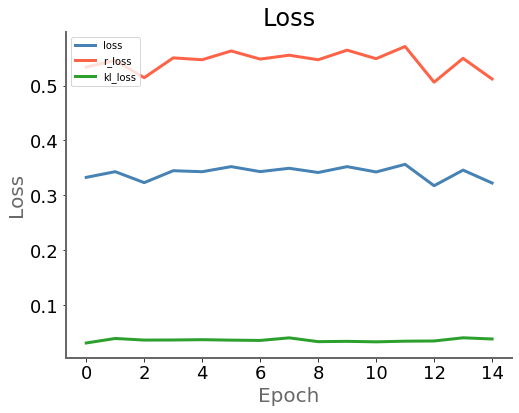

In [12]:
pwk.plot_history(history,  plot={"Loss":['loss','r_loss', 'kl_loss']}, save_as='01-history')

### 6.2 - Reconstruction (input -> encoder -> decoder)

<br>**Original images :**

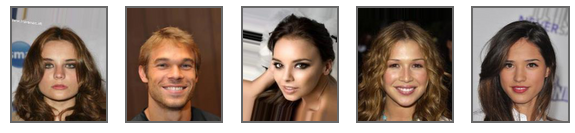

<br>**Encoded/decoded images**

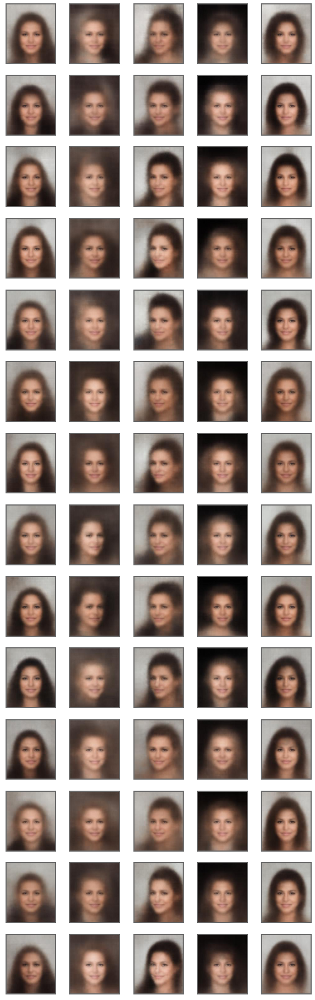

<br>**Original images :**

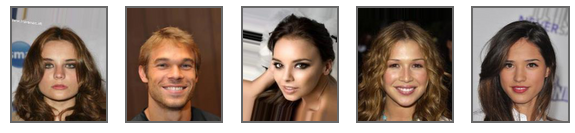

In [13]:
imgs=[]
labels=[]
for epoch in range(1,epochs,1):
    for i in range(5):
        filename = f'{run_dir}/images-encoded/image-{epoch:03d}-{i:02d}.jpg'.format(epoch=epoch, i=i)
        img      = io.imread(filename)
        imgs.append(img)
        

pwk.subtitle('Original images :')
pwk.plot_images(x_draw[:5], None, indices='all', columns=5, x_size=2,y_size=2, save_as='02-original')

pwk.subtitle('Encoded/decoded images')
pwk.plot_images(imgs, None, indices='all', columns=5, x_size=2,y_size=2, save_as='03-reconstruct')

pwk.subtitle('Original images :')
pwk.plot_images(x_draw[:5], None, indices='all', columns=5, x_size=2,y_size=2, save_as=None)


### 6.3 Generation (latent -> decoder)

<br>**Generated images from latent space**

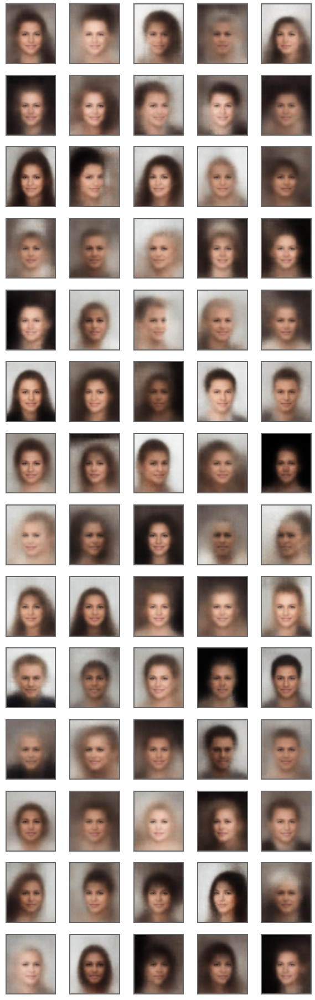

In [14]:
imgs=[]
labels=[]
for epoch in range(1,epochs,1):
    for i in range(5):
        filename = f'{run_dir}/images-generated/image-{epoch:03d}-{i:02d}.jpg'.format(epoch=epoch, i=i)
        img      = io.imread(filename)
        imgs.append(img)
        
pwk.subtitle('Generated images from latent space')
pwk.plot_images(imgs, None, indices='all', columns=5, x_size=2,y_size=2, save_as='04-encoded')


In [15]:
pwk.end()

End time is : Wednesday 27 January 2021, 20:32:27
Duration is : 01:01:58 550ms
This notebook ends here


---
<img width="80px" src="../fidle/img/00-Fidle-logo-01.svg"></img>